In [1]:
# 実験1：データ数と精度の確認

In [2]:
## 必要なライブラリのimport
import tensorflow as tf
import keras
from keras.models import Sequential, Model
from keras.layers import Conv1D, MaxPooling1D, Dense, Flatten, Input, concatenate
from keras.optimizers import RMSprop
import matplotlib.pyplot as plt
import numpy as np
from sklearn.model_selection import train_test_split
import random

In [27]:
## データについて

### データファイルのpath
no_hole_path = './../vibration_simulation/vibration_data/no_hole_data.csv'
one_hole_path = './../vibration_simulation/vibration_data/one_hole_data.csv'
four_holes_path = './../vibration_simulation/vibration_data/four_holes_data.csv'
nine_holes_path = './../vibration_simulation/vibration_data/nine_holes_data.csv'
sixteen_holes_path = './../vibration_simulation/vibration_data/sixteen_holes_data.csv'
twentyfive_holes_path = './../vibration_simulation/vibration_data/twentyfive_holes_data.csv'

### 入力データと正解データ
no_hole_data1 = []
no_hole_data2 = []
no_hole_data3 = []
size_x_data = []
size_x_data1 = []
size_x_data2 = []
size_x_data3 = []
size_y_data = []
position_x_data = []
position_x_data1 = []
position_x_data2 = []
position_x_data3 = []
position_one_data1 = []
position_one_data2 = []
position_one_data3 = []
position_two_data1 = []
position_two_data2 = []
position_two_data3 = []
position_three_data1 = []
position_three_data2 = []
position_three_data3 = []
position_four_data1 = []
position_four_data2 = []
position_four_data3 = []
position_five_data1 = []
position_five_data2 = []
position_five_data3 = []
position_y_data = []

### ファイル読み込み

#### 欠陥がない場合のデータ
with open(no_hole_path) as f:
    for line in f:
        data_array = line.split(' ')
        no_hole_data1 = data_array[0:1251]
        no_hole_data2 = data_array[1251:2502]
        no_hole_data3 = data_array[2502:-1]
        
#### 大きさに関するデータ
with open(one_hole_path) as fs1:
  for line in fs1:
    data_array = line.split(' ')
    size_x_data1.append(data_array[3:1254])
    size_x_data2.append(data_array[1254:2505])
    size_x_data3.append(data_array[2505:-1])
    size_y_data.append(data_array[0])
with open(four_holes_path) as fs2:
  for line in fs2:
    data_array = line.split(' ')
    size_x_data1.append(data_array[3:1254])
    size_x_data2.append(data_array[1254:2505])
    size_x_data3.append(data_array[2505:-1])
    size_y_data.append(data_array[0])
with open(nine_holes_path) as fs3:
  for line in fs3:
    data_array = line.split(' ')
    size_x_data1.append(data_array[3:1254])
    size_x_data2.append(data_array[1254:2505])
    size_x_data3.append(data_array[2505:-1])
    size_y_data.append(data_array[0])
with open(sixteen_holes_path) as fs4:
  for line in fs4:
    data_array = line.split(' ')
    size_x_data1.append(data_array[3:1254])
    size_x_data2.append(data_array[1254:2505])
    size_x_data3.append(data_array[2505:-1])
    size_y_data.append(data_array[0])
with open(twentyfive_holes_path) as fs5:
  for line in fs5:
    data_array = line.split(' ')
    size_x_data1.append(data_array[3:1254])
    size_x_data2.append(data_array[1254:2505])
    size_x_data3.append(data_array[2505:-1])
    size_y_data.append(data_array[0])

#### 位置に関するデータ
with open(one_hole_path) as fp1:
  for line in fp1:
    data_array = line.split(' ')
    position_x_data1.append(data_array[3:1254])
    position_x_data2.append(data_array[1254:2505])
    position_x_data3.append(data_array[2505:-1])
    position_one_data1.append(data_array[3:1254])
    position_one_data2.append(data_array[1254:2505])
    position_one_data3.append(data_array[2505:-1])
    position_y_data.append(data_array[1:3])
with open(four_holes_path) as fp2:
  for line in fp2:
    data_array = line.split(' ')
    position_x_data1.append(data_array[3:1254])
    position_x_data2.append(data_array[1254:2505])
    position_x_data3.append(data_array[2505:-1])
    position_two_data1.append(data_array[3:1254])
    position_two_data2.append(data_array[1254:2505])
    position_two_data3.append(data_array[2505:-1])
    position_y_data.append(data_array[1:3])
with open(nine_holes_path) as fp3:
  for line in fp3:
    data_array = line.split(' ')
    position_x_data1.append(data_array[3:1254])
    position_x_data2.append(data_array[1254:2505])
    position_x_data3.append(data_array[2505:-1])
    position_three_data1.append(data_array[3:1254])
    position_three_data2.append(data_array[1254:2505])
    position_three_data3.append(data_array[2505:-1])
    position_y_data.append(data_array[1:3])
with open(sixteen_holes_path) as fp4:
  for line in fp4:
    data_array = line.split(' ')
    position_x_data1.append(data_array[3:1254])
    position_x_data2.append(data_array[1254:2505])
    position_x_data3.append(data_array[2505:-1])
    position_four_data1.append(data_array[3:1254])
    position_four_data2.append(data_array[1254:2505])
    position_four_data3.append(data_array[2505:-1])
    position_y_data.append(data_array[1:3])
with open(twentyfive_holes_path) as fp5:
  for line in fp5:
    data_array = line.split(' ')
    position_x_data1.append(data_array[3:1254])
    position_x_data2.append(data_array[1254:2505])
    position_x_data3.append(data_array[2505:-1])
    position_five_data1.append(data_array[3:1254])
    position_five_data2.append(data_array[1254:2505])
    position_five_data3.append(data_array[2505:-1])
    position_y_data.append(data_array[1:3])

### 各配列をnp.array型にして各要素を型変換
no_hole_data1 = np.array(no_hole_data1, dtype=float)
no_hole_data2 = np.array(no_hole_data2, dtype=float)
no_hole_data3 = np.array(no_hole_data3, dtype=float)
size_x_data1 = np.array(size_x_data1, dtype=float)
size_x_data2 = np.array(size_x_data2, dtype=float)
size_x_data3 = np.array(size_x_data3, dtype=float)
size_y_data = np.array(size_y_data, dtype=int)
position_x_data1 = np.array(position_x_data1, dtype=float)
position_x_data2 = np.array(position_x_data2, dtype=float)
position_x_data3 = np.array(position_x_data3, dtype=float)
position_one_data1 = np.array(position_one_data1, dtype=float)
position_two_data1 = np.array(position_two_data1, dtype=float)
position_three_data1 = np.array(position_three_data1, dtype=float)
position_four_data1 = np.array(position_four_data1, dtype=float)
position_five_data1 = np.array(position_five_data1, dtype=float)
position_one_data2 = np.array(position_one_data2, dtype=float)
position_two_data2 = np.array(position_two_data2, dtype=float)
position_three_data2 = np.array(position_three_data2, dtype=float)
position_four_data2 = np.array(position_four_data2, dtype=float)
position_five_data2 = np.array(position_five_data2, dtype=float)
position_one_data3 = np.array(position_one_data3, dtype=float)
position_two_data3 = np.array(position_two_data3, dtype=float)
position_three_data3 = np.array(position_three_data3, dtype=float)
position_four_data3 = np.array(position_four_data3, dtype=float)
position_five_data3 = np.array(position_five_data3, dtype=float)
position_y_data = np.array(position_y_data, dtype=float)

### データの加工
# 最大値で割る
max_displacement = size_x_data2.max()
size_x_data1 = size_x_data1/max_displacement
size_x_data2 = size_x_data2/max_displacement
size_x_data3 = size_x_data3/max_displacement
position_x_data1 = position_x_data1/max_displacement
position_x_data2 = position_x_data2/max_displacement
position_x_data3 = position_x_data3/max_displacement
position_one_data1 = position_one_data1/max_displacement
position_one_data2 = position_one_data2/max_displacement
position_one_data3 = position_one_data3/max_displacement
position_two_data1 = position_two_data1/max_displacement
position_two_data2 = position_two_data2/max_displacement
position_two_data3 = position_two_data3/max_displacement
position_three_data1 = position_three_data1/max_displacement
position_three_data2 = position_three_data2/max_displacement
position_three_data3 = position_three_data3/max_displacement
position_four_data1 = position_four_data1/max_displacement
position_four_data2 = position_four_data2/max_displacement
position_four_data3 = position_four_data3/max_displacement
position_five_data1 = position_five_data1/max_displacement
position_five_data2 = position_five_data2/max_displacement
position_five_data3 = position_five_data3/max_displacement
position_y_data = position_y_data/50


### データを50個から1000個ランダムに選んだときのデータセット作成
x_size_data_array1 = []
x_size_data_array2 = []
x_size_data_array3 = []
x_position_data_array1 = []
x_position_data_array2 = []
x_position_data_array3 = []
y_size_data_array = []
y_position_data_array = []
x_index = []
for i in range(len(size_x_data1)):
    x_index.append(i)
for i in range(20):
    data_count = 50*(i + 1)
    used_index = random.sample(x_index, data_count)
    used_x_size_data1 = []
    used_x_size_data2 = []
    used_x_size_data3 = []
    used_x_position_data1 = []
    used_x_position_data2 = []
    used_x_position_data3 = []
    used_y_size_data = []
    used_y_position_data = []
    for i in range(len(used_index)):
        used_x_size_data1.append(size_x_data1[used_index[i]])
        used_x_size_data2.append(size_x_data2[used_index[i]])
        used_x_size_data3.append(size_x_data3[used_index[i]])
        used_x_position_data1.append(position_x_data1[used_index[i]])
        used_x_position_data2.append(position_x_data2[used_index[i]])
        used_x_position_data3.append(position_x_data3[used_index[i]])
        used_y_size_data.append(size_y_data[used_index[i]])
        used_y_position_data.append(position_y_data[used_index[i]])
    y_size_data_array.append(used_y_size_data)
    y_position_data_array.append(used_y_position_data)
    x_size_data_array1.append(used_x_size_data1)
    x_size_data_array2.append(used_x_size_data2)
    x_size_data_array3.append(used_x_size_data3)
    x_position_data_array1.append(used_x_position_data1)
    x_position_data_array2.append(used_x_position_data2)
    x_position_data_array3.append(used_x_position_data3)

### train用とtest用に分割(4:1)
x_size_train_array1 = []
x_size_train_array2 = []
x_size_train_array3 = []
x_size_test_array1 = []
x_size_test_array2 = []
x_size_test_array3 = []
x_position_train_array1 = []
x_position_train_array2 = []
x_position_train_array3 = []
x_position_test_array1 = []
x_position_test_array2 = []
x_position_test_array3 = []
y_size_train_array = []
y_size_test_array = []
y_position_train_array = []
y_position_test_array = []
for i in range(20):
    x_size_train1, x_size_test1, x_size_train2, x_size_test2, x_size_train3, x_size_test3, y_size_train, y_size_test = train_test_split(x_size_data_array1[i], x_size_data_array2[i], x_size_data_array3[i], y_size_data_array[i], test_size=0.10)
    x_position_train1, x_position_test1, x_position_train2, x_position_test2, x_position_train3, x_position_test3, y_position_train, y_position_test = train_test_split(x_position_data_array1[i], x_position_data_array2[i], x_position_data_array3[i], y_position_data_array[i], test_size=0.10)
    x_size_train_array1.append(np.array(x_size_train1))
    x_size_train_array2.append(np.array(x_size_train2))
    x_size_train_array3.append(np.array(x_size_train3))
    x_size_test_array1.append(np.array(x_size_test1))
    x_size_test_array2.append(np.array(x_size_test2))
    x_size_test_array3.append(np.array(x_size_test3))
    x_position_train_array1.append(np.array(x_position_train1))
    x_position_train_array2.append(np.array(x_position_train2))
    x_position_train_array3.append(np.array(x_position_train3))
    x_position_test_array1.append(np.array(x_position_test1))
    x_position_test_array2.append(np.array(x_position_test2))
    x_position_test_array3.append(np.array(x_position_test3))
    y_size_train_array.append(np.array(y_size_train))
    y_size_test_array.append(np.array(y_size_test))
    y_position_train_array.append(np.array(y_position_train))
    y_position_test_array.append(np.array(y_position_test))

In [28]:
# 大きさ推定のモデル
model_size_array = []

for i in range(20):
    # 入力を定義
    input1 = Input(shape=(1251,1))
    input2 = Input(shape=(1251,1))
    input3 = Input(shape=(1251,1))

    # 入力1から結合前まで
    x = Conv1D(32, 3, padding='same', activation='tanh')(input1)
    x = MaxPooling1D(2, padding='same')(x)
    x = Model(inputs=input1, outputs=x)
    # 入力2から結合前まで
    y = Conv1D(32, 3, padding='same', activation='tanh')(input2)
    y = MaxPooling1D(2, padding='same')(y)
    y = Model(inputs=input2, outputs=y)
    # 入力3から結合前まで
    z = Conv1D(32, 3, padding='same', activation='tanh')(input3)
    z = MaxPooling1D(2, padding='same')(z)
    z = Model(inputs=input3, outputs=z)

    # 結合
    combined = concatenate([x.output, y.output, z.output])

    # 密結合
    cnn = Flatten()(combined)
    cnn = Dense(1, activation="linear")(cnn)

    # モデル定義とコンパイル
    cnn_size_model = Model(inputs=[x.input, y.input, z.input], outputs=cnn)
    cnn_size_model.compile(loss='mse', optimizer='adam', metrics=['acc'])
    model_size_array.append(cnn_size_model)

In [29]:
# 学習ループ
history_size_array = []
for i in range(len(model_size_array)):
    epochs = 4000
    batch_size = 128
    history_size_array.append(model_size_array[i].fit([x_size_train_array1[i], x_size_train_array2[i], x_size_train_array3[i]], y_size_train_array[i], batch_size=batch_size, epochs=epochs, verbose=1, validation_data=([x_size_test_array1[i], x_size_test_array2[i], x_size_test_array3[i]], y_size_test_array[i])))

Epoch 1/4000
1/1 [==============================] - 0s 200ms/step - loss: 9.2179 - acc: 0.0000e+00 - val_loss: 8.7690 - val_acc: 0.0000e+00
Epoch 2/4000
1/1 [==============================] - 0s 37ms/step - loss: 7.6305 - acc: 0.0000e+00 - val_loss: 7.0653 - val_acc: 0.4000
Epoch 3/4000
1/1 [==============================] - 0s 40ms/step - loss: 5.9999 - acc: 0.2444 - val_loss: 5.3707 - val_acc: 0.4000
Epoch 4/4000
1/1 [==============================] - 0s 41ms/step - loss: 4.3905 - acc: 0.2444 - val_loss: 3.8688 - val_acc: 0.4000
Epoch 5/4000
1/1 [==============================] - 0s 34ms/step - loss: 2.9873 - acc: 0.2444 - val_loss: 2.8292 - val_acc: 0.4000
Epoch 6/4000
1/1 [==============================] - 0s 36ms/step - loss: 2.0592 - acc: 0.2444 - val_loss: 2.5619 - val_acc: 0.4000
Epoch 7/4000
1/1 [==============================] - 0s 34ms/step - loss: 1.9112 - acc: 0.2444 - val_loss: 3.0847 - val_acc: 0.4000
Epoch 8/4000
1/1 [==============================] - 0s 38ms/step - los

1/1 [==============================] - 0s 31ms/step - loss: 1.8197 - acc: 0.2444 - val_loss: 2.5361 - val_acc: 0.4000
Epoch 64/4000
1/1 [==============================] - 0s 48ms/step - loss: 1.8174 - acc: 0.2444 - val_loss: 2.5319 - val_acc: 0.4000
Epoch 65/4000
1/1 [==============================] - 0s 34ms/step - loss: 1.8159 - acc: 0.2444 - val_loss: 2.5289 - val_acc: 0.4000
Epoch 66/4000
1/1 [==============================] - 0s 35ms/step - loss: 1.8151 - acc: 0.2444 - val_loss: 2.5269 - val_acc: 0.4000
Epoch 67/4000
1/1 [==============================] - 0s 36ms/step - loss: 1.8145 - acc: 0.2444 - val_loss: 2.5257 - val_acc: 0.4000
Epoch 68/4000
1/1 [==============================] - 0s 34ms/step - loss: 1.8136 - acc: 0.2444 - val_loss: 2.5251 - val_acc: 0.4000
Epoch 69/4000
1/1 [==============================] - 0s 35ms/step - loss: 1.8123 - acc: 0.2444 - val_loss: 2.5250 - val_acc: 0.4000
Epoch 70/4000
1/1 [==============================] - 0s 35ms/step - loss: 1.8104 - acc: 0.

Epoch 125/4000
1/1 [==============================] - 0s 31ms/step - loss: 1.7180 - acc: 0.2444 - val_loss: 2.4990 - val_acc: 0.4000
Epoch 126/4000
1/1 [==============================] - 0s 31ms/step - loss: 1.7161 - acc: 0.2444 - val_loss: 2.4982 - val_acc: 0.4000
Epoch 127/4000
1/1 [==============================] - 0s 31ms/step - loss: 1.7143 - acc: 0.2444 - val_loss: 2.4974 - val_acc: 0.4000
Epoch 128/4000
1/1 [==============================] - 0s 32ms/step - loss: 1.7124 - acc: 0.2444 - val_loss: 2.4965 - val_acc: 0.4000
Epoch 129/4000
1/1 [==============================] - 0s 31ms/step - loss: 1.7106 - acc: 0.2444 - val_loss: 2.4957 - val_acc: 0.4000
Epoch 130/4000
1/1 [==============================] - 0s 31ms/step - loss: 1.7087 - acc: 0.2444 - val_loss: 2.4950 - val_acc: 0.4000
Epoch 131/4000
1/1 [==============================] - 0s 31ms/step - loss: 1.7069 - acc: 0.2444 - val_loss: 2.4943 - val_acc: 0.4000
Epoch 132/4000
1/1 [==============================] - 0s 31ms/step - 

Epoch 248/4000
1/1 [==============================] - 0s 37ms/step - loss: 1.4603 - acc: 0.2444 - val_loss: 2.4041 - val_acc: 0.4000
Epoch 249/4000
1/1 [==============================] - 0s 32ms/step - loss: 1.4583 - acc: 0.2444 - val_loss: 2.4032 - val_acc: 0.4000
Epoch 250/4000
1/1 [==============================] - 0s 33ms/step - loss: 1.4562 - acc: 0.2444 - val_loss: 2.4024 - val_acc: 0.4000
Epoch 251/4000
1/1 [==============================] - 0s 34ms/step - loss: 1.4542 - acc: 0.2444 - val_loss: 2.4015 - val_acc: 0.4000
Epoch 252/4000
1/1 [==============================] - 0s 33ms/step - loss: 1.4522 - acc: 0.2444 - val_loss: 2.4006 - val_acc: 0.4000
Epoch 253/4000
1/1 [==============================] - 0s 39ms/step - loss: 1.4502 - acc: 0.2444 - val_loss: 2.3997 - val_acc: 0.4000
Epoch 254/4000
1/1 [==============================] - 0s 31ms/step - loss: 1.4482 - acc: 0.2444 - val_loss: 2.3989 - val_acc: 0.4000
Epoch 255/4000
1/1 [==============================] - 0s 36ms/step - 

Epoch 371/4000
1/1 [==============================] - 0s 34ms/step - loss: 1.2682 - acc: 0.2444 - val_loss: 2.2774 - val_acc: 0.4000
Epoch 372/4000
1/1 [==============================] - 0s 32ms/step - loss: 1.2669 - acc: 0.2444 - val_loss: 2.2762 - val_acc: 0.4000
Epoch 373/4000
1/1 [==============================] - 0s 32ms/step - loss: 1.2657 - acc: 0.2444 - val_loss: 2.2750 - val_acc: 0.4000
Epoch 374/4000
1/1 [==============================] - 0s 42ms/step - loss: 1.2644 - acc: 0.2444 - val_loss: 2.2738 - val_acc: 0.4000
Epoch 375/4000
1/1 [==============================] - 0s 35ms/step - loss: 1.2632 - acc: 0.2444 - val_loss: 2.2726 - val_acc: 0.4000
Epoch 376/4000
1/1 [==============================] - 0s 34ms/step - loss: 1.2619 - acc: 0.2444 - val_loss: 2.2713 - val_acc: 0.4000
Epoch 377/4000
1/1 [==============================] - 0s 33ms/step - loss: 1.2607 - acc: 0.2444 - val_loss: 2.2701 - val_acc: 0.4000
Epoch 378/4000
1/1 [==============================] - 0s 35ms/step - 

Epoch 494/4000
1/1 [==============================] - 0s 40ms/step - loss: 1.1062 - acc: 0.2444 - val_loss: 2.1341 - val_acc: 0.4000
Epoch 495/4000
1/1 [==============================] - 0s 43ms/step - loss: 1.1047 - acc: 0.2444 - val_loss: 2.1332 - val_acc: 0.4000
Epoch 496/4000
1/1 [==============================] - 0s 32ms/step - loss: 1.1032 - acc: 0.2444 - val_loss: 2.1323 - val_acc: 0.4000
Epoch 497/4000
1/1 [==============================] - 0s 33ms/step - loss: 1.1018 - acc: 0.2444 - val_loss: 2.1314 - val_acc: 0.4000
Epoch 498/4000
1/1 [==============================] - 0s 34ms/step - loss: 1.1003 - acc: 0.2444 - val_loss: 2.1305 - val_acc: 0.4000
Epoch 499/4000
1/1 [==============================] - 0s 33ms/step - loss: 1.0988 - acc: 0.2444 - val_loss: 2.1296 - val_acc: 0.4000
Epoch 500/4000
1/1 [==============================] - 0s 32ms/step - loss: 1.0973 - acc: 0.2444 - val_loss: 2.1288 - val_acc: 0.4000
Epoch 501/4000
1/1 [==============================] - 0s 31ms/step - 

1/1 [==============================] - 0s 32ms/step - loss: 0.9045 - acc: 0.2444 - val_loss: 2.1040 - val_acc: 0.4000
Epoch 617/4000
1/1 [==============================] - 0s 32ms/step - loss: 0.9027 - acc: 0.2444 - val_loss: 2.1065 - val_acc: 0.4000
Epoch 618/4000
1/1 [==============================] - 0s 32ms/step - loss: 0.9010 - acc: 0.2444 - val_loss: 2.1032 - val_acc: 0.4000
Epoch 619/4000
1/1 [==============================] - 0s 32ms/step - loss: 0.8994 - acc: 0.2444 - val_loss: 2.1133 - val_acc: 0.4000
Epoch 620/4000
1/1 [==============================] - 0s 33ms/step - loss: 0.8984 - acc: 0.2444 - val_loss: 2.0982 - val_acc: 0.4000
Epoch 621/4000
1/1 [==============================] - 0s 32ms/step - loss: 0.9001 - acc: 0.2444 - val_loss: 2.1532 - val_acc: 0.4000
Epoch 622/4000
1/1 [==============================] - 0s 31ms/step - loss: 0.9124 - acc: 0.2444 - val_loss: 2.1184 - val_acc: 0.4000
Epoch 623/4000
1/1 [==============================] - 0s 40ms/step - loss: 0.9515 - 

Epoch 678/4000
1/1 [==============================] - 0s 37ms/step - loss: 0.8158 - acc: 0.2444 - val_loss: 2.1553 - val_acc: 0.4000
Epoch 679/4000
1/1 [==============================] - 0s 37ms/step - loss: 0.8141 - acc: 0.2444 - val_loss: 2.1544 - val_acc: 0.4000
Epoch 680/4000
1/1 [==============================] - 0s 38ms/step - loss: 0.8126 - acc: 0.2444 - val_loss: 2.1493 - val_acc: 0.4000
Epoch 681/4000
1/1 [==============================] - 0s 38ms/step - loss: 0.8115 - acc: 0.2444 - val_loss: 2.1589 - val_acc: 0.4000
Epoch 682/4000
1/1 [==============================] - 0s 34ms/step - loss: 0.8101 - acc: 0.2444 - val_loss: 2.1554 - val_acc: 0.4000
Epoch 683/4000
1/1 [==============================] - 0s 38ms/step - loss: 0.8085 - acc: 0.2444 - val_loss: 2.1535 - val_acc: 0.4000
Epoch 684/4000
1/1 [==============================] - 0s 34ms/step - loss: 0.8072 - acc: 0.2444 - val_loss: 2.1620 - val_acc: 0.4000
Epoch 685/4000
1/1 [==============================] - 0s 67ms/step - 

Epoch 801/4000
1/1 [==============================] - 0s 36ms/step - loss: 0.6719 - acc: 0.2444 - val_loss: 2.3059 - val_acc: 0.4000
Epoch 802/4000
1/1 [==============================] - 0s 33ms/step - loss: 0.6708 - acc: 0.2444 - val_loss: 2.3165 - val_acc: 0.4000
Epoch 803/4000
1/1 [==============================] - 0s 32ms/step - loss: 0.6696 - acc: 0.2444 - val_loss: 2.3164 - val_acc: 0.4000
Epoch 804/4000
1/1 [==============================] - 0s 40ms/step - loss: 0.6686 - acc: 0.2444 - val_loss: 2.3120 - val_acc: 0.4000
Epoch 805/4000
1/1 [==============================] - 0s 31ms/step - loss: 0.6677 - acc: 0.2444 - val_loss: 2.3244 - val_acc: 0.4000
Epoch 806/4000
1/1 [==============================] - 0s 32ms/step - loss: 0.6668 - acc: 0.2444 - val_loss: 2.3143 - val_acc: 0.4000
Epoch 807/4000
1/1 [==============================] - 0s 33ms/step - loss: 0.6658 - acc: 0.2444 - val_loss: 2.3242 - val_acc: 0.4000
Epoch 808/4000
1/1 [==============================] - 0s 35ms/step - 

Epoch 924/4000
1/1 [==============================] - 0s 39ms/step - loss: 0.5688 - acc: 0.2444 - val_loss: 2.5059 - val_acc: 0.4000
Epoch 925/4000
1/1 [==============================] - 0s 33ms/step - loss: 0.5681 - acc: 0.2444 - val_loss: 2.5073 - val_acc: 0.4000
Epoch 926/4000
1/1 [==============================] - 0s 32ms/step - loss: 0.5673 - acc: 0.2444 - val_loss: 2.5066 - val_acc: 0.4000
Epoch 927/4000
1/1 [==============================] - 0s 33ms/step - loss: 0.5665 - acc: 0.2444 - val_loss: 2.5126 - val_acc: 0.4000
Epoch 928/4000
1/1 [==============================] - 0s 32ms/step - loss: 0.5658 - acc: 0.2444 - val_loss: 2.5079 - val_acc: 0.4000
Epoch 929/4000
1/1 [==============================] - 0s 32ms/step - loss: 0.5651 - acc: 0.2444 - val_loss: 2.5173 - val_acc: 0.4000
Epoch 930/4000
1/1 [==============================] - 0s 32ms/step - loss: 0.5643 - acc: 0.2444 - val_loss: 2.5098 - val_acc: 0.4000
Epoch 931/4000
1/1 [==============================] - 0s 31ms/step - 

1/1 [==============================] - 0s 36ms/step - loss: 0.4921 - acc: 0.2444 - val_loss: 2.6361 - val_acc: 0.4000
Epoch 1047/4000
1/1 [==============================] - 0s 47ms/step - loss: 0.4952 - acc: 0.2444 - val_loss: 2.7699 - val_acc: 0.4000
Epoch 1048/4000
1/1 [==============================] - 0s 47ms/step - loss: 0.5017 - acc: 0.2444 - val_loss: 2.6138 - val_acc: 0.4000
Epoch 1049/4000
1/1 [==============================] - 0s 38ms/step - loss: 0.5144 - acc: 0.2444 - val_loss: 2.8707 - val_acc: 0.4000
Epoch 1050/4000
1/1 [==============================] - 0s 37ms/step - loss: 0.5375 - acc: 0.2444 - val_loss: 2.6020 - val_acc: 0.4000
Epoch 1051/4000
1/1 [==============================] - 0s 33ms/step - loss: 0.5754 - acc: 0.2444 - val_loss: 3.0427 - val_acc: 0.4000
Epoch 1052/4000
1/1 [==============================] - 0s 35ms/step - loss: 0.6222 - acc: 0.2444 - val_loss: 2.6190 - val_acc: 0.4000
Epoch 1053/4000
1/1 [==============================] - 0s 43ms/step - loss: 0.

1/1 [==============================] - 0s 38ms/step - loss: 0.4215 - acc: 0.2444 - val_loss: 2.8759 - val_acc: 0.4000
Epoch 1169/4000
1/1 [==============================] - 0s 37ms/step - loss: 0.4246 - acc: 0.2444 - val_loss: 2.7640 - val_acc: 0.4000
Epoch 1170/4000
1/1 [==============================] - 0s 35ms/step - loss: 0.4323 - acc: 0.2444 - val_loss: 2.9630 - val_acc: 0.4000
Epoch 1171/4000
1/1 [==============================] - 0s 31ms/step - loss: 0.4499 - acc: 0.2444 - val_loss: 2.7375 - val_acc: 0.4000
Epoch 1172/4000
1/1 [==============================] - 0s 32ms/step - loss: 0.4885 - acc: 0.2444 - val_loss: 3.1992 - val_acc: 0.4000
Epoch 1173/4000
1/1 [==============================] - 0s 41ms/step - loss: 0.5637 - acc: 0.2444 - val_loss: 2.7881 - val_acc: 0.4000
Epoch 1174/4000
1/1 [==============================] - 0s 46ms/step - loss: 0.6798 - acc: 0.2222 - val_loss: 3.5187 - val_acc: 0.4000
Epoch 1175/4000
1/1 [==============================] - 0s 35ms/step - loss: 0.

1/1 [==============================] - 0s 34ms/step - loss: 0.3619 - acc: 0.2444 - val_loss: 2.9183 - val_acc: 0.4000
Epoch 1291/4000
1/1 [==============================] - 0s 33ms/step - loss: 0.3614 - acc: 0.2444 - val_loss: 2.9183 - val_acc: 0.4000
Epoch 1292/4000
1/1 [==============================] - 0s 33ms/step - loss: 0.3610 - acc: 0.2444 - val_loss: 2.9187 - val_acc: 0.4000
Epoch 1293/4000
1/1 [==============================] - 0s 34ms/step - loss: 0.3605 - acc: 0.2444 - val_loss: 2.9204 - val_acc: 0.4000
Epoch 1294/4000
1/1 [==============================] - 0s 42ms/step - loss: 0.3600 - acc: 0.2444 - val_loss: 2.9197 - val_acc: 0.4000
Epoch 1295/4000
1/1 [==============================] - 0s 33ms/step - loss: 0.3596 - acc: 0.2444 - val_loss: 2.9217 - val_acc: 0.4000
Epoch 1296/4000
1/1 [==============================] - 0s 51ms/step - loss: 0.3591 - acc: 0.2444 - val_loss: 2.9214 - val_acc: 0.4000
Epoch 1297/4000
1/1 [==============================] - 0s 33ms/step - loss: 0.

1/1 [==============================] - 0s 32ms/step - loss: 0.3124 - acc: 0.2444 - val_loss: 3.0100 - val_acc: 0.4000
Epoch 1413/4000
1/1 [==============================] - 0s 33ms/step - loss: 0.3130 - acc: 0.2444 - val_loss: 2.9786 - val_acc: 0.4000
Epoch 1414/4000
1/1 [==============================] - 0s 42ms/step - loss: 0.3118 - acc: 0.2444 - val_loss: 2.9894 - val_acc: 0.4000
Epoch 1415/4000
1/1 [==============================] - 0s 33ms/step - loss: 0.3108 - acc: 0.2444 - val_loss: 3.0052 - val_acc: 0.4000
Epoch 1416/4000
1/1 [==============================] - 0s 31ms/step - loss: 0.3111 - acc: 0.2444 - val_loss: 2.9780 - val_acc: 0.4000
Epoch 1417/4000
1/1 [==============================] - 0s 34ms/step - loss: 0.3109 - acc: 0.2444 - val_loss: 2.9982 - val_acc: 0.4000
Epoch 1418/4000
1/1 [==============================] - 0s 32ms/step - loss: 0.3098 - acc: 0.2444 - val_loss: 2.9986 - val_acc: 0.4000
Epoch 1419/4000
1/1 [==============================] - 0s 32ms/step - loss: 0.

1/1 [==============================] - 0s 32ms/step - loss: 0.2670 - acc: 0.2444 - val_loss: 3.0292 - val_acc: 0.4000
Epoch 1535/4000
1/1 [==============================] - 0s 39ms/step - loss: 0.2666 - acc: 0.2444 - val_loss: 3.0291 - val_acc: 0.4000
Epoch 1536/4000
1/1 [==============================] - 0s 32ms/step - loss: 0.2663 - acc: 0.2444 - val_loss: 3.0297 - val_acc: 0.4000
Epoch 1537/4000
1/1 [==============================] - 0s 32ms/step - loss: 0.2659 - acc: 0.2444 - val_loss: 3.0296 - val_acc: 0.4000
Epoch 1538/4000
1/1 [==============================] - 0s 33ms/step - loss: 0.2655 - acc: 0.2444 - val_loss: 3.0303 - val_acc: 0.4000
Epoch 1539/4000
1/1 [==============================] - 0s 36ms/step - loss: 0.2652 - acc: 0.2444 - val_loss: 3.0300 - val_acc: 0.4000
Epoch 1540/4000
1/1 [==============================] - 0s 32ms/step - loss: 0.2648 - acc: 0.2444 - val_loss: 3.0309 - val_acc: 0.4000
Epoch 1541/4000
1/1 [==============================] - 0s 34ms/step - loss: 0.

1/1 [==============================] - 0s 34ms/step - loss: 0.2335 - acc: 0.2444 - val_loss: 3.0599 - val_acc: 0.4000
Epoch 1657/4000
1/1 [==============================] - 0s 33ms/step - loss: 0.2332 - acc: 0.2444 - val_loss: 3.0575 - val_acc: 0.4000
Epoch 1658/4000
1/1 [==============================] - 0s 32ms/step - loss: 0.2329 - acc: 0.2444 - val_loss: 3.0580 - val_acc: 0.4000
Epoch 1659/4000
1/1 [==============================] - 0s 34ms/step - loss: 0.2327 - acc: 0.2444 - val_loss: 3.0597 - val_acc: 0.4000
Epoch 1660/4000
1/1 [==============================] - 0s 33ms/step - loss: 0.2324 - acc: 0.2444 - val_loss: 3.0572 - val_acc: 0.4000
Epoch 1661/4000
1/1 [==============================] - 0s 34ms/step - loss: 0.2321 - acc: 0.2444 - val_loss: 3.0594 - val_acc: 0.4000
Epoch 1662/4000
1/1 [==============================] - 0s 33ms/step - loss: 0.2319 - acc: 0.2444 - val_loss: 3.0588 - val_acc: 0.4000
Epoch 1663/4000
1/1 [==============================] - 0s 31ms/step - loss: 0.

1/1 [==============================] - 0s 33ms/step - loss: 0.2021 - acc: 0.2444 - val_loss: 3.0630 - val_acc: 0.4000
Epoch 1779/4000
1/1 [==============================] - 0s 33ms/step - loss: 0.2019 - acc: 0.2444 - val_loss: 3.0598 - val_acc: 0.4000
Epoch 1780/4000
1/1 [==============================] - 0s 32ms/step - loss: 0.2016 - acc: 0.2444 - val_loss: 3.0642 - val_acc: 0.4000
Epoch 1781/4000
1/1 [==============================] - 0s 33ms/step - loss: 0.2014 - acc: 0.2444 - val_loss: 3.0582 - val_acc: 0.4000
Epoch 1782/4000
1/1 [==============================] - 0s 32ms/step - loss: 0.2013 - acc: 0.2444 - val_loss: 3.0669 - val_acc: 0.4000
Epoch 1783/4000
1/1 [==============================] - 0s 32ms/step - loss: 0.2013 - acc: 0.2444 - val_loss: 3.0551 - val_acc: 0.4000
Epoch 1784/4000
1/1 [==============================] - 0s 39ms/step - loss: 0.2014 - acc: 0.2444 - val_loss: 3.0735 - val_acc: 0.4000
Epoch 1785/4000
1/1 [==============================] - 0s 32ms/step - loss: 0.

1/1 [==============================] - 0s 35ms/step - loss: 0.1811 - acc: 0.2444 - val_loss: 3.0736 - val_acc: 0.4000
Epoch 1901/4000
1/1 [==============================] - 0s 34ms/step - loss: 0.1809 - acc: 0.2444 - val_loss: 3.0735 - val_acc: 0.4000
Epoch 1902/4000
1/1 [==============================] - 0s 33ms/step - loss: 0.1807 - acc: 0.2444 - val_loss: 3.0730 - val_acc: 0.4000
Epoch 1903/4000
1/1 [==============================] - 0s 33ms/step - loss: 0.1805 - acc: 0.2444 - val_loss: 3.0736 - val_acc: 0.4000
Epoch 1904/4000
1/1 [==============================] - 0s 33ms/step - loss: 0.1804 - acc: 0.2444 - val_loss: 3.0730 - val_acc: 0.4000
Epoch 1905/4000
1/1 [==============================] - 0s 39ms/step - loss: 0.1802 - acc: 0.2444 - val_loss: 3.0729 - val_acc: 0.4000
Epoch 1906/4000
1/1 [==============================] - 0s 33ms/step - loss: 0.1800 - acc: 0.2444 - val_loss: 3.0732 - val_acc: 0.4000
Epoch 1907/4000
1/1 [==============================] - 0s 34ms/step - loss: 0.

1/1 [==============================] - 0s 32ms/step - loss: 0.1605 - acc: 0.2444 - val_loss: 3.0569 - val_acc: 0.4000
Epoch 2023/4000
1/1 [==============================] - 0s 35ms/step - loss: 0.1604 - acc: 0.2444 - val_loss: 3.0567 - val_acc: 0.4000
Epoch 2024/4000
1/1 [==============================] - 0s 36ms/step - loss: 0.1602 - acc: 0.2444 - val_loss: 3.0565 - val_acc: 0.4000
Epoch 2025/4000
1/1 [==============================] - 0s 42ms/step - loss: 0.1601 - acc: 0.2444 - val_loss: 3.0564 - val_acc: 0.4000
Epoch 2026/4000
1/1 [==============================] - 0s 34ms/step - loss: 0.1599 - acc: 0.2444 - val_loss: 3.0562 - val_acc: 0.4000
Epoch 2027/4000
1/1 [==============================] - 0s 34ms/step - loss: 0.1598 - acc: 0.2444 - val_loss: 3.0560 - val_acc: 0.4000
Epoch 2028/4000
1/1 [==============================] - 0s 35ms/step - loss: 0.1596 - acc: 0.2444 - val_loss: 3.0558 - val_acc: 0.4000
Epoch 2029/4000
1/1 [==============================] - 0s 34ms/step - loss: 0.

1/1 [==============================] - 0s 32ms/step - loss: 0.1471 - acc: 0.2444 - val_loss: 3.0611 - val_acc: 0.4000
Epoch 2145/4000
1/1 [==============================] - 0s 38ms/step - loss: 0.1468 - acc: 0.2444 - val_loss: 3.0609 - val_acc: 0.4000
Epoch 2146/4000
1/1 [==============================] - 0s 32ms/step - loss: 0.1467 - acc: 0.2444 - val_loss: 3.0614 - val_acc: 0.4000
Epoch 2147/4000
1/1 [==============================] - 0s 35ms/step - loss: 0.1467 - acc: 0.2444 - val_loss: 3.0604 - val_acc: 0.4000
Epoch 2148/4000
1/1 [==============================] - 0s 35ms/step - loss: 0.1465 - acc: 0.2444 - val_loss: 3.0606 - val_acc: 0.4000
Epoch 2149/4000
1/1 [==============================] - 0s 33ms/step - loss: 0.1463 - acc: 0.2444 - val_loss: 3.0606 - val_acc: 0.4000
Epoch 2150/4000
1/1 [==============================] - 0s 33ms/step - loss: 0.1462 - acc: 0.2444 - val_loss: 3.0598 - val_acc: 0.4000
Epoch 2151/4000
1/1 [==============================] - 0s 32ms/step - loss: 0.

1/1 [==============================] - 0s 42ms/step - loss: 0.1336 - acc: 0.2444 - val_loss: 3.0350 - val_acc: 0.4000
Epoch 2267/4000
1/1 [==============================] - 0s 31ms/step - loss: 0.1335 - acc: 0.2444 - val_loss: 3.0347 - val_acc: 0.4000
Epoch 2268/4000
1/1 [==============================] - 0s 32ms/step - loss: 0.1334 - acc: 0.2444 - val_loss: 3.0344 - val_acc: 0.4000
Epoch 2269/4000
1/1 [==============================] - 0s 32ms/step - loss: 0.1333 - acc: 0.2444 - val_loss: 3.0342 - val_acc: 0.4000
Epoch 2270/4000
1/1 [==============================] - 0s 32ms/step - loss: 0.1332 - acc: 0.2444 - val_loss: 3.0339 - val_acc: 0.4000
Epoch 2271/4000
1/1 [==============================] - 0s 33ms/step - loss: 0.1331 - acc: 0.2444 - val_loss: 3.0336 - val_acc: 0.4000
Epoch 2272/4000
1/1 [==============================] - 0s 31ms/step - loss: 0.1330 - acc: 0.2444 - val_loss: 3.0334 - val_acc: 0.4000
Epoch 2273/4000
1/1 [==============================] - 0s 35ms/step - loss: 0.

1/1 [==============================] - 0s 34ms/step - loss: 0.1249 - acc: 0.2444 - val_loss: 3.1506 - val_acc: 0.4000
Epoch 2389/4000
1/1 [==============================] - 0s 33ms/step - loss: 0.1850 - acc: 0.2444 - val_loss: 3.0396 - val_acc: 0.4000
Epoch 2390/4000
1/1 [==============================] - 0s 32ms/step - loss: 0.1841 - acc: 0.2444 - val_loss: 3.0483 - val_acc: 0.4000
Epoch 2391/4000
1/1 [==============================] - 0s 32ms/step - loss: 0.1263 - acc: 0.2444 - val_loss: 3.1002 - val_acc: 0.4000
Epoch 2392/4000
1/1 [==============================] - 0s 33ms/step - loss: 0.1514 - acc: 0.2444 - val_loss: 3.0350 - val_acc: 0.4000
Epoch 2393/4000
1/1 [==============================] - 0s 32ms/step - loss: 0.1751 - acc: 0.2444 - val_loss: 3.0671 - val_acc: 0.4000
Epoch 2394/4000
1/1 [==============================] - 0s 33ms/step - loss: 0.1333 - acc: 0.2444 - val_loss: 3.0667 - val_acc: 0.4000
Epoch 2395/4000
1/1 [==============================] - 0s 41ms/step - loss: 0.

1/1 [==============================] - 0s 33ms/step - loss: 0.1156 - acc: 0.2444 - val_loss: 3.0067 - val_acc: 0.4000
Epoch 2511/4000
1/1 [==============================] - 0s 33ms/step - loss: 0.1155 - acc: 0.2444 - val_loss: 3.0062 - val_acc: 0.4000
Epoch 2512/4000
1/1 [==============================] - 0s 32ms/step - loss: 0.1155 - acc: 0.2444 - val_loss: 3.0060 - val_acc: 0.4000
Epoch 2513/4000
1/1 [==============================] - 0s 33ms/step - loss: 0.1154 - acc: 0.2444 - val_loss: 3.0058 - val_acc: 0.4000
Epoch 2514/4000
1/1 [==============================] - 0s 32ms/step - loss: 0.1153 - acc: 0.2444 - val_loss: 3.0053 - val_acc: 0.4000
Epoch 2515/4000
1/1 [==============================] - 0s 39ms/step - loss: 0.1153 - acc: 0.2444 - val_loss: 3.0053 - val_acc: 0.4000
Epoch 2516/4000
1/1 [==============================] - 0s 32ms/step - loss: 0.1152 - acc: 0.2444 - val_loss: 3.0049 - val_acc: 0.4000
Epoch 2517/4000
1/1 [==============================] - 0s 31ms/step - loss: 0.

1/1 [==============================] - 0s 33ms/step - loss: 0.1078 - acc: 0.2444 - val_loss: 2.9686 - val_acc: 0.4000
Epoch 2633/4000
1/1 [==============================] - 0s 31ms/step - loss: 0.1077 - acc: 0.2444 - val_loss: 2.9682 - val_acc: 0.4000
Epoch 2634/4000
1/1 [==============================] - 0s 31ms/step - loss: 0.1077 - acc: 0.2444 - val_loss: 2.9679 - val_acc: 0.4000
Epoch 2635/4000
1/1 [==============================] - 0s 32ms/step - loss: 0.1076 - acc: 0.2444 - val_loss: 2.9675 - val_acc: 0.4000
Epoch 2636/4000
1/1 [==============================] - 0s 38ms/step - loss: 0.1076 - acc: 0.2444 - val_loss: 2.9672 - val_acc: 0.4000
Epoch 2637/4000
1/1 [==============================] - 0s 31ms/step - loss: 0.1075 - acc: 0.2444 - val_loss: 2.9669 - val_acc: 0.4000
Epoch 2638/4000
1/1 [==============================] - 0s 32ms/step - loss: 0.1074 - acc: 0.2444 - val_loss: 2.9665 - val_acc: 0.4000
Epoch 2639/4000
1/1 [==============================] - 0s 33ms/step - loss: 0.

1/1 [==============================] - 0s 34ms/step - loss: 0.1145 - acc: 0.2444 - val_loss: 2.9359 - val_acc: 0.4000
Epoch 2755/4000
1/1 [==============================] - 0s 33ms/step - loss: 0.1092 - acc: 0.2444 - val_loss: 2.9682 - val_acc: 0.4000
Epoch 2756/4000
1/1 [==============================] - 0s 37ms/step - loss: 0.1024 - acc: 0.2444 - val_loss: 3.0072 - val_acc: 0.4000
Epoch 2757/4000
1/1 [==============================] - 0s 33ms/step - loss: 0.1077 - acc: 0.2444 - val_loss: 2.9328 - val_acc: 0.4000
Epoch 2758/4000
1/1 [==============================] - 0s 35ms/step - loss: 0.1103 - acc: 0.2444 - val_loss: 2.9890 - val_acc: 0.4000
Epoch 2759/4000
1/1 [==============================] - 0s 33ms/step - loss: 0.1041 - acc: 0.2444 - val_loss: 2.9808 - val_acc: 0.4000
Epoch 2760/4000
1/1 [==============================] - 0s 33ms/step - loss: 0.1030 - acc: 0.2444 - val_loss: 2.9369 - val_acc: 0.4000
Epoch 2761/4000
1/1 [==============================] - 0s 32ms/step - loss: 0.

1/1 [==============================] - 0s 31ms/step - loss: 0.0969 - acc: 0.2444 - val_loss: 2.9302 - val_acc: 0.4000
Epoch 2877/4000
1/1 [==============================] - 0s 40ms/step - loss: 0.0968 - acc: 0.2444 - val_loss: 2.9301 - val_acc: 0.4000
Epoch 2878/4000
1/1 [==============================] - 0s 31ms/step - loss: 0.0968 - acc: 0.2444 - val_loss: 2.9296 - val_acc: 0.4000
Epoch 2879/4000
1/1 [==============================] - 0s 32ms/step - loss: 0.0967 - acc: 0.2444 - val_loss: 2.9294 - val_acc: 0.4000
Epoch 2880/4000
1/1 [==============================] - 0s 32ms/step - loss: 0.0967 - acc: 0.2444 - val_loss: 2.9291 - val_acc: 0.4000
Epoch 2881/4000
1/1 [==============================] - 0s 33ms/step - loss: 0.0966 - acc: 0.2444 - val_loss: 2.9286 - val_acc: 0.4000
Epoch 2882/4000
1/1 [==============================] - 0s 33ms/step - loss: 0.0966 - acc: 0.2444 - val_loss: 2.9285 - val_acc: 0.4000
Epoch 2883/4000
1/1 [==============================] - 0s 33ms/step - loss: 0.

1/1 [==============================] - 0s 35ms/step - loss: 0.0917 - acc: 0.2444 - val_loss: 2.8890 - val_acc: 0.4000
Epoch 2999/4000
1/1 [==============================] - 0s 34ms/step - loss: 0.0917 - acc: 0.2444 - val_loss: 2.8886 - val_acc: 0.4000
Epoch 3000/4000
1/1 [==============================] - 0s 33ms/step - loss: 0.0916 - acc: 0.2444 - val_loss: 2.8883 - val_acc: 0.4000
Epoch 3001/4000
1/1 [==============================] - 0s 33ms/step - loss: 0.0916 - acc: 0.2444 - val_loss: 2.8879 - val_acc: 0.4000
Epoch 3002/4000
1/1 [==============================] - 0s 32ms/step - loss: 0.0916 - acc: 0.2444 - val_loss: 2.8875 - val_acc: 0.4000
Epoch 3003/4000
1/1 [==============================] - 0s 32ms/step - loss: 0.0915 - acc: 0.2444 - val_loss: 2.8872 - val_acc: 0.4000
Epoch 3004/4000
1/1 [==============================] - 0s 33ms/step - loss: 0.0915 - acc: 0.2444 - val_loss: 2.8868 - val_acc: 0.4000
Epoch 3005/4000
1/1 [==============================] - 0s 36ms/step - loss: 0.

1/1 [==============================] - 0s 32ms/step - loss: 0.0884 - acc: 0.2444 - val_loss: 2.8937 - val_acc: 0.4000
Epoch 3121/4000
1/1 [==============================] - 0s 35ms/step - loss: 0.0883 - acc: 0.2444 - val_loss: 2.8835 - val_acc: 0.4000
Epoch 3122/4000
1/1 [==============================] - 0s 31ms/step - loss: 0.0884 - acc: 0.2444 - val_loss: 2.9031 - val_acc: 0.4000
Epoch 3123/4000
1/1 [==============================] - 0s 32ms/step - loss: 0.0884 - acc: 0.2444 - val_loss: 2.8847 - val_acc: 0.4000
Epoch 3124/4000
1/1 [==============================] - 0s 35ms/step - loss: 0.0882 - acc: 0.2444 - val_loss: 2.8906 - val_acc: 0.4000
Epoch 3125/4000
1/1 [==============================] - 0s 34ms/step - loss: 0.0881 - acc: 0.2444 - val_loss: 2.8979 - val_acc: 0.4000
Epoch 3126/4000
1/1 [==============================] - 0s 41ms/step - loss: 0.0882 - acc: 0.2444 - val_loss: 2.8816 - val_acc: 0.4000
Epoch 3127/4000
1/1 [==============================] - 0s 33ms/step - loss: 0.

1/1 [==============================] - 0s 32ms/step - loss: 0.0842 - acc: 0.2444 - val_loss: 2.8573 - val_acc: 0.4000
Epoch 3243/4000
1/1 [==============================] - 0s 33ms/step - loss: 0.0842 - acc: 0.2444 - val_loss: 2.8571 - val_acc: 0.4000
Epoch 3244/4000
1/1 [==============================] - 0s 31ms/step - loss: 0.0842 - acc: 0.2444 - val_loss: 2.8567 - val_acc: 0.4000
Epoch 3245/4000
1/1 [==============================] - 0s 32ms/step - loss: 0.0841 - acc: 0.2444 - val_loss: 2.8565 - val_acc: 0.4000
Epoch 3246/4000
1/1 [==============================] - 0s 38ms/step - loss: 0.0841 - acc: 0.2444 - val_loss: 2.8561 - val_acc: 0.4000
Epoch 3247/4000
1/1 [==============================] - 0s 31ms/step - loss: 0.0841 - acc: 0.2444 - val_loss: 2.8558 - val_acc: 0.4000
Epoch 3248/4000
1/1 [==============================] - 0s 32ms/step - loss: 0.0840 - acc: 0.2444 - val_loss: 2.8555 - val_acc: 0.4000
Epoch 3249/4000
1/1 [==============================] - 0s 32ms/step - loss: 0.

1/1 [==============================] - 0s 32ms/step - loss: 0.0806 - acc: 0.2444 - val_loss: 2.8316 - val_acc: 0.4000
Epoch 3365/4000
1/1 [==============================] - 0s 32ms/step - loss: 0.0806 - acc: 0.2444 - val_loss: 2.8042 - val_acc: 0.4000
Epoch 3366/4000
1/1 [==============================] - 0s 32ms/step - loss: 0.0807 - acc: 0.2444 - val_loss: 2.8406 - val_acc: 0.4000
Epoch 3367/4000
1/1 [==============================] - 0s 40ms/step - loss: 0.0810 - acc: 0.2444 - val_loss: 2.7919 - val_acc: 0.4000
Epoch 3368/4000
1/1 [==============================] - 0s 32ms/step - loss: 0.0814 - acc: 0.2444 - val_loss: 2.8584 - val_acc: 0.4000
Epoch 3369/4000
1/1 [==============================] - 0s 36ms/step - loss: 0.0823 - acc: 0.2444 - val_loss: 2.7705 - val_acc: 0.4000
Epoch 3370/4000
1/1 [==============================] - 0s 33ms/step - loss: 0.0840 - acc: 0.2444 - val_loss: 2.8948 - val_acc: 0.4000
Epoch 3371/4000
1/1 [==============================] - 0s 32ms/step - loss: 0.

1/1 [==============================] - 0s 33ms/step - loss: 0.0779 - acc: 0.2444 - val_loss: 2.8353 - val_acc: 0.4000
Epoch 3487/4000
1/1 [==============================] - 0s 39ms/step - loss: 0.0779 - acc: 0.2444 - val_loss: 2.8325 - val_acc: 0.4000
Epoch 3488/4000
1/1 [==============================] - 0s 33ms/step - loss: 0.0779 - acc: 0.2444 - val_loss: 2.8361 - val_acc: 0.4000
Epoch 3489/4000
1/1 [==============================] - 0s 32ms/step - loss: 0.0779 - acc: 0.2444 - val_loss: 2.8325 - val_acc: 0.4000
Epoch 3490/4000
1/1 [==============================] - 0s 33ms/step - loss: 0.0778 - acc: 0.2444 - val_loss: 2.8338 - val_acc: 0.4000
Epoch 3491/4000
1/1 [==============================] - 0s 34ms/step - loss: 0.0778 - acc: 0.2444 - val_loss: 2.8343 - val_acc: 0.4000
Epoch 3492/4000
1/1 [==============================] - 0s 31ms/step - loss: 0.0778 - acc: 0.2444 - val_loss: 2.8316 - val_acc: 0.4000
Epoch 3493/4000
1/1 [==============================] - 0s 32ms/step - loss: 0.

1/1 [==============================] - 0s 41ms/step - loss: 0.0748 - acc: 0.2444 - val_loss: 2.8061 - val_acc: 0.4000
Epoch 3609/4000
1/1 [==============================] - 0s 32ms/step - loss: 0.0748 - acc: 0.2444 - val_loss: 2.8058 - val_acc: 0.4000
Epoch 3610/4000
1/1 [==============================] - 0s 33ms/step - loss: 0.0748 - acc: 0.2444 - val_loss: 2.8056 - val_acc: 0.4000
Epoch 3611/4000
1/1 [==============================] - 0s 32ms/step - loss: 0.0747 - acc: 0.2444 - val_loss: 2.8054 - val_acc: 0.4000
Epoch 3612/4000
1/1 [==============================] - 0s 32ms/step - loss: 0.0747 - acc: 0.2444 - val_loss: 2.8051 - val_acc: 0.4000
Epoch 3613/4000
1/1 [==============================] - 0s 32ms/step - loss: 0.0747 - acc: 0.2444 - val_loss: 2.8049 - val_acc: 0.4000
Epoch 3614/4000
1/1 [==============================] - 0s 32ms/step - loss: 0.0747 - acc: 0.2444 - val_loss: 2.8046 - val_acc: 0.4000
Epoch 3615/4000
1/1 [==============================] - 0s 33ms/step - loss: 0.

1/1 [==============================] - 0s 31ms/step - loss: 0.1571 - acc: 0.2444 - val_loss: 2.9299 - val_acc: 0.4000
Epoch 3731/4000
1/1 [==============================] - 0s 32ms/step - loss: 0.0794 - acc: 0.2444 - val_loss: 3.0232 - val_acc: 0.4000
Epoch 3732/4000
1/1 [==============================] - 0s 32ms/step - loss: 0.0961 - acc: 0.2444 - val_loss: 2.6197 - val_acc: 0.4000
Epoch 3733/4000
1/1 [==============================] - 0s 32ms/step - loss: 0.1468 - acc: 0.2444 - val_loss: 3.1082 - val_acc: 0.4000
Epoch 3734/4000
1/1 [==============================] - 0s 32ms/step - loss: 0.1172 - acc: 0.2444 - val_loss: 2.8143 - val_acc: 0.4000
Epoch 3735/4000
1/1 [==============================] - 0s 31ms/step - loss: 0.0730 - acc: 0.2444 - val_loss: 2.6928 - val_acc: 0.4000
Epoch 3736/4000
1/1 [==============================] - 0s 33ms/step - loss: 0.0984 - acc: 0.2444 - val_loss: 3.1301 - val_acc: 0.4000
Epoch 3737/4000
1/1 [==============================] - 0s 39ms/step - loss: 0.

1/1 [==============================] - 0s 32ms/step - loss: 0.0700 - acc: 0.2444 - val_loss: 2.8145 - val_acc: 0.4000
Epoch 3853/4000
1/1 [==============================] - 0s 35ms/step - loss: 0.0699 - acc: 0.2444 - val_loss: 2.8152 - val_acc: 0.4000
Epoch 3854/4000
1/1 [==============================] - 0s 33ms/step - loss: 0.0699 - acc: 0.2444 - val_loss: 2.8149 - val_acc: 0.4000
Epoch 3855/4000
1/1 [==============================] - 0s 33ms/step - loss: 0.0699 - acc: 0.2444 - val_loss: 2.8142 - val_acc: 0.4000
Epoch 3856/4000
1/1 [==============================] - 0s 31ms/step - loss: 0.0699 - acc: 0.2444 - val_loss: 2.8150 - val_acc: 0.4000
Epoch 3857/4000
1/1 [==============================] - 0s 39ms/step - loss: 0.0698 - acc: 0.2444 - val_loss: 2.8139 - val_acc: 0.4000
Epoch 3858/4000
1/1 [==============================] - 0s 32ms/step - loss: 0.0698 - acc: 0.2444 - val_loss: 2.8143 - val_acc: 0.4000
Epoch 3859/4000
1/1 [==============================] - 0s 32ms/step - loss: 0.

1/1 [==============================] - 0s 34ms/step - loss: 0.0674 - acc: 0.2444 - val_loss: 2.7975 - val_acc: 0.4000
Epoch 3975/4000
1/1 [==============================] - 0s 32ms/step - loss: 0.0674 - acc: 0.2444 - val_loss: 2.7974 - val_acc: 0.4000
Epoch 3976/4000
1/1 [==============================] - 0s 34ms/step - loss: 0.0674 - acc: 0.2444 - val_loss: 2.7973 - val_acc: 0.4000
Epoch 3977/4000
1/1 [==============================] - 0s 39ms/step - loss: 0.0673 - acc: 0.2444 - val_loss: 2.7971 - val_acc: 0.4000
Epoch 3978/4000
1/1 [==============================] - 0s 32ms/step - loss: 0.0673 - acc: 0.2444 - val_loss: 2.7970 - val_acc: 0.4000
Epoch 3979/4000
1/1 [==============================] - 0s 32ms/step - loss: 0.0673 - acc: 0.2444 - val_loss: 2.7969 - val_acc: 0.4000
Epoch 3980/4000
1/1 [==============================] - 0s 32ms/step - loss: 0.0673 - acc: 0.2444 - val_loss: 2.7967 - val_acc: 0.4000
Epoch 3981/4000
1/1 [==============================] - 0s 31ms/step - loss: 0.

Epoch 36/4000
1/1 [==============================] - 0s 45ms/step - loss: 1.9623 - acc: 0.2333 - val_loss: 1.2391 - val_acc: 0.2000
Epoch 37/4000
1/1 [==============================] - 0s 35ms/step - loss: 1.9582 - acc: 0.2333 - val_loss: 1.2312 - val_acc: 0.2000
Epoch 38/4000
1/1 [==============================] - 0s 33ms/step - loss: 1.9634 - acc: 0.2333 - val_loss: 1.2309 - val_acc: 0.2000
Epoch 39/4000
1/1 [==============================] - 0s 34ms/step - loss: 1.9728 - acc: 0.2333 - val_loss: 1.2336 - val_acc: 0.2000
Epoch 40/4000
1/1 [==============================] - 0s 35ms/step - loss: 1.9812 - acc: 0.2333 - val_loss: 1.2357 - val_acc: 0.2000
Epoch 41/4000
1/1 [==============================] - 0s 34ms/step - loss: 1.9848 - acc: 0.2333 - val_loss: 1.2355 - val_acc: 0.2000
Epoch 42/4000
1/1 [==============================] - 0s 35ms/step - loss: 1.9820 - acc: 0.2333 - val_loss: 1.2333 - val_acc: 0.2000
Epoch 43/4000
1/1 [==============================] - 0s 34ms/step - loss: 1.

1/1 [==============================] - 0s 34ms/step - loss: 1.8205 - acc: 0.2333 - val_loss: 1.2185 - val_acc: 0.2000
Epoch 99/4000
1/1 [==============================] - 0s 35ms/step - loss: 1.8183 - acc: 0.2333 - val_loss: 1.2183 - val_acc: 0.2000
Epoch 100/4000
1/1 [==============================] - 0s 34ms/step - loss: 1.8161 - acc: 0.2333 - val_loss: 1.2182 - val_acc: 0.2000
Epoch 101/4000
1/1 [==============================] - 0s 33ms/step - loss: 1.8140 - acc: 0.2333 - val_loss: 1.2181 - val_acc: 0.2000
Epoch 102/4000
1/1 [==============================] - 0s 35ms/step - loss: 1.8118 - acc: 0.2333 - val_loss: 1.2180 - val_acc: 0.2000
Epoch 103/4000
1/1 [==============================] - 0s 34ms/step - loss: 1.8097 - acc: 0.2333 - val_loss: 1.2178 - val_acc: 0.2000
Epoch 104/4000
1/1 [==============================] - 0s 35ms/step - loss: 1.8076 - acc: 0.2333 - val_loss: 1.2174 - val_acc: 0.2000
Epoch 105/4000
1/1 [==============================] - 0s 44ms/step - loss: 1.8055 - a

Epoch 160/4000
1/1 [==============================] - 0s 34ms/step - loss: 1.6956 - acc: 0.2333 - val_loss: 1.1788 - val_acc: 0.2000
Epoch 161/4000
1/1 [==============================] - 0s 35ms/step - loss: 1.6936 - acc: 0.2333 - val_loss: 1.1780 - val_acc: 0.2000
Epoch 162/4000
1/1 [==============================] - 0s 34ms/step - loss: 1.6917 - acc: 0.2333 - val_loss: 1.1772 - val_acc: 0.2000
Epoch 163/4000
1/1 [==============================] - 0s 34ms/step - loss: 1.6898 - acc: 0.2333 - val_loss: 1.1763 - val_acc: 0.2000
Epoch 164/4000
1/1 [==============================] - 0s 34ms/step - loss: 1.6878 - acc: 0.2333 - val_loss: 1.1755 - val_acc: 0.2000
Epoch 165/4000
1/1 [==============================] - 0s 45ms/step - loss: 1.6859 - acc: 0.2333 - val_loss: 1.1747 - val_acc: 0.2000
Epoch 166/4000
1/1 [==============================] - 0s 34ms/step - loss: 1.6840 - acc: 0.2333 - val_loss: 1.1738 - val_acc: 0.2000
Epoch 167/4000
1/1 [==============================] - 0s 35ms/step - 

Epoch 283/4000
1/1 [==============================] - 0s 35ms/step - loss: 1.4710 - acc: 0.2333 - val_loss: 1.0434 - val_acc: 0.2000
Epoch 284/4000
1/1 [==============================] - 0s 34ms/step - loss: 1.4694 - acc: 0.2333 - val_loss: 1.0421 - val_acc: 0.2000
Epoch 285/4000
1/1 [==============================] - 0s 45ms/step - loss: 1.4678 - acc: 0.2333 - val_loss: 1.0408 - val_acc: 0.2000
Epoch 286/4000
1/1 [==============================] - 0s 36ms/step - loss: 1.4662 - acc: 0.2333 - val_loss: 1.0394 - val_acc: 0.2000
Epoch 287/4000
1/1 [==============================] - 0s 36ms/step - loss: 1.4645 - acc: 0.2333 - val_loss: 1.0381 - val_acc: 0.2000
Epoch 288/4000
1/1 [==============================] - 0s 36ms/step - loss: 1.4629 - acc: 0.2333 - val_loss: 1.0367 - val_acc: 0.2000
Epoch 289/4000
1/1 [==============================] - 0s 34ms/step - loss: 1.4613 - acc: 0.2333 - val_loss: 1.0354 - val_acc: 0.2000
Epoch 290/4000
1/1 [==============================] - 0s 35ms/step - 

Epoch 406/4000
1/1 [==============================] - 0s 46ms/step - loss: 1.2779 - acc: 0.2333 - val_loss: 0.8607 - val_acc: 0.2000
Epoch 407/4000
1/1 [==============================] - 0s 35ms/step - loss: 1.2762 - acc: 0.2333 - val_loss: 0.8590 - val_acc: 0.2000
Epoch 408/4000
1/1 [==============================] - 0s 35ms/step - loss: 1.2745 - acc: 0.2333 - val_loss: 0.8574 - val_acc: 0.2000
Epoch 409/4000
1/1 [==============================] - 0s 35ms/step - loss: 1.2728 - acc: 0.2333 - val_loss: 0.8557 - val_acc: 0.2000
Epoch 410/4000
1/1 [==============================] - 0s 34ms/step - loss: 1.2711 - acc: 0.2333 - val_loss: 0.8540 - val_acc: 0.2000
Epoch 411/4000
1/1 [==============================] - 0s 36ms/step - loss: 1.2694 - acc: 0.2333 - val_loss: 0.8523 - val_acc: 0.2000
Epoch 412/4000
1/1 [==============================] - 0s 34ms/step - loss: 1.2677 - acc: 0.2333 - val_loss: 0.8506 - val_acc: 0.2000
Epoch 413/4000
1/1 [==============================] - 0s 35ms/step - 

Epoch 529/4000
1/1 [==============================] - 0s 34ms/step - loss: 1.0372 - acc: 0.2333 - val_loss: 0.6385 - val_acc: 0.2000
Epoch 530/4000
1/1 [==============================] - 0s 35ms/step - loss: 1.0351 - acc: 0.2333 - val_loss: 0.6367 - val_acc: 0.2000
Epoch 531/4000
1/1 [==============================] - 0s 35ms/step - loss: 1.0329 - acc: 0.2333 - val_loss: 0.6350 - val_acc: 0.2000
Epoch 532/4000
1/1 [==============================] - 0s 35ms/step - loss: 1.0307 - acc: 0.2333 - val_loss: 0.6333 - val_acc: 0.2000
Epoch 533/4000
1/1 [==============================] - 0s 31ms/step - loss: 1.0285 - acc: 0.2333 - val_loss: 0.6316 - val_acc: 0.2000
Epoch 534/4000
1/1 [==============================] - 0s 34ms/step - loss: 1.0263 - acc: 0.2333 - val_loss: 0.6298 - val_acc: 0.2000
Epoch 535/4000
1/1 [==============================] - 0s 46ms/step - loss: 1.0241 - acc: 0.2333 - val_loss: 0.6281 - val_acc: 0.2000
Epoch 536/4000
1/1 [==============================] - 0s 34ms/step - 

Epoch 652/4000
1/1 [==============================] - 0s 34ms/step - loss: 0.7775 - acc: 0.2333 - val_loss: 0.5120 - val_acc: 0.2000
Epoch 653/4000
1/1 [==============================] - 0s 34ms/step - loss: 0.7762 - acc: 0.2333 - val_loss: 0.4906 - val_acc: 0.2000
Epoch 654/4000
1/1 [==============================] - 0s 37ms/step - loss: 0.7792 - acc: 0.2333 - val_loss: 0.5296 - val_acc: 0.2000
Epoch 655/4000
1/1 [==============================] - 0s 44ms/step - loss: 0.7787 - acc: 0.2333 - val_loss: 0.4915 - val_acc: 0.2000
Epoch 656/4000
1/1 [==============================] - 0s 35ms/step - loss: 0.7731 - acc: 0.2333 - val_loss: 0.5050 - val_acc: 0.2000
Epoch 657/4000
1/1 [==============================] - 0s 35ms/step - loss: 0.7678 - acc: 0.2333 - val_loss: 0.5108 - val_acc: 0.2000
Epoch 658/4000
1/1 [==============================] - 0s 36ms/step - loss: 0.7670 - acc: 0.2333 - val_loss: 0.4899 - val_acc: 0.2000
Epoch 659/4000
1/1 [==============================] - 0s 36ms/step - 

Epoch 775/4000
1/1 [==============================] - 0s 35ms/step - loss: 0.5909 - acc: 0.2333 - val_loss: 0.5492 - val_acc: 0.2000
Epoch 776/4000
1/1 [==============================] - 0s 46ms/step - loss: 0.5896 - acc: 0.2333 - val_loss: 0.5468 - val_acc: 0.2000
Epoch 777/4000
1/1 [==============================] - 0s 33ms/step - loss: 0.5884 - acc: 0.2333 - val_loss: 0.5530 - val_acc: 0.2000
Epoch 778/4000
1/1 [==============================] - 0s 34ms/step - loss: 0.5872 - acc: 0.2333 - val_loss: 0.5467 - val_acc: 0.2000
Epoch 779/4000
1/1 [==============================] - 0s 35ms/step - loss: 0.5860 - acc: 0.2333 - val_loss: 0.5567 - val_acc: 0.2000
Epoch 780/4000
1/1 [==============================] - 0s 33ms/step - loss: 0.5848 - acc: 0.2333 - val_loss: 0.5466 - val_acc: 0.2000
Epoch 781/4000
1/1 [==============================] - 0s 35ms/step - loss: 0.5836 - acc: 0.2333 - val_loss: 0.5610 - val_acc: 0.2000
Epoch 782/4000
1/1 [==============================] - 0s 35ms/step - 

Epoch 898/4000
1/1 [==============================] - 0s 35ms/step - loss: 0.4747 - acc: 0.2333 - val_loss: 0.5794 - val_acc: 0.2000
Epoch 899/4000
1/1 [==============================] - 0s 35ms/step - loss: 0.5152 - acc: 0.2333 - val_loss: 0.9203 - val_acc: 0.2000
Epoch 900/4000
1/1 [==============================] - 0s 36ms/step - loss: 0.5496 - acc: 0.2333 - val_loss: 0.5959 - val_acc: 0.2000
Epoch 901/4000
1/1 [==============================] - 0s 35ms/step - loss: 0.4946 - acc: 0.2333 - val_loss: 0.6285 - val_acc: 0.2000
Epoch 902/4000
1/1 [==============================] - 0s 35ms/step - loss: 0.4767 - acc: 0.2333 - val_loss: 0.8596 - val_acc: 0.2000
Epoch 903/4000
1/1 [==============================] - 0s 35ms/step - loss: 0.5195 - acc: 0.2333 - val_loss: 0.5862 - val_acc: 0.2000
Epoch 904/4000
1/1 [==============================] - 0s 33ms/step - loss: 0.5063 - acc: 0.2333 - val_loss: 0.6830 - val_acc: 0.2000
Epoch 905/4000
1/1 [==============================] - 0s 45ms/step - 

1/1 [==============================] - 0s 34ms/step - loss: 0.4014 - acc: 0.2333 - val_loss: 0.7738 - val_acc: 0.2000
Epoch 1021/4000
1/1 [==============================] - 0s 36ms/step - loss: 0.4008 - acc: 0.2333 - val_loss: 0.7773 - val_acc: 0.2000
Epoch 1022/4000
1/1 [==============================] - 0s 35ms/step - loss: 0.4003 - acc: 0.2333 - val_loss: 0.7750 - val_acc: 0.2000
Epoch 1023/4000
1/1 [==============================] - 0s 34ms/step - loss: 0.3998 - acc: 0.2333 - val_loss: 0.7798 - val_acc: 0.2000
Epoch 1024/4000
1/1 [==============================] - 0s 34ms/step - loss: 0.3993 - acc: 0.2333 - val_loss: 0.7759 - val_acc: 0.2000
Epoch 1025/4000
1/1 [==============================] - 0s 43ms/step - loss: 0.3988 - acc: 0.2333 - val_loss: 0.7827 - val_acc: 0.2000
Epoch 1026/4000
1/1 [==============================] - 0s 34ms/step - loss: 0.3982 - acc: 0.2333 - val_loss: 0.7760 - val_acc: 0.2000
Epoch 1027/4000
1/1 [==============================] - 0s 35ms/step - loss: 0.

1/1 [==============================] - 0s 35ms/step - loss: 0.3531 - acc: 0.2333 - val_loss: 0.8590 - val_acc: 0.2000
Epoch 1143/4000
1/1 [==============================] - 0s 33ms/step - loss: 0.3527 - acc: 0.2333 - val_loss: 0.8556 - val_acc: 0.2000
Epoch 1144/4000
1/1 [==============================] - 0s 34ms/step - loss: 0.3523 - acc: 0.2333 - val_loss: 0.8587 - val_acc: 0.2000
Epoch 1145/4000
1/1 [==============================] - 0s 33ms/step - loss: 0.3520 - acc: 0.2333 - val_loss: 0.8589 - val_acc: 0.2000
Epoch 1146/4000
1/1 [==============================] - 0s 45ms/step - loss: 0.3516 - acc: 0.2333 - val_loss: 0.8579 - val_acc: 0.2000
Epoch 1147/4000
1/1 [==============================] - 0s 35ms/step - loss: 0.3513 - acc: 0.2333 - val_loss: 0.8615 - val_acc: 0.2000
Epoch 1148/4000
1/1 [==============================] - 0s 35ms/step - loss: 0.3509 - acc: 0.2333 - val_loss: 0.8586 - val_acc: 0.2000
Epoch 1149/4000
1/1 [==============================] - 0s 36ms/step - loss: 0.

1/1 [==============================] - 0s 36ms/step - loss: 0.3179 - acc: 0.2333 - val_loss: 0.9376 - val_acc: 0.2000
Epoch 1265/4000
1/1 [==============================] - 0s 35ms/step - loss: 0.3184 - acc: 0.2333 - val_loss: 0.8876 - val_acc: 0.2000
Epoch 1266/4000
1/1 [==============================] - 0s 50ms/step - loss: 0.3185 - acc: 0.2333 - val_loss: 0.9283 - val_acc: 0.2000
Epoch 1267/4000
1/1 [==============================] - 0s 36ms/step - loss: 0.3174 - acc: 0.2333 - val_loss: 0.9246 - val_acc: 0.2000
Epoch 1268/4000
1/1 [==============================] - 0s 38ms/step - loss: 0.3170 - acc: 0.2333 - val_loss: 0.8931 - val_acc: 0.2000
Epoch 1269/4000
1/1 [==============================] - 0s 37ms/step - loss: 0.3174 - acc: 0.2333 - val_loss: 0.9364 - val_acc: 0.2000
Epoch 1270/4000
1/1 [==============================] - 0s 35ms/step - loss: 0.3170 - acc: 0.2333 - val_loss: 0.9128 - val_acc: 0.2000
Epoch 1271/4000
1/1 [==============================] - 0s 41ms/step - loss: 0.

1/1 [==============================] - 0s 46ms/step - loss: 0.2889 - acc: 0.2333 - val_loss: 0.9564 - val_acc: 0.2000
Epoch 1387/4000
1/1 [==============================] - 0s 35ms/step - loss: 0.2886 - acc: 0.2333 - val_loss: 0.9568 - val_acc: 0.2000
Epoch 1388/4000
1/1 [==============================] - 0s 34ms/step - loss: 0.2884 - acc: 0.2333 - val_loss: 0.9571 - val_acc: 0.2000
Epoch 1389/4000
1/1 [==============================] - 0s 33ms/step - loss: 0.2882 - acc: 0.2333 - val_loss: 0.9574 - val_acc: 0.2000
Epoch 1390/4000
1/1 [==============================] - 0s 35ms/step - loss: 0.2880 - acc: 0.2333 - val_loss: 0.9577 - val_acc: 0.2000
Epoch 1391/4000
1/1 [==============================] - 0s 34ms/step - loss: 0.2878 - acc: 0.2333 - val_loss: 0.9580 - val_acc: 0.2000
Epoch 1392/4000
1/1 [==============================] - 0s 34ms/step - loss: 0.2875 - acc: 0.2333 - val_loss: 0.9583 - val_acc: 0.2000
Epoch 1393/4000
1/1 [==============================] - 0s 35ms/step - loss: 0.

1/1 [==============================] - 0s 36ms/step - loss: 0.2677 - acc: 0.2333 - val_loss: 0.9693 - val_acc: 0.2000
Epoch 1509/4000
1/1 [==============================] - 0s 35ms/step - loss: 0.2676 - acc: 0.2333 - val_loss: 0.9842 - val_acc: 0.2000
Epoch 1510/4000
1/1 [==============================] - 0s 36ms/step - loss: 0.2674 - acc: 0.2333 - val_loss: 0.9743 - val_acc: 0.2000
Epoch 1511/4000
1/1 [==============================] - 0s 35ms/step - loss: 0.2672 - acc: 0.2333 - val_loss: 0.9739 - val_acc: 0.2000
Epoch 1512/4000
1/1 [==============================] - 0s 35ms/step - loss: 0.2670 - acc: 0.2333 - val_loss: 0.9839 - val_acc: 0.2000
Epoch 1513/4000
1/1 [==============================] - 0s 39ms/step - loss: 0.2669 - acc: 0.2333 - val_loss: 0.9720 - val_acc: 0.2000
Epoch 1514/4000
1/1 [==============================] - 0s 34ms/step - loss: 0.2667 - acc: 0.2333 - val_loss: 0.9788 - val_acc: 0.2000
Epoch 1515/4000
1/1 [==============================] - 0s 50ms/step - loss: 0.

1/1 [==============================] - 0s 35ms/step - loss: 0.2474 - acc: 0.2333 - val_loss: 0.9933 - val_acc: 0.2000
Epoch 1631/4000
1/1 [==============================] - 0s 36ms/step - loss: 0.2472 - acc: 0.2333 - val_loss: 0.9933 - val_acc: 0.2000
Epoch 1632/4000
1/1 [==============================] - 0s 35ms/step - loss: 0.2470 - acc: 0.2333 - val_loss: 0.9935 - val_acc: 0.2000
Epoch 1633/4000
1/1 [==============================] - 0s 33ms/step - loss: 0.2469 - acc: 0.2333 - val_loss: 0.9935 - val_acc: 0.2000
Epoch 1634/4000
1/1 [==============================] - 0s 35ms/step - loss: 0.2467 - acc: 0.2333 - val_loss: 0.9937 - val_acc: 0.2000
Epoch 1635/4000
1/1 [==============================] - 0s 38ms/step - loss: 0.2466 - acc: 0.2333 - val_loss: 0.9937 - val_acc: 0.2000
Epoch 1636/4000
1/1 [==============================] - 0s 46ms/step - loss: 0.2464 - acc: 0.2333 - val_loss: 0.9939 - val_acc: 0.2000
Epoch 1637/4000
1/1 [==============================] - 0s 36ms/step - loss: 0.

1/1 [==============================] - 0s 39ms/step - loss: 0.2324 - acc: 0.2333 - val_loss: 1.0008 - val_acc: 0.2000
Epoch 1753/4000
1/1 [==============================] - 0s 36ms/step - loss: 0.2320 - acc: 0.2333 - val_loss: 1.0056 - val_acc: 0.2000
Epoch 1754/4000
1/1 [==============================] - 0s 35ms/step - loss: 0.2319 - acc: 0.2333 - val_loss: 0.9812 - val_acc: 0.2000
Epoch 1755/4000
1/1 [==============================] - 0s 37ms/step - loss: 0.2320 - acc: 0.2333 - val_loss: 1.0061 - val_acc: 0.2000
Epoch 1756/4000
1/1 [==============================] - 0s 45ms/step - loss: 0.2317 - acc: 0.2333 - val_loss: 0.9984 - val_acc: 0.2000
Epoch 1757/4000
1/1 [==============================] - 0s 35ms/step - loss: 0.2314 - acc: 0.2333 - val_loss: 0.9852 - val_acc: 0.2000
Epoch 1758/4000
1/1 [==============================] - 0s 35ms/step - loss: 0.2315 - acc: 0.2333 - val_loss: 1.0082 - val_acc: 0.2000
Epoch 1759/4000
1/1 [==============================] - 0s 34ms/step - loss: 0.

Epoch 1813/4000
1/1 [==============================] - 0s 35ms/step - loss: 0.2243 - acc: 0.2333 - val_loss: 0.9981 - val_acc: 0.2000
Epoch 1814/4000
1/1 [==============================] - 0s 34ms/step - loss: 0.2241 - acc: 0.2333 - val_loss: 0.9988 - val_acc: 0.2000
Epoch 1815/4000
1/1 [==============================] - 0s 35ms/step - loss: 0.2240 - acc: 0.2333 - val_loss: 0.9992 - val_acc: 0.2000
Epoch 1816/4000
1/1 [==============================] - 0s 45ms/step - loss: 0.2239 - acc: 0.2333 - val_loss: 0.9982 - val_acc: 0.2000
Epoch 1817/4000
1/1 [==============================] - 0s 34ms/step - loss: 0.2238 - acc: 0.2333 - val_loss: 0.9994 - val_acc: 0.2000
Epoch 1818/4000
1/1 [==============================] - 0s 33ms/step - loss: 0.2236 - acc: 0.2333 - val_loss: 0.9987 - val_acc: 0.2000
Epoch 1819/4000
1/1 [==============================] - 0s 35ms/step - loss: 0.2235 - acc: 0.2333 - val_loss: 0.9987 - val_acc: 0.2000
Epoch 1820/4000
1/1 [==============================] - 0s 34ms

1/1 [==============================] - 0s 35ms/step - loss: 0.2093 - acc: 0.2333 - val_loss: 1.0015 - val_acc: 0.2000
Epoch 1936/4000
1/1 [==============================] - 0s 35ms/step - loss: 0.2092 - acc: 0.2333 - val_loss: 1.0016 - val_acc: 0.2000
Epoch 1937/4000
1/1 [==============================] - 0s 47ms/step - loss: 0.2090 - acc: 0.2333 - val_loss: 1.0015 - val_acc: 0.2000
Epoch 1938/4000
1/1 [==============================] - 0s 35ms/step - loss: 0.2089 - acc: 0.2333 - val_loss: 1.0016 - val_acc: 0.2000
Epoch 1939/4000
1/1 [==============================] - 0s 35ms/step - loss: 0.2088 - acc: 0.2333 - val_loss: 1.0015 - val_acc: 0.2000
Epoch 1940/4000
1/1 [==============================] - 0s 36ms/step - loss: 0.2087 - acc: 0.2333 - val_loss: 1.0016 - val_acc: 0.2000
Epoch 1941/4000
1/1 [==============================] - 0s 43ms/step - loss: 0.2086 - acc: 0.2333 - val_loss: 1.0015 - val_acc: 0.2000
Epoch 1942/4000
1/1 [==============================] - 0s 37ms/step - loss: 0.

1/1 [==============================] - 0s 45ms/step - loss: 0.1983 - acc: 0.2333 - val_loss: 0.9924 - val_acc: 0.2000
Epoch 2058/4000
1/1 [==============================] - 0s 35ms/step - loss: 0.1982 - acc: 0.2333 - val_loss: 1.0030 - val_acc: 0.2000
Epoch 2059/4000
1/1 [==============================] - 0s 34ms/step - loss: 0.1981 - acc: 0.2333 - val_loss: 0.9948 - val_acc: 0.2000
Epoch 2060/4000
1/1 [==============================] - 0s 33ms/step - loss: 0.1980 - acc: 0.2333 - val_loss: 0.9959 - val_acc: 0.2000
Epoch 2061/4000
1/1 [==============================] - 0s 35ms/step - loss: 0.1979 - acc: 0.2333 - val_loss: 1.0018 - val_acc: 0.2000
Epoch 2062/4000
1/1 [==============================] - 0s 36ms/step - loss: 0.1978 - acc: 0.2333 - val_loss: 0.9931 - val_acc: 0.2000
Epoch 2063/4000
1/1 [==============================] - 0s 34ms/step - loss: 0.1977 - acc: 0.2333 - val_loss: 0.9993 - val_acc: 0.2000
Epoch 2064/4000
1/1 [==============================] - 0s 35ms/step - loss: 0.

1/1 [==============================] - 0s 35ms/step - loss: 0.1863 - acc: 0.2333 - val_loss: 0.9972 - val_acc: 0.2000
Epoch 2180/4000
1/1 [==============================] - 0s 33ms/step - loss: 0.1863 - acc: 0.2333 - val_loss: 0.9972 - val_acc: 0.2000
Epoch 2181/4000
1/1 [==============================] - 0s 33ms/step - loss: 0.1862 - acc: 0.2333 - val_loss: 0.9972 - val_acc: 0.2000
Epoch 2182/4000
1/1 [==============================] - 0s 36ms/step - loss: 0.1861 - acc: 0.2333 - val_loss: 0.9972 - val_acc: 0.2000
Epoch 2183/4000
1/1 [==============================] - 0s 34ms/step - loss: 0.1860 - acc: 0.2333 - val_loss: 0.9972 - val_acc: 0.2000
Epoch 2184/4000
1/1 [==============================] - 0s 35ms/step - loss: 0.1859 - acc: 0.2333 - val_loss: 0.9972 - val_acc: 0.2000
Epoch 2185/4000
1/1 [==============================] - 0s 35ms/step - loss: 0.1858 - acc: 0.2333 - val_loss: 0.9972 - val_acc: 0.2000
Epoch 2186/4000
1/1 [==============================] - 0s 45ms/step - loss: 0.

1/1 [==============================] - 0s 36ms/step - loss: 0.1817 - acc: 0.2333 - val_loss: 0.9381 - val_acc: 0.2000
Epoch 2302/4000
1/1 [==============================] - 0s 36ms/step - loss: 0.1845 - acc: 0.2333 - val_loss: 1.0233 - val_acc: 0.2000
Epoch 2303/4000
1/1 [==============================] - 0s 35ms/step - loss: 0.1786 - acc: 0.2333 - val_loss: 1.0208 - val_acc: 0.2000
Epoch 2304/4000
1/1 [==============================] - 0s 36ms/step - loss: 0.1783 - acc: 0.2333 - val_loss: 0.9452 - val_acc: 0.2000
Epoch 2305/4000
1/1 [==============================] - 0s 36ms/step - loss: 0.1823 - acc: 0.2333 - val_loss: 1.0352 - val_acc: 0.2000
Epoch 2306/4000
1/1 [==============================] - 0s 34ms/step - loss: 0.1796 - acc: 0.2333 - val_loss: 0.9982 - val_acc: 0.2000
Epoch 2307/4000
1/1 [==============================] - 0s 45ms/step - loss: 0.1769 - acc: 0.2333 - val_loss: 0.9568 - val_acc: 0.2000
Epoch 2308/4000
1/1 [==============================] - 0s 34ms/step - loss: 0.

1/1 [==============================] - 0s 34ms/step - loss: 0.1677 - acc: 0.2333 - val_loss: 0.9930 - val_acc: 0.2000
Epoch 2424/4000
1/1 [==============================] - 0s 37ms/step - loss: 0.1676 - acc: 0.2333 - val_loss: 0.9927 - val_acc: 0.2000
Epoch 2425/4000
1/1 [==============================] - 0s 34ms/step - loss: 0.1675 - acc: 0.2333 - val_loss: 0.9930 - val_acc: 0.2000
Epoch 2426/4000
1/1 [==============================] - 0s 34ms/step - loss: 0.1674 - acc: 0.2333 - val_loss: 0.9928 - val_acc: 0.2000
Epoch 2427/4000
1/1 [==============================] - 0s 43ms/step - loss: 0.1674 - acc: 0.2333 - val_loss: 0.9928 - val_acc: 0.2000
Epoch 2428/4000
1/1 [==============================] - 0s 35ms/step - loss: 0.1673 - acc: 0.2333 - val_loss: 0.9930 - val_acc: 0.2000
Epoch 2429/4000
1/1 [==============================] - 0s 35ms/step - loss: 0.1672 - acc: 0.2333 - val_loss: 0.9928 - val_acc: 0.2000
Epoch 2430/4000
1/1 [==============================] - 0s 35ms/step - loss: 0.

1/1 [==============================] - 0s 35ms/step - loss: 0.1583 - acc: 0.2333 - val_loss: 0.9930 - val_acc: 0.2000
Epoch 2546/4000
1/1 [==============================] - 0s 34ms/step - loss: 0.1582 - acc: 0.2333 - val_loss: 0.9942 - val_acc: 0.2000
Epoch 2547/4000
1/1 [==============================] - 0s 33ms/step - loss: 0.1581 - acc: 0.2333 - val_loss: 0.9926 - val_acc: 0.2000
Epoch 2548/4000
1/1 [==============================] - 0s 45ms/step - loss: 0.1581 - acc: 0.2333 - val_loss: 0.9946 - val_acc: 0.2000
Epoch 2549/4000
1/1 [==============================] - 0s 35ms/step - loss: 0.1580 - acc: 0.2333 - val_loss: 0.9920 - val_acc: 0.2000
Epoch 2550/4000
1/1 [==============================] - 0s 34ms/step - loss: 0.1579 - acc: 0.2333 - val_loss: 0.9954 - val_acc: 0.2000
Epoch 2551/4000
1/1 [==============================] - 0s 34ms/step - loss: 0.1578 - acc: 0.2333 - val_loss: 0.9910 - val_acc: 0.2000
Epoch 2552/4000
1/1 [==============================] - 0s 34ms/step - loss: 0.

1/1 [==============================] - 0s 37ms/step - loss: 0.1517 - acc: 0.2333 - val_loss: 0.9951 - val_acc: 0.2000
Epoch 2668/4000
1/1 [==============================] - 0s 48ms/step - loss: 0.1516 - acc: 0.2333 - val_loss: 0.9900 - val_acc: 0.2000
Epoch 2669/4000
1/1 [==============================] - 0s 35ms/step - loss: 0.1516 - acc: 0.2333 - val_loss: 0.9934 - val_acc: 0.2000
Epoch 2670/4000
1/1 [==============================] - 0s 39ms/step - loss: 0.1515 - acc: 0.2333 - val_loss: 0.9932 - val_acc: 0.2000
Epoch 2671/4000
1/1 [==============================] - 0s 39ms/step - loss: 0.1514 - acc: 0.2333 - val_loss: 0.9905 - val_acc: 0.2000
Epoch 2672/4000
1/1 [==============================] - 0s 36ms/step - loss: 0.1514 - acc: 0.2333 - val_loss: 0.9946 - val_acc: 0.2000
Epoch 2673/4000
1/1 [==============================] - 0s 35ms/step - loss: 0.1513 - acc: 0.2333 - val_loss: 0.9912 - val_acc: 0.2000
Epoch 2674/4000
1/1 [==============================] - 0s 34ms/step - loss: 0.

1/1 [==============================] - 0s 35ms/step - loss: 0.1438 - acc: 0.2333 - val_loss: 0.9949 - val_acc: 0.2000
Epoch 2790/4000
1/1 [==============================] - 0s 35ms/step - loss: 0.1437 - acc: 0.2333 - val_loss: 0.9949 - val_acc: 0.2000
Epoch 2791/4000
1/1 [==============================] - 0s 35ms/step - loss: 0.1436 - acc: 0.2333 - val_loss: 0.9949 - val_acc: 0.2000
Epoch 2792/4000
1/1 [==============================] - 0s 35ms/step - loss: 0.1436 - acc: 0.2333 - val_loss: 0.9949 - val_acc: 0.2000
Epoch 2793/4000
1/1 [==============================] - 0s 35ms/step - loss: 0.1435 - acc: 0.2333 - val_loss: 0.9950 - val_acc: 0.2000
Epoch 2794/4000
1/1 [==============================] - 0s 34ms/step - loss: 0.1434 - acc: 0.2333 - val_loss: 0.9950 - val_acc: 0.2000
Epoch 2795/4000
1/1 [==============================] - 0s 35ms/step - loss: 0.1434 - acc: 0.2333 - val_loss: 0.9950 - val_acc: 0.2000
Epoch 2796/4000
1/1 [==============================] - 0s 34ms/step - loss: 0.

1/1 [==============================] - 0s 35ms/step - loss: 0.1387 - acc: 0.2333 - val_loss: 1.0081 - val_acc: 0.2000
Epoch 2912/4000
1/1 [==============================] - 0s 35ms/step - loss: 0.1385 - acc: 0.2333 - val_loss: 0.9740 - val_acc: 0.2000
Epoch 2913/4000
1/1 [==============================] - 0s 35ms/step - loss: 0.1397 - acc: 0.2333 - val_loss: 1.0178 - val_acc: 0.2000
Epoch 2914/4000
1/1 [==============================] - 0s 34ms/step - loss: 0.1392 - acc: 0.2333 - val_loss: 0.9945 - val_acc: 0.2000
Epoch 2915/4000
1/1 [==============================] - 0s 34ms/step - loss: 0.1381 - acc: 0.2333 - val_loss: 0.9826 - val_acc: 0.2000
Epoch 2916/4000
1/1 [==============================] - 0s 35ms/step - loss: 0.1386 - acc: 0.2333 - val_loss: 1.0186 - val_acc: 0.2000
Epoch 2917/4000
1/1 [==============================] - 0s 44ms/step - loss: 0.1391 - acc: 0.2333 - val_loss: 0.9855 - val_acc: 0.2000
Epoch 2918/4000
1/1 [==============================] - 0s 35ms/step - loss: 0.

1/1 [==============================] - 0s 35ms/step - loss: 0.1315 - acc: 0.2333 - val_loss: 1.0008 - val_acc: 0.2000
Epoch 3034/4000
1/1 [==============================] - 0s 35ms/step - loss: 0.1315 - acc: 0.2333 - val_loss: 1.0008 - val_acc: 0.2000
Epoch 3035/4000
1/1 [==============================] - 0s 37ms/step - loss: 0.1314 - acc: 0.2333 - val_loss: 1.0009 - val_acc: 0.2000
Epoch 3036/4000
1/1 [==============================] - 0s 36ms/step - loss: 0.1313 - acc: 0.2333 - val_loss: 1.0009 - val_acc: 0.2000
Epoch 3037/4000
1/1 [==============================] - 0s 36ms/step - loss: 0.1313 - acc: 0.2333 - val_loss: 1.0009 - val_acc: 0.2000
Epoch 3038/4000
1/1 [==============================] - 0s 45ms/step - loss: 0.1312 - acc: 0.2333 - val_loss: 1.0010 - val_acc: 0.2000
Epoch 3039/4000
1/1 [==============================] - 0s 35ms/step - loss: 0.1312 - acc: 0.2333 - val_loss: 1.0010 - val_acc: 0.2000
Epoch 3040/4000
1/1 [==============================] - 0s 34ms/step - loss: 0.

1/1 [==============================] - 0s 34ms/step - loss: 0.1249 - acc: 0.2333 - val_loss: 1.0076 - val_acc: 0.2000
Epoch 3156/4000
1/1 [==============================] - 0s 36ms/step - loss: 0.1249 - acc: 0.2333 - val_loss: 1.0049 - val_acc: 0.2000
Epoch 3157/4000
1/1 [==============================] - 0s 33ms/step - loss: 0.1248 - acc: 0.2333 - val_loss: 1.0086 - val_acc: 0.2000
Epoch 3158/4000
1/1 [==============================] - 0s 44ms/step - loss: 0.1248 - acc: 0.2333 - val_loss: 1.0039 - val_acc: 0.2000
Epoch 3159/4000
1/1 [==============================] - 0s 36ms/step - loss: 0.1247 - acc: 0.2333 - val_loss: 1.0103 - val_acc: 0.2000
Epoch 3160/4000
1/1 [==============================] - 0s 35ms/step - loss: 0.1247 - acc: 0.2333 - val_loss: 1.0019 - val_acc: 0.2000
Epoch 3161/4000
1/1 [==============================] - 0s 34ms/step - loss: 0.1247 - acc: 0.2333 - val_loss: 1.0134 - val_acc: 0.2000
Epoch 3162/4000
1/1 [==============================] - 0s 36ms/step - loss: 0.

1/1 [==============================] - 0s 44ms/step - loss: 0.1206 - acc: 0.2333 - val_loss: 1.0105 - val_acc: 0.2000
Epoch 3278/4000
1/1 [==============================] - 0s 38ms/step - loss: 0.1205 - acc: 0.2333 - val_loss: 1.0116 - val_acc: 0.2000
Epoch 3279/4000
1/1 [==============================] - 0s 50ms/step - loss: 0.1205 - acc: 0.2333 - val_loss: 1.0131 - val_acc: 0.2000
Epoch 3280/4000
1/1 [==============================] - 0s 37ms/step - loss: 0.1204 - acc: 0.2333 - val_loss: 1.0102 - val_acc: 0.2000
Epoch 3281/4000
1/1 [==============================] - 0s 35ms/step - loss: 0.1204 - acc: 0.2333 - val_loss: 1.0132 - val_acc: 0.2000
Epoch 3282/4000
1/1 [==============================] - 0s 43ms/step - loss: 0.1203 - acc: 0.2333 - val_loss: 1.0116 - val_acc: 0.2000
Epoch 3283/4000
1/1 [==============================] - 0s 38ms/step - loss: 0.1203 - acc: 0.2333 - val_loss: 1.0114 - val_acc: 0.2000
Epoch 3284/4000
1/1 [==============================] - 0s 37ms/step - loss: 0.

1/1 [==============================] - 0s 53ms/step - loss: 0.1148 - acc: 0.2333 - val_loss: 1.0188 - val_acc: 0.2000
Epoch 3400/4000
1/1 [==============================] - 0s 41ms/step - loss: 0.1148 - acc: 0.2333 - val_loss: 1.0189 - val_acc: 0.2000
Epoch 3401/4000
1/1 [==============================] - 0s 36ms/step - loss: 0.1147 - acc: 0.2333 - val_loss: 1.0189 - val_acc: 0.2000
Epoch 3402/4000
1/1 [==============================] - 0s 40ms/step - loss: 0.1147 - acc: 0.2333 - val_loss: 1.0190 - val_acc: 0.2000
Epoch 3403/4000
1/1 [==============================] - 0s 39ms/step - loss: 0.1146 - acc: 0.2333 - val_loss: 1.0191 - val_acc: 0.2000
Epoch 3404/4000
1/1 [==============================] - 0s 39ms/step - loss: 0.1146 - acc: 0.2333 - val_loss: 1.0191 - val_acc: 0.2000
Epoch 3405/4000
1/1 [==============================] - 0s 37ms/step - loss: 0.1146 - acc: 0.2333 - val_loss: 1.0192 - val_acc: 0.2000
Epoch 3406/4000
1/1 [==============================] - 0s 39ms/step - loss: 0.

1/1 [==============================] - 0s 35ms/step - loss: 0.1116 - acc: 0.2333 - val_loss: 1.0368 - val_acc: 0.2000
Epoch 3522/4000
1/1 [==============================] - 0s 35ms/step - loss: 0.1112 - acc: 0.2333 - val_loss: 1.0051 - val_acc: 0.2000
Epoch 3523/4000
1/1 [==============================] - 0s 34ms/step - loss: 0.1132 - acc: 0.2333 - val_loss: 1.0541 - val_acc: 0.2000
Epoch 3524/4000
1/1 [==============================] - 0s 34ms/step - loss: 0.1131 - acc: 0.2333 - val_loss: 1.0174 - val_acc: 0.2000
Epoch 3525/4000
1/1 [==============================] - 0s 35ms/step - loss: 0.1111 - acc: 0.2333 - val_loss: 1.0196 - val_acc: 0.2000
Epoch 3526/4000
1/1 [==============================] - 0s 35ms/step - loss: 0.1109 - acc: 0.2333 - val_loss: 1.0494 - val_acc: 0.2000
Epoch 3527/4000
1/1 [==============================] - 0s 34ms/step - loss: 0.1123 - acc: 0.2333 - val_loss: 1.0094 - val_acc: 0.2000
Epoch 3528/4000
1/1 [==============================] - 0s 44ms/step - loss: 0.

1/1 [==============================] - 0s 35ms/step - loss: 0.1058 - acc: 0.2333 - val_loss: 1.0350 - val_acc: 0.2000
Epoch 3644/4000
1/1 [==============================] - 0s 35ms/step - loss: 0.1057 - acc: 0.2333 - val_loss: 1.0352 - val_acc: 0.2000
Epoch 3645/4000
1/1 [==============================] - 0s 34ms/step - loss: 0.1057 - acc: 0.2333 - val_loss: 1.0351 - val_acc: 0.2000
Epoch 3646/4000
1/1 [==============================] - 0s 36ms/step - loss: 0.1056 - acc: 0.2333 - val_loss: 1.0353 - val_acc: 0.2000
Epoch 3647/4000
1/1 [==============================] - 0s 35ms/step - loss: 0.1056 - acc: 0.2333 - val_loss: 1.0353 - val_acc: 0.2000
Epoch 3648/4000
1/1 [==============================] - 0s 33ms/step - loss: 0.1056 - acc: 0.2333 - val_loss: 1.0354 - val_acc: 0.2000
Epoch 3649/4000
1/1 [==============================] - 0s 45ms/step - loss: 0.1055 - acc: 0.2333 - val_loss: 1.0355 - val_acc: 0.2000
Epoch 3650/4000
1/1 [==============================] - 0s 35ms/step - loss: 0.

1/1 [==============================] - 0s 34ms/step - loss: 0.6607 - acc: 0.2333 - val_loss: 1.3171 - val_acc: 0.2000
Epoch 3766/4000
1/1 [==============================] - 0s 34ms/step - loss: 0.7379 - acc: 0.1444 - val_loss: 1.8322 - val_acc: 0.2000
Epoch 3767/4000
1/1 [==============================] - 0s 34ms/step - loss: 0.5735 - acc: 0.2333 - val_loss: 1.0262 - val_acc: 0.2000
Epoch 3768/4000
1/1 [==============================] - 0s 35ms/step - loss: 0.2648 - acc: 0.2222 - val_loss: 1.0560 - val_acc: 0.2000
Epoch 3769/4000
1/1 [==============================] - 0s 47ms/step - loss: 0.1014 - acc: 0.2333 - val_loss: 1.3137 - val_acc: 0.2000
Epoch 3770/4000
1/1 [==============================] - 0s 35ms/step - loss: 0.2141 - acc: 0.2333 - val_loss: 1.0887 - val_acc: 0.2000
Epoch 3771/4000
1/1 [==============================] - 0s 34ms/step - loss: 0.3851 - acc: 0.2111 - val_loss: 1.5210 - val_acc: 0.2000
Epoch 3772/4000
1/1 [==============================] - 0s 34ms/step - loss: 0.

1/1 [==============================] - 0s 36ms/step - loss: 0.0977 - acc: 0.2333 - val_loss: 1.0544 - val_acc: 0.2000
Epoch 3888/4000
1/1 [==============================] - 0s 35ms/step - loss: 0.0977 - acc: 0.2333 - val_loss: 1.0551 - val_acc: 0.2000
Epoch 3889/4000
1/1 [==============================] - 0s 45ms/step - loss: 0.0976 - acc: 0.2333 - val_loss: 1.0552 - val_acc: 0.2000
Epoch 3890/4000
1/1 [==============================] - 0s 36ms/step - loss: 0.0976 - acc: 0.2333 - val_loss: 1.0547 - val_acc: 0.2000
Epoch 3891/4000
1/1 [==============================] - 0s 34ms/step - loss: 0.0975 - acc: 0.2333 - val_loss: 1.0557 - val_acc: 0.2000
Epoch 3892/4000
1/1 [==============================] - 0s 35ms/step - loss: 0.0975 - acc: 0.2333 - val_loss: 1.0549 - val_acc: 0.2000
Epoch 3893/4000
1/1 [==============================] - 0s 34ms/step - loss: 0.0975 - acc: 0.2333 - val_loss: 1.0555 - val_acc: 0.2000
Epoch 3894/4000
1/1 [==============================] - 0s 35ms/step - loss: 0.

2/2 [==============================] - 0s 24ms/step - loss: 2.3336 - acc: 0.2222 - val_loss: 3.5935 - val_acc: 0.1333
Epoch 10/4000
2/2 [==============================] - 0s 24ms/step - loss: 2.4993 - acc: 0.2222 - val_loss: 3.6036 - val_acc: 0.1333
Epoch 11/4000
2/2 [==============================] - 0s 23ms/step - loss: 2.4983 - acc: 0.2222 - val_loss: 3.2906 - val_acc: 0.1333
Epoch 12/4000
2/2 [==============================] - 0s 24ms/step - loss: 2.3563 - acc: 0.2222 - val_loss: 2.8342 - val_acc: 0.1333
Epoch 13/4000
2/2 [==============================] - 0s 24ms/step - loss: 2.1732 - acc: 0.2222 - val_loss: 2.4388 - val_acc: 0.1333
Epoch 14/4000
2/2 [==============================] - 0s 24ms/step - loss: 2.0823 - acc: 0.2222 - val_loss: 2.1392 - val_acc: 0.1333
Epoch 15/4000
2/2 [==============================] - 0s 24ms/step - loss: 2.0946 - acc: 0.2222 - val_loss: 1.9896 - val_acc: 0.1333
Epoch 16/4000
2/2 [==============================] - 0s 24ms/step - loss: 2.1686 - acc: 0.

Epoch 133/4000
2/2 [==============================] - 0s 24ms/step - loss: 1.9510 - acc: 0.2222 - val_loss: 2.6287 - val_acc: 0.1333
Epoch 134/4000
2/2 [==============================] - 0s 24ms/step - loss: 1.9534 - acc: 0.2222 - val_loss: 2.3832 - val_acc: 0.1333
Epoch 135/4000
2/2 [==============================] - 0s 24ms/step - loss: 1.8870 - acc: 0.2222 - val_loss: 2.0213 - val_acc: 0.1333
Epoch 136/4000
2/2 [==============================] - 0s 24ms/step - loss: 1.9152 - acc: 0.2222 - val_loss: 1.8441 - val_acc: 0.1333
Epoch 137/4000
2/2 [==============================] - 0s 28ms/step - loss: 2.0226 - acc: 0.2222 - val_loss: 1.8884 - val_acc: 0.1333
Epoch 138/4000
2/2 [==============================] - 0s 23ms/step - loss: 1.9623 - acc: 0.2222 - val_loss: 2.1416 - val_acc: 0.1333
Epoch 139/4000
2/2 [==============================] - 0s 23ms/step - loss: 1.8698 - acc: 0.2222 - val_loss: 2.5761 - val_acc: 0.1333
Epoch 140/4000
2/2 [==============================] - 0s 24ms/step - 

Epoch 256/4000
2/2 [==============================] - 0s 25ms/step - loss: 1.7182 - acc: 0.2222 - val_loss: 2.0000 - val_acc: 0.1333
Epoch 257/4000
2/2 [==============================] - 0s 25ms/step - loss: 1.6881 - acc: 0.2222 - val_loss: 2.1061 - val_acc: 0.1333
Epoch 258/4000
2/2 [==============================] - 0s 28ms/step - loss: 1.6735 - acc: 0.2222 - val_loss: 2.1106 - val_acc: 0.1333
Epoch 259/4000
2/2 [==============================] - 0s 24ms/step - loss: 1.6719 - acc: 0.2222 - val_loss: 2.1314 - val_acc: 0.1333
Epoch 260/4000
2/2 [==============================] - 0s 24ms/step - loss: 1.6680 - acc: 0.2222 - val_loss: 2.2524 - val_acc: 0.1333
Epoch 261/4000
2/2 [==============================] - 0s 24ms/step - loss: 1.6820 - acc: 0.2222 - val_loss: 2.2362 - val_acc: 0.1333
Epoch 262/4000
2/2 [==============================] - 0s 24ms/step - loss: 1.6703 - acc: 0.2222 - val_loss: 2.0309 - val_acc: 0.1333
Epoch 263/4000
2/2 [==============================] - 0s 24ms/step - 

Epoch 379/4000
2/2 [==============================] - 0s 25ms/step - loss: 1.5395 - acc: 0.2222 - val_loss: 1.8329 - val_acc: 0.1333
Epoch 380/4000
2/2 [==============================] - 0s 24ms/step - loss: 1.6090 - acc: 0.2222 - val_loss: 1.7833 - val_acc: 0.1333
Epoch 381/4000
2/2 [==============================] - 0s 25ms/step - loss: 1.6827 - acc: 0.2222 - val_loss: 1.8037 - val_acc: 0.1333
Epoch 382/4000
2/2 [==============================] - 0s 23ms/step - loss: 1.6431 - acc: 0.2222 - val_loss: 1.9207 - val_acc: 0.1333
Epoch 383/4000
2/2 [==============================] - 0s 24ms/step - loss: 1.5536 - acc: 0.2222 - val_loss: 2.0297 - val_acc: 0.1333
Epoch 384/4000
2/2 [==============================] - 0s 25ms/step - loss: 1.5079 - acc: 0.2222 - val_loss: 2.1085 - val_acc: 0.1333
Epoch 385/4000
2/2 [==============================] - 0s 23ms/step - loss: 1.4996 - acc: 0.2222 - val_loss: 2.2198 - val_acc: 0.1333
Epoch 386/4000
2/2 [==============================] - 0s 24ms/step - 

Epoch 502/4000
2/2 [==============================] - 0s 23ms/step - loss: 1.3796 - acc: 0.2222 - val_loss: 2.3550 - val_acc: 0.1333
Epoch 503/4000
2/2 [==============================] - 0s 24ms/step - loss: 1.3720 - acc: 0.2222 - val_loss: 2.2268 - val_acc: 0.1333
Epoch 504/4000
2/2 [==============================] - 0s 24ms/step - loss: 1.3489 - acc: 0.2222 - val_loss: 2.0741 - val_acc: 0.1333
Epoch 505/4000
2/2 [==============================] - 0s 24ms/step - loss: 1.3524 - acc: 0.2222 - val_loss: 1.9739 - val_acc: 0.1333
Epoch 506/4000
2/2 [==============================] - 0s 24ms/step - loss: 1.3777 - acc: 0.2222 - val_loss: 2.0490 - val_acc: 0.1333
Epoch 507/4000
2/2 [==============================] - 0s 28ms/step - loss: 1.3482 - acc: 0.2222 - val_loss: 2.3149 - val_acc: 0.1333
Epoch 508/4000
2/2 [==============================] - 0s 23ms/step - loss: 1.3575 - acc: 0.2222 - val_loss: 2.5363 - val_acc: 0.1333
Epoch 509/4000
2/2 [==============================] - 0s 26ms/step - 

Epoch 625/4000
2/2 [==============================] - 0s 25ms/step - loss: 1.1964 - acc: 0.2222 - val_loss: 2.3700 - val_acc: 0.1333
Epoch 626/4000
2/2 [==============================] - 0s 23ms/step - loss: 1.1872 - acc: 0.2222 - val_loss: 2.1994 - val_acc: 0.1333
Epoch 627/4000
2/2 [==============================] - 0s 29ms/step - loss: 1.1795 - acc: 0.2222 - val_loss: 2.2188 - val_acc: 0.1333
Epoch 628/4000
2/2 [==============================] - 0s 24ms/step - loss: 1.1668 - acc: 0.2222 - val_loss: 2.4824 - val_acc: 0.1333
Epoch 629/4000
2/2 [==============================] - 0s 24ms/step - loss: 1.2125 - acc: 0.2222 - val_loss: 2.5757 - val_acc: 0.1333
Epoch 630/4000
2/2 [==============================] - 0s 24ms/step - loss: 1.2282 - acc: 0.2222 - val_loss: 2.3035 - val_acc: 0.1333
Epoch 631/4000
2/2 [==============================] - 0s 24ms/step - loss: 1.1606 - acc: 0.2222 - val_loss: 1.9999 - val_acc: 0.1333
Epoch 632/4000
2/2 [==============================] - 0s 24ms/step - 

Epoch 748/4000
2/2 [==============================] - 0s 28ms/step - loss: 1.0490 - acc: 0.2222 - val_loss: 2.1758 - val_acc: 0.1333
Epoch 749/4000
2/2 [==============================] - 0s 24ms/step - loss: 1.0958 - acc: 0.2222 - val_loss: 2.1421 - val_acc: 0.1333
Epoch 750/4000
2/2 [==============================] - 0s 24ms/step - loss: 1.1253 - acc: 0.2222 - val_loss: 2.1409 - val_acc: 0.1333
Epoch 751/4000
2/2 [==============================] - 0s 24ms/step - loss: 1.1236 - acc: 0.2222 - val_loss: 2.2620 - val_acc: 0.1333
Epoch 752/4000
2/2 [==============================] - 0s 24ms/step - loss: 1.0657 - acc: 0.2222 - val_loss: 2.5161 - val_acc: 0.1333
Epoch 753/4000
2/2 [==============================] - 0s 24ms/step - loss: 1.0557 - acc: 0.2222 - val_loss: 2.5803 - val_acc: 0.1333
Epoch 754/4000
2/2 [==============================] - 0s 24ms/step - loss: 1.0576 - acc: 0.2222 - val_loss: 2.4489 - val_acc: 0.1333
Epoch 755/4000
2/2 [==============================] - 0s 24ms/step - 

Epoch 871/4000
2/2 [==============================] - 0s 24ms/step - loss: 1.3072 - acc: 0.2222 - val_loss: 1.8368 - val_acc: 0.1333
Epoch 872/4000
2/2 [==============================] - 0s 24ms/step - loss: 1.3082 - acc: 0.2222 - val_loss: 1.9450 - val_acc: 0.1333
Epoch 873/4000
2/2 [==============================] - 0s 24ms/step - loss: 1.1887 - acc: 0.2222 - val_loss: 2.1812 - val_acc: 0.1333
Epoch 874/4000
2/2 [==============================] - 0s 24ms/step - loss: 1.1332 - acc: 0.2222 - val_loss: 2.4064 - val_acc: 0.1333
Epoch 875/4000
2/2 [==============================] - 0s 24ms/step - loss: 1.1657 - acc: 0.2222 - val_loss: 2.5929 - val_acc: 0.1333
Epoch 876/4000
2/2 [==============================] - 0s 24ms/step - loss: 1.2152 - acc: 0.2222 - val_loss: 2.4773 - val_acc: 0.1333
Epoch 877/4000
2/2 [==============================] - 0s 28ms/step - loss: 1.1643 - acc: 0.2222 - val_loss: 2.2141 - val_acc: 0.1333
Epoch 878/4000
2/2 [==============================] - 0s 24ms/step - 

Epoch 994/4000
2/2 [==============================] - 0s 24ms/step - loss: 0.9470 - acc: 0.2222 - val_loss: 2.5318 - val_acc: 0.1333
Epoch 995/4000
2/2 [==============================] - 0s 24ms/step - loss: 0.9761 - acc: 0.2222 - val_loss: 2.6799 - val_acc: 0.1333
Epoch 996/4000
2/2 [==============================] - 0s 24ms/step - loss: 1.0153 - acc: 0.2222 - val_loss: 2.5775 - val_acc: 0.1333
Epoch 997/4000
2/2 [==============================] - 0s 29ms/step - loss: 0.9805 - acc: 0.2222 - val_loss: 2.3227 - val_acc: 0.1333
Epoch 998/4000
2/2 [==============================] - 0s 25ms/step - loss: 0.9449 - acc: 0.2222 - val_loss: 2.1567 - val_acc: 0.1333
Epoch 999/4000
2/2 [==============================] - 0s 25ms/step - loss: 0.9699 - acc: 0.2222 - val_loss: 2.1300 - val_acc: 0.1333
Epoch 1000/4000
2/2 [==============================] - 0s 24ms/step - loss: 0.9818 - acc: 0.2222 - val_loss: 2.1843 - val_acc: 0.1333
Epoch 1001/4000
2/2 [==============================] - 0s 24ms/step 

2/2 [==============================] - 0s 25ms/step - loss: 0.9433 - acc: 0.2222 - val_loss: 2.8146 - val_acc: 0.1333
Epoch 1117/4000
2/2 [==============================] - 0s 24ms/step - loss: 0.9252 - acc: 0.2222 - val_loss: 2.4803 - val_acc: 0.1333
Epoch 1118/4000
2/2 [==============================] - 0s 29ms/step - loss: 0.8519 - acc: 0.2222 - val_loss: 2.2248 - val_acc: 0.1333
Epoch 1119/4000
2/2 [==============================] - 0s 24ms/step - loss: 0.9246 - acc: 0.2222 - val_loss: 2.2030 - val_acc: 0.1333
Epoch 1120/4000
2/2 [==============================] - 0s 25ms/step - loss: 0.9416 - acc: 0.2222 - val_loss: 2.3328 - val_acc: 0.1333
Epoch 1121/4000
2/2 [==============================] - 0s 24ms/step - loss: 0.8642 - acc: 0.2222 - val_loss: 2.5197 - val_acc: 0.1333
Epoch 1122/4000
2/2 [==============================] - 0s 24ms/step - loss: 0.8527 - acc: 0.2222 - val_loss: 2.6745 - val_acc: 0.1333
Epoch 1123/4000
2/2 [==============================] - 0s 23ms/step - loss: 0.

2/2 [==============================] - 0s 29ms/step - loss: 0.7746 - acc: 0.2222 - val_loss: 2.3277 - val_acc: 0.1333
Epoch 1239/4000
2/2 [==============================] - 0s 25ms/step - loss: 0.8234 - acc: 0.2222 - val_loss: 2.2960 - val_acc: 0.1333
Epoch 1240/4000
2/2 [==============================] - 0s 24ms/step - loss: 0.8435 - acc: 0.2222 - val_loss: 2.4266 - val_acc: 0.1333
Epoch 1241/4000
2/2 [==============================] - 0s 24ms/step - loss: 0.7822 - acc: 0.2222 - val_loss: 2.6246 - val_acc: 0.1333
Epoch 1242/4000
2/2 [==============================] - 0s 24ms/step - loss: 0.7880 - acc: 0.2222 - val_loss: 2.6270 - val_acc: 0.1333
Epoch 1243/4000
2/2 [==============================] - 0s 24ms/step - loss: 0.7871 - acc: 0.2222 - val_loss: 2.5367 - val_acc: 0.1333
Epoch 1244/4000
2/2 [==============================] - 0s 24ms/step - loss: 0.7748 - acc: 0.2222 - val_loss: 2.5608 - val_acc: 0.1333
Epoch 1245/4000
2/2 [==============================] - 0s 24ms/step - loss: 0.

2/2 [==============================] - 0s 24ms/step - loss: 0.9100 - acc: 0.2222 - val_loss: 3.5923 - val_acc: 0.1333
Epoch 1361/4000
2/2 [==============================] - 0s 24ms/step - loss: 1.0459 - acc: 0.2222 - val_loss: 3.2305 - val_acc: 0.1333
Epoch 1362/4000
2/2 [==============================] - 0s 26ms/step - loss: 0.8667 - acc: 0.2222 - val_loss: 2.7728 - val_acc: 0.1333
Epoch 1363/4000
2/2 [==============================] - 0s 24ms/step - loss: 0.7228 - acc: 0.2222 - val_loss: 2.4298 - val_acc: 0.1333
Epoch 1364/4000
2/2 [==============================] - 0s 23ms/step - loss: 0.8156 - acc: 0.2222 - val_loss: 2.3982 - val_acc: 0.1333
Epoch 1365/4000
2/2 [==============================] - 0s 24ms/step - loss: 0.8431 - acc: 0.2222 - val_loss: 2.5678 - val_acc: 0.1333
Epoch 1366/4000
2/2 [==============================] - 0s 24ms/step - loss: 0.7284 - acc: 0.2222 - val_loss: 2.7923 - val_acc: 0.1333
Epoch 1367/4000
2/2 [==============================] - 0s 27ms/step - loss: 0.

2/2 [==============================] - 0s 24ms/step - loss: 0.7186 - acc: 0.2222 - val_loss: 2.6489 - val_acc: 0.1333
Epoch 1483/4000
2/2 [==============================] - 0s 24ms/step - loss: 0.6875 - acc: 0.2222 - val_loss: 2.5005 - val_acc: 0.1333
Epoch 1484/4000
2/2 [==============================] - 0s 24ms/step - loss: 0.8190 - acc: 0.2222 - val_loss: 2.4773 - val_acc: 0.1333
Epoch 1485/4000
2/2 [==============================] - 0s 26ms/step - loss: 0.9662 - acc: 0.2222 - val_loss: 2.4945 - val_acc: 0.1333
Epoch 1486/4000
2/2 [==============================] - 0s 25ms/step - loss: 0.8355 - acc: 0.2222 - val_loss: 2.8394 - val_acc: 0.1333
Epoch 1487/4000
2/2 [==============================] - 0s 24ms/step - loss: 0.6805 - acc: 0.2222 - val_loss: 3.4407 - val_acc: 0.1333
Epoch 1488/4000
2/2 [==============================] - 0s 28ms/step - loss: 0.8722 - acc: 0.2222 - val_loss: 3.2587 - val_acc: 0.1333
Epoch 1489/4000
2/2 [==============================] - 0s 24ms/step - loss: 0.

2/2 [==============================] - 0s 25ms/step - loss: 0.6335 - acc: 0.2222 - val_loss: 2.6591 - val_acc: 0.1333
Epoch 1605/4000
2/2 [==============================] - 0s 24ms/step - loss: 0.6434 - acc: 0.2222 - val_loss: 2.7033 - val_acc: 0.1333
Epoch 1606/4000
2/2 [==============================] - 0s 25ms/step - loss: 0.6246 - acc: 0.2222 - val_loss: 3.0659 - val_acc: 0.1333
Epoch 1607/4000
2/2 [==============================] - 0s 25ms/step - loss: 0.6705 - acc: 0.2222 - val_loss: 3.4369 - val_acc: 0.1333
Epoch 1608/4000
2/2 [==============================] - 0s 28ms/step - loss: 0.8101 - acc: 0.2222 - val_loss: 3.3286 - val_acc: 0.1333
Epoch 1609/4000
2/2 [==============================] - 0s 23ms/step - loss: 0.7511 - acc: 0.2222 - val_loss: 2.7168 - val_acc: 0.1333
Epoch 1610/4000
2/2 [==============================] - 0s 24ms/step - loss: 0.6294 - acc: 0.2222 - val_loss: 2.4687 - val_acc: 0.1333
Epoch 1611/4000
2/2 [==============================] - 0s 23ms/step - loss: 0.

2/2 [==============================] - 0s 24ms/step - loss: 0.6416 - acc: 0.2222 - val_loss: 2.9006 - val_acc: 0.1333
Epoch 1727/4000
2/2 [==============================] - 0s 24ms/step - loss: 0.6175 - acc: 0.2222 - val_loss: 2.6294 - val_acc: 0.1333
Epoch 1728/4000
2/2 [==============================] - 0s 28ms/step - loss: 0.6237 - acc: 0.2222 - val_loss: 2.5543 - val_acc: 0.1333
Epoch 1729/4000
2/2 [==============================] - 0s 24ms/step - loss: 0.6602 - acc: 0.2222 - val_loss: 2.5887 - val_acc: 0.1333
Epoch 1730/4000
2/2 [==============================] - 0s 24ms/step - loss: 0.6405 - acc: 0.2222 - val_loss: 2.6016 - val_acc: 0.1333
Epoch 1731/4000
2/2 [==============================] - 0s 24ms/step - loss: 0.6323 - acc: 0.2222 - val_loss: 2.5861 - val_acc: 0.1333
Epoch 1732/4000
2/2 [==============================] - 0s 24ms/step - loss: 0.6405 - acc: 0.2222 - val_loss: 2.5889 - val_acc: 0.1333
Epoch 1733/4000
2/2 [==============================] - 0s 24ms/step - loss: 0.

2/2 [==============================] - 0s 25ms/step - loss: 0.5707 - acc: 0.2222 - val_loss: 3.3894 - val_acc: 0.1333
Epoch 1849/4000
2/2 [==============================] - 0s 29ms/step - loss: 0.6701 - acc: 0.2222 - val_loss: 3.6726 - val_acc: 0.1333
Epoch 1850/4000
2/2 [==============================] - 0s 24ms/step - loss: 0.7947 - acc: 0.2222 - val_loss: 3.2467 - val_acc: 0.1333
Epoch 1851/4000
2/2 [==============================] - 0s 23ms/step - loss: 0.6257 - acc: 0.2222 - val_loss: 2.7158 - val_acc: 0.1333
Epoch 1852/4000
2/2 [==============================] - 0s 25ms/step - loss: 0.6790 - acc: 0.2222 - val_loss: 2.6453 - val_acc: 0.1333
Epoch 1853/4000
2/2 [==============================] - 0s 23ms/step - loss: 0.8124 - acc: 0.2222 - val_loss: 2.8217 - val_acc: 0.1333
Epoch 1854/4000
2/2 [==============================] - 0s 25ms/step - loss: 0.6196 - acc: 0.2222 - val_loss: 3.1573 - val_acc: 0.1333
Epoch 1855/4000
2/2 [==============================] - 0s 24ms/step - loss: 0.

2/2 [==============================] - 0s 25ms/step - loss: 0.5490 - acc: 0.2222 - val_loss: 2.9689 - val_acc: 0.1333
Epoch 1971/4000
2/2 [==============================] - 0s 25ms/step - loss: 0.5467 - acc: 0.2222 - val_loss: 2.9449 - val_acc: 0.1333
Epoch 1972/4000
2/2 [==============================] - 0s 24ms/step - loss: 0.5460 - acc: 0.2222 - val_loss: 2.8906 - val_acc: 0.1333
Epoch 1973/4000
2/2 [==============================] - 0s 24ms/step - loss: 0.5501 - acc: 0.2222 - val_loss: 2.8533 - val_acc: 0.1333
Epoch 1974/4000
2/2 [==============================] - 0s 24ms/step - loss: 0.5552 - acc: 0.2222 - val_loss: 3.0997 - val_acc: 0.1333
Epoch 1975/4000
2/2 [==============================] - 0s 24ms/step - loss: 0.5539 - acc: 0.2222 - val_loss: 3.4267 - val_acc: 0.1333
Epoch 1976/4000
2/2 [==============================] - 0s 24ms/step - loss: 0.6351 - acc: 0.2222 - val_loss: 3.2631 - val_acc: 0.1333
Epoch 1977/4000
2/2 [==============================] - 0s 24ms/step - loss: 0.

2/2 [==============================] - 0s 25ms/step - loss: 0.5847 - acc: 0.2222 - val_loss: 2.8622 - val_acc: 0.1333
Epoch 2093/4000
2/2 [==============================] - 0s 24ms/step - loss: 0.5943 - acc: 0.2222 - val_loss: 3.0866 - val_acc: 0.1333
Epoch 2094/4000
2/2 [==============================] - 0s 24ms/step - loss: 0.5015 - acc: 0.2222 - val_loss: 3.5408 - val_acc: 0.1333
Epoch 2095/4000
2/2 [==============================] - 0s 25ms/step - loss: 0.5895 - acc: 0.2222 - val_loss: 3.6365 - val_acc: 0.1333
Epoch 2096/4000
2/2 [==============================] - 0s 24ms/step - loss: 0.6223 - acc: 0.2222 - val_loss: 3.2999 - val_acc: 0.1333
Epoch 2097/4000
2/2 [==============================] - 0s 24ms/step - loss: 0.5212 - acc: 0.2222 - val_loss: 3.0140 - val_acc: 0.1333
Epoch 2098/4000
2/2 [==============================] - 0s 28ms/step - loss: 0.5125 - acc: 0.2222 - val_loss: 2.9655 - val_acc: 0.1333
Epoch 2099/4000
2/2 [==============================] - 0s 26ms/step - loss: 0.

2/2 [==============================] - 0s 24ms/step - loss: 0.4740 - acc: 0.2222 - val_loss: 3.0038 - val_acc: 0.1333
Epoch 2215/4000
2/2 [==============================] - 0s 27ms/step - loss: 0.4843 - acc: 0.2222 - val_loss: 2.9637 - val_acc: 0.1333
Epoch 2216/4000
2/2 [==============================] - 0s 26ms/step - loss: 0.4995 - acc: 0.2222 - val_loss: 2.9773 - val_acc: 0.1333
Epoch 2217/4000
2/2 [==============================] - 0s 25ms/step - loss: 0.4930 - acc: 0.2222 - val_loss: 3.1536 - val_acc: 0.1333
Epoch 2218/4000
2/2 [==============================] - 0s 25ms/step - loss: 0.4774 - acc: 0.2222 - val_loss: 3.1796 - val_acc: 0.1333
Epoch 2219/4000
2/2 [==============================] - 0s 29ms/step - loss: 0.4708 - acc: 0.2222 - val_loss: 2.9772 - val_acc: 0.1333
Epoch 2220/4000
2/2 [==============================] - 0s 24ms/step - loss: 0.4994 - acc: 0.2222 - val_loss: 2.9797 - val_acc: 0.1333
Epoch 2221/4000
2/2 [==============================] - 0s 25ms/step - loss: 0.

Epoch 2275/4000
2/2 [==============================] - 0s 24ms/step - loss: 0.4652 - acc: 0.2222 - val_loss: 3.0915 - val_acc: 0.1333
Epoch 2276/4000
2/2 [==============================] - 0s 23ms/step - loss: 0.4822 - acc: 0.2222 - val_loss: 3.2122 - val_acc: 0.1333
Epoch 2277/4000
2/2 [==============================] - 0s 24ms/step - loss: 0.4596 - acc: 0.2222 - val_loss: 3.4792 - val_acc: 0.1333
Epoch 2278/4000
2/2 [==============================] - 0s 23ms/step - loss: 0.4941 - acc: 0.2222 - val_loss: 3.3234 - val_acc: 0.1333
Epoch 2279/4000
2/2 [==============================] - 0s 30ms/step - loss: 0.4633 - acc: 0.2222 - val_loss: 3.1174 - val_acc: 0.1333
Epoch 2280/4000
2/2 [==============================] - 0s 23ms/step - loss: 0.4714 - acc: 0.2222 - val_loss: 3.1381 - val_acc: 0.1333
Epoch 2281/4000
2/2 [==============================] - 0s 24ms/step - loss: 0.4634 - acc: 0.2222 - val_loss: 3.3673 - val_acc: 0.1333
Epoch 2282/4000
2/2 [==============================] - 0s 24ms

2/2 [==============================] - 0s 24ms/step - loss: 0.5392 - acc: 0.2222 - val_loss: 2.8615 - val_acc: 0.1333
Epoch 2398/4000
2/2 [==============================] - 0s 24ms/step - loss: 0.5889 - acc: 0.2222 - val_loss: 3.1130 - val_acc: 0.1333
Epoch 2399/4000
2/2 [==============================] - 0s 28ms/step - loss: 0.4482 - acc: 0.2222 - val_loss: 3.8441 - val_acc: 0.1333
Epoch 2400/4000
2/2 [==============================] - 0s 24ms/step - loss: 0.7159 - acc: 0.2222 - val_loss: 3.6228 - val_acc: 0.1333
Epoch 2401/4000
2/2 [==============================] - 0s 24ms/step - loss: 0.6011 - acc: 0.2222 - val_loss: 2.9793 - val_acc: 0.1333
Epoch 2402/4000
2/2 [==============================] - 0s 24ms/step - loss: 0.4765 - acc: 0.2222 - val_loss: 2.9198 - val_acc: 0.1333
Epoch 2403/4000
2/2 [==============================] - 0s 24ms/step - loss: 0.4889 - acc: 0.2222 - val_loss: 3.3111 - val_acc: 0.1333
Epoch 2404/4000
2/2 [==============================] - 0s 24ms/step - loss: 0.

2/2 [==============================] - 0s 25ms/step - loss: 2.6284 - acc: 0.2222 - val_loss: 2.8226 - val_acc: 0.1333
Epoch 2520/4000
2/2 [==============================] - 0s 28ms/step - loss: 2.2857 - acc: 0.2222 - val_loss: 2.9154 - val_acc: 0.1333
Epoch 2521/4000
2/2 [==============================] - 0s 25ms/step - loss: 1.4604 - acc: 0.2222 - val_loss: 3.3958 - val_acc: 0.1333
Epoch 2522/4000
2/2 [==============================] - 0s 26ms/step - loss: 0.9062 - acc: 0.2222 - val_loss: 3.5784 - val_acc: 0.1333
Epoch 2523/4000
2/2 [==============================] - 0s 24ms/step - loss: 0.6545 - acc: 0.2222 - val_loss: 3.0518 - val_acc: 0.1333
Epoch 2524/4000
2/2 [==============================] - 0s 28ms/step - loss: 0.4253 - acc: 0.2222 - val_loss: 2.8005 - val_acc: 0.1333
Epoch 2525/4000
2/2 [==============================] - 0s 71ms/step - loss: 0.5772 - acc: 0.2222 - val_loss: 2.7962 - val_acc: 0.1333
Epoch 2526/4000
2/2 [==============================] - 0s 29ms/step - loss: 0.

2/2 [==============================] - 0s 24ms/step - loss: 0.4379 - acc: 0.2222 - val_loss: 2.9933 - val_acc: 0.1333
Epoch 2642/4000
2/2 [==============================] - 0s 23ms/step - loss: 0.4280 - acc: 0.2222 - val_loss: 3.1345 - val_acc: 0.1333
Epoch 2643/4000
2/2 [==============================] - 0s 24ms/step - loss: 0.4225 - acc: 0.2222 - val_loss: 3.1121 - val_acc: 0.1333
Epoch 2644/4000
2/2 [==============================] - 0s 24ms/step - loss: 0.4172 - acc: 0.2222 - val_loss: 3.2001 - val_acc: 0.1333
Epoch 2645/4000
2/2 [==============================] - 0s 24ms/step - loss: 0.4231 - acc: 0.2222 - val_loss: 3.2760 - val_acc: 0.1333
Epoch 2646/4000
2/2 [==============================] - 0s 24ms/step - loss: 0.4327 - acc: 0.2222 - val_loss: 3.1433 - val_acc: 0.1333
Epoch 2647/4000
2/2 [==============================] - 0s 24ms/step - loss: 0.4025 - acc: 0.2222 - val_loss: 2.9804 - val_acc: 0.1333
Epoch 2648/4000
2/2 [==============================] - 0s 24ms/step - loss: 0.

2/2 [==============================] - 0s 24ms/step - loss: 0.3909 - acc: 0.2222 - val_loss: 2.9607 - val_acc: 0.1333
Epoch 2764/4000
2/2 [==============================] - 0s 25ms/step - loss: 0.4406 - acc: 0.2222 - val_loss: 2.9258 - val_acc: 0.1333
Epoch 2765/4000
2/2 [==============================] - 0s 24ms/step - loss: 0.4817 - acc: 0.2222 - val_loss: 3.1238 - val_acc: 0.1333
Epoch 2766/4000
2/2 [==============================] - 0s 24ms/step - loss: 0.3803 - acc: 0.2222 - val_loss: 3.6240 - val_acc: 0.1333
Epoch 2767/4000
2/2 [==============================] - 0s 25ms/step - loss: 0.5031 - acc: 0.2222 - val_loss: 3.4503 - val_acc: 0.1333
Epoch 2768/4000
2/2 [==============================] - 0s 25ms/step - loss: 0.4339 - acc: 0.2222 - val_loss: 3.0233 - val_acc: 0.1333
Epoch 2769/4000
2/2 [==============================] - 0s 28ms/step - loss: 0.4289 - acc: 0.2222 - val_loss: 2.9279 - val_acc: 0.1333
Epoch 2770/4000
2/2 [==============================] - 0s 23ms/step - loss: 0.

2/2 [==============================] - 0s 24ms/step - loss: 0.4074 - acc: 0.2222 - val_loss: 2.9526 - val_acc: 0.1333
Epoch 2886/4000
2/2 [==============================] - 0s 24ms/step - loss: 0.4234 - acc: 0.2222 - val_loss: 2.9356 - val_acc: 0.1333
Epoch 2887/4000
2/2 [==============================] - 0s 24ms/step - loss: 0.4182 - acc: 0.2222 - val_loss: 2.8011 - val_acc: 0.1333
Epoch 2888/4000
2/2 [==============================] - 0s 23ms/step - loss: 0.4043 - acc: 0.2222 - val_loss: 2.7217 - val_acc: 0.1333
Epoch 2889/4000
2/2 [==============================] - 0s 24ms/step - loss: 0.4147 - acc: 0.2222 - val_loss: 2.7410 - val_acc: 0.1333
Epoch 2890/4000
2/2 [==============================] - 0s 28ms/step - loss: 0.4072 - acc: 0.2222 - val_loss: 2.9410 - val_acc: 0.1333
Epoch 2891/4000
2/2 [==============================] - 0s 24ms/step - loss: 0.4149 - acc: 0.2222 - val_loss: 3.2075 - val_acc: 0.1333
Epoch 2892/4000
2/2 [==============================] - 0s 24ms/step - loss: 0.

2/2 [==============================] - 0s 24ms/step - loss: 0.3898 - acc: 0.2222 - val_loss: 3.1871 - val_acc: 0.1333
Epoch 3008/4000
2/2 [==============================] - 0s 24ms/step - loss: 0.4027 - acc: 0.2222 - val_loss: 3.1564 - val_acc: 0.1333
Epoch 3009/4000
2/2 [==============================] - 0s 24ms/step - loss: 0.3943 - acc: 0.2222 - val_loss: 3.0375 - val_acc: 0.1333
Epoch 3010/4000
2/2 [==============================] - 0s 28ms/step - loss: 0.3773 - acc: 0.2222 - val_loss: 2.9282 - val_acc: 0.1333
Epoch 3011/4000
2/2 [==============================] - 0s 23ms/step - loss: 0.3828 - acc: 0.2222 - val_loss: 2.8697 - val_acc: 0.1333
Epoch 3012/4000
2/2 [==============================] - 0s 24ms/step - loss: 0.4050 - acc: 0.2222 - val_loss: 2.9083 - val_acc: 0.1333
Epoch 3013/4000
2/2 [==============================] - 0s 24ms/step - loss: 0.3889 - acc: 0.2222 - val_loss: 3.0576 - val_acc: 0.1333
Epoch 3014/4000
2/2 [==============================] - 0s 24ms/step - loss: 0.

2/2 [==============================] - 0s 25ms/step - loss: 0.3668 - acc: 0.2222 - val_loss: 3.0101 - val_acc: 0.1333
Epoch 3130/4000
2/2 [==============================] - 0s 27ms/step - loss: 0.3652 - acc: 0.2222 - val_loss: 2.9069 - val_acc: 0.1333
Epoch 3131/4000
2/2 [==============================] - 0s 24ms/step - loss: 0.4189 - acc: 0.2222 - val_loss: 2.9485 - val_acc: 0.1333
Epoch 3132/4000
2/2 [==============================] - 0s 24ms/step - loss: 0.3884 - acc: 0.2222 - val_loss: 3.1506 - val_acc: 0.1333
Epoch 3133/4000
2/2 [==============================] - 0s 24ms/step - loss: 0.3673 - acc: 0.2222 - val_loss: 3.2505 - val_acc: 0.1333
Epoch 3134/4000
2/2 [==============================] - 0s 26ms/step - loss: 0.3844 - acc: 0.2222 - val_loss: 3.1651 - val_acc: 0.1333
Epoch 3135/4000
2/2 [==============================] - 0s 26ms/step - loss: 0.3673 - acc: 0.2222 - val_loss: 3.0621 - val_acc: 0.1333
Epoch 3136/4000
2/2 [==============================] - 0s 25ms/step - loss: 0.

2/2 [==============================] - 0s 29ms/step - loss: 0.4676 - acc: 0.2222 - val_loss: 3.1771 - val_acc: 0.1333
Epoch 3252/4000
2/2 [==============================] - 0s 25ms/step - loss: 0.3537 - acc: 0.2222 - val_loss: 3.4065 - val_acc: 0.1333
Epoch 3253/4000
2/2 [==============================] - 0s 25ms/step - loss: 0.3849 - acc: 0.2222 - val_loss: 3.3350 - val_acc: 0.1333
Epoch 3254/4000
2/2 [==============================] - 0s 24ms/step - loss: 0.3699 - acc: 0.2222 - val_loss: 3.1260 - val_acc: 0.1333
Epoch 3255/4000
2/2 [==============================] - 0s 24ms/step - loss: 0.3607 - acc: 0.2222 - val_loss: 2.9946 - val_acc: 0.1333
Epoch 3256/4000
2/2 [==============================] - 0s 23ms/step - loss: 0.4653 - acc: 0.2222 - val_loss: 2.9912 - val_acc: 0.1333
Epoch 3257/4000
2/2 [==============================] - 0s 24ms/step - loss: 0.4664 - acc: 0.2222 - val_loss: 3.1912 - val_acc: 0.1333
Epoch 3258/4000
2/2 [==============================] - 0s 25ms/step - loss: 0.

2/2 [==============================] - 0s 25ms/step - loss: 0.3484 - acc: 0.2222 - val_loss: 3.1295 - val_acc: 0.1333
Epoch 3374/4000
2/2 [==============================] - 0s 23ms/step - loss: 0.3615 - acc: 0.2222 - val_loss: 3.1171 - val_acc: 0.1333
Epoch 3375/4000
2/2 [==============================] - 0s 30ms/step - loss: 0.3563 - acc: 0.2222 - val_loss: 3.3079 - val_acc: 0.1333
Epoch 3376/4000
2/2 [==============================] - 0s 24ms/step - loss: 0.3443 - acc: 0.2222 - val_loss: 3.3696 - val_acc: 0.1333
Epoch 3377/4000
2/2 [==============================] - 0s 24ms/step - loss: 0.3553 - acc: 0.2222 - val_loss: 3.3004 - val_acc: 0.1333
Epoch 3378/4000
2/2 [==============================] - 0s 24ms/step - loss: 0.3417 - acc: 0.2222 - val_loss: 3.2100 - val_acc: 0.1333
Epoch 3379/4000
2/2 [==============================] - 0s 24ms/step - loss: 0.3377 - acc: 0.2222 - val_loss: 3.1669 - val_acc: 0.1333
Epoch 3380/4000
2/2 [==============================] - 0s 30ms/step - loss: 0.

2/2 [==============================] - 0s 24ms/step - loss: 0.3256 - acc: 0.2222 - val_loss: 3.0440 - val_acc: 0.1333
Epoch 3496/4000
2/2 [==============================] - 0s 24ms/step - loss: 0.3708 - acc: 0.2222 - val_loss: 3.1157 - val_acc: 0.1333
Epoch 3497/4000
2/2 [==============================] - 0s 24ms/step - loss: 0.3349 - acc: 0.2222 - val_loss: 3.3228 - val_acc: 0.1333
Epoch 3498/4000
2/2 [==============================] - 0s 23ms/step - loss: 0.3418 - acc: 0.2222 - val_loss: 3.3981 - val_acc: 0.1333
Epoch 3499/4000
2/2 [==============================] - 0s 24ms/step - loss: 0.3641 - acc: 0.2222 - val_loss: 3.3155 - val_acc: 0.1333
Epoch 3500/4000
2/2 [==============================] - 0s 28ms/step - loss: 0.3406 - acc: 0.2222 - val_loss: 3.0922 - val_acc: 0.1333
Epoch 3501/4000
2/2 [==============================] - 0s 23ms/step - loss: 0.3352 - acc: 0.2222 - val_loss: 3.0244 - val_acc: 0.1333
Epoch 3502/4000
2/2 [==============================] - 0s 24ms/step - loss: 0.

2/2 [==============================] - 0s 25ms/step - loss: 0.3429 - acc: 0.2222 - val_loss: 3.0774 - val_acc: 0.1333
Epoch 3618/4000
2/2 [==============================] - 0s 24ms/step - loss: 0.3327 - acc: 0.2222 - val_loss: 3.1905 - val_acc: 0.1333
Epoch 3619/4000
2/2 [==============================] - 0s 23ms/step - loss: 0.3125 - acc: 0.2222 - val_loss: 3.2848 - val_acc: 0.1333
Epoch 3620/4000
2/2 [==============================] - 0s 24ms/step - loss: 0.3233 - acc: 0.2222 - val_loss: 3.2256 - val_acc: 0.1333
Epoch 3621/4000
2/2 [==============================] - 0s 29ms/step - loss: 0.3155 - acc: 0.2222 - val_loss: 3.1694 - val_acc: 0.1333
Epoch 3622/4000
2/2 [==============================] - 0s 29ms/step - loss: 0.3125 - acc: 0.2222 - val_loss: 3.1945 - val_acc: 0.1333
Epoch 3623/4000
2/2 [==============================] - 0s 26ms/step - loss: 0.3118 - acc: 0.2222 - val_loss: 3.2268 - val_acc: 0.1333
Epoch 3624/4000
2/2 [==============================] - 0s 25ms/step - loss: 0.

2/2 [==============================] - 0s 24ms/step - loss: 0.3050 - acc: 0.2222 - val_loss: 3.3243 - val_acc: 0.1333
Epoch 3740/4000
2/2 [==============================] - 0s 24ms/step - loss: 0.3286 - acc: 0.2222 - val_loss: 3.3481 - val_acc: 0.1333
Epoch 3741/4000
2/2 [==============================] - 0s 30ms/step - loss: 0.3344 - acc: 0.2222 - val_loss: 3.3353 - val_acc: 0.1333
Epoch 3742/4000
2/2 [==============================] - 0s 24ms/step - loss: 0.3280 - acc: 0.2222 - val_loss: 3.0811 - val_acc: 0.1333
Epoch 3743/4000
2/2 [==============================] - 0s 26ms/step - loss: 0.3184 - acc: 0.2222 - val_loss: 2.9901 - val_acc: 0.1333
Epoch 3744/4000
2/2 [==============================] - 0s 25ms/step - loss: 0.4776 - acc: 0.2222 - val_loss: 3.0148 - val_acc: 0.1333
Epoch 3745/4000
2/2 [==============================] - 0s 25ms/step - loss: 0.3723 - acc: 0.2222 - val_loss: 3.2547 - val_acc: 0.1333
Epoch 3746/4000
2/2 [==============================] - 0s 24ms/step - loss: 0.

2/2 [==============================] - 0s 28ms/step - loss: 0.3507 - acc: 0.2222 - val_loss: 3.1013 - val_acc: 0.1333
Epoch 3862/4000
2/2 [==============================] - 0s 24ms/step - loss: 0.3109 - acc: 0.2222 - val_loss: 3.5333 - val_acc: 0.1333
Epoch 3863/4000
2/2 [==============================] - 0s 23ms/step - loss: 0.3853 - acc: 0.2222 - val_loss: 3.6353 - val_acc: 0.1333
Epoch 3864/4000
2/2 [==============================] - 0s 23ms/step - loss: 0.4178 - acc: 0.2222 - val_loss: 3.1106 - val_acc: 0.1333
Epoch 3865/4000
2/2 [==============================] - 0s 24ms/step - loss: 0.3100 - acc: 0.2222 - val_loss: 3.0301 - val_acc: 0.1333
Epoch 3866/4000
2/2 [==============================] - 0s 24ms/step - loss: 0.5739 - acc: 0.2222 - val_loss: 3.0329 - val_acc: 0.1333
Epoch 3867/4000
2/2 [==============================] - 0s 24ms/step - loss: 0.3784 - acc: 0.2222 - val_loss: 3.4219 - val_acc: 0.1333
Epoch 3868/4000
2/2 [==============================] - 0s 25ms/step - loss: 0.

Epoch 3922/4000
2/2 [==============================] - 0s 28ms/step - loss: 0.3196 - acc: 0.2222 - val_loss: 3.0824 - val_acc: 0.1333
Epoch 3923/4000
2/2 [==============================] - 0s 24ms/step - loss: 0.3031 - acc: 0.2222 - val_loss: 3.0124 - val_acc: 0.1333
Epoch 3924/4000
2/2 [==============================] - 0s 24ms/step - loss: 0.3703 - acc: 0.2222 - val_loss: 3.0764 - val_acc: 0.1333
Epoch 3925/4000
2/2 [==============================] - 0s 24ms/step - loss: 0.3045 - acc: 0.2222 - val_loss: 3.2982 - val_acc: 0.1333
Epoch 3926/4000
2/2 [==============================] - 0s 23ms/step - loss: 0.3115 - acc: 0.2222 - val_loss: 3.2843 - val_acc: 0.1333
Epoch 3927/4000
2/2 [==============================] - 0s 24ms/step - loss: 0.3045 - acc: 0.2222 - val_loss: 3.0744 - val_acc: 0.1333
Epoch 3928/4000
2/2 [==============================] - 0s 23ms/step - loss: 0.3076 - acc: 0.2222 - val_loss: 3.0723 - val_acc: 0.1333
Epoch 3929/4000
2/2 [==============================] - 0s 24ms

Epoch 45/4000
2/2 [==============================] - 0s 50ms/step - loss: 2.0008 - acc: 0.2556 - val_loss: 2.4034 - val_acc: 0.1000
Epoch 46/4000
2/2 [==============================] - 0s 51ms/step - loss: 1.9987 - acc: 0.2556 - val_loss: 2.3868 - val_acc: 0.1000
Epoch 47/4000
2/2 [==============================] - 0s 51ms/step - loss: 1.9985 - acc: 0.2556 - val_loss: 2.4151 - val_acc: 0.1000
Epoch 48/4000
2/2 [==============================] - 0s 50ms/step - loss: 1.9934 - acc: 0.2556 - val_loss: 2.5016 - val_acc: 0.1000
Epoch 49/4000
2/2 [==============================] - 0s 59ms/step - loss: 1.9951 - acc: 0.2556 - val_loss: 2.5614 - val_acc: 0.1000
Epoch 50/4000
2/2 [==============================] - 0s 52ms/step - loss: 1.9921 - acc: 0.2556 - val_loss: 2.5262 - val_acc: 0.1000
Epoch 51/4000
2/2 [==============================] - 0s 50ms/step - loss: 1.9887 - acc: 0.2556 - val_loss: 2.4726 - val_acc: 0.1000
Epoch 52/4000
2/2 [==============================] - 0s 50ms/step - loss: 1.

2/2 [==============================] - 0s 49ms/step - loss: 1.8661 - acc: 0.2556 - val_loss: 2.2359 - val_acc: 0.1000
Epoch 108/4000
2/2 [==============================] - 0s 50ms/step - loss: 1.8669 - acc: 0.2556 - val_loss: 2.1998 - val_acc: 0.1000
Epoch 109/4000
2/2 [==============================] - 0s 54ms/step - loss: 1.8665 - acc: 0.2556 - val_loss: 2.2669 - val_acc: 0.1000
Epoch 110/4000
2/2 [==============================] - 0s 48ms/step - loss: 1.8575 - acc: 0.2556 - val_loss: 2.3729 - val_acc: 0.1000
Epoch 111/4000
2/2 [==============================] - 0s 48ms/step - loss: 1.8562 - acc: 0.2556 - val_loss: 2.4691 - val_acc: 0.1000
Epoch 112/4000
2/2 [==============================] - 0s 49ms/step - loss: 1.8669 - acc: 0.2556 - val_loss: 2.4027 - val_acc: 0.1000
Epoch 113/4000
2/2 [==============================] - 0s 48ms/step - loss: 1.8599 - acc: 0.2556 - val_loss: 2.2100 - val_acc: 0.1000
Epoch 114/4000
2/2 [==============================] - 0s 50ms/step - loss: 1.8510 - 

Epoch 169/4000
2/2 [==============================] - 0s 80ms/step - loss: 1.7307 - acc: 0.2556 - val_loss: 2.0402 - val_acc: 0.1000
Epoch 170/4000
2/2 [==============================] - 0s 61ms/step - loss: 1.6881 - acc: 0.2556 - val_loss: 2.4259 - val_acc: 0.1000
Epoch 171/4000
2/2 [==============================] - 0s 52ms/step - loss: 1.7223 - acc: 0.2556 - val_loss: 2.5917 - val_acc: 0.1000
Epoch 172/4000
2/2 [==============================] - 0s 55ms/step - loss: 1.7329 - acc: 0.2556 - val_loss: 2.2307 - val_acc: 0.1000
Epoch 173/4000
2/2 [==============================] - 0s 50ms/step - loss: 1.6940 - acc: 0.2556 - val_loss: 2.0174 - val_acc: 0.1000
Epoch 174/4000
2/2 [==============================] - 0s 51ms/step - loss: 1.6947 - acc: 0.2556 - val_loss: 2.1333 - val_acc: 0.1000
Epoch 175/4000
2/2 [==============================] - 0s 52ms/step - loss: 1.6789 - acc: 0.2556 - val_loss: 2.3525 - val_acc: 0.1000
Epoch 176/4000
2/2 [==============================] - 0s 55ms/step - 

Epoch 292/4000
2/2 [==============================] - 0s 52ms/step - loss: 1.3843 - acc: 0.2556 - val_loss: 2.1016 - val_acc: 0.1000
Epoch 293/4000
2/2 [==============================] - 0s 50ms/step - loss: 1.3705 - acc: 0.2556 - val_loss: 2.0157 - val_acc: 0.1000
Epoch 294/4000
2/2 [==============================] - 0s 48ms/step - loss: 1.3733 - acc: 0.2556 - val_loss: 2.1753 - val_acc: 0.1000
Epoch 295/4000
2/2 [==============================] - 0s 48ms/step - loss: 1.3612 - acc: 0.2556 - val_loss: 2.0977 - val_acc: 0.1000
Epoch 296/4000
2/2 [==============================] - 0s 48ms/step - loss: 1.3563 - acc: 0.2556 - val_loss: 2.0507 - val_acc: 0.1000
Epoch 297/4000
2/2 [==============================] - 0s 48ms/step - loss: 1.3563 - acc: 0.2556 - val_loss: 2.1053 - val_acc: 0.1000
Epoch 298/4000
2/2 [==============================] - 0s 54ms/step - loss: 1.3506 - acc: 0.2556 - val_loss: 2.1989 - val_acc: 0.1000
Epoch 299/4000
2/2 [==============================] - 0s 48ms/step - 

Epoch 415/4000
2/2 [==============================] - 0s 49ms/step - loss: 1.0817 - acc: 0.2556 - val_loss: 1.8592 - val_acc: 0.1000
Epoch 416/4000
2/2 [==============================] - 0s 49ms/step - loss: 1.1274 - acc: 0.2556 - val_loss: 2.0907 - val_acc: 0.1000
Epoch 417/4000
2/2 [==============================] - 0s 49ms/step - loss: 1.0975 - acc: 0.2556 - val_loss: 2.2026 - val_acc: 0.1000
Epoch 418/4000
2/2 [==============================] - 0s 49ms/step - loss: 1.1090 - acc: 0.2556 - val_loss: 1.9172 - val_acc: 0.1000
Epoch 419/4000
2/2 [==============================] - 0s 55ms/step - loss: 1.1089 - acc: 0.2556 - val_loss: 1.9860 - val_acc: 0.1000
Epoch 420/4000
2/2 [==============================] - 0s 47ms/step - loss: 1.0764 - acc: 0.2556 - val_loss: 1.9825 - val_acc: 0.1000
Epoch 421/4000
2/2 [==============================] - 0s 48ms/step - loss: 1.0759 - acc: 0.2556 - val_loss: 2.2594 - val_acc: 0.1000
Epoch 422/4000
2/2 [==============================] - 0s 49ms/step - 

Epoch 538/4000
2/2 [==============================] - 0s 49ms/step - loss: 0.8747 - acc: 0.2556 - val_loss: 1.8968 - val_acc: 0.1000
Epoch 539/4000
2/2 [==============================] - 0s 54ms/step - loss: 0.8887 - acc: 0.2556 - val_loss: 2.0555 - val_acc: 0.1000
Epoch 540/4000
2/2 [==============================] - 0s 47ms/step - loss: 0.8609 - acc: 0.2556 - val_loss: 1.9949 - val_acc: 0.1000
Epoch 541/4000
2/2 [==============================] - 0s 50ms/step - loss: 0.8575 - acc: 0.2556 - val_loss: 1.9240 - val_acc: 0.1000
Epoch 542/4000
2/2 [==============================] - 0s 49ms/step - loss: 0.8667 - acc: 0.2556 - val_loss: 2.0906 - val_acc: 0.1000
Epoch 543/4000
2/2 [==============================] - 0s 50ms/step - loss: 0.8625 - acc: 0.2556 - val_loss: 2.0861 - val_acc: 0.1000
Epoch 544/4000
2/2 [==============================] - 0s 47ms/step - loss: 0.8643 - acc: 0.2556 - val_loss: 1.9522 - val_acc: 0.1000
Epoch 545/4000
2/2 [==============================] - 0s 47ms/step - 

Epoch 661/4000
2/2 [==============================] - 0s 48ms/step - loss: 0.7473 - acc: 0.2556 - val_loss: 2.0475 - val_acc: 0.1000
Epoch 662/4000
2/2 [==============================] - 0s 49ms/step - loss: 0.7199 - acc: 0.2556 - val_loss: 1.9822 - val_acc: 0.1000
Epoch 663/4000
2/2 [==============================] - 0s 48ms/step - loss: 0.7420 - acc: 0.2556 - val_loss: 2.2527 - val_acc: 0.1000
Epoch 664/4000
2/2 [==============================] - 0s 48ms/step - loss: 0.7454 - acc: 0.2556 - val_loss: 2.1035 - val_acc: 0.1000
Epoch 665/4000
2/2 [==============================] - 0s 49ms/step - loss: 0.7092 - acc: 0.2556 - val_loss: 2.2543 - val_acc: 0.1000
Epoch 666/4000
2/2 [==============================] - 0s 47ms/step - loss: 0.7317 - acc: 0.2556 - val_loss: 2.1454 - val_acc: 0.1000
Epoch 667/4000
2/2 [==============================] - 0s 49ms/step - loss: 0.7044 - acc: 0.2556 - val_loss: 1.9656 - val_acc: 0.1000
Epoch 668/4000
2/2 [==============================] - 0s 53ms/step - 

Epoch 784/4000
2/2 [==============================] - 0s 49ms/step - loss: 0.6112 - acc: 0.2556 - val_loss: 2.3911 - val_acc: 0.1000
Epoch 785/4000
2/2 [==============================] - 0s 47ms/step - loss: 0.6359 - acc: 0.2500 - val_loss: 2.0855 - val_acc: 0.1000
Epoch 786/4000
2/2 [==============================] - 0s 49ms/step - loss: 0.6478 - acc: 0.2556 - val_loss: 2.1934 - val_acc: 0.1000
Epoch 787/4000
2/2 [==============================] - 0s 48ms/step - loss: 0.6317 - acc: 0.2500 - val_loss: 2.2126 - val_acc: 0.1000
Epoch 788/4000
2/2 [==============================] - 0s 48ms/step - loss: 0.6178 - acc: 0.2500 - val_loss: 2.1198 - val_acc: 0.1000
Epoch 789/4000
2/2 [==============================] - 0s 55ms/step - loss: 0.6142 - acc: 0.2500 - val_loss: 2.3726 - val_acc: 0.1000
Epoch 790/4000
2/2 [==============================] - 0s 48ms/step - loss: 0.6425 - acc: 0.2500 - val_loss: 2.1651 - val_acc: 0.1000
Epoch 791/4000
2/2 [==============================] - 0s 49ms/step - 

Epoch 907/4000
2/2 [==============================] - 0s 48ms/step - loss: 0.5711 - acc: 0.2556 - val_loss: 2.2161 - val_acc: 0.1000
Epoch 908/4000
2/2 [==============================] - 0s 50ms/step - loss: 0.5897 - acc: 0.2556 - val_loss: 2.4480 - val_acc: 0.1000
Epoch 909/4000
2/2 [==============================] - 0s 56ms/step - loss: 0.5525 - acc: 0.2500 - val_loss: 2.2791 - val_acc: 0.1000
Epoch 910/4000
2/2 [==============================] - 0s 49ms/step - loss: 0.5449 - acc: 0.2556 - val_loss: 2.2956 - val_acc: 0.1000
Epoch 911/4000
2/2 [==============================] - 0s 52ms/step - loss: 0.5409 - acc: 0.2556 - val_loss: 2.4284 - val_acc: 0.1000
Epoch 912/4000
2/2 [==============================] - 0s 54ms/step - loss: 0.5395 - acc: 0.2556 - val_loss: 2.2770 - val_acc: 0.1000
Epoch 913/4000
2/2 [==============================] - 0s 50ms/step - loss: 0.5474 - acc: 0.2500 - val_loss: 2.3533 - val_acc: 0.1000
Epoch 914/4000
2/2 [==============================] - 0s 50ms/step - 

2/2 [==============================] - 0s 55ms/step - loss: 0.4718 - acc: 0.2500 - val_loss: 2.3657 - val_acc: 0.1000
Epoch 1030/4000
2/2 [==============================] - 0s 49ms/step - loss: 0.5282 - acc: 0.2556 - val_loss: 2.8486 - val_acc: 0.1000
Epoch 1031/4000
2/2 [==============================] - 0s 49ms/step - loss: 0.5761 - acc: 0.2500 - val_loss: 2.3697 - val_acc: 0.1000
Epoch 1032/4000
2/2 [==============================] - 0s 48ms/step - loss: 0.5702 - acc: 0.2556 - val_loss: 2.4944 - val_acc: 0.1000
Epoch 1033/4000
2/2 [==============================] - 0s 49ms/step - loss: 0.5595 - acc: 0.2500 - val_loss: 2.4899 - val_acc: 0.1000
Epoch 1034/4000
2/2 [==============================] - 0s 50ms/step - loss: 0.5310 - acc: 0.2556 - val_loss: 2.4151 - val_acc: 0.1000
Epoch 1035/4000
2/2 [==============================] - 0s 48ms/step - loss: 0.4937 - acc: 0.2556 - val_loss: 2.8501 - val_acc: 0.1000
Epoch 1036/4000
2/2 [==============================] - 0s 50ms/step - loss: 0.

2/2 [==============================] - 0s 48ms/step - loss: 0.4350 - acc: 0.2556 - val_loss: 2.6636 - val_acc: 0.1000
Epoch 1152/4000
2/2 [==============================] - 0s 48ms/step - loss: 0.4316 - acc: 0.2556 - val_loss: 2.7541 - val_acc: 0.1000
Epoch 1153/4000
2/2 [==============================] - 0s 48ms/step - loss: 0.4420 - acc: 0.2556 - val_loss: 2.6751 - val_acc: 0.1000
Epoch 1154/4000
2/2 [==============================] - 0s 48ms/step - loss: 0.4318 - acc: 0.2556 - val_loss: 2.6935 - val_acc: 0.1000
Epoch 1155/4000
2/2 [==============================] - 0s 49ms/step - loss: 0.4278 - acc: 0.2556 - val_loss: 2.6405 - val_acc: 0.1000
Epoch 1156/4000
2/2 [==============================] - 0s 48ms/step - loss: 0.4305 - acc: 0.2556 - val_loss: 2.7869 - val_acc: 0.1000
Epoch 1157/4000
2/2 [==============================] - 0s 49ms/step - loss: 0.4832 - acc: 0.2500 - val_loss: 2.5764 - val_acc: 0.1000
Epoch 1158/4000
2/2 [==============================] - 0s 55ms/step - loss: 0.

2/2 [==============================] - 0s 50ms/step - loss: 0.4120 - acc: 0.2556 - val_loss: 2.8359 - val_acc: 0.1000
Epoch 1274/4000
2/2 [==============================] - 0s 48ms/step - loss: 0.4000 - acc: 0.2500 - val_loss: 2.9520 - val_acc: 0.1000
Epoch 1275/4000
2/2 [==============================] - 0s 50ms/step - loss: 0.3926 - acc: 0.2556 - val_loss: 2.7982 - val_acc: 0.1000
Epoch 1276/4000
2/2 [==============================] - 0s 48ms/step - loss: 0.4042 - acc: 0.2556 - val_loss: 3.1050 - val_acc: 0.1000
Epoch 1277/4000
2/2 [==============================] - 0s 48ms/step - loss: 0.4507 - acc: 0.2444 - val_loss: 2.7762 - val_acc: 0.1000
Epoch 1278/4000
2/2 [==============================] - 0s 48ms/step - loss: 0.4936 - acc: 0.2556 - val_loss: 3.0812 - val_acc: 0.1000
Epoch 1279/4000
2/2 [==============================] - 0s 55ms/step - loss: 0.4816 - acc: 0.2444 - val_loss: 2.9354 - val_acc: 0.1000
Epoch 1280/4000
2/2 [==============================] - 0s 51ms/step - loss: 0.

2/2 [==============================] - 0s 44ms/step - loss: 0.3732 - acc: 0.2556 - val_loss: 3.0101 - val_acc: 0.1000
Epoch 1396/4000
2/2 [==============================] - 0s 44ms/step - loss: 0.3599 - acc: 0.2556 - val_loss: 3.1108 - val_acc: 0.1000
Epoch 1397/4000
2/2 [==============================] - 0s 45ms/step - loss: 0.3717 - acc: 0.2500 - val_loss: 3.0167 - val_acc: 0.1000
Epoch 1398/4000
2/2 [==============================] - 0s 44ms/step - loss: 0.3551 - acc: 0.2556 - val_loss: 3.1179 - val_acc: 0.1000
Epoch 1399/4000
2/2 [==============================] - 0s 48ms/step - loss: 0.3630 - acc: 0.2500 - val_loss: 3.0157 - val_acc: 0.1000
Epoch 1400/4000
2/2 [==============================] - 0s 43ms/step - loss: 0.3651 - acc: 0.2556 - val_loss: 3.0329 - val_acc: 0.1000
Epoch 1401/4000
2/2 [==============================] - 0s 45ms/step - loss: 0.3619 - acc: 0.2556 - val_loss: 3.1186 - val_acc: 0.1000
Epoch 1402/4000
2/2 [==============================] - 0s 44ms/step - loss: 0.

2/2 [==============================] - 0s 45ms/step - loss: 0.3395 - acc: 0.2500 - val_loss: 3.2721 - val_acc: 0.1000
Epoch 1518/4000
2/2 [==============================] - 0s 44ms/step - loss: 0.3201 - acc: 0.2500 - val_loss: 3.1262 - val_acc: 0.1000
Epoch 1519/4000
2/2 [==============================] - 0s 45ms/step - loss: 0.3492 - acc: 0.2556 - val_loss: 3.6191 - val_acc: 0.1000
Epoch 1520/4000
2/2 [==============================] - 0s 50ms/step - loss: 0.4415 - acc: 0.2444 - val_loss: 3.1499 - val_acc: 0.1000
Epoch 1521/4000
2/2 [==============================] - 0s 44ms/step - loss: 0.3414 - acc: 0.2556 - val_loss: 3.3345 - val_acc: 0.1000
Epoch 1522/4000
2/2 [==============================] - 0s 45ms/step - loss: 0.3395 - acc: 0.2500 - val_loss: 3.2072 - val_acc: 0.1000
Epoch 1523/4000
2/2 [==============================] - 0s 45ms/step - loss: 0.3412 - acc: 0.2500 - val_loss: 3.3167 - val_acc: 0.1000
Epoch 1524/4000
2/2 [==============================] - 0s 43ms/step - loss: 0.

2/2 [==============================] - 0s 45ms/step - loss: 0.3136 - acc: 0.2500 - val_loss: 3.3593 - val_acc: 0.1000
Epoch 1640/4000
2/2 [==============================] - 0s 49ms/step - loss: 0.2989 - acc: 0.2500 - val_loss: 3.3527 - val_acc: 0.1000
Epoch 1641/4000
2/2 [==============================] - 0s 44ms/step - loss: 0.3058 - acc: 0.2556 - val_loss: 3.4580 - val_acc: 0.1000
Epoch 1642/4000
2/2 [==============================] - 0s 44ms/step - loss: 0.3125 - acc: 0.2500 - val_loss: 3.3989 - val_acc: 0.1000
Epoch 1643/4000
2/2 [==============================] - 0s 44ms/step - loss: 0.3054 - acc: 0.2500 - val_loss: 3.3572 - val_acc: 0.1000
Epoch 1644/4000
2/2 [==============================] - 0s 45ms/step - loss: 0.3075 - acc: 0.2500 - val_loss: 3.3290 - val_acc: 0.1000
Epoch 1645/4000
2/2 [==============================] - 0s 44ms/step - loss: 0.3018 - acc: 0.2556 - val_loss: 3.3311 - val_acc: 0.1000
Epoch 1646/4000
2/2 [==============================] - 0s 45ms/step - loss: 0.

2/2 [==============================] - 0s 53ms/step - loss: 0.2867 - acc: 0.2500 - val_loss: 3.4955 - val_acc: 0.1000
Epoch 1762/4000
2/2 [==============================] - 0s 45ms/step - loss: 0.2759 - acc: 0.2500 - val_loss: 3.4382 - val_acc: 0.1000
Epoch 1763/4000
2/2 [==============================] - 0s 46ms/step - loss: 0.2793 - acc: 0.2500 - val_loss: 3.6030 - val_acc: 0.1000
Epoch 1764/4000
2/2 [==============================] - 0s 44ms/step - loss: 0.2940 - acc: 0.2500 - val_loss: 3.4309 - val_acc: 0.1000
Epoch 1765/4000
2/2 [==============================] - 0s 44ms/step - loss: 0.2828 - acc: 0.2500 - val_loss: 3.4584 - val_acc: 0.1000
Epoch 1766/4000
2/2 [==============================] - 0s 45ms/step - loss: 0.2847 - acc: 0.2500 - val_loss: 3.4789 - val_acc: 0.1000
Epoch 1767/4000
2/2 [==============================] - 0s 48ms/step - loss: 0.2781 - acc: 0.2500 - val_loss: 3.4855 - val_acc: 0.1000
Epoch 1768/4000
2/2 [==============================] - 0s 45ms/step - loss: 0.

2/2 [==============================] - 0s 46ms/step - loss: 0.3015 - acc: 0.2556 - val_loss: 3.6665 - val_acc: 0.1000
Epoch 1884/4000
2/2 [==============================] - 0s 44ms/step - loss: 0.2828 - acc: 0.2500 - val_loss: 3.7457 - val_acc: 0.1000
Epoch 1885/4000
2/2 [==============================] - 0s 44ms/step - loss: 0.3186 - acc: 0.2556 - val_loss: 3.6149 - val_acc: 0.1000
Epoch 1886/4000
2/2 [==============================] - 0s 45ms/step - loss: 0.2536 - acc: 0.2500 - val_loss: 3.8920 - val_acc: 0.1000
Epoch 1887/4000
2/2 [==============================] - 0s 53ms/step - loss: 0.2896 - acc: 0.2500 - val_loss: 3.5070 - val_acc: 0.1000
Epoch 1888/4000
2/2 [==============================] - 0s 46ms/step - loss: 0.3757 - acc: 0.2556 - val_loss: 3.8489 - val_acc: 0.1000
Epoch 1889/4000
2/2 [==============================] - 0s 49ms/step - loss: 0.2975 - acc: 0.2500 - val_loss: 3.5141 - val_acc: 0.1000
Epoch 1890/4000
2/2 [==============================] - 0s 54ms/step - loss: 0.

2/2 [==============================] - 0s 44ms/step - loss: 0.2675 - acc: 0.2556 - val_loss: 3.7085 - val_acc: 0.1000
Epoch 2006/4000
2/2 [==============================] - 0s 44ms/step - loss: 0.3041 - acc: 0.2500 - val_loss: 3.9304 - val_acc: 0.1000
Epoch 2007/4000
2/2 [==============================] - 0s 47ms/step - loss: 0.2763 - acc: 0.2500 - val_loss: 3.6990 - val_acc: 0.1000
Epoch 2008/4000
2/2 [==============================] - 0s 44ms/step - loss: 0.2753 - acc: 0.2556 - val_loss: 3.9891 - val_acc: 0.1000
Epoch 2009/4000
2/2 [==============================] - 0s 46ms/step - loss: 0.2611 - acc: 0.2500 - val_loss: 3.6744 - val_acc: 0.1000
Epoch 2010/4000
2/2 [==============================] - 0s 50ms/step - loss: 0.3141 - acc: 0.2500 - val_loss: 3.9241 - val_acc: 0.1000
Epoch 2011/4000
2/2 [==============================] - 0s 43ms/step - loss: 0.2538 - acc: 0.2500 - val_loss: 3.7039 - val_acc: 0.1000
Epoch 2012/4000
2/2 [==============================] - 0s 45ms/step - loss: 0.

2/2 [==============================] - 0s 44ms/step - loss: 0.2320 - acc: 0.2500 - val_loss: 3.8762 - val_acc: 0.1000
Epoch 2128/4000
2/2 [==============================] - 0s 45ms/step - loss: 0.2345 - acc: 0.2500 - val_loss: 3.8918 - val_acc: 0.1000
Epoch 2129/4000
2/2 [==============================] - 0s 43ms/step - loss: 0.2333 - acc: 0.2500 - val_loss: 3.8618 - val_acc: 0.1000
Epoch 2130/4000
2/2 [==============================] - 0s 44ms/step - loss: 0.2452 - acc: 0.2500 - val_loss: 3.9320 - val_acc: 0.1000
Epoch 2131/4000
2/2 [==============================] - 0s 50ms/step - loss: 0.2478 - acc: 0.2500 - val_loss: 3.8362 - val_acc: 0.1000
Epoch 2132/4000
2/2 [==============================] - 0s 45ms/step - loss: 0.2336 - acc: 0.2500 - val_loss: 3.8306 - val_acc: 0.1000
Epoch 2133/4000
2/2 [==============================] - 0s 44ms/step - loss: 0.2312 - acc: 0.2500 - val_loss: 4.0249 - val_acc: 0.1000
Epoch 2134/4000
2/2 [==============================] - 0s 44ms/step - loss: 0.

2/2 [==============================] - 0s 44ms/step - loss: 0.2875 - acc: 0.2556 - val_loss: 4.1420 - val_acc: 0.1000
Epoch 2250/4000
2/2 [==============================] - 0s 43ms/step - loss: 0.2651 - acc: 0.2444 - val_loss: 3.9372 - val_acc: 0.1000
Epoch 2251/4000
2/2 [==============================] - 0s 50ms/step - loss: 0.2531 - acc: 0.2556 - val_loss: 4.0377 - val_acc: 0.1000
Epoch 2252/4000
2/2 [==============================] - 0s 46ms/step - loss: 0.2301 - acc: 0.2500 - val_loss: 4.0708 - val_acc: 0.1000
Epoch 2253/4000
2/2 [==============================] - 0s 43ms/step - loss: 0.2357 - acc: 0.2556 - val_loss: 3.9646 - val_acc: 0.1000
Epoch 2254/4000
2/2 [==============================] - 0s 45ms/step - loss: 0.2396 - acc: 0.2500 - val_loss: 4.0533 - val_acc: 0.1000
Epoch 2255/4000
2/2 [==============================] - 0s 45ms/step - loss: 0.2382 - acc: 0.2500 - val_loss: 4.0115 - val_acc: 0.1000
Epoch 2256/4000
2/2 [==============================] - 0s 44ms/step - loss: 0.

2/2 [==============================] - 0s 52ms/step - loss: 0.2416 - acc: 0.2444 - val_loss: 4.2406 - val_acc: 0.1000
Epoch 2372/4000
2/2 [==============================] - 0s 44ms/step - loss: 0.2139 - acc: 0.2500 - val_loss: 4.0118 - val_acc: 0.1000
Epoch 2373/4000
2/2 [==============================] - 0s 44ms/step - loss: 0.2858 - acc: 0.2500 - val_loss: 4.3877 - val_acc: 0.1000
Epoch 2374/4000
2/2 [==============================] - 0s 45ms/step - loss: 0.2594 - acc: 0.2444 - val_loss: 4.0056 - val_acc: 0.1000
Epoch 2375/4000
2/2 [==============================] - 0s 45ms/step - loss: 0.2274 - acc: 0.2500 - val_loss: 4.4582 - val_acc: 0.1000
Epoch 2376/4000
2/2 [==============================] - 0s 44ms/step - loss: 0.2715 - acc: 0.2333 - val_loss: 3.9806 - val_acc: 0.1000
Epoch 2377/4000
2/2 [==============================] - 0s 44ms/step - loss: 0.2971 - acc: 0.2556 - val_loss: 4.3697 - val_acc: 0.1000
Epoch 2378/4000
2/2 [==============================] - 0s 45ms/step - loss: 0.

2/2 [==============================] - 0s 46ms/step - loss: 0.1857 - acc: 0.2500 - val_loss: 4.3466 - val_acc: 0.1000
Epoch 2494/4000
2/2 [==============================] - 0s 44ms/step - loss: 0.2040 - acc: 0.2500 - val_loss: 4.1732 - val_acc: 0.1000
Epoch 2495/4000
2/2 [==============================] - 0s 43ms/step - loss: 0.1915 - acc: 0.2556 - val_loss: 4.2919 - val_acc: 0.1000
Epoch 2496/4000
2/2 [==============================] - 0s 44ms/step - loss: 0.1934 - acc: 0.2500 - val_loss: 4.2367 - val_acc: 0.1000
Epoch 2497/4000
2/2 [==============================] - 0s 44ms/step - loss: 0.1866 - acc: 0.2500 - val_loss: 4.3061 - val_acc: 0.1000
Epoch 2498/4000
2/2 [==============================] - 0s 44ms/step - loss: 0.1920 - acc: 0.2500 - val_loss: 4.1585 - val_acc: 0.1000
Epoch 2499/4000
2/2 [==============================] - 0s 44ms/step - loss: 0.1996 - acc: 0.2556 - val_loss: 4.2704 - val_acc: 0.1000
Epoch 2500/4000
2/2 [==============================] - 0s 51ms/step - loss: 0.

2/2 [==============================] - 0s 45ms/step - loss: 0.2131 - acc: 0.2556 - val_loss: 4.3671 - val_acc: 0.1000
Epoch 2616/4000
2/2 [==============================] - 0s 45ms/step - loss: 0.1876 - acc: 0.2500 - val_loss: 4.4205 - val_acc: 0.1000
Epoch 2617/4000
2/2 [==============================] - 0s 45ms/step - loss: 0.1839 - acc: 0.2556 - val_loss: 4.2459 - val_acc: 0.1000
Epoch 2618/4000
2/2 [==============================] - 0s 44ms/step - loss: 0.1978 - acc: 0.2500 - val_loss: 4.6363 - val_acc: 0.1000
Epoch 2619/4000
2/2 [==============================] - 0s 45ms/step - loss: 0.2331 - acc: 0.2389 - val_loss: 4.2331 - val_acc: 0.1000
Epoch 2620/4000
2/2 [==============================] - 0s 44ms/step - loss: 0.2396 - acc: 0.2556 - val_loss: 4.5198 - val_acc: 0.1000
Epoch 2621/4000
2/2 [==============================] - 0s 50ms/step - loss: 0.2042 - acc: 0.2500 - val_loss: 4.3013 - val_acc: 0.1000
Epoch 2622/4000
2/2 [==============================] - 0s 45ms/step - loss: 0.

2/2 [==============================] - 0s 47ms/step - loss: 0.1790 - acc: 0.2556 - val_loss: 4.2333 - val_acc: 0.1000
Epoch 2738/4000
2/2 [==============================] - 0s 46ms/step - loss: 0.1938 - acc: 0.2556 - val_loss: 4.4341 - val_acc: 0.1000
Epoch 2739/4000
2/2 [==============================] - 0s 47ms/step - loss: 0.1741 - acc: 0.2500 - val_loss: 4.1982 - val_acc: 0.1000
Epoch 2740/4000
2/2 [==============================] - 0s 45ms/step - loss: 0.2188 - acc: 0.2556 - val_loss: 4.5226 - val_acc: 0.1000
Epoch 2741/4000
2/2 [==============================] - 0s 52ms/step - loss: 0.2026 - acc: 0.2389 - val_loss: 4.1963 - val_acc: 0.1000
Epoch 2742/4000
2/2 [==============================] - 0s 46ms/step - loss: 0.2243 - acc: 0.2556 - val_loss: 4.6135 - val_acc: 0.1000
Epoch 2743/4000
2/2 [==============================] - 0s 51ms/step - loss: 0.2460 - acc: 0.2333 - val_loss: 4.1877 - val_acc: 0.1000
Epoch 2744/4000
2/2 [==============================] - 0s 74ms/step - loss: 0.

2/2 [==============================] - 0s 44ms/step - loss: 0.2074 - acc: 0.2389 - val_loss: 4.3637 - val_acc: 0.1000
Epoch 2860/4000
2/2 [==============================] - 0s 45ms/step - loss: 0.1816 - acc: 0.2556 - val_loss: 4.5927 - val_acc: 0.1000
Epoch 2861/4000
2/2 [==============================] - 0s 44ms/step - loss: 0.1819 - acc: 0.2500 - val_loss: 4.3945 - val_acc: 0.1000
Epoch 2862/4000
2/2 [==============================] - 0s 49ms/step - loss: 0.1712 - acc: 0.2556 - val_loss: 4.5170 - val_acc: 0.1000
Epoch 2863/4000
2/2 [==============================] - 0s 45ms/step - loss: 0.1645 - acc: 0.2500 - val_loss: 4.4791 - val_acc: 0.1000
Epoch 2864/4000
2/2 [==============================] - 0s 45ms/step - loss: 0.1639 - acc: 0.2500 - val_loss: 4.5174 - val_acc: 0.1000
Epoch 2865/4000
2/2 [==============================] - 0s 44ms/step - loss: 0.1656 - acc: 0.2500 - val_loss: 4.4158 - val_acc: 0.1000
Epoch 2866/4000
2/2 [==============================] - 0s 46ms/step - loss: 0.

2/2 [==============================] - 0s 46ms/step - loss: 0.1535 - acc: 0.2556 - val_loss: 4.5433 - val_acc: 0.1000
Epoch 2982/4000
2/2 [==============================] - 0s 50ms/step - loss: 0.1531 - acc: 0.2556 - val_loss: 4.5156 - val_acc: 0.1000
Epoch 2983/4000
2/2 [==============================] - 0s 45ms/step - loss: 0.1537 - acc: 0.2556 - val_loss: 4.5627 - val_acc: 0.1000
Epoch 2984/4000
2/2 [==============================] - 0s 45ms/step - loss: 0.1561 - acc: 0.2556 - val_loss: 4.5881 - val_acc: 0.1000
Epoch 2985/4000
2/2 [==============================] - 0s 44ms/step - loss: 0.1565 - acc: 0.2500 - val_loss: 4.4624 - val_acc: 0.1000
Epoch 2986/4000
2/2 [==============================] - 0s 44ms/step - loss: 0.1646 - acc: 0.2556 - val_loss: 4.7399 - val_acc: 0.1000
Epoch 2987/4000
2/2 [==============================] - 0s 44ms/step - loss: 0.1968 - acc: 0.2389 - val_loss: 4.4947 - val_acc: 0.1000
Epoch 2988/4000
2/2 [==============================] - 0s 45ms/step - loss: 0.

2/2 [==============================] - 0s 50ms/step - loss: 0.1481 - acc: 0.2556 - val_loss: 4.5380 - val_acc: 0.1000
Epoch 3104/4000
2/2 [==============================] - 0s 45ms/step - loss: 0.1476 - acc: 0.2556 - val_loss: 4.5719 - val_acc: 0.1000
Epoch 3105/4000
2/2 [==============================] - 0s 43ms/step - loss: 0.1470 - acc: 0.2556 - val_loss: 4.6003 - val_acc: 0.1000
Epoch 3106/4000
2/2 [==============================] - 0s 46ms/step - loss: 0.1527 - acc: 0.2556 - val_loss: 4.5949 - val_acc: 0.1000
Epoch 3107/4000
2/2 [==============================] - 0s 44ms/step - loss: 0.1550 - acc: 0.2556 - val_loss: 4.7509 - val_acc: 0.1000
Epoch 3108/4000
2/2 [==============================] - 0s 46ms/step - loss: 0.1729 - acc: 0.2389 - val_loss: 4.4519 - val_acc: 0.1000
Epoch 3109/4000
2/2 [==============================] - 0s 45ms/step - loss: 0.2295 - acc: 0.2556 - val_loss: 4.6162 - val_acc: 0.1000
Epoch 3110/4000
2/2 [==============================] - 0s 45ms/step - loss: 0.

2/2 [==============================] - 0s 45ms/step - loss: 0.1562 - acc: 0.2556 - val_loss: 4.9237 - val_acc: 0.1000
Epoch 3226/4000
2/2 [==============================] - 0s 44ms/step - loss: 0.1742 - acc: 0.2444 - val_loss: 4.5723 - val_acc: 0.1000
Epoch 3227/4000
2/2 [==============================] - 0s 45ms/step - loss: 0.2263 - acc: 0.2556 - val_loss: 4.9103 - val_acc: 0.1000
Epoch 3228/4000
2/2 [==============================] - 0s 43ms/step - loss: 0.1675 - acc: 0.2389 - val_loss: 4.5736 - val_acc: 0.1000
Epoch 3229/4000
2/2 [==============================] - 0s 44ms/step - loss: 0.2627 - acc: 0.2556 - val_loss: 4.9841 - val_acc: 0.1000
Epoch 3230/4000
2/2 [==============================] - 0s 43ms/step - loss: 0.2067 - acc: 0.2278 - val_loss: 4.5699 - val_acc: 0.1000
Epoch 3231/4000
2/2 [==============================] - 0s 44ms/step - loss: 0.1770 - acc: 0.2556 - val_loss: 4.9292 - val_acc: 0.1000
Epoch 3232/4000
2/2 [==============================] - 0s 49ms/step - loss: 0.

2/2 [==============================] - 0s 45ms/step - loss: 0.1358 - acc: 0.2556 - val_loss: 4.7157 - val_acc: 0.1000
Epoch 3348/4000
2/2 [==============================] - 0s 44ms/step - loss: 0.1357 - acc: 0.2556 - val_loss: 4.6995 - val_acc: 0.1000
Epoch 3349/4000
2/2 [==============================] - 0s 45ms/step - loss: 0.1360 - acc: 0.2556 - val_loss: 4.7485 - val_acc: 0.1000
Epoch 3350/4000
2/2 [==============================] - 0s 44ms/step - loss: 0.1387 - acc: 0.2500 - val_loss: 4.6899 - val_acc: 0.1000
Epoch 3351/4000
2/2 [==============================] - 0s 43ms/step - loss: 0.1367 - acc: 0.2556 - val_loss: 4.6658 - val_acc: 0.1000
Epoch 3352/4000
2/2 [==============================] - 0s 50ms/step - loss: 0.1376 - acc: 0.2556 - val_loss: 4.7144 - val_acc: 0.1000
Epoch 3353/4000
2/2 [==============================] - 0s 43ms/step - loss: 0.1362 - acc: 0.2556 - val_loss: 4.7157 - val_acc: 0.1000
Epoch 3354/4000
2/2 [==============================] - 0s 45ms/step - loss: 0.

2/2 [==============================] - 0s 45ms/step - loss: 0.1361 - acc: 0.2500 - val_loss: 4.7660 - val_acc: 0.1000
Epoch 3470/4000
2/2 [==============================] - 0s 46ms/step - loss: 0.1335 - acc: 0.2500 - val_loss: 4.6832 - val_acc: 0.1000
Epoch 3471/4000
2/2 [==============================] - 0s 44ms/step - loss: 0.1405 - acc: 0.2556 - val_loss: 4.7322 - val_acc: 0.1000
Epoch 3472/4000
2/2 [==============================] - 0s 47ms/step - loss: 0.1320 - acc: 0.2556 - val_loss: 4.7221 - val_acc: 0.1000
Epoch 3473/4000
2/2 [==============================] - 0s 50ms/step - loss: 0.1320 - acc: 0.2556 - val_loss: 4.7473 - val_acc: 0.1000
Epoch 3474/4000
2/2 [==============================] - 0s 45ms/step - loss: 0.1315 - acc: 0.2556 - val_loss: 4.7278 - val_acc: 0.1000
Epoch 3475/4000
2/2 [==============================] - 0s 44ms/step - loss: 0.1319 - acc: 0.2556 - val_loss: 4.7780 - val_acc: 0.1000
Epoch 3476/4000
2/2 [==============================] - 0s 45ms/step - loss: 0.

2/2 [==============================] - 0s 45ms/step - loss: 0.1285 - acc: 0.2500 - val_loss: 4.7688 - val_acc: 0.1000
Epoch 3592/4000
2/2 [==============================] - 0s 53ms/step - loss: 0.1281 - acc: 0.2556 - val_loss: 4.7875 - val_acc: 0.1000
Epoch 3593/4000
2/2 [==============================] - 0s 54ms/step - loss: 0.1278 - acc: 0.2556 - val_loss: 4.7838 - val_acc: 0.1000
Epoch 3594/4000
2/2 [==============================] - 0s 46ms/step - loss: 0.1276 - acc: 0.2556 - val_loss: 4.7817 - val_acc: 0.1000
Epoch 3595/4000
2/2 [==============================] - 0s 46ms/step - loss: 0.1279 - acc: 0.2556 - val_loss: 4.7989 - val_acc: 0.1000
Epoch 3596/4000
2/2 [==============================] - 0s 44ms/step - loss: 0.1301 - acc: 0.2500 - val_loss: 4.8547 - val_acc: 0.1000
Epoch 3597/4000
2/2 [==============================] - 0s 45ms/step - loss: 0.1341 - acc: 0.2500 - val_loss: 4.7154 - val_acc: 0.1000
Epoch 3598/4000
2/2 [==============================] - 0s 43ms/step - loss: 0.

2/2 [==============================] - 0s 50ms/step - loss: 0.1584 - acc: 0.2444 - val_loss: 4.6727 - val_acc: 0.1000
Epoch 3714/4000
2/2 [==============================] - 0s 45ms/step - loss: 0.1891 - acc: 0.2556 - val_loss: 4.9368 - val_acc: 0.1000
Epoch 3715/4000
2/2 [==============================] - 0s 43ms/step - loss: 0.1408 - acc: 0.2500 - val_loss: 4.6934 - val_acc: 0.1000
Epoch 3716/4000
2/2 [==============================] - 0s 44ms/step - loss: 0.1591 - acc: 0.2556 - val_loss: 5.1221 - val_acc: 0.1000
Epoch 3717/4000
2/2 [==============================] - 0s 45ms/step - loss: 0.1966 - acc: 0.2333 - val_loss: 4.6954 - val_acc: 0.1000
Epoch 3718/4000
2/2 [==============================] - 0s 44ms/step - loss: 0.1773 - acc: 0.2500 - val_loss: 4.9011 - val_acc: 0.1000
Epoch 3719/4000
2/2 [==============================] - 0s 44ms/step - loss: 0.1330 - acc: 0.2500 - val_loss: 4.7444 - val_acc: 0.1000
Epoch 3720/4000
2/2 [==============================] - 0s 45ms/step - loss: 0.

2/2 [==============================] - 0s 45ms/step - loss: 0.1279 - acc: 0.2500 - val_loss: 4.8176 - val_acc: 0.1000
Epoch 3836/4000
2/2 [==============================] - 0s 44ms/step - loss: 0.1233 - acc: 0.2556 - val_loss: 4.9774 - val_acc: 0.1000
Epoch 3837/4000
2/2 [==============================] - 0s 44ms/step - loss: 0.1405 - acc: 0.2444 - val_loss: 4.7124 - val_acc: 0.1000
Epoch 3838/4000
2/2 [==============================] - 0s 44ms/step - loss: 0.1844 - acc: 0.2556 - val_loss: 5.1155 - val_acc: 0.1000
Epoch 3839/4000
2/2 [==============================] - 0s 44ms/step - loss: 0.1808 - acc: 0.2333 - val_loss: 4.7216 - val_acc: 0.1000
Epoch 3840/4000
2/2 [==============================] - 0s 44ms/step - loss: 0.1758 - acc: 0.2500 - val_loss: 4.8601 - val_acc: 0.1000
Epoch 3841/4000
2/2 [==============================] - 0s 44ms/step - loss: 0.1275 - acc: 0.2500 - val_loss: 4.9166 - val_acc: 0.1000
Epoch 3842/4000
2/2 [==============================] - 0s 51ms/step - loss: 0.

2/2 [==============================] - 0s 45ms/step - loss: 0.1427 - acc: 0.2444 - val_loss: 4.7389 - val_acc: 0.1000
Epoch 3958/4000
2/2 [==============================] - 0s 48ms/step - loss: 0.1477 - acc: 0.2556 - val_loss: 5.0565 - val_acc: 0.1000
Epoch 3959/4000
2/2 [==============================] - 0s 45ms/step - loss: 0.1596 - acc: 0.2444 - val_loss: 4.7528 - val_acc: 0.1000
Epoch 3960/4000
2/2 [==============================] - 0s 45ms/step - loss: 0.1341 - acc: 0.2556 - val_loss: 4.9235 - val_acc: 0.1000
Epoch 3961/4000
2/2 [==============================] - 0s 45ms/step - loss: 0.1296 - acc: 0.2500 - val_loss: 4.7162 - val_acc: 0.1000
Epoch 3962/4000
2/2 [==============================] - 0s 45ms/step - loss: 0.1503 - acc: 0.2556 - val_loss: 4.9848 - val_acc: 0.1000
Epoch 3963/4000
2/2 [==============================] - 0s 50ms/step - loss: 0.1441 - acc: 0.2500 - val_loss: 4.7331 - val_acc: 0.1000
Epoch 3964/4000
2/2 [==============================] - 0s 43ms/step - loss: 0.

2/2 [==============================] - 0s 67ms/step - loss: 1.7597 - acc: 0.2311 - val_loss: 1.4210 - val_acc: 0.0800
Epoch 81/4000
2/2 [==============================] - 0s 63ms/step - loss: 1.7583 - acc: 0.2311 - val_loss: 1.4331 - val_acc: 0.0800
Epoch 82/4000
2/2 [==============================] - 0s 79ms/step - loss: 1.7599 - acc: 0.2311 - val_loss: 1.4528 - val_acc: 0.0800
Epoch 83/4000
2/2 [==============================] - 0s 65ms/step - loss: 1.7527 - acc: 0.2311 - val_loss: 1.5000 - val_acc: 0.0800
Epoch 84/4000
2/2 [==============================] - 0s 64ms/step - loss: 1.7578 - acc: 0.2311 - val_loss: 1.4957 - val_acc: 0.0800
Epoch 85/4000
2/2 [==============================] - 0s 65ms/step - loss: 1.7640 - acc: 0.2311 - val_loss: 1.4793 - val_acc: 0.0800
Epoch 86/4000
2/2 [==============================] - 0s 65ms/step - loss: 1.7587 - acc: 0.2311 - val_loss: 1.4029 - val_acc: 0.0800
Epoch 87/4000
2/2 [==============================] - 0s 66ms/step - loss: 1.7493 - acc: 0.

Epoch 142/4000
2/2 [==============================] - 0s 71ms/step - loss: 1.6352 - acc: 0.2311 - val_loss: 1.3607 - val_acc: 0.0800
Epoch 143/4000
2/2 [==============================] - 0s 67ms/step - loss: 1.6315 - acc: 0.2311 - val_loss: 1.3730 - val_acc: 0.0800
Epoch 144/4000
2/2 [==============================] - 0s 63ms/step - loss: 1.6234 - acc: 0.2311 - val_loss: 1.4280 - val_acc: 0.0800
Epoch 145/4000
2/2 [==============================] - 0s 67ms/step - loss: 1.6220 - acc: 0.2311 - val_loss: 1.4638 - val_acc: 0.0800
Epoch 146/4000
2/2 [==============================] - 0s 62ms/step - loss: 1.6243 - acc: 0.2311 - val_loss: 1.4249 - val_acc: 0.0800
Epoch 147/4000
2/2 [==============================] - 0s 65ms/step - loss: 1.6197 - acc: 0.2311 - val_loss: 1.3622 - val_acc: 0.0800
Epoch 148/4000
2/2 [==============================] - 0s 65ms/step - loss: 1.6199 - acc: 0.2311 - val_loss: 1.3821 - val_acc: 0.0800
Epoch 149/4000
2/2 [==============================] - 0s 66ms/step - 

Epoch 265/4000
2/2 [==============================] - 0s 67ms/step - loss: 1.3339 - acc: 0.2311 - val_loss: 1.3772 - val_acc: 0.0800
Epoch 266/4000
2/2 [==============================] - 0s 66ms/step - loss: 1.3334 - acc: 0.2311 - val_loss: 1.5132 - val_acc: 0.0800
Epoch 267/4000
2/2 [==============================] - 0s 64ms/step - loss: 1.3168 - acc: 0.2311 - val_loss: 1.2892 - val_acc: 0.0800
Epoch 268/4000
2/2 [==============================] - 0s 65ms/step - loss: 1.3168 - acc: 0.2311 - val_loss: 1.3941 - val_acc: 0.0800
Epoch 269/4000
2/2 [==============================] - 0s 67ms/step - loss: 1.3084 - acc: 0.2311 - val_loss: 1.4685 - val_acc: 0.0800
Epoch 270/4000
2/2 [==============================] - 0s 67ms/step - loss: 1.2950 - acc: 0.2311 - val_loss: 1.3024 - val_acc: 0.0800
Epoch 271/4000
2/2 [==============================] - 0s 74ms/step - loss: 1.3039 - acc: 0.2311 - val_loss: 1.3728 - val_acc: 0.0800
Epoch 272/4000
2/2 [==============================] - 0s 67ms/step - 

Epoch 388/4000
2/2 [==============================] - 0s 64ms/step - loss: 1.1096 - acc: 0.2311 - val_loss: 1.2932 - val_acc: 0.0800
Epoch 389/4000
2/2 [==============================] - 0s 63ms/step - loss: 1.1454 - acc: 0.2311 - val_loss: 1.5480 - val_acc: 0.0800
Epoch 390/4000
2/2 [==============================] - 0s 67ms/step - loss: 1.1203 - acc: 0.2311 - val_loss: 1.3081 - val_acc: 0.0800
Epoch 391/4000
2/2 [==============================] - 0s 72ms/step - loss: 1.0496 - acc: 0.2311 - val_loss: 1.6619 - val_acc: 0.0800
Epoch 392/4000
2/2 [==============================] - 0s 69ms/step - loss: 1.0797 - acc: 0.2311 - val_loss: 1.2619 - val_acc: 0.0800
Epoch 393/4000
2/2 [==============================] - 0s 62ms/step - loss: 1.1127 - acc: 0.2311 - val_loss: 1.3874 - val_acc: 0.0800
Epoch 394/4000
2/2 [==============================] - 0s 66ms/step - loss: 1.0655 - acc: 0.2311 - val_loss: 1.6192 - val_acc: 0.0800
Epoch 395/4000
2/2 [==============================] - 0s 64ms/step - 

Epoch 511/4000
2/2 [==============================] - 0s 61ms/step - loss: 1.0553 - acc: 0.2311 - val_loss: 1.2552 - val_acc: 0.0800
Epoch 512/4000
2/2 [==============================] - 0s 75ms/step - loss: 1.0286 - acc: 0.2311 - val_loss: 1.3051 - val_acc: 0.0800
Epoch 513/4000
2/2 [==============================] - 0s 67ms/step - loss: 0.9566 - acc: 0.2311 - val_loss: 1.8714 - val_acc: 0.0800
Epoch 514/4000
2/2 [==============================] - 0s 64ms/step - loss: 1.0340 - acc: 0.2311 - val_loss: 1.2188 - val_acc: 0.0800
Epoch 515/4000
2/2 [==============================] - 0s 67ms/step - loss: 0.9519 - acc: 0.2311 - val_loss: 1.6538 - val_acc: 0.0800
Epoch 516/4000
2/2 [==============================] - 0s 66ms/step - loss: 0.9151 - acc: 0.2311 - val_loss: 1.3341 - val_acc: 0.0800
Epoch 517/4000
2/2 [==============================] - 0s 63ms/step - loss: 0.9043 - acc: 0.2311 - val_loss: 1.3495 - val_acc: 0.0800
Epoch 518/4000
2/2 [==============================] - 0s 62ms/step - 

Epoch 634/4000
2/2 [==============================] - 0s 65ms/step - loss: 0.7848 - acc: 0.2311 - val_loss: 1.4894 - val_acc: 0.0800
Epoch 635/4000
2/2 [==============================] - 0s 66ms/step - loss: 0.7863 - acc: 0.2311 - val_loss: 1.1711 - val_acc: 0.0800
Epoch 636/4000
2/2 [==============================] - 0s 63ms/step - loss: 0.8017 - acc: 0.2311 - val_loss: 1.5318 - val_acc: 0.0800
Epoch 637/4000
2/2 [==============================] - 0s 61ms/step - loss: 0.7991 - acc: 0.2311 - val_loss: 1.2108 - val_acc: 0.0800
Epoch 638/4000
2/2 [==============================] - 0s 63ms/step - loss: 0.7993 - acc: 0.2311 - val_loss: 1.3038 - val_acc: 0.0800
Epoch 639/4000
2/2 [==============================] - 0s 63ms/step - loss: 0.8089 - acc: 0.2311 - val_loss: 1.4666 - val_acc: 0.0800
Epoch 640/4000
2/2 [==============================] - 0s 65ms/step - loss: 0.7919 - acc: 0.2311 - val_loss: 1.3510 - val_acc: 0.0800
Epoch 641/4000
2/2 [==============================] - 0s 69ms/step - 

Epoch 757/4000
2/2 [==============================] - 0s 64ms/step - loss: 0.6984 - acc: 0.2311 - val_loss: 1.1620 - val_acc: 0.0800
Epoch 758/4000
2/2 [==============================] - 0s 63ms/step - loss: 0.7466 - acc: 0.2311 - val_loss: 1.1195 - val_acc: 0.0800
Epoch 759/4000
2/2 [==============================] - 0s 65ms/step - loss: 0.7100 - acc: 0.2311 - val_loss: 1.2073 - val_acc: 0.0800
Epoch 760/4000
2/2 [==============================] - 0s 64ms/step - loss: 0.7201 - acc: 0.2311 - val_loss: 1.1651 - val_acc: 0.0800
Epoch 761/4000
2/2 [==============================] - 0s 70ms/step - loss: 0.7355 - acc: 0.2311 - val_loss: 1.2933 - val_acc: 0.0800
Epoch 762/4000
2/2 [==============================] - 0s 66ms/step - loss: 0.7175 - acc: 0.2311 - val_loss: 1.1961 - val_acc: 0.0800
Epoch 763/4000
2/2 [==============================] - 0s 64ms/step - loss: 0.7090 - acc: 0.2311 - val_loss: 1.1755 - val_acc: 0.0800
Epoch 764/4000
2/2 [==============================] - 0s 64ms/step - 

Epoch 880/4000
2/2 [==============================] - 0s 70ms/step - loss: 0.6375 - acc: 0.2311 - val_loss: 1.2797 - val_acc: 0.0800
Epoch 881/4000
2/2 [==============================] - 0s 62ms/step - loss: 0.6449 - acc: 0.2311 - val_loss: 1.0476 - val_acc: 0.0800
Epoch 882/4000
2/2 [==============================] - 0s 72ms/step - loss: 0.6527 - acc: 0.2311 - val_loss: 1.2785 - val_acc: 0.0800
Epoch 883/4000
2/2 [==============================] - 0s 66ms/step - loss: 0.6514 - acc: 0.2311 - val_loss: 1.0941 - val_acc: 0.0800
Epoch 884/4000
2/2 [==============================] - 0s 66ms/step - loss: 0.6328 - acc: 0.2311 - val_loss: 1.1081 - val_acc: 0.0800
Epoch 885/4000
2/2 [==============================] - 0s 63ms/step - loss: 0.6386 - acc: 0.2311 - val_loss: 1.1456 - val_acc: 0.0800
Epoch 886/4000
2/2 [==============================] - 0s 63ms/step - loss: 0.6420 - acc: 0.2311 - val_loss: 1.1382 - val_acc: 0.0800
Epoch 887/4000
2/2 [==============================] - 0s 67ms/step - 

Epoch 1003/4000
2/2 [==============================] - 0s 69ms/step - loss: 0.6097 - acc: 0.2311 - val_loss: 1.0884 - val_acc: 0.0800
Epoch 1004/4000
2/2 [==============================] - 0s 65ms/step - loss: 0.5849 - acc: 0.2311 - val_loss: 1.1542 - val_acc: 0.0800
Epoch 1005/4000
2/2 [==============================] - 0s 66ms/step - loss: 0.5969 - acc: 0.2311 - val_loss: 1.0866 - val_acc: 0.0800
Epoch 1006/4000
2/2 [==============================] - 0s 73ms/step - loss: 0.6003 - acc: 0.2311 - val_loss: 1.1092 - val_acc: 0.0800
Epoch 1007/4000
2/2 [==============================] - 0s 67ms/step - loss: 0.5873 - acc: 0.2311 - val_loss: 1.0624 - val_acc: 0.0800
Epoch 1008/4000
2/2 [==============================] - 0s 67ms/step - loss: 0.5731 - acc: 0.2311 - val_loss: 1.3097 - val_acc: 0.0800
Epoch 1009/4000
2/2 [==============================] - 0s 65ms/step - loss: 0.6052 - acc: 0.2311 - val_loss: 1.0188 - val_acc: 0.0800
Epoch 1010/4000
2/2 [==============================] - 0s 65ms

2/2 [==============================] - 0s 65ms/step - loss: 0.5420 - acc: 0.2311 - val_loss: 0.9853 - val_acc: 0.0800
Epoch 1126/4000
2/2 [==============================] - 0s 65ms/step - loss: 0.5535 - acc: 0.2311 - val_loss: 1.2605 - val_acc: 0.0800
Epoch 1127/4000
2/2 [==============================] - 0s 62ms/step - loss: 0.5625 - acc: 0.2311 - val_loss: 1.0735 - val_acc: 0.0800
Epoch 1128/4000
2/2 [==============================] - 0s 62ms/step - loss: 0.5349 - acc: 0.2311 - val_loss: 1.1396 - val_acc: 0.0800
Epoch 1129/4000
2/2 [==============================] - 0s 64ms/step - loss: 0.5473 - acc: 0.2311 - val_loss: 1.0222 - val_acc: 0.0800
Epoch 1130/4000
2/2 [==============================] - 0s 62ms/step - loss: 0.5524 - acc: 0.2311 - val_loss: 1.1477 - val_acc: 0.0800
Epoch 1131/4000
2/2 [==============================] - 0s 68ms/step - loss: 0.5399 - acc: 0.2311 - val_loss: 1.1205 - val_acc: 0.0800
Epoch 1132/4000
2/2 [==============================] - 0s 64ms/step - loss: 0.

2/2 [==============================] - 0s 65ms/step - loss: 0.5535 - acc: 0.2311 - val_loss: 1.0815 - val_acc: 0.0800
Epoch 1248/4000
2/2 [==============================] - 0s 62ms/step - loss: 0.4934 - acc: 0.2311 - val_loss: 1.1977 - val_acc: 0.0800
Epoch 1249/4000
2/2 [==============================] - 0s 62ms/step - loss: 0.4969 - acc: 0.2311 - val_loss: 0.9849 - val_acc: 0.0800
Epoch 1250/4000
2/2 [==============================] - 0s 66ms/step - loss: 0.5079 - acc: 0.2311 - val_loss: 1.3030 - val_acc: 0.0800
Epoch 1251/4000
2/2 [==============================] - 0s 71ms/step - loss: 0.5224 - acc: 0.2311 - val_loss: 0.9813 - val_acc: 0.0800
Epoch 1252/4000
2/2 [==============================] - 0s 66ms/step - loss: 0.5180 - acc: 0.2311 - val_loss: 1.1874 - val_acc: 0.0800
Epoch 1253/4000
2/2 [==============================] - 0s 68ms/step - loss: 0.5014 - acc: 0.2311 - val_loss: 1.0335 - val_acc: 0.0800
Epoch 1254/4000
2/2 [==============================] - 0s 62ms/step - loss: 0.

2/2 [==============================] - 0s 61ms/step - loss: 0.5097 - acc: 0.2311 - val_loss: 0.9709 - val_acc: 0.0800
Epoch 1370/4000
2/2 [==============================] - 0s 65ms/step - loss: 0.5120 - acc: 0.2311 - val_loss: 1.2107 - val_acc: 0.0800
Epoch 1371/4000
2/2 [==============================] - 0s 65ms/step - loss: 0.4823 - acc: 0.2311 - val_loss: 1.0498 - val_acc: 0.0800
Epoch 1372/4000
2/2 [==============================] - 0s 75ms/step - loss: 0.4778 - acc: 0.2311 - val_loss: 1.1431 - val_acc: 0.0800
Epoch 1373/4000
2/2 [==============================] - 0s 67ms/step - loss: 0.4795 - acc: 0.2311 - val_loss: 1.0338 - val_acc: 0.0800
Epoch 1374/4000
2/2 [==============================] - 0s 65ms/step - loss: 0.4738 - acc: 0.2311 - val_loss: 1.1194 - val_acc: 0.0800
Epoch 1375/4000
2/2 [==============================] - 0s 66ms/step - loss: 0.4799 - acc: 0.2311 - val_loss: 1.0346 - val_acc: 0.0800
Epoch 1376/4000
2/2 [==============================] - 0s 65ms/step - loss: 0.

2/2 [==============================] - 0s 63ms/step - loss: 0.4591 - acc: 0.2311 - val_loss: 1.0486 - val_acc: 0.0800
Epoch 1492/4000
2/2 [==============================] - 0s 70ms/step - loss: 0.4453 - acc: 0.2311 - val_loss: 1.2523 - val_acc: 0.0800
Epoch 1493/4000
2/2 [==============================] - 0s 71ms/step - loss: 0.4574 - acc: 0.2311 - val_loss: 0.9843 - val_acc: 0.0800
Epoch 1494/4000
2/2 [==============================] - 0s 66ms/step - loss: 0.4580 - acc: 0.2311 - val_loss: 1.2218 - val_acc: 0.0800
Epoch 1495/4000
2/2 [==============================] - 0s 68ms/step - loss: 0.4594 - acc: 0.2311 - val_loss: 0.9666 - val_acc: 0.0800
Epoch 1496/4000
2/2 [==============================] - 0s 62ms/step - loss: 0.4893 - acc: 0.2311 - val_loss: 1.2558 - val_acc: 0.0800
Epoch 1497/4000
2/2 [==============================] - 0s 66ms/step - loss: 0.4903 - acc: 0.2311 - val_loss: 1.1531 - val_acc: 0.0800
Epoch 1498/4000
2/2 [==============================] - 0s 70ms/step - loss: 0.

2/2 [==============================] - 0s 74ms/step - loss: 0.4513 - acc: 0.2311 - val_loss: 1.0004 - val_acc: 0.0800
Epoch 1614/4000
2/2 [==============================] - 0s 69ms/step - loss: 0.4497 - acc: 0.2311 - val_loss: 1.2041 - val_acc: 0.0800
Epoch 1615/4000
2/2 [==============================] - 0s 68ms/step - loss: 0.4344 - acc: 0.2311 - val_loss: 1.0746 - val_acc: 0.0800
Epoch 1616/4000
2/2 [==============================] - 0s 63ms/step - loss: 0.4291 - acc: 0.2311 - val_loss: 1.0914 - val_acc: 0.0800
Epoch 1617/4000
2/2 [==============================] - 0s 64ms/step - loss: 0.4224 - acc: 0.2311 - val_loss: 1.1192 - val_acc: 0.0800
Epoch 1618/4000
2/2 [==============================] - 0s 88ms/step - loss: 0.4558 - acc: 0.2311 - val_loss: 1.1133 - val_acc: 0.0800
Epoch 1619/4000
2/2 [==============================] - 0s 72ms/step - loss: 0.4742 - acc: 0.2311 - val_loss: 1.0388 - val_acc: 0.0800
Epoch 1620/4000
2/2 [==============================] - 0s 61ms/step - loss: 0.

2/2 [==============================] - 0s 63ms/step - loss: 0.3919 - acc: 0.2311 - val_loss: 1.0368 - val_acc: 0.0800
Epoch 1736/4000
2/2 [==============================] - 0s 62ms/step - loss: 0.3945 - acc: 0.2311 - val_loss: 1.1831 - val_acc: 0.0800
Epoch 1737/4000
2/2 [==============================] - 0s 62ms/step - loss: 0.3998 - acc: 0.2311 - val_loss: 1.0283 - val_acc: 0.0800
Epoch 1738/4000
2/2 [==============================] - 0s 62ms/step - loss: 0.3963 - acc: 0.2311 - val_loss: 1.0661 - val_acc: 0.0800
Epoch 1739/4000
2/2 [==============================] - 0s 65ms/step - loss: 0.3874 - acc: 0.2311 - val_loss: 1.0720 - val_acc: 0.0800
Epoch 1740/4000
2/2 [==============================] - 0s 66ms/step - loss: 0.3886 - acc: 0.2311 - val_loss: 1.1257 - val_acc: 0.0800
Epoch 1741/4000
2/2 [==============================] - 0s 65ms/step - loss: 0.3922 - acc: 0.2311 - val_loss: 1.0170 - val_acc: 0.0800
Epoch 1742/4000
2/2 [==============================] - 0s 73ms/step - loss: 0.

2/2 [==============================] - 0s 64ms/step - loss: 0.3934 - acc: 0.2311 - val_loss: 1.2481 - val_acc: 0.0800
Epoch 1858/4000
2/2 [==============================] - 0s 65ms/step - loss: 0.3933 - acc: 0.2311 - val_loss: 0.9947 - val_acc: 0.0800
Epoch 1859/4000
2/2 [==============================] - 0s 63ms/step - loss: 0.3913 - acc: 0.2311 - val_loss: 1.1362 - val_acc: 0.0800
Epoch 1860/4000
2/2 [==============================] - 0s 67ms/step - loss: 0.3731 - acc: 0.2311 - val_loss: 0.9789 - val_acc: 0.0800
Epoch 1861/4000
2/2 [==============================] - 0s 61ms/step - loss: 0.4048 - acc: 0.2311 - val_loss: 1.2147 - val_acc: 0.0800
Epoch 1862/4000
2/2 [==============================] - 0s 76ms/step - loss: 0.3860 - acc: 0.2311 - val_loss: 1.0083 - val_acc: 0.0800
Epoch 1863/4000
2/2 [==============================] - 0s 66ms/step - loss: 0.3726 - acc: 0.2311 - val_loss: 1.2622 - val_acc: 0.0800
Epoch 1864/4000
2/2 [==============================] - 0s 63ms/step - loss: 0.

2/2 [==============================] - 0s 73ms/step - loss: 0.3921 - acc: 0.2311 - val_loss: 1.2324 - val_acc: 0.0800
Epoch 1980/4000
2/2 [==============================] - 0s 64ms/step - loss: 0.3872 - acc: 0.2311 - val_loss: 0.9939 - val_acc: 0.0800
Epoch 1981/4000
2/2 [==============================] - 0s 62ms/step - loss: 0.3820 - acc: 0.2311 - val_loss: 1.2928 - val_acc: 0.0800
Epoch 1982/4000
2/2 [==============================] - 0s 72ms/step - loss: 0.3989 - acc: 0.2311 - val_loss: 0.9953 - val_acc: 0.0800
Epoch 1983/4000
2/2 [==============================] - 0s 66ms/step - loss: 0.3642 - acc: 0.2311 - val_loss: 1.1638 - val_acc: 0.0800
Epoch 1984/4000
2/2 [==============================] - 0s 66ms/step - loss: 0.3621 - acc: 0.2311 - val_loss: 0.9712 - val_acc: 0.0800
Epoch 1985/4000
2/2 [==============================] - 0s 70ms/step - loss: 0.3899 - acc: 0.2311 - val_loss: 1.2057 - val_acc: 0.0800
Epoch 1986/4000
2/2 [==============================] - 0s 64ms/step - loss: 0.

2/2 [==============================] - 0s 64ms/step - loss: 0.3764 - acc: 0.2311 - val_loss: 1.0207 - val_acc: 0.0800
Epoch 2102/4000
2/2 [==============================] - 0s 66ms/step - loss: 0.3530 - acc: 0.2311 - val_loss: 1.0867 - val_acc: 0.0800
Epoch 2103/4000
2/2 [==============================] - 0s 72ms/step - loss: 0.3363 - acc: 0.2311 - val_loss: 1.0019 - val_acc: 0.0800
Epoch 2104/4000
2/2 [==============================] - 0s 67ms/step - loss: 0.3472 - acc: 0.2311 - val_loss: 1.1828 - val_acc: 0.0800
Epoch 2105/4000
2/2 [==============================] - 0s 67ms/step - loss: 0.3474 - acc: 0.2311 - val_loss: 0.9846 - val_acc: 0.0800
Epoch 2106/4000
2/2 [==============================] - 0s 67ms/step - loss: 0.3572 - acc: 0.2311 - val_loss: 1.2731 - val_acc: 0.0800
Epoch 2107/4000
2/2 [==============================] - 0s 62ms/step - loss: 0.3758 - acc: 0.2311 - val_loss: 0.9919 - val_acc: 0.0800
Epoch 2108/4000
2/2 [==============================] - 0s 64ms/step - loss: 0.

2/2 [==============================] - 0s 74ms/step - loss: 0.3695 - acc: 0.2311 - val_loss: 1.2032 - val_acc: 0.0800
Epoch 2224/4000
2/2 [==============================] - 0s 66ms/step - loss: 0.3283 - acc: 0.2311 - val_loss: 0.9750 - val_acc: 0.0800
Epoch 2225/4000
2/2 [==============================] - 0s 67ms/step - loss: 0.4438 - acc: 0.2311 - val_loss: 1.1631 - val_acc: 0.0800
Epoch 2226/4000
2/2 [==============================] - 0s 64ms/step - loss: 0.3832 - acc: 0.2311 - val_loss: 1.0695 - val_acc: 0.0800
Epoch 2227/4000
2/2 [==============================] - 0s 65ms/step - loss: 0.3227 - acc: 0.2311 - val_loss: 1.1907 - val_acc: 0.0800
Epoch 2228/4000
2/2 [==============================] - 0s 62ms/step - loss: 0.3325 - acc: 0.2311 - val_loss: 0.9749 - val_acc: 0.0800
Epoch 2229/4000
2/2 [==============================] - 0s 63ms/step - loss: 0.3589 - acc: 0.2311 - val_loss: 1.3133 - val_acc: 0.0800
Epoch 2230/4000
2/2 [==============================] - 0s 62ms/step - loss: 0.

2/2 [==============================] - 0s 65ms/step - loss: 0.3242 - acc: 0.2311 - val_loss: 1.0236 - val_acc: 0.0800
Epoch 2346/4000
2/2 [==============================] - 0s 65ms/step - loss: 0.3155 - acc: 0.2311 - val_loss: 1.1452 - val_acc: 0.0800
Epoch 2347/4000
2/2 [==============================] - 0s 62ms/step - loss: 0.3281 - acc: 0.2311 - val_loss: 0.9642 - val_acc: 0.0800
Epoch 2348/4000
2/2 [==============================] - 0s 66ms/step - loss: 0.3477 - acc: 0.2311 - val_loss: 1.2339 - val_acc: 0.0800
Epoch 2349/4000
2/2 [==============================] - 0s 66ms/step - loss: 0.3682 - acc: 0.2311 - val_loss: 0.9576 - val_acc: 0.0800
Epoch 2350/4000
2/2 [==============================] - 0s 60ms/step - loss: 0.4035 - acc: 0.2311 - val_loss: 1.3430 - val_acc: 0.0800
Epoch 2351/4000
2/2 [==============================] - 0s 66ms/step - loss: 0.4028 - acc: 0.2311 - val_loss: 0.9686 - val_acc: 0.0800
Epoch 2352/4000
2/2 [==============================] - 0s 70ms/step - loss: 0.

2/2 [==============================] - 0s 66ms/step - loss: 0.3181 - acc: 0.2311 - val_loss: 1.0469 - val_acc: 0.0800
Epoch 2468/4000
2/2 [==============================] - 0s 65ms/step - loss: 0.3083 - acc: 0.2311 - val_loss: 1.0857 - val_acc: 0.0800
Epoch 2469/4000
2/2 [==============================] - 0s 64ms/step - loss: 0.3105 - acc: 0.2311 - val_loss: 1.0393 - val_acc: 0.0800
Epoch 2470/4000
2/2 [==============================] - 0s 64ms/step - loss: 0.3067 - acc: 0.2311 - val_loss: 1.0355 - val_acc: 0.0800
Epoch 2471/4000
2/2 [==============================] - 0s 62ms/step - loss: 0.3093 - acc: 0.2311 - val_loss: 1.0875 - val_acc: 0.0800
Epoch 2472/4000
2/2 [==============================] - 0s 62ms/step - loss: 0.3099 - acc: 0.2311 - val_loss: 1.0173 - val_acc: 0.0800
Epoch 2473/4000
2/2 [==============================] - 0s 70ms/step - loss: 0.3078 - acc: 0.2311 - val_loss: 1.0470 - val_acc: 0.0800
Epoch 2474/4000
2/2 [==============================] - 0s 70ms/step - loss: 0.

2/2 [==============================] - 0s 67ms/step - loss: 0.2972 - acc: 0.2311 - val_loss: 0.9997 - val_acc: 0.0800
Epoch 2590/4000
2/2 [==============================] - 0s 63ms/step - loss: 0.3368 - acc: 0.2311 - val_loss: 0.9795 - val_acc: 0.0800
Epoch 2591/4000
2/2 [==============================] - 0s 67ms/step - loss: 0.3128 - acc: 0.2311 - val_loss: 1.0584 - val_acc: 0.0800
Epoch 2592/4000
2/2 [==============================] - 0s 65ms/step - loss: 0.2994 - acc: 0.2311 - val_loss: 1.0516 - val_acc: 0.0800
Epoch 2593/4000
2/2 [==============================] - 0s 73ms/step - loss: 0.2974 - acc: 0.2311 - val_loss: 1.0042 - val_acc: 0.0800
Epoch 2594/4000
2/2 [==============================] - 0s 69ms/step - loss: 0.2983 - acc: 0.2311 - val_loss: 1.1031 - val_acc: 0.0800
Epoch 2595/4000
2/2 [==============================] - 0s 68ms/step - loss: 0.3116 - acc: 0.2311 - val_loss: 1.0330 - val_acc: 0.0800
Epoch 2596/4000
2/2 [==============================] - 0s 65ms/step - loss: 0.

2/2 [==============================] - 0s 62ms/step - loss: 0.2887 - acc: 0.2311 - val_loss: 1.0208 - val_acc: 0.0800
Epoch 2712/4000
2/2 [==============================] - 0s 63ms/step - loss: 0.2973 - acc: 0.2311 - val_loss: 1.1202 - val_acc: 0.0800
Epoch 2713/4000
2/2 [==============================] - 0s 72ms/step - loss: 0.3054 - acc: 0.2311 - val_loss: 1.0189 - val_acc: 0.0800
Epoch 2714/4000
2/2 [==============================] - 0s 64ms/step - loss: 0.2923 - acc: 0.2311 - val_loss: 0.9936 - val_acc: 0.0800
Epoch 2715/4000
2/2 [==============================] - 0s 65ms/step - loss: 0.2919 - acc: 0.2311 - val_loss: 1.0351 - val_acc: 0.0800
Epoch 2716/4000
2/2 [==============================] - 0s 62ms/step - loss: 0.3033 - acc: 0.2311 - val_loss: 1.1365 - val_acc: 0.0800
Epoch 2717/4000
2/2 [==============================] - 0s 62ms/step - loss: 0.3124 - acc: 0.2311 - val_loss: 0.9548 - val_acc: 0.0800
Epoch 2718/4000
2/2 [==============================] - 0s 65ms/step - loss: 0.

2/2 [==============================] - 0s 64ms/step - loss: 0.2845 - acc: 0.2311 - val_loss: 1.0775 - val_acc: 0.0800
Epoch 2834/4000
2/2 [==============================] - 0s 70ms/step - loss: 0.2866 - acc: 0.2311 - val_loss: 0.9787 - val_acc: 0.0800
Epoch 2835/4000
2/2 [==============================] - 0s 65ms/step - loss: 0.2884 - acc: 0.2311 - val_loss: 1.0460 - val_acc: 0.0800
Epoch 2836/4000
2/2 [==============================] - 0s 66ms/step - loss: 0.2808 - acc: 0.2311 - val_loss: 0.9934 - val_acc: 0.0800
Epoch 2837/4000
2/2 [==============================] - 0s 64ms/step - loss: 0.2832 - acc: 0.2311 - val_loss: 1.0343 - val_acc: 0.0800
Epoch 2838/4000
2/2 [==============================] - 0s 64ms/step - loss: 0.2870 - acc: 0.2311 - val_loss: 1.0816 - val_acc: 0.0800
Epoch 2839/4000
2/2 [==============================] - 0s 66ms/step - loss: 0.2876 - acc: 0.2311 - val_loss: 0.9737 - val_acc: 0.0800
Epoch 2840/4000
2/2 [==============================] - 0s 63ms/step - loss: 0.

2/2 [==============================] - 0s 67ms/step - loss: 0.2727 - acc: 0.2311 - val_loss: 1.0174 - val_acc: 0.0800
Epoch 2956/4000
2/2 [==============================] - 0s 61ms/step - loss: 0.2733 - acc: 0.2311 - val_loss: 1.0298 - val_acc: 0.0800
Epoch 2957/4000
2/2 [==============================] - 0s 64ms/step - loss: 0.2737 - acc: 0.2311 - val_loss: 0.9920 - val_acc: 0.0800
Epoch 2958/4000
2/2 [==============================] - 0s 64ms/step - loss: 0.2783 - acc: 0.2311 - val_loss: 1.0898 - val_acc: 0.0800
Epoch 2959/4000
2/2 [==============================] - 0s 70ms/step - loss: 0.2861 - acc: 0.2311 - val_loss: 0.9565 - val_acc: 0.0800
Epoch 2960/4000
2/2 [==============================] - 0s 73ms/step - loss: 0.2920 - acc: 0.2311 - val_loss: 1.0977 - val_acc: 0.0800
Epoch 2961/4000
2/2 [==============================] - 0s 66ms/step - loss: 0.3087 - acc: 0.2311 - val_loss: 0.9544 - val_acc: 0.0800
Epoch 2962/4000
2/2 [==============================] - 0s 67ms/step - loss: 0.

2/2 [==============================] - 0s 64ms/step - loss: 0.2666 - acc: 0.2311 - val_loss: 1.0459 - val_acc: 0.0800
Epoch 3078/4000
2/2 [==============================] - 0s 67ms/step - loss: 0.2673 - acc: 0.2311 - val_loss: 0.9705 - val_acc: 0.0800
Epoch 3079/4000
2/2 [==============================] - 0s 64ms/step - loss: 0.2744 - acc: 0.2311 - val_loss: 1.0155 - val_acc: 0.0800
Epoch 3080/4000
2/2 [==============================] - 0s 62ms/step - loss: 0.2651 - acc: 0.2311 - val_loss: 0.9870 - val_acc: 0.0800
Epoch 3081/4000
2/2 [==============================] - 0s 71ms/step - loss: 0.2683 - acc: 0.2311 - val_loss: 1.0996 - val_acc: 0.0800
Epoch 3082/4000
2/2 [==============================] - 0s 62ms/step - loss: 0.2852 - acc: 0.2311 - val_loss: 0.9454 - val_acc: 0.0800
Epoch 3083/4000
2/2 [==============================] - 0s 72ms/step - loss: 0.3107 - acc: 0.2311 - val_loss: 1.1823 - val_acc: 0.0800
Epoch 3084/4000
2/2 [==============================] - 0s 62ms/step - loss: 0.

2/2 [==============================] - 0s 68ms/step - loss: 0.2704 - acc: 0.2311 - val_loss: 1.0528 - val_acc: 0.0800
Epoch 3200/4000
2/2 [==============================] - 0s 62ms/step - loss: 0.2710 - acc: 0.2311 - val_loss: 0.9912 - val_acc: 0.0800
Epoch 3201/4000
2/2 [==============================] - 0s 67ms/step - loss: 0.2635 - acc: 0.2311 - val_loss: 1.0133 - val_acc: 0.0800
Epoch 3202/4000
2/2 [==============================] - 0s 65ms/step - loss: 0.2721 - acc: 0.2311 - val_loss: 1.0413 - val_acc: 0.0800
Epoch 3203/4000
2/2 [==============================] - 0s 64ms/step - loss: 0.2737 - acc: 0.2311 - val_loss: 0.9595 - val_acc: 0.0800
Epoch 3204/4000
2/2 [==============================] - 0s 71ms/step - loss: 0.2715 - acc: 0.2311 - val_loss: 1.0274 - val_acc: 0.0800
Epoch 3205/4000
2/2 [==============================] - 0s 63ms/step - loss: 0.2745 - acc: 0.2311 - val_loss: 1.1163 - val_acc: 0.0800
Epoch 3206/4000
2/2 [==============================] - 0s 64ms/step - loss: 0.

2/2 [==============================] - 0s 64ms/step - loss: 0.2645 - acc: 0.2311 - val_loss: 0.9986 - val_acc: 0.0800
Epoch 3322/4000
2/2 [==============================] - 0s 66ms/step - loss: 0.2531 - acc: 0.2311 - val_loss: 1.0114 - val_acc: 0.0800
Epoch 3323/4000
2/2 [==============================] - 0s 60ms/step - loss: 0.2559 - acc: 0.2311 - val_loss: 0.9659 - val_acc: 0.0800
Epoch 3324/4000
2/2 [==============================] - 0s 73ms/step - loss: 0.2575 - acc: 0.2311 - val_loss: 1.0270 - val_acc: 0.0800
Epoch 3325/4000
2/2 [==============================] - 0s 64ms/step - loss: 0.2555 - acc: 0.2311 - val_loss: 1.0032 - val_acc: 0.0800
Epoch 3326/4000
2/2 [==============================] - 0s 62ms/step - loss: 0.2532 - acc: 0.2311 - val_loss: 0.9798 - val_acc: 0.0800
Epoch 3327/4000
2/2 [==============================] - 0s 60ms/step - loss: 0.2582 - acc: 0.2311 - val_loss: 1.0764 - val_acc: 0.0800
Epoch 3328/4000
2/2 [==============================] - 0s 65ms/step - loss: 0.

2/2 [==============================] - 0s 68ms/step - loss: 0.2627 - acc: 0.2311 - val_loss: 0.9975 - val_acc: 0.0800
Epoch 3444/4000
2/2 [==============================] - 0s 73ms/step - loss: 0.2557 - acc: 0.2311 - val_loss: 0.9966 - val_acc: 0.0800
Epoch 3445/4000
2/2 [==============================] - 0s 66ms/step - loss: 0.2523 - acc: 0.2311 - val_loss: 1.0169 - val_acc: 0.0800
Epoch 3446/4000
2/2 [==============================] - 0s 64ms/step - loss: 0.2495 - acc: 0.2311 - val_loss: 0.9824 - val_acc: 0.0800
Epoch 3447/4000
2/2 [==============================] - 0s 68ms/step - loss: 0.2581 - acc: 0.2311 - val_loss: 0.9980 - val_acc: 0.0800
Epoch 3448/4000
2/2 [==============================] - 0s 62ms/step - loss: 0.2463 - acc: 0.2311 - val_loss: 0.9720 - val_acc: 0.0800
Epoch 3449/4000
2/2 [==============================] - 0s 68ms/step - loss: 0.2526 - acc: 0.2311 - val_loss: 1.0264 - val_acc: 0.0800
Epoch 3450/4000
2/2 [==============================] - 0s 62ms/step - loss: 0.

2/2 [==============================] - 0s 69ms/step - loss: 0.2447 - acc: 0.2311 - val_loss: 1.0302 - val_acc: 0.0800
Epoch 3566/4000
2/2 [==============================] - 0s 62ms/step - loss: 0.2476 - acc: 0.2311 - val_loss: 1.0005 - val_acc: 0.0800
Epoch 3567/4000
2/2 [==============================] - 0s 64ms/step - loss: 0.2409 - acc: 0.2311 - val_loss: 1.0045 - val_acc: 0.0800
Epoch 3568/4000
2/2 [==============================] - 0s 63ms/step - loss: 0.2486 - acc: 0.2311 - val_loss: 1.0441 - val_acc: 0.0800
Epoch 3569/4000
2/2 [==============================] - 0s 64ms/step - loss: 0.2503 - acc: 0.2311 - val_loss: 0.9455 - val_acc: 0.0800
Epoch 3570/4000
2/2 [==============================] - 0s 66ms/step - loss: 0.2665 - acc: 0.2311 - val_loss: 1.2259 - val_acc: 0.0800
Epoch 3571/4000
2/2 [==============================] - 0s 64ms/step - loss: 0.2981 - acc: 0.2267 - val_loss: 0.9617 - val_acc: 0.0800
Epoch 3572/4000
2/2 [==============================] - 0s 66ms/step - loss: 0.

2/2 [==============================] - 0s 67ms/step - loss: 0.2436 - acc: 0.2311 - val_loss: 1.0199 - val_acc: 0.0800
Epoch 3688/4000
2/2 [==============================] - 0s 64ms/step - loss: 0.2491 - acc: 0.2311 - val_loss: 0.9831 - val_acc: 0.0800
Epoch 3689/4000
2/2 [==============================] - 0s 65ms/step - loss: 0.2455 - acc: 0.2311 - val_loss: 0.9411 - val_acc: 0.0800
Epoch 3690/4000
2/2 [==============================] - 0s 67ms/step - loss: 0.2459 - acc: 0.2311 - val_loss: 1.0409 - val_acc: 0.0800
Epoch 3691/4000
2/2 [==============================] - 0s 65ms/step - loss: 0.2557 - acc: 0.2311 - val_loss: 0.9325 - val_acc: 0.0800
Epoch 3692/4000
2/2 [==============================] - 0s 65ms/step - loss: 0.2821 - acc: 0.2311 - val_loss: 1.0574 - val_acc: 0.0800
Epoch 3693/4000
2/2 [==============================] - 0s 64ms/step - loss: 0.2449 - acc: 0.2311 - val_loss: 0.9325 - val_acc: 0.0800
Epoch 3694/4000
2/2 [==============================] - 0s 69ms/step - loss: 0.

2/2 [==============================] - 0s 64ms/step - loss: 0.2346 - acc: 0.2311 - val_loss: 1.0250 - val_acc: 0.0800
Epoch 3810/4000
2/2 [==============================] - 0s 65ms/step - loss: 0.2342 - acc: 0.2311 - val_loss: 0.9414 - val_acc: 0.0800
Epoch 3811/4000
2/2 [==============================] - 0s 65ms/step - loss: 0.2382 - acc: 0.2311 - val_loss: 1.0931 - val_acc: 0.0800
Epoch 3812/4000
2/2 [==============================] - 0s 63ms/step - loss: 0.2515 - acc: 0.2267 - val_loss: 0.9360 - val_acc: 0.0800
Epoch 3813/4000
2/2 [==============================] - 0s 66ms/step - loss: 0.2423 - acc: 0.2311 - val_loss: 1.1266 - val_acc: 0.0800
Epoch 3814/4000
2/2 [==============================] - 0s 67ms/step - loss: 0.2709 - acc: 0.2267 - val_loss: 0.9402 - val_acc: 0.0800
Epoch 3815/4000
2/2 [==============================] - 0s 67ms/step - loss: 0.2535 - acc: 0.2311 - val_loss: 0.9899 - val_acc: 0.0800
Epoch 3816/4000
2/2 [==============================] - 0s 63ms/step - loss: 0.

2/2 [==============================] - 0s 63ms/step - loss: 0.2599 - acc: 0.2311 - val_loss: 0.9381 - val_acc: 0.0800
Epoch 3932/4000
2/2 [==============================] - 0s 62ms/step - loss: 0.2608 - acc: 0.2311 - val_loss: 1.1008 - val_acc: 0.0800
Epoch 3933/4000
2/2 [==============================] - 0s 63ms/step - loss: 0.2537 - acc: 0.2267 - val_loss: 0.9393 - val_acc: 0.0800
Epoch 3934/4000
2/2 [==============================] - 0s 68ms/step - loss: 0.2654 - acc: 0.2311 - val_loss: 1.1110 - val_acc: 0.0800
Epoch 3935/4000
2/2 [==============================] - 0s 72ms/step - loss: 0.2709 - acc: 0.2267 - val_loss: 0.9582 - val_acc: 0.0800
Epoch 3936/4000
2/2 [==============================] - 0s 65ms/step - loss: 0.2340 - acc: 0.2311 - val_loss: 0.9856 - val_acc: 0.0800
Epoch 3937/4000
2/2 [==============================] - 0s 69ms/step - loss: 0.2329 - acc: 0.2311 - val_loss: 0.9923 - val_acc: 0.0800
Epoch 3938/4000
2/2 [==============================] - 0s 65ms/step - loss: 0.

3/3 [==============================] - 0s 76ms/step - loss: 1.9079 - acc: 0.2259 - val_loss: 1.7070 - val_acc: 0.0333
Epoch 55/4000
3/3 [==============================] - 0s 81ms/step - loss: 1.9274 - acc: 0.2259 - val_loss: 1.6761 - val_acc: 0.0333
Epoch 56/4000
3/3 [==============================] - 0s 63ms/step - loss: 1.9162 - acc: 0.2259 - val_loss: 1.4988 - val_acc: 0.0333
Epoch 57/4000
3/3 [==============================] - 0s 62ms/step - loss: 1.8926 - acc: 0.2259 - val_loss: 1.4884 - val_acc: 0.0333
Epoch 58/4000
3/3 [==============================] - 0s 61ms/step - loss: 1.8925 - acc: 0.2259 - val_loss: 1.4696 - val_acc: 0.0333
Epoch 59/4000
3/3 [==============================] - 0s 60ms/step - loss: 1.8914 - acc: 0.2259 - val_loss: 1.3541 - val_acc: 0.0333
Epoch 60/4000
3/3 [==============================] - 0s 61ms/step - loss: 1.9477 - acc: 0.2259 - val_loss: 1.3310 - val_acc: 0.0333
Epoch 61/4000
3/3 [==============================] - 0s 60ms/step - loss: 1.9205 - acc: 0.

3/3 [==============================] - 0s 61ms/step - loss: 1.7929 - acc: 0.2259 - val_loss: 1.3802 - val_acc: 0.0333
Epoch 117/4000
3/3 [==============================] - 0s 62ms/step - loss: 1.7919 - acc: 0.2259 - val_loss: 1.3830 - val_acc: 0.0333
Epoch 118/4000
3/3 [==============================] - 0s 61ms/step - loss: 1.7863 - acc: 0.2259 - val_loss: 1.4994 - val_acc: 0.0333
Epoch 119/4000
3/3 [==============================] - 0s 61ms/step - loss: 1.7859 - acc: 0.2259 - val_loss: 1.4850 - val_acc: 0.0333
Epoch 120/4000
3/3 [==============================] - 0s 60ms/step - loss: 1.7812 - acc: 0.2259 - val_loss: 1.4916 - val_acc: 0.0333
Epoch 121/4000
3/3 [==============================] - 0s 60ms/step - loss: 1.7778 - acc: 0.2259 - val_loss: 1.4538 - val_acc: 0.0333
Epoch 122/4000
3/3 [==============================] - 0s 65ms/step - loss: 1.7739 - acc: 0.2259 - val_loss: 1.4030 - val_acc: 0.0333
Epoch 123/4000
3/3 [==============================] - 0s 63ms/step - loss: 1.7754 - 

Epoch 178/4000
3/3 [==============================] - 0s 61ms/step - loss: 1.6916 - acc: 0.2259 - val_loss: 1.7218 - val_acc: 0.0333
Epoch 179/4000
3/3 [==============================] - 0s 61ms/step - loss: 1.7441 - acc: 0.2259 - val_loss: 1.6421 - val_acc: 0.0333
Epoch 180/4000
3/3 [==============================] - 0s 60ms/step - loss: 1.6952 - acc: 0.2259 - val_loss: 1.3588 - val_acc: 0.0333
Epoch 181/4000
3/3 [==============================] - 0s 61ms/step - loss: 1.6741 - acc: 0.2259 - val_loss: 1.2523 - val_acc: 0.0333
Epoch 182/4000
3/3 [==============================] - 0s 62ms/step - loss: 1.7938 - acc: 0.2259 - val_loss: 1.3141 - val_acc: 0.0333
Epoch 183/4000
3/3 [==============================] - 0s 60ms/step - loss: 1.6554 - acc: 0.2259 - val_loss: 1.7784 - val_acc: 0.0333
Epoch 184/4000
3/3 [==============================] - 0s 62ms/step - loss: 1.7955 - acc: 0.2259 - val_loss: 1.8532 - val_acc: 0.0333
Epoch 185/4000
3/3 [==============================] - 0s 61ms/step - 

Epoch 301/4000
3/3 [==============================] - 0s 62ms/step - loss: 1.4903 - acc: 0.2259 - val_loss: 1.4143 - val_acc: 0.0333
Epoch 302/4000
3/3 [==============================] - 0s 64ms/step - loss: 1.4252 - acc: 0.2259 - val_loss: 1.4738 - val_acc: 0.0333
Epoch 303/4000
3/3 [==============================] - 0s 61ms/step - loss: 1.4450 - acc: 0.2259 - val_loss: 1.4576 - val_acc: 0.0333
Epoch 304/4000
3/3 [==============================] - 0s 61ms/step - loss: 1.4180 - acc: 0.2259 - val_loss: 1.3612 - val_acc: 0.0333
Epoch 305/4000
3/3 [==============================] - 0s 61ms/step - loss: 1.4423 - acc: 0.2259 - val_loss: 1.3838 - val_acc: 0.0333
Epoch 306/4000
3/3 [==============================] - 0s 62ms/step - loss: 1.4366 - acc: 0.2259 - val_loss: 1.5031 - val_acc: 0.0333
Epoch 307/4000
3/3 [==============================] - 0s 59ms/step - loss: 1.4757 - acc: 0.2259 - val_loss: 1.6766 - val_acc: 0.0333
Epoch 308/4000
3/3 [==============================] - 0s 62ms/step - 

Epoch 424/4000
3/3 [==============================] - 0s 63ms/step - loss: 1.3385 - acc: 0.2259 - val_loss: 1.5191 - val_acc: 0.0333
Epoch 425/4000
3/3 [==============================] - 0s 61ms/step - loss: 1.2514 - acc: 0.2259 - val_loss: 1.4924 - val_acc: 0.0333
Epoch 426/4000
3/3 [==============================] - 0s 60ms/step - loss: 1.4867 - acc: 0.2259 - val_loss: 1.4087 - val_acc: 0.0333
Epoch 427/4000
3/3 [==============================] - 0s 61ms/step - loss: 1.2599 - acc: 0.2259 - val_loss: 1.6843 - val_acc: 0.0333
Epoch 428/4000
3/3 [==============================] - 0s 61ms/step - loss: 1.3011 - acc: 0.2259 - val_loss: 1.5168 - val_acc: 0.0333
Epoch 429/4000
3/3 [==============================] - 0s 62ms/step - loss: 1.2273 - acc: 0.2259 - val_loss: 1.4034 - val_acc: 0.0333
Epoch 430/4000
3/3 [==============================] - 0s 64ms/step - loss: 1.2541 - acc: 0.2259 - val_loss: 1.4415 - val_acc: 0.0333
Epoch 431/4000
3/3 [==============================] - 0s 62ms/step - 

Epoch 547/4000
3/3 [==============================] - 0s 62ms/step - loss: 1.0010 - acc: 0.2259 - val_loss: 1.4924 - val_acc: 0.0333
Epoch 548/4000
3/3 [==============================] - 0s 62ms/step - loss: 0.9941 - acc: 0.2259 - val_loss: 1.5661 - val_acc: 0.0333
Epoch 549/4000
3/3 [==============================] - 0s 60ms/step - loss: 0.9924 - acc: 0.2259 - val_loss: 1.4841 - val_acc: 0.0333
Epoch 550/4000
3/3 [==============================] - 0s 62ms/step - loss: 0.9757 - acc: 0.2259 - val_loss: 1.6676 - val_acc: 0.0333
Epoch 551/4000
3/3 [==============================] - 0s 64ms/step - loss: 1.0432 - acc: 0.2259 - val_loss: 1.4974 - val_acc: 0.0333
Epoch 552/4000
3/3 [==============================] - 0s 61ms/step - loss: 1.0875 - acc: 0.2259 - val_loss: 1.4981 - val_acc: 0.0333
Epoch 553/4000
3/3 [==============================] - 0s 60ms/step - loss: 1.0046 - acc: 0.2259 - val_loss: 1.6303 - val_acc: 0.0333
Epoch 554/4000
3/3 [==============================] - 0s 62ms/step - 

Epoch 670/4000
3/3 [==============================] - 0s 62ms/step - loss: 0.8205 - acc: 0.2259 - val_loss: 1.7259 - val_acc: 0.0333
Epoch 671/4000
3/3 [==============================] - 0s 64ms/step - loss: 0.8140 - acc: 0.2259 - val_loss: 1.7560 - val_acc: 0.0333
Epoch 672/4000
3/3 [==============================] - 0s 61ms/step - loss: 0.8425 - acc: 0.2259 - val_loss: 1.7305 - val_acc: 0.0333
Epoch 673/4000
3/3 [==============================] - 0s 62ms/step - loss: 0.8443 - acc: 0.2259 - val_loss: 1.7306 - val_acc: 0.0333
Epoch 674/4000
3/3 [==============================] - 0s 62ms/step - loss: 0.8033 - acc: 0.2259 - val_loss: 1.7732 - val_acc: 0.0333
Epoch 675/4000
3/3 [==============================] - 0s 62ms/step - loss: 0.8196 - acc: 0.2259 - val_loss: 1.7342 - val_acc: 0.0333
Epoch 676/4000
3/3 [==============================] - 0s 61ms/step - loss: 0.8083 - acc: 0.2259 - val_loss: 1.7527 - val_acc: 0.0333
Epoch 677/4000
3/3 [==============================] - 0s 61ms/step - 

Epoch 793/4000
3/3 [==============================] - 0s 63ms/step - loss: 0.7942 - acc: 0.2259 - val_loss: 1.9785 - val_acc: 0.0333
Epoch 794/4000
3/3 [==============================] - 0s 63ms/step - loss: 0.6644 - acc: 0.2259 - val_loss: 2.2060 - val_acc: 0.0333
Epoch 795/4000
3/3 [==============================] - 0s 61ms/step - loss: 0.7633 - acc: 0.2259 - val_loss: 2.1313 - val_acc: 0.0333
Epoch 796/4000
3/3 [==============================] - 0s 60ms/step - loss: 0.9176 - acc: 0.2259 - val_loss: 1.9941 - val_acc: 0.0333
Epoch 797/4000
3/3 [==============================] - 0s 62ms/step - loss: 0.7563 - acc: 0.2259 - val_loss: 1.9246 - val_acc: 0.0333
Epoch 798/4000
3/3 [==============================] - 0s 61ms/step - loss: 0.7342 - acc: 0.2259 - val_loss: 1.9193 - val_acc: 0.0333
Epoch 799/4000
3/3 [==============================] - 0s 64ms/step - loss: 0.7007 - acc: 0.2259 - val_loss: 2.0466 - val_acc: 0.0333
Epoch 800/4000
3/3 [==============================] - 0s 60ms/step - 

Epoch 916/4000
3/3 [==============================] - 0s 62ms/step - loss: 0.6187 - acc: 0.2259 - val_loss: 2.3675 - val_acc: 0.0333
Epoch 917/4000
3/3 [==============================] - 0s 61ms/step - loss: 0.8424 - acc: 0.2222 - val_loss: 2.3733 - val_acc: 0.0333
Epoch 918/4000
3/3 [==============================] - 0s 63ms/step - loss: 0.6686 - acc: 0.2259 - val_loss: 2.3772 - val_acc: 0.0333
Epoch 919/4000
3/3 [==============================] - 0s 65ms/step - loss: 0.6063 - acc: 0.2259 - val_loss: 2.3006 - val_acc: 0.0333
Epoch 920/4000
3/3 [==============================] - 0s 60ms/step - loss: 0.6084 - acc: 0.2259 - val_loss: 2.3209 - val_acc: 0.0333
Epoch 921/4000
3/3 [==============================] - 0s 61ms/step - loss: 0.6080 - acc: 0.2259 - val_loss: 2.3105 - val_acc: 0.0333
Epoch 922/4000
3/3 [==============================] - 0s 62ms/step - loss: 0.6078 - acc: 0.2259 - val_loss: 2.4741 - val_acc: 0.0333
Epoch 923/4000
3/3 [==============================] - 0s 60ms/step - 

3/3 [==============================] - 0s 65ms/step - loss: 0.5513 - acc: 0.2259 - val_loss: 2.5641 - val_acc: 0.0333
Epoch 1039/4000
3/3 [==============================] - 0s 63ms/step - loss: 0.5387 - acc: 0.2259 - val_loss: 2.5130 - val_acc: 0.0333
Epoch 1040/4000
3/3 [==============================] - 0s 61ms/step - loss: 0.5389 - acc: 0.2259 - val_loss: 2.7267 - val_acc: 0.0333
Epoch 1041/4000
3/3 [==============================] - 0s 62ms/step - loss: 0.5460 - acc: 0.2259 - val_loss: 2.5337 - val_acc: 0.0333
Epoch 1042/4000
3/3 [==============================] - 0s 61ms/step - loss: 0.5349 - acc: 0.2259 - val_loss: 2.7896 - val_acc: 0.0333
Epoch 1043/4000
3/3 [==============================] - 0s 61ms/step - loss: 0.5930 - acc: 0.2259 - val_loss: 2.5808 - val_acc: 0.0333
Epoch 1044/4000
3/3 [==============================] - 0s 60ms/step - loss: 0.8416 - acc: 0.2185 - val_loss: 2.6228 - val_acc: 0.0333
Epoch 1045/4000
3/3 [==============================] - 0s 60ms/step - loss: 0.

3/3 [==============================] - 0s 62ms/step - loss: 0.5957 - acc: 0.2259 - val_loss: 2.7090 - val_acc: 0.0333
Epoch 1161/4000
3/3 [==============================] - 0s 62ms/step - loss: 0.5280 - acc: 0.2222 - val_loss: 3.1246 - val_acc: 0.0333
Epoch 1162/4000
3/3 [==============================] - 0s 60ms/step - loss: 0.6149 - acc: 0.2259 - val_loss: 2.8226 - val_acc: 0.0333
Epoch 1163/4000
3/3 [==============================] - 0s 63ms/step - loss: 0.4816 - acc: 0.2259 - val_loss: 2.7490 - val_acc: 0.0333
Epoch 1164/4000
3/3 [==============================] - 0s 64ms/step - loss: 0.4799 - acc: 0.2259 - val_loss: 2.9383 - val_acc: 0.0333
Epoch 1165/4000
3/3 [==============================] - 0s 61ms/step - loss: 0.4888 - acc: 0.2259 - val_loss: 2.7053 - val_acc: 0.0333
Epoch 1166/4000
3/3 [==============================] - 0s 61ms/step - loss: 0.5617 - acc: 0.2222 - val_loss: 2.8621 - val_acc: 0.0333
Epoch 1167/4000
3/3 [==============================] - 0s 62ms/step - loss: 0.

3/3 [==============================] - 0s 61ms/step - loss: 0.4454 - acc: 0.2259 - val_loss: 2.7080 - val_acc: 0.0333
Epoch 1283/4000
3/3 [==============================] - 0s 61ms/step - loss: 0.4657 - acc: 0.2222 - val_loss: 2.8604 - val_acc: 0.0333
Epoch 1284/4000
3/3 [==============================] - 0s 61ms/step - loss: 0.4538 - acc: 0.2222 - val_loss: 2.8911 - val_acc: 0.0333
Epoch 1285/4000
3/3 [==============================] - 0s 62ms/step - loss: 0.4867 - acc: 0.2259 - val_loss: 2.7351 - val_acc: 0.0333
Epoch 1286/4000
3/3 [==============================] - 0s 63ms/step - loss: 0.4865 - acc: 0.2222 - val_loss: 2.7239 - val_acc: 0.0333
Epoch 1287/4000
3/3 [==============================] - 0s 61ms/step - loss: 0.4631 - acc: 0.2222 - val_loss: 2.7238 - val_acc: 0.0333
Epoch 1288/4000
3/3 [==============================] - 0s 66ms/step - loss: 0.5004 - acc: 0.2222 - val_loss: 2.8681 - val_acc: 0.0333
Epoch 1289/4000
3/3 [==============================] - 0s 62ms/step - loss: 0.

3/3 [==============================] - 0s 61ms/step - loss: 0.4814 - acc: 0.2259 - val_loss: 2.6721 - val_acc: 0.0333
Epoch 1405/4000
3/3 [==============================] - 0s 60ms/step - loss: 0.5109 - acc: 0.2185 - val_loss: 2.8134 - val_acc: 0.0333
Epoch 1406/4000
3/3 [==============================] - 0s 62ms/step - loss: 0.4561 - acc: 0.2259 - val_loss: 2.9504 - val_acc: 0.0333
Epoch 1407/4000
3/3 [==============================] - 0s 65ms/step - loss: 0.4453 - acc: 0.2222 - val_loss: 2.6622 - val_acc: 0.0333
Epoch 1408/4000
3/3 [==============================] - 0s 62ms/step - loss: 0.4313 - acc: 0.2222 - val_loss: 3.1809 - val_acc: 0.0333
Epoch 1409/4000
3/3 [==============================] - 0s 60ms/step - loss: 0.5161 - acc: 0.2259 - val_loss: 2.6318 - val_acc: 0.0333
Epoch 1410/4000
3/3 [==============================] - 0s 60ms/step - loss: 0.4914 - acc: 0.2185 - val_loss: 2.8844 - val_acc: 0.0333
Epoch 1411/4000
3/3 [==============================] - 0s 64ms/step - loss: 0.

3/3 [==============================] - 0s 63ms/step - loss: 0.4764 - acc: 0.2259 - val_loss: 3.0006 - val_acc: 0.0333
Epoch 1527/4000
3/3 [==============================] - 0s 61ms/step - loss: 0.4518 - acc: 0.2222 - val_loss: 2.7258 - val_acc: 0.0333
Epoch 1528/4000
3/3 [==============================] - 0s 63ms/step - loss: 0.4228 - acc: 0.2259 - val_loss: 2.9116 - val_acc: 0.0333
Epoch 1529/4000
3/3 [==============================] - 0s 62ms/step - loss: 0.4181 - acc: 0.2259 - val_loss: 2.6942 - val_acc: 0.0333
Epoch 1530/4000
3/3 [==============================] - 0s 63ms/step - loss: 0.4141 - acc: 0.2259 - val_loss: 2.8275 - val_acc: 0.0333
Epoch 1531/4000
3/3 [==============================] - 0s 63ms/step - loss: 0.3959 - acc: 0.2222 - val_loss: 2.6733 - val_acc: 0.0333
Epoch 1532/4000
3/3 [==============================] - 0s 61ms/step - loss: 0.4069 - acc: 0.2222 - val_loss: 2.9304 - val_acc: 0.0333
Epoch 1533/4000
3/3 [==============================] - 0s 62ms/step - loss: 0.

3/3 [==============================] - 0s 68ms/step - loss: 0.3714 - acc: 0.2259 - val_loss: 2.5794 - val_acc: 0.0333
Epoch 1649/4000
3/3 [==============================] - 0s 60ms/step - loss: 0.4297 - acc: 0.2222 - val_loss: 2.6645 - val_acc: 0.0333
Epoch 1650/4000
3/3 [==============================] - 0s 60ms/step - loss: 0.3715 - acc: 0.2259 - val_loss: 2.6049 - val_acc: 0.0333
Epoch 1651/4000
3/3 [==============================] - 0s 62ms/step - loss: 0.4288 - acc: 0.2222 - val_loss: 2.6849 - val_acc: 0.0333
Epoch 1652/4000
3/3 [==============================] - 0s 61ms/step - loss: 0.4014 - acc: 0.2259 - val_loss: 2.5747 - val_acc: 0.0333
Epoch 1653/4000
3/3 [==============================] - 0s 60ms/step - loss: 0.4037 - acc: 0.2222 - val_loss: 2.5912 - val_acc: 0.0333
Epoch 1654/4000
3/3 [==============================] - 0s 62ms/step - loss: 0.3993 - acc: 0.2222 - val_loss: 2.5624 - val_acc: 0.0333
Epoch 1655/4000
3/3 [==============================] - 0s 62ms/step - loss: 0.

3/3 [==============================] - 0s 61ms/step - loss: 0.5498 - acc: 0.2259 - val_loss: 2.5533 - val_acc: 0.0333
Epoch 1771/4000
3/3 [==============================] - 0s 61ms/step - loss: 0.5016 - acc: 0.2185 - val_loss: 3.2976 - val_acc: 0.0333
Epoch 1772/4000
3/3 [==============================] - 0s 73ms/step - loss: 0.6216 - acc: 0.2259 - val_loss: 2.5174 - val_acc: 0.0333
Epoch 1773/4000
3/3 [==============================] - 0s 63ms/step - loss: 0.5271 - acc: 0.2185 - val_loss: 2.7746 - val_acc: 0.0333
Epoch 1774/4000
3/3 [==============================] - 0s 63ms/step - loss: 0.3860 - acc: 0.2259 - val_loss: 2.7613 - val_acc: 0.0333
Epoch 1775/4000
3/3 [==============================] - 0s 62ms/step - loss: 0.3620 - acc: 0.2222 - val_loss: 2.7332 - val_acc: 0.0333
Epoch 1776/4000
3/3 [==============================] - 0s 62ms/step - loss: 0.3555 - acc: 0.2259 - val_loss: 2.7089 - val_acc: 0.0333
Epoch 1777/4000
3/3 [==============================] - 0s 68ms/step - loss: 0.

3/3 [==============================] - 0s 61ms/step - loss: 0.4135 - acc: 0.2259 - val_loss: 2.6270 - val_acc: 0.0333
Epoch 1893/4000
3/3 [==============================] - 0s 59ms/step - loss: 0.3526 - acc: 0.2222 - val_loss: 2.3599 - val_acc: 0.0333
Epoch 1894/4000
3/3 [==============================] - 0s 63ms/step - loss: 0.3444 - acc: 0.2222 - val_loss: 2.6222 - val_acc: 0.0333
Epoch 1895/4000
3/3 [==============================] - 0s 61ms/step - loss: 0.3400 - acc: 0.2222 - val_loss: 2.4935 - val_acc: 0.0333
Epoch 1896/4000
3/3 [==============================] - 0s 62ms/step - loss: 0.3292 - acc: 0.2259 - val_loss: 2.7010 - val_acc: 0.0333
Epoch 1897/4000
3/3 [==============================] - 0s 72ms/step - loss: 0.3514 - acc: 0.2259 - val_loss: 2.3532 - val_acc: 0.0333
Epoch 1898/4000
3/3 [==============================] - 0s 62ms/step - loss: 0.4166 - acc: 0.2222 - val_loss: 2.5768 - val_acc: 0.0333
Epoch 1899/4000
3/3 [==============================] - 0s 63ms/step - loss: 0.

3/3 [==============================] - 0s 61ms/step - loss: 0.3324 - acc: 0.2259 - val_loss: 2.2939 - val_acc: 0.0333
Epoch 2015/4000
3/3 [==============================] - 0s 62ms/step - loss: 0.3459 - acc: 0.2222 - val_loss: 2.3550 - val_acc: 0.0333
Epoch 2016/4000
3/3 [==============================] - 0s 62ms/step - loss: 0.3271 - acc: 0.2222 - val_loss: 2.3208 - val_acc: 0.0333
Epoch 2017/4000
3/3 [==============================] - 0s 68ms/step - loss: 0.3343 - acc: 0.2222 - val_loss: 2.3698 - val_acc: 0.0333
Epoch 2018/4000
3/3 [==============================] - 0s 136ms/step - loss: 0.3289 - acc: 0.2259 - val_loss: 2.2804 - val_acc: 0.0333
Epoch 2019/4000
3/3 [==============================] - 0s 60ms/step - loss: 0.3514 - acc: 0.2222 - val_loss: 2.4762 - val_acc: 0.0333
Epoch 2020/4000
3/3 [==============================] - 0s 61ms/step - loss: 0.3774 - acc: 0.2259 - val_loss: 2.3452 - val_acc: 0.0333
Epoch 2021/4000
3/3 [==============================] - 0s 62ms/step - loss: 0

3/3 [==============================] - 0s 61ms/step - loss: 0.3363 - acc: 0.2222 - val_loss: 2.6218 - val_acc: 0.0333
Epoch 2137/4000
3/3 [==============================] - 0s 65ms/step - loss: 0.3765 - acc: 0.2259 - val_loss: 2.1520 - val_acc: 0.0333
Epoch 2138/4000
3/3 [==============================] - 0s 62ms/step - loss: 0.4239 - acc: 0.2222 - val_loss: 2.3538 - val_acc: 0.0333
Epoch 2139/4000
3/3 [==============================] - 0s 62ms/step - loss: 0.3019 - acc: 0.2259 - val_loss: 2.3093 - val_acc: 0.0333
Epoch 2140/4000
3/3 [==============================] - 0s 72ms/step - loss: 0.2939 - acc: 0.2222 - val_loss: 2.2022 - val_acc: 0.0333
Epoch 2141/4000
3/3 [==============================] - 0s 62ms/step - loss: 0.3109 - acc: 0.2222 - val_loss: 2.3561 - val_acc: 0.0333
Epoch 2142/4000
3/3 [==============================] - 0s 62ms/step - loss: 0.3012 - acc: 0.2222 - val_loss: 2.3737 - val_acc: 0.0333
Epoch 2143/4000
3/3 [==============================] - 0s 60ms/step - loss: 0.

3/3 [==============================] - 0s 66ms/step - loss: 0.3152 - acc: 0.2259 - val_loss: 2.2582 - val_acc: 0.0333
Epoch 2259/4000
3/3 [==============================] - 0s 62ms/step - loss: 0.2918 - acc: 0.2222 - val_loss: 2.0830 - val_acc: 0.0333
Epoch 2260/4000
3/3 [==============================] - 0s 64ms/step - loss: 0.2950 - acc: 0.2222 - val_loss: 2.1934 - val_acc: 0.0333
Epoch 2261/4000
3/3 [==============================] - 0s 59ms/step - loss: 0.2901 - acc: 0.2222 - val_loss: 2.1096 - val_acc: 0.0333
Epoch 2262/4000
3/3 [==============================] - 0s 62ms/step - loss: 0.2947 - acc: 0.2222 - val_loss: 2.1076 - val_acc: 0.0333
Epoch 2263/4000
3/3 [==============================] - 0s 62ms/step - loss: 0.3053 - acc: 0.2222 - val_loss: 2.1542 - val_acc: 0.0333
Epoch 2264/4000
3/3 [==============================] - 0s 65ms/step - loss: 0.2846 - acc: 0.2222 - val_loss: 2.2497 - val_acc: 0.0333
Epoch 2265/4000
3/3 [==============================] - 0s 61ms/step - loss: 0.

3/3 [==============================] - 0s 59ms/step - loss: 0.2786 - acc: 0.2222 - val_loss: 2.1623 - val_acc: 0.0333
Epoch 2381/4000
3/3 [==============================] - 0s 61ms/step - loss: 0.2793 - acc: 0.2222 - val_loss: 1.9839 - val_acc: 0.0333
Epoch 2382/4000
3/3 [==============================] - 0s 61ms/step - loss: 0.3024 - acc: 0.2222 - val_loss: 2.0974 - val_acc: 0.0333
Epoch 2383/4000
3/3 [==============================] - 0s 63ms/step - loss: 0.2758 - acc: 0.2222 - val_loss: 2.1770 - val_acc: 0.0333
Epoch 2384/4000
3/3 [==============================] - 0s 62ms/step - loss: 0.2990 - acc: 0.2259 - val_loss: 1.9706 - val_acc: 0.0333
Epoch 2385/4000
3/3 [==============================] - 0s 61ms/step - loss: 0.4576 - acc: 0.2148 - val_loss: 2.3200 - val_acc: 0.0333
Epoch 2386/4000
3/3 [==============================] - 0s 64ms/step - loss: 0.3137 - acc: 0.2259 - val_loss: 1.9692 - val_acc: 0.0333
Epoch 2387/4000
3/3 [==============================] - 0s 62ms/step - loss: 0.

3/3 [==============================] - 0s 64ms/step - loss: 0.3350 - acc: 0.2259 - val_loss: 1.7842 - val_acc: 0.0333
Epoch 2503/4000
3/3 [==============================] - 0s 63ms/step - loss: 0.3194 - acc: 0.2222 - val_loss: 2.1218 - val_acc: 0.0333
Epoch 2504/4000
3/3 [==============================] - 0s 63ms/step - loss: 0.3017 - acc: 0.2259 - val_loss: 1.8881 - val_acc: 0.0333
Epoch 2505/4000
3/3 [==============================] - 0s 61ms/step - loss: 0.2736 - acc: 0.2259 - val_loss: 1.8683 - val_acc: 0.0333
Epoch 2506/4000
3/3 [==============================] - 0s 64ms/step - loss: 0.2963 - acc: 0.2222 - val_loss: 2.0069 - val_acc: 0.0333
Epoch 2507/4000
3/3 [==============================] - 0s 63ms/step - loss: 0.2781 - acc: 0.2259 - val_loss: 1.8839 - val_acc: 0.0333
Epoch 2508/4000
3/3 [==============================] - 0s 61ms/step - loss: 0.2640 - acc: 0.2222 - val_loss: 1.9768 - val_acc: 0.0333
Epoch 2509/4000
3/3 [==============================] - 0s 61ms/step - loss: 0.

3/3 [==============================] - 0s 61ms/step - loss: 0.2532 - acc: 0.2222 - val_loss: 1.8859 - val_acc: 0.0333
Epoch 2625/4000
3/3 [==============================] - 0s 63ms/step - loss: 0.2533 - acc: 0.2222 - val_loss: 1.8138 - val_acc: 0.0333
Epoch 2626/4000
3/3 [==============================] - 0s 64ms/step - loss: 0.2671 - acc: 0.2222 - val_loss: 2.0268 - val_acc: 0.0333
Epoch 2627/4000
3/3 [==============================] - 0s 63ms/step - loss: 0.3154 - acc: 0.2259 - val_loss: 1.7243 - val_acc: 0.0333
Epoch 2628/4000
3/3 [==============================] - 0s 61ms/step - loss: 0.3004 - acc: 0.2222 - val_loss: 1.8282 - val_acc: 0.0333
Epoch 2629/4000
3/3 [==============================] - 0s 69ms/step - loss: 0.2615 - acc: 0.2259 - val_loss: 2.0105 - val_acc: 0.0333
Epoch 2630/4000
3/3 [==============================] - 0s 64ms/step - loss: 0.3217 - acc: 0.2259 - val_loss: 1.8128 - val_acc: 0.0333
Epoch 2631/4000
3/3 [==============================] - 0s 63ms/step - loss: 0.

3/3 [==============================] - 0s 63ms/step - loss: 0.2431 - acc: 0.2222 - val_loss: 2.0321 - val_acc: 0.0333
Epoch 2747/4000
3/3 [==============================] - 0s 61ms/step - loss: 0.3316 - acc: 0.2259 - val_loss: 1.7576 - val_acc: 0.0333
Epoch 2748/4000
3/3 [==============================] - 0s 60ms/step - loss: 0.2429 - acc: 0.2222 - val_loss: 1.7948 - val_acc: 0.0333
Epoch 2749/4000
3/3 [==============================] - 0s 59ms/step - loss: 0.2438 - acc: 0.2259 - val_loss: 1.7100 - val_acc: 0.0333
Epoch 2750/4000
3/3 [==============================] - 0s 60ms/step - loss: 0.2476 - acc: 0.2222 - val_loss: 1.8833 - val_acc: 0.0333
Epoch 2751/4000
3/3 [==============================] - 0s 61ms/step - loss: 0.2474 - acc: 0.2259 - val_loss: 1.7746 - val_acc: 0.0333
Epoch 2752/4000
3/3 [==============================] - 0s 60ms/step - loss: 0.2550 - acc: 0.2222 - val_loss: 1.8610 - val_acc: 0.0333
Epoch 2753/4000
3/3 [==============================] - 0s 60ms/step - loss: 0.

3/3 [==============================] - 0s 60ms/step - loss: 0.2999 - acc: 0.2222 - val_loss: 2.0717 - val_acc: 0.0333
Epoch 2869/4000
3/3 [==============================] - 0s 61ms/step - loss: 0.3107 - acc: 0.2259 - val_loss: 1.7009 - val_acc: 0.0333
Epoch 2870/4000
3/3 [==============================] - 0s 60ms/step - loss: 0.3113 - acc: 0.2222 - val_loss: 2.0292 - val_acc: 0.0333
Epoch 2871/4000
3/3 [==============================] - 0s 63ms/step - loss: 0.2860 - acc: 0.2222 - val_loss: 1.7109 - val_acc: 0.0333
Epoch 2872/4000
3/3 [==============================] - 0s 61ms/step - loss: 0.3526 - acc: 0.2185 - val_loss: 2.1357 - val_acc: 0.0333
Epoch 2873/4000
3/3 [==============================] - 0s 62ms/step - loss: 0.3404 - acc: 0.2259 - val_loss: 1.7026 - val_acc: 0.0333
Epoch 2874/4000
3/3 [==============================] - 0s 62ms/step - loss: 0.3414 - acc: 0.2222 - val_loss: 1.8842 - val_acc: 0.0333
Epoch 2875/4000
3/3 [==============================] - 0s 65ms/step - loss: 0.

3/3 [==============================] - 0s 63ms/step - loss: 0.2377 - acc: 0.2222 - val_loss: 1.7621 - val_acc: 0.0333
Epoch 2991/4000
3/3 [==============================] - 0s 62ms/step - loss: 0.2441 - acc: 0.2259 - val_loss: 1.6463 - val_acc: 0.0333
Epoch 2992/4000
3/3 [==============================] - 0s 60ms/step - loss: 0.2361 - acc: 0.2222 - val_loss: 1.7565 - val_acc: 0.0333
Epoch 2993/4000
3/3 [==============================] - 0s 62ms/step - loss: 0.2360 - acc: 0.2259 - val_loss: 1.6737 - val_acc: 0.0333
Epoch 2994/4000
3/3 [==============================] - 0s 61ms/step - loss: 0.2871 - acc: 0.2222 - val_loss: 1.8297 - val_acc: 0.0333
Epoch 2995/4000
3/3 [==============================] - 0s 64ms/step - loss: 0.2394 - acc: 0.2259 - val_loss: 1.7530 - val_acc: 0.0333
Epoch 2996/4000
3/3 [==============================] - 0s 61ms/step - loss: 0.2448 - acc: 0.2222 - val_loss: 2.0198 - val_acc: 0.0333
Epoch 2997/4000
3/3 [==============================] - 0s 62ms/step - loss: 0.

3/3 [==============================] - 0s 78ms/step - loss: 0.2249 - acc: 0.2222 - val_loss: 1.6221 - val_acc: 0.0333
Epoch 3113/4000
3/3 [==============================] - 0s 70ms/step - loss: 0.2273 - acc: 0.2222 - val_loss: 1.5957 - val_acc: 0.0333
Epoch 3114/4000
3/3 [==============================] - 0s 63ms/step - loss: 0.2279 - acc: 0.2222 - val_loss: 1.6592 - val_acc: 0.0333
Epoch 3115/4000
3/3 [==============================] - 0s 65ms/step - loss: 0.2355 - acc: 0.2259 - val_loss: 1.5793 - val_acc: 0.0333
Epoch 3116/4000
3/3 [==============================] - 0s 61ms/step - loss: 0.2520 - acc: 0.2222 - val_loss: 1.6452 - val_acc: 0.0333
Epoch 3117/4000
3/3 [==============================] - 0s 60ms/step - loss: 0.2243 - acc: 0.2222 - val_loss: 1.6068 - val_acc: 0.0333
Epoch 3118/4000
3/3 [==============================] - 0s 60ms/step - loss: 0.2298 - acc: 0.2222 - val_loss: 1.7729 - val_acc: 0.0333
Epoch 3119/4000
3/3 [==============================] - 0s 62ms/step - loss: 0.

3/3 [==============================] - 0s 82ms/step - loss: 0.3005 - acc: 0.2222 - val_loss: 1.7184 - val_acc: 0.0333
Epoch 3235/4000
3/3 [==============================] - 0s 70ms/step - loss: 0.2804 - acc: 0.2259 - val_loss: 1.5666 - val_acc: 0.0333
Epoch 3236/4000
3/3 [==============================] - 0s 61ms/step - loss: 0.2959 - acc: 0.2185 - val_loss: 1.9893 - val_acc: 0.0333
Epoch 3237/4000
3/3 [==============================] - 0s 63ms/step - loss: 0.3756 - acc: 0.2259 - val_loss: 1.6189 - val_acc: 0.0333
Epoch 3238/4000
3/3 [==============================] - 0s 64ms/step - loss: 0.3292 - acc: 0.2185 - val_loss: 1.9110 - val_acc: 0.0333
Epoch 3239/4000
3/3 [==============================] - 0s 63ms/step - loss: 0.3196 - acc: 0.2259 - val_loss: 1.5745 - val_acc: 0.0333
Epoch 3240/4000
3/3 [==============================] - 0s 62ms/step - loss: 0.2637 - acc: 0.2222 - val_loss: 1.6716 - val_acc: 0.0333
Epoch 3241/4000
3/3 [==============================] - 0s 64ms/step - loss: 0.

3/3 [==============================] - 0s 60ms/step - loss: 0.2278 - acc: 0.2222 - val_loss: 1.6507 - val_acc: 0.0333
Epoch 3357/4000
3/3 [==============================] - 0s 63ms/step - loss: 0.2190 - acc: 0.2259 - val_loss: 1.5793 - val_acc: 0.0333
Epoch 3358/4000
3/3 [==============================] - 0s 61ms/step - loss: 0.2497 - acc: 0.2222 - val_loss: 1.6904 - val_acc: 0.0333
Epoch 3359/4000
3/3 [==============================] - 0s 60ms/step - loss: 0.2378 - acc: 0.2259 - val_loss: 1.5899 - val_acc: 0.0333
Epoch 3360/4000
3/3 [==============================] - 0s 61ms/step - loss: 0.2637 - acc: 0.2222 - val_loss: 1.6699 - val_acc: 0.0333
Epoch 3361/4000
3/3 [==============================] - 0s 64ms/step - loss: 0.2270 - acc: 0.2259 - val_loss: 1.6228 - val_acc: 0.0333
Epoch 3362/4000
3/3 [==============================] - 0s 63ms/step - loss: 0.2130 - acc: 0.2222 - val_loss: 1.6103 - val_acc: 0.0333
Epoch 3363/4000
3/3 [==============================] - 0s 66ms/step - loss: 0.

3/3 [==============================] - 0s 62ms/step - loss: 0.2294 - acc: 0.2222 - val_loss: 1.6604 - val_acc: 0.0333
Epoch 3479/4000
3/3 [==============================] - 0s 62ms/step - loss: 0.2451 - acc: 0.2259 - val_loss: 1.5224 - val_acc: 0.0333
Epoch 3480/4000
3/3 [==============================] - 0s 60ms/step - loss: 0.2315 - acc: 0.2222 - val_loss: 1.6627 - val_acc: 0.0333
Epoch 3481/4000
3/3 [==============================] - 0s 60ms/step - loss: 0.2397 - acc: 0.2259 - val_loss: 1.5286 - val_acc: 0.0333
Epoch 3482/4000
3/3 [==============================] - 0s 62ms/step - loss: 0.2213 - acc: 0.2222 - val_loss: 1.5517 - val_acc: 0.0333
Epoch 3483/4000
3/3 [==============================] - 0s 64ms/step - loss: 0.2129 - acc: 0.2222 - val_loss: 1.5749 - val_acc: 0.0333
Epoch 3484/4000
3/3 [==============================] - 0s 60ms/step - loss: 0.2081 - acc: 0.2222 - val_loss: 1.5982 - val_acc: 0.0333
Epoch 3485/4000
3/3 [==============================] - 0s 58ms/step - loss: 0.

3/3 [==============================] - 0s 61ms/step - loss: 0.2232 - acc: 0.2222 - val_loss: 1.5881 - val_acc: 0.0333
Epoch 3601/4000
3/3 [==============================] - 0s 60ms/step - loss: 0.2157 - acc: 0.2259 - val_loss: 1.5992 - val_acc: 0.0333
Epoch 3602/4000
3/3 [==============================] - 0s 61ms/step - loss: 0.2252 - acc: 0.2222 - val_loss: 1.6464 - val_acc: 0.0333
Epoch 3603/4000
3/3 [==============================] - 0s 64ms/step - loss: 0.2230 - acc: 0.2259 - val_loss: 1.5540 - val_acc: 0.0333
Epoch 3604/4000
3/3 [==============================] - 0s 61ms/step - loss: 0.2355 - acc: 0.2222 - val_loss: 1.5821 - val_acc: 0.0333
Epoch 3605/4000
3/3 [==============================] - 0s 64ms/step - loss: 0.2030 - acc: 0.2222 - val_loss: 1.5389 - val_acc: 0.0333
Epoch 3606/4000
3/3 [==============================] - 0s 68ms/step - loss: 0.2201 - acc: 0.2222 - val_loss: 1.5648 - val_acc: 0.0333
Epoch 3607/4000
3/3 [==============================] - 0s 66ms/step - loss: 0.

3/3 [==============================] - 0s 62ms/step - loss: 0.2325 - acc: 0.2259 - val_loss: 1.6239 - val_acc: 0.0333
Epoch 3723/4000
3/3 [==============================] - 0s 65ms/step - loss: 0.2152 - acc: 0.2222 - val_loss: 1.7581 - val_acc: 0.0333
Epoch 3724/4000
3/3 [==============================] - 0s 62ms/step - loss: 0.2343 - acc: 0.2259 - val_loss: 1.6229 - val_acc: 0.0333
Epoch 3725/4000
3/3 [==============================] - 0s 62ms/step - loss: 0.2238 - acc: 0.2222 - val_loss: 1.7851 - val_acc: 0.0333
Epoch 3726/4000
3/3 [==============================] - 0s 61ms/step - loss: 0.2403 - acc: 0.2259 - val_loss: 1.6722 - val_acc: 0.0333
Epoch 3727/4000
3/3 [==============================] - 0s 60ms/step - loss: 0.2814 - acc: 0.2185 - val_loss: 1.9404 - val_acc: 0.0333
Epoch 3728/4000
3/3 [==============================] - 0s 60ms/step - loss: 0.3236 - acc: 0.2259 - val_loss: 1.6362 - val_acc: 0.0333
Epoch 3729/4000
3/3 [==============================] - 0s 62ms/step - loss: 0.

3/3 [==============================] - 0s 64ms/step - loss: 0.2525 - acc: 0.2259 - val_loss: 1.5700 - val_acc: 0.0333
Epoch 3845/4000
3/3 [==============================] - 0s 61ms/step - loss: 0.2073 - acc: 0.2222 - val_loss: 1.7120 - val_acc: 0.0333
Epoch 3846/4000
3/3 [==============================] - 0s 63ms/step - loss: 0.2456 - acc: 0.2259 - val_loss: 1.5656 - val_acc: 0.0333
Epoch 3847/4000
3/3 [==============================] - 0s 63ms/step - loss: 0.2136 - acc: 0.2222 - val_loss: 1.5658 - val_acc: 0.0333
Epoch 3848/4000
3/3 [==============================] - 0s 62ms/step - loss: 0.2104 - acc: 0.2222 - val_loss: 1.5758 - val_acc: 0.0333
Epoch 3849/4000
3/3 [==============================] - 0s 62ms/step - loss: 0.1933 - acc: 0.2259 - val_loss: 1.6022 - val_acc: 0.0333
Epoch 3850/4000
3/3 [==============================] - 0s 62ms/step - loss: 0.1973 - acc: 0.2222 - val_loss: 1.5839 - val_acc: 0.0333
Epoch 3851/4000
3/3 [==============================] - 0s 63ms/step - loss: 0.

3/3 [==============================] - 0s 62ms/step - loss: 0.2983 - acc: 0.2148 - val_loss: 1.7895 - val_acc: 0.0333
Epoch 3967/4000
3/3 [==============================] - 0s 61ms/step - loss: 0.2339 - acc: 0.2259 - val_loss: 1.6531 - val_acc: 0.0333
Epoch 3968/4000
3/3 [==============================] - 0s 61ms/step - loss: 0.2136 - acc: 0.2222 - val_loss: 1.7538 - val_acc: 0.0333
Epoch 3969/4000
3/3 [==============================] - 0s 62ms/step - loss: 0.2192 - acc: 0.2222 - val_loss: 1.6440 - val_acc: 0.0333
Epoch 3970/4000
3/3 [==============================] - 0s 61ms/step - loss: 0.2140 - acc: 0.2185 - val_loss: 1.6697 - val_acc: 0.0333
Epoch 3971/4000
3/3 [==============================] - 0s 62ms/step - loss: 0.2089 - acc: 0.2259 - val_loss: 1.6328 - val_acc: 0.0333
Epoch 3972/4000
3/3 [==============================] - 0s 64ms/step - loss: 0.1889 - acc: 0.2222 - val_loss: 1.7840 - val_acc: 0.0333
Epoch 3973/4000
3/3 [==============================] - 0s 61ms/step - loss: 0.

Epoch 28/4000
3/3 [==============================] - 0s 75ms/step - loss: 1.8504 - acc: 0.2190 - val_loss: 1.8925 - val_acc: 0.1714
Epoch 29/4000
3/3 [==============================] - 0s 75ms/step - loss: 1.8384 - acc: 0.2190 - val_loss: 1.8648 - val_acc: 0.1714
Epoch 30/4000
3/3 [==============================] - 0s 83ms/step - loss: 1.8382 - acc: 0.2190 - val_loss: 1.8642 - val_acc: 0.1714
Epoch 31/4000
3/3 [==============================] - 0s 77ms/step - loss: 1.8358 - acc: 0.2190 - val_loss: 1.8750 - val_acc: 0.1714
Epoch 32/4000
3/3 [==============================] - 0s 77ms/step - loss: 1.8321 - acc: 0.2190 - val_loss: 1.8736 - val_acc: 0.1714
Epoch 33/4000
3/3 [==============================] - 0s 77ms/step - loss: 1.8260 - acc: 0.2190 - val_loss: 1.8804 - val_acc: 0.1714
Epoch 34/4000
3/3 [==============================] - 0s 75ms/step - loss: 1.8242 - acc: 0.2190 - val_loss: 1.8772 - val_acc: 0.1714
Epoch 35/4000
3/3 [==============================] - 0s 75ms/step - loss: 1.

3/3 [==============================] - 0s 73ms/step - loss: 1.6169 - acc: 0.2190 - val_loss: 1.7302 - val_acc: 0.1714
Epoch 91/4000
3/3 [==============================] - 0s 81ms/step - loss: 1.6452 - acc: 0.2190 - val_loss: 1.7431 - val_acc: 0.1714
Epoch 92/4000
3/3 [==============================] - 0s 77ms/step - loss: 1.6193 - acc: 0.2190 - val_loss: 1.8161 - val_acc: 0.1714
Epoch 93/4000
3/3 [==============================] - 0s 74ms/step - loss: 1.6350 - acc: 0.2190 - val_loss: 1.8447 - val_acc: 0.1714
Epoch 94/4000
3/3 [==============================] - 0s 73ms/step - loss: 1.6145 - acc: 0.2190 - val_loss: 1.7243 - val_acc: 0.1714
Epoch 95/4000
3/3 [==============================] - 0s 74ms/step - loss: 1.6253 - acc: 0.2190 - val_loss: 1.7451 - val_acc: 0.1714
Epoch 96/4000
3/3 [==============================] - 0s 75ms/step - loss: 1.6114 - acc: 0.2190 - val_loss: 1.7500 - val_acc: 0.1714
Epoch 97/4000
3/3 [==============================] - 0s 73ms/step - loss: 1.6009 - acc: 0.

Epoch 152/4000
3/3 [==============================] - 0s 74ms/step - loss: 1.4609 - acc: 0.2190 - val_loss: 1.6499 - val_acc: 0.1714
Epoch 153/4000
3/3 [==============================] - 0s 75ms/step - loss: 1.4220 - acc: 0.2190 - val_loss: 1.6195 - val_acc: 0.1714
Epoch 154/4000
3/3 [==============================] - 0s 75ms/step - loss: 1.4405 - acc: 0.2190 - val_loss: 1.6446 - val_acc: 0.1714
Epoch 155/4000
3/3 [==============================] - 0s 78ms/step - loss: 1.4353 - acc: 0.2190 - val_loss: 1.7139 - val_acc: 0.1714
Epoch 156/4000
3/3 [==============================] - 0s 78ms/step - loss: 1.4554 - acc: 0.2190 - val_loss: 1.5955 - val_acc: 0.1714
Epoch 157/4000
3/3 [==============================] - 0s 74ms/step - loss: 1.4022 - acc: 0.2190 - val_loss: 1.8343 - val_acc: 0.1714
Epoch 158/4000
3/3 [==============================] - 0s 73ms/step - loss: 1.4506 - acc: 0.2190 - val_loss: 1.5869 - val_acc: 0.1714
Epoch 159/4000
3/3 [==============================] - 0s 80ms/step - 

Epoch 275/4000
3/3 [==============================] - 0s 74ms/step - loss: 1.1944 - acc: 0.2190 - val_loss: 1.4651 - val_acc: 0.1714
Epoch 276/4000
3/3 [==============================] - 0s 74ms/step - loss: 1.1430 - acc: 0.2190 - val_loss: 1.4487 - val_acc: 0.1714
Epoch 277/4000
3/3 [==============================] - 0s 75ms/step - loss: 1.1240 - acc: 0.2190 - val_loss: 1.3087 - val_acc: 0.1714
Epoch 278/4000
3/3 [==============================] - 0s 77ms/step - loss: 1.0898 - acc: 0.2190 - val_loss: 1.5947 - val_acc: 0.1714
Epoch 279/4000
3/3 [==============================] - 0s 82ms/step - loss: 1.1066 - acc: 0.2190 - val_loss: 1.2886 - val_acc: 0.1714
Epoch 280/4000
3/3 [==============================] - 0s 75ms/step - loss: 1.1014 - acc: 0.2190 - val_loss: 1.4980 - val_acc: 0.1714
Epoch 281/4000
3/3 [==============================] - 0s 74ms/step - loss: 1.1083 - acc: 0.2190 - val_loss: 1.3598 - val_acc: 0.1714
Epoch 282/4000
3/3 [==============================] - 0s 73ms/step - 

Epoch 398/4000
3/3 [==============================] - 0s 74ms/step - loss: 0.9820 - acc: 0.2190 - val_loss: 1.1281 - val_acc: 0.1714
Epoch 399/4000
3/3 [==============================] - 0s 77ms/step - loss: 0.8990 - acc: 0.2190 - val_loss: 1.2333 - val_acc: 0.1714
Epoch 400/4000
3/3 [==============================] - 0s 84ms/step - loss: 0.8723 - acc: 0.2190 - val_loss: 1.1865 - val_acc: 0.1714
Epoch 401/4000
3/3 [==============================] - 0s 75ms/step - loss: 0.8751 - acc: 0.2190 - val_loss: 1.2099 - val_acc: 0.1714
Epoch 402/4000
3/3 [==============================] - 0s 78ms/step - loss: 0.8747 - acc: 0.2190 - val_loss: 1.1761 - val_acc: 0.1714
Epoch 403/4000
3/3 [==============================] - 0s 76ms/step - loss: 0.8883 - acc: 0.2190 - val_loss: 1.2956 - val_acc: 0.1714
Epoch 404/4000
3/3 [==============================] - 0s 74ms/step - loss: 0.8841 - acc: 0.2190 - val_loss: 1.2190 - val_acc: 0.1714
Epoch 405/4000
3/3 [==============================] - 0s 73ms/step - 

Epoch 521/4000
3/3 [==============================] - 0s 74ms/step - loss: 0.7537 - acc: 0.2190 - val_loss: 1.0544 - val_acc: 0.1714
Epoch 522/4000
3/3 [==============================] - 0s 75ms/step - loss: 0.7601 - acc: 0.2190 - val_loss: 1.0786 - val_acc: 0.1714
Epoch 523/4000
3/3 [==============================] - 0s 76ms/step - loss: 0.7604 - acc: 0.2190 - val_loss: 0.9851 - val_acc: 0.1714
Epoch 524/4000
3/3 [==============================] - 0s 75ms/step - loss: 0.8577 - acc: 0.2190 - val_loss: 1.4784 - val_acc: 0.1714
Epoch 525/4000
3/3 [==============================] - 0s 76ms/step - loss: 0.8689 - acc: 0.2190 - val_loss: 1.0001 - val_acc: 0.1714
Epoch 526/4000
3/3 [==============================] - 0s 75ms/step - loss: 0.8144 - acc: 0.2190 - val_loss: 1.2751 - val_acc: 0.1714
Epoch 527/4000
3/3 [==============================] - 0s 74ms/step - loss: 0.8247 - acc: 0.2190 - val_loss: 0.9996 - val_acc: 0.1714
Epoch 528/4000
3/3 [==============================] - 0s 76ms/step - 

Epoch 644/4000
3/3 [==============================] - 0s 79ms/step - loss: 0.7035 - acc: 0.2190 - val_loss: 1.0044 - val_acc: 0.1714
Epoch 645/4000
3/3 [==============================] - 0s 82ms/step - loss: 0.7099 - acc: 0.2190 - val_loss: 0.9297 - val_acc: 0.1714
Epoch 646/4000
3/3 [==============================] - 0s 76ms/step - loss: 0.6699 - acc: 0.2190 - val_loss: 0.9329 - val_acc: 0.1714
Epoch 647/4000
3/3 [==============================] - 0s 75ms/step - loss: 0.6733 - acc: 0.2190 - val_loss: 0.9108 - val_acc: 0.1714
Epoch 648/4000
3/3 [==============================] - 0s 73ms/step - loss: 0.6741 - acc: 0.2190 - val_loss: 0.9583 - val_acc: 0.1714
Epoch 649/4000
3/3 [==============================] - 0s 79ms/step - loss: 0.6675 - acc: 0.2190 - val_loss: 0.9018 - val_acc: 0.1714
Epoch 650/4000
3/3 [==============================] - 0s 77ms/step - loss: 0.6845 - acc: 0.2190 - val_loss: 0.9077 - val_acc: 0.1714
Epoch 651/4000
3/3 [==============================] - 0s 76ms/step - 

Epoch 767/4000
3/3 [==============================] - 0s 76ms/step - loss: 0.6107 - acc: 0.2190 - val_loss: 0.8769 - val_acc: 0.1714
Epoch 768/4000
3/3 [==============================] - 0s 79ms/step - loss: 0.6068 - acc: 0.2190 - val_loss: 0.8538 - val_acc: 0.1714
Epoch 769/4000
3/3 [==============================] - 0s 82ms/step - loss: 0.6268 - acc: 0.2190 - val_loss: 0.8161 - val_acc: 0.1714
Epoch 770/4000
3/3 [==============================] - 0s 76ms/step - loss: 0.6777 - acc: 0.2190 - val_loss: 0.8227 - val_acc: 0.1714
Epoch 771/4000
3/3 [==============================] - 0s 75ms/step - loss: 0.6500 - acc: 0.2190 - val_loss: 1.0009 - val_acc: 0.1714
Epoch 772/4000
3/3 [==============================] - 0s 75ms/step - loss: 0.6337 - acc: 0.2190 - val_loss: 0.9282 - val_acc: 0.1714
Epoch 773/4000
3/3 [==============================] - 0s 77ms/step - loss: 0.7627 - acc: 0.2190 - val_loss: 1.0999 - val_acc: 0.1714
Epoch 774/4000
3/3 [==============================] - 0s 75ms/step - 

Epoch 890/4000
3/3 [==============================] - 0s 81ms/step - loss: 0.5981 - acc: 0.2190 - val_loss: 1.1001 - val_acc: 0.1714
Epoch 891/4000
3/3 [==============================] - 0s 78ms/step - loss: 0.6205 - acc: 0.2190 - val_loss: 0.8034 - val_acc: 0.1714
Epoch 892/4000
3/3 [==============================] - 0s 74ms/step - loss: 0.6689 - acc: 0.2190 - val_loss: 0.7833 - val_acc: 0.1714
Epoch 893/4000
3/3 [==============================] - 0s 73ms/step - loss: 0.5959 - acc: 0.2190 - val_loss: 0.8401 - val_acc: 0.1714
Epoch 894/4000
3/3 [==============================] - 0s 77ms/step - loss: 0.5832 - acc: 0.2190 - val_loss: 0.7580 - val_acc: 0.1714
Epoch 895/4000
3/3 [==============================] - 0s 74ms/step - loss: 0.5807 - acc: 0.2190 - val_loss: 0.9010 - val_acc: 0.1714
Epoch 896/4000
3/3 [==============================] - 0s 75ms/step - loss: 0.5556 - acc: 0.2190 - val_loss: 0.7949 - val_acc: 0.1714
Epoch 897/4000
3/3 [==============================] - 0s 77ms/step - 

3/3 [==============================] - 0s 76ms/step - loss: 0.5393 - acc: 0.2190 - val_loss: 0.7843 - val_acc: 0.1714
Epoch 1013/4000
3/3 [==============================] - 0s 75ms/step - loss: 0.5415 - acc: 0.2190 - val_loss: 0.8422 - val_acc: 0.1714
Epoch 1014/4000
3/3 [==============================] - 0s 73ms/step - loss: 0.7257 - acc: 0.2190 - val_loss: 1.2454 - val_acc: 0.1714
Epoch 1015/4000
3/3 [==============================] - 0s 74ms/step - loss: 0.7025 - acc: 0.2159 - val_loss: 0.7412 - val_acc: 0.1714
Epoch 1016/4000
3/3 [==============================] - 0s 76ms/step - loss: 0.5718 - acc: 0.2190 - val_loss: 0.9051 - val_acc: 0.1714
Epoch 1017/4000
3/3 [==============================] - 0s 75ms/step - loss: 0.6212 - acc: 0.2190 - val_loss: 0.7557 - val_acc: 0.1714
Epoch 1018/4000
3/3 [==============================] - 0s 77ms/step - loss: 0.5739 - acc: 0.2190 - val_loss: 0.7370 - val_acc: 0.1714
Epoch 1019/4000
3/3 [==============================] - 0s 80ms/step - loss: 0.

3/3 [==============================] - 0s 73ms/step - loss: 0.5089 - acc: 0.2190 - val_loss: 0.6897 - val_acc: 0.1714
Epoch 1135/4000
3/3 [==============================] - 0s 75ms/step - loss: 0.5257 - acc: 0.2190 - val_loss: 0.7179 - val_acc: 0.1714
Epoch 1136/4000
3/3 [==============================] - 0s 75ms/step - loss: 0.4787 - acc: 0.2190 - val_loss: 0.6767 - val_acc: 0.1714
Epoch 1137/4000
3/3 [==============================] - 0s 75ms/step - loss: 0.4972 - acc: 0.2190 - val_loss: 0.8304 - val_acc: 0.1714
Epoch 1138/4000
3/3 [==============================] - 0s 75ms/step - loss: 0.4928 - acc: 0.2190 - val_loss: 0.6940 - val_acc: 0.1714
Epoch 1139/4000
3/3 [==============================] - 0s 79ms/step - loss: 0.5299 - acc: 0.2190 - val_loss: 0.7731 - val_acc: 0.1714
Epoch 1140/4000
3/3 [==============================] - 0s 74ms/step - loss: 0.5026 - acc: 0.2190 - val_loss: 0.6789 - val_acc: 0.1714
Epoch 1141/4000
3/3 [==============================] - 0s 75ms/step - loss: 0.

3/3 [==============================] - 0s 74ms/step - loss: 0.5325 - acc: 0.2159 - val_loss: 0.7164 - val_acc: 0.1714
Epoch 1257/4000
3/3 [==============================] - 0s 75ms/step - loss: 0.5535 - acc: 0.2190 - val_loss: 0.7747 - val_acc: 0.1714
Epoch 1258/4000
3/3 [==============================] - 0s 75ms/step - loss: 0.4830 - acc: 0.2190 - val_loss: 0.6508 - val_acc: 0.1714
Epoch 1259/4000
3/3 [==============================] - 0s 77ms/step - loss: 0.4616 - acc: 0.2190 - val_loss: 0.6815 - val_acc: 0.1714
Epoch 1260/4000
3/3 [==============================] - 0s 81ms/step - loss: 0.4582 - acc: 0.2190 - val_loss: 0.7132 - val_acc: 0.1714
Epoch 1261/4000
3/3 [==============================] - 0s 76ms/step - loss: 0.4839 - acc: 0.2190 - val_loss: 0.6491 - val_acc: 0.1714
Epoch 1262/4000
3/3 [==============================] - 0s 75ms/step - loss: 0.4558 - acc: 0.2190 - val_loss: 0.6594 - val_acc: 0.1714
Epoch 1263/4000
3/3 [==============================] - 0s 74ms/step - loss: 0.

3/3 [==============================] - 0s 87ms/step - loss: 0.4231 - acc: 0.2190 - val_loss: 0.6236 - val_acc: 0.1714
Epoch 1379/4000
3/3 [==============================] - 0s 74ms/step - loss: 0.4552 - acc: 0.2190 - val_loss: 0.8935 - val_acc: 0.1714
Epoch 1380/4000
3/3 [==============================] - 0s 79ms/step - loss: 0.5081 - acc: 0.2159 - val_loss: 0.6177 - val_acc: 0.1714
Epoch 1381/4000
3/3 [==============================] - 0s 74ms/step - loss: 0.4440 - acc: 0.2190 - val_loss: 0.6220 - val_acc: 0.1714
Epoch 1382/4000
3/3 [==============================] - 0s 75ms/step - loss: 0.4360 - acc: 0.2190 - val_loss: 0.7460 - val_acc: 0.1714
Epoch 1383/4000
3/3 [==============================] - 0s 75ms/step - loss: 0.4597 - acc: 0.2190 - val_loss: 0.6167 - val_acc: 0.1714
Epoch 1384/4000
3/3 [==============================] - 0s 74ms/step - loss: 0.4457 - acc: 0.2190 - val_loss: 0.6509 - val_acc: 0.1714
Epoch 1385/4000
3/3 [==============================] - 0s 75ms/step - loss: 0.

3/3 [==============================] - 0s 74ms/step - loss: 0.4255 - acc: 0.2190 - val_loss: 0.6705 - val_acc: 0.1714
Epoch 1501/4000
3/3 [==============================] - 0s 80ms/step - loss: 0.4134 - acc: 0.2190 - val_loss: 0.6194 - val_acc: 0.1714
Epoch 1502/4000
3/3 [==============================] - 0s 75ms/step - loss: 0.4614 - acc: 0.2190 - val_loss: 0.9016 - val_acc: 0.1714
Epoch 1503/4000
3/3 [==============================] - 0s 75ms/step - loss: 0.4615 - acc: 0.2159 - val_loss: 0.6043 - val_acc: 0.1714
Epoch 1504/4000
3/3 [==============================] - 0s 77ms/step - loss: 0.4418 - acc: 0.2159 - val_loss: 0.6271 - val_acc: 0.1714
Epoch 1505/4000
3/3 [==============================] - 0s 76ms/step - loss: 0.4361 - acc: 0.2190 - val_loss: 0.6937 - val_acc: 0.1714
Epoch 1506/4000
3/3 [==============================] - 0s 76ms/step - loss: 0.4254 - acc: 0.2190 - val_loss: 0.6789 - val_acc: 0.1714
Epoch 1507/4000
3/3 [==============================] - 0s 76ms/step - loss: 0.

3/3 [==============================] - 0s 76ms/step - loss: 0.4246 - acc: 0.2159 - val_loss: 0.6347 - val_acc: 0.1714
Epoch 1623/4000
3/3 [==============================] - 0s 77ms/step - loss: 0.3955 - acc: 0.2190 - val_loss: 0.6955 - val_acc: 0.1714
Epoch 1624/4000
3/3 [==============================] - 0s 75ms/step - loss: 0.3970 - acc: 0.2190 - val_loss: 0.5798 - val_acc: 0.1714
Epoch 1625/4000
3/3 [==============================] - 0s 73ms/step - loss: 0.3912 - acc: 0.2190 - val_loss: 0.7065 - val_acc: 0.1714
Epoch 1626/4000
3/3 [==============================] - 0s 74ms/step - loss: 0.4315 - acc: 0.2190 - val_loss: 0.7308 - val_acc: 0.1714
Epoch 1627/4000
3/3 [==============================] - 0s 75ms/step - loss: 0.4216 - acc: 0.2159 - val_loss: 0.5811 - val_acc: 0.1714
Epoch 1628/4000
3/3 [==============================] - 0s 76ms/step - loss: 0.4182 - acc: 0.2190 - val_loss: 0.5785 - val_acc: 0.1714
Epoch 1629/4000
3/3 [==============================] - 0s 77ms/step - loss: 0.

3/3 [==============================] - 0s 74ms/step - loss: 0.3657 - acc: 0.2190 - val_loss: 0.7291 - val_acc: 0.1714
Epoch 1745/4000
3/3 [==============================] - 0s 74ms/step - loss: 0.4332 - acc: 0.2159 - val_loss: 0.5878 - val_acc: 0.1714
Epoch 1746/4000
3/3 [==============================] - 0s 73ms/step - loss: 0.4386 - acc: 0.2190 - val_loss: 0.6016 - val_acc: 0.1714
Epoch 1747/4000
3/3 [==============================] - 0s 75ms/step - loss: 0.3756 - acc: 0.2190 - val_loss: 0.5703 - val_acc: 0.1714
Epoch 1748/4000
3/3 [==============================] - 0s 73ms/step - loss: 0.3735 - acc: 0.2190 - val_loss: 0.5732 - val_acc: 0.1714
Epoch 1749/4000
3/3 [==============================] - 0s 74ms/step - loss: 0.3645 - acc: 0.2190 - val_loss: 0.5840 - val_acc: 0.1714
Epoch 1750/4000
3/3 [==============================] - 0s 81ms/step - loss: 0.3684 - acc: 0.2190 - val_loss: 0.7411 - val_acc: 0.1714
Epoch 1751/4000
3/3 [==============================] - 0s 76ms/step - loss: 0.

3/3 [==============================] - 0s 75ms/step - loss: 0.3881 - acc: 0.2190 - val_loss: 0.6004 - val_acc: 0.1714
Epoch 1867/4000
3/3 [==============================] - 0s 75ms/step - loss: 0.3736 - acc: 0.2159 - val_loss: 0.5581 - val_acc: 0.1714
Epoch 1868/4000
3/3 [==============================] - 0s 75ms/step - loss: 0.3753 - acc: 0.2190 - val_loss: 0.7584 - val_acc: 0.1714
Epoch 1869/4000
3/3 [==============================] - 0s 77ms/step - loss: 0.4171 - acc: 0.2190 - val_loss: 0.5883 - val_acc: 0.1714
Epoch 1870/4000
3/3 [==============================] - 0s 81ms/step - loss: 0.3610 - acc: 0.2159 - val_loss: 0.5600 - val_acc: 0.1714
Epoch 1871/4000
3/3 [==============================] - 0s 76ms/step - loss: 0.3869 - acc: 0.2190 - val_loss: 0.7909 - val_acc: 0.1714
Epoch 1872/4000
3/3 [==============================] - 0s 74ms/step - loss: 0.3940 - acc: 0.2159 - val_loss: 0.5540 - val_acc: 0.1714
Epoch 1873/4000
3/3 [==============================] - 0s 75ms/step - loss: 0.

3/3 [==============================] - 0s 76ms/step - loss: 0.3411 - acc: 0.2190 - val_loss: 0.6132 - val_acc: 0.1714
Epoch 1989/4000
3/3 [==============================] - 0s 76ms/step - loss: 0.3394 - acc: 0.2159 - val_loss: 0.5434 - val_acc: 0.1714
Epoch 1990/4000
3/3 [==============================] - 0s 77ms/step - loss: 0.3514 - acc: 0.2190 - val_loss: 0.6927 - val_acc: 0.1714
Epoch 1991/4000
3/3 [==============================] - 0s 81ms/step - loss: 0.3643 - acc: 0.2127 - val_loss: 0.5704 - val_acc: 0.1714
Epoch 1992/4000
3/3 [==============================] - 0s 74ms/step - loss: 0.3400 - acc: 0.2190 - val_loss: 0.5415 - val_acc: 0.1714
Epoch 1993/4000
3/3 [==============================] - 0s 74ms/step - loss: 0.3741 - acc: 0.2190 - val_loss: 0.7456 - val_acc: 0.1714
Epoch 1994/4000
3/3 [==============================] - 0s 75ms/step - loss: 0.3569 - acc: 0.2159 - val_loss: 0.5465 - val_acc: 0.1714
Epoch 1995/4000
3/3 [==============================] - 0s 77ms/step - loss: 0.

3/3 [==============================] - 0s 77ms/step - loss: 0.3423 - acc: 0.2159 - val_loss: 0.7330 - val_acc: 0.1714
Epoch 2111/4000
3/3 [==============================] - 0s 83ms/step - loss: 0.3653 - acc: 0.2127 - val_loss: 0.5581 - val_acc: 0.1714
Epoch 2112/4000
3/3 [==============================] - 0s 76ms/step - loss: 0.3511 - acc: 0.2159 - val_loss: 0.5382 - val_acc: 0.1714
Epoch 2113/4000
3/3 [==============================] - 0s 82ms/step - loss: 0.3523 - acc: 0.2159 - val_loss: 0.5566 - val_acc: 0.1714
Epoch 2114/4000
3/3 [==============================] - 0s 75ms/step - loss: 0.3250 - acc: 0.2190 - val_loss: 0.6525 - val_acc: 0.1714
Epoch 2115/4000
3/3 [==============================] - 0s 75ms/step - loss: 0.3410 - acc: 0.2159 - val_loss: 0.5357 - val_acc: 0.1714
Epoch 2116/4000
3/3 [==============================] - 0s 74ms/step - loss: 0.3418 - acc: 0.2159 - val_loss: 0.5367 - val_acc: 0.1714
Epoch 2117/4000
3/3 [==============================] - 0s 76ms/step - loss: 0.

3/3 [==============================] - 0s 74ms/step - loss: 0.3376 - acc: 0.2127 - val_loss: 0.5306 - val_acc: 0.1714
Epoch 2233/4000
3/3 [==============================] - 0s 74ms/step - loss: 0.3667 - acc: 0.2159 - val_loss: 0.5339 - val_acc: 0.1714
Epoch 2234/4000
3/3 [==============================] - 0s 76ms/step - loss: 0.3928 - acc: 0.2159 - val_loss: 0.7485 - val_acc: 0.1714
Epoch 2235/4000
3/3 [==============================] - 0s 73ms/step - loss: 0.3751 - acc: 0.2127 - val_loss: 0.5445 - val_acc: 0.1714
Epoch 2236/4000
3/3 [==============================] - 0s 73ms/step - loss: 0.3203 - acc: 0.2159 - val_loss: 0.5523 - val_acc: 0.1714
Epoch 2237/4000
3/3 [==============================] - 0s 74ms/step - loss: 0.3189 - acc: 0.2159 - val_loss: 0.6141 - val_acc: 0.1714
Epoch 2238/4000
3/3 [==============================] - 0s 73ms/step - loss: 0.3217 - acc: 0.2159 - val_loss: 0.5480 - val_acc: 0.1714
Epoch 2239/4000
3/3 [==============================] - 0s 74ms/step - loss: 0.

3/3 [==============================] - 0s 78ms/step - loss: 0.4717 - acc: 0.2127 - val_loss: 0.6378 - val_acc: 0.1714
Epoch 2355/4000
3/3 [==============================] - 0s 75ms/step - loss: 0.4966 - acc: 0.2159 - val_loss: 1.0643 - val_acc: 0.1714
Epoch 2356/4000
3/3 [==============================] - 0s 76ms/step - loss: 0.4534 - acc: 0.2190 - val_loss: 0.5749 - val_acc: 0.1714
Epoch 2357/4000
3/3 [==============================] - 0s 81ms/step - loss: 0.4345 - acc: 0.2159 - val_loss: 0.5892 - val_acc: 0.1714
Epoch 2358/4000
3/3 [==============================] - 0s 76ms/step - loss: 0.3636 - acc: 0.2190 - val_loss: 0.6153 - val_acc: 0.1714
Epoch 2359/4000
3/3 [==============================] - 0s 76ms/step - loss: 0.3423 - acc: 0.2127 - val_loss: 0.5280 - val_acc: 0.1714
Epoch 2360/4000
3/3 [==============================] - 0s 81ms/step - loss: 0.3394 - acc: 0.2190 - val_loss: 0.5878 - val_acc: 0.1714
Epoch 2361/4000
3/3 [==============================] - 0s 76ms/step - loss: 0.

3/3 [==============================] - 0s 74ms/step - loss: 0.3132 - acc: 0.2190 - val_loss: 0.6234 - val_acc: 0.1714
Epoch 2477/4000
3/3 [==============================] - 0s 73ms/step - loss: 0.3571 - acc: 0.2159 - val_loss: 0.5448 - val_acc: 0.1714
Epoch 2478/4000
3/3 [==============================] - 0s 75ms/step - loss: 0.3468 - acc: 0.2159 - val_loss: 0.5438 - val_acc: 0.1714
Epoch 2479/4000
3/3 [==============================] - 0s 75ms/step - loss: 0.3511 - acc: 0.2190 - val_loss: 0.8374 - val_acc: 0.1714
Epoch 2480/4000
3/3 [==============================] - 0s 76ms/step - loss: 0.3802 - acc: 0.2127 - val_loss: 0.5319 - val_acc: 0.1714
Epoch 2481/4000
3/3 [==============================] - 0s 81ms/step - loss: 0.3333 - acc: 0.2190 - val_loss: 0.6230 - val_acc: 0.1714
Epoch 2482/4000
3/3 [==============================] - 0s 77ms/step - loss: 0.3370 - acc: 0.2190 - val_loss: 0.6898 - val_acc: 0.1714
Epoch 2483/4000
3/3 [==============================] - 0s 76ms/step - loss: 0.

3/3 [==============================] - 0s 75ms/step - loss: 0.3024 - acc: 0.2190 - val_loss: 0.5736 - val_acc: 0.1714
Epoch 2599/4000
3/3 [==============================] - 0s 74ms/step - loss: 0.2879 - acc: 0.2159 - val_loss: 0.5322 - val_acc: 0.1714
Epoch 2600/4000
3/3 [==============================] - 0s 75ms/step - loss: 0.3001 - acc: 0.2159 - val_loss: 0.5778 - val_acc: 0.1714
Epoch 2601/4000
3/3 [==============================] - 0s 82ms/step - loss: 0.3085 - acc: 0.2159 - val_loss: 0.5219 - val_acc: 0.1714
Epoch 2602/4000
3/3 [==============================] - 0s 86ms/step - loss: 0.2903 - acc: 0.2190 - val_loss: 0.6071 - val_acc: 0.1714
Epoch 2603/4000
3/3 [==============================] - 0s 75ms/step - loss: 0.3247 - acc: 0.2159 - val_loss: 0.7714 - val_acc: 0.1714
Epoch 2604/4000
3/3 [==============================] - 0s 73ms/step - loss: 0.3518 - acc: 0.2159 - val_loss: 0.5318 - val_acc: 0.1714
Epoch 2605/4000
3/3 [==============================] - 0s 73ms/step - loss: 0.

3/3 [==============================] - 0s 77ms/step - loss: 0.3205 - acc: 0.2159 - val_loss: 0.5350 - val_acc: 0.1714
Epoch 2721/4000
3/3 [==============================] - 0s 82ms/step - loss: 0.3230 - acc: 0.2159 - val_loss: 0.7139 - val_acc: 0.1714
Epoch 2722/4000
3/3 [==============================] - 0s 76ms/step - loss: 0.3260 - acc: 0.2159 - val_loss: 0.5458 - val_acc: 0.1714
Epoch 2723/4000
3/3 [==============================] - 0s 75ms/step - loss: 0.3219 - acc: 0.2127 - val_loss: 0.5408 - val_acc: 0.1714
Epoch 2724/4000
3/3 [==============================] - 0s 73ms/step - loss: 0.3688 - acc: 0.2190 - val_loss: 0.7353 - val_acc: 0.1714
Epoch 2725/4000
3/3 [==============================] - 0s 74ms/step - loss: 0.3126 - acc: 0.2127 - val_loss: 0.5211 - val_acc: 0.1714
Epoch 2726/4000
3/3 [==============================] - 0s 77ms/step - loss: 0.3126 - acc: 0.2190 - val_loss: 0.5594 - val_acc: 0.1714
Epoch 2727/4000
3/3 [==============================] - 0s 76ms/step - loss: 0.

3/3 [==============================] - 0s 81ms/step - loss: 0.3000 - acc: 0.2190 - val_loss: 0.6523 - val_acc: 0.1714
Epoch 2843/4000
3/3 [==============================] - 0s 73ms/step - loss: 0.3240 - acc: 0.2159 - val_loss: 0.5237 - val_acc: 0.1714
Epoch 2844/4000
3/3 [==============================] - 0s 76ms/step - loss: 0.3278 - acc: 0.2190 - val_loss: 0.5300 - val_acc: 0.1714
Epoch 2845/4000
3/3 [==============================] - 0s 74ms/step - loss: 0.3123 - acc: 0.2159 - val_loss: 0.8314 - val_acc: 0.1714
Epoch 2846/4000
3/3 [==============================] - 0s 86ms/step - loss: 0.3568 - acc: 0.2063 - val_loss: 0.5777 - val_acc: 0.1714
Epoch 2847/4000
3/3 [==============================] - 0s 75ms/step - loss: 0.3590 - acc: 0.2159 - val_loss: 0.6640 - val_acc: 0.1714
Epoch 2848/4000
3/3 [==============================] - 0s 81ms/step - loss: 0.3382 - acc: 0.2190 - val_loss: 0.6283 - val_acc: 0.1714
Epoch 2849/4000
3/3 [==============================] - 0s 78ms/step - loss: 0.

3/3 [==============================] - 0s 76ms/step - loss: 0.2694 - acc: 0.2159 - val_loss: 0.5284 - val_acc: 0.1714
Epoch 2965/4000
3/3 [==============================] - 0s 74ms/step - loss: 0.2763 - acc: 0.2159 - val_loss: 0.5262 - val_acc: 0.1714
Epoch 2966/4000
3/3 [==============================] - 0s 76ms/step - loss: 0.2725 - acc: 0.2159 - val_loss: 0.5848 - val_acc: 0.1714
Epoch 2967/4000
3/3 [==============================] - 0s 73ms/step - loss: 0.2731 - acc: 0.2159 - val_loss: 0.5217 - val_acc: 0.1714
Epoch 2968/4000
3/3 [==============================] - 0s 73ms/step - loss: 0.2741 - acc: 0.2159 - val_loss: 0.5529 - val_acc: 0.1714
Epoch 2969/4000
3/3 [==============================] - 0s 75ms/step - loss: 0.2700 - acc: 0.2159 - val_loss: 0.5722 - val_acc: 0.1714
Epoch 2970/4000
3/3 [==============================] - 0s 76ms/step - loss: 0.2769 - acc: 0.2159 - val_loss: 0.5152 - val_acc: 0.1714
Epoch 2971/4000
3/3 [==============================] - 0s 80ms/step - loss: 0.

3/3 [==============================] - 0s 75ms/step - loss: 0.2648 - acc: 0.2159 - val_loss: 0.6123 - val_acc: 0.1714
Epoch 3087/4000
3/3 [==============================] - 0s 75ms/step - loss: 0.2694 - acc: 0.2159 - val_loss: 0.5139 - val_acc: 0.1714
Epoch 3088/4000
3/3 [==============================] - 0s 73ms/step - loss: 0.2756 - acc: 0.2190 - val_loss: 0.5767 - val_acc: 0.1714
Epoch 3089/4000
3/3 [==============================] - 0s 74ms/step - loss: 0.2637 - acc: 0.2159 - val_loss: 0.5329 - val_acc: 0.1714
Epoch 3090/4000
3/3 [==============================] - 0s 74ms/step - loss: 0.2778 - acc: 0.2159 - val_loss: 0.5159 - val_acc: 0.1714
Epoch 3091/4000
3/3 [==============================] - 0s 81ms/step - loss: 0.2688 - acc: 0.2159 - val_loss: 0.5819 - val_acc: 0.1714
Epoch 3092/4000
3/3 [==============================] - 0s 76ms/step - loss: 0.2814 - acc: 0.2159 - val_loss: 0.6390 - val_acc: 0.1714
Epoch 3093/4000
3/3 [==============================] - 0s 74ms/step - loss: 0.

3/3 [==============================] - 0s 74ms/step - loss: 0.2956 - acc: 0.2159 - val_loss: 0.5759 - val_acc: 0.1714
Epoch 3209/4000
3/3 [==============================] - 0s 76ms/step - loss: 0.2605 - acc: 0.2159 - val_loss: 0.5496 - val_acc: 0.1714
Epoch 3210/4000
3/3 [==============================] - 0s 74ms/step - loss: 0.2631 - acc: 0.2159 - val_loss: 0.5108 - val_acc: 0.1714
Epoch 3211/4000
3/3 [==============================] - 0s 79ms/step - loss: 0.2946 - acc: 0.2159 - val_loss: 0.5554 - val_acc: 0.1714
Epoch 3212/4000
3/3 [==============================] - 0s 72ms/step - loss: 0.2709 - acc: 0.2159 - val_loss: 0.5892 - val_acc: 0.1714
Epoch 3213/4000
3/3 [==============================] - 0s 74ms/step - loss: 0.2747 - acc: 0.2159 - val_loss: 0.5080 - val_acc: 0.1714
Epoch 3214/4000
3/3 [==============================] - 0s 74ms/step - loss: 0.2932 - acc: 0.2159 - val_loss: 0.5188 - val_acc: 0.1714
Epoch 3215/4000
3/3 [==============================] - 0s 73ms/step - loss: 0.

3/3 [==============================] - 0s 76ms/step - loss: 0.2921 - acc: 0.2190 - val_loss: 0.5961 - val_acc: 0.1714
Epoch 3331/4000
3/3 [==============================] - 0s 76ms/step - loss: 0.2741 - acc: 0.2159 - val_loss: 0.5652 - val_acc: 0.1714
Epoch 3332/4000
3/3 [==============================] - 0s 83ms/step - loss: 0.2559 - acc: 0.2159 - val_loss: 0.5121 - val_acc: 0.1714
Epoch 3333/4000
3/3 [==============================] - 0s 76ms/step - loss: 0.2846 - acc: 0.2190 - val_loss: 0.5894 - val_acc: 0.1714
Epoch 3334/4000
3/3 [==============================] - 0s 74ms/step - loss: 0.2658 - acc: 0.2159 - val_loss: 0.5622 - val_acc: 0.1714
Epoch 3335/4000
3/3 [==============================] - 0s 76ms/step - loss: 0.2781 - acc: 0.2159 - val_loss: 0.5132 - val_acc: 0.1714
Epoch 3336/4000
3/3 [==============================] - 0s 73ms/step - loss: 0.2571 - acc: 0.2159 - val_loss: 0.5658 - val_acc: 0.1714
Epoch 3337/4000
3/3 [==============================] - 0s 73ms/step - loss: 0.

3/3 [==============================] - 0s 80ms/step - loss: 0.2696 - acc: 0.2159 - val_loss: 0.5111 - val_acc: 0.1714
Epoch 3453/4000
3/3 [==============================] - 0s 77ms/step - loss: 0.2536 - acc: 0.2159 - val_loss: 0.5892 - val_acc: 0.1714
Epoch 3454/4000
3/3 [==============================] - 0s 75ms/step - loss: 0.2640 - acc: 0.2159 - val_loss: 0.5278 - val_acc: 0.1714
Epoch 3455/4000
3/3 [==============================] - 0s 75ms/step - loss: 0.2514 - acc: 0.2159 - val_loss: 0.4973 - val_acc: 0.1714
Epoch 3456/4000
3/3 [==============================] - 0s 77ms/step - loss: 0.2658 - acc: 0.2159 - val_loss: 0.5040 - val_acc: 0.1714
Epoch 3457/4000
3/3 [==============================] - 0s 75ms/step - loss: 0.2720 - acc: 0.2159 - val_loss: 0.5724 - val_acc: 0.1714
Epoch 3458/4000
3/3 [==============================] - 0s 74ms/step - loss: 0.2540 - acc: 0.2159 - val_loss: 0.5002 - val_acc: 0.1714
Epoch 3459/4000
3/3 [==============================] - 0s 72ms/step - loss: 0.

3/3 [==============================] - 0s 77ms/step - loss: 0.2619 - acc: 0.2159 - val_loss: 0.6188 - val_acc: 0.1714
Epoch 3575/4000
3/3 [==============================] - 0s 76ms/step - loss: 0.4168 - acc: 0.2127 - val_loss: 0.5236 - val_acc: 0.1714
Epoch 3576/4000
3/3 [==============================] - 0s 77ms/step - loss: 0.2874 - acc: 0.2159 - val_loss: 0.6570 - val_acc: 0.1714
Epoch 3577/4000
3/3 [==============================] - 0s 78ms/step - loss: 0.2931 - acc: 0.2159 - val_loss: 0.5011 - val_acc: 0.1714
Epoch 3578/4000
3/3 [==============================] - 0s 79ms/step - loss: 0.2931 - acc: 0.2159 - val_loss: 0.4973 - val_acc: 0.1714
Epoch 3579/4000
3/3 [==============================] - 0s 75ms/step - loss: 0.2760 - acc: 0.2190 - val_loss: 0.7176 - val_acc: 0.1714
Epoch 3580/4000
3/3 [==============================] - 0s 75ms/step - loss: 0.2980 - acc: 0.2190 - val_loss: 0.4945 - val_acc: 0.1714
Epoch 3581/4000
3/3 [==============================] - 0s 79ms/step - loss: 0.

3/3 [==============================] - 0s 91ms/step - loss: 0.2731 - acc: 0.2159 - val_loss: 0.4970 - val_acc: 0.1714
Epoch 3697/4000
3/3 [==============================] - 0s 86ms/step - loss: 0.2469 - acc: 0.2159 - val_loss: 0.5827 - val_acc: 0.1714
Epoch 3698/4000
3/3 [==============================] - 0s 88ms/step - loss: 0.3199 - acc: 0.2159 - val_loss: 0.6907 - val_acc: 0.1714
Epoch 3699/4000
3/3 [==============================] - 0s 90ms/step - loss: 0.2833 - acc: 0.2159 - val_loss: 0.4976 - val_acc: 0.1714
Epoch 3700/4000
3/3 [==============================] - 0s 99ms/step - loss: 0.2699 - acc: 0.2159 - val_loss: 0.5102 - val_acc: 0.1714
Epoch 3701/4000
3/3 [==============================] - 0s 77ms/step - loss: 0.2455 - acc: 0.2159 - val_loss: 0.5546 - val_acc: 0.1714
Epoch 3702/4000
3/3 [==============================] - 0s 74ms/step - loss: 0.2562 - acc: 0.2159 - val_loss: 0.4989 - val_acc: 0.1714
Epoch 3703/4000
3/3 [==============================] - 0s 73ms/step - loss: 0.

3/3 [==============================] - 0s 75ms/step - loss: 0.2424 - acc: 0.2159 - val_loss: 0.5294 - val_acc: 0.1714
Epoch 3819/4000
3/3 [==============================] - 0s 74ms/step - loss: 0.2353 - acc: 0.2159 - val_loss: 0.5159 - val_acc: 0.1714
Epoch 3820/4000
3/3 [==============================] - 0s 75ms/step - loss: 0.2408 - acc: 0.2159 - val_loss: 0.4990 - val_acc: 0.1714
Epoch 3821/4000
3/3 [==============================] - 0s 77ms/step - loss: 0.2686 - acc: 0.2190 - val_loss: 0.5506 - val_acc: 0.1714
Epoch 3822/4000
3/3 [==============================] - 0s 81ms/step - loss: 0.2515 - acc: 0.2159 - val_loss: 0.6305 - val_acc: 0.1714
Epoch 3823/4000
3/3 [==============================] - 0s 75ms/step - loss: 0.2662 - acc: 0.2159 - val_loss: 0.5135 - val_acc: 0.1714
Epoch 3824/4000
3/3 [==============================] - 0s 73ms/step - loss: 0.2808 - acc: 0.2159 - val_loss: 0.6275 - val_acc: 0.1714
Epoch 3825/4000
3/3 [==============================] - 0s 74ms/step - loss: 0.

3/3 [==============================] - 0s 77ms/step - loss: 0.2907 - acc: 0.2159 - val_loss: 0.6328 - val_acc: 0.1714
Epoch 3941/4000
3/3 [==============================] - 0s 75ms/step - loss: 0.3965 - acc: 0.2190 - val_loss: 0.6293 - val_acc: 0.1714
Epoch 3942/4000
3/3 [==============================] - 0s 79ms/step - loss: 0.3138 - acc: 0.2159 - val_loss: 0.6194 - val_acc: 0.1714
Epoch 3943/4000
3/3 [==============================] - 0s 76ms/step - loss: 0.2874 - acc: 0.2159 - val_loss: 0.4880 - val_acc: 0.1714
Epoch 3944/4000
3/3 [==============================] - 0s 74ms/step - loss: 0.2411 - acc: 0.2159 - val_loss: 0.5657 - val_acc: 0.1714
Epoch 3945/4000
3/3 [==============================] - 0s 75ms/step - loss: 0.2432 - acc: 0.2159 - val_loss: 0.5270 - val_acc: 0.1714
Epoch 3946/4000
3/3 [==============================] - 0s 75ms/step - loss: 0.2384 - acc: 0.2159 - val_loss: 0.4935 - val_acc: 0.1714
Epoch 3947/4000
3/3 [==============================] - 0s 75ms/step - loss: 0.

3/3 [==============================] - 0s 90ms/step - loss: 1.8710 - acc: 0.2028 - val_loss: 1.7947 - val_acc: 0.2750
Epoch 64/4000
3/3 [==============================] - 0s 94ms/step - loss: 1.8727 - acc: 0.2028 - val_loss: 1.8257 - val_acc: 0.2750
Epoch 65/4000
3/3 [==============================] - 0s 89ms/step - loss: 1.8639 - acc: 0.2028 - val_loss: 1.8123 - val_acc: 0.2750
Epoch 66/4000
3/3 [==============================] - 0s 89ms/step - loss: 1.8642 - acc: 0.2028 - val_loss: 1.8106 - val_acc: 0.2750
Epoch 67/4000
3/3 [==============================] - 0s 91ms/step - loss: 1.8704 - acc: 0.2028 - val_loss: 1.7879 - val_acc: 0.2750
Epoch 68/4000
3/3 [==============================] - 0s 88ms/step - loss: 1.8579 - acc: 0.2028 - val_loss: 1.8235 - val_acc: 0.2750
Epoch 69/4000
3/3 [==============================] - 0s 95ms/step - loss: 1.8585 - acc: 0.2028 - val_loss: 1.8415 - val_acc: 0.2750
Epoch 70/4000
3/3 [==============================] - 0s 87ms/step - loss: 1.8585 - acc: 0.

Epoch 125/4000
3/3 [==============================] - 0s 88ms/step - loss: 1.7477 - acc: 0.2028 - val_loss: 1.6788 - val_acc: 0.2750
Epoch 126/4000
3/3 [==============================] - 0s 86ms/step - loss: 1.7745 - acc: 0.2028 - val_loss: 1.6522 - val_acc: 0.2750
Epoch 127/4000
3/3 [==============================] - 0s 87ms/step - loss: 1.7281 - acc: 0.2028 - val_loss: 1.7563 - val_acc: 0.2750
Epoch 128/4000
3/3 [==============================] - 0s 86ms/step - loss: 1.7646 - acc: 0.2028 - val_loss: 1.6551 - val_acc: 0.2750
Epoch 129/4000
3/3 [==============================] - 0s 84ms/step - loss: 1.7629 - acc: 0.2028 - val_loss: 1.6104 - val_acc: 0.2750
Epoch 130/4000
3/3 [==============================] - 0s 91ms/step - loss: 1.7445 - acc: 0.2028 - val_loss: 1.7686 - val_acc: 0.2750
Epoch 131/4000
3/3 [==============================] - 0s 89ms/step - loss: 1.7492 - acc: 0.2028 - val_loss: 1.6439 - val_acc: 0.2750
Epoch 132/4000
3/3 [==============================] - 0s 88ms/step - 

Epoch 248/4000
3/3 [==============================] - 0s 90ms/step - loss: 1.3636 - acc: 0.2028 - val_loss: 1.3480 - val_acc: 0.2750
Epoch 249/4000
3/3 [==============================] - 0s 85ms/step - loss: 1.3653 - acc: 0.2028 - val_loss: 1.3530 - val_acc: 0.2750
Epoch 250/4000
3/3 [==============================] - 0s 93ms/step - loss: 1.3605 - acc: 0.2028 - val_loss: 1.3204 - val_acc: 0.2750
Epoch 251/4000
3/3 [==============================] - 0s 86ms/step - loss: 1.3688 - acc: 0.2028 - val_loss: 1.3526 - val_acc: 0.2750
Epoch 252/4000
3/3 [==============================] - 0s 85ms/step - loss: 1.3644 - acc: 0.2028 - val_loss: 1.3359 - val_acc: 0.2750
Epoch 253/4000
3/3 [==============================] - 0s 88ms/step - loss: 1.3962 - acc: 0.2028 - val_loss: 1.3160 - val_acc: 0.2750
Epoch 254/4000
3/3 [==============================] - 0s 85ms/step - loss: 1.3979 - acc: 0.2028 - val_loss: 1.3980 - val_acc: 0.2750
Epoch 255/4000
3/3 [==============================] - 0s 90ms/step - 

Epoch 371/4000
3/3 [==============================] - 0s 90ms/step - loss: 1.1040 - acc: 0.2028 - val_loss: 1.3482 - val_acc: 0.2750
Epoch 372/4000
3/3 [==============================] - 0s 83ms/step - loss: 1.0430 - acc: 0.2028 - val_loss: 1.3464 - val_acc: 0.2750
Epoch 373/4000
3/3 [==============================] - 0s 88ms/step - loss: 1.0442 - acc: 0.2028 - val_loss: 1.3473 - val_acc: 0.2750
Epoch 374/4000
3/3 [==============================] - 0s 90ms/step - loss: 1.0414 - acc: 0.2028 - val_loss: 1.3476 - val_acc: 0.2750
Epoch 375/4000
3/3 [==============================] - 0s 87ms/step - loss: 1.0388 - acc: 0.2028 - val_loss: 1.3500 - val_acc: 0.2750
Epoch 376/4000
3/3 [==============================] - 0s 89ms/step - loss: 1.0443 - acc: 0.2028 - val_loss: 1.3530 - val_acc: 0.2750
Epoch 377/4000
3/3 [==============================] - 0s 89ms/step - loss: 1.0405 - acc: 0.2028 - val_loss: 1.3792 - val_acc: 0.2750
Epoch 378/4000
3/3 [==============================] - 0s 85ms/step - 

Epoch 494/4000
3/3 [==============================] - 0s 85ms/step - loss: 0.9366 - acc: 0.2028 - val_loss: 1.6106 - val_acc: 0.2750
Epoch 495/4000
3/3 [==============================] - 0s 85ms/step - loss: 0.9814 - acc: 0.2028 - val_loss: 1.6323 - val_acc: 0.2750
Epoch 496/4000
3/3 [==============================] - 0s 87ms/step - loss: 0.9602 - acc: 0.2028 - val_loss: 1.6836 - val_acc: 0.2750
Epoch 497/4000
3/3 [==============================] - 0s 89ms/step - loss: 1.0437 - acc: 0.2028 - val_loss: 1.5137 - val_acc: 0.2750
Epoch 498/4000
3/3 [==============================] - 0s 105ms/step - loss: 0.9643 - acc: 0.2028 - val_loss: 1.5119 - val_acc: 0.2750
Epoch 499/4000
3/3 [==============================] - 0s 106ms/step - loss: 0.9846 - acc: 0.2028 - val_loss: 1.6153 - val_acc: 0.2750
Epoch 500/4000
3/3 [==============================] - 0s 88ms/step - loss: 0.9382 - acc: 0.2028 - val_loss: 1.5507 - val_acc: 0.2750
Epoch 501/4000
3/3 [==============================] - 0s 86ms/step 

Epoch 617/4000
3/3 [==============================] - 0s 89ms/step - loss: 0.8037 - acc: 0.2028 - val_loss: 1.5584 - val_acc: 0.2750
Epoch 618/4000
3/3 [==============================] - 0s 88ms/step - loss: 0.7921 - acc: 0.2028 - val_loss: 1.5663 - val_acc: 0.2750
Epoch 619/4000
3/3 [==============================] - 0s 89ms/step - loss: 0.7918 - acc: 0.2028 - val_loss: 1.5529 - val_acc: 0.2750
Epoch 620/4000
3/3 [==============================] - 0s 94ms/step - loss: 0.7886 - acc: 0.2028 - val_loss: 1.5533 - val_acc: 0.2750
Epoch 621/4000
3/3 [==============================] - 0s 87ms/step - loss: 0.8002 - acc: 0.2028 - val_loss: 1.5829 - val_acc: 0.2750
Epoch 622/4000
3/3 [==============================] - 0s 84ms/step - loss: 0.8097 - acc: 0.2028 - val_loss: 1.5731 - val_acc: 0.2750
Epoch 623/4000
3/3 [==============================] - 0s 87ms/step - loss: 0.7891 - acc: 0.2028 - val_loss: 1.5561 - val_acc: 0.2750
Epoch 624/4000
3/3 [==============================] - 0s 87ms/step - 

Epoch 740/4000
3/3 [==============================] - 0s 89ms/step - loss: 0.7121 - acc: 0.2028 - val_loss: 1.6059 - val_acc: 0.2750
Epoch 741/4000
3/3 [==============================] - 0s 87ms/step - loss: 0.7059 - acc: 0.2028 - val_loss: 1.6340 - val_acc: 0.2750
Epoch 742/4000
3/3 [==============================] - 0s 86ms/step - loss: 0.6999 - acc: 0.2028 - val_loss: 1.6066 - val_acc: 0.2750
Epoch 743/4000
3/3 [==============================] - 0s 90ms/step - loss: 0.7136 - acc: 0.2028 - val_loss: 1.6207 - val_acc: 0.2750
Epoch 744/4000
3/3 [==============================] - 0s 92ms/step - loss: 0.7259 - acc: 0.2028 - val_loss: 1.6495 - val_acc: 0.2750
Epoch 745/4000
3/3 [==============================] - 0s 89ms/step - loss: 0.7210 - acc: 0.2028 - val_loss: 1.6394 - val_acc: 0.2750
Epoch 746/4000
3/3 [==============================] - 0s 89ms/step - loss: 0.7052 - acc: 0.2028 - val_loss: 1.6041 - val_acc: 0.2750
Epoch 747/4000
3/3 [==============================] - 0s 90ms/step - 

Epoch 863/4000
3/3 [==============================] - 0s 84ms/step - loss: 0.6629 - acc: 0.2028 - val_loss: 1.7226 - val_acc: 0.2750
Epoch 864/4000
3/3 [==============================] - 0s 87ms/step - loss: 0.6991 - acc: 0.2028 - val_loss: 1.8416 - val_acc: 0.2750
Epoch 865/4000
3/3 [==============================] - 0s 88ms/step - loss: 0.6961 - acc: 0.2028 - val_loss: 1.6480 - val_acc: 0.2750
Epoch 866/4000
3/3 [==============================] - 0s 86ms/step - loss: 0.6625 - acc: 0.2028 - val_loss: 1.6463 - val_acc: 0.2750
Epoch 867/4000
3/3 [==============================] - 0s 86ms/step - loss: 0.6853 - acc: 0.2028 - val_loss: 1.6755 - val_acc: 0.2750
Epoch 868/4000
3/3 [==============================] - 0s 86ms/step - loss: 0.6468 - acc: 0.2028 - val_loss: 1.6708 - val_acc: 0.2750
Epoch 869/4000
3/3 [==============================] - 0s 93ms/step - loss: 0.6346 - acc: 0.2028 - val_loss: 1.6465 - val_acc: 0.2750
Epoch 870/4000
3/3 [==============================] - 0s 88ms/step - 

Epoch 986/4000
3/3 [==============================] - 0s 99ms/step - loss: 0.5627 - acc: 0.2028 - val_loss: 1.7336 - val_acc: 0.2750
Epoch 987/4000
3/3 [==============================] - 0s 96ms/step - loss: 0.5865 - acc: 0.2028 - val_loss: 1.7624 - val_acc: 0.2750
Epoch 988/4000
3/3 [==============================] - 0s 90ms/step - loss: 0.6258 - acc: 0.2028 - val_loss: 1.7931 - val_acc: 0.2750
Epoch 989/4000
3/3 [==============================] - 0s 93ms/step - loss: 0.6690 - acc: 0.2028 - val_loss: 1.8133 - val_acc: 0.2750
Epoch 990/4000
3/3 [==============================] - 1s 171ms/step - loss: 0.6210 - acc: 0.2028 - val_loss: 1.9245 - val_acc: 0.2750
Epoch 991/4000
3/3 [==============================] - 0s 86ms/step - loss: 0.6415 - acc: 0.2028 - val_loss: 1.7398 - val_acc: 0.2750
Epoch 992/4000
3/3 [==============================] - 0s 89ms/step - loss: 0.6381 - acc: 0.2028 - val_loss: 1.7300 - val_acc: 0.2750
Epoch 993/4000
3/3 [==============================] - 0s 88ms/step -

3/3 [==============================] - 0s 91ms/step - loss: 0.5520 - acc: 0.2028 - val_loss: 1.9068 - val_acc: 0.2750
Epoch 1109/4000
3/3 [==============================] - 0s 89ms/step - loss: 0.5404 - acc: 0.2028 - val_loss: 1.9354 - val_acc: 0.2750
Epoch 1110/4000
3/3 [==============================] - 0s 93ms/step - loss: 0.5307 - acc: 0.2028 - val_loss: 1.9464 - val_acc: 0.2750
Epoch 1111/4000
3/3 [==============================] - 0s 85ms/step - loss: 0.5319 - acc: 0.2028 - val_loss: 1.9712 - val_acc: 0.2750
Epoch 1112/4000
3/3 [==============================] - 0s 85ms/step - loss: 0.6305 - acc: 0.2028 - val_loss: 1.9294 - val_acc: 0.2750
Epoch 1113/4000
3/3 [==============================] - 0s 91ms/step - loss: 0.5547 - acc: 0.2028 - val_loss: 1.9933 - val_acc: 0.2750
Epoch 1114/4000
3/3 [==============================] - 0s 90ms/step - loss: 0.5484 - acc: 0.2028 - val_loss: 1.9458 - val_acc: 0.2750
Epoch 1115/4000
3/3 [==============================] - 0s 90ms/step - loss: 0.

3/3 [==============================] - 0s 95ms/step - loss: 0.4850 - acc: 0.2028 - val_loss: 2.0953 - val_acc: 0.2750
Epoch 1231/4000
3/3 [==============================] - 0s 85ms/step - loss: 0.4897 - acc: 0.2028 - val_loss: 2.1126 - val_acc: 0.2750
Epoch 1232/4000
3/3 [==============================] - 0s 90ms/step - loss: 0.4817 - acc: 0.2028 - val_loss: 2.0910 - val_acc: 0.2750
Epoch 1233/4000
3/3 [==============================] - 0s 92ms/step - loss: 0.4834 - acc: 0.2028 - val_loss: 2.1126 - val_acc: 0.2750
Epoch 1234/4000
3/3 [==============================] - 0s 87ms/step - loss: 0.4910 - acc: 0.2028 - val_loss: 2.1357 - val_acc: 0.2750
Epoch 1235/4000
3/3 [==============================] - 0s 88ms/step - loss: 0.4868 - acc: 0.2028 - val_loss: 2.1098 - val_acc: 0.2750
Epoch 1236/4000
3/3 [==============================] - 0s 89ms/step - loss: 0.5104 - acc: 0.2028 - val_loss: 2.1308 - val_acc: 0.2750
Epoch 1237/4000
3/3 [==============================] - 0s 88ms/step - loss: 0.

3/3 [==============================] - 0s 89ms/step - loss: 0.4555 - acc: 0.2028 - val_loss: 2.3735 - val_acc: 0.2750
Epoch 1353/4000
3/3 [==============================] - 0s 86ms/step - loss: 0.4566 - acc: 0.2028 - val_loss: 2.3931 - val_acc: 0.2750
Epoch 1354/4000
3/3 [==============================] - 0s 88ms/step - loss: 0.5321 - acc: 0.2028 - val_loss: 2.3285 - val_acc: 0.2750
Epoch 1355/4000
3/3 [==============================] - 0s 84ms/step - loss: 0.4639 - acc: 0.2028 - val_loss: 2.4299 - val_acc: 0.2750
Epoch 1356/4000
3/3 [==============================] - 0s 84ms/step - loss: 0.5075 - acc: 0.2028 - val_loss: 2.3407 - val_acc: 0.2750
Epoch 1357/4000
3/3 [==============================] - 0s 89ms/step - loss: 0.5125 - acc: 0.2028 - val_loss: 2.3880 - val_acc: 0.2750
Epoch 1358/4000
3/3 [==============================] - 0s 92ms/step - loss: 0.4818 - acc: 0.2028 - val_loss: 2.5999 - val_acc: 0.2750
Epoch 1359/4000
3/3 [==============================] - 0s 90ms/step - loss: 0.

3/3 [==============================] - 0s 84ms/step - loss: 0.4494 - acc: 0.2028 - val_loss: 2.6823 - val_acc: 0.2750
Epoch 1475/4000
3/3 [==============================] - 0s 90ms/step - loss: 0.4492 - acc: 0.2028 - val_loss: 2.6164 - val_acc: 0.2750
Epoch 1476/4000
3/3 [==============================] - 0s 87ms/step - loss: 0.4305 - acc: 0.2028 - val_loss: 2.6112 - val_acc: 0.2750
Epoch 1477/4000
3/3 [==============================] - 0s 88ms/step - loss: 0.4229 - acc: 0.2028 - val_loss: 2.6175 - val_acc: 0.2750
Epoch 1478/4000
3/3 [==============================] - 0s 86ms/step - loss: 0.4815 - acc: 0.2028 - val_loss: 2.7759 - val_acc: 0.2750
Epoch 1479/4000
3/3 [==============================] - 0s 91ms/step - loss: 0.4720 - acc: 0.2028 - val_loss: 2.6236 - val_acc: 0.2750
Epoch 1480/4000
3/3 [==============================] - 0s 86ms/step - loss: 0.4330 - acc: 0.2028 - val_loss: 2.6236 - val_acc: 0.2750
Epoch 1481/4000
3/3 [==============================] - 0s 88ms/step - loss: 0.

3/3 [==============================] - 0s 86ms/step - loss: 0.4084 - acc: 0.2028 - val_loss: 2.8827 - val_acc: 0.2750
Epoch 1597/4000
3/3 [==============================] - 0s 86ms/step - loss: 0.4169 - acc: 0.2028 - val_loss: 2.8793 - val_acc: 0.2750
Epoch 1598/4000
3/3 [==============================] - 0s 87ms/step - loss: 0.4205 - acc: 0.2028 - val_loss: 3.0077 - val_acc: 0.2750
Epoch 1599/4000
3/3 [==============================] - 0s 91ms/step - loss: 0.4299 - acc: 0.2028 - val_loss: 2.8979 - val_acc: 0.2750
Epoch 1600/4000
3/3 [==============================] - 0s 86ms/step - loss: 0.4525 - acc: 0.2028 - val_loss: 2.9836 - val_acc: 0.2750
Epoch 1601/4000
3/3 [==============================] - 0s 89ms/step - loss: 0.4640 - acc: 0.2028 - val_loss: 3.1051 - val_acc: 0.2750
Epoch 1602/4000
3/3 [==============================] - 0s 87ms/step - loss: 0.4798 - acc: 0.2028 - val_loss: 2.9118 - val_acc: 0.2750
Epoch 1603/4000
3/3 [==============================] - 0s 87ms/step - loss: 0.

3/3 [==============================] - 0s 85ms/step - loss: 0.4422 - acc: 0.2028 - val_loss: 3.1452 - val_acc: 0.2750
Epoch 1719/4000
3/3 [==============================] - 0s 84ms/step - loss: 0.3737 - acc: 0.2028 - val_loss: 3.1507 - val_acc: 0.2750
Epoch 1720/4000
3/3 [==============================] - 0s 89ms/step - loss: 0.3696 - acc: 0.2028 - val_loss: 3.1603 - val_acc: 0.2750
Epoch 1721/4000
3/3 [==============================] - 0s 93ms/step - loss: 0.3806 - acc: 0.2028 - val_loss: 3.1901 - val_acc: 0.2750
Epoch 1722/4000
3/3 [==============================] - 0s 86ms/step - loss: 0.3782 - acc: 0.2028 - val_loss: 3.1678 - val_acc: 0.2750
Epoch 1723/4000
3/3 [==============================] - 0s 97ms/step - loss: 0.3730 - acc: 0.2028 - val_loss: 3.1680 - val_acc: 0.2750
Epoch 1724/4000
3/3 [==============================] - 0s 92ms/step - loss: 0.3743 - acc: 0.2028 - val_loss: 3.1692 - val_acc: 0.2750
Epoch 1725/4000
3/3 [==============================] - 0s 85ms/step - loss: 0.

3/3 [==============================] - 0s 93ms/step - loss: 0.3575 - acc: 0.2028 - val_loss: 3.4183 - val_acc: 0.2750
Epoch 1841/4000
3/3 [==============================] - 0s 86ms/step - loss: 0.3503 - acc: 0.2028 - val_loss: 3.4517 - val_acc: 0.2750
Epoch 1842/4000
3/3 [==============================] - 0s 84ms/step - loss: 0.3508 - acc: 0.2028 - val_loss: 3.4422 - val_acc: 0.2750
Epoch 1843/4000
3/3 [==============================] - 0s 90ms/step - loss: 0.3737 - acc: 0.2028 - val_loss: 3.4425 - val_acc: 0.2750
Epoch 1844/4000
3/3 [==============================] - 0s 89ms/step - loss: 0.3607 - acc: 0.2028 - val_loss: 3.4542 - val_acc: 0.2750
Epoch 1845/4000
3/3 [==============================] - 0s 88ms/step - loss: 0.3537 - acc: 0.2028 - val_loss: 3.4879 - val_acc: 0.2750
Epoch 1846/4000
3/3 [==============================] - 0s 88ms/step - loss: 0.3676 - acc: 0.2028 - val_loss: 3.4464 - val_acc: 0.2750
Epoch 1847/4000
3/3 [==============================] - 0s 87ms/step - loss: 0.

3/3 [==============================] - 0s 96ms/step - loss: 0.3535 - acc: 0.2028 - val_loss: 3.8005 - val_acc: 0.2750
Epoch 1963/4000
3/3 [==============================] - 0s 87ms/step - loss: 0.3810 - acc: 0.2028 - val_loss: 3.7944 - val_acc: 0.2750
Epoch 1964/4000
3/3 [==============================] - 0s 90ms/step - loss: 0.3471 - acc: 0.2028 - val_loss: 3.7484 - val_acc: 0.2750
Epoch 1965/4000
3/3 [==============================] - 0s 87ms/step - loss: 0.3479 - acc: 0.2028 - val_loss: 3.7314 - val_acc: 0.2750
Epoch 1966/4000
3/3 [==============================] - 0s 86ms/step - loss: 0.3531 - acc: 0.2028 - val_loss: 3.7264 - val_acc: 0.2750
Epoch 1967/4000
3/3 [==============================] - 0s 86ms/step - loss: 0.3425 - acc: 0.2028 - val_loss: 3.7313 - val_acc: 0.2750
Epoch 1968/4000
3/3 [==============================] - 0s 87ms/step - loss: 0.3437 - acc: 0.2028 - val_loss: 3.8815 - val_acc: 0.2750
Epoch 1969/4000
3/3 [==============================] - 0s 94ms/step - loss: 0.

3/3 [==============================] - 0s 89ms/step - loss: 0.3257 - acc: 0.2028 - val_loss: 4.0000 - val_acc: 0.2750
Epoch 2085/4000
3/3 [==============================] - 0s 87ms/step - loss: 0.3182 - acc: 0.2028 - val_loss: 3.9919 - val_acc: 0.2750
Epoch 2086/4000
3/3 [==============================] - 0s 90ms/step - loss: 0.3155 - acc: 0.2028 - val_loss: 4.0062 - val_acc: 0.2750
Epoch 2087/4000
3/3 [==============================] - 0s 88ms/step - loss: 0.3318 - acc: 0.2028 - val_loss: 4.0007 - val_acc: 0.2750
Epoch 2088/4000
3/3 [==============================] - 0s 86ms/step - loss: 0.3138 - acc: 0.2028 - val_loss: 4.0093 - val_acc: 0.2750
Epoch 2089/4000
3/3 [==============================] - 0s 84ms/step - loss: 0.3141 - acc: 0.2028 - val_loss: 4.0181 - val_acc: 0.2750
Epoch 2090/4000
3/3 [==============================] - 0s 93ms/step - loss: 0.3192 - acc: 0.2028 - val_loss: 4.0930 - val_acc: 0.2750
Epoch 2091/4000
3/3 [==============================] - 0s 84ms/step - loss: 0.

3/3 [==============================] - 0s 88ms/step - loss: 0.3536 - acc: 0.2028 - val_loss: 4.2852 - val_acc: 0.2750
Epoch 2207/4000
3/3 [==============================] - 0s 85ms/step - loss: 0.3563 - acc: 0.2028 - val_loss: 4.3442 - val_acc: 0.2750
Epoch 2208/4000
3/3 [==============================] - 0s 85ms/step - loss: 0.3226 - acc: 0.2028 - val_loss: 4.3047 - val_acc: 0.2750
Epoch 2209/4000
3/3 [==============================] - 0s 96ms/step - loss: 0.3077 - acc: 0.2028 - val_loss: 4.2990 - val_acc: 0.2750
Epoch 2210/4000
3/3 [==============================] - 0s 90ms/step - loss: 0.3030 - acc: 0.2028 - val_loss: 4.2983 - val_acc: 0.2750
Epoch 2211/4000
3/3 [==============================] - 0s 89ms/step - loss: 0.3053 - acc: 0.2028 - val_loss: 4.3225 - val_acc: 0.2750
Epoch 2212/4000
3/3 [==============================] - 0s 88ms/step - loss: 0.3069 - acc: 0.2028 - val_loss: 4.3046 - val_acc: 0.2750
Epoch 2213/4000
3/3 [==============================] - 0s 82ms/step - loss: 0.

3/3 [==============================] - 0s 87ms/step - loss: 0.2990 - acc: 0.2028 - val_loss: 4.6023 - val_acc: 0.2750
Epoch 2329/4000
3/3 [==============================] - 0s 90ms/step - loss: 0.3028 - acc: 0.2028 - val_loss: 4.6101 - val_acc: 0.2750
Epoch 2330/4000
3/3 [==============================] - 0s 91ms/step - loss: 0.2908 - acc: 0.2028 - val_loss: 4.6116 - val_acc: 0.2750
Epoch 2331/4000
3/3 [==============================] - 0s 86ms/step - loss: 0.3031 - acc: 0.2028 - val_loss: 4.6336 - val_acc: 0.2750
Epoch 2332/4000
3/3 [==============================] - 0s 85ms/step - loss: 0.3560 - acc: 0.2028 - val_loss: 4.6924 - val_acc: 0.2750
Epoch 2333/4000
3/3 [==============================] - 0s 92ms/step - loss: 0.3301 - acc: 0.2028 - val_loss: 4.6449 - val_acc: 0.2750
Epoch 2334/4000
3/3 [==============================] - 0s 89ms/step - loss: 0.3227 - acc: 0.2028 - val_loss: 4.6056 - val_acc: 0.2750
Epoch 2335/4000
3/3 [==============================] - 0s 94ms/step - loss: 0.

3/3 [==============================] - 0s 88ms/step - loss: 0.5200 - acc: 0.1944 - val_loss: 4.9406 - val_acc: 0.2750
Epoch 2451/4000
3/3 [==============================] - 0s 88ms/step - loss: 0.3823 - acc: 0.2028 - val_loss: 5.0349 - val_acc: 0.2750
Epoch 2452/4000
3/3 [==============================] - 0s 81ms/step - loss: 0.3854 - acc: 0.2000 - val_loss: 4.9448 - val_acc: 0.2750
Epoch 2453/4000
3/3 [==============================] - 0s 88ms/step - loss: 0.3486 - acc: 0.2028 - val_loss: 5.2169 - val_acc: 0.2750
Epoch 2454/4000
3/3 [==============================] - 0s 89ms/step - loss: 0.4273 - acc: 0.2028 - val_loss: 4.9605 - val_acc: 0.2750
Epoch 2455/4000
3/3 [==============================] - 0s 89ms/step - loss: 0.3371 - acc: 0.2028 - val_loss: 4.9121 - val_acc: 0.2750
Epoch 2456/4000
3/3 [==============================] - 0s 88ms/step - loss: 0.3125 - acc: 0.2028 - val_loss: 4.8873 - val_acc: 0.2750
Epoch 2457/4000
3/3 [==============================] - 0s 90ms/step - loss: 0.

3/3 [==============================] - 0s 86ms/step - loss: 0.3379 - acc: 0.2028 - val_loss: 5.1930 - val_acc: 0.2750
Epoch 2573/4000
3/3 [==============================] - 0s 90ms/step - loss: 0.2796 - acc: 0.2028 - val_loss: 5.2219 - val_acc: 0.2750
Epoch 2574/4000
3/3 [==============================] - 0s 96ms/step - loss: 0.2795 - acc: 0.2028 - val_loss: 5.1736 - val_acc: 0.2750
Epoch 2575/4000
3/3 [==============================] - 0s 96ms/step - loss: 0.2838 - acc: 0.2028 - val_loss: 5.1760 - val_acc: 0.2750
Epoch 2576/4000
3/3 [==============================] - 0s 89ms/step - loss: 0.2858 - acc: 0.2028 - val_loss: 5.1949 - val_acc: 0.2750
Epoch 2577/4000
3/3 [==============================] - 0s 92ms/step - loss: 0.2814 - acc: 0.2028 - val_loss: 5.1814 - val_acc: 0.2750
Epoch 2578/4000
3/3 [==============================] - 0s 89ms/step - loss: 0.2940 - acc: 0.2028 - val_loss: 5.1855 - val_acc: 0.2750
Epoch 2579/4000
3/3 [==============================] - 0s 86ms/step - loss: 0.

3/3 [==============================] - 0s 91ms/step - loss: 0.3323 - acc: 0.2028 - val_loss: 5.5588 - val_acc: 0.2750
Epoch 2695/4000
3/3 [==============================] - 0s 91ms/step - loss: 0.3562 - acc: 0.2028 - val_loss: 5.4879 - val_acc: 0.2750
Epoch 2696/4000
3/3 [==============================] - 0s 89ms/step - loss: 0.3334 - acc: 0.2028 - val_loss: 5.3808 - val_acc: 0.2750
Epoch 2697/4000
3/3 [==============================] - 0s 84ms/step - loss: 0.2785 - acc: 0.2028 - val_loss: 5.3948 - val_acc: 0.2750
Epoch 2698/4000
3/3 [==============================] - 0s 87ms/step - loss: 0.3328 - acc: 0.2028 - val_loss: 5.5463 - val_acc: 0.2750
Epoch 2699/4000
3/3 [==============================] - 0s 87ms/step - loss: 0.3453 - acc: 0.2028 - val_loss: 5.5383 - val_acc: 0.2750
Epoch 2700/4000
3/3 [==============================] - 0s 89ms/step - loss: 0.2964 - acc: 0.2028 - val_loss: 5.4890 - val_acc: 0.2750
Epoch 2701/4000
3/3 [==============================] - 0s 90ms/step - loss: 0.

3/3 [==============================] - 0s 89ms/step - loss: 0.3010 - acc: 0.2028 - val_loss: 5.7107 - val_acc: 0.2750
Epoch 2817/4000
3/3 [==============================] - 0s 88ms/step - loss: 0.2665 - acc: 0.2028 - val_loss: 5.6845 - val_acc: 0.2750
Epoch 2818/4000
3/3 [==============================] - 0s 90ms/step - loss: 0.2589 - acc: 0.2028 - val_loss: 5.7256 - val_acc: 0.2750
Epoch 2819/4000
3/3 [==============================] - 0s 84ms/step - loss: 0.2607 - acc: 0.2028 - val_loss: 5.6656 - val_acc: 0.2750
Epoch 2820/4000
3/3 [==============================] - 0s 85ms/step - loss: 0.2610 - acc: 0.2028 - val_loss: 5.6909 - val_acc: 0.2750
Epoch 2821/4000
3/3 [==============================] - 0s 90ms/step - loss: 0.2567 - acc: 0.2028 - val_loss: 5.7190 - val_acc: 0.2750
Epoch 2822/4000
3/3 [==============================] - 0s 86ms/step - loss: 0.2582 - acc: 0.2028 - val_loss: 5.7039 - val_acc: 0.2750
Epoch 2823/4000
3/3 [==============================] - 0s 86ms/step - loss: 0.

3/3 [==============================] - 0s 93ms/step - loss: 0.3284 - acc: 0.2028 - val_loss: 6.1808 - val_acc: 0.2750
Epoch 2939/4000
3/3 [==============================] - 0s 88ms/step - loss: 0.3168 - acc: 0.2028 - val_loss: 6.0233 - val_acc: 0.2750
Epoch 2940/4000
3/3 [==============================] - 0s 89ms/step - loss: 0.2914 - acc: 0.2000 - val_loss: 6.0768 - val_acc: 0.2750
Epoch 2941/4000
3/3 [==============================] - 0s 96ms/step - loss: 0.3477 - acc: 0.2028 - val_loss: 6.1004 - val_acc: 0.2750
Epoch 2942/4000
3/3 [==============================] - 0s 86ms/step - loss: 0.3269 - acc: 0.2000 - val_loss: 6.0483 - val_acc: 0.2750
Epoch 2943/4000
3/3 [==============================] - 0s 86ms/step - loss: 0.3395 - acc: 0.2000 - val_loss: 5.9714 - val_acc: 0.2750
Epoch 2944/4000
3/3 [==============================] - 0s 89ms/step - loss: 0.3290 - acc: 0.2028 - val_loss: 5.9295 - val_acc: 0.2750
Epoch 2945/4000
3/3 [==============================] - 0s 91ms/step - loss: 0.

3/3 [==============================] - 0s 88ms/step - loss: 0.2908 - acc: 0.2000 - val_loss: 6.2892 - val_acc: 0.2750
Epoch 3061/4000
3/3 [==============================] - 0s 94ms/step - loss: 0.3259 - acc: 0.1972 - val_loss: 6.2475 - val_acc: 0.2750
Epoch 3062/4000
3/3 [==============================] - 0s 88ms/step - loss: 0.2944 - acc: 0.2028 - val_loss: 6.4081 - val_acc: 0.2750
Epoch 3063/4000
3/3 [==============================] - 0s 88ms/step - loss: 0.2878 - acc: 0.1972 - val_loss: 6.2518 - val_acc: 0.2750
Epoch 3064/4000
3/3 [==============================] - 0s 87ms/step - loss: 0.2505 - acc: 0.2028 - val_loss: 6.2523 - val_acc: 0.2750
Epoch 3065/4000
3/3 [==============================] - 0s 89ms/step - loss: 0.2480 - acc: 0.2028 - val_loss: 6.3376 - val_acc: 0.2750
Epoch 3066/4000
3/3 [==============================] - 0s 91ms/step - loss: 0.2603 - acc: 0.2028 - val_loss: 6.2371 - val_acc: 0.2750
Epoch 3067/4000
3/3 [==============================] - 0s 91ms/step - loss: 0.

3/3 [==============================] - 0s 93ms/step - loss: 0.2558 - acc: 0.2028 - val_loss: 6.5538 - val_acc: 0.2750
Epoch 3183/4000
3/3 [==============================] - 0s 87ms/step - loss: 0.3037 - acc: 0.2028 - val_loss: 6.4242 - val_acc: 0.2750
Epoch 3184/4000
3/3 [==============================] - 0s 88ms/step - loss: 0.2896 - acc: 0.2028 - val_loss: 6.4171 - val_acc: 0.2750
Epoch 3185/4000
3/3 [==============================] - 0s 88ms/step - loss: 0.2730 - acc: 0.2028 - val_loss: 6.5137 - val_acc: 0.2750
Epoch 3186/4000
3/3 [==============================] - 0s 88ms/step - loss: 0.2525 - acc: 0.2028 - val_loss: 6.4447 - val_acc: 0.2750
Epoch 3187/4000
3/3 [==============================] - 0s 86ms/step - loss: 0.2441 - acc: 0.2028 - val_loss: 6.4513 - val_acc: 0.2750
Epoch 3188/4000
3/3 [==============================] - 0s 106ms/step - loss: 0.2433 - acc: 0.2028 - val_loss: 6.4376 - val_acc: 0.2750
Epoch 3189/4000
3/3 [==============================] - 0s 93ms/step - loss: 0

3/3 [==============================] - 0s 98ms/step - loss: 0.2799 - acc: 0.2000 - val_loss: 6.9536 - val_acc: 0.2750
Epoch 3305/4000
3/3 [==============================] - 0s 97ms/step - loss: 0.2773 - acc: 0.2000 - val_loss: 6.8621 - val_acc: 0.2750
Epoch 3306/4000
3/3 [==============================] - 0s 90ms/step - loss: 0.2985 - acc: 0.2000 - val_loss: 6.8034 - val_acc: 0.2750
Epoch 3307/4000
3/3 [==============================] - 0s 91ms/step - loss: 0.2700 - acc: 0.2028 - val_loss: 6.8146 - val_acc: 0.2750
Epoch 3308/4000
3/3 [==============================] - 0s 88ms/step - loss: 0.2630 - acc: 0.2028 - val_loss: 6.9781 - val_acc: 0.2750
Epoch 3309/4000
3/3 [==============================] - 0s 86ms/step - loss: 0.2787 - acc: 0.1972 - val_loss: 6.7961 - val_acc: 0.2750
Epoch 3310/4000
3/3 [==============================] - 0s 94ms/step - loss: 0.2405 - acc: 0.2028 - val_loss: 6.7548 - val_acc: 0.2750
Epoch 3311/4000
3/3 [==============================] - 0s 95ms/step - loss: 0.

3/3 [==============================] - 0s 88ms/step - loss: 0.2563 - acc: 0.2028 - val_loss: 6.9381 - val_acc: 0.2750
Epoch 3427/4000
3/3 [==============================] - 0s 85ms/step - loss: 0.3124 - acc: 0.2028 - val_loss: 6.9892 - val_acc: 0.2750
Epoch 3428/4000
3/3 [==============================] - 0s 87ms/step - loss: 0.3032 - acc: 0.2028 - val_loss: 7.1856 - val_acc: 0.2750
Epoch 3429/4000
3/3 [==============================] - 0s 87ms/step - loss: 0.3044 - acc: 0.2000 - val_loss: 6.9114 - val_acc: 0.2750
Epoch 3430/4000
3/3 [==============================] - 0s 90ms/step - loss: 0.2722 - acc: 0.2000 - val_loss: 6.9253 - val_acc: 0.2750
Epoch 3431/4000
3/3 [==============================] - 0s 98ms/step - loss: 0.2907 - acc: 0.2000 - val_loss: 6.9483 - val_acc: 0.2750
Epoch 3432/4000
3/3 [==============================] - 0s 92ms/step - loss: 0.2444 - acc: 0.2028 - val_loss: 7.0160 - val_acc: 0.2750
Epoch 3433/4000
3/3 [==============================] - 0s 89ms/step - loss: 0.

3/3 [==============================] - 0s 85ms/step - loss: 0.2769 - acc: 0.2028 - val_loss: 7.2621 - val_acc: 0.2750
Epoch 3549/4000
3/3 [==============================] - 0s 88ms/step - loss: 0.2724 - acc: 0.2028 - val_loss: 7.3685 - val_acc: 0.2750
Epoch 3550/4000
3/3 [==============================] - 0s 89ms/step - loss: 0.2833 - acc: 0.2000 - val_loss: 7.1852 - val_acc: 0.2750
Epoch 3551/4000
3/3 [==============================] - 0s 88ms/step - loss: 0.2713 - acc: 0.2000 - val_loss: 7.1992 - val_acc: 0.2750
Epoch 3552/4000
3/3 [==============================] - 0s 93ms/step - loss: 0.2531 - acc: 0.2028 - val_loss: 7.4245 - val_acc: 0.2750
Epoch 3553/4000
3/3 [==============================] - 0s 88ms/step - loss: 0.3005 - acc: 0.2028 - val_loss: 7.3899 - val_acc: 0.2750
Epoch 3554/4000
3/3 [==============================] - 0s 82ms/step - loss: 0.3161 - acc: 0.2028 - val_loss: 7.2362 - val_acc: 0.2750
Epoch 3555/4000
3/3 [==============================] - 0s 86ms/step - loss: 0.

3/3 [==============================] - 0s 88ms/step - loss: 0.2592 - acc: 0.2028 - val_loss: 7.3128 - val_acc: 0.2750
Epoch 3671/4000
3/3 [==============================] - 0s 91ms/step - loss: 0.2923 - acc: 0.2028 - val_loss: 7.3205 - val_acc: 0.2750
Epoch 3672/4000
3/3 [==============================] - 0s 89ms/step - loss: 0.2673 - acc: 0.2028 - val_loss: 7.4851 - val_acc: 0.2750
Epoch 3673/4000
3/3 [==============================] - 0s 83ms/step - loss: 0.2441 - acc: 0.2028 - val_loss: 7.3592 - val_acc: 0.2750
Epoch 3674/4000
3/3 [==============================] - 0s 87ms/step - loss: 0.2235 - acc: 0.2028 - val_loss: 7.3916 - val_acc: 0.2750
Epoch 3675/4000
3/3 [==============================] - 0s 89ms/step - loss: 0.2249 - acc: 0.2028 - val_loss: 7.4081 - val_acc: 0.2750
Epoch 3676/4000
3/3 [==============================] - 0s 88ms/step - loss: 0.2450 - acc: 0.2028 - val_loss: 7.4070 - val_acc: 0.2750
Epoch 3677/4000
3/3 [==============================] - 0s 88ms/step - loss: 0.

3/3 [==============================] - 0s 92ms/step - loss: 0.2619 - acc: 0.2028 - val_loss: 7.6781 - val_acc: 0.2750
Epoch 3793/4000
3/3 [==============================] - 0s 88ms/step - loss: 0.2222 - acc: 0.2028 - val_loss: 7.7045 - val_acc: 0.2750
Epoch 3794/4000
3/3 [==============================] - 0s 88ms/step - loss: 0.2252 - acc: 0.2028 - val_loss: 7.7449 - val_acc: 0.2750
Epoch 3795/4000
3/3 [==============================] - 0s 91ms/step - loss: 0.2293 - acc: 0.2028 - val_loss: 7.6639 - val_acc: 0.2750
Epoch 3796/4000
3/3 [==============================] - 0s 88ms/step - loss: 0.2247 - acc: 0.2028 - val_loss: 7.6527 - val_acc: 0.2750
Epoch 3797/4000
3/3 [==============================] - 0s 93ms/step - loss: 0.2376 - acc: 0.2028 - val_loss: 7.7411 - val_acc: 0.2750
Epoch 3798/4000
3/3 [==============================] - 0s 86ms/step - loss: 0.2400 - acc: 0.2028 - val_loss: 7.7495 - val_acc: 0.2750
Epoch 3799/4000
3/3 [==============================] - 0s 93ms/step - loss: 0.

3/3 [==============================] - 0s 86ms/step - loss: 0.2597 - acc: 0.2028 - val_loss: 7.8420 - val_acc: 0.2750
Epoch 3915/4000
3/3 [==============================] - 0s 89ms/step - loss: 0.2846 - acc: 0.2000 - val_loss: 7.9418 - val_acc: 0.2750
Epoch 3916/4000
3/3 [==============================] - 0s 89ms/step - loss: 0.2707 - acc: 0.2028 - val_loss: 8.0973 - val_acc: 0.2750
Epoch 3917/4000
3/3 [==============================] - 0s 87ms/step - loss: 0.3176 - acc: 0.2028 - val_loss: 8.0867 - val_acc: 0.2750
Epoch 3918/4000
3/3 [==============================] - 0s 85ms/step - loss: 0.3012 - acc: 0.2000 - val_loss: 7.8550 - val_acc: 0.2750
Epoch 3919/4000
3/3 [==============================] - 0s 86ms/step - loss: 0.2985 - acc: 0.2000 - val_loss: 7.8434 - val_acc: 0.2750
Epoch 3920/4000
3/3 [==============================] - 0s 86ms/step - loss: 0.2629 - acc: 0.2028 - val_loss: 8.0775 - val_acc: 0.2750
Epoch 3921/4000
3/3 [==============================] - 0s 89ms/step - loss: 0.

Epoch 37/4000
4/4 [==============================] - 0s 78ms/step - loss: 2.0386 - acc: 0.2173 - val_loss: 2.0791 - val_acc: 0.2000
Epoch 38/4000
4/4 [==============================] - 0s 80ms/step - loss: 2.0687 - acc: 0.2173 - val_loss: 2.1105 - val_acc: 0.2000
Epoch 39/4000
4/4 [==============================] - 0s 79ms/step - loss: 2.0566 - acc: 0.2173 - val_loss: 2.0723 - val_acc: 0.2000
Epoch 40/4000
4/4 [==============================] - 0s 81ms/step - loss: 2.0276 - acc: 0.2173 - val_loss: 2.0658 - val_acc: 0.2000
Epoch 41/4000
4/4 [==============================] - 0s 82ms/step - loss: 2.0340 - acc: 0.2173 - val_loss: 2.0970 - val_acc: 0.2000
Epoch 42/4000
4/4 [==============================] - 0s 77ms/step - loss: 2.0308 - acc: 0.2173 - val_loss: 2.0640 - val_acc: 0.2000
Epoch 43/4000
4/4 [==============================] - 0s 78ms/step - loss: 2.0090 - acc: 0.2173 - val_loss: 2.0963 - val_acc: 0.2000
Epoch 44/4000
4/4 [==============================] - 0s 78ms/step - loss: 2.

4/4 [==============================] - 0s 78ms/step - loss: 1.8257 - acc: 0.2173 - val_loss: 2.0246 - val_acc: 0.2000
Epoch 100/4000
4/4 [==============================] - 0s 83ms/step - loss: 1.8239 - acc: 0.2173 - val_loss: 2.1024 - val_acc: 0.2000
Epoch 101/4000
4/4 [==============================] - 0s 79ms/step - loss: 1.8134 - acc: 0.2173 - val_loss: 2.0094 - val_acc: 0.2000
Epoch 102/4000
4/4 [==============================] - 0s 80ms/step - loss: 1.7878 - acc: 0.2173 - val_loss: 2.0728 - val_acc: 0.2000
Epoch 103/4000
4/4 [==============================] - 0s 79ms/step - loss: 1.7793 - acc: 0.2173 - val_loss: 2.0072 - val_acc: 0.2000
Epoch 104/4000
4/4 [==============================] - 0s 81ms/step - loss: 1.7919 - acc: 0.2173 - val_loss: 2.0090 - val_acc: 0.2000
Epoch 105/4000
4/4 [==============================] - 0s 79ms/step - loss: 1.7815 - acc: 0.2173 - val_loss: 2.0854 - val_acc: 0.2000
Epoch 106/4000
4/4 [==============================] - 0s 80ms/step - loss: 1.7908 - 

Epoch 161/4000
4/4 [==============================] - 0s 81ms/step - loss: 1.5941 - acc: 0.2173 - val_loss: 1.9279 - val_acc: 0.2000
Epoch 162/4000
4/4 [==============================] - 0s 81ms/step - loss: 1.5948 - acc: 0.2173 - val_loss: 1.9168 - val_acc: 0.2000
Epoch 163/4000
4/4 [==============================] - 0s 81ms/step - loss: 1.5906 - acc: 0.2173 - val_loss: 1.9320 - val_acc: 0.2000
Epoch 164/4000
4/4 [==============================] - 0s 82ms/step - loss: 1.5810 - acc: 0.2173 - val_loss: 1.9664 - val_acc: 0.2000
Epoch 165/4000
4/4 [==============================] - 0s 81ms/step - loss: 1.5847 - acc: 0.2173 - val_loss: 1.8966 - val_acc: 0.2000
Epoch 166/4000
4/4 [==============================] - 0s 79ms/step - loss: 1.6824 - acc: 0.2173 - val_loss: 1.9124 - val_acc: 0.2000
Epoch 167/4000
4/4 [==============================] - 0s 78ms/step - loss: 1.6099 - acc: 0.2173 - val_loss: 2.0225 - val_acc: 0.2000
Epoch 168/4000
4/4 [==============================] - 0s 81ms/step - 

Epoch 284/4000
4/4 [==============================] - 0s 80ms/step - loss: 1.2766 - acc: 0.2173 - val_loss: 1.7004 - val_acc: 0.2000
Epoch 285/4000
4/4 [==============================] - 0s 83ms/step - loss: 1.2666 - acc: 0.2173 - val_loss: 1.6725 - val_acc: 0.2000
Epoch 286/4000
4/4 [==============================] - 0s 78ms/step - loss: 1.2783 - acc: 0.2173 - val_loss: 1.7215 - val_acc: 0.2000
Epoch 287/4000
4/4 [==============================] - 0s 82ms/step - loss: 1.2669 - acc: 0.2173 - val_loss: 1.6961 - val_acc: 0.2000
Epoch 288/4000
4/4 [==============================] - 0s 83ms/step - loss: 1.2626 - acc: 0.2173 - val_loss: 1.7215 - val_acc: 0.2000
Epoch 289/4000
4/4 [==============================] - 0s 81ms/step - loss: 1.2514 - acc: 0.2173 - val_loss: 1.6747 - val_acc: 0.2000
Epoch 290/4000
4/4 [==============================] - 0s 79ms/step - loss: 1.2567 - acc: 0.2173 - val_loss: 1.7140 - val_acc: 0.2000
Epoch 291/4000
4/4 [==============================] - 0s 79ms/step - 

Epoch 407/4000
4/4 [==============================] - 0s 78ms/step - loss: 1.1380 - acc: 0.2173 - val_loss: 1.5443 - val_acc: 0.2000
Epoch 408/4000
4/4 [==============================] - 0s 80ms/step - loss: 1.3358 - acc: 0.2173 - val_loss: 1.9256 - val_acc: 0.2000
Epoch 409/4000
4/4 [==============================] - 0s 81ms/step - loss: 1.2254 - acc: 0.2173 - val_loss: 1.5355 - val_acc: 0.2000
Epoch 410/4000
4/4 [==============================] - 0s 81ms/step - loss: 1.1015 - acc: 0.2173 - val_loss: 1.6333 - val_acc: 0.2000
Epoch 411/4000
4/4 [==============================] - 0s 78ms/step - loss: 1.0989 - acc: 0.2173 - val_loss: 1.6987 - val_acc: 0.2000
Epoch 412/4000
4/4 [==============================] - 0s 78ms/step - loss: 1.1161 - acc: 0.2173 - val_loss: 1.5110 - val_acc: 0.2000
Epoch 413/4000
4/4 [==============================] - 0s 78ms/step - loss: 1.1542 - acc: 0.2173 - val_loss: 1.5155 - val_acc: 0.2000
Epoch 414/4000
4/4 [==============================] - 0s 81ms/step - 

Epoch 530/4000
4/4 [==============================] - 0s 81ms/step - loss: 0.9665 - acc: 0.2173 - val_loss: 1.5117 - val_acc: 0.2000
Epoch 531/4000
4/4 [==============================] - 0s 80ms/step - loss: 0.9522 - acc: 0.2173 - val_loss: 1.3823 - val_acc: 0.2000
Epoch 532/4000
4/4 [==============================] - 0s 82ms/step - loss: 0.9615 - acc: 0.2173 - val_loss: 1.6330 - val_acc: 0.2000
Epoch 533/4000
4/4 [==============================] - 0s 80ms/step - loss: 0.9664 - acc: 0.2173 - val_loss: 1.3652 - val_acc: 0.2000
Epoch 534/4000
4/4 [==============================] - 0s 82ms/step - loss: 0.9699 - acc: 0.2173 - val_loss: 1.6592 - val_acc: 0.2000
Epoch 535/4000
4/4 [==============================] - 0s 81ms/step - loss: 1.0036 - acc: 0.2173 - val_loss: 1.4810 - val_acc: 0.2000
Epoch 536/4000
4/4 [==============================] - 0s 79ms/step - loss: 0.9835 - acc: 0.2173 - val_loss: 1.3682 - val_acc: 0.2000
Epoch 537/4000
4/4 [==============================] - 0s 80ms/step - 

Epoch 653/4000
4/4 [==============================] - 0s 83ms/step - loss: 0.8509 - acc: 0.2173 - val_loss: 1.2711 - val_acc: 0.2000
Epoch 654/4000
4/4 [==============================] - 0s 81ms/step - loss: 0.8451 - acc: 0.2173 - val_loss: 1.2747 - val_acc: 0.2000
Epoch 655/4000
4/4 [==============================] - 0s 80ms/step - loss: 0.8480 - acc: 0.2173 - val_loss: 1.2501 - val_acc: 0.2000
Epoch 656/4000
4/4 [==============================] - 0s 78ms/step - loss: 0.8655 - acc: 0.2173 - val_loss: 1.4434 - val_acc: 0.2000
Epoch 657/4000
4/4 [==============================] - 0s 82ms/step - loss: 0.8466 - acc: 0.2173 - val_loss: 1.2305 - val_acc: 0.2000
Epoch 658/4000
4/4 [==============================] - 0s 80ms/step - loss: 0.8471 - acc: 0.2173 - val_loss: 1.4818 - val_acc: 0.2000
Epoch 659/4000
4/4 [==============================] - 0s 82ms/step - loss: 0.8537 - acc: 0.2173 - val_loss: 1.2187 - val_acc: 0.2000
Epoch 660/4000
4/4 [==============================] - 0s 79ms/step - 

Epoch 776/4000
4/4 [==============================] - 0s 79ms/step - loss: 0.9250 - acc: 0.2173 - val_loss: 1.6110 - val_acc: 0.2000
Epoch 777/4000
4/4 [==============================] - 0s 82ms/step - loss: 0.7829 - acc: 0.2173 - val_loss: 1.2256 - val_acc: 0.2000
Epoch 778/4000
4/4 [==============================] - 0s 78ms/step - loss: 0.8661 - acc: 0.2173 - val_loss: 1.7720 - val_acc: 0.2000
Epoch 779/4000
4/4 [==============================] - 0s 84ms/step - loss: 0.8792 - acc: 0.2148 - val_loss: 1.1779 - val_acc: 0.2000
Epoch 780/4000
4/4 [==============================] - 0s 80ms/step - loss: 0.7800 - acc: 0.2173 - val_loss: 1.3268 - val_acc: 0.2000
Epoch 781/4000
4/4 [==============================] - 0s 82ms/step - loss: 0.7774 - acc: 0.2173 - val_loss: 1.2609 - val_acc: 0.2000
Epoch 782/4000
4/4 [==============================] - 0s 79ms/step - loss: 0.7581 - acc: 0.2173 - val_loss: 1.2081 - val_acc: 0.2000
Epoch 783/4000
4/4 [==============================] - 0s 80ms/step - 

Epoch 899/4000
4/4 [==============================] - 0s 80ms/step - loss: 0.6791 - acc: 0.2173 - val_loss: 1.1275 - val_acc: 0.2000
Epoch 900/4000
4/4 [==============================] - 0s 82ms/step - loss: 0.6824 - acc: 0.2173 - val_loss: 1.3014 - val_acc: 0.2000
Epoch 901/4000
4/4 [==============================] - 0s 79ms/step - loss: 0.6697 - acc: 0.2173 - val_loss: 1.1474 - val_acc: 0.2000
Epoch 902/4000
4/4 [==============================] - 0s 81ms/step - loss: 0.6669 - acc: 0.2173 - val_loss: 1.3545 - val_acc: 0.2000
Epoch 903/4000
4/4 [==============================] - 0s 78ms/step - loss: 0.6901 - acc: 0.2173 - val_loss: 1.2003 - val_acc: 0.2000
Epoch 904/4000
4/4 [==============================] - 0s 80ms/step - loss: 0.6748 - acc: 0.2173 - val_loss: 1.1417 - val_acc: 0.2000
Epoch 905/4000
4/4 [==============================] - 0s 78ms/step - loss: 0.6781 - acc: 0.2173 - val_loss: 1.4382 - val_acc: 0.2000
Epoch 906/4000
4/4 [==============================] - 0s 79ms/step - 

4/4 [==============================] - 0s 77ms/step - loss: 0.6138 - acc: 0.2173 - val_loss: 1.1532 - val_acc: 0.2000
Epoch 1022/4000
4/4 [==============================] - 0s 79ms/step - loss: 0.6191 - acc: 0.2173 - val_loss: 1.1347 - val_acc: 0.2000
Epoch 1023/4000
4/4 [==============================] - 0s 80ms/step - loss: 0.6288 - acc: 0.2173 - val_loss: 1.4114 - val_acc: 0.2000
Epoch 1024/4000
4/4 [==============================] - 0s 89ms/step - loss: 0.6459 - acc: 0.2148 - val_loss: 1.1113 - val_acc: 0.2000
Epoch 1025/4000
4/4 [==============================] - 0s 86ms/step - loss: 0.6665 - acc: 0.2148 - val_loss: 1.1022 - val_acc: 0.2000
Epoch 1026/4000
4/4 [==============================] - 0s 83ms/step - loss: 0.7429 - acc: 0.2173 - val_loss: 1.7138 - val_acc: 0.2000
Epoch 1027/4000
4/4 [==============================] - 0s 82ms/step - loss: 0.6985 - acc: 0.2148 - val_loss: 1.1349 - val_acc: 0.2000
Epoch 1028/4000
4/4 [==============================] - 0s 85ms/step - loss: 0.

4/4 [==============================] - 0s 80ms/step - loss: 0.7244 - acc: 0.2173 - val_loss: 1.7188 - val_acc: 0.2000
Epoch 1144/4000
4/4 [==============================] - 0s 81ms/step - loss: 0.7000 - acc: 0.2148 - val_loss: 1.1630 - val_acc: 0.2000
Epoch 1145/4000
4/4 [==============================] - 0s 80ms/step - loss: 0.6838 - acc: 0.2173 - val_loss: 1.2234 - val_acc: 0.2000
Epoch 1146/4000
4/4 [==============================] - 0s 81ms/step - loss: 0.5992 - acc: 0.2173 - val_loss: 1.3565 - val_acc: 0.2000
Epoch 1147/4000
4/4 [==============================] - 0s 79ms/step - loss: 0.6015 - acc: 0.2148 - val_loss: 1.1906 - val_acc: 0.2000
Epoch 1148/4000
4/4 [==============================] - 0s 82ms/step - loss: 0.5928 - acc: 0.2148 - val_loss: 1.2446 - val_acc: 0.2000
Epoch 1149/4000
4/4 [==============================] - 0s 82ms/step - loss: 0.5786 - acc: 0.2148 - val_loss: 1.2149 - val_acc: 0.2000
Epoch 1150/4000
4/4 [==============================] - 0s 80ms/step - loss: 0.

4/4 [==============================] - 0s 79ms/step - loss: 0.6132 - acc: 0.2148 - val_loss: 1.5488 - val_acc: 0.2000
Epoch 1266/4000
4/4 [==============================] - 0s 80ms/step - loss: 0.6084 - acc: 0.2148 - val_loss: 1.1201 - val_acc: 0.2000
Epoch 1267/4000
4/4 [==============================] - 0s 81ms/step - loss: 0.6261 - acc: 0.2173 - val_loss: 1.4717 - val_acc: 0.2000
Epoch 1268/4000
4/4 [==============================] - 0s 84ms/step - loss: 0.6381 - acc: 0.2148 - val_loss: 1.7071 - val_acc: 0.2000
Epoch 1269/4000
4/4 [==============================] - 0s 79ms/step - loss: 0.7708 - acc: 0.2123 - val_loss: 1.4226 - val_acc: 0.2000
Epoch 1270/4000
4/4 [==============================] - 0s 78ms/step - loss: 0.9496 - acc: 0.2173 - val_loss: 1.8677 - val_acc: 0.2000
Epoch 1271/4000
4/4 [==============================] - 0s 77ms/step - loss: 0.7184 - acc: 0.2148 - val_loss: 1.1840 - val_acc: 0.2000
Epoch 1272/4000
4/4 [==============================] - 0s 78ms/step - loss: 0.

4/4 [==============================] - 0s 81ms/step - loss: 0.5570 - acc: 0.2148 - val_loss: 1.2498 - val_acc: 0.2000
Epoch 1388/4000
4/4 [==============================] - 0s 79ms/step - loss: 0.5475 - acc: 0.2148 - val_loss: 1.2713 - val_acc: 0.2000
Epoch 1389/4000
4/4 [==============================] - 0s 83ms/step - loss: 0.5234 - acc: 0.2148 - val_loss: 1.2982 - val_acc: 0.2000
Epoch 1390/4000
4/4 [==============================] - 0s 78ms/step - loss: 0.5240 - acc: 0.2148 - val_loss: 1.2378 - val_acc: 0.2000
Epoch 1391/4000
4/4 [==============================] - 0s 88ms/step - loss: 0.5216 - acc: 0.2148 - val_loss: 1.3199 - val_acc: 0.2000
Epoch 1392/4000
4/4 [==============================] - 0s 81ms/step - loss: 0.5210 - acc: 0.2148 - val_loss: 1.3792 - val_acc: 0.2000
Epoch 1393/4000
4/4 [==============================] - 0s 79ms/step - loss: 0.5305 - acc: 0.2148 - val_loss: 1.2127 - val_acc: 0.2000
Epoch 1394/4000
4/4 [==============================] - 0s 79ms/step - loss: 0.

4/4 [==============================] - 0s 82ms/step - loss: 0.5502 - acc: 0.2148 - val_loss: 1.2430 - val_acc: 0.2000
Epoch 1510/4000
4/4 [==============================] - 0s 78ms/step - loss: 0.6113 - acc: 0.2148 - val_loss: 1.1990 - val_acc: 0.2000
Epoch 1511/4000
4/4 [==============================] - 0s 77ms/step - loss: 0.5631 - acc: 0.2173 - val_loss: 1.4755 - val_acc: 0.2000
Epoch 1512/4000
4/4 [==============================] - 0s 79ms/step - loss: 0.5352 - acc: 0.2148 - val_loss: 1.3369 - val_acc: 0.2000
Epoch 1513/4000
4/4 [==============================] - 0s 78ms/step - loss: 0.5190 - acc: 0.2148 - val_loss: 1.1912 - val_acc: 0.2000
Epoch 1514/4000
4/4 [==============================] - 0s 79ms/step - loss: 0.5647 - acc: 0.2173 - val_loss: 1.8284 - val_acc: 0.2000
Epoch 1515/4000
4/4 [==============================] - 0s 77ms/step - loss: 0.6274 - acc: 0.2099 - val_loss: 1.2069 - val_acc: 0.2000
Epoch 1516/4000
4/4 [==============================] - 0s 79ms/step - loss: 0.

4/4 [==============================] - 0s 80ms/step - loss: 0.4999 - acc: 0.2148 - val_loss: 1.1889 - val_acc: 0.2000
Epoch 1632/4000
4/4 [==============================] - 0s 79ms/step - loss: 0.5095 - acc: 0.2173 - val_loss: 1.4189 - val_acc: 0.2000
Epoch 1633/4000
4/4 [==============================] - 0s 80ms/step - loss: 0.4856 - acc: 0.2148 - val_loss: 1.2585 - val_acc: 0.2000
Epoch 1634/4000
4/4 [==============================] - 0s 80ms/step - loss: 0.4847 - acc: 0.2148 - val_loss: 1.3409 - val_acc: 0.2000
Epoch 1635/4000
4/4 [==============================] - 0s 83ms/step - loss: 0.4902 - acc: 0.2148 - val_loss: 1.6680 - val_acc: 0.2000
Epoch 1636/4000
4/4 [==============================] - 0s 82ms/step - loss: 0.5797 - acc: 0.2099 - val_loss: 1.1648 - val_acc: 0.2000
Epoch 1637/4000
4/4 [==============================] - 0s 84ms/step - loss: 0.5309 - acc: 0.2123 - val_loss: 1.4711 - val_acc: 0.2000
Epoch 1638/4000
4/4 [==============================] - 0s 105ms/step - loss: 0

4/4 [==============================] - 0s 80ms/step - loss: 0.4719 - acc: 0.2148 - val_loss: 1.3962 - val_acc: 0.2000
Epoch 1754/4000
4/4 [==============================] - 0s 81ms/step - loss: 0.4967 - acc: 0.2148 - val_loss: 1.1852 - val_acc: 0.2000
Epoch 1755/4000
4/4 [==============================] - 0s 80ms/step - loss: 0.4959 - acc: 0.2173 - val_loss: 1.4768 - val_acc: 0.2000
Epoch 1756/4000
4/4 [==============================] - 0s 80ms/step - loss: 0.5139 - acc: 0.2148 - val_loss: 1.3627 - val_acc: 0.2000
Epoch 1757/4000
4/4 [==============================] - 0s 78ms/step - loss: 0.5114 - acc: 0.2099 - val_loss: 1.1870 - val_acc: 0.2000
Epoch 1758/4000
4/4 [==============================] - 0s 81ms/step - loss: 0.5068 - acc: 0.2173 - val_loss: 1.5663 - val_acc: 0.2000
Epoch 1759/4000
4/4 [==============================] - 0s 80ms/step - loss: 0.5190 - acc: 0.2123 - val_loss: 1.4231 - val_acc: 0.2000
Epoch 1760/4000
4/4 [==============================] - 0s 89ms/step - loss: 0.

4/4 [==============================] - 0s 84ms/step - loss: 0.4652 - acc: 0.2173 - val_loss: 1.7272 - val_acc: 0.2000
Epoch 1876/4000
4/4 [==============================] - 0s 82ms/step - loss: 0.5409 - acc: 0.2099 - val_loss: 1.2557 - val_acc: 0.2000
Epoch 1877/4000
4/4 [==============================] - 0s 80ms/step - loss: 0.4862 - acc: 0.2099 - val_loss: 1.1929 - val_acc: 0.2000
Epoch 1878/4000
4/4 [==============================] - 0s 79ms/step - loss: 0.4618 - acc: 0.2173 - val_loss: 1.3439 - val_acc: 0.2000
Epoch 1879/4000
4/4 [==============================] - 0s 79ms/step - loss: 0.4666 - acc: 0.2148 - val_loss: 1.2739 - val_acc: 0.2000
Epoch 1880/4000
4/4 [==============================] - 0s 80ms/step - loss: 0.4454 - acc: 0.2148 - val_loss: 1.2109 - val_acc: 0.2000
Epoch 1881/4000
4/4 [==============================] - 0s 80ms/step - loss: 0.4506 - acc: 0.2173 - val_loss: 1.5857 - val_acc: 0.2000
Epoch 1882/4000
4/4 [==============================] - 0s 81ms/step - loss: 0.

4/4 [==============================] - 0s 77ms/step - loss: 0.4957 - acc: 0.2148 - val_loss: 1.1867 - val_acc: 0.2000
Epoch 1998/4000
4/4 [==============================] - 0s 80ms/step - loss: 0.5212 - acc: 0.2173 - val_loss: 1.4383 - val_acc: 0.2000
Epoch 1999/4000
4/4 [==============================] - 0s 75ms/step - loss: 0.4475 - acc: 0.2173 - val_loss: 1.3907 - val_acc: 0.2000
Epoch 2000/4000
4/4 [==============================] - 0s 82ms/step - loss: 0.5093 - acc: 0.2123 - val_loss: 1.2115 - val_acc: 0.2000
Epoch 2001/4000
4/4 [==============================] - 0s 83ms/step - loss: 0.5111 - acc: 0.2148 - val_loss: 1.6019 - val_acc: 0.2000
Epoch 2002/4000
4/4 [==============================] - 0s 89ms/step - loss: 0.4761 - acc: 0.2148 - val_loss: 1.3582 - val_acc: 0.2000
Epoch 2003/4000
4/4 [==============================] - 0s 110ms/step - loss: 0.4988 - acc: 0.2123 - val_loss: 1.2051 - val_acc: 0.2000
Epoch 2004/4000
4/4 [==============================] - 0s 89ms/step - loss: 0

4/4 [==============================] - 0s 81ms/step - loss: 0.4558 - acc: 0.2148 - val_loss: 1.2661 - val_acc: 0.2000
Epoch 2120/4000
4/4 [==============================] - 0s 79ms/step - loss: 0.4365 - acc: 0.2173 - val_loss: 1.1741 - val_acc: 0.2000
Epoch 2121/4000
4/4 [==============================] - 0s 80ms/step - loss: 0.5086 - acc: 0.2173 - val_loss: 1.8056 - val_acc: 0.2000
Epoch 2122/4000
4/4 [==============================] - 0s 80ms/step - loss: 0.5337 - acc: 0.2123 - val_loss: 1.2874 - val_acc: 0.2000
Epoch 2123/4000
4/4 [==============================] - 0s 78ms/step - loss: 0.5272 - acc: 0.2074 - val_loss: 1.2089 - val_acc: 0.2000
Epoch 2124/4000
4/4 [==============================] - 0s 77ms/step - loss: 0.5818 - acc: 0.2173 - val_loss: 1.7308 - val_acc: 0.2000
Epoch 2125/4000
4/4 [==============================] - 0s 80ms/step - loss: 0.5388 - acc: 0.2123 - val_loss: 1.3642 - val_acc: 0.2000
Epoch 2126/4000
4/4 [==============================] - 0s 81ms/step - loss: 0.

4/4 [==============================] - 0s 79ms/step - loss: 0.4997 - acc: 0.2148 - val_loss: 1.1917 - val_acc: 0.2000
Epoch 2242/4000
4/4 [==============================] - 0s 82ms/step - loss: 0.5152 - acc: 0.2173 - val_loss: 1.5686 - val_acc: 0.2000
Epoch 2243/4000
4/4 [==============================] - 0s 80ms/step - loss: 0.4637 - acc: 0.2123 - val_loss: 1.3821 - val_acc: 0.2000
Epoch 2244/4000
4/4 [==============================] - 0s 81ms/step - loss: 0.4661 - acc: 0.2123 - val_loss: 1.1929 - val_acc: 0.2000
Epoch 2245/4000
4/4 [==============================] - 0s 81ms/step - loss: 0.5236 - acc: 0.2173 - val_loss: 1.3162 - val_acc: 0.2000
Epoch 2246/4000
4/4 [==============================] - 0s 80ms/step - loss: 0.5351 - acc: 0.2173 - val_loss: 1.7203 - val_acc: 0.2000
Epoch 2247/4000
4/4 [==============================] - 0s 80ms/step - loss: 0.4984 - acc: 0.2123 - val_loss: 1.1707 - val_acc: 0.2000
Epoch 2248/4000
4/4 [==============================] - 0s 81ms/step - loss: 0.

4/4 [==============================] - 0s 80ms/step - loss: 0.4286 - acc: 0.2148 - val_loss: 1.2440 - val_acc: 0.2000
Epoch 2364/4000
4/4 [==============================] - 0s 79ms/step - loss: 0.4166 - acc: 0.2148 - val_loss: 1.5773 - val_acc: 0.2000
Epoch 2365/4000
4/4 [==============================] - 0s 81ms/step - loss: 0.4574 - acc: 0.2099 - val_loss: 1.2338 - val_acc: 0.2000
Epoch 2366/4000
4/4 [==============================] - 0s 79ms/step - loss: 0.4366 - acc: 0.2173 - val_loss: 1.2075 - val_acc: 0.2000
Epoch 2367/4000
4/4 [==============================] - 0s 80ms/step - loss: 0.4494 - acc: 0.2173 - val_loss: 2.1979 - val_acc: 0.1778
Epoch 2368/4000
4/4 [==============================] - 0s 86ms/step - loss: 0.6507 - acc: 0.2000 - val_loss: 1.1875 - val_acc: 0.2000
Epoch 2369/4000
4/4 [==============================] - 0s 78ms/step - loss: 0.5294 - acc: 0.2099 - val_loss: 1.3095 - val_acc: 0.2000
Epoch 2370/4000
4/4 [==============================] - 0s 79ms/step - loss: 0.

4/4 [==============================] - 0s 83ms/step - loss: 0.4164 - acc: 0.2123 - val_loss: 1.2773 - val_acc: 0.2000
Epoch 2486/4000
4/4 [==============================] - 0s 81ms/step - loss: 0.4386 - acc: 0.2148 - val_loss: 1.2592 - val_acc: 0.2000
Epoch 2487/4000
4/4 [==============================] - 0s 81ms/step - loss: 0.4051 - acc: 0.2173 - val_loss: 1.5213 - val_acc: 0.2000
Epoch 2488/4000
4/4 [==============================] - 0s 83ms/step - loss: 0.4268 - acc: 0.2123 - val_loss: 1.2014 - val_acc: 0.2000
Epoch 2489/4000
4/4 [==============================] - 0s 81ms/step - loss: 0.4298 - acc: 0.2148 - val_loss: 1.5517 - val_acc: 0.2000
Epoch 2490/4000
4/4 [==============================] - 0s 80ms/step - loss: 0.4716 - acc: 0.2148 - val_loss: 1.3395 - val_acc: 0.2000
Epoch 2491/4000
4/4 [==============================] - 0s 80ms/step - loss: 0.4140 - acc: 0.2123 - val_loss: 1.3149 - val_acc: 0.2000
Epoch 2492/4000
4/4 [==============================] - 0s 80ms/step - loss: 0.

4/4 [==============================] - 0s 80ms/step - loss: 0.4520 - acc: 0.2148 - val_loss: 1.2853 - val_acc: 0.2000
Epoch 2608/4000
4/4 [==============================] - 0s 85ms/step - loss: 0.4225 - acc: 0.2123 - val_loss: 1.3072 - val_acc: 0.2000
Epoch 2609/4000
4/4 [==============================] - 0s 79ms/step - loss: 0.3964 - acc: 0.2148 - val_loss: 1.5575 - val_acc: 0.2000
Epoch 2610/4000
4/4 [==============================] - 0s 80ms/step - loss: 0.4906 - acc: 0.2074 - val_loss: 1.2024 - val_acc: 0.2000
Epoch 2611/4000
4/4 [==============================] - 0s 81ms/step - loss: 0.4254 - acc: 0.2148 - val_loss: 1.5803 - val_acc: 0.2000
Epoch 2612/4000
4/4 [==============================] - 0s 80ms/step - loss: 0.4642 - acc: 0.2148 - val_loss: 1.4615 - val_acc: 0.2000
Epoch 2613/4000
4/4 [==============================] - 0s 79ms/step - loss: 0.4983 - acc: 0.2049 - val_loss: 1.2196 - val_acc: 0.2000
Epoch 2614/4000
4/4 [==============================] - 0s 79ms/step - loss: 0.

4/4 [==============================] - 0s 80ms/step - loss: 0.3834 - acc: 0.2123 - val_loss: 1.3317 - val_acc: 0.2000
Epoch 2730/4000
4/4 [==============================] - 0s 79ms/step - loss: 0.3846 - acc: 0.2148 - val_loss: 1.3336 - val_acc: 0.2000
Epoch 2731/4000
4/4 [==============================] - 0s 80ms/step - loss: 0.3849 - acc: 0.2123 - val_loss: 1.1868 - val_acc: 0.2000
Epoch 2732/4000
4/4 [==============================] - 0s 80ms/step - loss: 0.4238 - acc: 0.2173 - val_loss: 1.5713 - val_acc: 0.2000
Epoch 2733/4000
4/4 [==============================] - 0s 81ms/step - loss: 0.4601 - acc: 0.2173 - val_loss: 1.3040 - val_acc: 0.2000
Epoch 2734/4000
4/4 [==============================] - 0s 80ms/step - loss: 0.3925 - acc: 0.2123 - val_loss: 1.2294 - val_acc: 0.2000
Epoch 2735/4000
4/4 [==============================] - 0s 80ms/step - loss: 0.3893 - acc: 0.2173 - val_loss: 1.5618 - val_acc: 0.2000
Epoch 2736/4000
4/4 [==============================] - 0s 84ms/step - loss: 0.

4/4 [==============================] - 0s 81ms/step - loss: 0.3948 - acc: 0.2148 - val_loss: 1.4924 - val_acc: 0.2000
Epoch 2852/4000
4/4 [==============================] - 0s 82ms/step - loss: 0.4046 - acc: 0.2123 - val_loss: 1.1876 - val_acc: 0.2000
Epoch 2853/4000
4/4 [==============================] - 0s 81ms/step - loss: 0.4252 - acc: 0.2148 - val_loss: 1.2899 - val_acc: 0.2000
Epoch 2854/4000
4/4 [==============================] - 0s 81ms/step - loss: 0.3770 - acc: 0.2173 - val_loss: 1.5938 - val_acc: 0.2000
Epoch 2855/4000
4/4 [==============================] - 0s 79ms/step - loss: 0.4686 - acc: 0.2074 - val_loss: 1.1892 - val_acc: 0.2000
Epoch 2856/4000
4/4 [==============================] - 0s 78ms/step - loss: 0.4651 - acc: 0.2123 - val_loss: 1.1795 - val_acc: 0.2000
Epoch 2857/4000
4/4 [==============================] - 0s 79ms/step - loss: 0.4750 - acc: 0.2173 - val_loss: 2.1440 - val_acc: 0.1778
Epoch 2858/4000
4/4 [==============================] - 0s 79ms/step - loss: 0.

4/4 [==============================] - 0s 81ms/step - loss: 0.3722 - acc: 0.2123 - val_loss: 1.2463 - val_acc: 0.2000
Epoch 2974/4000
4/4 [==============================] - 0s 79ms/step - loss: 0.3894 - acc: 0.2173 - val_loss: 1.5460 - val_acc: 0.2000
Epoch 2975/4000
4/4 [==============================] - 0s 80ms/step - loss: 0.4070 - acc: 0.2148 - val_loss: 1.2228 - val_acc: 0.2000
Epoch 2976/4000
4/4 [==============================] - 0s 83ms/step - loss: 0.3829 - acc: 0.2148 - val_loss: 1.3041 - val_acc: 0.2000
Epoch 2977/4000
4/4 [==============================] - 0s 90ms/step - loss: 0.3936 - acc: 0.2173 - val_loss: 1.4972 - val_acc: 0.2000
Epoch 2978/4000
4/4 [==============================] - 0s 80ms/step - loss: 0.3845 - acc: 0.2123 - val_loss: 1.2244 - val_acc: 0.2000
Epoch 2979/4000
4/4 [==============================] - 0s 82ms/step - loss: 0.5052 - acc: 0.2173 - val_loss: 1.5141 - val_acc: 0.2000
Epoch 2980/4000
4/4 [==============================] - 0s 78ms/step - loss: 0.

4/4 [==============================] - 0s 81ms/step - loss: 0.4207 - acc: 0.2123 - val_loss: 1.3869 - val_acc: 0.2000
Epoch 3096/4000
4/4 [==============================] - 0s 79ms/step - loss: 0.4689 - acc: 0.2123 - val_loss: 1.6733 - val_acc: 0.2000
Epoch 3097/4000
4/4 [==============================] - 0s 80ms/step - loss: 0.4408 - acc: 0.2123 - val_loss: 1.2280 - val_acc: 0.2000
Epoch 3098/4000
4/4 [==============================] - 0s 75ms/step - loss: 0.4879 - acc: 0.2173 - val_loss: 1.2614 - val_acc: 0.2000
Epoch 3099/4000
4/4 [==============================] - 0s 80ms/step - loss: 0.4546 - acc: 0.2173 - val_loss: 1.4400 - val_acc: 0.2000
Epoch 3100/4000
4/4 [==============================] - 0s 80ms/step - loss: 0.3739 - acc: 0.2148 - val_loss: 1.2770 - val_acc: 0.2000
Epoch 3101/4000
4/4 [==============================] - 0s 80ms/step - loss: 0.3957 - acc: 0.2123 - val_loss: 1.2391 - val_acc: 0.2000
Epoch 3102/4000
4/4 [==============================] - 0s 80ms/step - loss: 0.

4/4 [==============================] - 0s 86ms/step - loss: 0.4840 - acc: 0.2173 - val_loss: 1.4628 - val_acc: 0.2000
Epoch 3218/4000
4/4 [==============================] - 0s 80ms/step - loss: 0.4045 - acc: 0.2148 - val_loss: 1.3844 - val_acc: 0.2000
Epoch 3219/4000
4/4 [==============================] - 0s 80ms/step - loss: 0.4048 - acc: 0.2123 - val_loss: 1.1793 - val_acc: 0.2000
Epoch 3220/4000
4/4 [==============================] - 0s 79ms/step - loss: 0.4478 - acc: 0.2123 - val_loss: 1.2412 - val_acc: 0.2000
Epoch 3221/4000
4/4 [==============================] - 0s 82ms/step - loss: 0.3882 - acc: 0.2173 - val_loss: 1.7387 - val_acc: 0.2000
Epoch 3222/4000
4/4 [==============================] - 0s 79ms/step - loss: 0.4339 - acc: 0.2099 - val_loss: 1.1728 - val_acc: 0.2000
Epoch 3223/4000
4/4 [==============================] - 0s 79ms/step - loss: 0.4315 - acc: 0.2123 - val_loss: 1.2520 - val_acc: 0.2000
Epoch 3224/4000
4/4 [==============================] - 0s 82ms/step - loss: 0.

4/4 [==============================] - 0s 85ms/step - loss: 0.3686 - acc: 0.2148 - val_loss: 1.4547 - val_acc: 0.2000
Epoch 3340/4000
4/4 [==============================] - 0s 83ms/step - loss: 0.3856 - acc: 0.2148 - val_loss: 1.2344 - val_acc: 0.2000
Epoch 3341/4000
4/4 [==============================] - 0s 85ms/step - loss: 0.3549 - acc: 0.2123 - val_loss: 1.2885 - val_acc: 0.2000
Epoch 3342/4000
4/4 [==============================] - 0s 83ms/step - loss: 0.3567 - acc: 0.2123 - val_loss: 1.2929 - val_acc: 0.2000
Epoch 3343/4000
4/4 [==============================] - 0s 85ms/step - loss: 0.3512 - acc: 0.2123 - val_loss: 1.2820 - val_acc: 0.2000
Epoch 3344/4000
4/4 [==============================] - 0s 87ms/step - loss: 0.3527 - acc: 0.2123 - val_loss: 1.3103 - val_acc: 0.2000
Epoch 3345/4000
4/4 [==============================] - 0s 107ms/step - loss: 0.3545 - acc: 0.2123 - val_loss: 1.2319 - val_acc: 0.2000
Epoch 3346/4000
4/4 [==============================] - 0s 97ms/step - loss: 0

4/4 [==============================] - 0s 78ms/step - loss: 0.4050 - acc: 0.2123 - val_loss: 1.2002 - val_acc: 0.2000
Epoch 3462/4000
4/4 [==============================] - 0s 81ms/step - loss: 0.4497 - acc: 0.2173 - val_loss: 1.4941 - val_acc: 0.2000
Epoch 3463/4000
4/4 [==============================] - 0s 79ms/step - loss: 0.3873 - acc: 0.2148 - val_loss: 1.3636 - val_acc: 0.2000
Epoch 3464/4000
4/4 [==============================] - 0s 82ms/step - loss: 0.3687 - acc: 0.2123 - val_loss: 1.1944 - val_acc: 0.2000
Epoch 3465/4000
4/4 [==============================] - 0s 80ms/step - loss: 0.4042 - acc: 0.2173 - val_loss: 1.2698 - val_acc: 0.2000
Epoch 3466/4000
4/4 [==============================] - 0s 80ms/step - loss: 0.3963 - acc: 0.2173 - val_loss: 1.6760 - val_acc: 0.2000
Epoch 3467/4000
4/4 [==============================] - 0s 89ms/step - loss: 0.4212 - acc: 0.2099 - val_loss: 1.3529 - val_acc: 0.2000
Epoch 3468/4000
4/4 [==============================] - 0s 80ms/step - loss: 0.

4/4 [==============================] - 0s 80ms/step - loss: 0.3885 - acc: 0.2123 - val_loss: 1.1817 - val_acc: 0.2000
Epoch 3584/4000
4/4 [==============================] - 0s 81ms/step - loss: 0.3950 - acc: 0.2148 - val_loss: 1.5905 - val_acc: 0.2000
Epoch 3585/4000
4/4 [==============================] - 0s 80ms/step - loss: 0.4044 - acc: 0.2123 - val_loss: 1.3930 - val_acc: 0.2000
Epoch 3586/4000
4/4 [==============================] - 0s 81ms/step - loss: 0.3823 - acc: 0.2123 - val_loss: 1.1799 - val_acc: 0.2000
Epoch 3587/4000
4/4 [==============================] - 0s 82ms/step - loss: 0.4071 - acc: 0.2099 - val_loss: 1.2081 - val_acc: 0.2000
Epoch 3588/4000
4/4 [==============================] - 0s 79ms/step - loss: 0.3653 - acc: 0.2148 - val_loss: 1.3582 - val_acc: 0.2000
Epoch 3589/4000
4/4 [==============================] - 0s 80ms/step - loss: 0.3652 - acc: 0.2148 - val_loss: 1.5165 - val_acc: 0.2000
Epoch 3590/4000
4/4 [==============================] - 0s 85ms/step - loss: 0.

4/4 [==============================] - 0s 81ms/step - loss: 0.3671 - acc: 0.2123 - val_loss: 1.1581 - val_acc: 0.2000
Epoch 3706/4000
4/4 [==============================] - 0s 80ms/step - loss: 0.4064 - acc: 0.2148 - val_loss: 1.3523 - val_acc: 0.2000
Epoch 3707/4000
4/4 [==============================] - 0s 84ms/step - loss: 0.3359 - acc: 0.2173 - val_loss: 1.2237 - val_acc: 0.2000
Epoch 3708/4000
4/4 [==============================] - 0s 76ms/step - loss: 0.3631 - acc: 0.2148 - val_loss: 1.1637 - val_acc: 0.2000
Epoch 3709/4000
4/4 [==============================] - 0s 79ms/step - loss: 0.3911 - acc: 0.2173 - val_loss: 1.3450 - val_acc: 0.2000
Epoch 3710/4000
4/4 [==============================] - 0s 77ms/step - loss: 0.3702 - acc: 0.2173 - val_loss: 1.4450 - val_acc: 0.2000
Epoch 3711/4000
4/4 [==============================] - 0s 81ms/step - loss: 0.3681 - acc: 0.2148 - val_loss: 1.1727 - val_acc: 0.2000
Epoch 3712/4000
4/4 [==============================] - 0s 83ms/step - loss: 0.

4/4 [==============================] - 0s 83ms/step - loss: 0.3517 - acc: 0.2148 - val_loss: 1.4917 - val_acc: 0.2000
Epoch 3828/4000
4/4 [==============================] - 0s 80ms/step - loss: 0.3577 - acc: 0.2148 - val_loss: 1.1838 - val_acc: 0.2000
Epoch 3829/4000
4/4 [==============================] - 0s 80ms/step - loss: 0.3803 - acc: 0.2148 - val_loss: 1.2212 - val_acc: 0.2000
Epoch 3830/4000
4/4 [==============================] - 0s 79ms/step - loss: 0.3574 - acc: 0.2173 - val_loss: 1.2688 - val_acc: 0.2000
Epoch 3831/4000
4/4 [==============================] - 0s 81ms/step - loss: 0.3358 - acc: 0.2148 - val_loss: 1.3715 - val_acc: 0.2000
Epoch 3832/4000
4/4 [==============================] - 0s 80ms/step - loss: 0.3381 - acc: 0.2123 - val_loss: 1.1603 - val_acc: 0.2000
Epoch 3833/4000
4/4 [==============================] - 0s 81ms/step - loss: 0.3512 - acc: 0.2173 - val_loss: 1.4167 - val_acc: 0.2000
Epoch 3834/4000
4/4 [==============================] - 0s 81ms/step - loss: 0.

Epoch 3888/4000
4/4 [==============================] - 0s 79ms/step - loss: 0.3588 - acc: 0.2148 - val_loss: 1.2016 - val_acc: 0.2000
Epoch 3889/4000
4/4 [==============================] - 0s 81ms/step - loss: 0.3405 - acc: 0.2123 - val_loss: 1.3061 - val_acc: 0.2000
Epoch 3890/4000
4/4 [==============================] - 0s 80ms/step - loss: 0.3409 - acc: 0.2148 - val_loss: 1.4314 - val_acc: 0.2000
Epoch 3891/4000
4/4 [==============================] - 0s 81ms/step - loss: 0.3585 - acc: 0.2148 - val_loss: 1.3470 - val_acc: 0.2000
Epoch 3892/4000
4/4 [==============================] - 0s 80ms/step - loss: 0.3385 - acc: 0.2123 - val_loss: 1.1751 - val_acc: 0.2000
Epoch 3893/4000
4/4 [==============================] - 0s 79ms/step - loss: 0.3700 - acc: 0.2148 - val_loss: 1.1488 - val_acc: 0.2000
Epoch 3894/4000
4/4 [==============================] - 0s 80ms/step - loss: 0.3925 - acc: 0.2148 - val_loss: 1.8158 - val_acc: 0.1778
Epoch 3895/4000
4/4 [==============================] - 0s 78ms

4/4 [==============================] - 0s 96ms/step - loss: 1.9340 - acc: 0.2111 - val_loss: 1.7994 - val_acc: 0.1600
Epoch 11/4000
4/4 [==============================] - 0s 91ms/step - loss: 1.9379 - acc: 0.2111 - val_loss: 1.7716 - val_acc: 0.1600
Epoch 12/4000
4/4 [==============================] - 0s 89ms/step - loss: 1.8974 - acc: 0.2111 - val_loss: 1.8021 - val_acc: 0.1600
Epoch 13/4000
4/4 [==============================] - 0s 91ms/step - loss: 1.9161 - acc: 0.2111 - val_loss: 1.7943 - val_acc: 0.1600
Epoch 14/4000
4/4 [==============================] - 0s 90ms/step - loss: 1.8992 - acc: 0.2111 - val_loss: 1.7658 - val_acc: 0.1600
Epoch 15/4000
4/4 [==============================] - 0s 92ms/step - loss: 1.8938 - acc: 0.2111 - val_loss: 1.7632 - val_acc: 0.1600
Epoch 16/4000
4/4 [==============================] - 0s 90ms/step - loss: 1.8908 - acc: 0.2111 - val_loss: 1.7626 - val_acc: 0.1600
Epoch 17/4000
4/4 [==============================] - 0s 88ms/step - loss: 1.8864 - acc: 0.

Epoch 134/4000
4/4 [==============================] - 1s 135ms/step - loss: 1.5845 - acc: 0.2111 - val_loss: 1.5006 - val_acc: 0.1600
Epoch 135/4000
4/4 [==============================] - 0s 110ms/step - loss: 1.5683 - acc: 0.2111 - val_loss: 1.4623 - val_acc: 0.1600
Epoch 136/4000
4/4 [==============================] - 0s 104ms/step - loss: 1.5800 - acc: 0.2111 - val_loss: 1.4681 - val_acc: 0.1600
Epoch 137/4000
4/4 [==============================] - 0s 105ms/step - loss: 1.5590 - acc: 0.2111 - val_loss: 1.4568 - val_acc: 0.1600
Epoch 138/4000
4/4 [==============================] - 0s 106ms/step - loss: 1.5643 - acc: 0.2111 - val_loss: 1.4684 - val_acc: 0.1600
Epoch 139/4000
4/4 [==============================] - 0s 106ms/step - loss: 1.6031 - acc: 0.2111 - val_loss: 1.4559 - val_acc: 0.1600
Epoch 140/4000
4/4 [==============================] - 0s 90ms/step - loss: 1.6776 - acc: 0.2111 - val_loss: 1.4501 - val_acc: 0.1600
Epoch 141/4000
4/4 [==============================] - 0s 90ms/s

Epoch 257/4000
4/4 [==============================] - 0s 88ms/step - loss: 1.2298 - acc: 0.2111 - val_loss: 1.1734 - val_acc: 0.1600
Epoch 258/4000
4/4 [==============================] - 0s 90ms/step - loss: 1.2246 - acc: 0.2111 - val_loss: 1.1722 - val_acc: 0.1600
Epoch 259/4000
4/4 [==============================] - 0s 89ms/step - loss: 1.2118 - acc: 0.2111 - val_loss: 1.1738 - val_acc: 0.1600
Epoch 260/4000
4/4 [==============================] - 0s 89ms/step - loss: 1.2481 - acc: 0.2111 - val_loss: 1.3461 - val_acc: 0.1600
Epoch 261/4000
4/4 [==============================] - 0s 89ms/step - loss: 1.3774 - acc: 0.2111 - val_loss: 1.2587 - val_acc: 0.1600
Epoch 262/4000
4/4 [==============================] - 0s 92ms/step - loss: 1.3054 - acc: 0.2111 - val_loss: 1.1686 - val_acc: 0.1600
Epoch 263/4000
4/4 [==============================] - 0s 89ms/step - loss: 1.2239 - acc: 0.2111 - val_loss: 1.1654 - val_acc: 0.1600
Epoch 264/4000
4/4 [==============================] - 0s 89ms/step - 

Epoch 380/4000
4/4 [==============================] - 0s 87ms/step - loss: 0.9871 - acc: 0.2111 - val_loss: 1.2135 - val_acc: 0.1600
Epoch 381/4000
4/4 [==============================] - 0s 89ms/step - loss: 0.9826 - acc: 0.2111 - val_loss: 1.3287 - val_acc: 0.1600
Epoch 382/4000
4/4 [==============================] - 0s 86ms/step - loss: 1.0255 - acc: 0.2111 - val_loss: 1.2864 - val_acc: 0.1600
Epoch 383/4000
4/4 [==============================] - 0s 91ms/step - loss: 1.0238 - acc: 0.2111 - val_loss: 1.2539 - val_acc: 0.1600
Epoch 384/4000
4/4 [==============================] - 0s 93ms/step - loss: 1.0129 - acc: 0.2111 - val_loss: 1.2615 - val_acc: 0.1600
Epoch 385/4000
4/4 [==============================] - 0s 90ms/step - loss: 1.0175 - acc: 0.2111 - val_loss: 1.2529 - val_acc: 0.1600
Epoch 386/4000
4/4 [==============================] - 0s 91ms/step - loss: 1.0077 - acc: 0.2111 - val_loss: 1.4016 - val_acc: 0.1600
Epoch 387/4000
4/4 [==============================] - 0s 87ms/step - 

Epoch 503/4000
4/4 [==============================] - 0s 90ms/step - loss: 0.8397 - acc: 0.2111 - val_loss: 1.4429 - val_acc: 0.1600
Epoch 504/4000
4/4 [==============================] - 0s 93ms/step - loss: 0.8273 - acc: 0.2111 - val_loss: 1.3951 - val_acc: 0.1600
Epoch 505/4000
4/4 [==============================] - 0s 88ms/step - loss: 0.8390 - acc: 0.2111 - val_loss: 1.4050 - val_acc: 0.1600
Epoch 506/4000
4/4 [==============================] - 0s 86ms/step - loss: 0.8440 - acc: 0.2111 - val_loss: 1.5215 - val_acc: 0.1600
Epoch 507/4000
4/4 [==============================] - 0s 90ms/step - loss: 0.8622 - acc: 0.2111 - val_loss: 1.4225 - val_acc: 0.1600
Epoch 508/4000
4/4 [==============================] - 0s 90ms/step - loss: 0.8584 - acc: 0.2111 - val_loss: 1.4008 - val_acc: 0.1600
Epoch 509/4000
4/4 [==============================] - 0s 91ms/step - loss: 0.8650 - acc: 0.2111 - val_loss: 1.5806 - val_acc: 0.1600
Epoch 510/4000
4/4 [==============================] - 0s 88ms/step - 

Epoch 626/4000
4/4 [==============================] - 0s 89ms/step - loss: 0.7376 - acc: 0.2111 - val_loss: 1.7310 - val_acc: 0.1600
Epoch 627/4000
4/4 [==============================] - 0s 88ms/step - loss: 0.7406 - acc: 0.2111 - val_loss: 1.6525 - val_acc: 0.1600
Epoch 628/4000
4/4 [==============================] - 0s 89ms/step - loss: 0.7824 - acc: 0.2111 - val_loss: 1.7583 - val_acc: 0.1600
Epoch 629/4000
4/4 [==============================] - 0s 88ms/step - loss: 0.7679 - acc: 0.2111 - val_loss: 1.6158 - val_acc: 0.1600
Epoch 630/4000
4/4 [==============================] - 0s 85ms/step - loss: 0.7654 - acc: 0.2111 - val_loss: 1.6788 - val_acc: 0.1600
Epoch 631/4000
4/4 [==============================] - 0s 90ms/step - loss: 0.7732 - acc: 0.2111 - val_loss: 1.8710 - val_acc: 0.1600
Epoch 632/4000
4/4 [==============================] - 0s 91ms/step - loss: 0.8409 - acc: 0.2111 - val_loss: 1.6603 - val_acc: 0.1600
Epoch 633/4000
4/4 [==============================] - 0s 92ms/step - 

Epoch 749/4000
4/4 [==============================] - 0s 88ms/step - loss: 0.6631 - acc: 0.2111 - val_loss: 1.6746 - val_acc: 0.1600
Epoch 750/4000
4/4 [==============================] - 0s 91ms/step - loss: 0.6600 - acc: 0.2111 - val_loss: 1.7779 - val_acc: 0.1600
Epoch 751/4000
4/4 [==============================] - 0s 90ms/step - loss: 0.6665 - acc: 0.2111 - val_loss: 1.8142 - val_acc: 0.1600
Epoch 752/4000
4/4 [==============================] - 0s 89ms/step - loss: 0.6348 - acc: 0.2111 - val_loss: 1.6924 - val_acc: 0.1600
Epoch 753/4000
4/4 [==============================] - 0s 94ms/step - loss: 0.6299 - acc: 0.2111 - val_loss: 1.7589 - val_acc: 0.1600
Epoch 754/4000
4/4 [==============================] - 0s 89ms/step - loss: 0.6441 - acc: 0.2111 - val_loss: 1.8864 - val_acc: 0.1600
Epoch 755/4000
4/4 [==============================] - 0s 92ms/step - loss: 0.6763 - acc: 0.2111 - val_loss: 1.7618 - val_acc: 0.1600
Epoch 756/4000
4/4 [==============================] - 0s 89ms/step - 

Epoch 872/4000
4/4 [==============================] - 0s 87ms/step - loss: 0.7398 - acc: 0.2111 - val_loss: 1.9137 - val_acc: 0.1600
Epoch 873/4000
4/4 [==============================] - 0s 93ms/step - loss: 0.6259 - acc: 0.2111 - val_loss: 1.8850 - val_acc: 0.1600
Epoch 874/4000
4/4 [==============================] - 0s 91ms/step - loss: 0.5896 - acc: 0.2111 - val_loss: 1.8486 - val_acc: 0.1600
Epoch 875/4000
4/4 [==============================] - 0s 91ms/step - loss: 0.5939 - acc: 0.2111 - val_loss: 1.8001 - val_acc: 0.1600
Epoch 876/4000
4/4 [==============================] - 0s 91ms/step - loss: 0.5796 - acc: 0.2111 - val_loss: 1.7443 - val_acc: 0.1600
Epoch 877/4000
4/4 [==============================] - 0s 86ms/step - loss: 0.5769 - acc: 0.2111 - val_loss: 1.7837 - val_acc: 0.1600
Epoch 878/4000
4/4 [==============================] - 0s 87ms/step - loss: 0.5926 - acc: 0.2111 - val_loss: 2.2026 - val_acc: 0.1600
Epoch 879/4000
4/4 [==============================] - 0s 88ms/step - 

Epoch 995/4000
4/4 [==============================] - 0s 88ms/step - loss: 0.5188 - acc: 0.2111 - val_loss: 1.8016 - val_acc: 0.1600
Epoch 996/4000
4/4 [==============================] - 0s 88ms/step - loss: 0.5117 - acc: 0.2111 - val_loss: 1.7850 - val_acc: 0.1600
Epoch 997/4000
4/4 [==============================] - 0s 90ms/step - loss: 0.5137 - acc: 0.2111 - val_loss: 1.7981 - val_acc: 0.1600
Epoch 998/4000
4/4 [==============================] - 0s 92ms/step - loss: 0.5086 - acc: 0.2111 - val_loss: 1.8012 - val_acc: 0.1600
Epoch 999/4000
4/4 [==============================] - 0s 92ms/step - loss: 0.5120 - acc: 0.2111 - val_loss: 1.7749 - val_acc: 0.1600
Epoch 1000/4000
4/4 [==============================] - 0s 91ms/step - loss: 0.5393 - acc: 0.2111 - val_loss: 1.8134 - val_acc: 0.1600
Epoch 1001/4000
4/4 [==============================] - 0s 89ms/step - loss: 0.5175 - acc: 0.2111 - val_loss: 1.8997 - val_acc: 0.1600
Epoch 1002/4000
4/4 [==============================] - 0s 96ms/step

4/4 [==============================] - 0s 89ms/step - loss: 0.5464 - acc: 0.2111 - val_loss: 1.8238 - val_acc: 0.1600
Epoch 1118/4000
4/4 [==============================] - 0s 86ms/step - loss: 0.4985 - acc: 0.2111 - val_loss: 1.8697 - val_acc: 0.1600
Epoch 1119/4000
4/4 [==============================] - 0s 87ms/step - loss: 0.4890 - acc: 0.2111 - val_loss: 1.9902 - val_acc: 0.1600
Epoch 1120/4000
4/4 [==============================] - 0s 89ms/step - loss: 0.5258 - acc: 0.2111 - val_loss: 2.1277 - val_acc: 0.1600
Epoch 1121/4000
4/4 [==============================] - 0s 91ms/step - loss: 0.5524 - acc: 0.2111 - val_loss: 1.8734 - val_acc: 0.1600
Epoch 1122/4000
4/4 [==============================] - 0s 94ms/step - loss: 0.5004 - acc: 0.2111 - val_loss: 1.9006 - val_acc: 0.1600
Epoch 1123/4000
4/4 [==============================] - 0s 89ms/step - loss: 0.4793 - acc: 0.2111 - val_loss: 1.8532 - val_acc: 0.1600
Epoch 1124/4000
4/4 [==============================] - 0s 88ms/step - loss: 0.

4/4 [==============================] - 0s 89ms/step - loss: 0.4718 - acc: 0.2111 - val_loss: 1.8935 - val_acc: 0.1600
Epoch 1240/4000
4/4 [==============================] - 0s 90ms/step - loss: 0.4764 - acc: 0.2111 - val_loss: 1.8090 - val_acc: 0.1600
Epoch 1241/4000
4/4 [==============================] - 0s 85ms/step - loss: 0.4743 - acc: 0.2111 - val_loss: 1.8531 - val_acc: 0.1600
Epoch 1242/4000
4/4 [==============================] - 0s 90ms/step - loss: 0.4756 - acc: 0.2111 - val_loss: 2.1313 - val_acc: 0.1600
Epoch 1243/4000
4/4 [==============================] - 0s 91ms/step - loss: 0.5034 - acc: 0.2111 - val_loss: 2.1724 - val_acc: 0.1600
Epoch 1244/4000
4/4 [==============================] - 0s 91ms/step - loss: 0.5370 - acc: 0.2111 - val_loss: 1.8484 - val_acc: 0.1600
Epoch 1245/4000
4/4 [==============================] - 0s 89ms/step - loss: 0.4566 - acc: 0.2111 - val_loss: 1.8918 - val_acc: 0.1600
Epoch 1246/4000
4/4 [==============================] - 0s 90ms/step - loss: 0.

4/4 [==============================] - 0s 89ms/step - loss: 0.5022 - acc: 0.2111 - val_loss: 2.0161 - val_acc: 0.1600
Epoch 1362/4000
4/4 [==============================] - 0s 93ms/step - loss: 0.4385 - acc: 0.2111 - val_loss: 1.8400 - val_acc: 0.1600
Epoch 1363/4000
4/4 [==============================] - 0s 90ms/step - loss: 0.4430 - acc: 0.2111 - val_loss: 1.9147 - val_acc: 0.1600
Epoch 1364/4000
4/4 [==============================] - 0s 90ms/step - loss: 0.4209 - acc: 0.2111 - val_loss: 1.9227 - val_acc: 0.1600
Epoch 1365/4000
4/4 [==============================] - 0s 90ms/step - loss: 0.4212 - acc: 0.2111 - val_loss: 2.0990 - val_acc: 0.1600
Epoch 1366/4000
4/4 [==============================] - 0s 90ms/step - loss: 0.4622 - acc: 0.2111 - val_loss: 2.0927 - val_acc: 0.1600
Epoch 1367/4000
4/4 [==============================] - 0s 92ms/step - loss: 0.4514 - acc: 0.2111 - val_loss: 2.0900 - val_acc: 0.1600
Epoch 1368/4000
4/4 [==============================] - 0s 93ms/step - loss: 0.

4/4 [==============================] - 0s 90ms/step - loss: 0.4275 - acc: 0.2111 - val_loss: 2.0719 - val_acc: 0.1600
Epoch 1484/4000
4/4 [==============================] - 0s 89ms/step - loss: 0.3960 - acc: 0.2111 - val_loss: 2.2383 - val_acc: 0.1600
Epoch 1485/4000
4/4 [==============================] - 0s 94ms/step - loss: 0.4143 - acc: 0.2111 - val_loss: 2.1119 - val_acc: 0.1600
Epoch 1486/4000
4/4 [==============================] - 0s 92ms/step - loss: 0.4216 - acc: 0.2111 - val_loss: 1.9856 - val_acc: 0.1600
Epoch 1487/4000
4/4 [==============================] - 0s 89ms/step - loss: 0.4923 - acc: 0.2111 - val_loss: 1.9669 - val_acc: 0.1600
Epoch 1488/4000
4/4 [==============================] - 0s 89ms/step - loss: 0.5095 - acc: 0.2089 - val_loss: 2.0760 - val_acc: 0.1600
Epoch 1489/4000
4/4 [==============================] - 0s 89ms/step - loss: 0.4595 - acc: 0.2111 - val_loss: 2.6457 - val_acc: 0.1600
Epoch 1490/4000
4/4 [==============================] - 0s 90ms/step - loss: 0.

4/4 [==============================] - 0s 86ms/step - loss: 0.4094 - acc: 0.2111 - val_loss: 2.4446 - val_acc: 0.1600
Epoch 1606/4000
4/4 [==============================] - 0s 87ms/step - loss: 0.4284 - acc: 0.2111 - val_loss: 2.1583 - val_acc: 0.1600
Epoch 1607/4000
4/4 [==============================] - 0s 85ms/step - loss: 0.3856 - acc: 0.2111 - val_loss: 2.1948 - val_acc: 0.1600
Epoch 1608/4000
4/4 [==============================] - 0s 93ms/step - loss: 0.3857 - acc: 0.2111 - val_loss: 2.2296 - val_acc: 0.1600
Epoch 1609/4000
4/4 [==============================] - 0s 92ms/step - loss: 0.4041 - acc: 0.2111 - val_loss: 2.3064 - val_acc: 0.1600
Epoch 1610/4000
4/4 [==============================] - 0s 89ms/step - loss: 0.4009 - acc: 0.2111 - val_loss: 2.1223 - val_acc: 0.1600
Epoch 1611/4000
4/4 [==============================] - 0s 93ms/step - loss: 0.4038 - acc: 0.2111 - val_loss: 2.1033 - val_acc: 0.1600
Epoch 1612/4000
4/4 [==============================] - 0s 89ms/step - loss: 0.

4/4 [==============================] - 0s 87ms/step - loss: 0.3947 - acc: 0.2111 - val_loss: 2.3486 - val_acc: 0.1600
Epoch 1728/4000
4/4 [==============================] - 0s 87ms/step - loss: 0.3768 - acc: 0.2111 - val_loss: 2.4695 - val_acc: 0.1600
Epoch 1729/4000
4/4 [==============================] - 0s 85ms/step - loss: 0.3894 - acc: 0.2111 - val_loss: 2.3592 - val_acc: 0.1600
Epoch 1730/4000
4/4 [==============================] - 0s 91ms/step - loss: 0.3722 - acc: 0.2111 - val_loss: 2.2107 - val_acc: 0.1600
Epoch 1731/4000
4/4 [==============================] - 0s 93ms/step - loss: 0.3945 - acc: 0.2111 - val_loss: 2.4052 - val_acc: 0.1600
Epoch 1732/4000
4/4 [==============================] - 0s 92ms/step - loss: 0.3858 - acc: 0.2111 - val_loss: 2.3286 - val_acc: 0.1600
Epoch 1733/4000
4/4 [==============================] - 0s 88ms/step - loss: 0.3736 - acc: 0.2111 - val_loss: 2.2505 - val_acc: 0.1600
Epoch 1734/4000
4/4 [==============================] - 0s 88ms/step - loss: 0.

4/4 [==============================] - 0s 88ms/step - loss: 0.4110 - acc: 0.2111 - val_loss: 2.7588 - val_acc: 0.1600
Epoch 1850/4000
4/4 [==============================] - 0s 86ms/step - loss: 0.4237 - acc: 0.2111 - val_loss: 2.5267 - val_acc: 0.1600
Epoch 1851/4000
4/4 [==============================] - 0s 88ms/step - loss: 0.3960 - acc: 0.2111 - val_loss: 2.4735 - val_acc: 0.1600
Epoch 1852/4000
4/4 [==============================] - 0s 93ms/step - loss: 0.3608 - acc: 0.2111 - val_loss: 2.4395 - val_acc: 0.1600
Epoch 1853/4000
4/4 [==============================] - 0s 87ms/step - loss: 0.3803 - acc: 0.2111 - val_loss: 2.6752 - val_acc: 0.1600
Epoch 1854/4000
4/4 [==============================] - 0s 89ms/step - loss: 0.3738 - acc: 0.2111 - val_loss: 2.6461 - val_acc: 0.1600
Epoch 1855/4000
4/4 [==============================] - 0s 87ms/step - loss: 0.3701 - acc: 0.2111 - val_loss: 2.4087 - val_acc: 0.1600
Epoch 1856/4000
4/4 [==============================] - 0s 85ms/step - loss: 0.

4/4 [==============================] - 0s 89ms/step - loss: 0.3829 - acc: 0.2111 - val_loss: 2.5139 - val_acc: 0.1600
Epoch 1972/4000
4/4 [==============================] - 0s 94ms/step - loss: 0.3460 - acc: 0.2111 - val_loss: 2.7121 - val_acc: 0.1600
Epoch 1973/4000
4/4 [==============================] - 0s 87ms/step - loss: 0.3616 - acc: 0.2111 - val_loss: 2.6623 - val_acc: 0.1600
Epoch 1974/4000
4/4 [==============================] - 0s 91ms/step - loss: 0.3475 - acc: 0.2111 - val_loss: 2.5019 - val_acc: 0.1600
Epoch 1975/4000
4/4 [==============================] - 0s 87ms/step - loss: 0.3679 - acc: 0.2111 - val_loss: 2.5704 - val_acc: 0.1600
Epoch 1976/4000
4/4 [==============================] - 0s 87ms/step - loss: 0.3546 - acc: 0.2111 - val_loss: 2.5026 - val_acc: 0.1600
Epoch 1977/4000
4/4 [==============================] - 0s 89ms/step - loss: 0.3649 - acc: 0.2111 - val_loss: 2.6783 - val_acc: 0.1600
Epoch 1978/4000
4/4 [==============================] - 0s 90ms/step - loss: 0.

4/4 [==============================] - 0s 92ms/step - loss: 0.3880 - acc: 0.2111 - val_loss: 2.6469 - val_acc: 0.1600
Epoch 2094/4000
4/4 [==============================] - 0s 96ms/step - loss: 0.3572 - acc: 0.2111 - val_loss: 2.5281 - val_acc: 0.1600
Epoch 2095/4000
4/4 [==============================] - 0s 89ms/step - loss: 0.3983 - acc: 0.2111 - val_loss: 2.6854 - val_acc: 0.1600
Epoch 2096/4000
4/4 [==============================] - 0s 92ms/step - loss: 0.3506 - acc: 0.2111 - val_loss: 2.8066 - val_acc: 0.1600
Epoch 2097/4000
4/4 [==============================] - 0s 87ms/step - loss: 0.3528 - acc: 0.2111 - val_loss: 2.8006 - val_acc: 0.1600
Epoch 2098/4000
4/4 [==============================] - 0s 90ms/step - loss: 0.3383 - acc: 0.2111 - val_loss: 2.6642 - val_acc: 0.1600
Epoch 2099/4000
4/4 [==============================] - 0s 91ms/step - loss: 0.3472 - acc: 0.2111 - val_loss: 2.5613 - val_acc: 0.1600
Epoch 2100/4000
4/4 [==============================] - 0s 94ms/step - loss: 0.

4/4 [==============================] - 0s 89ms/step - loss: 0.4193 - acc: 0.2111 - val_loss: 2.6601 - val_acc: 0.1600
Epoch 2216/4000
4/4 [==============================] - 0s 92ms/step - loss: 0.4167 - acc: 0.2067 - val_loss: 2.6705 - val_acc: 0.1600
Epoch 2217/4000
4/4 [==============================] - 0s 87ms/step - loss: 0.4169 - acc: 0.2111 - val_loss: 3.1318 - val_acc: 0.1600
Epoch 2218/4000
4/4 [==============================] - 0s 86ms/step - loss: 0.3866 - acc: 0.2111 - val_loss: 3.0502 - val_acc: 0.1600
Epoch 2219/4000
4/4 [==============================] - 0s 89ms/step - loss: 0.3391 - acc: 0.2111 - val_loss: 2.9117 - val_acc: 0.1600
Epoch 2220/4000
4/4 [==============================] - 0s 95ms/step - loss: 0.3315 - acc: 0.2111 - val_loss: 2.7225 - val_acc: 0.1600
Epoch 2221/4000
4/4 [==============================] - 0s 89ms/step - loss: 0.3462 - acc: 0.2111 - val_loss: 2.7335 - val_acc: 0.1600
Epoch 2222/4000
4/4 [==============================] - 0s 90ms/step - loss: 0.

4/4 [==============================] - 0s 90ms/step - loss: 0.3248 - acc: 0.2111 - val_loss: 3.1043 - val_acc: 0.1600
Epoch 2338/4000
4/4 [==============================] - 0s 89ms/step - loss: 0.3326 - acc: 0.2111 - val_loss: 3.3508 - val_acc: 0.1600
Epoch 2339/4000
4/4 [==============================] - 0s 88ms/step - loss: 0.3663 - acc: 0.2111 - val_loss: 2.8936 - val_acc: 0.1600
Epoch 2340/4000
4/4 [==============================] - 0s 96ms/step - loss: 0.3417 - acc: 0.2111 - val_loss: 2.8215 - val_acc: 0.1600
Epoch 2341/4000
4/4 [==============================] - 0s 89ms/step - loss: 0.3732 - acc: 0.2111 - val_loss: 3.0145 - val_acc: 0.1600
Epoch 2342/4000
4/4 [==============================] - 0s 85ms/step - loss: 0.3619 - acc: 0.2111 - val_loss: 3.2607 - val_acc: 0.1600
Epoch 2343/4000
4/4 [==============================] - 0s 89ms/step - loss: 0.3680 - acc: 0.2111 - val_loss: 3.1385 - val_acc: 0.1600
Epoch 2344/4000
4/4 [==============================] - 0s 90ms/step - loss: 0.

4/4 [==============================] - 0s 87ms/step - loss: 0.3787 - acc: 0.2111 - val_loss: 3.7856 - val_acc: 0.1600
Epoch 2460/4000
4/4 [==============================] - 0s 89ms/step - loss: 0.3720 - acc: 0.2111 - val_loss: 3.0242 - val_acc: 0.1600
Epoch 2461/4000
4/4 [==============================] - 0s 93ms/step - loss: 0.3876 - acc: 0.2111 - val_loss: 2.9535 - val_acc: 0.1600
Epoch 2462/4000
4/4 [==============================] - 0s 89ms/step - loss: 0.3766 - acc: 0.2111 - val_loss: 3.0524 - val_acc: 0.1600
Epoch 2463/4000
4/4 [==============================] - 0s 86ms/step - loss: 0.3679 - acc: 0.2111 - val_loss: 3.1971 - val_acc: 0.1600
Epoch 2464/4000
4/4 [==============================] - 0s 88ms/step - loss: 0.3351 - acc: 0.2111 - val_loss: 3.5050 - val_acc: 0.1600
Epoch 2465/4000
4/4 [==============================] - 0s 88ms/step - loss: 0.3447 - acc: 0.2111 - val_loss: 3.2114 - val_acc: 0.1600
Epoch 2466/4000
4/4 [==============================] - 0s 91ms/step - loss: 0.

4/4 [==============================] - 0s 93ms/step - loss: 0.3198 - acc: 0.2111 - val_loss: 3.1454 - val_acc: 0.1600
Epoch 2582/4000
4/4 [==============================] - 0s 88ms/step - loss: 0.3087 - acc: 0.2111 - val_loss: 3.3620 - val_acc: 0.1600
Epoch 2583/4000
4/4 [==============================] - 0s 88ms/step - loss: 0.3116 - acc: 0.2111 - val_loss: 3.0336 - val_acc: 0.1600
Epoch 2584/4000
4/4 [==============================] - 0s 90ms/step - loss: 0.3308 - acc: 0.2111 - val_loss: 3.2060 - val_acc: 0.1600
Epoch 2585/4000
4/4 [==============================] - 0s 88ms/step - loss: 0.3496 - acc: 0.2111 - val_loss: 3.6936 - val_acc: 0.1600
Epoch 2586/4000
4/4 [==============================] - 0s 89ms/step - loss: 0.3625 - acc: 0.2067 - val_loss: 3.5359 - val_acc: 0.1600
Epoch 2587/4000
4/4 [==============================] - 0s 89ms/step - loss: 0.3558 - acc: 0.2111 - val_loss: 3.3136 - val_acc: 0.1600
Epoch 2588/4000
4/4 [==============================] - 0s 87ms/step - loss: 0.

4/4 [==============================] - 0s 89ms/step - loss: 0.3210 - acc: 0.2111 - val_loss: 3.2492 - val_acc: 0.1600
Epoch 2704/4000
4/4 [==============================] - 0s 85ms/step - loss: 0.3082 - acc: 0.2111 - val_loss: 3.3041 - val_acc: 0.1600
Epoch 2705/4000
4/4 [==============================] - 0s 91ms/step - loss: 0.3053 - acc: 0.2111 - val_loss: 3.2863 - val_acc: 0.1600
Epoch 2706/4000
4/4 [==============================] - 0s 90ms/step - loss: 0.3097 - acc: 0.2111 - val_loss: 3.3375 - val_acc: 0.1600
Epoch 2707/4000
4/4 [==============================] - 0s 87ms/step - loss: 0.3022 - acc: 0.2111 - val_loss: 3.4681 - val_acc: 0.1600
Epoch 2708/4000
4/4 [==============================] - 0s 87ms/step - loss: 0.3043 - acc: 0.2111 - val_loss: 3.4572 - val_acc: 0.1600
Epoch 2709/4000
4/4 [==============================] - 0s 94ms/step - loss: 0.3030 - acc: 0.2111 - val_loss: 3.3851 - val_acc: 0.1600
Epoch 2710/4000
4/4 [==============================] - 0s 86ms/step - loss: 0.

4/4 [==============================] - 0s 94ms/step - loss: 0.3950 - acc: 0.2067 - val_loss: 3.3389 - val_acc: 0.1600
Epoch 2826/4000
4/4 [==============================] - 0s 92ms/step - loss: 0.3569 - acc: 0.2044 - val_loss: 3.1808 - val_acc: 0.1600
Epoch 2827/4000
4/4 [==============================] - 0s 93ms/step - loss: 0.4281 - acc: 0.2067 - val_loss: 3.3761 - val_acc: 0.1600
Epoch 2828/4000
4/4 [==============================] - 0s 107ms/step - loss: 0.3394 - acc: 0.2111 - val_loss: 3.9234 - val_acc: 0.1600
Epoch 2829/4000
4/4 [==============================] - 0s 114ms/step - loss: 0.3367 - acc: 0.2067 - val_loss: 3.4812 - val_acc: 0.1600
Epoch 2830/4000
4/4 [==============================] - 0s 94ms/step - loss: 0.3539 - acc: 0.2089 - val_loss: 3.2598 - val_acc: 0.1600
Epoch 2831/4000
4/4 [==============================] - 0s 90ms/step - loss: 0.3705 - acc: 0.2089 - val_loss: 3.4653 - val_acc: 0.1600
Epoch 2832/4000
4/4 [==============================] - 0s 90ms/step - loss: 

4/4 [==============================] - 0s 91ms/step - loss: 0.3225 - acc: 0.2089 - val_loss: 3.4387 - val_acc: 0.1600
Epoch 2948/4000
4/4 [==============================] - 0s 91ms/step - loss: 0.3220 - acc: 0.2111 - val_loss: 3.5629 - val_acc: 0.1600
Epoch 2949/4000
4/4 [==============================] - 0s 92ms/step - loss: 0.3080 - acc: 0.2111 - val_loss: 3.6681 - val_acc: 0.1600
Epoch 2950/4000
4/4 [==============================] - 0s 85ms/step - loss: 0.2967 - acc: 0.2111 - val_loss: 3.6638 - val_acc: 0.1600
Epoch 2951/4000
4/4 [==============================] - 0s 87ms/step - loss: 0.2950 - acc: 0.2111 - val_loss: 3.6648 - val_acc: 0.1600
Epoch 2952/4000
4/4 [==============================] - 0s 88ms/step - loss: 0.2940 - acc: 0.2111 - val_loss: 3.4927 - val_acc: 0.1600
Epoch 2953/4000
4/4 [==============================] - 0s 90ms/step - loss: 0.3133 - acc: 0.2111 - val_loss: 3.5484 - val_acc: 0.1600
Epoch 2954/4000
4/4 [==============================] - 0s 88ms/step - loss: 0.

4/4 [==============================] - 0s 89ms/step - loss: 0.3786 - acc: 0.2067 - val_loss: 3.6224 - val_acc: 0.1600
Epoch 3070/4000
4/4 [==============================] - 0s 93ms/step - loss: 0.3442 - acc: 0.2111 - val_loss: 3.9876 - val_acc: 0.1600
Epoch 3071/4000
4/4 [==============================] - 0s 91ms/step - loss: 0.3225 - acc: 0.2111 - val_loss: 3.6605 - val_acc: 0.1600
Epoch 3072/4000
4/4 [==============================] - 0s 88ms/step - loss: 0.2971 - acc: 0.2111 - val_loss: 3.6657 - val_acc: 0.1600
Epoch 3073/4000
4/4 [==============================] - 0s 85ms/step - loss: 0.2923 - acc: 0.2111 - val_loss: 3.7111 - val_acc: 0.1600
Epoch 3074/4000
4/4 [==============================] - 0s 89ms/step - loss: 0.2988 - acc: 0.2111 - val_loss: 3.7609 - val_acc: 0.1600
Epoch 3075/4000
4/4 [==============================] - 0s 88ms/step - loss: 0.2908 - acc: 0.2111 - val_loss: 3.6104 - val_acc: 0.1600
Epoch 3076/4000
4/4 [==============================] - 0s 88ms/step - loss: 0.

4/4 [==============================] - 0s 89ms/step - loss: 0.3150 - acc: 0.2111 - val_loss: 4.0965 - val_acc: 0.1600
Epoch 3192/4000
4/4 [==============================] - 0s 89ms/step - loss: 0.3080 - acc: 0.2111 - val_loss: 3.7366 - val_acc: 0.1600
Epoch 3193/4000
4/4 [==============================] - 0s 91ms/step - loss: 0.2931 - acc: 0.2111 - val_loss: 3.7363 - val_acc: 0.1600
Epoch 3194/4000
4/4 [==============================] - 0s 91ms/step - loss: 0.2990 - acc: 0.2111 - val_loss: 4.0053 - val_acc: 0.1600
Epoch 3195/4000
4/4 [==============================] - 0s 90ms/step - loss: 0.2954 - acc: 0.2111 - val_loss: 3.8593 - val_acc: 0.1600
Epoch 3196/4000
4/4 [==============================] - 0s 89ms/step - loss: 0.2854 - acc: 0.2111 - val_loss: 3.6819 - val_acc: 0.1600
Epoch 3197/4000
4/4 [==============================] - 0s 90ms/step - loss: 0.2927 - acc: 0.2111 - val_loss: 3.9018 - val_acc: 0.1600
Epoch 3198/4000
4/4 [==============================] - 0s 88ms/step - loss: 0.

4/4 [==============================] - 0s 87ms/step - loss: 0.2939 - acc: 0.2111 - val_loss: 3.9229 - val_acc: 0.1600
Epoch 3314/4000
4/4 [==============================] - 0s 91ms/step - loss: 0.2862 - acc: 0.2111 - val_loss: 3.6616 - val_acc: 0.1600
Epoch 3315/4000
4/4 [==============================] - 0s 89ms/step - loss: 0.2976 - acc: 0.2111 - val_loss: 3.6956 - val_acc: 0.1600
Epoch 3316/4000
4/4 [==============================] - 0s 86ms/step - loss: 0.3024 - acc: 0.2089 - val_loss: 4.1507 - val_acc: 0.1600
Epoch 3317/4000
4/4 [==============================] - 0s 88ms/step - loss: 0.3002 - acc: 0.2111 - val_loss: 3.8782 - val_acc: 0.1600
Epoch 3318/4000
4/4 [==============================] - 0s 87ms/step - loss: 0.3004 - acc: 0.2111 - val_loss: 3.4828 - val_acc: 0.1600
Epoch 3319/4000
4/4 [==============================] - 0s 92ms/step - loss: 0.3745 - acc: 0.2067 - val_loss: 3.8638 - val_acc: 0.1600
Epoch 3320/4000
4/4 [==============================] - 0s 89ms/step - loss: 0.

4/4 [==============================] - 0s 89ms/step - loss: 0.3011 - acc: 0.2111 - val_loss: 3.6220 - val_acc: 0.1600
Epoch 3436/4000
4/4 [==============================] - 0s 89ms/step - loss: 0.3375 - acc: 0.2111 - val_loss: 3.9680 - val_acc: 0.1600
Epoch 3437/4000
4/4 [==============================] - 0s 93ms/step - loss: 0.3231 - acc: 0.2111 - val_loss: 4.7657 - val_acc: 0.1600
Epoch 3438/4000
4/4 [==============================] - 0s 91ms/step - loss: 0.4151 - acc: 0.2089 - val_loss: 4.1005 - val_acc: 0.1600
Epoch 3439/4000
4/4 [==============================] - 0s 90ms/step - loss: 0.3204 - acc: 0.2067 - val_loss: 3.6938 - val_acc: 0.1600
Epoch 3440/4000
4/4 [==============================] - 0s 89ms/step - loss: 0.2892 - acc: 0.2111 - val_loss: 3.6454 - val_acc: 0.1600
Epoch 3441/4000
4/4 [==============================] - 0s 86ms/step - loss: 0.2992 - acc: 0.2111 - val_loss: 4.0103 - val_acc: 0.1600
Epoch 3442/4000
4/4 [==============================] - 0s 86ms/step - loss: 0.

4/4 [==============================] - 0s 89ms/step - loss: 0.2822 - acc: 0.2111 - val_loss: 3.9270 - val_acc: 0.1600
Epoch 3558/4000
4/4 [==============================] - 0s 90ms/step - loss: 0.2831 - acc: 0.2111 - val_loss: 4.2343 - val_acc: 0.1600
Epoch 3559/4000
4/4 [==============================] - 0s 94ms/step - loss: 0.2757 - acc: 0.2111 - val_loss: 4.1310 - val_acc: 0.1600
Epoch 3560/4000
4/4 [==============================] - 0s 90ms/step - loss: 0.2922 - acc: 0.2111 - val_loss: 3.9668 - val_acc: 0.1600
Epoch 3561/4000
4/4 [==============================] - 0s 86ms/step - loss: 0.2861 - acc: 0.2111 - val_loss: 3.8338 - val_acc: 0.1600
Epoch 3562/4000
4/4 [==============================] - 0s 88ms/step - loss: 0.3156 - acc: 0.2089 - val_loss: 3.9217 - val_acc: 0.1600
Epoch 3563/4000
4/4 [==============================] - 0s 89ms/step - loss: 0.3208 - acc: 0.2089 - val_loss: 3.9010 - val_acc: 0.1600
Epoch 3564/4000
4/4 [==============================] - 0s 89ms/step - loss: 0.

4/4 [==============================] - 0s 94ms/step - loss: 0.2861 - acc: 0.2111 - val_loss: 4.1482 - val_acc: 0.1600
Epoch 3680/4000
4/4 [==============================] - 0s 88ms/step - loss: 0.2857 - acc: 0.2111 - val_loss: 3.9411 - val_acc: 0.1600
Epoch 3681/4000
4/4 [==============================] - 0s 87ms/step - loss: 0.2811 - acc: 0.2111 - val_loss: 3.7745 - val_acc: 0.1600
Epoch 3682/4000
4/4 [==============================] - 0s 90ms/step - loss: 0.3224 - acc: 0.2089 - val_loss: 3.8732 - val_acc: 0.1600
Epoch 3683/4000
4/4 [==============================] - 0s 88ms/step - loss: 0.3129 - acc: 0.2111 - val_loss: 4.2156 - val_acc: 0.1600
Epoch 3684/4000
4/4 [==============================] - 0s 89ms/step - loss: 0.2830 - acc: 0.2111 - val_loss: 4.2767 - val_acc: 0.1600
Epoch 3685/4000
4/4 [==============================] - 0s 87ms/step - loss: 0.2835 - acc: 0.2111 - val_loss: 4.0727 - val_acc: 0.1600
Epoch 3686/4000
4/4 [==============================] - 0s 89ms/step - loss: 0.

4/4 [==============================] - 0s 91ms/step - loss: 0.2908 - acc: 0.2111 - val_loss: 4.6284 - val_acc: 0.1600
Epoch 3802/4000
4/4 [==============================] - 0s 90ms/step - loss: 0.3191 - acc: 0.2089 - val_loss: 4.3977 - val_acc: 0.1600
Epoch 3803/4000
4/4 [==============================] - 0s 88ms/step - loss: 0.2954 - acc: 0.2111 - val_loss: 4.1898 - val_acc: 0.1600
Epoch 3804/4000
4/4 [==============================] - 0s 90ms/step - loss: 0.2713 - acc: 0.2111 - val_loss: 4.2226 - val_acc: 0.1600
Epoch 3805/4000
4/4 [==============================] - 0s 89ms/step - loss: 0.2679 - acc: 0.2111 - val_loss: 4.0615 - val_acc: 0.1600
Epoch 3806/4000
4/4 [==============================] - 0s 89ms/step - loss: 0.2792 - acc: 0.2089 - val_loss: 4.5670 - val_acc: 0.1600
Epoch 3807/4000
4/4 [==============================] - 0s 90ms/step - loss: 0.3321 - acc: 0.2111 - val_loss: 4.5459 - val_acc: 0.1600
Epoch 3808/4000
4/4 [==============================] - 0s 93ms/step - loss: 0.

4/4 [==============================] - 0s 93ms/step - loss: 0.2950 - acc: 0.2111 - val_loss: 4.4991 - val_acc: 0.1600
Epoch 3924/4000
4/4 [==============================] - 0s 89ms/step - loss: 0.2787 - acc: 0.2111 - val_loss: 4.4384 - val_acc: 0.1600
Epoch 3925/4000
4/4 [==============================] - 0s 90ms/step - loss: 0.2716 - acc: 0.2111 - val_loss: 4.2652 - val_acc: 0.1600
Epoch 3926/4000
4/4 [==============================] - 0s 87ms/step - loss: 0.2736 - acc: 0.2111 - val_loss: 4.3857 - val_acc: 0.1600
Epoch 3927/4000
4/4 [==============================] - 0s 89ms/step - loss: 0.2757 - acc: 0.2111 - val_loss: 4.2083 - val_acc: 0.1600
Epoch 3928/4000
4/4 [==============================] - 0s 92ms/step - loss: 0.2760 - acc: 0.2111 - val_loss: 4.0948 - val_acc: 0.1600
Epoch 3929/4000
4/4 [==============================] - 0s 91ms/step - loss: 0.2835 - acc: 0.2111 - val_loss: 4.0243 - val_acc: 0.1600
Epoch 3930/4000
4/4 [==============================] - 0s 90ms/step - loss: 0.

Epoch 46/4000
4/4 [==============================] - 0s 103ms/step - loss: 1.9824 - acc: 0.2202 - val_loss: 1.8488 - val_acc: 0.1455
Epoch 47/4000
4/4 [==============================] - 0s 98ms/step - loss: 1.9847 - acc: 0.2202 - val_loss: 1.8434 - val_acc: 0.1455
Epoch 48/4000
4/4 [==============================] - 0s 98ms/step - loss: 1.9713 - acc: 0.2202 - val_loss: 1.8032 - val_acc: 0.1455
Epoch 49/4000
4/4 [==============================] - 0s 102ms/step - loss: 1.9837 - acc: 0.2202 - val_loss: 1.8047 - val_acc: 0.1455
Epoch 50/4000
4/4 [==============================] - 0s 99ms/step - loss: 1.9743 - acc: 0.2202 - val_loss: 1.8823 - val_acc: 0.1455
Epoch 51/4000
4/4 [==============================] - 0s 98ms/step - loss: 1.9737 - acc: 0.2202 - val_loss: 1.8122 - val_acc: 0.1455
Epoch 52/4000
4/4 [==============================] - 0s 99ms/step - loss: 1.9761 - acc: 0.2202 - val_loss: 1.7860 - val_acc: 0.1455
Epoch 53/4000
4/4 [==============================] - 0s 100ms/step - loss:

Epoch 108/4000
4/4 [==============================] - 0s 99ms/step - loss: 1.7491 - acc: 0.2202 - val_loss: 1.7323 - val_acc: 0.1455
Epoch 109/4000
4/4 [==============================] - 0s 99ms/step - loss: 1.7755 - acc: 0.2202 - val_loss: 1.6173 - val_acc: 0.1455
Epoch 110/4000
4/4 [==============================] - 0s 100ms/step - loss: 1.7407 - acc: 0.2202 - val_loss: 1.6230 - val_acc: 0.1455
Epoch 111/4000
4/4 [==============================] - 0s 100ms/step - loss: 1.7438 - acc: 0.2202 - val_loss: 1.6306 - val_acc: 0.1455
Epoch 112/4000
4/4 [==============================] - 0s 96ms/step - loss: 1.7289 - acc: 0.2202 - val_loss: 1.6007 - val_acc: 0.1455
Epoch 113/4000
4/4 [==============================] - 0s 96ms/step - loss: 1.7250 - acc: 0.2202 - val_loss: 1.6609 - val_acc: 0.1455
Epoch 114/4000
4/4 [==============================] - 0s 98ms/step - loss: 1.7437 - acc: 0.2202 - val_loss: 1.6332 - val_acc: 0.1455
Epoch 115/4000
4/4 [==============================] - 0s 100ms/step

4/4 [==============================] - 0s 98ms/step - loss: 1.4462 - acc: 0.2202 - val_loss: 1.6248 - val_acc: 0.1455
Epoch 231/4000
4/4 [==============================] - 0s 97ms/step - loss: 1.4165 - acc: 0.2202 - val_loss: 1.2966 - val_acc: 0.1455
Epoch 232/4000
4/4 [==============================] - 0s 99ms/step - loss: 1.3318 - acc: 0.2202 - val_loss: 1.4439 - val_acc: 0.1455
Epoch 233/4000
4/4 [==============================] - 0s 98ms/step - loss: 1.3568 - acc: 0.2202 - val_loss: 1.2993 - val_acc: 0.1455
Epoch 234/4000
4/4 [==============================] - 0s 96ms/step - loss: 1.3641 - acc: 0.2202 - val_loss: 1.2963 - val_acc: 0.1455
Epoch 235/4000
4/4 [==============================] - 0s 103ms/step - loss: 1.3390 - acc: 0.2202 - val_loss: 1.3624 - val_acc: 0.1455
Epoch 236/4000
4/4 [==============================] - 0s 96ms/step - loss: 1.3307 - acc: 0.2202 - val_loss: 1.2919 - val_acc: 0.1455
Epoch 237/4000
4/4 [==============================] - 0s 101ms/step - loss: 1.3745 

4/4 [==============================] - 0s 100ms/step - loss: 1.1706 - acc: 0.2202 - val_loss: 1.1932 - val_acc: 0.1455
Epoch 353/4000
4/4 [==============================] - 0s 101ms/step - loss: 1.1221 - acc: 0.2202 - val_loss: 1.3169 - val_acc: 0.1455
Epoch 354/4000
4/4 [==============================] - 0s 107ms/step - loss: 1.1304 - acc: 0.2202 - val_loss: 1.2028 - val_acc: 0.1455
Epoch 355/4000
4/4 [==============================] - 0s 107ms/step - loss: 1.2049 - acc: 0.2202 - val_loss: 1.2003 - val_acc: 0.1455
Epoch 356/4000
4/4 [==============================] - 0s 99ms/step - loss: 1.1583 - acc: 0.2202 - val_loss: 1.4667 - val_acc: 0.1455
Epoch 357/4000
4/4 [==============================] - 0s 114ms/step - loss: 1.2545 - acc: 0.2202 - val_loss: 1.3296 - val_acc: 0.1455
Epoch 358/4000
4/4 [==============================] - 0s 100ms/step - loss: 1.3123 - acc: 0.2202 - val_loss: 1.4350 - val_acc: 0.1455
Epoch 359/4000
4/4 [==============================] - 0s 100ms/step - loss: 1.

4/4 [==============================] - 0s 100ms/step - loss: 0.9536 - acc: 0.2202 - val_loss: 1.1915 - val_acc: 0.1455
Epoch 475/4000
4/4 [==============================] - 0s 107ms/step - loss: 0.9320 - acc: 0.2202 - val_loss: 1.2370 - val_acc: 0.1455
Epoch 476/4000
4/4 [==============================] - 0s 100ms/step - loss: 0.9436 - acc: 0.2202 - val_loss: 1.1589 - val_acc: 0.1455
Epoch 477/4000
4/4 [==============================] - 0s 99ms/step - loss: 0.9279 - acc: 0.2202 - val_loss: 1.1812 - val_acc: 0.1455
Epoch 478/4000
4/4 [==============================] - 0s 101ms/step - loss: 0.9211 - acc: 0.2202 - val_loss: 1.2638 - val_acc: 0.1455
Epoch 479/4000
4/4 [==============================] - 0s 100ms/step - loss: 0.9414 - acc: 0.2202 - val_loss: 1.2434 - val_acc: 0.1455
Epoch 480/4000
4/4 [==============================] - 0s 99ms/step - loss: 0.9330 - acc: 0.2202 - val_loss: 1.1810 - val_acc: 0.1455
Epoch 481/4000
4/4 [==============================] - 0s 99ms/step - loss: 0.92

4/4 [==============================] - 0s 101ms/step - loss: 0.8458 - acc: 0.2202 - val_loss: 1.2543 - val_acc: 0.1455
Epoch 597/4000
4/4 [==============================] - 0s 104ms/step - loss: 0.8057 - acc: 0.2202 - val_loss: 1.2021 - val_acc: 0.1455
Epoch 598/4000
4/4 [==============================] - 0s 96ms/step - loss: 0.8639 - acc: 0.2182 - val_loss: 1.1938 - val_acc: 0.1455
Epoch 599/4000
4/4 [==============================] - 0s 97ms/step - loss: 0.8691 - acc: 0.2202 - val_loss: 1.6393 - val_acc: 0.1455
Epoch 600/4000
4/4 [==============================] - 0s 100ms/step - loss: 0.9462 - acc: 0.2202 - val_loss: 1.1990 - val_acc: 0.1455
Epoch 601/4000
4/4 [==============================] - 0s 103ms/step - loss: 0.8351 - acc: 0.2202 - val_loss: 1.1945 - val_acc: 0.1455
Epoch 602/4000
4/4 [==============================] - 0s 102ms/step - loss: 0.8318 - acc: 0.2202 - val_loss: 1.2670 - val_acc: 0.1455
Epoch 603/4000
4/4 [==============================] - 0s 102ms/step - loss: 0.8

4/4 [==============================] - 0s 101ms/step - loss: 0.7184 - acc: 0.2182 - val_loss: 1.4916 - val_acc: 0.1455
Epoch 719/4000
4/4 [==============================] - 0s 100ms/step - loss: 0.7752 - acc: 0.2182 - val_loss: 1.4691 - val_acc: 0.1455
Epoch 720/4000
4/4 [==============================] - 0s 97ms/step - loss: 0.7629 - acc: 0.2182 - val_loss: 1.2697 - val_acc: 0.1455
Epoch 721/4000
4/4 [==============================] - 0s 99ms/step - loss: 0.7348 - acc: 0.2182 - val_loss: 1.2753 - val_acc: 0.1455
Epoch 722/4000
4/4 [==============================] - 0s 99ms/step - loss: 0.7575 - acc: 0.2182 - val_loss: 1.2868 - val_acc: 0.1455
Epoch 723/4000
4/4 [==============================] - 0s 96ms/step - loss: 0.7216 - acc: 0.2182 - val_loss: 1.3080 - val_acc: 0.1455
Epoch 724/4000
4/4 [==============================] - 0s 99ms/step - loss: 0.7128 - acc: 0.2182 - val_loss: 1.3643 - val_acc: 0.1455
Epoch 725/4000
4/4 [==============================] - 0s 105ms/step - loss: 0.7079

4/4 [==============================] - 0s 102ms/step - loss: 0.6593 - acc: 0.2182 - val_loss: 1.4305 - val_acc: 0.1455
Epoch 841/4000
4/4 [==============================] - 0s 102ms/step - loss: 0.6634 - acc: 0.2182 - val_loss: 1.4866 - val_acc: 0.1455
Epoch 842/4000
4/4 [==============================] - 0s 98ms/step - loss: 0.6750 - acc: 0.2182 - val_loss: 1.6364 - val_acc: 0.1455
Epoch 843/4000
4/4 [==============================] - 0s 102ms/step - loss: 0.7071 - acc: 0.2182 - val_loss: 1.3916 - val_acc: 0.1455
Epoch 844/4000
4/4 [==============================] - 0s 95ms/step - loss: 0.6805 - acc: 0.2182 - val_loss: 1.3686 - val_acc: 0.1455
Epoch 845/4000
4/4 [==============================] - 0s 106ms/step - loss: 0.7033 - acc: 0.2182 - val_loss: 1.3751 - val_acc: 0.1455
Epoch 846/4000
4/4 [==============================] - 0s 98ms/step - loss: 0.7348 - acc: 0.2182 - val_loss: 1.5382 - val_acc: 0.1455
Epoch 847/4000
4/4 [==============================] - 0s 99ms/step - loss: 0.673

4/4 [==============================] - 0s 101ms/step - loss: 0.5923 - acc: 0.2182 - val_loss: 1.5681 - val_acc: 0.1455
Epoch 963/4000
4/4 [==============================] - 0s 100ms/step - loss: 0.5941 - acc: 0.2182 - val_loss: 1.5409 - val_acc: 0.1455
Epoch 964/4000
4/4 [==============================] - 0s 97ms/step - loss: 0.5975 - acc: 0.2182 - val_loss: 1.5634 - val_acc: 0.1455
Epoch 965/4000
4/4 [==============================] - 0s 104ms/step - loss: 0.6015 - acc: 0.2182 - val_loss: 1.5750 - val_acc: 0.1455
Epoch 966/4000
4/4 [==============================] - 0s 100ms/step - loss: 0.5860 - acc: 0.2182 - val_loss: 1.5548 - val_acc: 0.1455
Epoch 967/4000
4/4 [==============================] - 0s 98ms/step - loss: 0.5887 - acc: 0.2182 - val_loss: 1.5354 - val_acc: 0.1455
Epoch 968/4000
4/4 [==============================] - 0s 96ms/step - loss: 0.5914 - acc: 0.2182 - val_loss: 1.6420 - val_acc: 0.1455
Epoch 969/4000
4/4 [==============================] - 0s 101ms/step - loss: 0.58

Epoch 1084/4000
4/4 [==============================] - 0s 99ms/step - loss: 0.6102 - acc: 0.2162 - val_loss: 1.7214 - val_acc: 0.1455
Epoch 1085/4000
4/4 [==============================] - 0s 107ms/step - loss: 0.6132 - acc: 0.2162 - val_loss: 1.8643 - val_acc: 0.1455
Epoch 1086/4000
4/4 [==============================] - 0s 100ms/step - loss: 0.5415 - acc: 0.2182 - val_loss: 1.7556 - val_acc: 0.1455
Epoch 1087/4000
4/4 [==============================] - 0s 97ms/step - loss: 0.5552 - acc: 0.2162 - val_loss: 1.7517 - val_acc: 0.1455
Epoch 1088/4000
4/4 [==============================] - 0s 102ms/step - loss: 0.5461 - acc: 0.2182 - val_loss: 1.8163 - val_acc: 0.1455
Epoch 1089/4000
4/4 [==============================] - 0s 102ms/step - loss: 0.5550 - acc: 0.2162 - val_loss: 1.7887 - val_acc: 0.1455
Epoch 1090/4000
4/4 [==============================] - 0s 100ms/step - loss: 0.5436 - acc: 0.2182 - val_loss: 1.7819 - val_acc: 0.1455
Epoch 1091/4000
4/4 [==============================] - 0s

Epoch 1145/4000
4/4 [==============================] - 0s 110ms/step - loss: 0.5623 - acc: 0.2162 - val_loss: 1.8062 - val_acc: 0.1455
Epoch 1146/4000
4/4 [==============================] - 0s 98ms/step - loss: 0.5367 - acc: 0.2162 - val_loss: 1.8065 - val_acc: 0.1455
Epoch 1147/4000
4/4 [==============================] - 0s 98ms/step - loss: 0.5424 - acc: 0.2182 - val_loss: 2.1642 - val_acc: 0.1455
Epoch 1148/4000
4/4 [==============================] - 0s 96ms/step - loss: 0.6848 - acc: 0.2162 - val_loss: 2.1114 - val_acc: 0.1455
Epoch 1149/4000
4/4 [==============================] - 0s 97ms/step - loss: 0.7448 - acc: 0.2141 - val_loss: 1.7789 - val_acc: 0.1455
Epoch 1150/4000
4/4 [==============================] - 0s 97ms/step - loss: 0.6151 - acc: 0.2141 - val_loss: 1.8075 - val_acc: 0.1455
Epoch 1151/4000
4/4 [==============================] - 0s 98ms/step - loss: 0.6387 - acc: 0.2162 - val_loss: 1.8424 - val_acc: 0.1455
Epoch 1152/4000
4/4 [==============================] - 0s 100

Epoch 1206/4000
4/4 [==============================] - 0s 99ms/step - loss: 0.5105 - acc: 0.2162 - val_loss: 2.1101 - val_acc: 0.1455
Epoch 1207/4000
4/4 [==============================] - 0s 99ms/step - loss: 0.5189 - acc: 0.2162 - val_loss: 1.8934 - val_acc: 0.1455
Epoch 1208/4000
4/4 [==============================] - 0s 99ms/step - loss: 0.5347 - acc: 0.2162 - val_loss: 1.9618 - val_acc: 0.1455
Epoch 1209/4000
4/4 [==============================] - 0s 98ms/step - loss: 0.5130 - acc: 0.2162 - val_loss: 1.9232 - val_acc: 0.1455
Epoch 1210/4000
4/4 [==============================] - 0s 99ms/step - loss: 0.5094 - acc: 0.2162 - val_loss: 1.9177 - val_acc: 0.1455
Epoch 1211/4000
4/4 [==============================] - 0s 99ms/step - loss: 0.5096 - acc: 0.2162 - val_loss: 1.9624 - val_acc: 0.1455
Epoch 1212/4000
4/4 [==============================] - 0s 97ms/step - loss: 0.5049 - acc: 0.2162 - val_loss: 1.9742 - val_acc: 0.1455
Epoch 1213/4000
4/4 [==============================] - 0s 102m

Epoch 1267/4000
4/4 [==============================] - 0s 99ms/step - loss: 0.5070 - acc: 0.2162 - val_loss: 2.2748 - val_acc: 0.1455
Epoch 1268/4000
4/4 [==============================] - 0s 96ms/step - loss: 0.6010 - acc: 0.2162 - val_loss: 2.0206 - val_acc: 0.1455
Epoch 1269/4000
4/4 [==============================] - 0s 100ms/step - loss: 0.5628 - acc: 0.2141 - val_loss: 1.9761 - val_acc: 0.1455
Epoch 1270/4000
4/4 [==============================] - 0s 99ms/step - loss: 0.5306 - acc: 0.2141 - val_loss: 1.9636 - val_acc: 0.1455
Epoch 1271/4000
4/4 [==============================] - 0s 100ms/step - loss: 0.5333 - acc: 0.2162 - val_loss: 2.1529 - val_acc: 0.1455
Epoch 1272/4000
4/4 [==============================] - 0s 100ms/step - loss: 0.5158 - acc: 0.2162 - val_loss: 2.1762 - val_acc: 0.1455
Epoch 1273/4000
4/4 [==============================] - 0s 102ms/step - loss: 0.5080 - acc: 0.2162 - val_loss: 2.1454 - val_acc: 0.1455
Epoch 1274/4000
4/4 [==============================] - 0s 

Epoch 1328/4000
4/4 [==============================] - 0s 99ms/step - loss: 0.4961 - acc: 0.2162 - val_loss: 2.1032 - val_acc: 0.1455
Epoch 1329/4000
4/4 [==============================] - 0s 103ms/step - loss: 0.4949 - acc: 0.2162 - val_loss: 2.1032 - val_acc: 0.1455
Epoch 1330/4000
4/4 [==============================] - 0s 107ms/step - loss: 0.4829 - acc: 0.2162 - val_loss: 2.1853 - val_acc: 0.1455
Epoch 1331/4000
4/4 [==============================] - 0s 102ms/step - loss: 0.4834 - acc: 0.2162 - val_loss: 2.1137 - val_acc: 0.1455
Epoch 1332/4000
4/4 [==============================] - 0s 102ms/step - loss: 0.5011 - acc: 0.2141 - val_loss: 2.0909 - val_acc: 0.1455
Epoch 1333/4000
4/4 [==============================] - 0s 98ms/step - loss: 0.5436 - acc: 0.2162 - val_loss: 2.0874 - val_acc: 0.1455
Epoch 1334/4000
4/4 [==============================] - 0s 104ms/step - loss: 0.5013 - acc: 0.2162 - val_loss: 2.1573 - val_acc: 0.1455
Epoch 1335/4000
4/4 [==============================] - 0s

Epoch 1389/4000
4/4 [==============================] - 0s 117ms/step - loss: 0.4622 - acc: 0.2162 - val_loss: 2.3617 - val_acc: 0.1455
Epoch 1390/4000
4/4 [==============================] - 0s 102ms/step - loss: 0.4781 - acc: 0.2162 - val_loss: 2.3719 - val_acc: 0.1455
Epoch 1391/4000
4/4 [==============================] - 0s 106ms/step - loss: 0.4787 - acc: 0.2141 - val_loss: 2.2682 - val_acc: 0.1455
Epoch 1392/4000
4/4 [==============================] - 0s 115ms/step - loss: 0.4751 - acc: 0.2162 - val_loss: 2.2001 - val_acc: 0.1455
Epoch 1393/4000
4/4 [==============================] - 0s 119ms/step - loss: 0.5036 - acc: 0.2141 - val_loss: 2.2037 - val_acc: 0.1455
Epoch 1394/4000
4/4 [==============================] - 0s 107ms/step - loss: 0.5626 - acc: 0.2162 - val_loss: 2.2327 - val_acc: 0.1455
Epoch 1395/4000
4/4 [==============================] - 0s 97ms/step - loss: 0.5311 - acc: 0.2182 - val_loss: 2.3913 - val_acc: 0.1455
Epoch 1396/4000
4/4 [==============================] - 0

Epoch 1450/4000
4/4 [==============================] - 0s 100ms/step - loss: 0.4624 - acc: 0.2141 - val_loss: 2.3199 - val_acc: 0.1455
Epoch 1451/4000
4/4 [==============================] - 0s 98ms/step - loss: 0.4769 - acc: 0.2162 - val_loss: 2.3373 - val_acc: 0.1455
Epoch 1452/4000
4/4 [==============================] - 0s 100ms/step - loss: 0.4697 - acc: 0.2162 - val_loss: 2.4569 - val_acc: 0.1455
Epoch 1453/4000
4/4 [==============================] - 0s 98ms/step - loss: 0.4674 - acc: 0.2141 - val_loss: 2.3754 - val_acc: 0.1455
Epoch 1454/4000
4/4 [==============================] - 0s 99ms/step - loss: 0.4549 - acc: 0.2141 - val_loss: 2.3349 - val_acc: 0.1455
Epoch 1455/4000
4/4 [==============================] - 0s 97ms/step - loss: 0.4533 - acc: 0.2141 - val_loss: 2.3694 - val_acc: 0.1455
Epoch 1456/4000
4/4 [==============================] - 0s 100ms/step - loss: 0.4536 - acc: 0.2141 - val_loss: 2.3339 - val_acc: 0.1455
Epoch 1457/4000
4/4 [==============================] - 0s 9

Epoch 1511/4000
4/4 [==============================] - 0s 99ms/step - loss: 0.4754 - acc: 0.2141 - val_loss: 2.4651 - val_acc: 0.1455
Epoch 1512/4000
4/4 [==============================] - 0s 100ms/step - loss: 0.4523 - acc: 0.2141 - val_loss: 2.7305 - val_acc: 0.1455
Epoch 1513/4000
4/4 [==============================] - 0s 98ms/step - loss: 0.4782 - acc: 0.2162 - val_loss: 2.5295 - val_acc: 0.1455
Epoch 1514/4000
4/4 [==============================] - 0s 105ms/step - loss: 0.4830 - acc: 0.2162 - val_loss: 2.5384 - val_acc: 0.1455
Epoch 1515/4000
4/4 [==============================] - 0s 103ms/step - loss: 0.4945 - acc: 0.2141 - val_loss: 2.4862 - val_acc: 0.1455
Epoch 1516/4000
4/4 [==============================] - 0s 99ms/step - loss: 0.5264 - acc: 0.2162 - val_loss: 2.3867 - val_acc: 0.1455
Epoch 1517/4000
4/4 [==============================] - 0s 99ms/step - loss: 0.5445 - acc: 0.2141 - val_loss: 2.3720 - val_acc: 0.1455
Epoch 1518/4000
4/4 [==============================] - 0s 9

Epoch 1572/4000
4/4 [==============================] - 0s 103ms/step - loss: 0.5599 - acc: 0.2141 - val_loss: 2.4563 - val_acc: 0.1455
Epoch 1573/4000
4/4 [==============================] - 0s 100ms/step - loss: 0.5413 - acc: 0.2141 - val_loss: 2.4453 - val_acc: 0.1455
Epoch 1574/4000
4/4 [==============================] - 0s 101ms/step - loss: 0.4755 - acc: 0.2162 - val_loss: 2.6272 - val_acc: 0.1455
Epoch 1575/4000
4/4 [==============================] - 0s 99ms/step - loss: 0.4460 - acc: 0.2162 - val_loss: 2.9135 - val_acc: 0.1455
Epoch 1576/4000
4/4 [==============================] - 0s 97ms/step - loss: 0.4895 - acc: 0.2162 - val_loss: 2.6653 - val_acc: 0.1455
Epoch 1577/4000
4/4 [==============================] - 0s 100ms/step - loss: 0.4396 - acc: 0.2141 - val_loss: 2.5365 - val_acc: 0.1455
Epoch 1578/4000
4/4 [==============================] - 0s 99ms/step - loss: 0.4479 - acc: 0.2141 - val_loss: 2.4836 - val_acc: 0.1455
Epoch 1579/4000
4/4 [==============================] - 0s 

Epoch 1633/4000
4/4 [==============================] - 0s 100ms/step - loss: 0.4389 - acc: 0.2141 - val_loss: 2.6068 - val_acc: 0.1455
Epoch 1634/4000
4/4 [==============================] - 0s 105ms/step - loss: 0.4390 - acc: 0.2141 - val_loss: 2.6112 - val_acc: 0.1455
Epoch 1635/4000
4/4 [==============================] - 0s 98ms/step - loss: 0.4470 - acc: 0.2162 - val_loss: 2.6359 - val_acc: 0.1455
Epoch 1636/4000
4/4 [==============================] - 0s 100ms/step - loss: 0.4460 - acc: 0.2141 - val_loss: 2.6302 - val_acc: 0.1455
Epoch 1637/4000
4/4 [==============================] - 0s 100ms/step - loss: 0.4380 - acc: 0.2141 - val_loss: 2.7289 - val_acc: 0.1455
Epoch 1638/4000
4/4 [==============================] - 0s 99ms/step - loss: 0.4237 - acc: 0.2141 - val_loss: 2.7103 - val_acc: 0.1455
Epoch 1639/4000
4/4 [==============================] - 0s 95ms/step - loss: 0.4338 - acc: 0.2141 - val_loss: 2.5993 - val_acc: 0.1455
Epoch 1640/4000
4/4 [==============================] - 0s 

Epoch 1694/4000
4/4 [==============================] - 0s 102ms/step - loss: 0.4563 - acc: 0.2141 - val_loss: 2.6650 - val_acc: 0.1455
Epoch 1695/4000
4/4 [==============================] - 0s 103ms/step - loss: 0.4671 - acc: 0.2162 - val_loss: 2.6604 - val_acc: 0.1455
Epoch 1696/4000
4/4 [==============================] - 0s 102ms/step - loss: 0.5248 - acc: 0.2141 - val_loss: 2.6751 - val_acc: 0.1455
Epoch 1697/4000
4/4 [==============================] - 0s 102ms/step - loss: 0.4678 - acc: 0.2141 - val_loss: 2.7995 - val_acc: 0.1455
Epoch 1698/4000
4/4 [==============================] - 0s 102ms/step - loss: 0.4200 - acc: 0.2141 - val_loss: 2.7341 - val_acc: 0.1455
Epoch 1699/4000
4/4 [==============================] - 0s 102ms/step - loss: 0.4534 - acc: 0.2141 - val_loss: 2.7525 - val_acc: 0.1455
Epoch 1700/4000
4/4 [==============================] - 0s 100ms/step - loss: 0.4509 - acc: 0.2141 - val_loss: 2.8178 - val_acc: 0.1455
Epoch 1701/4000
4/4 [==============================] - 

Epoch 1755/4000
4/4 [==============================] - 0s 98ms/step - loss: 0.6158 - acc: 0.2141 - val_loss: 2.8372 - val_acc: 0.1455
Epoch 1756/4000
4/4 [==============================] - 0s 94ms/step - loss: 0.4888 - acc: 0.2162 - val_loss: 3.1363 - val_acc: 0.1455
Epoch 1757/4000
4/4 [==============================] - 0s 96ms/step - loss: 0.5262 - acc: 0.2162 - val_loss: 3.3970 - val_acc: 0.1273
Epoch 1758/4000
4/4 [==============================] - 0s 99ms/step - loss: 0.5134 - acc: 0.2162 - val_loss: 2.9614 - val_acc: 0.1455
Epoch 1759/4000
4/4 [==============================] - 0s 97ms/step - loss: 0.4314 - acc: 0.2141 - val_loss: 2.8486 - val_acc: 0.1455
Epoch 1760/4000
4/4 [==============================] - 0s 102ms/step - loss: 0.4343 - acc: 0.2141 - val_loss: 2.7701 - val_acc: 0.1455
Epoch 1761/4000
4/4 [==============================] - 0s 101ms/step - loss: 0.4586 - acc: 0.2162 - val_loss: 2.8905 - val_acc: 0.1455
Epoch 1762/4000
4/4 [==============================] - 0s 97

Epoch 1816/4000
4/4 [==============================] - 0s 109ms/step - loss: 0.4128 - acc: 0.2141 - val_loss: 3.0100 - val_acc: 0.1455
Epoch 1817/4000
4/4 [==============================] - 0s 100ms/step - loss: 0.4144 - acc: 0.2141 - val_loss: 3.1100 - val_acc: 0.1455
Epoch 1818/4000
4/4 [==============================] - 0s 99ms/step - loss: 0.4424 - acc: 0.2162 - val_loss: 3.2703 - val_acc: 0.1455
Epoch 1819/4000
4/4 [==============================] - 0s 98ms/step - loss: 0.4650 - acc: 0.2162 - val_loss: 3.1199 - val_acc: 0.1455
Epoch 1820/4000
4/4 [==============================] - 0s 97ms/step - loss: 0.4691 - acc: 0.2162 - val_loss: 2.8519 - val_acc: 0.1455
Epoch 1821/4000
4/4 [==============================] - 0s 100ms/step - loss: 0.4564 - acc: 0.2141 - val_loss: 2.8780 - val_acc: 0.1455
Epoch 1822/4000
4/4 [==============================] - 0s 101ms/step - loss: 0.4675 - acc: 0.2162 - val_loss: 3.0468 - val_acc: 0.1455
Epoch 1823/4000
4/4 [==============================] - 0s 

Epoch 1877/4000
4/4 [==============================] - 0s 100ms/step - loss: 0.4120 - acc: 0.2141 - val_loss: 3.1058 - val_acc: 0.1455
Epoch 1878/4000
4/4 [==============================] - 0s 97ms/step - loss: 0.4020 - acc: 0.2141 - val_loss: 3.1023 - val_acc: 0.1455
Epoch 1879/4000
4/4 [==============================] - 0s 95ms/step - loss: 0.4008 - acc: 0.2141 - val_loss: 3.0594 - val_acc: 0.1455
Epoch 1880/4000
4/4 [==============================] - 0s 97ms/step - loss: 0.4081 - acc: 0.2141 - val_loss: 2.9864 - val_acc: 0.1455
Epoch 1881/4000
4/4 [==============================] - 0s 99ms/step - loss: 0.4160 - acc: 0.2162 - val_loss: 3.1724 - val_acc: 0.1455
Epoch 1882/4000
4/4 [==============================] - 0s 99ms/step - loss: 0.4037 - acc: 0.2141 - val_loss: 3.1243 - val_acc: 0.1455
Epoch 1883/4000
4/4 [==============================] - 0s 101ms/step - loss: 0.4005 - acc: 0.2141 - val_loss: 3.1419 - val_acc: 0.1455
Epoch 1884/4000
4/4 [==============================] - 0s 96

Epoch 1938/4000
4/4 [==============================] - 0s 98ms/step - loss: 0.4265 - acc: 0.2162 - val_loss: 3.0528 - val_acc: 0.1455
Epoch 1939/4000
4/4 [==============================] - 0s 102ms/step - loss: 0.4838 - acc: 0.2141 - val_loss: 3.2051 - val_acc: 0.1455
Epoch 1940/4000
4/4 [==============================] - 0s 101ms/step - loss: 0.4183 - acc: 0.2162 - val_loss: 3.4270 - val_acc: 0.1455
Epoch 1941/4000
4/4 [==============================] - 0s 98ms/step - loss: 0.4439 - acc: 0.2141 - val_loss: 3.4682 - val_acc: 0.1455
Epoch 1942/4000
4/4 [==============================] - 0s 97ms/step - loss: 0.4304 - acc: 0.2141 - val_loss: 3.2206 - val_acc: 0.1455
Epoch 1943/4000
4/4 [==============================] - 0s 107ms/step - loss: 0.4224 - acc: 0.2141 - val_loss: 3.0561 - val_acc: 0.1455
Epoch 1944/4000
4/4 [==============================] - 0s 98ms/step - loss: 0.4580 - acc: 0.2141 - val_loss: 3.0684 - val_acc: 0.1455
Epoch 1945/4000
4/4 [==============================] - 0s 1

Epoch 1999/4000
4/4 [==============================] - 0s 104ms/step - loss: 0.3984 - acc: 0.2141 - val_loss: 3.3168 - val_acc: 0.1455
Epoch 2000/4000
4/4 [==============================] - 0s 95ms/step - loss: 0.3978 - acc: 0.2141 - val_loss: 3.3487 - val_acc: 0.1455
Epoch 2001/4000
4/4 [==============================] - 0s 97ms/step - loss: 0.4014 - acc: 0.2141 - val_loss: 3.1821 - val_acc: 0.1455
Epoch 2002/4000
4/4 [==============================] - 0s 102ms/step - loss: 0.4089 - acc: 0.2141 - val_loss: 3.2334 - val_acc: 0.1455
Epoch 2003/4000
4/4 [==============================] - 0s 111ms/step - loss: 0.3911 - acc: 0.2141 - val_loss: 3.2907 - val_acc: 0.1455
Epoch 2004/4000
4/4 [==============================] - 1s 128ms/step - loss: 0.3930 - acc: 0.2141 - val_loss: 3.2369 - val_acc: 0.1455
Epoch 2005/4000
4/4 [==============================] - 0s 114ms/step - loss: 0.3900 - acc: 0.2141 - val_loss: 3.2364 - val_acc: 0.1455
Epoch 2006/4000
4/4 [==============================] - 0s

Epoch 2060/4000
4/4 [==============================] - 0s 102ms/step - loss: 0.4011 - acc: 0.2141 - val_loss: 3.3177 - val_acc: 0.1455
Epoch 2061/4000
4/4 [==============================] - 0s 97ms/step - loss: 0.3901 - acc: 0.2141 - val_loss: 3.3965 - val_acc: 0.1455
Epoch 2062/4000
4/4 [==============================] - 0s 98ms/step - loss: 0.3914 - acc: 0.2141 - val_loss: 3.3003 - val_acc: 0.1455
Epoch 2063/4000
4/4 [==============================] - 0s 104ms/step - loss: 0.3956 - acc: 0.2141 - val_loss: 3.4067 - val_acc: 0.1455
Epoch 2064/4000
4/4 [==============================] - 0s 98ms/step - loss: 0.3944 - acc: 0.2141 - val_loss: 3.4895 - val_acc: 0.1455
Epoch 2065/4000
4/4 [==============================] - 0s 98ms/step - loss: 0.3889 - acc: 0.2141 - val_loss: 3.4949 - val_acc: 0.1455
Epoch 2066/4000
4/4 [==============================] - 0s 101ms/step - loss: 0.3979 - acc: 0.2141 - val_loss: 3.4211 - val_acc: 0.1455
Epoch 2067/4000
4/4 [==============================] - 0s 1

Epoch 2121/4000
4/4 [==============================] - 0s 100ms/step - loss: 0.3992 - acc: 0.2141 - val_loss: 3.3735 - val_acc: 0.1455
Epoch 2122/4000
4/4 [==============================] - 0s 100ms/step - loss: 0.4257 - acc: 0.2141 - val_loss: 3.3281 - val_acc: 0.1455
Epoch 2123/4000
4/4 [==============================] - 0s 98ms/step - loss: 0.4388 - acc: 0.2141 - val_loss: 3.3281 - val_acc: 0.1455
Epoch 2124/4000
4/4 [==============================] - 0s 103ms/step - loss: 0.4380 - acc: 0.2141 - val_loss: 3.6020 - val_acc: 0.1455
Epoch 2125/4000
4/4 [==============================] - 0s 99ms/step - loss: 0.4380 - acc: 0.2141 - val_loss: 3.7215 - val_acc: 0.1273
Epoch 2126/4000
4/4 [==============================] - 0s 97ms/step - loss: 0.4118 - acc: 0.2141 - val_loss: 3.7784 - val_acc: 0.1273
Epoch 2127/4000
4/4 [==============================] - 0s 105ms/step - loss: 0.4277 - acc: 0.2141 - val_loss: 3.6687 - val_acc: 0.1455
Epoch 2128/4000
4/4 [==============================] - 0s 

Epoch 2182/4000
4/4 [==============================] - 0s 99ms/step - loss: 0.3819 - acc: 0.2141 - val_loss: 3.5095 - val_acc: 0.1455
Epoch 2183/4000
4/4 [==============================] - 0s 98ms/step - loss: 0.3787 - acc: 0.2141 - val_loss: 3.4804 - val_acc: 0.1455
Epoch 2184/4000
4/4 [==============================] - 0s 103ms/step - loss: 0.4097 - acc: 0.2141 - val_loss: 3.4339 - val_acc: 0.1455
Epoch 2185/4000
4/4 [==============================] - 0s 98ms/step - loss: 0.4016 - acc: 0.2141 - val_loss: 3.7771 - val_acc: 0.1273
Epoch 2186/4000
4/4 [==============================] - 0s 101ms/step - loss: 0.4008 - acc: 0.2141 - val_loss: 3.7873 - val_acc: 0.1273
Epoch 2187/4000
4/4 [==============================] - 0s 98ms/step - loss: 0.4288 - acc: 0.2141 - val_loss: 3.6296 - val_acc: 0.1455
Epoch 2188/4000
4/4 [==============================] - 0s 100ms/step - loss: 0.3930 - acc: 0.2141 - val_loss: 3.5992 - val_acc: 0.1455
Epoch 2189/4000
4/4 [==============================] - 0s 1

Epoch 2243/4000
4/4 [==============================] - 0s 98ms/step - loss: 0.3795 - acc: 0.2141 - val_loss: 3.5817 - val_acc: 0.1455
Epoch 2244/4000
4/4 [==============================] - 0s 101ms/step - loss: 0.3728 - acc: 0.2141 - val_loss: 3.5712 - val_acc: 0.1455
Epoch 2245/4000
4/4 [==============================] - 0s 107ms/step - loss: 0.3779 - acc: 0.2141 - val_loss: 3.6941 - val_acc: 0.1455
Epoch 2246/4000
4/4 [==============================] - 0s 101ms/step - loss: 0.3731 - acc: 0.2141 - val_loss: 3.7547 - val_acc: 0.1455
Epoch 2247/4000
4/4 [==============================] - 0s 101ms/step - loss: 0.3900 - acc: 0.2141 - val_loss: 3.6211 - val_acc: 0.1455
Epoch 2248/4000
4/4 [==============================] - 0s 98ms/step - loss: 0.4086 - acc: 0.2141 - val_loss: 3.5558 - val_acc: 0.1455
Epoch 2249/4000
4/4 [==============================] - 0s 100ms/step - loss: 0.3905 - acc: 0.2141 - val_loss: 3.5368 - val_acc: 0.1455
Epoch 2250/4000
4/4 [==============================] - 0s

Epoch 2304/4000
4/4 [==============================] - 0s 103ms/step - loss: 0.3825 - acc: 0.2141 - val_loss: 3.5895 - val_acc: 0.1455
Epoch 2305/4000
4/4 [==============================] - 0s 100ms/step - loss: 0.3924 - acc: 0.2141 - val_loss: 3.7659 - val_acc: 0.1455
Epoch 2306/4000
4/4 [==============================] - 0s 97ms/step - loss: 0.3725 - acc: 0.2141 - val_loss: 3.6908 - val_acc: 0.1455
Epoch 2307/4000
4/4 [==============================] - 0s 101ms/step - loss: 0.3662 - acc: 0.2141 - val_loss: 3.6699 - val_acc: 0.1455
Epoch 2308/4000
4/4 [==============================] - 0s 96ms/step - loss: 0.3666 - acc: 0.2141 - val_loss: 3.6780 - val_acc: 0.1455
Epoch 2309/4000
4/4 [==============================] - 0s 95ms/step - loss: 0.3648 - acc: 0.2141 - val_loss: 3.7359 - val_acc: 0.1455
Epoch 2310/4000
4/4 [==============================] - 0s 98ms/step - loss: 0.3764 - acc: 0.2141 - val_loss: 3.9388 - val_acc: 0.1273
Epoch 2311/4000
4/4 [==============================] - 0s 9

Epoch 2365/4000
4/4 [==============================] - 0s 113ms/step - loss: 0.3703 - acc: 0.2141 - val_loss: 3.7238 - val_acc: 0.1455
Epoch 2366/4000
4/4 [==============================] - 0s 106ms/step - loss: 0.3894 - acc: 0.2141 - val_loss: 3.7764 - val_acc: 0.1455
Epoch 2367/4000
4/4 [==============================] - 0s 108ms/step - loss: 0.3699 - acc: 0.2141 - val_loss: 3.9483 - val_acc: 0.1273
Epoch 2368/4000
4/4 [==============================] - 0s 98ms/step - loss: 0.3646 - acc: 0.2141 - val_loss: 3.7451 - val_acc: 0.1455
Epoch 2369/4000
4/4 [==============================] - 0s 102ms/step - loss: 0.3845 - acc: 0.2141 - val_loss: 3.7492 - val_acc: 0.1455
Epoch 2370/4000
4/4 [==============================] - 0s 100ms/step - loss: 0.3639 - acc: 0.2141 - val_loss: 3.7358 - val_acc: 0.1455
Epoch 2371/4000
4/4 [==============================] - 0s 101ms/step - loss: 0.3770 - acc: 0.2141 - val_loss: 3.7944 - val_acc: 0.1455
Epoch 2372/4000
4/4 [==============================] - 0

Epoch 2426/4000
4/4 [==============================] - 0s 100ms/step - loss: 0.3664 - acc: 0.2141 - val_loss: 3.9844 - val_acc: 0.1273
Epoch 2427/4000
4/4 [==============================] - 0s 99ms/step - loss: 0.3733 - acc: 0.2141 - val_loss: 4.0129 - val_acc: 0.1273
Epoch 2428/4000
4/4 [==============================] - 0s 101ms/step - loss: 0.3769 - acc: 0.2141 - val_loss: 3.9019 - val_acc: 0.1455
Epoch 2429/4000
4/4 [==============================] - 0s 98ms/step - loss: 0.3574 - acc: 0.2141 - val_loss: 3.9424 - val_acc: 0.1455
Epoch 2430/4000
4/4 [==============================] - 0s 102ms/step - loss: 0.3614 - acc: 0.2141 - val_loss: 3.9113 - val_acc: 0.1455
Epoch 2431/4000
4/4 [==============================] - 0s 96ms/step - loss: 0.3634 - acc: 0.2141 - val_loss: 3.9239 - val_acc: 0.1455
Epoch 2432/4000
4/4 [==============================] - 0s 98ms/step - loss: 0.3841 - acc: 0.2141 - val_loss: 4.0273 - val_acc: 0.1273
Epoch 2433/4000
4/4 [==============================] - 0s 1

Epoch 2487/4000
4/4 [==============================] - 0s 96ms/step - loss: 0.3852 - acc: 0.2141 - val_loss: 3.8769 - val_acc: 0.1455
Epoch 2488/4000
4/4 [==============================] - 0s 100ms/step - loss: 0.4280 - acc: 0.2141 - val_loss: 3.8031 - val_acc: 0.1455
Epoch 2489/4000
4/4 [==============================] - 0s 104ms/step - loss: 0.4458 - acc: 0.2141 - val_loss: 3.7953 - val_acc: 0.1455
Epoch 2490/4000
4/4 [==============================] - 0s 108ms/step - loss: 0.3923 - acc: 0.2141 - val_loss: 3.9586 - val_acc: 0.1455
Epoch 2491/4000
4/4 [==============================] - 0s 99ms/step - loss: 0.3681 - acc: 0.2141 - val_loss: 4.1167 - val_acc: 0.1273
Epoch 2492/4000
4/4 [==============================] - 0s 102ms/step - loss: 0.3740 - acc: 0.2141 - val_loss: 4.0471 - val_acc: 0.1273
Epoch 2493/4000
4/4 [==============================] - 0s 103ms/step - loss: 0.3671 - acc: 0.2141 - val_loss: 4.1676 - val_acc: 0.1273
Epoch 2494/4000
4/4 [==============================] - 0s

Epoch 2548/4000
4/4 [==============================] - 0s 104ms/step - loss: 0.3553 - acc: 0.2141 - val_loss: 4.0936 - val_acc: 0.1455
Epoch 2549/4000
4/4 [==============================] - 0s 101ms/step - loss: 0.3735 - acc: 0.2141 - val_loss: 4.0559 - val_acc: 0.1455
Epoch 2550/4000
4/4 [==============================] - 0s 99ms/step - loss: 0.3621 - acc: 0.2141 - val_loss: 4.2192 - val_acc: 0.1273
Epoch 2551/4000
4/4 [==============================] - 0s 96ms/step - loss: 0.3634 - acc: 0.2141 - val_loss: 4.1493 - val_acc: 0.1273
Epoch 2552/4000
4/4 [==============================] - 0s 100ms/step - loss: 0.3706 - acc: 0.2141 - val_loss: 4.0802 - val_acc: 0.1455
Epoch 2553/4000
4/4 [==============================] - 0s 105ms/step - loss: 0.3830 - acc: 0.2141 - val_loss: 3.9163 - val_acc: 0.1455
Epoch 2554/4000
4/4 [==============================] - 0s 101ms/step - loss: 0.3983 - acc: 0.2141 - val_loss: 3.9219 - val_acc: 0.1455
Epoch 2555/4000
4/4 [==============================] - 0s

Epoch 2609/4000
4/4 [==============================] - 0s 100ms/step - loss: 0.3739 - acc: 0.2141 - val_loss: 4.2401 - val_acc: 0.1273
Epoch 2610/4000
4/4 [==============================] - 0s 100ms/step - loss: 0.3548 - acc: 0.2141 - val_loss: 4.0867 - val_acc: 0.1455
Epoch 2611/4000
4/4 [==============================] - 0s 100ms/step - loss: 0.3504 - acc: 0.2141 - val_loss: 4.0295 - val_acc: 0.1455
Epoch 2612/4000
4/4 [==============================] - 0s 102ms/step - loss: 0.3670 - acc: 0.2141 - val_loss: 3.9770 - val_acc: 0.1455
Epoch 2613/4000
4/4 [==============================] - 0s 106ms/step - loss: 0.4092 - acc: 0.2141 - val_loss: 4.0528 - val_acc: 0.1455
Epoch 2614/4000
4/4 [==============================] - 0s 99ms/step - loss: 0.3534 - acc: 0.2141 - val_loss: 4.0855 - val_acc: 0.1455
Epoch 2615/4000
4/4 [==============================] - 0s 103ms/step - loss: 0.3503 - acc: 0.2141 - val_loss: 4.0614 - val_acc: 0.1455
Epoch 2616/4000
4/4 [==============================] - 0

Epoch 2670/4000
4/4 [==============================] - 0s 100ms/step - loss: 0.3687 - acc: 0.2141 - val_loss: 4.2064 - val_acc: 0.1455
Epoch 2671/4000
4/4 [==============================] - 0s 105ms/step - loss: 0.3531 - acc: 0.2141 - val_loss: 4.1101 - val_acc: 0.1455
Epoch 2672/4000
4/4 [==============================] - 0s 98ms/step - loss: 0.3630 - acc: 0.2141 - val_loss: 4.1416 - val_acc: 0.1455
Epoch 2673/4000
4/4 [==============================] - 0s 101ms/step - loss: 0.3474 - acc: 0.2141 - val_loss: 4.2910 - val_acc: 0.1273
Epoch 2674/4000
4/4 [==============================] - 0s 100ms/step - loss: 0.3759 - acc: 0.2141 - val_loss: 4.3347 - val_acc: 0.1273
Epoch 2675/4000
4/4 [==============================] - 0s 105ms/step - loss: 0.3521 - acc: 0.2141 - val_loss: 4.2901 - val_acc: 0.1273
Epoch 2676/4000
4/4 [==============================] - 0s 106ms/step - loss: 0.3493 - acc: 0.2141 - val_loss: 4.1837 - val_acc: 0.1455
Epoch 2677/4000
4/4 [==============================] - 0

Epoch 2731/4000
4/4 [==============================] - 0s 104ms/step - loss: 0.3945 - acc: 0.2141 - val_loss: 4.5314 - val_acc: 0.1273
Epoch 2732/4000
4/4 [==============================] - 0s 100ms/step - loss: 0.4124 - acc: 0.2141 - val_loss: 4.3978 - val_acc: 0.1273
Epoch 2733/4000
4/4 [==============================] - 0s 107ms/step - loss: 0.3911 - acc: 0.2141 - val_loss: 4.1660 - val_acc: 0.1455
Epoch 2734/4000
4/4 [==============================] - 0s 99ms/step - loss: 0.3790 - acc: 0.2141 - val_loss: 4.1324 - val_acc: 0.1455
Epoch 2735/4000
4/4 [==============================] - 0s 98ms/step - loss: 0.4051 - acc: 0.2141 - val_loss: 4.1278 - val_acc: 0.1455
Epoch 2736/4000
4/4 [==============================] - 0s 105ms/step - loss: 0.4076 - acc: 0.2141 - val_loss: 4.1337 - val_acc: 0.1455
Epoch 2737/4000
4/4 [==============================] - 0s 94ms/step - loss: 0.3996 - acc: 0.2141 - val_loss: 4.1654 - val_acc: 0.1455
Epoch 2738/4000
4/4 [==============================] - 0s 

Epoch 2792/4000
4/4 [==============================] - 0s 100ms/step - loss: 0.3393 - acc: 0.2141 - val_loss: 4.4090 - val_acc: 0.1273
Epoch 2793/4000
4/4 [==============================] - 0s 101ms/step - loss: 0.3647 - acc: 0.2141 - val_loss: 4.6045 - val_acc: 0.1273
Epoch 2794/4000
4/4 [==============================] - 0s 103ms/step - loss: 0.3502 - acc: 0.2141 - val_loss: 4.2231 - val_acc: 0.1455
Epoch 2795/4000
4/4 [==============================] - 0s 99ms/step - loss: 0.3597 - acc: 0.2141 - val_loss: 4.2300 - val_acc: 0.1455
Epoch 2796/4000
4/4 [==============================] - 0s 98ms/step - loss: 0.3493 - acc: 0.2141 - val_loss: 4.2243 - val_acc: 0.1455
Epoch 2797/4000
4/4 [==============================] - 0s 99ms/step - loss: 0.3609 - acc: 0.2141 - val_loss: 4.2530 - val_acc: 0.1455
Epoch 2798/4000
4/4 [==============================] - 0s 98ms/step - loss: 0.3745 - acc: 0.2141 - val_loss: 4.2248 - val_acc: 0.1455
Epoch 2799/4000
4/4 [==============================] - 0s 9

Epoch 2853/4000
4/4 [==============================] - 0s 98ms/step - loss: 0.3588 - acc: 0.2141 - val_loss: 4.3140 - val_acc: 0.1455
Epoch 2854/4000
4/4 [==============================] - 0s 102ms/step - loss: 0.3954 - acc: 0.2141 - val_loss: 4.2702 - val_acc: 0.1455
Epoch 2855/4000
4/4 [==============================] - 0s 101ms/step - loss: 0.4098 - acc: 0.2141 - val_loss: 4.2298 - val_acc: 0.1455
Epoch 2856/4000
4/4 [==============================] - 0s 98ms/step - loss: 0.4273 - acc: 0.2162 - val_loss: 4.2504 - val_acc: 0.1455
Epoch 2857/4000
4/4 [==============================] - 0s 99ms/step - loss: 0.3546 - acc: 0.2141 - val_loss: 4.4631 - val_acc: 0.1273
Epoch 2858/4000
4/4 [==============================] - 0s 100ms/step - loss: 0.3437 - acc: 0.2141 - val_loss: 4.3615 - val_acc: 0.1455
Epoch 2859/4000
4/4 [==============================] - 0s 101ms/step - loss: 0.3391 - acc: 0.2141 - val_loss: 4.4082 - val_acc: 0.1273
Epoch 2860/4000
4/4 [==============================] - 0s 

Epoch 2914/4000
4/4 [==============================] - 0s 105ms/step - loss: 0.3740 - acc: 0.2162 - val_loss: 4.3289 - val_acc: 0.1455
Epoch 2915/4000
4/4 [==============================] - 0s 99ms/step - loss: 0.4014 - acc: 0.2162 - val_loss: 4.3848 - val_acc: 0.1455
Epoch 2916/4000
4/4 [==============================] - 0s 98ms/step - loss: 0.4001 - acc: 0.2141 - val_loss: 4.5944 - val_acc: 0.1273
Epoch 2917/4000
4/4 [==============================] - 0s 98ms/step - loss: 0.4075 - acc: 0.2141 - val_loss: 5.0354 - val_acc: 0.1273
Epoch 2918/4000
4/4 [==============================] - 0s 108ms/step - loss: 0.4201 - acc: 0.2141 - val_loss: 4.6595 - val_acc: 0.1273
Epoch 2919/4000
4/4 [==============================] - 0s 102ms/step - loss: 0.3752 - acc: 0.2141 - val_loss: 4.6316 - val_acc: 0.1273
Epoch 2920/4000
4/4 [==============================] - 0s 102ms/step - loss: 0.3432 - acc: 0.2141 - val_loss: 4.4223 - val_acc: 0.1455
Epoch 2921/4000
4/4 [==============================] - 0s 

Epoch 2975/4000
4/4 [==============================] - 0s 102ms/step - loss: 0.3454 - acc: 0.2141 - val_loss: 4.6405 - val_acc: 0.1273
Epoch 2976/4000
4/4 [==============================] - 0s 101ms/step - loss: 0.3350 - acc: 0.2141 - val_loss: 4.4525 - val_acc: 0.1455
Epoch 2977/4000
4/4 [==============================] - 0s 101ms/step - loss: 0.3497 - acc: 0.2141 - val_loss: 4.4505 - val_acc: 0.1455
Epoch 2978/4000
4/4 [==============================] - 0s 99ms/step - loss: 0.3647 - acc: 0.2141 - val_loss: 4.5828 - val_acc: 0.1273
Epoch 2979/4000
4/4 [==============================] - 0s 97ms/step - loss: 0.3762 - acc: 0.2141 - val_loss: 4.8710 - val_acc: 0.1273
Epoch 2980/4000
4/4 [==============================] - 0s 96ms/step - loss: 0.3833 - acc: 0.2162 - val_loss: 4.8492 - val_acc: 0.1273
Epoch 2981/4000
4/4 [==============================] - 0s 99ms/step - loss: 0.4155 - acc: 0.2141 - val_loss: 4.8757 - val_acc: 0.1273
Epoch 2982/4000
4/4 [==============================] - 0s 1

Epoch 3036/4000
4/4 [==============================] - 0s 99ms/step - loss: 0.3292 - acc: 0.2141 - val_loss: 4.5970 - val_acc: 0.1273
Epoch 3037/4000
4/4 [==============================] - 0s 111ms/step - loss: 0.3388 - acc: 0.2141 - val_loss: 4.7787 - val_acc: 0.1273
Epoch 3038/4000
4/4 [==============================] - 0s 106ms/step - loss: 0.3606 - acc: 0.2162 - val_loss: 4.4592 - val_acc: 0.1455
Epoch 3039/4000
4/4 [==============================] - 0s 109ms/step - loss: 0.3896 - acc: 0.2141 - val_loss: 4.4237 - val_acc: 0.1455
Epoch 3040/4000
4/4 [==============================] - 0s 98ms/step - loss: 0.3882 - acc: 0.2141 - val_loss: 4.5225 - val_acc: 0.1455
Epoch 3041/4000
4/4 [==============================] - 0s 101ms/step - loss: 0.3770 - acc: 0.2162 - val_loss: 4.8238 - val_acc: 0.1273
Epoch 3042/4000
4/4 [==============================] - 0s 102ms/step - loss: 0.3692 - acc: 0.2141 - val_loss: 4.7532 - val_acc: 0.1273
Epoch 3043/4000
4/4 [==============================] - 0s

Epoch 3097/4000
4/4 [==============================] - 0s 99ms/step - loss: 0.3705 - acc: 0.2162 - val_loss: 4.5782 - val_acc: 0.1273
Epoch 3098/4000
4/4 [==============================] - 0s 96ms/step - loss: 0.3350 - acc: 0.2141 - val_loss: 4.6436 - val_acc: 0.1273
Epoch 3099/4000
4/4 [==============================] - 0s 99ms/step - loss: 0.3355 - acc: 0.2141 - val_loss: 4.7345 - val_acc: 0.1273
Epoch 3100/4000
4/4 [==============================] - 0s 97ms/step - loss: 0.3352 - acc: 0.2141 - val_loss: 4.6416 - val_acc: 0.1273
Epoch 3101/4000
4/4 [==============================] - 0s 96ms/step - loss: 0.3428 - acc: 0.2141 - val_loss: 4.6326 - val_acc: 0.1273
Epoch 3102/4000
4/4 [==============================] - 0s 101ms/step - loss: 0.3379 - acc: 0.2141 - val_loss: 4.7973 - val_acc: 0.1273
Epoch 3103/4000
4/4 [==============================] - 0s 101ms/step - loss: 0.3443 - acc: 0.2141 - val_loss: 4.8967 - val_acc: 0.1273
Epoch 3104/4000
4/4 [==============================] - 0s 98

Epoch 3158/4000
4/4 [==============================] - 0s 96ms/step - loss: 0.3226 - acc: 0.2141 - val_loss: 4.8707 - val_acc: 0.1273
Epoch 3159/4000
4/4 [==============================] - 0s 100ms/step - loss: 0.3254 - acc: 0.2141 - val_loss: 4.7294 - val_acc: 0.1273
Epoch 3160/4000
4/4 [==============================] - 0s 92ms/step - loss: 0.3234 - acc: 0.2141 - val_loss: 4.7145 - val_acc: 0.1273
Epoch 3161/4000
4/4 [==============================] - 0s 100ms/step - loss: 0.3253 - acc: 0.2141 - val_loss: 4.6569 - val_acc: 0.1273
Epoch 3162/4000
4/4 [==============================] - 0s 101ms/step - loss: 0.3603 - acc: 0.2141 - val_loss: 4.6195 - val_acc: 0.1455
Epoch 3163/4000
4/4 [==============================] - 0s 104ms/step - loss: 0.3770 - acc: 0.2162 - val_loss: 4.7345 - val_acc: 0.1273
Epoch 3164/4000
4/4 [==============================] - 0s 100ms/step - loss: 0.3523 - acc: 0.2141 - val_loss: 4.8561 - val_acc: 0.1273
Epoch 3165/4000
4/4 [==============================] - 0s

Epoch 3219/4000
4/4 [==============================] - 0s 99ms/step - loss: 0.3347 - acc: 0.2141 - val_loss: 5.2074 - val_acc: 0.1273
Epoch 3220/4000
4/4 [==============================] - 0s 100ms/step - loss: 0.4101 - acc: 0.2182 - val_loss: 4.9262 - val_acc: 0.1273
Epoch 3221/4000
4/4 [==============================] - 0s 99ms/step - loss: 0.3868 - acc: 0.2182 - val_loss: 4.6984 - val_acc: 0.1273
Epoch 3222/4000
4/4 [==============================] - 0s 99ms/step - loss: 0.3372 - acc: 0.2141 - val_loss: 4.7040 - val_acc: 0.1273
Epoch 3223/4000
4/4 [==============================] - 0s 101ms/step - loss: 0.3349 - acc: 0.2141 - val_loss: 4.8056 - val_acc: 0.1273
Epoch 3224/4000
4/4 [==============================] - 0s 99ms/step - loss: 0.3219 - acc: 0.2141 - val_loss: 4.8499 - val_acc: 0.1273
Epoch 3225/4000
4/4 [==============================] - 0s 98ms/step - loss: 0.3281 - acc: 0.2141 - val_loss: 5.0223 - val_acc: 0.1273
Epoch 3226/4000
4/4 [==============================] - 0s 10

Epoch 3280/4000
4/4 [==============================] - 0s 108ms/step - loss: 0.3232 - acc: 0.2141 - val_loss: 4.9063 - val_acc: 0.1273
Epoch 3281/4000
4/4 [==============================] - 0s 103ms/step - loss: 0.3208 - acc: 0.2141 - val_loss: 5.0931 - val_acc: 0.1273
Epoch 3282/4000
4/4 [==============================] - 0s 100ms/step - loss: 0.3460 - acc: 0.2141 - val_loss: 5.0803 - val_acc: 0.1273
Epoch 3283/4000
4/4 [==============================] - 0s 105ms/step - loss: 0.3466 - acc: 0.2141 - val_loss: 4.9734 - val_acc: 0.1273
Epoch 3284/4000
4/4 [==============================] - 0s 100ms/step - loss: 0.3779 - acc: 0.2162 - val_loss: 4.8049 - val_acc: 0.1273
Epoch 3285/4000
4/4 [==============================] - 0s 98ms/step - loss: 0.3631 - acc: 0.2141 - val_loss: 4.7509 - val_acc: 0.1273
Epoch 3286/4000
4/4 [==============================] - 0s 99ms/step - loss: 0.3633 - acc: 0.2141 - val_loss: 4.7114 - val_acc: 0.1455
Epoch 3287/4000
4/4 [==============================] - 0s

Epoch 3341/4000
4/4 [==============================] - 0s 96ms/step - loss: 0.3277 - acc: 0.2162 - val_loss: 5.0239 - val_acc: 0.1273
Epoch 3342/4000
4/4 [==============================] - 0s 99ms/step - loss: 0.3200 - acc: 0.2141 - val_loss: 5.0281 - val_acc: 0.1273
Epoch 3343/4000
4/4 [==============================] - 0s 104ms/step - loss: 0.3369 - acc: 0.2141 - val_loss: 5.0480 - val_acc: 0.1273
Epoch 3344/4000
4/4 [==============================] - 0s 100ms/step - loss: 0.3862 - acc: 0.2162 - val_loss: 4.9503 - val_acc: 0.1273
Epoch 3345/4000
4/4 [==============================] - 0s 95ms/step - loss: 0.3684 - acc: 0.2162 - val_loss: 4.8439 - val_acc: 0.1273
Epoch 3346/4000
4/4 [==============================] - 0s 102ms/step - loss: 0.3155 - acc: 0.2141 - val_loss: 4.8949 - val_acc: 0.1273
Epoch 3347/4000
4/4 [==============================] - 0s 97ms/step - loss: 0.3307 - acc: 0.2141 - val_loss: 4.9304 - val_acc: 0.1273
Epoch 3348/4000
4/4 [==============================] - 0s 1

Epoch 3402/4000
4/4 [==============================] - 0s 99ms/step - loss: 0.3431 - acc: 0.2162 - val_loss: 5.1920 - val_acc: 0.1273
Epoch 3403/4000
4/4 [==============================] - 0s 100ms/step - loss: 0.3471 - acc: 0.2141 - val_loss: 5.1645 - val_acc: 0.1273
Epoch 3404/4000
4/4 [==============================] - 0s 98ms/step - loss: 0.3317 - acc: 0.2162 - val_loss: 5.0123 - val_acc: 0.1273
Epoch 3405/4000
4/4 [==============================] - 0s 106ms/step - loss: 0.3236 - acc: 0.2162 - val_loss: 4.8640 - val_acc: 0.1455
Epoch 3406/4000
4/4 [==============================] - 0s 105ms/step - loss: 0.3408 - acc: 0.2141 - val_loss: 4.9204 - val_acc: 0.1273
Epoch 3407/4000
4/4 [==============================] - 0s 101ms/step - loss: 0.3265 - acc: 0.2141 - val_loss: 4.9350 - val_acc: 0.1273
Epoch 3408/4000
4/4 [==============================] - 0s 101ms/step - loss: 0.3210 - acc: 0.2141 - val_loss: 5.0441 - val_acc: 0.1273
Epoch 3409/4000
4/4 [==============================] - 0s

Epoch 3463/4000
4/4 [==============================] - 0s 104ms/step - loss: 0.3347 - acc: 0.2162 - val_loss: 5.0294 - val_acc: 0.1273
Epoch 3464/4000
4/4 [==============================] - 0s 103ms/step - loss: 0.3426 - acc: 0.2141 - val_loss: 5.0425 - val_acc: 0.1273
Epoch 3465/4000
4/4 [==============================] - 0s 101ms/step - loss: 0.3462 - acc: 0.2162 - val_loss: 4.9703 - val_acc: 0.1273
Epoch 3466/4000
4/4 [==============================] - 0s 102ms/step - loss: 0.3808 - acc: 0.2141 - val_loss: 4.9361 - val_acc: 0.1273
Epoch 3467/4000
4/4 [==============================] - 0s 99ms/step - loss: 0.3179 - acc: 0.2141 - val_loss: 4.9792 - val_acc: 0.1273
Epoch 3468/4000
4/4 [==============================] - 0s 99ms/step - loss: 0.3377 - acc: 0.2141 - val_loss: 5.0607 - val_acc: 0.1273
Epoch 3469/4000
4/4 [==============================] - 0s 95ms/step - loss: 0.3246 - acc: 0.2141 - val_loss: 5.0419 - val_acc: 0.1273
Epoch 3470/4000
4/4 [==============================] - 0s 

Epoch 3524/4000
4/4 [==============================] - 0s 102ms/step - loss: 0.3870 - acc: 0.2141 - val_loss: 4.9419 - val_acc: 0.1273
Epoch 3525/4000
4/4 [==============================] - 0s 97ms/step - loss: 0.3470 - acc: 0.2141 - val_loss: 5.0882 - val_acc: 0.1273
Epoch 3526/4000
4/4 [==============================] - 0s 97ms/step - loss: 0.3520 - acc: 0.2141 - val_loss: 5.1314 - val_acc: 0.1273
Epoch 3527/4000
4/4 [==============================] - 0s 100ms/step - loss: 0.3581 - acc: 0.2162 - val_loss: 5.3392 - val_acc: 0.1273
Epoch 3528/4000
4/4 [==============================] - 0s 99ms/step - loss: 0.3503 - acc: 0.2162 - val_loss: 5.4994 - val_acc: 0.1273
Epoch 3529/4000
4/4 [==============================] - 0s 97ms/step - loss: 0.3938 - acc: 0.2162 - val_loss: 5.4727 - val_acc: 0.1273
Epoch 3530/4000
4/4 [==============================] - 0s 100ms/step - loss: 0.4129 - acc: 0.2141 - val_loss: 5.1271 - val_acc: 0.1273
Epoch 3531/4000
4/4 [==============================] - 0s 1

Epoch 3585/4000
4/4 [==============================] - 0s 107ms/step - loss: 0.3381 - acc: 0.2141 - val_loss: 5.2254 - val_acc: 0.1273
Epoch 3586/4000
4/4 [==============================] - 0s 100ms/step - loss: 0.3433 - acc: 0.2141 - val_loss: 5.4311 - val_acc: 0.1273
Epoch 3587/4000
4/4 [==============================] - 0s 103ms/step - loss: 0.3580 - acc: 0.2141 - val_loss: 5.4386 - val_acc: 0.1273
Epoch 3588/4000
4/4 [==============================] - 0s 103ms/step - loss: 0.3433 - acc: 0.2141 - val_loss: 5.2460 - val_acc: 0.1273
Epoch 3589/4000
4/4 [==============================] - 0s 103ms/step - loss: 0.3118 - acc: 0.2141 - val_loss: 5.2083 - val_acc: 0.1273
Epoch 3590/4000
4/4 [==============================] - 1s 133ms/step - loss: 0.3324 - acc: 0.2141 - val_loss: 5.2005 - val_acc: 0.1273
Epoch 3591/4000
4/4 [==============================] - 0s 103ms/step - loss: 0.3272 - acc: 0.2162 - val_loss: 5.1142 - val_acc: 0.1273
Epoch 3592/4000
4/4 [==============================] - 

Epoch 3646/4000
4/4 [==============================] - 0s 100ms/step - loss: 0.3440 - acc: 0.2141 - val_loss: 5.3362 - val_acc: 0.1273
Epoch 3647/4000
4/4 [==============================] - 0s 100ms/step - loss: 0.3341 - acc: 0.2141 - val_loss: 5.2556 - val_acc: 0.1273
Epoch 3648/4000
4/4 [==============================] - 0s 103ms/step - loss: 0.3199 - acc: 0.2141 - val_loss: 5.4643 - val_acc: 0.1273
Epoch 3649/4000
4/4 [==============================] - 0s 100ms/step - loss: 0.3459 - acc: 0.2162 - val_loss: 5.5668 - val_acc: 0.1273
Epoch 3650/4000
4/4 [==============================] - 0s 99ms/step - loss: 0.3377 - acc: 0.2141 - val_loss: 5.2692 - val_acc: 0.1273
Epoch 3651/4000
4/4 [==============================] - 0s 99ms/step - loss: 0.3094 - acc: 0.2141 - val_loss: 5.0136 - val_acc: 0.1273
Epoch 3652/4000
4/4 [==============================] - 0s 102ms/step - loss: 0.3598 - acc: 0.2182 - val_loss: 5.0279 - val_acc: 0.1273
Epoch 3653/4000
4/4 [==============================] - 0s

Epoch 3707/4000
4/4 [==============================] - 0s 116ms/step - loss: 0.3417 - acc: 0.2162 - val_loss: 5.3965 - val_acc: 0.1273
Epoch 3708/4000
4/4 [==============================] - 0s 105ms/step - loss: 0.3419 - acc: 0.2141 - val_loss: 5.3549 - val_acc: 0.1273
Epoch 3709/4000
4/4 [==============================] - 0s 108ms/step - loss: 0.3105 - acc: 0.2162 - val_loss: 5.2176 - val_acc: 0.1273
Epoch 3710/4000
4/4 [==============================] - 0s 101ms/step - loss: 0.3165 - acc: 0.2141 - val_loss: 5.1625 - val_acc: 0.1273
Epoch 3711/4000
4/4 [==============================] - 0s 102ms/step - loss: 0.3315 - acc: 0.2162 - val_loss: 5.2010 - val_acc: 0.1273
Epoch 3712/4000
4/4 [==============================] - 0s 106ms/step - loss: 0.3227 - acc: 0.2141 - val_loss: 5.2346 - val_acc: 0.1273
Epoch 3713/4000
4/4 [==============================] - 0s 100ms/step - loss: 0.3143 - acc: 0.2141 - val_loss: 5.3212 - val_acc: 0.1273
Epoch 3714/4000
4/4 [==============================] - 

Epoch 3768/4000
4/4 [==============================] - 0s 99ms/step - loss: 0.3327 - acc: 0.2141 - val_loss: 5.1549 - val_acc: 0.1273
Epoch 3769/4000
4/4 [==============================] - 0s 99ms/step - loss: 0.3718 - acc: 0.2141 - val_loss: 5.2477 - val_acc: 0.1273
Epoch 3770/4000
4/4 [==============================] - 0s 102ms/step - loss: 0.3412 - acc: 0.2182 - val_loss: 5.5226 - val_acc: 0.1273
Epoch 3771/4000
4/4 [==============================] - 0s 101ms/step - loss: 0.3476 - acc: 0.2141 - val_loss: 5.6170 - val_acc: 0.1273
Epoch 3772/4000
4/4 [==============================] - 0s 97ms/step - loss: 0.3254 - acc: 0.2141 - val_loss: 5.4812 - val_acc: 0.1273
Epoch 3773/4000
4/4 [==============================] - 0s 102ms/step - loss: 0.3396 - acc: 0.2141 - val_loss: 5.5445 - val_acc: 0.1273
Epoch 3774/4000
4/4 [==============================] - 0s 100ms/step - loss: 0.3409 - acc: 0.2141 - val_loss: 5.3098 - val_acc: 0.1273
Epoch 3775/4000
4/4 [==============================] - 0s 

Epoch 3829/4000
4/4 [==============================] - 0s 101ms/step - loss: 0.3194 - acc: 0.2162 - val_loss: 5.6001 - val_acc: 0.1273
Epoch 3830/4000
4/4 [==============================] - 0s 101ms/step - loss: 0.3108 - acc: 0.2162 - val_loss: 5.4822 - val_acc: 0.1273
Epoch 3831/4000
4/4 [==============================] - 0s 101ms/step - loss: 0.3079 - acc: 0.2162 - val_loss: 5.5125 - val_acc: 0.1273
Epoch 3832/4000
4/4 [==============================] - 0s 100ms/step - loss: 0.3099 - acc: 0.2162 - val_loss: 5.4370 - val_acc: 0.1273
Epoch 3833/4000
4/4 [==============================] - 0s 105ms/step - loss: 0.3044 - acc: 0.2141 - val_loss: 5.3082 - val_acc: 0.1273
Epoch 3834/4000
4/4 [==============================] - 1s 146ms/step - loss: 0.3264 - acc: 0.2141 - val_loss: 5.3129 - val_acc: 0.1273
Epoch 3835/4000
4/4 [==============================] - 0s 117ms/step - loss: 0.3147 - acc: 0.2141 - val_loss: 5.3711 - val_acc: 0.1273
Epoch 3836/4000
4/4 [==============================] - 

Epoch 3890/4000
4/4 [==============================] - 0s 98ms/step - loss: 0.3297 - acc: 0.2162 - val_loss: 5.4266 - val_acc: 0.1273
Epoch 3891/4000
4/4 [==============================] - 0s 101ms/step - loss: 0.3376 - acc: 0.2162 - val_loss: 5.3272 - val_acc: 0.1273
Epoch 3892/4000
4/4 [==============================] - 0s 100ms/step - loss: 0.3362 - acc: 0.2141 - val_loss: 5.3212 - val_acc: 0.1273
Epoch 3893/4000
4/4 [==============================] - 0s 103ms/step - loss: 0.3339 - acc: 0.2141 - val_loss: 5.3373 - val_acc: 0.1273
Epoch 3894/4000
4/4 [==============================] - 0s 99ms/step - loss: 0.3671 - acc: 0.2141 - val_loss: 5.3282 - val_acc: 0.1273
Epoch 3895/4000
4/4 [==============================] - 0s 101ms/step - loss: 0.3818 - acc: 0.2182 - val_loss: 5.5090 - val_acc: 0.1273
Epoch 3896/4000
4/4 [==============================] - 0s 99ms/step - loss: 0.3266 - acc: 0.2162 - val_loss: 5.8433 - val_acc: 0.1273
Epoch 3897/4000
4/4 [==============================] - 0s 

Epoch 3951/4000
4/4 [==============================] - 0s 96ms/step - loss: 0.4120 - acc: 0.2141 - val_loss: 5.7577 - val_acc: 0.1273
Epoch 3952/4000
4/4 [==============================] - 0s 99ms/step - loss: 0.3855 - acc: 0.2162 - val_loss: 5.6357 - val_acc: 0.1273
Epoch 3953/4000
4/4 [==============================] - 0s 100ms/step - loss: 0.3975 - acc: 0.2141 - val_loss: 5.4009 - val_acc: 0.1273
Epoch 3954/4000
4/4 [==============================] - 0s 100ms/step - loss: 0.3737 - acc: 0.2141 - val_loss: 5.2875 - val_acc: 0.1455
Epoch 3955/4000
4/4 [==============================] - 0s 100ms/step - loss: 0.4592 - acc: 0.2121 - val_loss: 5.2973 - val_acc: 0.1273
Epoch 3956/4000
4/4 [==============================] - 0s 103ms/step - loss: 0.4152 - acc: 0.2162 - val_loss: 5.4598 - val_acc: 0.1273
Epoch 3957/4000
4/4 [==============================] - 0s 100ms/step - loss: 0.3656 - acc: 0.2162 - val_loss: 6.0126 - val_acc: 0.1273
Epoch 3958/4000
4/4 [==============================] - 0s

5/5 [==============================] - 0s 90ms/step - loss: 1.6639 - acc: 0.2093 - val_loss: 1.6968 - val_acc: 0.2000
Epoch 75/4000
5/5 [==============================] - 0s 89ms/step - loss: 1.6563 - acc: 0.2093 - val_loss: 1.5999 - val_acc: 0.2000
Epoch 76/4000
5/5 [==============================] - 0s 90ms/step - loss: 1.6853 - acc: 0.2093 - val_loss: 1.6518 - val_acc: 0.2000
Epoch 77/4000
5/5 [==============================] - 0s 90ms/step - loss: 1.6555 - acc: 0.2093 - val_loss: 1.6146 - val_acc: 0.2000
Epoch 78/4000
5/5 [==============================] - 0s 91ms/step - loss: 1.6400 - acc: 0.2093 - val_loss: 1.6269 - val_acc: 0.2000
Epoch 79/4000
5/5 [==============================] - 0s 93ms/step - loss: 1.6361 - acc: 0.2093 - val_loss: 1.6054 - val_acc: 0.2000
Epoch 80/4000
5/5 [==============================] - 0s 92ms/step - loss: 1.6448 - acc: 0.2093 - val_loss: 1.5901 - val_acc: 0.2000
Epoch 81/4000
5/5 [==============================] - 0s 94ms/step - loss: 1.6363 - acc: 0.

Epoch 136/4000
5/5 [==============================] - 0s 92ms/step - loss: 1.4626 - acc: 0.2093 - val_loss: 1.4068 - val_acc: 0.2000
Epoch 137/4000
5/5 [==============================] - 0s 96ms/step - loss: 1.4599 - acc: 0.2093 - val_loss: 1.3661 - val_acc: 0.2000
Epoch 138/4000
5/5 [==============================] - 0s 98ms/step - loss: 1.5153 - acc: 0.2093 - val_loss: 1.6265 - val_acc: 0.2000
Epoch 139/4000
5/5 [==============================] - 0s 96ms/step - loss: 1.5598 - acc: 0.2093 - val_loss: 1.3979 - val_acc: 0.2000
Epoch 140/4000
5/5 [==============================] - 0s 91ms/step - loss: 1.4873 - acc: 0.2093 - val_loss: 1.6083 - val_acc: 0.2000
Epoch 141/4000
5/5 [==============================] - 0s 92ms/step - loss: 1.5039 - acc: 0.2093 - val_loss: 1.3544 - val_acc: 0.2000
Epoch 142/4000
5/5 [==============================] - 0s 92ms/step - loss: 1.4696 - acc: 0.2093 - val_loss: 1.3873 - val_acc: 0.2000
Epoch 143/4000
5/5 [==============================] - 0s 94ms/step - 

Epoch 259/4000
5/5 [==============================] - 0s 90ms/step - loss: 1.3300 - acc: 0.2093 - val_loss: 1.4455 - val_acc: 0.2000
Epoch 260/4000
5/5 [==============================] - 0s 87ms/step - loss: 1.3015 - acc: 0.2093 - val_loss: 1.0166 - val_acc: 0.2000
Epoch 261/4000
5/5 [==============================] - 0s 88ms/step - loss: 1.2241 - acc: 0.2093 - val_loss: 0.9821 - val_acc: 0.2000
Epoch 262/4000
5/5 [==============================] - 0s 91ms/step - loss: 1.1784 - acc: 0.2093 - val_loss: 1.0402 - val_acc: 0.2000
Epoch 263/4000
5/5 [==============================] - 0s 93ms/step - loss: 1.1483 - acc: 0.2093 - val_loss: 0.9842 - val_acc: 0.2000
Epoch 264/4000
5/5 [==============================] - 0s 91ms/step - loss: 1.1915 - acc: 0.2093 - val_loss: 0.9977 - val_acc: 0.2000
Epoch 265/4000
5/5 [==============================] - 0s 87ms/step - loss: 1.1944 - acc: 0.2093 - val_loss: 1.0145 - val_acc: 0.2000
Epoch 266/4000
5/5 [==============================] - 0s 99ms/step - 

5/5 [==============================] - 0s 89ms/step - loss: 1.0178 - acc: 0.2093 - val_loss: 0.7993 - val_acc: 0.2000
Epoch 382/4000
5/5 [==============================] - 0s 91ms/step - loss: 1.0075 - acc: 0.2093 - val_loss: 0.7978 - val_acc: 0.2000
Epoch 383/4000
5/5 [==============================] - 0s 95ms/step - loss: 0.9456 - acc: 0.2093 - val_loss: 0.8102 - val_acc: 0.2000
Epoch 384/4000
5/5 [==============================] - 0s 91ms/step - loss: 0.9542 - acc: 0.2093 - val_loss: 0.9334 - val_acc: 0.2000
Epoch 385/4000
5/5 [==============================] - 0s 90ms/step - loss: 0.9904 - acc: 0.2093 - val_loss: 0.8409 - val_acc: 0.2000
Epoch 386/4000
5/5 [==============================] - 0s 92ms/step - loss: 0.9696 - acc: 0.2093 - val_loss: 0.7796 - val_acc: 0.2000
Epoch 387/4000
5/5 [==============================] - 0s 92ms/step - loss: 0.9894 - acc: 0.2093 - val_loss: 0.8113 - val_acc: 0.2000
Epoch 388/4000
5/5 [==============================] - 0s 91ms/step - loss: 0.9415 - 

5/5 [==============================] - 0s 92ms/step - loss: 0.8624 - acc: 0.2093 - val_loss: 0.6989 - val_acc: 0.2000
Epoch 504/4000
5/5 [==============================] - 0s 93ms/step - loss: 0.8004 - acc: 0.2093 - val_loss: 0.7413 - val_acc: 0.2000
Epoch 505/4000
5/5 [==============================] - 0s 90ms/step - loss: 0.8026 - acc: 0.2093 - val_loss: 0.6887 - val_acc: 0.2000
Epoch 506/4000
5/5 [==============================] - 0s 91ms/step - loss: 0.7908 - acc: 0.2093 - val_loss: 0.7130 - val_acc: 0.2000
Epoch 507/4000
5/5 [==============================] - 0s 89ms/step - loss: 0.7832 - acc: 0.2093 - val_loss: 0.7802 - val_acc: 0.2000
Epoch 508/4000
5/5 [==============================] - 0s 90ms/step - loss: 0.8562 - acc: 0.2093 - val_loss: 0.7081 - val_acc: 0.2000
Epoch 509/4000
5/5 [==============================] - 0s 90ms/step - loss: 0.8123 - acc: 0.2093 - val_loss: 0.8251 - val_acc: 0.2000
Epoch 510/4000
5/5 [==============================] - 0s 90ms/step - loss: 0.8666 - 

Epoch 565/4000
5/5 [==============================] - 0s 91ms/step - loss: 0.8708 - acc: 0.2093 - val_loss: 0.7163 - val_acc: 0.2000
Epoch 566/4000
5/5 [==============================] - 0s 94ms/step - loss: 0.7832 - acc: 0.2093 - val_loss: 0.8155 - val_acc: 0.2000
Epoch 567/4000
5/5 [==============================] - 0s 99ms/step - loss: 0.8436 - acc: 0.2093 - val_loss: 0.6730 - val_acc: 0.2000
Epoch 568/4000
5/5 [==============================] - 0s 93ms/step - loss: 0.7729 - acc: 0.2093 - val_loss: 0.8009 - val_acc: 0.2000
Epoch 569/4000
5/5 [==============================] - 0s 89ms/step - loss: 0.8337 - acc: 0.2093 - val_loss: 0.6735 - val_acc: 0.2000
Epoch 570/4000
5/5 [==============================] - 0s 91ms/step - loss: 0.7271 - acc: 0.2093 - val_loss: 0.7165 - val_acc: 0.2000
Epoch 571/4000
5/5 [==============================] - 0s 92ms/step - loss: 0.7731 - acc: 0.2093 - val_loss: 0.6809 - val_acc: 0.2000
Epoch 572/4000
5/5 [==============================] - 0s 93ms/step - 

Epoch 688/4000
5/5 [==============================] - 0s 92ms/step - loss: 0.6638 - acc: 0.2093 - val_loss: 0.6731 - val_acc: 0.2000
Epoch 689/4000
5/5 [==============================] - 0s 93ms/step - loss: 0.6799 - acc: 0.2093 - val_loss: 0.6873 - val_acc: 0.2000
Epoch 690/4000
5/5 [==============================] - 0s 91ms/step - loss: 0.6957 - acc: 0.2093 - val_loss: 0.6566 - val_acc: 0.2000
Epoch 691/4000
5/5 [==============================] - 0s 89ms/step - loss: 0.6552 - acc: 0.2093 - val_loss: 0.6949 - val_acc: 0.2000
Epoch 692/4000
5/5 [==============================] - 0s 90ms/step - loss: 0.6643 - acc: 0.2093 - val_loss: 0.7727 - val_acc: 0.2000
Epoch 693/4000
5/5 [==============================] - 0s 90ms/step - loss: 0.6461 - acc: 0.2074 - val_loss: 0.7119 - val_acc: 0.2000
Epoch 694/4000
5/5 [==============================] - 0s 89ms/step - loss: 0.6260 - acc: 0.2093 - val_loss: 0.6580 - val_acc: 0.2000
Epoch 695/4000
5/5 [==============================] - 0s 93ms/step - 

Epoch 811/4000
5/5 [==============================] - 0s 92ms/step - loss: 0.6712 - acc: 0.2074 - val_loss: 0.6766 - val_acc: 0.2000
Epoch 812/4000
5/5 [==============================] - 0s 89ms/step - loss: 0.5564 - acc: 0.2093 - val_loss: 0.6470 - val_acc: 0.2000
Epoch 813/4000
5/5 [==============================] - 0s 91ms/step - loss: 0.5472 - acc: 0.2074 - val_loss: 0.6418 - val_acc: 0.2000
Epoch 814/4000
5/5 [==============================] - 0s 89ms/step - loss: 0.5691 - acc: 0.2074 - val_loss: 0.6614 - val_acc: 0.2000
Epoch 815/4000
5/5 [==============================] - 0s 94ms/step - loss: 0.5478 - acc: 0.2093 - val_loss: 0.6418 - val_acc: 0.2000
Epoch 816/4000
5/5 [==============================] - 0s 92ms/step - loss: 0.5375 - acc: 0.2074 - val_loss: 0.6445 - val_acc: 0.2000
Epoch 817/4000
5/5 [==============================] - 0s 91ms/step - loss: 0.5428 - acc: 0.2074 - val_loss: 0.6480 - val_acc: 0.2000
Epoch 818/4000
5/5 [==============================] - 0s 96ms/step - 

Epoch 934/4000
5/5 [==============================] - 0s 91ms/step - loss: 0.5378 - acc: 0.2074 - val_loss: 0.7399 - val_acc: 0.2000
Epoch 935/4000
5/5 [==============================] - 0s 92ms/step - loss: 0.5155 - acc: 0.2074 - val_loss: 0.6786 - val_acc: 0.2000
Epoch 936/4000
5/5 [==============================] - 0s 99ms/step - loss: 0.5099 - acc: 0.2074 - val_loss: 0.6746 - val_acc: 0.2000
Epoch 937/4000
5/5 [==============================] - 0s 91ms/step - loss: 0.5033 - acc: 0.2056 - val_loss: 0.7290 - val_acc: 0.2000
Epoch 938/4000
5/5 [==============================] - 0s 92ms/step - loss: 0.4973 - acc: 0.2056 - val_loss: 0.6767 - val_acc: 0.2000
Epoch 939/4000
5/5 [==============================] - 0s 90ms/step - loss: 0.4863 - acc: 0.2074 - val_loss: 0.6568 - val_acc: 0.2000
Epoch 940/4000
5/5 [==============================] - 0s 90ms/step - loss: 0.4838 - acc: 0.2074 - val_loss: 0.6506 - val_acc: 0.2000
Epoch 941/4000
5/5 [==============================] - 0s 93ms/step - 

5/5 [==============================] - 0s 89ms/step - loss: 0.4497 - acc: 0.2056 - val_loss: 0.8024 - val_acc: 0.2000
Epoch 1057/4000
5/5 [==============================] - 1s 100ms/step - loss: 0.4972 - acc: 0.2056 - val_loss: 0.8413 - val_acc: 0.2000
Epoch 1058/4000
5/5 [==============================] - 0s 92ms/step - loss: 0.5130 - acc: 0.2056 - val_loss: 0.6601 - val_acc: 0.2000
Epoch 1059/4000
5/5 [==============================] - 0s 91ms/step - loss: 0.4574 - acc: 0.2056 - val_loss: 0.7784 - val_acc: 0.2000
Epoch 1060/4000
5/5 [==============================] - 0s 90ms/step - loss: 0.5139 - acc: 0.2074 - val_loss: 0.6623 - val_acc: 0.2000
Epoch 1061/4000
5/5 [==============================] - 0s 90ms/step - loss: 0.4567 - acc: 0.2074 - val_loss: 0.6681 - val_acc: 0.2000
Epoch 1062/4000
5/5 [==============================] - 0s 90ms/step - loss: 0.4915 - acc: 0.2056 - val_loss: 0.6835 - val_acc: 0.2000
Epoch 1063/4000
5/5 [==============================] - 0s 93ms/step - loss: 0

5/5 [==============================] - 0s 89ms/step - loss: 0.4196 - acc: 0.2056 - val_loss: 0.7216 - val_acc: 0.2000
Epoch 1179/4000
5/5 [==============================] - 0s 91ms/step - loss: 0.4508 - acc: 0.2056 - val_loss: 0.6735 - val_acc: 0.2000
Epoch 1180/4000
5/5 [==============================] - 0s 91ms/step - loss: 0.4207 - acc: 0.2056 - val_loss: 0.6767 - val_acc: 0.2000
Epoch 1181/4000
5/5 [==============================] - 0s 90ms/step - loss: 0.4229 - acc: 0.2056 - val_loss: 0.6697 - val_acc: 0.2000
Epoch 1182/4000
5/5 [==============================] - 0s 91ms/step - loss: 0.4153 - acc: 0.2056 - val_loss: 0.6634 - val_acc: 0.2000
Epoch 1183/4000
5/5 [==============================] - 0s 90ms/step - loss: 0.4145 - acc: 0.2056 - val_loss: 0.6694 - val_acc: 0.2000
Epoch 1184/4000
5/5 [==============================] - 0s 90ms/step - loss: 0.4660 - acc: 0.2074 - val_loss: 0.6688 - val_acc: 0.2000
Epoch 1185/4000
5/5 [==============================] - 0s 94ms/step - loss: 0.

5/5 [==============================] - 0s 90ms/step - loss: 0.4635 - acc: 0.2056 - val_loss: 0.7077 - val_acc: 0.2000
Epoch 1301/4000
5/5 [==============================] - 0s 86ms/step - loss: 0.4902 - acc: 0.2056 - val_loss: 0.6771 - val_acc: 0.2000
Epoch 1302/4000
5/5 [==============================] - 0s 91ms/step - loss: 0.4439 - acc: 0.2056 - val_loss: 0.6811 - val_acc: 0.2000
Epoch 1303/4000
5/5 [==============================] - 0s 95ms/step - loss: 0.4345 - acc: 0.2056 - val_loss: 0.6758 - val_acc: 0.2000
Epoch 1304/4000
5/5 [==============================] - 0s 90ms/step - loss: 0.4601 - acc: 0.2056 - val_loss: 0.6838 - val_acc: 0.2000
Epoch 1305/4000
5/5 [==============================] - 0s 88ms/step - loss: 0.4772 - acc: 0.2056 - val_loss: 0.7000 - val_acc: 0.2000
Epoch 1306/4000
5/5 [==============================] - 0s 90ms/step - loss: 0.4818 - acc: 0.2056 - val_loss: 0.7465 - val_acc: 0.2000
Epoch 1307/4000
5/5 [==============================] - 0s 89ms/step - loss: 0.

5/5 [==============================] - 0s 93ms/step - loss: 0.3959 - acc: 0.2056 - val_loss: 0.7268 - val_acc: 0.2000
Epoch 1423/4000
5/5 [==============================] - 0s 94ms/step - loss: 0.4488 - acc: 0.2037 - val_loss: 0.7185 - val_acc: 0.2000
Epoch 1424/4000
5/5 [==============================] - 0s 90ms/step - loss: 0.4549 - acc: 0.2074 - val_loss: 0.6892 - val_acc: 0.2000
Epoch 1425/4000
5/5 [==============================] - 0s 92ms/step - loss: 0.4149 - acc: 0.2037 - val_loss: 0.7860 - val_acc: 0.2000
Epoch 1426/4000
5/5 [==============================] - 0s 92ms/step - loss: 0.4515 - acc: 0.2074 - val_loss: 0.7240 - val_acc: 0.2000
Epoch 1427/4000
5/5 [==============================] - 0s 89ms/step - loss: 0.4125 - acc: 0.2037 - val_loss: 0.6993 - val_acc: 0.2000
Epoch 1428/4000
5/5 [==============================] - 0s 92ms/step - loss: 0.3913 - acc: 0.2056 - val_loss: 0.6738 - val_acc: 0.2000
Epoch 1429/4000
5/5 [==============================] - 0s 90ms/step - loss: 0.

5/5 [==============================] - 0s 100ms/step - loss: 0.3715 - acc: 0.2056 - val_loss: 0.7485 - val_acc: 0.2000
Epoch 1545/4000
5/5 [==============================] - 0s 92ms/step - loss: 0.3802 - acc: 0.2037 - val_loss: 0.8009 - val_acc: 0.2000
Epoch 1546/4000
5/5 [==============================] - 0s 90ms/step - loss: 0.3865 - acc: 0.2037 - val_loss: 0.8252 - val_acc: 0.2000
Epoch 1547/4000
5/5 [==============================] - 0s 94ms/step - loss: 0.4208 - acc: 0.2037 - val_loss: 0.7336 - val_acc: 0.2000
Epoch 1548/4000
5/5 [==============================] - 0s 94ms/step - loss: 0.4147 - acc: 0.2056 - val_loss: 0.7942 - val_acc: 0.2000
Epoch 1549/4000
5/5 [==============================] - 0s 91ms/step - loss: 0.4007 - acc: 0.2037 - val_loss: 0.7324 - val_acc: 0.2000
Epoch 1550/4000
5/5 [==============================] - 0s 95ms/step - loss: 0.3926 - acc: 0.2056 - val_loss: 0.6991 - val_acc: 0.2000
Epoch 1551/4000
5/5 [==============================] - 0s 94ms/step - loss: 0

5/5 [==============================] - 0s 91ms/step - loss: 0.3444 - acc: 0.2056 - val_loss: 0.6613 - val_acc: 0.2000
Epoch 1667/4000
5/5 [==============================] - 0s 91ms/step - loss: 0.3425 - acc: 0.2056 - val_loss: 0.6730 - val_acc: 0.2000
Epoch 1668/4000
5/5 [==============================] - 0s 91ms/step - loss: 0.3604 - acc: 0.2056 - val_loss: 0.6763 - val_acc: 0.2000
Epoch 1669/4000
5/5 [==============================] - 0s 91ms/step - loss: 0.3689 - acc: 0.2037 - val_loss: 0.6924 - val_acc: 0.2000
Epoch 1670/4000
5/5 [==============================] - 0s 93ms/step - loss: 0.3535 - acc: 0.2037 - val_loss: 0.7123 - val_acc: 0.2000
Epoch 1671/4000
5/5 [==============================] - 0s 97ms/step - loss: 0.3565 - acc: 0.2037 - val_loss: 0.7205 - val_acc: 0.2000
Epoch 1672/4000
5/5 [==============================] - 0s 93ms/step - loss: 0.3577 - acc: 0.2037 - val_loss: 0.6764 - val_acc: 0.2000
Epoch 1673/4000
5/5 [==============================] - 0s 92ms/step - loss: 0.

5/5 [==============================] - 0s 92ms/step - loss: 0.3298 - acc: 0.2056 - val_loss: 0.6793 - val_acc: 0.2000
Epoch 1789/4000
5/5 [==============================] - 0s 94ms/step - loss: 0.3454 - acc: 0.2056 - val_loss: 0.6853 - val_acc: 0.2000
Epoch 1790/4000
5/5 [==============================] - 0s 93ms/step - loss: 0.3480 - acc: 0.2056 - val_loss: 0.6853 - val_acc: 0.2000
Epoch 1791/4000
5/5 [==============================] - 0s 91ms/step - loss: 0.3391 - acc: 0.2056 - val_loss: 0.7023 - val_acc: 0.2000
Epoch 1792/4000
5/5 [==============================] - 0s 95ms/step - loss: 0.3484 - acc: 0.2056 - val_loss: 0.7036 - val_acc: 0.2000
Epoch 1793/4000
5/5 [==============================] - 0s 92ms/step - loss: 0.3532 - acc: 0.2056 - val_loss: 0.7633 - val_acc: 0.2000
Epoch 1794/4000
5/5 [==============================] - 0s 92ms/step - loss: 0.3921 - acc: 0.2037 - val_loss: 0.7502 - val_acc: 0.2000
Epoch 1795/4000
5/5 [==============================] - 0s 92ms/step - loss: 0.

5/5 [==============================] - 0s 92ms/step - loss: 0.3806 - acc: 0.2037 - val_loss: 0.6800 - val_acc: 0.2000
Epoch 1911/4000
5/5 [==============================] - 0s 91ms/step - loss: 0.3190 - acc: 0.2037 - val_loss: 0.7025 - val_acc: 0.2000
Epoch 1912/4000
5/5 [==============================] - 0s 92ms/step - loss: 0.3253 - acc: 0.2037 - val_loss: 0.6783 - val_acc: 0.2000
Epoch 1913/4000
5/5 [==============================] - 0s 92ms/step - loss: 0.3309 - acc: 0.2056 - val_loss: 0.6839 - val_acc: 0.2000
Epoch 1914/4000
5/5 [==============================] - 0s 93ms/step - loss: 0.3672 - acc: 0.2056 - val_loss: 0.7147 - val_acc: 0.2000
Epoch 1915/4000
5/5 [==============================] - 0s 93ms/step - loss: 0.3744 - acc: 0.2056 - val_loss: 0.6731 - val_acc: 0.2000
Epoch 1916/4000
5/5 [==============================] - 0s 94ms/step - loss: 0.3228 - acc: 0.2056 - val_loss: 0.6809 - val_acc: 0.2000
Epoch 1917/4000
5/5 [==============================] - 0s 93ms/step - loss: 0.

5/5 [==============================] - 0s 93ms/step - loss: 0.3398 - acc: 0.2056 - val_loss: 0.6897 - val_acc: 0.2000
Epoch 2033/4000
5/5 [==============================] - 0s 93ms/step - loss: 0.3222 - acc: 0.2056 - val_loss: 0.8244 - val_acc: 0.2000
Epoch 2034/4000
5/5 [==============================] - 0s 91ms/step - loss: 0.3818 - acc: 0.2037 - val_loss: 0.6818 - val_acc: 0.2000
Epoch 2035/4000
5/5 [==============================] - 0s 95ms/step - loss: 0.3116 - acc: 0.2056 - val_loss: 0.6875 - val_acc: 0.2000
Epoch 2036/4000
5/5 [==============================] - 0s 94ms/step - loss: 0.3168 - acc: 0.2037 - val_loss: 0.6843 - val_acc: 0.2000
Epoch 2037/4000
5/5 [==============================] - 0s 92ms/step - loss: 0.3184 - acc: 0.2037 - val_loss: 0.6836 - val_acc: 0.2000
Epoch 2038/4000
5/5 [==============================] - 0s 90ms/step - loss: 0.3139 - acc: 0.2037 - val_loss: 0.6834 - val_acc: 0.2000
Epoch 2039/4000
5/5 [==============================] - 0s 91ms/step - loss: 0.

5/5 [==============================] - 0s 93ms/step - loss: 0.3176 - acc: 0.2056 - val_loss: 0.7438 - val_acc: 0.2000
Epoch 2155/4000
5/5 [==============================] - 0s 94ms/step - loss: 0.3515 - acc: 0.2056 - val_loss: 0.6822 - val_acc: 0.2000
Epoch 2156/4000
5/5 [==============================] - 0s 93ms/step - loss: 0.3076 - acc: 0.2037 - val_loss: 0.6984 - val_acc: 0.2000
Epoch 2157/4000
5/5 [==============================] - 0s 93ms/step - loss: 0.3106 - acc: 0.2037 - val_loss: 0.6889 - val_acc: 0.2000
Epoch 2158/4000
5/5 [==============================] - 0s 93ms/step - loss: 0.3062 - acc: 0.2037 - val_loss: 0.8021 - val_acc: 0.2000
Epoch 2159/4000
5/5 [==============================] - 0s 93ms/step - loss: 0.3430 - acc: 0.2037 - val_loss: 0.7450 - val_acc: 0.2000
Epoch 2160/4000
5/5 [==============================] - 0s 90ms/step - loss: 0.3236 - acc: 0.2037 - val_loss: 0.7275 - val_acc: 0.2000
Epoch 2161/4000
5/5 [==============================] - 0s 89ms/step - loss: 0.

5/5 [==============================] - 0s 90ms/step - loss: 0.3524 - acc: 0.2037 - val_loss: 0.6938 - val_acc: 0.2000
Epoch 2277/4000
5/5 [==============================] - 0s 90ms/step - loss: 0.3003 - acc: 0.2056 - val_loss: 0.6774 - val_acc: 0.2000
Epoch 2278/4000
5/5 [==============================] - 0s 92ms/step - loss: 0.2982 - acc: 0.2037 - val_loss: 0.7121 - val_acc: 0.2000
Epoch 2279/4000
5/5 [==============================] - 0s 91ms/step - loss: 0.3085 - acc: 0.2056 - val_loss: 0.7279 - val_acc: 0.2000
Epoch 2280/4000
5/5 [==============================] - 0s 94ms/step - loss: 0.3053 - acc: 0.2056 - val_loss: 0.7449 - val_acc: 0.2000
Epoch 2281/4000
5/5 [==============================] - 0s 93ms/step - loss: 0.3189 - acc: 0.2056 - val_loss: 0.7966 - val_acc: 0.2000
Epoch 2282/4000
5/5 [==============================] - 0s 93ms/step - loss: 0.3528 - acc: 0.2056 - val_loss: 0.8013 - val_acc: 0.2000
Epoch 2283/4000
5/5 [==============================] - 0s 93ms/step - loss: 0.

5/5 [==============================] - 0s 95ms/step - loss: 0.3854 - acc: 0.2019 - val_loss: 1.1960 - val_acc: 0.2000
Epoch 2399/4000
5/5 [==============================] - 0s 93ms/step - loss: 0.4874 - acc: 0.2056 - val_loss: 0.9592 - val_acc: 0.2000
Epoch 2400/4000
5/5 [==============================] - 0s 95ms/step - loss: 0.4268 - acc: 0.2037 - val_loss: 0.9470 - val_acc: 0.2000
Epoch 2401/4000
5/5 [==============================] - 0s 92ms/step - loss: 0.4567 - acc: 0.2056 - val_loss: 0.8132 - val_acc: 0.2000
Epoch 2402/4000
5/5 [==============================] - 0s 94ms/step - loss: 0.4134 - acc: 0.2093 - val_loss: 0.7243 - val_acc: 0.2000
Epoch 2403/4000
5/5 [==============================] - 0s 93ms/step - loss: 0.3405 - acc: 0.2056 - val_loss: 0.6944 - val_acc: 0.2000
Epoch 2404/4000
5/5 [==============================] - 0s 92ms/step - loss: 0.3248 - acc: 0.2037 - val_loss: 0.6910 - val_acc: 0.2000
Epoch 2405/4000
5/5 [==============================] - 0s 93ms/step - loss: 0.

Epoch 2520/4000
5/5 [==============================] - 0s 91ms/step - loss: 0.3160 - acc: 0.2037 - val_loss: 0.7055 - val_acc: 0.2000
Epoch 2521/4000
5/5 [==============================] - 0s 93ms/step - loss: 0.2915 - acc: 0.2056 - val_loss: 0.7118 - val_acc: 0.2000
Epoch 2522/4000
5/5 [==============================] - 0s 93ms/step - loss: 0.3204 - acc: 0.2056 - val_loss: 0.6948 - val_acc: 0.2000
Epoch 2523/4000
5/5 [==============================] - 0s 90ms/step - loss: 0.2988 - acc: 0.2056 - val_loss: 0.7158 - val_acc: 0.2000
Epoch 2524/4000
5/5 [==============================] - 0s 91ms/step - loss: 0.2909 - acc: 0.2056 - val_loss: 0.6950 - val_acc: 0.2000
Epoch 2525/4000
5/5 [==============================] - 0s 93ms/step - loss: 0.2972 - acc: 0.2056 - val_loss: 0.7043 - val_acc: 0.2000
Epoch 2526/4000
5/5 [==============================] - 0s 93ms/step - loss: 0.2976 - acc: 0.2056 - val_loss: 0.7018 - val_acc: 0.2000
Epoch 2527/4000
5/5 [==============================] - 0s 93ms

5/5 [==============================] - 0s 92ms/step - loss: 0.3247 - acc: 0.2037 - val_loss: 0.6852 - val_acc: 0.2000
Epoch 2582/4000
5/5 [==============================] - 0s 92ms/step - loss: 0.3129 - acc: 0.2037 - val_loss: 0.7214 - val_acc: 0.2000
Epoch 2583/4000
5/5 [==============================] - 0s 94ms/step - loss: 0.3151 - acc: 0.2037 - val_loss: 0.6910 - val_acc: 0.2000
Epoch 2584/4000
5/5 [==============================] - 0s 90ms/step - loss: 0.2942 - acc: 0.2037 - val_loss: 0.6942 - val_acc: 0.2000
Epoch 2585/4000
5/5 [==============================] - 0s 90ms/step - loss: 0.2881 - acc: 0.2037 - val_loss: 0.6971 - val_acc: 0.2000
Epoch 2586/4000
5/5 [==============================] - 0s 93ms/step - loss: 0.2897 - acc: 0.2037 - val_loss: 0.7051 - val_acc: 0.2000
Epoch 2587/4000
5/5 [==============================] - 0s 92ms/step - loss: 0.2878 - acc: 0.2056 - val_loss: 0.7252 - val_acc: 0.1833
Epoch 2588/4000
5/5 [==============================] - 0s 91ms/step - loss: 0.

5/5 [==============================] - 0s 92ms/step - loss: 0.3159 - acc: 0.2056 - val_loss: 0.8130 - val_acc: 0.1833
Epoch 2704/4000
5/5 [==============================] - 0s 90ms/step - loss: 0.3737 - acc: 0.2056 - val_loss: 0.7530 - val_acc: 0.1833
Epoch 2705/4000
5/5 [==============================] - 0s 100ms/step - loss: 0.3260 - acc: 0.2056 - val_loss: 0.7639 - val_acc: 0.1833
Epoch 2706/4000
5/5 [==============================] - 0s 92ms/step - loss: 0.3366 - acc: 0.2056 - val_loss: 0.7166 - val_acc: 0.2000
Epoch 2707/4000
5/5 [==============================] - 0s 92ms/step - loss: 0.2860 - acc: 0.2056 - val_loss: 0.7088 - val_acc: 0.2000
Epoch 2708/4000
5/5 [==============================] - 0s 90ms/step - loss: 0.2959 - acc: 0.2037 - val_loss: 0.7417 - val_acc: 0.2000
Epoch 2709/4000
5/5 [==============================] - 0s 94ms/step - loss: 0.3337 - acc: 0.2093 - val_loss: 0.7134 - val_acc: 0.2000
Epoch 2710/4000
5/5 [==============================] - 0s 92ms/step - loss: 0

5/5 [==============================] - 0s 91ms/step - loss: 0.3267 - acc: 0.2056 - val_loss: 0.8206 - val_acc: 0.1833
Epoch 2826/4000
5/5 [==============================] - 0s 91ms/step - loss: 0.3995 - acc: 0.2074 - val_loss: 1.0121 - val_acc: 0.1833
Epoch 2827/4000
5/5 [==============================] - 0s 90ms/step - loss: 0.4514 - acc: 0.2074 - val_loss: 0.9658 - val_acc: 0.1833
Epoch 2828/4000
5/5 [==============================] - 0s 91ms/step - loss: 0.4526 - acc: 0.2056 - val_loss: 0.7742 - val_acc: 0.1833
Epoch 2829/4000
5/5 [==============================] - 0s 93ms/step - loss: 0.3255 - acc: 0.2056 - val_loss: 0.7233 - val_acc: 0.2000
Epoch 2830/4000
5/5 [==============================] - 0s 89ms/step - loss: 0.3030 - acc: 0.2056 - val_loss: 0.7311 - val_acc: 0.2000
Epoch 2831/4000
5/5 [==============================] - 0s 91ms/step - loss: 0.2945 - acc: 0.2037 - val_loss: 0.7467 - val_acc: 0.1833
Epoch 2832/4000
5/5 [==============================] - 0s 91ms/step - loss: 0.

5/5 [==============================] - 0s 95ms/step - loss: 0.3399 - acc: 0.2074 - val_loss: 0.8389 - val_acc: 0.2000
Epoch 2948/4000
5/5 [==============================] - 0s 91ms/step - loss: 0.3253 - acc: 0.2074 - val_loss: 0.8129 - val_acc: 0.2000
Epoch 2949/4000
5/5 [==============================] - 0s 88ms/step - loss: 0.2999 - acc: 0.2074 - val_loss: 0.7274 - val_acc: 0.2000
Epoch 2950/4000
5/5 [==============================] - 0s 93ms/step - loss: 0.2802 - acc: 0.2056 - val_loss: 0.7303 - val_acc: 0.2000
Epoch 2951/4000
5/5 [==============================] - 0s 91ms/step - loss: 0.2814 - acc: 0.2037 - val_loss: 0.7595 - val_acc: 0.2000
Epoch 2952/4000
5/5 [==============================] - 0s 91ms/step - loss: 0.2996 - acc: 0.2056 - val_loss: 0.7089 - val_acc: 0.2000
Epoch 2953/4000
5/5 [==============================] - 0s 97ms/step - loss: 0.3179 - acc: 0.2037 - val_loss: 0.7142 - val_acc: 0.2000
Epoch 2954/4000
5/5 [==============================] - 0s 94ms/step - loss: 0.

5/5 [==============================] - 0s 94ms/step - loss: 0.4233 - acc: 0.2037 - val_loss: 0.7627 - val_acc: 0.1833
Epoch 3070/4000
5/5 [==============================] - 0s 94ms/step - loss: 0.3921 - acc: 0.2037 - val_loss: 0.7516 - val_acc: 0.1833
Epoch 3071/4000
5/5 [==============================] - 0s 92ms/step - loss: 0.3719 - acc: 0.2056 - val_loss: 0.7364 - val_acc: 0.1833
Epoch 3072/4000
5/5 [==============================] - 0s 93ms/step - loss: 0.3426 - acc: 0.2056 - val_loss: 0.7381 - val_acc: 0.1833
Epoch 3073/4000
5/5 [==============================] - 0s 91ms/step - loss: 0.3134 - acc: 0.2056 - val_loss: 0.7323 - val_acc: 0.1833
Epoch 3074/4000
5/5 [==============================] - 0s 91ms/step - loss: 0.3334 - acc: 0.2056 - val_loss: 0.7061 - val_acc: 0.2000
Epoch 3075/4000
5/5 [==============================] - 0s 93ms/step - loss: 0.2924 - acc: 0.2037 - val_loss: 0.7233 - val_acc: 0.2000
Epoch 3076/4000
5/5 [==============================] - 0s 90ms/step - loss: 0.

5/5 [==============================] - 0s 91ms/step - loss: 0.3630 - acc: 0.2074 - val_loss: 0.7841 - val_acc: 0.2000
Epoch 3192/4000
5/5 [==============================] - 0s 93ms/step - loss: 0.2974 - acc: 0.2056 - val_loss: 0.6915 - val_acc: 0.2000
Epoch 3193/4000
5/5 [==============================] - 0s 94ms/step - loss: 0.2718 - acc: 0.2056 - val_loss: 0.7011 - val_acc: 0.2000
Epoch 3194/4000
5/5 [==============================] - 0s 92ms/step - loss: 0.2730 - acc: 0.2037 - val_loss: 0.7950 - val_acc: 0.2000
Epoch 3195/4000
5/5 [==============================] - 0s 92ms/step - loss: 0.2955 - acc: 0.2074 - val_loss: 0.7196 - val_acc: 0.2000
Epoch 3196/4000
5/5 [==============================] - 1s 101ms/step - loss: 0.2713 - acc: 0.2056 - val_loss: 0.7025 - val_acc: 0.2000
Epoch 3197/4000
5/5 [==============================] - 0s 94ms/step - loss: 0.2692 - acc: 0.2056 - val_loss: 0.7017 - val_acc: 0.2000
Epoch 3198/4000
5/5 [==============================] - 0s 91ms/step - loss: 0

Epoch 3313/4000
5/5 [==============================] - 0s 90ms/step - loss: 0.2923 - acc: 0.2074 - val_loss: 0.7083 - val_acc: 0.2000
Epoch 3314/4000
5/5 [==============================] - 0s 91ms/step - loss: 0.2993 - acc: 0.2056 - val_loss: 0.7102 - val_acc: 0.2000
Epoch 3315/4000
5/5 [==============================] - 0s 91ms/step - loss: 0.2991 - acc: 0.2056 - val_loss: 0.7036 - val_acc: 0.2000
Epoch 3316/4000
5/5 [==============================] - 0s 89ms/step - loss: 0.2757 - acc: 0.2056 - val_loss: 0.7822 - val_acc: 0.2000
Epoch 3317/4000
5/5 [==============================] - 0s 97ms/step - loss: 0.3049 - acc: 0.2093 - val_loss: 0.7109 - val_acc: 0.2000
Epoch 3318/4000
5/5 [==============================] - 0s 93ms/step - loss: 0.2845 - acc: 0.2074 - val_loss: 0.7539 - val_acc: 0.2000
Epoch 3319/4000
5/5 [==============================] - 0s 90ms/step - loss: 0.2712 - acc: 0.2056 - val_loss: 0.7907 - val_acc: 0.2000
Epoch 3320/4000
5/5 [==============================] - 0s 91ms

5/5 [==============================] - 0s 93ms/step - loss: 0.2837 - acc: 0.2056 - val_loss: 0.7056 - val_acc: 0.2000
Epoch 3375/4000
5/5 [==============================] - 0s 92ms/step - loss: 0.2846 - acc: 0.2093 - val_loss: 0.7399 - val_acc: 0.2000
Epoch 3376/4000
5/5 [==============================] - 0s 94ms/step - loss: 0.3248 - acc: 0.2074 - val_loss: 0.8462 - val_acc: 0.2000
Epoch 3377/4000
5/5 [==============================] - 0s 91ms/step - loss: 0.3398 - acc: 0.2037 - val_loss: 0.7579 - val_acc: 0.2000
Epoch 3378/4000
5/5 [==============================] - 0s 92ms/step - loss: 0.3489 - acc: 0.2074 - val_loss: 0.7338 - val_acc: 0.2000
Epoch 3379/4000
5/5 [==============================] - 0s 91ms/step - loss: 0.3173 - acc: 0.2074 - val_loss: 0.7056 - val_acc: 0.2000
Epoch 3380/4000
5/5 [==============================] - 0s 91ms/step - loss: 0.2898 - acc: 0.2056 - val_loss: 0.7134 - val_acc: 0.2000
Epoch 3381/4000
5/5 [==============================] - 0s 92ms/step - loss: 0.

5/5 [==============================] - 0s 88ms/step - loss: 0.2636 - acc: 0.2074 - val_loss: 0.7560 - val_acc: 0.2000
Epoch 3497/4000
5/5 [==============================] - 0s 94ms/step - loss: 0.2735 - acc: 0.2037 - val_loss: 0.8778 - val_acc: 0.2000
Epoch 3498/4000
5/5 [==============================] - 0s 99ms/step - loss: 0.3216 - acc: 0.2056 - val_loss: 0.8488 - val_acc: 0.2000
Epoch 3499/4000
5/5 [==============================] - 0s 95ms/step - loss: 0.2948 - acc: 0.2037 - val_loss: 0.7930 - val_acc: 0.2000
Epoch 3500/4000
5/5 [==============================] - 0s 94ms/step - loss: 0.2813 - acc: 0.2074 - val_loss: 0.8642 - val_acc: 0.2000
Epoch 3501/4000
5/5 [==============================] - 0s 93ms/step - loss: 0.3245 - acc: 0.2056 - val_loss: 0.7980 - val_acc: 0.2000
Epoch 3502/4000
5/5 [==============================] - 0s 89ms/step - loss: 0.3650 - acc: 0.2037 - val_loss: 0.7162 - val_acc: 0.2000
Epoch 3503/4000
5/5 [==============================] - 0s 91ms/step - loss: 0.

5/5 [==============================] - 0s 92ms/step - loss: 0.2642 - acc: 0.2074 - val_loss: 0.7428 - val_acc: 0.1833
Epoch 3619/4000
5/5 [==============================] - 0s 92ms/step - loss: 0.2833 - acc: 0.2056 - val_loss: 0.7455 - val_acc: 0.1833
Epoch 3620/4000
5/5 [==============================] - 0s 92ms/step - loss: 0.2947 - acc: 0.2056 - val_loss: 0.7197 - val_acc: 0.2000
Epoch 3621/4000
5/5 [==============================] - 0s 92ms/step - loss: 0.2673 - acc: 0.2037 - val_loss: 0.7408 - val_acc: 0.2000
Epoch 3622/4000
5/5 [==============================] - 0s 93ms/step - loss: 0.2635 - acc: 0.2056 - val_loss: 0.7579 - val_acc: 0.2000
Epoch 3623/4000
5/5 [==============================] - 0s 94ms/step - loss: 0.2702 - acc: 0.2056 - val_loss: 0.7929 - val_acc: 0.2000
Epoch 3624/4000
5/5 [==============================] - 0s 94ms/step - loss: 0.2914 - acc: 0.2056 - val_loss: 0.7351 - val_acc: 0.2000
Epoch 3625/4000
5/5 [==============================] - 0s 93ms/step - loss: 0.

5/5 [==============================] - 0s 95ms/step - loss: 0.2614 - acc: 0.2093 - val_loss: 0.7507 - val_acc: 0.2000
Epoch 3741/4000
5/5 [==============================] - 0s 92ms/step - loss: 0.2738 - acc: 0.2056 - val_loss: 0.7196 - val_acc: 0.2000
Epoch 3742/4000
5/5 [==============================] - 0s 91ms/step - loss: 0.2709 - acc: 0.2037 - val_loss: 0.7150 - val_acc: 0.2000
Epoch 3743/4000
5/5 [==============================] - 0s 92ms/step - loss: 0.2572 - acc: 0.2093 - val_loss: 0.7193 - val_acc: 0.2000
Epoch 3744/4000
5/5 [==============================] - 1s 102ms/step - loss: 0.2572 - acc: 0.2093 - val_loss: 0.7291 - val_acc: 0.2000
Epoch 3745/4000
5/5 [==============================] - 0s 95ms/step - loss: 0.2630 - acc: 0.2093 - val_loss: 0.7151 - val_acc: 0.2000
Epoch 3746/4000
5/5 [==============================] - 0s 95ms/step - loss: 0.2590 - acc: 0.2093 - val_loss: 0.7254 - val_acc: 0.2000
Epoch 3747/4000
5/5 [==============================] - 0s 96ms/step - loss: 0

5/5 [==============================] - 0s 93ms/step - loss: 0.3164 - acc: 0.2074 - val_loss: 0.7535 - val_acc: 0.2000
Epoch 3863/4000
5/5 [==============================] - 0s 93ms/step - loss: 0.2634 - acc: 0.2037 - val_loss: 0.8297 - val_acc: 0.2000
Epoch 3864/4000
5/5 [==============================] - 0s 91ms/step - loss: 0.3022 - acc: 0.2056 - val_loss: 0.7188 - val_acc: 0.2000
Epoch 3865/4000
5/5 [==============================] - 0s 90ms/step - loss: 0.2576 - acc: 0.2093 - val_loss: 0.7739 - val_acc: 0.2000
Epoch 3866/4000
5/5 [==============================] - 0s 93ms/step - loss: 0.2895 - acc: 0.2056 - val_loss: 0.7938 - val_acc: 0.2000
Epoch 3867/4000
5/5 [==============================] - 0s 91ms/step - loss: 0.3129 - acc: 0.2056 - val_loss: 0.7205 - val_acc: 0.2000
Epoch 3868/4000
5/5 [==============================] - 0s 89ms/step - loss: 0.2832 - acc: 0.2093 - val_loss: 0.8339 - val_acc: 0.2000
Epoch 3869/4000
5/5 [==============================] - 0s 93ms/step - loss: 0.

5/5 [==============================] - 0s 90ms/step - loss: 0.2655 - acc: 0.2093 - val_loss: 0.7664 - val_acc: 0.2000
Epoch 3985/4000
5/5 [==============================] - 0s 97ms/step - loss: 0.2796 - acc: 0.2037 - val_loss: 0.7883 - val_acc: 0.2000
Epoch 3986/4000
5/5 [==============================] - 0s 92ms/step - loss: 0.2760 - acc: 0.2056 - val_loss: 0.7172 - val_acc: 0.1833
Epoch 3987/4000
5/5 [==============================] - 0s 95ms/step - loss: 0.2662 - acc: 0.2074 - val_loss: 0.7048 - val_acc: 0.2000
Epoch 3988/4000
5/5 [==============================] - 0s 92ms/step - loss: 0.2550 - acc: 0.2056 - val_loss: 0.7229 - val_acc: 0.2000
Epoch 3989/4000
5/5 [==============================] - 0s 90ms/step - loss: 0.2571 - acc: 0.2093 - val_loss: 0.7656 - val_acc: 0.2000
Epoch 3990/4000
5/5 [==============================] - 0s 94ms/step - loss: 0.2670 - acc: 0.2056 - val_loss: 0.7639 - val_acc: 0.2000
Epoch 3991/4000
5/5 [==============================] - 0s 97ms/step - loss: 0.

Epoch 46/4000
5/5 [==============================] - 0s 100ms/step - loss: 1.7920 - acc: 0.1932 - val_loss: 1.7802 - val_acc: 0.2154
Epoch 47/4000
5/5 [==============================] - 0s 97ms/step - loss: 1.7837 - acc: 0.1932 - val_loss: 1.8019 - val_acc: 0.2154
Epoch 48/4000
5/5 [==============================] - 0s 97ms/step - loss: 1.7727 - acc: 0.1932 - val_loss: 1.7760 - val_acc: 0.2154
Epoch 49/4000
5/5 [==============================] - 0s 99ms/step - loss: 1.7716 - acc: 0.1932 - val_loss: 1.7821 - val_acc: 0.2154
Epoch 50/4000
5/5 [==============================] - 0s 100ms/step - loss: 1.7549 - acc: 0.1932 - val_loss: 1.7700 - val_acc: 0.2154
Epoch 51/4000
5/5 [==============================] - 1s 102ms/step - loss: 1.7467 - acc: 0.1932 - val_loss: 1.7819 - val_acc: 0.2154
Epoch 52/4000
5/5 [==============================] - 0s 98ms/step - loss: 1.7462 - acc: 0.1932 - val_loss: 1.7651 - val_acc: 0.2154
Epoch 53/4000
5/5 [==============================] - 0s 97ms/step - loss:

Epoch 108/4000
5/5 [==============================] - 1s 118ms/step - loss: 1.6016 - acc: 0.1932 - val_loss: 1.7283 - val_acc: 0.2154
Epoch 109/4000
5/5 [==============================] - 1s 108ms/step - loss: 1.5666 - acc: 0.1932 - val_loss: 1.6217 - val_acc: 0.2154
Epoch 110/4000
5/5 [==============================] - 1s 100ms/step - loss: 1.5206 - acc: 0.1932 - val_loss: 1.6245 - val_acc: 0.2154
Epoch 111/4000
5/5 [==============================] - 1s 104ms/step - loss: 1.5570 - acc: 0.1932 - val_loss: 1.6046 - val_acc: 0.2154
Epoch 112/4000
5/5 [==============================] - 1s 154ms/step - loss: 1.5242 - acc: 0.1932 - val_loss: 1.5958 - val_acc: 0.2154
Epoch 113/4000
5/5 [==============================] - 0s 99ms/step - loss: 1.4908 - acc: 0.1932 - val_loss: 1.6100 - val_acc: 0.2154
Epoch 114/4000
5/5 [==============================] - 1s 100ms/step - loss: 1.4993 - acc: 0.1932 - val_loss: 1.6213 - val_acc: 0.2154
Epoch 115/4000
5/5 [==============================] - 1s 100ms/

5/5 [==============================] - 1s 109ms/step - loss: 1.0500 - acc: 0.1932 - val_loss: 1.4836 - val_acc: 0.2154
Epoch 231/4000
5/5 [==============================] - 1s 161ms/step - loss: 1.0570 - acc: 0.1932 - val_loss: 1.4946 - val_acc: 0.2154
Epoch 232/4000
5/5 [==============================] - 1s 110ms/step - loss: 1.0882 - acc: 0.1932 - val_loss: 1.4739 - val_acc: 0.2154
Epoch 233/4000
5/5 [==============================] - 1s 114ms/step - loss: 1.0594 - acc: 0.1932 - val_loss: 1.4543 - val_acc: 0.2154
Epoch 234/4000
5/5 [==============================] - 1s 130ms/step - loss: 1.0536 - acc: 0.1932 - val_loss: 1.4576 - val_acc: 0.2154
Epoch 235/4000
5/5 [==============================] - 0s 99ms/step - loss: 1.0591 - acc: 0.1932 - val_loss: 1.6367 - val_acc: 0.2154
Epoch 236/4000
5/5 [==============================] - 0s 98ms/step - loss: 1.1699 - acc: 0.1932 - val_loss: 1.4568 - val_acc: 0.2154
Epoch 237/4000
5/5 [==============================] - 0s 96ms/step - loss: 1.07

5/5 [==============================] - 0s 98ms/step - loss: 0.8627 - acc: 0.1932 - val_loss: 1.4507 - val_acc: 0.2154
Epoch 353/4000
5/5 [==============================] - 0s 98ms/step - loss: 0.8679 - acc: 0.1932 - val_loss: 1.6386 - val_acc: 0.2154
Epoch 354/4000
5/5 [==============================] - 0s 97ms/step - loss: 0.9410 - acc: 0.1932 - val_loss: 1.4291 - val_acc: 0.2154
Epoch 355/4000
5/5 [==============================] - 0s 100ms/step - loss: 0.8986 - acc: 0.1932 - val_loss: 1.4333 - val_acc: 0.2154
Epoch 356/4000
5/5 [==============================] - 1s 102ms/step - loss: 0.9029 - acc: 0.1932 - val_loss: 1.3968 - val_acc: 0.2154
Epoch 357/4000
5/5 [==============================] - 0s 99ms/step - loss: 0.8659 - acc: 0.1932 - val_loss: 1.4503 - val_acc: 0.2154
Epoch 358/4000
5/5 [==============================] - 1s 102ms/step - loss: 0.9059 - acc: 0.1932 - val_loss: 1.4075 - val_acc: 0.2154
Epoch 359/4000
5/5 [==============================] - 0s 98ms/step - loss: 0.8919

5/5 [==============================] - 0s 98ms/step - loss: 0.7449 - acc: 0.1932 - val_loss: 1.3140 - val_acc: 0.2154
Epoch 475/4000
5/5 [==============================] - 0s 96ms/step - loss: 0.7330 - acc: 0.1932 - val_loss: 1.3321 - val_acc: 0.2154
Epoch 476/4000
5/5 [==============================] - 0s 98ms/step - loss: 0.7282 - acc: 0.1932 - val_loss: 1.3065 - val_acc: 0.2154
Epoch 477/4000
5/5 [==============================] - 1s 101ms/step - loss: 0.7405 - acc: 0.1932 - val_loss: 1.3102 - val_acc: 0.2154
Epoch 478/4000
5/5 [==============================] - 0s 99ms/step - loss: 0.7341 - acc: 0.1932 - val_loss: 1.3081 - val_acc: 0.2154
Epoch 479/4000
5/5 [==============================] - 0s 97ms/step - loss: 0.7720 - acc: 0.1932 - val_loss: 1.3025 - val_acc: 0.2154
Epoch 480/4000
5/5 [==============================] - 0s 96ms/step - loss: 0.7828 - acc: 0.1932 - val_loss: 1.3287 - val_acc: 0.2154
Epoch 481/4000
5/5 [==============================] - 0s 99ms/step - loss: 0.7357 -

5/5 [==============================] - 1s 105ms/step - loss: 0.6527 - acc: 0.1932 - val_loss: 1.2402 - val_acc: 0.2154
Epoch 597/4000
5/5 [==============================] - 0s 98ms/step - loss: 0.6534 - acc: 0.1932 - val_loss: 1.2851 - val_acc: 0.2154
Epoch 598/4000
5/5 [==============================] - 0s 95ms/step - loss: 0.7317 - acc: 0.1932 - val_loss: 1.2303 - val_acc: 0.2154
Epoch 599/4000
5/5 [==============================] - 0s 97ms/step - loss: 0.6907 - acc: 0.1932 - val_loss: 1.2281 - val_acc: 0.2154
Epoch 600/4000
5/5 [==============================] - 0s 97ms/step - loss: 0.6789 - acc: 0.1932 - val_loss: 1.2401 - val_acc: 0.2154
Epoch 601/4000
5/5 [==============================] - 0s 99ms/step - loss: 0.6802 - acc: 0.1932 - val_loss: 1.5163 - val_acc: 0.2154
Epoch 602/4000
5/5 [==============================] - 0s 99ms/step - loss: 0.7563 - acc: 0.1932 - val_loss: 1.6905 - val_acc: 0.2000
Epoch 603/4000
5/5 [==============================] - 0s 97ms/step - loss: 0.8142 -

5/5 [==============================] - 0s 100ms/step - loss: 0.7724 - acc: 0.1915 - val_loss: 1.2424 - val_acc: 0.2154
Epoch 719/4000
5/5 [==============================] - 1s 101ms/step - loss: 0.7273 - acc: 0.1932 - val_loss: 1.2961 - val_acc: 0.2000
Epoch 720/4000
5/5 [==============================] - 0s 99ms/step - loss: 0.6832 - acc: 0.1932 - val_loss: 1.3988 - val_acc: 0.2000
Epoch 721/4000
5/5 [==============================] - 0s 100ms/step - loss: 0.6717 - acc: 0.1932 - val_loss: 1.4992 - val_acc: 0.2000
Epoch 722/4000
5/5 [==============================] - 0s 98ms/step - loss: 0.6372 - acc: 0.1932 - val_loss: 1.1814 - val_acc: 0.2154
Epoch 723/4000
5/5 [==============================] - 1s 106ms/step - loss: 0.6922 - acc: 0.1932 - val_loss: 1.2065 - val_acc: 0.2154
Epoch 724/4000
5/5 [==============================] - 0s 99ms/step - loss: 0.6365 - acc: 0.1915 - val_loss: 1.1709 - val_acc: 0.2154
Epoch 725/4000
5/5 [==============================] - 0s 99ms/step - loss: 0.677

5/5 [==============================] - 0s 94ms/step - loss: 0.5518 - acc: 0.1932 - val_loss: 1.1498 - val_acc: 0.2000
Epoch 841/4000
5/5 [==============================] - 0s 97ms/step - loss: 0.5368 - acc: 0.1932 - val_loss: 1.1512 - val_acc: 0.2000
Epoch 842/4000
5/5 [==============================] - 0s 98ms/step - loss: 0.5313 - acc: 0.1932 - val_loss: 1.1634 - val_acc: 0.2000
Epoch 843/4000
5/5 [==============================] - 1s 102ms/step - loss: 0.5369 - acc: 0.1932 - val_loss: 1.1487 - val_acc: 0.2000
Epoch 844/4000
5/5 [==============================] - 1s 101ms/step - loss: 0.5259 - acc: 0.1932 - val_loss: 1.0946 - val_acc: 0.2154
Epoch 845/4000
5/5 [==============================] - 1s 101ms/step - loss: 0.5426 - acc: 0.1932 - val_loss: 1.0899 - val_acc: 0.2154
Epoch 846/4000
5/5 [==============================] - 1s 101ms/step - loss: 0.5619 - acc: 0.1915 - val_loss: 1.1038 - val_acc: 0.2000
Epoch 847/4000
5/5 [==============================] - 0s 99ms/step - loss: 0.529

5/5 [==============================] - 0s 98ms/step - loss: 0.5615 - acc: 0.1932 - val_loss: 1.0647 - val_acc: 0.2154
Epoch 963/4000
5/5 [==============================] - 1s 101ms/step - loss: 0.5434 - acc: 0.1915 - val_loss: 1.0500 - val_acc: 0.2000
Epoch 964/4000
5/5 [==============================] - 0s 97ms/step - loss: 0.5269 - acc: 0.1932 - val_loss: 1.0490 - val_acc: 0.2000
Epoch 965/4000
5/5 [==============================] - 0s 98ms/step - loss: 0.5433 - acc: 0.1932 - val_loss: 1.0489 - val_acc: 0.2000
Epoch 966/4000
5/5 [==============================] - 0s 96ms/step - loss: 0.5085 - acc: 0.1932 - val_loss: 1.0538 - val_acc: 0.2000
Epoch 967/4000
5/5 [==============================] - 0s 98ms/step - loss: 0.4831 - acc: 0.1932 - val_loss: 1.0517 - val_acc: 0.2000
Epoch 968/4000
5/5 [==============================] - 0s 99ms/step - loss: 0.4867 - acc: 0.1932 - val_loss: 1.0777 - val_acc: 0.2000
Epoch 969/4000
5/5 [==============================] - 0s 99ms/step - loss: 0.4856 -

5/5 [==============================] - 1s 100ms/step - loss: 0.4473 - acc: 0.1932 - val_loss: 1.0291 - val_acc: 0.2000
Epoch 1085/4000
5/5 [==============================] - 0s 99ms/step - loss: 0.4799 - acc: 0.1932 - val_loss: 1.0245 - val_acc: 0.2000
Epoch 1086/4000
5/5 [==============================] - 0s 97ms/step - loss: 0.4639 - acc: 0.1932 - val_loss: 1.0471 - val_acc: 0.2000
Epoch 1087/4000
5/5 [==============================] - 0s 97ms/step - loss: 0.4494 - acc: 0.1932 - val_loss: 1.0405 - val_acc: 0.2000
Epoch 1088/4000
5/5 [==============================] - 1s 101ms/step - loss: 0.4608 - acc: 0.1932 - val_loss: 1.0624 - val_acc: 0.2000
Epoch 1089/4000
5/5 [==============================] - 1s 101ms/step - loss: 0.4567 - acc: 0.1932 - val_loss: 1.0761 - val_acc: 0.2000
Epoch 1090/4000
5/5 [==============================] - 1s 105ms/step - loss: 0.4464 - acc: 0.1932 - val_loss: 1.0734 - val_acc: 0.2000
Epoch 1091/4000
5/5 [==============================] - 0s 98ms/step - loss

5/5 [==============================] - 0s 96ms/step - loss: 0.4888 - acc: 0.1932 - val_loss: 1.0645 - val_acc: 0.2000
Epoch 1146/4000
5/5 [==============================] - 0s 95ms/step - loss: 0.5724 - acc: 0.1915 - val_loss: 1.0927 - val_acc: 0.2000
Epoch 1147/4000
5/5 [==============================] - 0s 99ms/step - loss: 0.5112 - acc: 0.1915 - val_loss: 1.1712 - val_acc: 0.2154
Epoch 1148/4000
5/5 [==============================] - 0s 100ms/step - loss: 0.5571 - acc: 0.1932 - val_loss: 1.1562 - val_acc: 0.2154
Epoch 1149/4000
5/5 [==============================] - 0s 100ms/step - loss: 0.5716 - acc: 0.1897 - val_loss: 1.1770 - val_acc: 0.2154
Epoch 1150/4000
5/5 [==============================] - 1s 102ms/step - loss: 0.5690 - acc: 0.1897 - val_loss: 1.1008 - val_acc: 0.2000
Epoch 1151/4000
5/5 [==============================] - 0s 97ms/step - loss: 0.5224 - acc: 0.1915 - val_loss: 1.0664 - val_acc: 0.2000
Epoch 1152/4000
5/5 [==============================] - 0s 98ms/step - loss:

5/5 [==============================] - 1s 106ms/step - loss: 0.4537 - acc: 0.1932 - val_loss: 1.0451 - val_acc: 0.2000
Epoch 1268/4000
5/5 [==============================] - 1s 103ms/step - loss: 0.4525 - acc: 0.1915 - val_loss: 1.0882 - val_acc: 0.2000
Epoch 1269/4000
5/5 [==============================] - 1s 105ms/step - loss: 0.4673 - acc: 0.1932 - val_loss: 1.0120 - val_acc: 0.2000
Epoch 1270/4000
5/5 [==============================] - 1s 100ms/step - loss: 0.4311 - acc: 0.1932 - val_loss: 1.0621 - val_acc: 0.2000
Epoch 1271/4000
5/5 [==============================] - 1s 119ms/step - loss: 0.4195 - acc: 0.1932 - val_loss: 1.1677 - val_acc: 0.2000
Epoch 1272/4000
5/5 [==============================] - 0s 98ms/step - loss: 0.4363 - acc: 0.1897 - val_loss: 1.0347 - val_acc: 0.2000
Epoch 1273/4000
5/5 [==============================] - 0s 99ms/step - loss: 0.4087 - acc: 0.1932 - val_loss: 1.0362 - val_acc: 0.2000
Epoch 1274/4000
5/5 [==============================] - 0s 97ms/step - los

Epoch 1328/4000
5/5 [==============================] - 1s 103ms/step - loss: 0.4027 - acc: 0.1932 - val_loss: 1.0305 - val_acc: 0.2000
Epoch 1329/4000
5/5 [==============================] - 0s 96ms/step - loss: 0.4005 - acc: 0.1932 - val_loss: 1.0372 - val_acc: 0.2000
Epoch 1330/4000
5/5 [==============================] - 0s 98ms/step - loss: 0.3941 - acc: 0.1932 - val_loss: 1.0309 - val_acc: 0.2000
Epoch 1331/4000
5/5 [==============================] - 0s 99ms/step - loss: 0.4117 - acc: 0.1932 - val_loss: 1.0683 - val_acc: 0.2000
Epoch 1332/4000
5/5 [==============================] - 0s 99ms/step - loss: 0.4271 - acc: 0.1915 - val_loss: 1.0225 - val_acc: 0.2000
Epoch 1333/4000
5/5 [==============================] - 0s 96ms/step - loss: 0.4162 - acc: 0.1897 - val_loss: 1.0365 - val_acc: 0.2000
Epoch 1334/4000
5/5 [==============================] - 0s 100ms/step - loss: 0.4303 - acc: 0.1932 - val_loss: 1.0244 - val_acc: 0.2000
Epoch 1335/4000
5/5 [==============================] - 1s 10

Epoch 1389/4000
5/5 [==============================] - 0s 99ms/step - loss: 0.3840 - acc: 0.1932 - val_loss: 1.0309 - val_acc: 0.2000
Epoch 1390/4000
5/5 [==============================] - 0s 97ms/step - loss: 0.3903 - acc: 0.1932 - val_loss: 1.0198 - val_acc: 0.2000
Epoch 1391/4000
5/5 [==============================] - 0s 96ms/step - loss: 0.3965 - acc: 0.1932 - val_loss: 1.0204 - val_acc: 0.2000
Epoch 1392/4000
5/5 [==============================] - 0s 97ms/step - loss: 0.3860 - acc: 0.1915 - val_loss: 1.0894 - val_acc: 0.2000
Epoch 1393/4000
5/5 [==============================] - 0s 97ms/step - loss: 0.3821 - acc: 0.1915 - val_loss: 1.0232 - val_acc: 0.2000
Epoch 1394/4000
5/5 [==============================] - 0s 97ms/step - loss: 0.4104 - acc: 0.1915 - val_loss: 1.0277 - val_acc: 0.2000
Epoch 1395/4000
5/5 [==============================] - 0s 96ms/step - loss: 0.4085 - acc: 0.1915 - val_loss: 1.0480 - val_acc: 0.2000
Epoch 1396/4000
5/5 [==============================] - 1s 103m

Epoch 1450/4000
5/5 [==============================] - 1s 102ms/step - loss: 0.3878 - acc: 0.1932 - val_loss: 1.0286 - val_acc: 0.2000
Epoch 1451/4000
5/5 [==============================] - 1s 101ms/step - loss: 0.3962 - acc: 0.1915 - val_loss: 1.0289 - val_acc: 0.2000
Epoch 1452/4000
5/5 [==============================] - 1s 102ms/step - loss: 0.3819 - acc: 0.1915 - val_loss: 1.0393 - val_acc: 0.2000
Epoch 1453/4000
5/5 [==============================] - 1s 107ms/step - loss: 0.3747 - acc: 0.1932 - val_loss: 1.0509 - val_acc: 0.2000
Epoch 1454/4000
5/5 [==============================] - 0s 99ms/step - loss: 0.3921 - acc: 0.1915 - val_loss: 1.0359 - val_acc: 0.2000
Epoch 1455/4000
5/5 [==============================] - 1s 105ms/step - loss: 0.3965 - acc: 0.1915 - val_loss: 1.0218 - val_acc: 0.2000
Epoch 1456/4000
5/5 [==============================] - 1s 106ms/step - loss: 0.3926 - acc: 0.1932 - val_loss: 1.0229 - val_acc: 0.2000
Epoch 1457/4000
5/5 [==============================] - 0

Epoch 1511/4000
5/5 [==============================] - 0s 98ms/step - loss: 0.4015 - acc: 0.1915 - val_loss: 1.1606 - val_acc: 0.2000
Epoch 1512/4000
5/5 [==============================] - 0s 98ms/step - loss: 0.3782 - acc: 0.1915 - val_loss: 1.0981 - val_acc: 0.2000
Epoch 1513/4000
5/5 [==============================] - 1s 102ms/step - loss: 0.3752 - acc: 0.1932 - val_loss: 1.1567 - val_acc: 0.2000
Epoch 1514/4000
5/5 [==============================] - 0s 97ms/step - loss: 0.3908 - acc: 0.1915 - val_loss: 1.1644 - val_acc: 0.2000
Epoch 1515/4000
5/5 [==============================] - 0s 98ms/step - loss: 0.4120 - acc: 0.1915 - val_loss: 1.0969 - val_acc: 0.2000
Epoch 1516/4000
5/5 [==============================] - 1s 103ms/step - loss: 0.3682 - acc: 0.1915 - val_loss: 1.2267 - val_acc: 0.2000
Epoch 1517/4000
5/5 [==============================] - 1s 104ms/step - loss: 0.4455 - acc: 0.1915 - val_loss: 1.3605 - val_acc: 0.2000
Epoch 1518/4000
5/5 [==============================] - 1s 1

Epoch 1572/4000
5/5 [==============================] - 0s 97ms/step - loss: 0.3768 - acc: 0.1932 - val_loss: 1.0403 - val_acc: 0.2000
Epoch 1573/4000
5/5 [==============================] - 0s 98ms/step - loss: 0.4223 - acc: 0.1932 - val_loss: 1.0476 - val_acc: 0.2000
Epoch 1574/4000
5/5 [==============================] - 0s 99ms/step - loss: 0.4688 - acc: 0.1897 - val_loss: 1.0500 - val_acc: 0.2000
Epoch 1575/4000
5/5 [==============================] - 1s 101ms/step - loss: 0.4561 - acc: 0.1932 - val_loss: 1.0383 - val_acc: 0.2000
Epoch 1576/4000
5/5 [==============================] - 0s 99ms/step - loss: 0.4193 - acc: 0.1932 - val_loss: 1.0207 - val_acc: 0.2000
Epoch 1577/4000
5/5 [==============================] - 0s 96ms/step - loss: 0.3850 - acc: 0.1915 - val_loss: 1.0218 - val_acc: 0.2000
Epoch 1578/4000
5/5 [==============================] - 0s 99ms/step - loss: 0.3631 - acc: 0.1915 - val_loss: 1.0373 - val_acc: 0.2000
Epoch 1579/4000
5/5 [==============================] - 0s 95m

Epoch 1633/4000
5/5 [==============================] - 0s 98ms/step - loss: 0.3595 - acc: 0.1897 - val_loss: 1.0311 - val_acc: 0.2000
Epoch 1634/4000
5/5 [==============================] - 1s 118ms/step - loss: 0.3583 - acc: 0.1915 - val_loss: 1.0320 - val_acc: 0.2000
Epoch 1635/4000
5/5 [==============================] - 1s 103ms/step - loss: 0.3616 - acc: 0.1897 - val_loss: 1.0355 - val_acc: 0.2000
Epoch 1636/4000
5/5 [==============================] - 1s 102ms/step - loss: 0.3604 - acc: 0.1932 - val_loss: 1.0299 - val_acc: 0.2000
Epoch 1637/4000
5/5 [==============================] - 0s 97ms/step - loss: 0.3667 - acc: 0.1915 - val_loss: 1.0302 - val_acc: 0.2000
Epoch 1638/4000
5/5 [==============================] - 1s 101ms/step - loss: 0.3935 - acc: 0.1932 - val_loss: 1.0454 - val_acc: 0.2000
Epoch 1639/4000
5/5 [==============================] - 1s 101ms/step - loss: 0.4122 - acc: 0.1897 - val_loss: 1.0220 - val_acc: 0.2000
Epoch 1640/4000
5/5 [==============================] - 0s

Epoch 1694/4000
5/5 [==============================] - 0s 99ms/step - loss: 0.3684 - acc: 0.1897 - val_loss: 1.0963 - val_acc: 0.2000
Epoch 1695/4000
5/5 [==============================] - 1s 102ms/step - loss: 0.4014 - acc: 0.1932 - val_loss: 1.0511 - val_acc: 0.2000
Epoch 1696/4000
5/5 [==============================] - 0s 100ms/step - loss: 0.3710 - acc: 0.1915 - val_loss: 1.0509 - val_acc: 0.2000
Epoch 1697/4000
5/5 [==============================] - 0s 97ms/step - loss: 0.4135 - acc: 0.1897 - val_loss: 1.0503 - val_acc: 0.2000
Epoch 1698/4000
5/5 [==============================] - 0s 98ms/step - loss: 0.4173 - acc: 0.1915 - val_loss: 1.0456 - val_acc: 0.2000
Epoch 1699/4000
5/5 [==============================] - 0s 98ms/step - loss: 0.4041 - acc: 0.1915 - val_loss: 1.1011 - val_acc: 0.2000
Epoch 1700/4000
5/5 [==============================] - 0s 98ms/step - loss: 0.4010 - acc: 0.1915 - val_loss: 1.0593 - val_acc: 0.2000
Epoch 1701/4000
5/5 [==============================] - 0s 96

Epoch 1755/4000
5/5 [==============================] - 1s 107ms/step - loss: 0.3609 - acc: 0.1915 - val_loss: 1.0384 - val_acc: 0.2000
Epoch 1756/4000
5/5 [==============================] - 1s 102ms/step - loss: 0.3365 - acc: 0.1897 - val_loss: 1.0576 - val_acc: 0.2000
Epoch 1757/4000
5/5 [==============================] - 1s 104ms/step - loss: 0.3398 - acc: 0.1897 - val_loss: 1.0749 - val_acc: 0.2000
Epoch 1758/4000
5/5 [==============================] - 0s 100ms/step - loss: 0.3413 - acc: 0.1915 - val_loss: 1.0696 - val_acc: 0.2000
Epoch 1759/4000
5/5 [==============================] - 0s 99ms/step - loss: 0.3405 - acc: 0.1915 - val_loss: 1.1073 - val_acc: 0.2000
Epoch 1760/4000
5/5 [==============================] - 0s 98ms/step - loss: 0.3591 - acc: 0.1915 - val_loss: 1.1058 - val_acc: 0.2000
Epoch 1761/4000
5/5 [==============================] - 0s 97ms/step - loss: 0.3496 - acc: 0.1915 - val_loss: 1.1379 - val_acc: 0.2000
Epoch 1762/4000
5/5 [==============================] - 0s 

Epoch 1816/4000
5/5 [==============================] - 1s 100ms/step - loss: 0.4108 - acc: 0.1897 - val_loss: 1.3146 - val_acc: 0.2000
Epoch 1817/4000
5/5 [==============================] - 0s 97ms/step - loss: 0.4236 - acc: 0.1915 - val_loss: 1.3091 - val_acc: 0.2000
Epoch 1818/4000
5/5 [==============================] - 1s 106ms/step - loss: 0.4222 - acc: 0.1915 - val_loss: 1.2870 - val_acc: 0.2000
Epoch 1819/4000
5/5 [==============================] - 0s 97ms/step - loss: 0.3756 - acc: 0.1915 - val_loss: 1.1791 - val_acc: 0.2000
Epoch 1820/4000
5/5 [==============================] - 0s 99ms/step - loss: 0.3497 - acc: 0.1897 - val_loss: 1.1236 - val_acc: 0.2000
Epoch 1821/4000
5/5 [==============================] - 0s 98ms/step - loss: 0.3408 - acc: 0.1897 - val_loss: 1.1128 - val_acc: 0.2000
Epoch 1822/4000
5/5 [==============================] - 0s 97ms/step - loss: 0.3765 - acc: 0.1932 - val_loss: 1.2701 - val_acc: 0.2000
Epoch 1823/4000
5/5 [==============================] - 1s 10

Epoch 1877/4000
5/5 [==============================] - 0s 94ms/step - loss: 0.3644 - acc: 0.1897 - val_loss: 1.0802 - val_acc: 0.2000
Epoch 1878/4000
5/5 [==============================] - 0s 97ms/step - loss: 0.3934 - acc: 0.1915 - val_loss: 1.1767 - val_acc: 0.2000
Epoch 1879/4000
5/5 [==============================] - 1s 102ms/step - loss: 0.3661 - acc: 0.1897 - val_loss: 1.2374 - val_acc: 0.2000
Epoch 1880/4000
5/5 [==============================] - 1s 101ms/step - loss: 0.4037 - acc: 0.1915 - val_loss: 1.1689 - val_acc: 0.2000
Epoch 1881/4000
5/5 [==============================] - 1s 100ms/step - loss: 0.3352 - acc: 0.1932 - val_loss: 1.1781 - val_acc: 0.2000
Epoch 1882/4000
5/5 [==============================] - 1s 101ms/step - loss: 0.3478 - acc: 0.1897 - val_loss: 1.2097 - val_acc: 0.2000
Epoch 1883/4000
5/5 [==============================] - 1s 101ms/step - loss: 0.3637 - acc: 0.1915 - val_loss: 1.1067 - val_acc: 0.2000
Epoch 1884/4000
5/5 [==============================] - 0s

5/5 [==============================] - 0s 97ms/step - loss: 0.3334 - acc: 0.1932 - val_loss: 1.1045 - val_acc: 0.2000
Epoch 1939/4000
5/5 [==============================] - 0s 97ms/step - loss: 0.3237 - acc: 0.1897 - val_loss: 1.1203 - val_acc: 0.2000
Epoch 1940/4000
5/5 [==============================] - 0s 97ms/step - loss: 0.3255 - acc: 0.1897 - val_loss: 1.1140 - val_acc: 0.2000
Epoch 1941/4000
5/5 [==============================] - 0s 98ms/step - loss: 0.3224 - acc: 0.1897 - val_loss: 1.0945 - val_acc: 0.2000
Epoch 1942/4000
5/5 [==============================] - 1s 103ms/step - loss: 0.3228 - acc: 0.1897 - val_loss: 1.1291 - val_acc: 0.2000
Epoch 1943/4000
5/5 [==============================] - 1s 103ms/step - loss: 0.3199 - acc: 0.1897 - val_loss: 1.1311 - val_acc: 0.2000
Epoch 1944/4000
5/5 [==============================] - 0s 99ms/step - loss: 0.3228 - acc: 0.1897 - val_loss: 1.0920 - val_acc: 0.2000
Epoch 1945/4000
5/5 [==============================] - 0s 94ms/step - loss: 

5/5 [==============================] - 0s 96ms/step - loss: 0.3884 - acc: 0.1915 - val_loss: 1.1012 - val_acc: 0.2000
Epoch 2000/4000
5/5 [==============================] - 0s 98ms/step - loss: 0.3641 - acc: 0.1915 - val_loss: 1.0871 - val_acc: 0.2000
Epoch 2001/4000
5/5 [==============================] - 0s 100ms/step - loss: 0.3405 - acc: 0.1915 - val_loss: 1.0854 - val_acc: 0.2000
Epoch 2002/4000
5/5 [==============================] - 0s 98ms/step - loss: 0.3416 - acc: 0.1897 - val_loss: 1.0865 - val_acc: 0.2000
Epoch 2003/4000
5/5 [==============================] - 0s 97ms/step - loss: 0.3589 - acc: 0.1897 - val_loss: 1.0974 - val_acc: 0.2000
Epoch 2004/4000
5/5 [==============================] - 0s 99ms/step - loss: 0.3533 - acc: 0.1897 - val_loss: 1.1472 - val_acc: 0.2000
Epoch 2005/4000
5/5 [==============================] - 0s 95ms/step - loss: 0.3344 - acc: 0.1915 - val_loss: 1.1823 - val_acc: 0.2000
Epoch 2006/4000
5/5 [==============================] - 0s 96ms/step - loss: 0

5/5 [==============================] - 1s 100ms/step - loss: 0.3852 - acc: 0.1897 - val_loss: 1.1349 - val_acc: 0.2000
Epoch 2061/4000
5/5 [==============================] - 1s 102ms/step - loss: 0.3549 - acc: 0.1897 - val_loss: 1.2367 - val_acc: 0.2000
Epoch 2062/4000
5/5 [==============================] - 1s 101ms/step - loss: 0.3677 - acc: 0.1915 - val_loss: 1.3770 - val_acc: 0.2000
Epoch 2063/4000
5/5 [==============================] - 0s 98ms/step - loss: 0.4144 - acc: 0.1915 - val_loss: 1.3435 - val_acc: 0.2000
Epoch 2064/4000
5/5 [==============================] - 0s 95ms/step - loss: 0.3591 - acc: 0.1897 - val_loss: 1.2716 - val_acc: 0.2000
Epoch 2065/4000
5/5 [==============================] - 0s 99ms/step - loss: 0.3559 - acc: 0.1915 - val_loss: 1.3581 - val_acc: 0.2000
Epoch 2066/4000
5/5 [==============================] - 0s 98ms/step - loss: 0.3727 - acc: 0.1932 - val_loss: 1.3334 - val_acc: 0.2000
Epoch 2067/4000
5/5 [==============================] - 0s 99ms/step - loss:

5/5 [==============================] - 0s 97ms/step - loss: 0.3447 - acc: 0.1897 - val_loss: 1.0872 - val_acc: 0.2000
Epoch 2183/4000
5/5 [==============================] - 1s 102ms/step - loss: 0.3082 - acc: 0.1897 - val_loss: 1.1168 - val_acc: 0.2000
Epoch 2184/4000
5/5 [==============================] - 0s 97ms/step - loss: 0.3015 - acc: 0.1897 - val_loss: 1.1632 - val_acc: 0.2000
Epoch 2185/4000
5/5 [==============================] - 0s 98ms/step - loss: 0.3119 - acc: 0.1897 - val_loss: 1.0855 - val_acc: 0.2000
Epoch 2186/4000
5/5 [==============================] - 1s 102ms/step - loss: 0.3112 - acc: 0.1897 - val_loss: 1.1604 - val_acc: 0.2000
Epoch 2187/4000
5/5 [==============================] - 1s 102ms/step - loss: 0.3195 - acc: 0.1897 - val_loss: 1.1559 - val_acc: 0.2000
Epoch 2188/4000
5/5 [==============================] - 1s 104ms/step - loss: 0.3157 - acc: 0.1897 - val_loss: 1.1849 - val_acc: 0.2000
Epoch 2189/4000
5/5 [==============================] - 1s 101ms/step - los

5/5 [==============================] - 0s 97ms/step - loss: 0.3055 - acc: 0.1897 - val_loss: 1.1744 - val_acc: 0.2000
Epoch 2244/4000
5/5 [==============================] - 0s 96ms/step - loss: 0.3231 - acc: 0.1897 - val_loss: 1.1630 - val_acc: 0.2000
Epoch 2245/4000
5/5 [==============================] - 0s 98ms/step - loss: 0.3272 - acc: 0.1897 - val_loss: 1.2230 - val_acc: 0.2000
Epoch 2246/4000
5/5 [==============================] - 0s 99ms/step - loss: 0.3312 - acc: 0.1897 - val_loss: 1.1552 - val_acc: 0.2000
Epoch 2247/4000
5/5 [==============================] - 0s 98ms/step - loss: 0.3317 - acc: 0.1897 - val_loss: 1.1110 - val_acc: 0.2000
Epoch 2248/4000
5/5 [==============================] - 1s 112ms/step - loss: 0.3879 - acc: 0.1915 - val_loss: 1.0875 - val_acc: 0.2000
Epoch 2249/4000
5/5 [==============================] - 1s 106ms/step - loss: 0.3291 - acc: 0.1897 - val_loss: 1.0826 - val_acc: 0.2000
Epoch 2250/4000
5/5 [==============================] - 0s 99ms/step - loss: 

5/5 [==============================] - 0s 98ms/step - loss: 0.3393 - acc: 0.1897 - val_loss: 1.0958 - val_acc: 0.2000
Epoch 2366/4000
5/5 [==============================] - 0s 98ms/step - loss: 0.3253 - acc: 0.1897 - val_loss: 1.1537 - val_acc: 0.2000
Epoch 2367/4000
5/5 [==============================] - 0s 99ms/step - loss: 0.3437 - acc: 0.1915 - val_loss: 1.1911 - val_acc: 0.2000
Epoch 2368/4000
5/5 [==============================] - 0s 99ms/step - loss: 0.3104 - acc: 0.1897 - val_loss: 1.2530 - val_acc: 0.2000
Epoch 2369/4000
5/5 [==============================] - 0s 96ms/step - loss: 0.3205 - acc: 0.1897 - val_loss: 1.1850 - val_acc: 0.2000
Epoch 2370/4000
5/5 [==============================] - 0s 98ms/step - loss: 0.3024 - acc: 0.1897 - val_loss: 1.2467 - val_acc: 0.2000
Epoch 2371/4000
5/5 [==============================] - 0s 99ms/step - loss: 0.3384 - acc: 0.1897 - val_loss: 1.2563 - val_acc: 0.2000
Epoch 2372/4000
5/5 [==============================] - 1s 101ms/step - loss: 0

5/5 [==============================] - 0s 98ms/step - loss: 0.3473 - acc: 0.1897 - val_loss: 1.1140 - val_acc: 0.2000
Epoch 2427/4000
5/5 [==============================] - 0s 99ms/step - loss: 0.3240 - acc: 0.1897 - val_loss: 1.1036 - val_acc: 0.2000
Epoch 2428/4000
5/5 [==============================] - 1s 102ms/step - loss: 0.3120 - acc: 0.1897 - val_loss: 1.1013 - val_acc: 0.2000
Epoch 2429/4000
5/5 [==============================] - 1s 102ms/step - loss: 0.3065 - acc: 0.1897 - val_loss: 1.0993 - val_acc: 0.2000
Epoch 2430/4000
5/5 [==============================] - 0s 98ms/step - loss: 0.3029 - acc: 0.1897 - val_loss: 1.1024 - val_acc: 0.2000
Epoch 2431/4000
5/5 [==============================] - 0s 98ms/step - loss: 0.3332 - acc: 0.1897 - val_loss: 1.1029 - val_acc: 0.2000
Epoch 2432/4000
5/5 [==============================] - 0s 98ms/step - loss: 0.3223 - acc: 0.1897 - val_loss: 1.1020 - val_acc: 0.2000
Epoch 2433/4000
5/5 [==============================] - 0s 98ms/step - loss: 

5/5 [==============================] - 1s 103ms/step - loss: 0.2971 - acc: 0.1897 - val_loss: 1.1110 - val_acc: 0.2000
Epoch 2549/4000
5/5 [==============================] - 0s 96ms/step - loss: 0.2845 - acc: 0.1897 - val_loss: 1.1484 - val_acc: 0.2000
Epoch 2550/4000
5/5 [==============================] - 0s 96ms/step - loss: 0.2926 - acc: 0.1897 - val_loss: 1.1334 - val_acc: 0.2000
Epoch 2551/4000
5/5 [==============================] - 0s 99ms/step - loss: 0.2958 - acc: 0.1897 - val_loss: 1.1069 - val_acc: 0.2000
Epoch 2552/4000
5/5 [==============================] - 0s 97ms/step - loss: 0.2827 - acc: 0.1897 - val_loss: 1.1036 - val_acc: 0.2000
Epoch 2553/4000
5/5 [==============================] - 0s 99ms/step - loss: 0.2873 - acc: 0.1897 - val_loss: 1.0977 - val_acc: 0.2000
Epoch 2554/4000
5/5 [==============================] - 0s 96ms/step - loss: 0.2883 - acc: 0.1897 - val_loss: 1.0986 - val_acc: 0.2000
Epoch 2555/4000
5/5 [==============================] - 1s 102ms/step - loss: 

5/5 [==============================] - 1s 102ms/step - loss: 0.2994 - acc: 0.1897 - val_loss: 1.1131 - val_acc: 0.2000
Epoch 2610/4000
5/5 [==============================] - 0s 98ms/step - loss: 0.2917 - acc: 0.1897 - val_loss: 1.1422 - val_acc: 0.2000
Epoch 2611/4000
5/5 [==============================] - 0s 99ms/step - loss: 0.2796 - acc: 0.1897 - val_loss: 1.1098 - val_acc: 0.2000
Epoch 2612/4000
5/5 [==============================] - 1s 109ms/step - loss: 0.2814 - acc: 0.1897 - val_loss: 1.1258 - val_acc: 0.2000
Epoch 2613/4000
5/5 [==============================] - 1s 101ms/step - loss: 0.2795 - acc: 0.1897 - val_loss: 1.1231 - val_acc: 0.2000
Epoch 2614/4000
5/5 [==============================] - 0s 98ms/step - loss: 0.2809 - acc: 0.1897 - val_loss: 1.1049 - val_acc: 0.2000
Epoch 2615/4000
5/5 [==============================] - 1s 102ms/step - loss: 0.2830 - acc: 0.1897 - val_loss: 1.1165 - val_acc: 0.2000
Epoch 2616/4000
5/5 [==============================] - 0s 99ms/step - loss

5/5 [==============================] - 0s 97ms/step - loss: 0.2914 - acc: 0.1897 - val_loss: 1.1127 - val_acc: 0.2000
Epoch 2732/4000
5/5 [==============================] - 0s 97ms/step - loss: 0.2830 - acc: 0.1897 - val_loss: 1.1103 - val_acc: 0.2000
Epoch 2733/4000
5/5 [==============================] - 0s 95ms/step - loss: 0.3010 - acc: 0.1897 - val_loss: 1.1118 - val_acc: 0.2000
Epoch 2734/4000
5/5 [==============================] - 1s 103ms/step - loss: 0.2840 - acc: 0.1897 - val_loss: 1.1117 - val_acc: 0.2000
Epoch 2735/4000
5/5 [==============================] - 0s 96ms/step - loss: 0.2865 - acc: 0.1897 - val_loss: 1.1239 - val_acc: 0.2000
Epoch 2736/4000
5/5 [==============================] - 0s 98ms/step - loss: 0.2817 - acc: 0.1897 - val_loss: 1.1126 - val_acc: 0.2000
Epoch 2737/4000
5/5 [==============================] - 0s 97ms/step - loss: 0.2976 - acc: 0.1897 - val_loss: 1.1122 - val_acc: 0.2000
Epoch 2738/4000
5/5 [==============================] - 0s 98ms/step - loss: 0

5/5 [==============================] - 1s 101ms/step - loss: 0.2731 - acc: 0.1897 - val_loss: 1.1149 - val_acc: 0.2000
Epoch 2793/4000
5/5 [==============================] - 1s 104ms/step - loss: 0.2775 - acc: 0.1897 - val_loss: 1.2045 - val_acc: 0.2000
Epoch 2794/4000
5/5 [==============================] - 0s 99ms/step - loss: 0.2868 - acc: 0.1897 - val_loss: 1.2066 - val_acc: 0.2000
Epoch 2795/4000
5/5 [==============================] - 0s 97ms/step - loss: 0.2993 - acc: 0.1897 - val_loss: 1.2309 - val_acc: 0.2000
Epoch 2796/4000
5/5 [==============================] - 0s 97ms/step - loss: 0.2920 - acc: 0.1897 - val_loss: 1.2494 - val_acc: 0.2000
Epoch 2797/4000
5/5 [==============================] - 0s 97ms/step - loss: 0.2992 - acc: 0.1897 - val_loss: 1.3598 - val_acc: 0.1846
Epoch 2798/4000
5/5 [==============================] - 0s 99ms/step - loss: 0.3121 - acc: 0.1897 - val_loss: 1.3029 - val_acc: 0.1846
Epoch 2799/4000
5/5 [==============================] - 0s 98ms/step - loss: 

5/5 [==============================] - 0s 99ms/step - loss: 0.2818 - acc: 0.1897 - val_loss: 1.2339 - val_acc: 0.1846
Epoch 2915/4000
5/5 [==============================] - 0s 98ms/step - loss: 0.2938 - acc: 0.1897 - val_loss: 1.2804 - val_acc: 0.1846
Epoch 2916/4000
5/5 [==============================] - 1s 101ms/step - loss: 0.2917 - acc: 0.1897 - val_loss: 1.1276 - val_acc: 0.2000
Epoch 2917/4000
5/5 [==============================] - 0s 98ms/step - loss: 0.2656 - acc: 0.1897 - val_loss: 1.1158 - val_acc: 0.2000
Epoch 2918/4000
5/5 [==============================] - 0s 97ms/step - loss: 0.2651 - acc: 0.1897 - val_loss: 1.1085 - val_acc: 0.2000
Epoch 2919/4000
5/5 [==============================] - 0s 96ms/step - loss: 0.2799 - acc: 0.1897 - val_loss: 1.1427 - val_acc: 0.2000
Epoch 2920/4000
5/5 [==============================] - 0s 98ms/step - loss: 0.2672 - acc: 0.1897 - val_loss: 1.1206 - val_acc: 0.2000
Epoch 2921/4000
5/5 [==============================] - 1s 102ms/step - loss: 

5/5 [==============================] - 1s 101ms/step - loss: 0.2621 - acc: 0.1897 - val_loss: 1.1519 - val_acc: 0.2000
Epoch 2976/4000
5/5 [==============================] - 0s 98ms/step - loss: 0.2881 - acc: 0.1897 - val_loss: 1.1294 - val_acc: 0.2000
Epoch 2977/4000
5/5 [==============================] - 1s 102ms/step - loss: 0.2982 - acc: 0.1897 - val_loss: 1.1280 - val_acc: 0.2000
Epoch 2978/4000
5/5 [==============================] - 1s 110ms/step - loss: 0.2693 - acc: 0.1897 - val_loss: 1.1283 - val_acc: 0.2000
Epoch 2979/4000
5/5 [==============================] - 1s 104ms/step - loss: 0.2787 - acc: 0.1897 - val_loss: 1.1317 - val_acc: 0.2000
Epoch 2980/4000
5/5 [==============================] - 1s 104ms/step - loss: 0.2827 - acc: 0.1897 - val_loss: 1.1684 - val_acc: 0.2000
Epoch 2981/4000
5/5 [==============================] - 1s 104ms/step - loss: 0.2717 - acc: 0.1897 - val_loss: 1.1643 - val_acc: 0.2000
Epoch 2982/4000
5/5 [==============================] - 1s 104ms/step - l

5/5 [==============================] - 0s 95ms/step - loss: 0.2844 - acc: 0.1897 - val_loss: 1.2589 - val_acc: 0.2000
Epoch 3037/4000
5/5 [==============================] - 0s 98ms/step - loss: 0.2920 - acc: 0.1897 - val_loss: 1.3728 - val_acc: 0.1846
Epoch 3038/4000
5/5 [==============================] - 1s 105ms/step - loss: 0.3123 - acc: 0.1897 - val_loss: 1.2640 - val_acc: 0.2000
Epoch 3039/4000
5/5 [==============================] - 0s 100ms/step - loss: 0.2956 - acc: 0.1897 - val_loss: 1.3353 - val_acc: 0.1846
Epoch 3040/4000
5/5 [==============================] - 1s 102ms/step - loss: 0.3296 - acc: 0.1915 - val_loss: 1.2850 - val_acc: 0.1846
Epoch 3041/4000
5/5 [==============================] - 0s 98ms/step - loss: 0.3313 - acc: 0.1915 - val_loss: 1.2749 - val_acc: 0.1846
Epoch 3042/4000
5/5 [==============================] - 1s 105ms/step - loss: 0.3069 - acc: 0.1897 - val_loss: 1.3329 - val_acc: 0.1846
Epoch 3043/4000
5/5 [==============================] - 0s 99ms/step - loss

5/5 [==============================] - 0s 97ms/step - loss: 0.2923 - acc: 0.1897 - val_loss: 1.1330 - val_acc: 0.2000
Epoch 3098/4000
5/5 [==============================] - 0s 98ms/step - loss: 0.2630 - acc: 0.1897 - val_loss: 1.1693 - val_acc: 0.2000
Epoch 3099/4000
5/5 [==============================] - 0s 99ms/step - loss: 0.2595 - acc: 0.1897 - val_loss: 1.1498 - val_acc: 0.2000
Epoch 3100/4000
5/5 [==============================] - 1s 102ms/step - loss: 0.2649 - acc: 0.1897 - val_loss: 1.1267 - val_acc: 0.2000
Epoch 3101/4000
5/5 [==============================] - 0s 97ms/step - loss: 0.2644 - acc: 0.1897 - val_loss: 1.1323 - val_acc: 0.2000
Epoch 3102/4000
5/5 [==============================] - 0s 96ms/step - loss: 0.2849 - acc: 0.1897 - val_loss: 1.1222 - val_acc: 0.2000
Epoch 3103/4000
5/5 [==============================] - 0s 96ms/step - loss: 0.2783 - acc: 0.1897 - val_loss: 1.1210 - val_acc: 0.2000
Epoch 3104/4000
5/5 [==============================] - 0s 98ms/step - loss: 0

5/5 [==============================] - 0s 98ms/step - loss: 0.3985 - acc: 0.1897 - val_loss: 1.3390 - val_acc: 0.1846
Epoch 3159/4000
5/5 [==============================] - 0s 98ms/step - loss: 0.3370 - acc: 0.1915 - val_loss: 1.2310 - val_acc: 0.2000
Epoch 3160/4000
5/5 [==============================] - 1s 127ms/step - loss: 0.3011 - acc: 0.1897 - val_loss: 1.2728 - val_acc: 0.1846
Epoch 3161/4000
5/5 [==============================] - 1s 107ms/step - loss: 0.2937 - acc: 0.1897 - val_loss: 1.1629 - val_acc: 0.2000
Epoch 3162/4000
5/5 [==============================] - 0s 97ms/step - loss: 0.2647 - acc: 0.1897 - val_loss: 1.1551 - val_acc: 0.2000
Epoch 3163/4000
5/5 [==============================] - 0s 100ms/step - loss: 0.2580 - acc: 0.1897 - val_loss: 1.2407 - val_acc: 0.2000
Epoch 3164/4000
5/5 [==============================] - 0s 99ms/step - loss: 0.2756 - acc: 0.1897 - val_loss: 1.3133 - val_acc: 0.1846
Epoch 3165/4000
5/5 [==============================] - 0s 99ms/step - loss:

5/5 [==============================] - 0s 97ms/step - loss: 0.2583 - acc: 0.1897 - val_loss: 1.1850 - val_acc: 0.2000
Epoch 3220/4000
5/5 [==============================] - 1s 103ms/step - loss: 0.2774 - acc: 0.1897 - val_loss: 1.2594 - val_acc: 0.1846
Epoch 3221/4000
5/5 [==============================] - 0s 97ms/step - loss: 0.2868 - acc: 0.1897 - val_loss: 1.2948 - val_acc: 0.1846
Epoch 3222/4000
5/5 [==============================] - 0s 98ms/step - loss: 0.3167 - acc: 0.1897 - val_loss: 1.2491 - val_acc: 0.1846
Epoch 3223/4000
5/5 [==============================] - 0s 99ms/step - loss: 0.2927 - acc: 0.1897 - val_loss: 1.1930 - val_acc: 0.2000
Epoch 3224/4000
5/5 [==============================] - 0s 98ms/step - loss: 0.2683 - acc: 0.1897 - val_loss: 1.1621 - val_acc: 0.2000
Epoch 3225/4000
5/5 [==============================] - 0s 96ms/step - loss: 0.2556 - acc: 0.1897 - val_loss: 1.2456 - val_acc: 0.1846
Epoch 3226/4000
5/5 [==============================] - 1s 101ms/step - loss: 

5/5 [==============================] - 1s 107ms/step - loss: 0.2681 - acc: 0.1897 - val_loss: 1.1683 - val_acc: 0.2000
Epoch 3281/4000
5/5 [==============================] - 1s 101ms/step - loss: 0.2581 - acc: 0.1897 - val_loss: 1.1330 - val_acc: 0.2000
Epoch 3282/4000
5/5 [==============================] - 0s 99ms/step - loss: 0.2744 - acc: 0.1897 - val_loss: 1.1948 - val_acc: 0.2000
Epoch 3283/4000
5/5 [==============================] - 0s 97ms/step - loss: 0.2780 - acc: 0.1897 - val_loss: 1.1941 - val_acc: 0.2000
Epoch 3284/4000
5/5 [==============================] - 0s 96ms/step - loss: 0.2594 - acc: 0.1897 - val_loss: 1.2312 - val_acc: 0.1846
Epoch 3285/4000
5/5 [==============================] - 0s 100ms/step - loss: 0.2629 - acc: 0.1897 - val_loss: 1.2329 - val_acc: 0.1846
Epoch 3286/4000
5/5 [==============================] - 0s 97ms/step - loss: 0.2644 - acc: 0.1897 - val_loss: 1.3178 - val_acc: 0.1846
Epoch 3287/4000
5/5 [==============================] - 0s 97ms/step - loss:

5/5 [==============================] - 0s 96ms/step - loss: 0.2554 - acc: 0.1897 - val_loss: 1.1494 - val_acc: 0.2000
Epoch 3342/4000
5/5 [==============================] - 0s 99ms/step - loss: 0.2832 - acc: 0.1897 - val_loss: 1.1409 - val_acc: 0.2000
Epoch 3343/4000
5/5 [==============================] - 1s 103ms/step - loss: 0.2880 - acc: 0.1897 - val_loss: 1.1564 - val_acc: 0.2000
Epoch 3344/4000
5/5 [==============================] - 1s 101ms/step - loss: 0.2761 - acc: 0.1897 - val_loss: 1.2032 - val_acc: 0.1846
Epoch 3345/4000
5/5 [==============================] - 0s 98ms/step - loss: 0.2654 - acc: 0.1897 - val_loss: 1.2256 - val_acc: 0.1846
Epoch 3346/4000
5/5 [==============================] - 1s 101ms/step - loss: 0.2683 - acc: 0.1897 - val_loss: 1.2248 - val_acc: 0.1846
Epoch 3347/4000
5/5 [==============================] - 1s 105ms/step - loss: 0.2685 - acc: 0.1897 - val_loss: 1.1955 - val_acc: 0.2000
Epoch 3348/4000
5/5 [==============================] - 0s 100ms/step - los

5/5 [==============================] - 0s 98ms/step - loss: 0.2697 - acc: 0.1897 - val_loss: 1.1408 - val_acc: 0.2000
Epoch 3403/4000
5/5 [==============================] - 0s 97ms/step - loss: 0.2626 - acc: 0.1897 - val_loss: 1.2326 - val_acc: 0.1846
Epoch 3404/4000
5/5 [==============================] - 0s 98ms/step - loss: 0.2668 - acc: 0.1897 - val_loss: 1.1688 - val_acc: 0.2000
Epoch 3405/4000
5/5 [==============================] - 0s 96ms/step - loss: 0.2491 - acc: 0.1897 - val_loss: 1.1450 - val_acc: 0.2000
Epoch 3406/4000
5/5 [==============================] - 1s 105ms/step - loss: 0.2539 - acc: 0.1897 - val_loss: 1.1445 - val_acc: 0.2000
Epoch 3407/4000
5/5 [==============================] - 1s 104ms/step - loss: 0.2672 - acc: 0.1897 - val_loss: 1.1431 - val_acc: 0.2000
Epoch 3408/4000
5/5 [==============================] - 0s 97ms/step - loss: 0.2732 - acc: 0.1897 - val_loss: 1.1537 - val_acc: 0.2000
Epoch 3409/4000
5/5 [==============================] - 0s 98ms/step - loss: 

5/5 [==============================] - 1s 100ms/step - loss: 0.2527 - acc: 0.1897 - val_loss: 1.1322 - val_acc: 0.2000
Epoch 3525/4000
5/5 [==============================] - 0s 99ms/step - loss: 0.2588 - acc: 0.1897 - val_loss: 1.1342 - val_acc: 0.2000
Epoch 3526/4000
5/5 [==============================] - 1s 104ms/step - loss: 0.2800 - acc: 0.1897 - val_loss: 1.1851 - val_acc: 0.2000
Epoch 3527/4000
5/5 [==============================] - 0s 99ms/step - loss: 0.2535 - acc: 0.1897 - val_loss: 1.1843 - val_acc: 0.2000
Epoch 3528/4000
5/5 [==============================] - 0s 97ms/step - loss: 0.2524 - acc: 0.1897 - val_loss: 1.1670 - val_acc: 0.2000
Epoch 3529/4000
5/5 [==============================] - 0s 96ms/step - loss: 0.2466 - acc: 0.1897 - val_loss: 1.1316 - val_acc: 0.2000
Epoch 3530/4000
5/5 [==============================] - 0s 99ms/step - loss: 0.2671 - acc: 0.1897 - val_loss: 1.1642 - val_acc: 0.2000
Epoch 3531/4000
5/5 [==============================] - 0s 98ms/step - loss: 

5/5 [==============================] - 1s 101ms/step - loss: 0.2817 - acc: 0.1897 - val_loss: 1.1278 - val_acc: 0.2000
Epoch 3586/4000
5/5 [==============================] - 1s 103ms/step - loss: 0.2864 - acc: 0.1897 - val_loss: 1.1314 - val_acc: 0.2000
Epoch 3587/4000
5/5 [==============================] - 0s 98ms/step - loss: 0.2675 - acc: 0.1897 - val_loss: 1.1340 - val_acc: 0.2000
Epoch 3588/4000
5/5 [==============================] - 0s 94ms/step - loss: 0.2549 - acc: 0.1897 - val_loss: 1.1277 - val_acc: 0.2000
Epoch 3589/4000
5/5 [==============================] - 0s 99ms/step - loss: 0.2620 - acc: 0.1897 - val_loss: 1.1371 - val_acc: 0.2000
Epoch 3590/4000
5/5 [==============================] - 0s 99ms/step - loss: 0.2877 - acc: 0.1897 - val_loss: 1.1349 - val_acc: 0.2000
Epoch 3591/4000
5/5 [==============================] - 0s 97ms/step - loss: 0.2561 - acc: 0.1897 - val_loss: 1.1284 - val_acc: 0.2000
Epoch 3592/4000
5/5 [==============================] - 0s 99ms/step - loss: 

5/5 [==============================] - 0s 99ms/step - loss: 0.2479 - acc: 0.1897 - val_loss: 1.1374 - val_acc: 0.2000
Epoch 3647/4000
5/5 [==============================] - 0s 100ms/step - loss: 0.2684 - acc: 0.1897 - val_loss: 1.1522 - val_acc: 0.2000
Epoch 3648/4000
5/5 [==============================] - 0s 98ms/step - loss: 0.2919 - acc: 0.1897 - val_loss: 1.1330 - val_acc: 0.2000
Epoch 3649/4000
5/5 [==============================] - 0s 96ms/step - loss: 0.2878 - acc: 0.1897 - val_loss: 1.1272 - val_acc: 0.2000
Epoch 3650/4000
5/5 [==============================] - 0s 98ms/step - loss: 0.2604 - acc: 0.1897 - val_loss: 1.1328 - val_acc: 0.2000
Epoch 3651/4000
5/5 [==============================] - 0s 98ms/step - loss: 0.2852 - acc: 0.1897 - val_loss: 1.2244 - val_acc: 0.1846
Epoch 3652/4000
5/5 [==============================] - 0s 99ms/step - loss: 0.3169 - acc: 0.1897 - val_loss: 1.4154 - val_acc: 0.1846
Epoch 3653/4000
5/5 [==============================] - 1s 101ms/step - loss: 

5/5 [==============================] - 0s 98ms/step - loss: 0.3419 - acc: 0.1880 - val_loss: 1.1272 - val_acc: 0.2000
Epoch 3708/4000
5/5 [==============================] - 1s 104ms/step - loss: 0.3382 - acc: 0.1897 - val_loss: 1.1908 - val_acc: 0.2000
Epoch 3709/4000
5/5 [==============================] - 1s 105ms/step - loss: 0.3396 - acc: 0.1915 - val_loss: 1.1375 - val_acc: 0.2000
Epoch 3710/4000
5/5 [==============================] - 1s 102ms/step - loss: 0.3039 - acc: 0.1897 - val_loss: 1.1326 - val_acc: 0.2000
Epoch 3711/4000
5/5 [==============================] - 1s 101ms/step - loss: 0.2596 - acc: 0.1897 - val_loss: 1.1413 - val_acc: 0.2000
Epoch 3712/4000
5/5 [==============================] - 0s 97ms/step - loss: 0.2765 - acc: 0.1897 - val_loss: 1.1441 - val_acc: 0.2000
Epoch 3713/4000
5/5 [==============================] - 1s 102ms/step - loss: 0.2526 - acc: 0.1897 - val_loss: 1.1708 - val_acc: 0.2000
Epoch 3714/4000
5/5 [==============================] - 0s 98ms/step - los

5/5 [==============================] - 0s 97ms/step - loss: 0.2490 - acc: 0.1897 - val_loss: 1.1882 - val_acc: 0.1846
Epoch 3769/4000
5/5 [==============================] - 0s 97ms/step - loss: 0.2641 - acc: 0.1897 - val_loss: 1.1457 - val_acc: 0.2000
Epoch 3770/4000
5/5 [==============================] - 1s 104ms/step - loss: 0.2638 - acc: 0.1897 - val_loss: 1.1424 - val_acc: 0.2000
Epoch 3771/4000
5/5 [==============================] - 1s 103ms/step - loss: 0.2728 - acc: 0.1897 - val_loss: 1.1439 - val_acc: 0.2000
Epoch 3772/4000
5/5 [==============================] - 1s 101ms/step - loss: 0.2695 - acc: 0.1897 - val_loss: 1.1386 - val_acc: 0.2000
Epoch 3773/4000
5/5 [==============================] - 1s 101ms/step - loss: 0.2590 - acc: 0.1897 - val_loss: 1.1407 - val_acc: 0.2000
Epoch 3774/4000
5/5 [==============================] - 0s 99ms/step - loss: 0.3034 - acc: 0.1897 - val_loss: 1.1480 - val_acc: 0.2000
Epoch 3775/4000
5/5 [==============================] - 0s 99ms/step - loss

5/5 [==============================] - 1s 101ms/step - loss: 0.2396 - acc: 0.1897 - val_loss: 1.2733 - val_acc: 0.1846
Epoch 3891/4000
5/5 [==============================] - 0s 98ms/step - loss: 0.2646 - acc: 0.1897 - val_loss: 1.3114 - val_acc: 0.1846
Epoch 3892/4000
5/5 [==============================] - 1s 101ms/step - loss: 0.3035 - acc: 0.1897 - val_loss: 1.2230 - val_acc: 0.1846
Epoch 3893/4000
5/5 [==============================] - 1s 100ms/step - loss: 0.2884 - acc: 0.1897 - val_loss: 1.1387 - val_acc: 0.2000
Epoch 3894/4000
5/5 [==============================] - 0s 100ms/step - loss: 0.2986 - acc: 0.1897 - val_loss: 1.1450 - val_acc: 0.2000
Epoch 3895/4000
5/5 [==============================] - 0s 98ms/step - loss: 0.2774 - acc: 0.1897 - val_loss: 1.1541 - val_acc: 0.2000
Epoch 3896/4000
5/5 [==============================] - 1s 101ms/step - loss: 0.3096 - acc: 0.1897 - val_loss: 1.2124 - val_acc: 0.2000
Epoch 3897/4000
5/5 [==============================] - 0s 98ms/step - los

5/5 [==============================] - 1s 101ms/step - loss: 0.2599 - acc: 0.1897 - val_loss: 1.3549 - val_acc: 0.1846
Epoch 3952/4000
5/5 [==============================] - 0s 97ms/step - loss: 0.2987 - acc: 0.1897 - val_loss: 1.3117 - val_acc: 0.1846
Epoch 3953/4000
5/5 [==============================] - 1s 103ms/step - loss: 0.2740 - acc: 0.1897 - val_loss: 1.2152 - val_acc: 0.1846
Epoch 3954/4000
5/5 [==============================] - 0s 96ms/step - loss: 0.2561 - acc: 0.1897 - val_loss: 1.1940 - val_acc: 0.1846
Epoch 3955/4000
5/5 [==============================] - 0s 98ms/step - loss: 0.2544 - acc: 0.1897 - val_loss: 1.2046 - val_acc: 0.1846
Epoch 3956/4000
5/5 [==============================] - 0s 98ms/step - loss: 0.2665 - acc: 0.1897 - val_loss: 1.1442 - val_acc: 0.2000
Epoch 3957/4000
5/5 [==============================] - 0s 97ms/step - loss: 0.2479 - acc: 0.1897 - val_loss: 1.1236 - val_acc: 0.2000
Epoch 3958/4000
5/5 [==============================] - 0s 97ms/step - loss: 

Epoch 74/4000
5/5 [==============================] - 1s 104ms/step - loss: 1.7802 - acc: 0.2111 - val_loss: 1.5180 - val_acc: 0.1857
Epoch 75/4000
5/5 [==============================] - 1s 105ms/step - loss: 1.7528 - acc: 0.2111 - val_loss: 1.5207 - val_acc: 0.1857
Epoch 76/4000
5/5 [==============================] - 1s 104ms/step - loss: 1.7731 - acc: 0.2111 - val_loss: 1.5169 - val_acc: 0.1857
Epoch 77/4000
5/5 [==============================] - 1s 107ms/step - loss: 1.7443 - acc: 0.2111 - val_loss: 1.5221 - val_acc: 0.1857
Epoch 78/4000
5/5 [==============================] - 1s 109ms/step - loss: 1.7566 - acc: 0.2111 - val_loss: 1.5004 - val_acc: 0.1857
Epoch 79/4000
5/5 [==============================] - 1s 113ms/step - loss: 1.7273 - acc: 0.2111 - val_loss: 1.5004 - val_acc: 0.1857
Epoch 80/4000
5/5 [==============================] - 1s 106ms/step - loss: 1.7144 - acc: 0.2111 - val_loss: 1.5024 - val_acc: 0.1857
Epoch 81/4000
5/5 [==============================] - 1s 103ms/step - 

5/5 [==============================] - 1s 107ms/step - loss: 1.3206 - acc: 0.2111 - val_loss: 1.1201 - val_acc: 0.1857
Epoch 197/4000
5/5 [==============================] - 1s 108ms/step - loss: 1.2941 - acc: 0.2111 - val_loss: 1.0989 - val_acc: 0.1857
Epoch 198/4000
5/5 [==============================] - 1s 112ms/step - loss: 1.2962 - acc: 0.2111 - val_loss: 1.2634 - val_acc: 0.1857
Epoch 199/4000
5/5 [==============================] - 1s 101ms/step - loss: 1.3081 - acc: 0.2111 - val_loss: 1.0997 - val_acc: 0.1857
Epoch 200/4000
5/5 [==============================] - 1s 105ms/step - loss: 1.2772 - acc: 0.2111 - val_loss: 1.1053 - val_acc: 0.1857
Epoch 201/4000
5/5 [==============================] - 1s 111ms/step - loss: 1.2759 - acc: 0.2111 - val_loss: 1.1108 - val_acc: 0.1857
Epoch 202/4000
5/5 [==============================] - 1s 107ms/step - loss: 1.2611 - acc: 0.2111 - val_loss: 1.0878 - val_acc: 0.1857
Epoch 203/4000
5/5 [==============================] - 1s 109ms/step - loss: 1

5/5 [==============================] - 1s 105ms/step - loss: 1.0570 - acc: 0.2111 - val_loss: 1.1410 - val_acc: 0.1857
Epoch 319/4000
5/5 [==============================] - 1s 107ms/step - loss: 1.1316 - acc: 0.2111 - val_loss: 0.8976 - val_acc: 0.1857
Epoch 320/4000
5/5 [==============================] - 1s 109ms/step - loss: 1.1094 - acc: 0.2111 - val_loss: 1.0772 - val_acc: 0.1857
Epoch 321/4000
5/5 [==============================] - 1s 108ms/step - loss: 1.0966 - acc: 0.2111 - val_loss: 1.0200 - val_acc: 0.1857
Epoch 322/4000
5/5 [==============================] - 1s 110ms/step - loss: 1.0796 - acc: 0.2111 - val_loss: 1.0347 - val_acc: 0.1857
Epoch 323/4000
5/5 [==============================] - 1s 110ms/step - loss: 1.0298 - acc: 0.2111 - val_loss: 1.0169 - val_acc: 0.1857
Epoch 324/4000
5/5 [==============================] - 1s 109ms/step - loss: 1.0400 - acc: 0.2111 - val_loss: 0.9400 - val_acc: 0.1857
Epoch 325/4000
5/5 [==============================] - 1s 110ms/step - loss: 1

5/5 [==============================] - 1s 110ms/step - loss: 0.8587 - acc: 0.2111 - val_loss: 0.8367 - val_acc: 0.1857
Epoch 441/4000
5/5 [==============================] - 1s 114ms/step - loss: 0.9135 - acc: 0.2111 - val_loss: 0.8331 - val_acc: 0.1857
Epoch 442/4000
5/5 [==============================] - 1s 107ms/step - loss: 0.9412 - acc: 0.2111 - val_loss: 0.8132 - val_acc: 0.1857
Epoch 443/4000
5/5 [==============================] - 1s 108ms/step - loss: 0.8447 - acc: 0.2111 - val_loss: 0.9215 - val_acc: 0.1857
Epoch 444/4000
5/5 [==============================] - 1s 120ms/step - loss: 0.8621 - acc: 0.2111 - val_loss: 0.8867 - val_acc: 0.1857
Epoch 445/4000
5/5 [==============================] - 1s 106ms/step - loss: 0.8732 - acc: 0.2111 - val_loss: 0.8189 - val_acc: 0.1857
Epoch 446/4000
5/5 [==============================] - 1s 106ms/step - loss: 0.9206 - acc: 0.2111 - val_loss: 0.9414 - val_acc: 0.1857
Epoch 447/4000
5/5 [==============================] - 1s 107ms/step - loss: 0

5/5 [==============================] - 1s 104ms/step - loss: 0.7384 - acc: 0.2111 - val_loss: 0.7807 - val_acc: 0.1857
Epoch 563/4000
5/5 [==============================] - 1s 109ms/step - loss: 0.7502 - acc: 0.2111 - val_loss: 0.9171 - val_acc: 0.1857
Epoch 564/4000
5/5 [==============================] - 1s 107ms/step - loss: 0.8110 - acc: 0.2111 - val_loss: 0.8557 - val_acc: 0.1857
Epoch 565/4000
5/5 [==============================] - 1s 103ms/step - loss: 0.8307 - acc: 0.2111 - val_loss: 0.8119 - val_acc: 0.1857
Epoch 566/4000
5/5 [==============================] - 1s 108ms/step - loss: 0.7786 - acc: 0.2111 - val_loss: 0.8252 - val_acc: 0.1857
Epoch 567/4000
5/5 [==============================] - 1s 107ms/step - loss: 0.7840 - acc: 0.2111 - val_loss: 0.8271 - val_acc: 0.1857
Epoch 568/4000
5/5 [==============================] - 1s 108ms/step - loss: 0.7873 - acc: 0.2111 - val_loss: 0.8997 - val_acc: 0.1857
Epoch 569/4000
5/5 [==============================] - 1s 106ms/step - loss: 0

5/5 [==============================] - 1s 106ms/step - loss: 0.8506 - acc: 0.2111 - val_loss: 0.8218 - val_acc: 0.1857
Epoch 685/4000
5/5 [==============================] - 1s 107ms/step - loss: 0.8164 - acc: 0.2111 - val_loss: 0.9254 - val_acc: 0.1857
Epoch 686/4000
5/5 [==============================] - 1s 109ms/step - loss: 0.9794 - acc: 0.2111 - val_loss: 1.0983 - val_acc: 0.1857
Epoch 687/4000
5/5 [==============================] - 1s 105ms/step - loss: 0.8875 - acc: 0.2111 - val_loss: 0.9547 - val_acc: 0.1857
Epoch 688/4000
5/5 [==============================] - 1s 107ms/step - loss: 0.9499 - acc: 0.2111 - val_loss: 0.7640 - val_acc: 0.1857
Epoch 689/4000
5/5 [==============================] - 1s 109ms/step - loss: 0.7386 - acc: 0.2111 - val_loss: 0.7468 - val_acc: 0.1857
Epoch 690/4000
5/5 [==============================] - 1s 103ms/step - loss: 0.7315 - acc: 0.2111 - val_loss: 0.7894 - val_acc: 0.1857
Epoch 691/4000
5/5 [==============================] - 1s 110ms/step - loss: 0

5/5 [==============================] - 1s 107ms/step - loss: 0.6227 - acc: 0.2111 - val_loss: 0.7895 - val_acc: 0.1857
Epoch 807/4000
5/5 [==============================] - 1s 105ms/step - loss: 0.6014 - acc: 0.2111 - val_loss: 0.8458 - val_acc: 0.1857
Epoch 808/4000
5/5 [==============================] - 1s 107ms/step - loss: 0.6658 - acc: 0.2111 - val_loss: 0.8702 - val_acc: 0.1857
Epoch 809/4000
5/5 [==============================] - 1s 109ms/step - loss: 0.7037 - acc: 0.2111 - val_loss: 0.9240 - val_acc: 0.1857
Epoch 810/4000
5/5 [==============================] - 1s 111ms/step - loss: 0.7061 - acc: 0.2111 - val_loss: 0.8677 - val_acc: 0.1857
Epoch 811/4000
5/5 [==============================] - 1s 106ms/step - loss: 0.6896 - acc: 0.2111 - val_loss: 0.7639 - val_acc: 0.1857
Epoch 812/4000
5/5 [==============================] - 1s 108ms/step - loss: 0.6151 - acc: 0.2111 - val_loss: 0.7746 - val_acc: 0.1857
Epoch 813/4000
5/5 [==============================] - 1s 110ms/step - loss: 0

5/5 [==============================] - 1s 110ms/step - loss: 0.5610 - acc: 0.2111 - val_loss: 0.7723 - val_acc: 0.1857
Epoch 929/4000
5/5 [==============================] - 1s 110ms/step - loss: 0.5659 - acc: 0.2111 - val_loss: 0.7717 - val_acc: 0.1857
Epoch 930/4000
5/5 [==============================] - 1s 109ms/step - loss: 0.5795 - acc: 0.2111 - val_loss: 0.8304 - val_acc: 0.1857
Epoch 931/4000
5/5 [==============================] - 1s 107ms/step - loss: 0.6167 - acc: 0.2111 - val_loss: 0.8185 - val_acc: 0.1857
Epoch 932/4000
5/5 [==============================] - 1s 106ms/step - loss: 0.5750 - acc: 0.2111 - val_loss: 0.8450 - val_acc: 0.1857
Epoch 933/4000
5/5 [==============================] - 1s 107ms/step - loss: 0.6100 - acc: 0.2111 - val_loss: 0.7782 - val_acc: 0.1857
Epoch 934/4000
5/5 [==============================] - 1s 109ms/step - loss: 0.5748 - acc: 0.2111 - val_loss: 0.8136 - val_acc: 0.1857
Epoch 935/4000
5/5 [==============================] - 1s 106ms/step - loss: 0

Epoch 1050/4000
5/5 [==============================] - 1s 109ms/step - loss: 0.5765 - acc: 0.2111 - val_loss: 0.8190 - val_acc: 0.1857
Epoch 1051/4000
5/5 [==============================] - 1s 106ms/step - loss: 0.5959 - acc: 0.2111 - val_loss: 0.8112 - val_acc: 0.1857
Epoch 1052/4000
5/5 [==============================] - 1s 106ms/step - loss: 0.5978 - acc: 0.2111 - val_loss: 0.8450 - val_acc: 0.1857
Epoch 1053/4000
5/5 [==============================] - 1s 107ms/step - loss: 0.6032 - acc: 0.2111 - val_loss: 0.7934 - val_acc: 0.1857
Epoch 1054/4000
5/5 [==============================] - 1s 107ms/step - loss: 0.5610 - acc: 0.2111 - val_loss: 0.8242 - val_acc: 0.1857
Epoch 1055/4000
5/5 [==============================] - 1s 105ms/step - loss: 0.5455 - acc: 0.2111 - val_loss: 0.7935 - val_acc: 0.1857
Epoch 1056/4000
5/5 [==============================] - 1s 105ms/step - loss: 0.5337 - acc: 0.2111 - val_loss: 0.8098 - val_acc: 0.1857
Epoch 1057/4000
5/5 [==============================] - 

Epoch 1111/4000
5/5 [==============================] - 1s 108ms/step - loss: 0.5457 - acc: 0.2111 - val_loss: 0.8173 - val_acc: 0.1857
Epoch 1112/4000
5/5 [==============================] - 1s 106ms/step - loss: 0.5520 - acc: 0.2111 - val_loss: 0.8637 - val_acc: 0.1857
Epoch 1113/4000
5/5 [==============================] - 1s 105ms/step - loss: 0.5994 - acc: 0.2111 - val_loss: 0.9001 - val_acc: 0.1857
Epoch 1114/4000
5/5 [==============================] - 1s 115ms/step - loss: 0.6594 - acc: 0.2111 - val_loss: 0.8630 - val_acc: 0.1857
Epoch 1115/4000
5/5 [==============================] - 1s 108ms/step - loss: 0.5827 - acc: 0.2111 - val_loss: 0.8362 - val_acc: 0.1857
Epoch 1116/4000
5/5 [==============================] - 1s 111ms/step - loss: 0.5863 - acc: 0.2111 - val_loss: 0.7977 - val_acc: 0.1857
Epoch 1117/4000
5/5 [==============================] - 1s 109ms/step - loss: 0.5739 - acc: 0.2111 - val_loss: 0.7961 - val_acc: 0.1857
Epoch 1118/4000
5/5 [==============================] - 

Epoch 1172/4000
5/5 [==============================] - 1s 104ms/step - loss: 0.5289 - acc: 0.2111 - val_loss: 0.8415 - val_acc: 0.1857
Epoch 1173/4000
5/5 [==============================] - 1s 106ms/step - loss: 0.5326 - acc: 0.2111 - val_loss: 0.8600 - val_acc: 0.1857
Epoch 1174/4000
5/5 [==============================] - 1s 109ms/step - loss: 0.5711 - acc: 0.2111 - val_loss: 0.8090 - val_acc: 0.1857
Epoch 1175/4000
5/5 [==============================] - 1s 111ms/step - loss: 0.5381 - acc: 0.2111 - val_loss: 0.8565 - val_acc: 0.1857
Epoch 1176/4000
5/5 [==============================] - 1s 118ms/step - loss: 0.5484 - acc: 0.2111 - val_loss: 0.8093 - val_acc: 0.1857
Epoch 1177/4000
5/5 [==============================] - 1s 108ms/step - loss: 0.5233 - acc: 0.2111 - val_loss: 0.7855 - val_acc: 0.1857
Epoch 1178/4000
5/5 [==============================] - 1s 108ms/step - loss: 0.5232 - acc: 0.2111 - val_loss: 0.8365 - val_acc: 0.1857
Epoch 1179/4000
5/5 [==============================] - 

Epoch 1233/4000
5/5 [==============================] - 1s 108ms/step - loss: 0.5470 - acc: 0.2111 - val_loss: 0.7750 - val_acc: 0.1857
Epoch 1234/4000
5/5 [==============================] - 1s 109ms/step - loss: 0.5907 - acc: 0.2111 - val_loss: 0.8233 - val_acc: 0.1857
Epoch 1235/4000
5/5 [==============================] - 1s 117ms/step - loss: 0.5853 - acc: 0.2111 - val_loss: 0.8750 - val_acc: 0.1857
Epoch 1236/4000
5/5 [==============================] - 1s 104ms/step - loss: 0.5318 - acc: 0.2111 - val_loss: 0.8999 - val_acc: 0.1857
Epoch 1237/4000
5/5 [==============================] - 1s 108ms/step - loss: 0.5598 - acc: 0.2111 - val_loss: 0.8076 - val_acc: 0.1857
Epoch 1238/4000
5/5 [==============================] - 1s 127ms/step - loss: 0.5603 - acc: 0.2111 - val_loss: 0.8368 - val_acc: 0.1857
Epoch 1239/4000
5/5 [==============================] - 1s 115ms/step - loss: 0.5672 - acc: 0.2111 - val_loss: 0.8736 - val_acc: 0.1857
Epoch 1240/4000
5/5 [==============================] - 

Epoch 1294/4000
5/5 [==============================] - 1s 106ms/step - loss: 0.5510 - acc: 0.2111 - val_loss: 0.8298 - val_acc: 0.1857
Epoch 1295/4000
5/5 [==============================] - 1s 111ms/step - loss: 0.5258 - acc: 0.2111 - val_loss: 0.8185 - val_acc: 0.1857
Epoch 1296/4000
5/5 [==============================] - 1s 105ms/step - loss: 0.5222 - acc: 0.2111 - val_loss: 0.8250 - val_acc: 0.1857
Epoch 1297/4000
5/5 [==============================] - 1s 110ms/step - loss: 0.5260 - acc: 0.2111 - val_loss: 0.8264 - val_acc: 0.1857
Epoch 1298/4000
5/5 [==============================] - 1s 110ms/step - loss: 0.5263 - acc: 0.2111 - val_loss: 0.8155 - val_acc: 0.1857
Epoch 1299/4000
5/5 [==============================] - 1s 110ms/step - loss: 0.5375 - acc: 0.2111 - val_loss: 0.8196 - val_acc: 0.1857
Epoch 1300/4000
5/5 [==============================] - 1s 106ms/step - loss: 0.5026 - acc: 0.2111 - val_loss: 0.8247 - val_acc: 0.1857
Epoch 1301/4000
5/5 [==============================] - 

Epoch 1355/4000
5/5 [==============================] - 1s 114ms/step - loss: 0.5002 - acc: 0.2111 - val_loss: 0.8196 - val_acc: 0.1857
Epoch 1356/4000
5/5 [==============================] - 1s 108ms/step - loss: 0.4989 - acc: 0.2111 - val_loss: 0.8427 - val_acc: 0.1857
Epoch 1357/4000
5/5 [==============================] - 1s 118ms/step - loss: 0.4993 - acc: 0.2111 - val_loss: 0.8168 - val_acc: 0.1857
Epoch 1358/4000
5/5 [==============================] - 1s 111ms/step - loss: 0.5176 - acc: 0.2111 - val_loss: 0.8522 - val_acc: 0.1857
Epoch 1359/4000
5/5 [==============================] - 1s 110ms/step - loss: 0.5186 - acc: 0.2111 - val_loss: 0.8576 - val_acc: 0.1857
Epoch 1360/4000
5/5 [==============================] - 1s 110ms/step - loss: 0.5209 - acc: 0.2111 - val_loss: 0.8301 - val_acc: 0.1857
Epoch 1361/4000
5/5 [==============================] - 1s 110ms/step - loss: 0.5567 - acc: 0.2111 - val_loss: 0.8461 - val_acc: 0.1857
Epoch 1362/4000
5/5 [==============================] - 

Epoch 1416/4000
5/5 [==============================] - 1s 107ms/step - loss: 0.4824 - acc: 0.2111 - val_loss: 0.8447 - val_acc: 0.1857
Epoch 1417/4000
5/5 [==============================] - 1s 105ms/step - loss: 0.5077 - acc: 0.2111 - val_loss: 0.9690 - val_acc: 0.1857
Epoch 1418/4000
5/5 [==============================] - 1s 106ms/step - loss: 0.5336 - acc: 0.2111 - val_loss: 0.8781 - val_acc: 0.1857
Epoch 1419/4000
5/5 [==============================] - 1s 106ms/step - loss: 0.5084 - acc: 0.2111 - val_loss: 0.8406 - val_acc: 0.1857
Epoch 1420/4000
5/5 [==============================] - 1s 107ms/step - loss: 0.5093 - acc: 0.2111 - val_loss: 0.8346 - val_acc: 0.1857
Epoch 1421/4000
5/5 [==============================] - 1s 108ms/step - loss: 0.4902 - acc: 0.2111 - val_loss: 0.8345 - val_acc: 0.1857
Epoch 1422/4000
5/5 [==============================] - 1s 108ms/step - loss: 0.4925 - acc: 0.2111 - val_loss: 0.8414 - val_acc: 0.1857
Epoch 1423/4000
5/5 [==============================] - 

Epoch 1477/4000
5/5 [==============================] - 1s 110ms/step - loss: 0.5053 - acc: 0.2111 - val_loss: 0.8155 - val_acc: 0.1857
Epoch 1478/4000
5/5 [==============================] - 1s 112ms/step - loss: 0.4733 - acc: 0.2111 - val_loss: 0.8456 - val_acc: 0.1857
Epoch 1479/4000
5/5 [==============================] - 1s 107ms/step - loss: 0.4782 - acc: 0.2111 - val_loss: 0.8574 - val_acc: 0.1857
Epoch 1480/4000
5/5 [==============================] - 1s 108ms/step - loss: 0.5025 - acc: 0.2111 - val_loss: 0.8408 - val_acc: 0.1857
Epoch 1481/4000
5/5 [==============================] - 1s 107ms/step - loss: 0.4810 - acc: 0.2111 - val_loss: 0.9093 - val_acc: 0.1857
Epoch 1482/4000
5/5 [==============================] - 1s 106ms/step - loss: 0.5045 - acc: 0.2111 - val_loss: 0.8378 - val_acc: 0.1857
Epoch 1483/4000
5/5 [==============================] - 1s 113ms/step - loss: 0.5064 - acc: 0.2111 - val_loss: 0.8504 - val_acc: 0.1857
Epoch 1484/4000
5/5 [==============================] - 

Epoch 1538/4000
5/5 [==============================] - 1s 114ms/step - loss: 0.4823 - acc: 0.2111 - val_loss: 0.8487 - val_acc: 0.1857
Epoch 1539/4000
5/5 [==============================] - 1s 112ms/step - loss: 0.4706 - acc: 0.2111 - val_loss: 0.8241 - val_acc: 0.1857
Epoch 1540/4000
5/5 [==============================] - 1s 108ms/step - loss: 0.4812 - acc: 0.2111 - val_loss: 0.8578 - val_acc: 0.1857
Epoch 1541/4000
5/5 [==============================] - 1s 106ms/step - loss: 0.4986 - acc: 0.2111 - val_loss: 0.8743 - val_acc: 0.1857
Epoch 1542/4000
5/5 [==============================] - 1s 108ms/step - loss: 0.4840 - acc: 0.2111 - val_loss: 0.9243 - val_acc: 0.1857
Epoch 1543/4000
5/5 [==============================] - 1s 110ms/step - loss: 0.5313 - acc: 0.2111 - val_loss: 0.8315 - val_acc: 0.1857
Epoch 1544/4000
5/5 [==============================] - 1s 108ms/step - loss: 0.4991 - acc: 0.2111 - val_loss: 0.8790 - val_acc: 0.1857
Epoch 1545/4000
5/5 [==============================] - 

Epoch 1599/4000
5/5 [==============================] - 1s 108ms/step - loss: 0.4662 - acc: 0.2111 - val_loss: 0.8450 - val_acc: 0.1857
Epoch 1600/4000
5/5 [==============================] - 1s 106ms/step - loss: 0.4617 - acc: 0.2111 - val_loss: 0.8560 - val_acc: 0.1857
Epoch 1601/4000
5/5 [==============================] - 1s 109ms/step - loss: 0.4610 - acc: 0.2111 - val_loss: 0.8452 - val_acc: 0.1857
Epoch 1602/4000
5/5 [==============================] - 1s 110ms/step - loss: 0.4599 - acc: 0.2111 - val_loss: 0.9033 - val_acc: 0.1857
Epoch 1603/4000
5/5 [==============================] - 1s 109ms/step - loss: 0.4904 - acc: 0.2111 - val_loss: 0.8729 - val_acc: 0.1857
Epoch 1604/4000
5/5 [==============================] - 1s 104ms/step - loss: 0.4805 - acc: 0.2111 - val_loss: 0.8580 - val_acc: 0.1857
Epoch 1605/4000
5/5 [==============================] - 1s 104ms/step - loss: 0.4647 - acc: 0.2111 - val_loss: 0.8490 - val_acc: 0.1857
Epoch 1606/4000
5/5 [==============================] - 

Epoch 1660/4000
5/5 [==============================] - 1s 108ms/step - loss: 0.5980 - acc: 0.2111 - val_loss: 0.9189 - val_acc: 0.1857
Epoch 1661/4000
5/5 [==============================] - 1s 105ms/step - loss: 0.5611 - acc: 0.2111 - val_loss: 0.9102 - val_acc: 0.1857
Epoch 1662/4000
5/5 [==============================] - 1s 113ms/step - loss: 0.5383 - acc: 0.2111 - val_loss: 0.8986 - val_acc: 0.1857
Epoch 1663/4000
5/5 [==============================] - 1s 113ms/step - loss: 0.5182 - acc: 0.2111 - val_loss: 0.9114 - val_acc: 0.1857
Epoch 1664/4000
5/5 [==============================] - 1s 104ms/step - loss: 0.4700 - acc: 0.2111 - val_loss: 0.8249 - val_acc: 0.1857
Epoch 1665/4000
5/5 [==============================] - 1s 109ms/step - loss: 0.4787 - acc: 0.2111 - val_loss: 0.8684 - val_acc: 0.1857
Epoch 1666/4000
5/5 [==============================] - 1s 109ms/step - loss: 0.4706 - acc: 0.2111 - val_loss: 0.8561 - val_acc: 0.1857
Epoch 1667/4000
5/5 [==============================] - 

Epoch 1721/4000
5/5 [==============================] - 1s 112ms/step - loss: 0.4542 - acc: 0.2111 - val_loss: 0.8632 - val_acc: 0.1857
Epoch 1722/4000
5/5 [==============================] - 1s 109ms/step - loss: 0.4596 - acc: 0.2111 - val_loss: 0.8509 - val_acc: 0.1857
Epoch 1723/4000
5/5 [==============================] - 1s 105ms/step - loss: 0.4810 - acc: 0.2111 - val_loss: 0.8505 - val_acc: 0.1857
Epoch 1724/4000
5/5 [==============================] - 1s 107ms/step - loss: 0.4862 - acc: 0.2095 - val_loss: 0.8460 - val_acc: 0.1857
Epoch 1725/4000
5/5 [==============================] - 1s 108ms/step - loss: 0.4855 - acc: 0.2111 - val_loss: 0.8622 - val_acc: 0.1857
Epoch 1726/4000
5/5 [==============================] - 1s 104ms/step - loss: 0.4901 - acc: 0.2111 - val_loss: 0.8605 - val_acc: 0.1857
Epoch 1727/4000
5/5 [==============================] - 1s 107ms/step - loss: 0.4915 - acc: 0.2095 - val_loss: 0.8559 - val_acc: 0.1857
Epoch 1728/4000
5/5 [==============================] - 

Epoch 1782/4000
5/5 [==============================] - 1s 106ms/step - loss: 0.4473 - acc: 0.2111 - val_loss: 0.8458 - val_acc: 0.1857
Epoch 1783/4000
5/5 [==============================] - 1s 105ms/step - loss: 0.4469 - acc: 0.2111 - val_loss: 0.8392 - val_acc: 0.1857
Epoch 1784/4000
5/5 [==============================] - 1s 108ms/step - loss: 0.4759 - acc: 0.2111 - val_loss: 0.8446 - val_acc: 0.1857
Epoch 1785/4000
5/5 [==============================] - 1s 110ms/step - loss: 0.4524 - acc: 0.2111 - val_loss: 0.8805 - val_acc: 0.1857
Epoch 1786/4000
5/5 [==============================] - 1s 109ms/step - loss: 0.5001 - acc: 0.2111 - val_loss: 0.9551 - val_acc: 0.1857
Epoch 1787/4000
5/5 [==============================] - 1s 109ms/step - loss: 0.5173 - acc: 0.2095 - val_loss: 1.0183 - val_acc: 0.1857
Epoch 1788/4000
5/5 [==============================] - 1s 108ms/step - loss: 0.5069 - acc: 0.2095 - val_loss: 0.9724 - val_acc: 0.1857
Epoch 1789/4000
5/5 [==============================] - 

Epoch 1843/4000
5/5 [==============================] - 1s 107ms/step - loss: 0.4726 - acc: 0.2111 - val_loss: 0.8524 - val_acc: 0.1857
Epoch 1844/4000
5/5 [==============================] - 1s 109ms/step - loss: 0.4455 - acc: 0.2095 - val_loss: 0.8446 - val_acc: 0.1857
Epoch 1845/4000
5/5 [==============================] - 1s 105ms/step - loss: 0.4748 - acc: 0.2111 - val_loss: 0.8612 - val_acc: 0.1857
Epoch 1846/4000
5/5 [==============================] - 1s 104ms/step - loss: 0.4507 - acc: 0.2095 - val_loss: 0.8433 - val_acc: 0.1857
Epoch 1847/4000
5/5 [==============================] - 1s 104ms/step - loss: 0.4421 - acc: 0.2111 - val_loss: 0.8523 - val_acc: 0.1857
Epoch 1848/4000
5/5 [==============================] - 1s 104ms/step - loss: 0.4709 - acc: 0.2095 - val_loss: 0.8748 - val_acc: 0.1857
Epoch 1849/4000
5/5 [==============================] - 1s 112ms/step - loss: 0.4883 - acc: 0.2079 - val_loss: 1.0169 - val_acc: 0.1857
Epoch 1850/4000
5/5 [==============================] - 

Epoch 1904/4000
5/5 [==============================] - 1s 103ms/step - loss: 0.5018 - acc: 0.2095 - val_loss: 0.9047 - val_acc: 0.1857
Epoch 1905/4000
5/5 [==============================] - 1s 118ms/step - loss: 0.4531 - acc: 0.2111 - val_loss: 0.8545 - val_acc: 0.1857
Epoch 1906/4000
5/5 [==============================] - 1s 113ms/step - loss: 0.4419 - acc: 0.2111 - val_loss: 0.8697 - val_acc: 0.1857
Epoch 1907/4000
5/5 [==============================] - 1s 111ms/step - loss: 0.4489 - acc: 0.2095 - val_loss: 0.8668 - val_acc: 0.1857
Epoch 1908/4000
5/5 [==============================] - 1s 108ms/step - loss: 0.4458 - acc: 0.2111 - val_loss: 0.8476 - val_acc: 0.1857
Epoch 1909/4000
5/5 [==============================] - 1s 115ms/step - loss: 0.4513 - acc: 0.2111 - val_loss: 0.8552 - val_acc: 0.1857
Epoch 1910/4000
5/5 [==============================] - 1s 110ms/step - loss: 0.4706 - acc: 0.2079 - val_loss: 0.9114 - val_acc: 0.1857
Epoch 1911/4000
5/5 [==============================] - 

Epoch 1965/4000
5/5 [==============================] - 1s 106ms/step - loss: 0.4501 - acc: 0.2111 - val_loss: 0.8687 - val_acc: 0.1857
Epoch 1966/4000
5/5 [==============================] - 1s 106ms/step - loss: 0.4418 - acc: 0.2111 - val_loss: 0.8779 - val_acc: 0.1857
Epoch 1967/4000
5/5 [==============================] - 1s 105ms/step - loss: 0.4493 - acc: 0.2111 - val_loss: 0.8651 - val_acc: 0.1857
Epoch 1968/4000
5/5 [==============================] - 1s 112ms/step - loss: 0.4380 - acc: 0.2111 - val_loss: 0.8597 - val_acc: 0.1857
Epoch 1969/4000
5/5 [==============================] - 1s 108ms/step - loss: 0.4439 - acc: 0.2111 - val_loss: 0.8621 - val_acc: 0.1857
Epoch 1970/4000
5/5 [==============================] - 1s 109ms/step - loss: 0.4565 - acc: 0.2111 - val_loss: 0.8797 - val_acc: 0.1857
Epoch 1971/4000
5/5 [==============================] - 1s 108ms/step - loss: 0.4709 - acc: 0.2095 - val_loss: 0.9197 - val_acc: 0.1857
Epoch 1972/4000
5/5 [==============================] - 

Epoch 2026/4000
5/5 [==============================] - 1s 105ms/step - loss: 0.5171 - acc: 0.2111 - val_loss: 0.8504 - val_acc: 0.1857
Epoch 2027/4000
5/5 [==============================] - 1s 108ms/step - loss: 0.4822 - acc: 0.2111 - val_loss: 0.8081 - val_acc: 0.1857
Epoch 2028/4000
5/5 [==============================] - 1s 106ms/step - loss: 0.5590 - acc: 0.2095 - val_loss: 0.9103 - val_acc: 0.1857
Epoch 2029/4000
5/5 [==============================] - 1s 108ms/step - loss: 0.4966 - acc: 0.2111 - val_loss: 0.8809 - val_acc: 0.1857
Epoch 2030/4000
5/5 [==============================] - 1s 108ms/step - loss: 0.4346 - acc: 0.2111 - val_loss: 0.8343 - val_acc: 0.1857
Epoch 2031/4000
5/5 [==============================] - 1s 108ms/step - loss: 0.4623 - acc: 0.2111 - val_loss: 0.9118 - val_acc: 0.1857
Epoch 2032/4000
5/5 [==============================] - 1s 109ms/step - loss: 0.4550 - acc: 0.2111 - val_loss: 0.9042 - val_acc: 0.1857
Epoch 2033/4000
5/5 [==============================] - 

Epoch 2087/4000
5/5 [==============================] - 1s 112ms/step - loss: 0.4530 - acc: 0.2095 - val_loss: 0.9460 - val_acc: 0.1857
Epoch 2088/4000
5/5 [==============================] - 1s 108ms/step - loss: 0.4817 - acc: 0.2111 - val_loss: 0.9894 - val_acc: 0.1857
Epoch 2089/4000
5/5 [==============================] - 1s 107ms/step - loss: 0.4906 - acc: 0.2111 - val_loss: 0.9461 - val_acc: 0.1857
Epoch 2090/4000
5/5 [==============================] - 1s 109ms/step - loss: 0.4793 - acc: 0.2095 - val_loss: 0.8381 - val_acc: 0.1857
Epoch 2091/4000
5/5 [==============================] - 1s 106ms/step - loss: 0.4484 - acc: 0.2095 - val_loss: 0.8493 - val_acc: 0.1857
Epoch 2092/4000
5/5 [==============================] - 1s 105ms/step - loss: 0.4350 - acc: 0.2111 - val_loss: 0.9277 - val_acc: 0.1857
Epoch 2093/4000
5/5 [==============================] - 1s 114ms/step - loss: 0.4578 - acc: 0.2111 - val_loss: 0.8672 - val_acc: 0.1857
Epoch 2094/4000
5/5 [==============================] - 

Epoch 2148/4000
5/5 [==============================] - 1s 105ms/step - loss: 0.4413 - acc: 0.2095 - val_loss: 0.8655 - val_acc: 0.1857
Epoch 2149/4000
5/5 [==============================] - 1s 107ms/step - loss: 0.4391 - acc: 0.2095 - val_loss: 0.8535 - val_acc: 0.1857
Epoch 2150/4000
5/5 [==============================] - 1s 108ms/step - loss: 0.4264 - acc: 0.2111 - val_loss: 0.8934 - val_acc: 0.1857
Epoch 2151/4000
5/5 [==============================] - 1s 105ms/step - loss: 0.4354 - acc: 0.2079 - val_loss: 0.8903 - val_acc: 0.1857
Epoch 2152/4000
5/5 [==============================] - 1s 105ms/step - loss: 0.4356 - acc: 0.2095 - val_loss: 0.8621 - val_acc: 0.1857
Epoch 2153/4000
5/5 [==============================] - 1s 105ms/step - loss: 0.4346 - acc: 0.2095 - val_loss: 0.8838 - val_acc: 0.1857
Epoch 2154/4000
5/5 [==============================] - 1s 106ms/step - loss: 0.4417 - acc: 0.2079 - val_loss: 0.8353 - val_acc: 0.1857
Epoch 2155/4000
5/5 [==============================] - 

Epoch 2209/4000
5/5 [==============================] - 1s 109ms/step - loss: 0.4228 - acc: 0.2095 - val_loss: 0.8694 - val_acc: 0.1857
Epoch 2210/4000
5/5 [==============================] - 1s 102ms/step - loss: 0.4244 - acc: 0.2095 - val_loss: 0.9022 - val_acc: 0.1857
Epoch 2211/4000
5/5 [==============================] - 1s 105ms/step - loss: 0.4449 - acc: 0.2079 - val_loss: 0.8874 - val_acc: 0.1857
Epoch 2212/4000
5/5 [==============================] - 1s 109ms/step - loss: 0.4834 - acc: 0.2095 - val_loss: 0.8433 - val_acc: 0.1857
Epoch 2213/4000
5/5 [==============================] - 1s 106ms/step - loss: 0.4866 - acc: 0.2095 - val_loss: 0.8930 - val_acc: 0.1857
Epoch 2214/4000
5/5 [==============================] - 1s 111ms/step - loss: 0.5038 - acc: 0.2111 - val_loss: 0.8807 - val_acc: 0.1857
Epoch 2215/4000
5/5 [==============================] - 1s 106ms/step - loss: 0.4500 - acc: 0.2079 - val_loss: 0.8361 - val_acc: 0.1857
Epoch 2216/4000
5/5 [==============================] - 

Epoch 2270/4000
5/5 [==============================] - 1s 105ms/step - loss: 0.4907 - acc: 0.2095 - val_loss: 0.9241 - val_acc: 0.1857
Epoch 2271/4000
5/5 [==============================] - 1s 103ms/step - loss: 0.4631 - acc: 0.2079 - val_loss: 0.9172 - val_acc: 0.1857
Epoch 2272/4000
5/5 [==============================] - 1s 104ms/step - loss: 0.4570 - acc: 0.2111 - val_loss: 0.8622 - val_acc: 0.1857
Epoch 2273/4000
5/5 [==============================] - 1s 105ms/step - loss: 0.4274 - acc: 0.2095 - val_loss: 0.9007 - val_acc: 0.1857
Epoch 2274/4000
5/5 [==============================] - 1s 110ms/step - loss: 0.4520 - acc: 0.2095 - val_loss: 0.8851 - val_acc: 0.1857
Epoch 2275/4000
5/5 [==============================] - 1s 110ms/step - loss: 0.4362 - acc: 0.2079 - val_loss: 0.8654 - val_acc: 0.1857
Epoch 2276/4000
5/5 [==============================] - 1s 104ms/step - loss: 0.4186 - acc: 0.2111 - val_loss: 0.8372 - val_acc: 0.1857
Epoch 2277/4000
5/5 [==============================] - 

Epoch 2331/4000
5/5 [==============================] - 1s 107ms/step - loss: 0.4414 - acc: 0.2095 - val_loss: 0.8779 - val_acc: 0.1857
Epoch 2332/4000
5/5 [==============================] - 1s 108ms/step - loss: 0.4396 - acc: 0.2095 - val_loss: 0.8741 - val_acc: 0.1857
Epoch 2333/4000
5/5 [==============================] - 1s 107ms/step - loss: 0.4445 - acc: 0.2079 - val_loss: 0.9307 - val_acc: 0.1857
Epoch 2334/4000
5/5 [==============================] - 1s 107ms/step - loss: 0.4552 - acc: 0.2111 - val_loss: 0.9078 - val_acc: 0.1857
Epoch 2335/4000
5/5 [==============================] - 1s 111ms/step - loss: 0.4692 - acc: 0.2095 - val_loss: 0.8860 - val_acc: 0.1857
Epoch 2336/4000
5/5 [==============================] - 1s 107ms/step - loss: 0.4824 - acc: 0.2095 - val_loss: 0.9119 - val_acc: 0.1857
Epoch 2337/4000
5/5 [==============================] - 1s 107ms/step - loss: 0.5031 - acc: 0.2095 - val_loss: 0.8727 - val_acc: 0.1857
Epoch 2338/4000
5/5 [==============================] - 

Epoch 2392/4000
5/5 [==============================] - 1s 111ms/step - loss: 0.4201 - acc: 0.2095 - val_loss: 0.8780 - val_acc: 0.1857
Epoch 2393/4000
5/5 [==============================] - 1s 106ms/step - loss: 0.4261 - acc: 0.2095 - val_loss: 0.8782 - val_acc: 0.1857
Epoch 2394/4000
5/5 [==============================] - 1s 110ms/step - loss: 0.4140 - acc: 0.2111 - val_loss: 0.8851 - val_acc: 0.1857
Epoch 2395/4000
5/5 [==============================] - 1s 111ms/step - loss: 0.4364 - acc: 0.2095 - val_loss: 0.8741 - val_acc: 0.1857
Epoch 2396/4000
5/5 [==============================] - 1s 108ms/step - loss: 0.4340 - acc: 0.2095 - val_loss: 0.8760 - val_acc: 0.1857
Epoch 2397/4000
5/5 [==============================] - 1s 105ms/step - loss: 0.4468 - acc: 0.2079 - val_loss: 0.8717 - val_acc: 0.1857
Epoch 2398/4000
5/5 [==============================] - 1s 106ms/step - loss: 0.4362 - acc: 0.2079 - val_loss: 0.8665 - val_acc: 0.1857
Epoch 2399/4000
5/5 [==============================] - 

Epoch 2453/4000
5/5 [==============================] - 1s 106ms/step - loss: 0.5385 - acc: 0.2111 - val_loss: 0.9723 - val_acc: 0.1857
Epoch 2454/4000
5/5 [==============================] - 1s 108ms/step - loss: 0.5406 - acc: 0.2095 - val_loss: 0.8513 - val_acc: 0.1857
Epoch 2455/4000
5/5 [==============================] - 1s 110ms/step - loss: 0.4741 - acc: 0.2079 - val_loss: 0.8067 - val_acc: 0.1857
Epoch 2456/4000
5/5 [==============================] - 1s 106ms/step - loss: 0.4541 - acc: 0.2079 - val_loss: 0.9268 - val_acc: 0.1857
Epoch 2457/4000
5/5 [==============================] - 1s 107ms/step - loss: 0.4633 - acc: 0.2095 - val_loss: 0.8798 - val_acc: 0.1857
Epoch 2458/4000
5/5 [==============================] - 1s 104ms/step - loss: 0.4501 - acc: 0.2079 - val_loss: 1.1008 - val_acc: 0.1857
Epoch 2459/4000
5/5 [==============================] - 1s 110ms/step - loss: 0.5489 - acc: 0.2079 - val_loss: 1.1075 - val_acc: 0.1857
Epoch 2460/4000
5/5 [==============================] - 

Epoch 2514/4000
5/5 [==============================] - 1s 107ms/step - loss: 0.4195 - acc: 0.2111 - val_loss: 0.8753 - val_acc: 0.1857
Epoch 2515/4000
5/5 [==============================] - 1s 108ms/step - loss: 0.4243 - acc: 0.2095 - val_loss: 0.8769 - val_acc: 0.1857
Epoch 2516/4000
5/5 [==============================] - 1s 103ms/step - loss: 0.4279 - acc: 0.2079 - val_loss: 0.8852 - val_acc: 0.1857
Epoch 2517/4000
5/5 [==============================] - 1s 106ms/step - loss: 0.4551 - acc: 0.2095 - val_loss: 0.8886 - val_acc: 0.1857
Epoch 2518/4000
5/5 [==============================] - 1s 107ms/step - loss: 0.4483 - acc: 0.2079 - val_loss: 0.8318 - val_acc: 0.1857
Epoch 2519/4000
5/5 [==============================] - 1s 104ms/step - loss: 0.4343 - acc: 0.2095 - val_loss: 0.8699 - val_acc: 0.1857
Epoch 2520/4000
5/5 [==============================] - 1s 106ms/step - loss: 0.4304 - acc: 0.2111 - val_loss: 0.8817 - val_acc: 0.1857
Epoch 2521/4000
5/5 [==============================] - 

Epoch 2575/4000
5/5 [==============================] - 1s 105ms/step - loss: 0.4049 - acc: 0.2079 - val_loss: 0.8648 - val_acc: 0.1857
Epoch 2576/4000
5/5 [==============================] - 1s 111ms/step - loss: 0.4031 - acc: 0.2079 - val_loss: 0.8750 - val_acc: 0.1857
Epoch 2577/4000
5/5 [==============================] - 1s 109ms/step - loss: 0.4129 - acc: 0.2095 - val_loss: 0.8618 - val_acc: 0.1857
Epoch 2578/4000
5/5 [==============================] - 1s 106ms/step - loss: 0.4113 - acc: 0.2095 - val_loss: 0.8776 - val_acc: 0.1857
Epoch 2579/4000
5/5 [==============================] - 1s 106ms/step - loss: 0.4106 - acc: 0.2095 - val_loss: 0.8798 - val_acc: 0.1857
Epoch 2580/4000
5/5 [==============================] - 1s 108ms/step - loss: 0.4325 - acc: 0.2095 - val_loss: 0.8913 - val_acc: 0.1857
Epoch 2581/4000
5/5 [==============================] - 1s 110ms/step - loss: 0.4300 - acc: 0.2111 - val_loss: 0.8469 - val_acc: 0.1857
Epoch 2582/4000
5/5 [==============================] - 

Epoch 2636/4000
5/5 [==============================] - 1s 108ms/step - loss: 0.4254 - acc: 0.2079 - val_loss: 0.8695 - val_acc: 0.1857
Epoch 2637/4000
5/5 [==============================] - 1s 109ms/step - loss: 0.4179 - acc: 0.2079 - val_loss: 0.8727 - val_acc: 0.1857
Epoch 2638/4000
5/5 [==============================] - 1s 107ms/step - loss: 0.4081 - acc: 0.2079 - val_loss: 0.8577 - val_acc: 0.1857
Epoch 2639/4000
5/5 [==============================] - 1s 103ms/step - loss: 0.4038 - acc: 0.2079 - val_loss: 0.8512 - val_acc: 0.1857
Epoch 2640/4000
5/5 [==============================] - 1s 108ms/step - loss: 0.4051 - acc: 0.2079 - val_loss: 0.8876 - val_acc: 0.1857
Epoch 2641/4000
5/5 [==============================] - 1s 114ms/step - loss: 0.4491 - acc: 0.2079 - val_loss: 0.8589 - val_acc: 0.1857
Epoch 2642/4000
5/5 [==============================] - 1s 109ms/step - loss: 0.4062 - acc: 0.2095 - val_loss: 0.8567 - val_acc: 0.1857
Epoch 2643/4000
5/5 [==============================] - 

Epoch 2697/4000
5/5 [==============================] - 1s 109ms/step - loss: 0.4486 - acc: 0.2095 - val_loss: 0.8679 - val_acc: 0.1857
Epoch 2698/4000
5/5 [==============================] - 1s 104ms/step - loss: 0.4432 - acc: 0.2079 - val_loss: 0.9164 - val_acc: 0.1857
Epoch 2699/4000
5/5 [==============================] - 1s 106ms/step - loss: 0.4589 - acc: 0.2079 - val_loss: 0.8879 - val_acc: 0.1857
Epoch 2700/4000
5/5 [==============================] - 1s 111ms/step - loss: 0.4272 - acc: 0.2111 - val_loss: 0.9132 - val_acc: 0.1857
Epoch 2701/4000
5/5 [==============================] - 1s 104ms/step - loss: 0.4132 - acc: 0.2095 - val_loss: 0.8642 - val_acc: 0.1857
Epoch 2702/4000
5/5 [==============================] - 1s 108ms/step - loss: 0.4221 - acc: 0.2079 - val_loss: 0.8367 - val_acc: 0.1857
Epoch 2703/4000
5/5 [==============================] - 1s 106ms/step - loss: 0.4034 - acc: 0.2095 - val_loss: 0.8893 - val_acc: 0.1857
Epoch 2704/4000
5/5 [==============================] - 

Epoch 2758/4000
5/5 [==============================] - 1s 106ms/step - loss: 0.4655 - acc: 0.2095 - val_loss: 0.8550 - val_acc: 0.1857
Epoch 2759/4000
5/5 [==============================] - 1s 104ms/step - loss: 0.4607 - acc: 0.2095 - val_loss: 0.8408 - val_acc: 0.1857
Epoch 2760/4000
5/5 [==============================] - 1s 110ms/step - loss: 0.4287 - acc: 0.2079 - val_loss: 0.8732 - val_acc: 0.1857
Epoch 2761/4000
5/5 [==============================] - 1s 110ms/step - loss: 0.4418 - acc: 0.2079 - val_loss: 0.8694 - val_acc: 0.1857
Epoch 2762/4000
5/5 [==============================] - 1s 107ms/step - loss: 0.4166 - acc: 0.2079 - val_loss: 0.8559 - val_acc: 0.1857
Epoch 2763/4000
5/5 [==============================] - 1s 105ms/step - loss: 0.4652 - acc: 0.2079 - val_loss: 0.8464 - val_acc: 0.1857
Epoch 2764/4000
5/5 [==============================] - 1s 107ms/step - loss: 0.4309 - acc: 0.2095 - val_loss: 0.9402 - val_acc: 0.1857
Epoch 2765/4000
5/5 [==============================] - 

Epoch 2819/4000
5/5 [==============================] - 1s 116ms/step - loss: 0.4149 - acc: 0.2079 - val_loss: 0.8718 - val_acc: 0.1857
Epoch 2820/4000
5/5 [==============================] - 1s 109ms/step - loss: 0.4324 - acc: 0.2095 - val_loss: 0.8453 - val_acc: 0.1857
Epoch 2821/4000
5/5 [==============================] - 1s 111ms/step - loss: 0.4157 - acc: 0.2079 - val_loss: 0.8833 - val_acc: 0.1857
Epoch 2822/4000
5/5 [==============================] - 1s 105ms/step - loss: 0.4283 - acc: 0.2095 - val_loss: 0.8671 - val_acc: 0.1857
Epoch 2823/4000
5/5 [==============================] - 1s 109ms/step - loss: 0.4007 - acc: 0.2095 - val_loss: 0.8532 - val_acc: 0.1857
Epoch 2824/4000
5/5 [==============================] - 1s 112ms/step - loss: 0.4014 - acc: 0.2079 - val_loss: 0.8425 - val_acc: 0.1857
Epoch 2825/4000
5/5 [==============================] - 1s 107ms/step - loss: 0.4060 - acc: 0.2079 - val_loss: 0.8644 - val_acc: 0.1857
Epoch 2826/4000
5/5 [==============================] - 

Epoch 2880/4000
5/5 [==============================] - 1s 104ms/step - loss: 0.4102 - acc: 0.2095 - val_loss: 0.8513 - val_acc: 0.1857
Epoch 2881/4000
5/5 [==============================] - 1s 106ms/step - loss: 0.4214 - acc: 0.2095 - val_loss: 0.9030 - val_acc: 0.1857
Epoch 2882/4000
5/5 [==============================] - 1s 107ms/step - loss: 0.4485 - acc: 0.2079 - val_loss: 0.8770 - val_acc: 0.1857
Epoch 2883/4000
5/5 [==============================] - 1s 107ms/step - loss: 0.4154 - acc: 0.2079 - val_loss: 0.8981 - val_acc: 0.1857
Epoch 2884/4000
5/5 [==============================] - 1s 110ms/step - loss: 0.4413 - acc: 0.2095 - val_loss: 0.8417 - val_acc: 0.1857
Epoch 2885/4000
5/5 [==============================] - 1s 105ms/step - loss: 0.4888 - acc: 0.2079 - val_loss: 0.8450 - val_acc: 0.1857
Epoch 2886/4000
5/5 [==============================] - 1s 106ms/step - loss: 0.4644 - acc: 0.2095 - val_loss: 0.9095 - val_acc: 0.1857
Epoch 2887/4000
5/5 [==============================] - 

Epoch 2941/4000
5/5 [==============================] - 1s 105ms/step - loss: 0.4867 - acc: 0.2095 - val_loss: 0.9806 - val_acc: 0.1857
Epoch 2942/4000
5/5 [==============================] - 1s 105ms/step - loss: 0.4939 - acc: 0.2079 - val_loss: 0.8995 - val_acc: 0.1857
Epoch 2943/4000
5/5 [==============================] - 1s 108ms/step - loss: 0.4553 - acc: 0.2079 - val_loss: 0.8478 - val_acc: 0.1857
Epoch 2944/4000
5/5 [==============================] - 1s 105ms/step - loss: 0.4036 - acc: 0.2079 - val_loss: 0.8925 - val_acc: 0.1857
Epoch 2945/4000
5/5 [==============================] - 1s 107ms/step - loss: 0.4071 - acc: 0.2079 - val_loss: 0.8864 - val_acc: 0.1857
Epoch 2946/4000
5/5 [==============================] - 1s 109ms/step - loss: 0.4073 - acc: 0.2079 - val_loss: 0.8642 - val_acc: 0.1857
Epoch 2947/4000
5/5 [==============================] - 1s 109ms/step - loss: 0.4100 - acc: 0.2079 - val_loss: 0.8567 - val_acc: 0.1857
Epoch 2948/4000
5/5 [==============================] - 

Epoch 3002/4000
5/5 [==============================] - 1s 110ms/step - loss: 0.4585 - acc: 0.2079 - val_loss: 0.9378 - val_acc: 0.1857
Epoch 3003/4000
5/5 [==============================] - 1s 111ms/step - loss: 0.4391 - acc: 0.2079 - val_loss: 1.0881 - val_acc: 0.1857
Epoch 3004/4000
5/5 [==============================] - 1s 109ms/step - loss: 0.5070 - acc: 0.2111 - val_loss: 0.9602 - val_acc: 0.1857
Epoch 3005/4000
5/5 [==============================] - 1s 112ms/step - loss: 0.4628 - acc: 0.2079 - val_loss: 0.9414 - val_acc: 0.1857
Epoch 3006/4000
5/5 [==============================] - 1s 110ms/step - loss: 0.4418 - acc: 0.2095 - val_loss: 0.9626 - val_acc: 0.1857
Epoch 3007/4000
5/5 [==============================] - 1s 107ms/step - loss: 0.4905 - acc: 0.2111 - val_loss: 0.9844 - val_acc: 0.1857
Epoch 3008/4000
5/5 [==============================] - 1s 110ms/step - loss: 0.4698 - acc: 0.2079 - val_loss: 0.9856 - val_acc: 0.1857
Epoch 3009/4000
5/5 [==============================] - 

Epoch 3063/4000
5/5 [==============================] - 1s 108ms/step - loss: 0.4067 - acc: 0.2079 - val_loss: 0.8563 - val_acc: 0.1857
Epoch 3064/4000
5/5 [==============================] - 1s 102ms/step - loss: 0.3985 - acc: 0.2079 - val_loss: 0.8462 - val_acc: 0.1857
Epoch 3065/4000
5/5 [==============================] - 1s 104ms/step - loss: 0.4126 - acc: 0.2095 - val_loss: 0.8398 - val_acc: 0.1857
Epoch 3066/4000
5/5 [==============================] - 1s 109ms/step - loss: 0.4264 - acc: 0.2095 - val_loss: 0.8596 - val_acc: 0.1857
Epoch 3067/4000
5/5 [==============================] - 1s 112ms/step - loss: 0.4452 - acc: 0.2079 - val_loss: 0.8360 - val_acc: 0.1857
Epoch 3068/4000
5/5 [==============================] - 1s 108ms/step - loss: 0.5139 - acc: 0.2095 - val_loss: 0.8701 - val_acc: 0.1857
Epoch 3069/4000
5/5 [==============================] - 1s 106ms/step - loss: 0.4806 - acc: 0.2079 - val_loss: 0.9181 - val_acc: 0.1857
Epoch 3070/4000
5/5 [==============================] - 

Epoch 3124/4000
5/5 [==============================] - 1s 107ms/step - loss: 0.4253 - acc: 0.2095 - val_loss: 0.8849 - val_acc: 0.1857
Epoch 3125/4000
5/5 [==============================] - 1s 106ms/step - loss: 0.4220 - acc: 0.2079 - val_loss: 0.8393 - val_acc: 0.1857
Epoch 3126/4000
5/5 [==============================] - 1s 109ms/step - loss: 0.4067 - acc: 0.2079 - val_loss: 0.8667 - val_acc: 0.1857
Epoch 3127/4000
5/5 [==============================] - 1s 108ms/step - loss: 0.4044 - acc: 0.2079 - val_loss: 0.8816 - val_acc: 0.1857
Epoch 3128/4000
5/5 [==============================] - 1s 107ms/step - loss: 0.4167 - acc: 0.2079 - val_loss: 0.9381 - val_acc: 0.1857
Epoch 3129/4000
5/5 [==============================] - 1s 105ms/step - loss: 0.4307 - acc: 0.2079 - val_loss: 0.9387 - val_acc: 0.1857
Epoch 3130/4000
5/5 [==============================] - 1s 107ms/step - loss: 0.4574 - acc: 0.2095 - val_loss: 1.0121 - val_acc: 0.1857
Epoch 3131/4000
5/5 [==============================] - 

Epoch 3185/4000
5/5 [==============================] - 1s 108ms/step - loss: 0.3985 - acc: 0.2079 - val_loss: 0.8372 - val_acc: 0.1857
Epoch 3186/4000
5/5 [==============================] - 1s 113ms/step - loss: 0.3968 - acc: 0.2079 - val_loss: 0.8346 - val_acc: 0.1857
Epoch 3187/4000
5/5 [==============================] - 1s 107ms/step - loss: 0.3937 - acc: 0.2079 - val_loss: 0.8961 - val_acc: 0.1857
Epoch 3188/4000
5/5 [==============================] - 1s 105ms/step - loss: 0.4166 - acc: 0.2079 - val_loss: 0.8144 - val_acc: 0.1857
Epoch 3189/4000
5/5 [==============================] - 1s 106ms/step - loss: 0.4453 - acc: 0.2079 - val_loss: 0.8324 - val_acc: 0.1857
Epoch 3190/4000
5/5 [==============================] - 1s 110ms/step - loss: 0.4169 - acc: 0.2079 - val_loss: 0.9368 - val_acc: 0.1857
Epoch 3191/4000
5/5 [==============================] - 1s 108ms/step - loss: 0.4515 - acc: 0.2079 - val_loss: 0.8713 - val_acc: 0.1857
Epoch 3192/4000
5/5 [==============================] - 

Epoch 3246/4000
5/5 [==============================] - 1s 112ms/step - loss: 0.4034 - acc: 0.2079 - val_loss: 0.9010 - val_acc: 0.1857
Epoch 3247/4000
5/5 [==============================] - 1s 110ms/step - loss: 0.4256 - acc: 0.2079 - val_loss: 0.8799 - val_acc: 0.1857
Epoch 3248/4000
5/5 [==============================] - 1s 108ms/step - loss: 0.4043 - acc: 0.2079 - val_loss: 0.8466 - val_acc: 0.1857
Epoch 3249/4000
5/5 [==============================] - 1s 105ms/step - loss: 0.3951 - acc: 0.2079 - val_loss: 0.9779 - val_acc: 0.1857
Epoch 3250/4000
5/5 [==============================] - 1s 105ms/step - loss: 0.4800 - acc: 0.2095 - val_loss: 0.9505 - val_acc: 0.1857
Epoch 3251/4000
5/5 [==============================] - 1s 111ms/step - loss: 0.4453 - acc: 0.2079 - val_loss: 0.9239 - val_acc: 0.1857
Epoch 3252/4000
5/5 [==============================] - 1s 108ms/step - loss: 0.4460 - acc: 0.2095 - val_loss: 0.8625 - val_acc: 0.1857
Epoch 3253/4000
5/5 [==============================] - 

Epoch 3307/4000
5/5 [==============================] - 1s 103ms/step - loss: 0.3899 - acc: 0.2079 - val_loss: 0.8549 - val_acc: 0.1857
Epoch 3308/4000
5/5 [==============================] - 1s 104ms/step - loss: 0.4106 - acc: 0.2079 - val_loss: 0.8644 - val_acc: 0.1857
Epoch 3309/4000
5/5 [==============================] - 1s 115ms/step - loss: 0.4449 - acc: 0.2079 - val_loss: 0.9789 - val_acc: 0.1857
Epoch 3310/4000
5/5 [==============================] - 1s 119ms/step - loss: 0.4571 - acc: 0.2063 - val_loss: 0.8960 - val_acc: 0.1857
Epoch 3311/4000
5/5 [==============================] - 1s 120ms/step - loss: 0.4356 - acc: 0.2095 - val_loss: 0.8322 - val_acc: 0.1857
Epoch 3312/4000
5/5 [==============================] - 1s 108ms/step - loss: 0.3857 - acc: 0.2079 - val_loss: 0.8466 - val_acc: 0.1857
Epoch 3313/4000
5/5 [==============================] - 1s 104ms/step - loss: 0.3980 - acc: 0.2095 - val_loss: 0.8474 - val_acc: 0.1857
Epoch 3314/4000
5/5 [==============================] - 

Epoch 3368/4000
5/5 [==============================] - 1s 104ms/step - loss: 0.3941 - acc: 0.2079 - val_loss: 0.8418 - val_acc: 0.1857
Epoch 3369/4000
5/5 [==============================] - 1s 108ms/step - loss: 0.3821 - acc: 0.2079 - val_loss: 0.9191 - val_acc: 0.1857
Epoch 3370/4000
5/5 [==============================] - 1s 106ms/step - loss: 0.4514 - acc: 0.2063 - val_loss: 0.9563 - val_acc: 0.1857
Epoch 3371/4000
5/5 [==============================] - 1s 107ms/step - loss: 0.5321 - acc: 0.2063 - val_loss: 0.8536 - val_acc: 0.1857
Epoch 3372/4000
5/5 [==============================] - 1s 106ms/step - loss: 0.4470 - acc: 0.2079 - val_loss: 0.8436 - val_acc: 0.1857
Epoch 3373/4000
5/5 [==============================] - 1s 111ms/step - loss: 0.4961 - acc: 0.2079 - val_loss: 0.8369 - val_acc: 0.1857
Epoch 3374/4000
5/5 [==============================] - 1s 107ms/step - loss: 0.4877 - acc: 0.2095 - val_loss: 0.8897 - val_acc: 0.1857
Epoch 3375/4000
5/5 [==============================] - 

Epoch 3429/4000
5/5 [==============================] - 1s 103ms/step - loss: 0.3941 - acc: 0.2079 - val_loss: 0.8376 - val_acc: 0.1857
Epoch 3430/4000
5/5 [==============================] - 1s 109ms/step - loss: 0.4036 - acc: 0.2079 - val_loss: 0.8376 - val_acc: 0.1857
Epoch 3431/4000
5/5 [==============================] - 1s 109ms/step - loss: 0.3892 - acc: 0.2079 - val_loss: 0.8372 - val_acc: 0.1857
Epoch 3432/4000
5/5 [==============================] - 1s 106ms/step - loss: 0.3862 - acc: 0.2079 - val_loss: 0.8379 - val_acc: 0.1857
Epoch 3433/4000
5/5 [==============================] - 1s 114ms/step - loss: 0.3844 - acc: 0.2079 - val_loss: 0.8339 - val_acc: 0.1857
Epoch 3434/4000
5/5 [==============================] - 1s 104ms/step - loss: 0.3862 - acc: 0.2079 - val_loss: 0.8339 - val_acc: 0.1857
Epoch 3435/4000
5/5 [==============================] - 1s 105ms/step - loss: 0.3873 - acc: 0.2095 - val_loss: 0.8373 - val_acc: 0.1857
Epoch 3436/4000
5/5 [==============================] - 

Epoch 3490/4000
5/5 [==============================] - 1s 108ms/step - loss: 0.4432 - acc: 0.2079 - val_loss: 0.8422 - val_acc: 0.1857
Epoch 3491/4000
5/5 [==============================] - 1s 108ms/step - loss: 0.4860 - acc: 0.2079 - val_loss: 0.8441 - val_acc: 0.1857
Epoch 3492/4000
5/5 [==============================] - 1s 113ms/step - loss: 0.4561 - acc: 0.2079 - val_loss: 0.8330 - val_acc: 0.1857
Epoch 3493/4000
5/5 [==============================] - 1s 108ms/step - loss: 0.3943 - acc: 0.2095 - val_loss: 0.8311 - val_acc: 0.1857
Epoch 3494/4000
5/5 [==============================] - 1s 111ms/step - loss: 0.3866 - acc: 0.2079 - val_loss: 0.8281 - val_acc: 0.1857
Epoch 3495/4000
5/5 [==============================] - 1s 107ms/step - loss: 0.3866 - acc: 0.2079 - val_loss: 0.8391 - val_acc: 0.1857
Epoch 3496/4000
5/5 [==============================] - 1s 105ms/step - loss: 0.3854 - acc: 0.2079 - val_loss: 0.8230 - val_acc: 0.1857
Epoch 3497/4000
5/5 [==============================] - 

Epoch 3551/4000
5/5 [==============================] - 1s 107ms/step - loss: 0.4034 - acc: 0.2079 - val_loss: 0.8792 - val_acc: 0.1857
Epoch 3552/4000
5/5 [==============================] - 1s 109ms/step - loss: 0.4134 - acc: 0.2079 - val_loss: 0.8563 - val_acc: 0.1857
Epoch 3553/4000
5/5 [==============================] - 1s 113ms/step - loss: 0.3969 - acc: 0.2079 - val_loss: 0.8171 - val_acc: 0.1857
Epoch 3554/4000
5/5 [==============================] - 1s 106ms/step - loss: 0.3834 - acc: 0.2079 - val_loss: 0.8191 - val_acc: 0.1857
Epoch 3555/4000
5/5 [==============================] - 1s 107ms/step - loss: 0.3913 - acc: 0.2079 - val_loss: 0.8786 - val_acc: 0.1857
Epoch 3556/4000
5/5 [==============================] - 1s 107ms/step - loss: 0.4003 - acc: 0.2079 - val_loss: 0.8595 - val_acc: 0.1857
Epoch 3557/4000
5/5 [==============================] - 1s 111ms/step - loss: 0.4318 - acc: 0.2079 - val_loss: 0.8525 - val_acc: 0.1857
Epoch 3558/4000
5/5 [==============================] - 

Epoch 3612/4000
5/5 [==============================] - 1s 103ms/step - loss: 0.4018 - acc: 0.2079 - val_loss: 0.8471 - val_acc: 0.1857
Epoch 3613/4000
5/5 [==============================] - 1s 106ms/step - loss: 0.3865 - acc: 0.2079 - val_loss: 0.8460 - val_acc: 0.1857
Epoch 3614/4000
5/5 [==============================] - 1s 104ms/step - loss: 0.3873 - acc: 0.2079 - val_loss: 0.8450 - val_acc: 0.1857
Epoch 3615/4000
5/5 [==============================] - 1s 105ms/step - loss: 0.3945 - acc: 0.2079 - val_loss: 0.8755 - val_acc: 0.1857
Epoch 3616/4000
5/5 [==============================] - 1s 108ms/step - loss: 0.3850 - acc: 0.2079 - val_loss: 0.8342 - val_acc: 0.1857
Epoch 3617/4000
5/5 [==============================] - 1s 109ms/step - loss: 0.3889 - acc: 0.2095 - val_loss: 0.8281 - val_acc: 0.1857
Epoch 3618/4000
5/5 [==============================] - 1s 107ms/step - loss: 0.4019 - acc: 0.2079 - val_loss: 0.8261 - val_acc: 0.1857
Epoch 3619/4000
5/5 [==============================] - 

Epoch 3673/4000
5/5 [==============================] - 1s 109ms/step - loss: 0.4090 - acc: 0.2063 - val_loss: 0.8778 - val_acc: 0.1857
Epoch 3674/4000
5/5 [==============================] - 1s 109ms/step - loss: 0.4063 - acc: 0.2095 - val_loss: 0.8383 - val_acc: 0.1857
Epoch 3675/4000
5/5 [==============================] - 1s 118ms/step - loss: 0.3938 - acc: 0.2079 - val_loss: 0.8321 - val_acc: 0.1857
Epoch 3676/4000
5/5 [==============================] - 1s 109ms/step - loss: 0.3776 - acc: 0.2079 - val_loss: 0.8322 - val_acc: 0.1857
Epoch 3677/4000
5/5 [==============================] - 1s 108ms/step - loss: 0.3870 - acc: 0.2095 - val_loss: 0.8266 - val_acc: 0.1857
Epoch 3678/4000
5/5 [==============================] - 1s 173ms/step - loss: 0.3790 - acc: 0.2095 - val_loss: 0.8767 - val_acc: 0.1857
Epoch 3679/4000
5/5 [==============================] - 1s 130ms/step - loss: 0.3898 - acc: 0.2079 - val_loss: 0.8245 - val_acc: 0.1857
Epoch 3680/4000
5/5 [==============================] - 

Epoch 3734/4000
5/5 [==============================] - 1s 119ms/step - loss: 0.4121 - acc: 0.2079 - val_loss: 0.8400 - val_acc: 0.1857
Epoch 3735/4000
5/5 [==============================] - 1s 111ms/step - loss: 0.4191 - acc: 0.2079 - val_loss: 0.8296 - val_acc: 0.1857
Epoch 3736/4000
5/5 [==============================] - 1s 108ms/step - loss: 0.4261 - acc: 0.2095 - val_loss: 0.8211 - val_acc: 0.1857
Epoch 3737/4000
5/5 [==============================] - 1s 107ms/step - loss: 0.4301 - acc: 0.2095 - val_loss: 0.8438 - val_acc: 0.1857
Epoch 3738/4000
5/5 [==============================] - 1s 108ms/step - loss: 0.4222 - acc: 0.2079 - val_loss: 0.8789 - val_acc: 0.1857
Epoch 3739/4000
5/5 [==============================] - 1s 105ms/step - loss: 0.3954 - acc: 0.2095 - val_loss: 0.8757 - val_acc: 0.1857
Epoch 3740/4000
5/5 [==============================] - 1s 111ms/step - loss: 0.3941 - acc: 0.2079 - val_loss: 0.8297 - val_acc: 0.1857
Epoch 3741/4000
5/5 [==============================] - 

Epoch 3795/4000
5/5 [==============================] - 1s 107ms/step - loss: 0.4153 - acc: 0.2079 - val_loss: 0.8220 - val_acc: 0.1857
Epoch 3796/4000
5/5 [==============================] - 1s 104ms/step - loss: 0.3901 - acc: 0.2079 - val_loss: 0.8548 - val_acc: 0.1857
Epoch 3797/4000
5/5 [==============================] - 1s 106ms/step - loss: 0.4281 - acc: 0.2079 - val_loss: 0.8362 - val_acc: 0.1857
Epoch 3798/4000
5/5 [==============================] - 1s 105ms/step - loss: 0.4489 - acc: 0.2079 - val_loss: 0.8772 - val_acc: 0.1857
Epoch 3799/4000
5/5 [==============================] - 1s 107ms/step - loss: 0.4963 - acc: 0.2079 - val_loss: 0.8344 - val_acc: 0.1857
Epoch 3800/4000
5/5 [==============================] - 1s 111ms/step - loss: 0.4739 - acc: 0.2095 - val_loss: 0.8226 - val_acc: 0.1857
Epoch 3801/4000
5/5 [==============================] - 1s 106ms/step - loss: 0.4725 - acc: 0.2079 - val_loss: 0.8374 - val_acc: 0.1857
Epoch 3802/4000
5/5 [==============================] - 

Epoch 3856/4000
5/5 [==============================] - 1s 107ms/step - loss: 0.4180 - acc: 0.2079 - val_loss: 0.8361 - val_acc: 0.1857
Epoch 3857/4000
5/5 [==============================] - 1s 112ms/step - loss: 0.3882 - acc: 0.2079 - val_loss: 0.8299 - val_acc: 0.1857
Epoch 3858/4000
5/5 [==============================] - 1s 112ms/step - loss: 0.4074 - acc: 0.2079 - val_loss: 0.8333 - val_acc: 0.1857
Epoch 3859/4000
5/5 [==============================] - 1s 111ms/step - loss: 0.4256 - acc: 0.2111 - val_loss: 0.8497 - val_acc: 0.1857
Epoch 3860/4000
5/5 [==============================] - 1s 110ms/step - loss: 0.4392 - acc: 0.2095 - val_loss: 0.8298 - val_acc: 0.1857
Epoch 3861/4000
5/5 [==============================] - 1s 109ms/step - loss: 0.4155 - acc: 0.2079 - val_loss: 0.8471 - val_acc: 0.1857
Epoch 3862/4000
5/5 [==============================] - 1s 107ms/step - loss: 0.4297 - acc: 0.2063 - val_loss: 0.8306 - val_acc: 0.1857
Epoch 3863/4000
5/5 [==============================] - 

Epoch 3917/4000
5/5 [==============================] - 1s 106ms/step - loss: 0.3862 - acc: 0.2095 - val_loss: 0.8075 - val_acc: 0.1857
Epoch 3918/4000
5/5 [==============================] - 1s 105ms/step - loss: 0.3767 - acc: 0.2079 - val_loss: 0.8257 - val_acc: 0.1857
Epoch 3919/4000
5/5 [==============================] - 1s 109ms/step - loss: 0.3743 - acc: 0.2079 - val_loss: 0.7951 - val_acc: 0.1857
Epoch 3920/4000
5/5 [==============================] - 1s 108ms/step - loss: 0.3909 - acc: 0.2079 - val_loss: 0.9211 - val_acc: 0.1857
Epoch 3921/4000
5/5 [==============================] - 1s 111ms/step - loss: 0.4280 - acc: 0.2095 - val_loss: 0.8829 - val_acc: 0.1857
Epoch 3922/4000
5/5 [==============================] - 1s 104ms/step - loss: 0.4244 - acc: 0.2079 - val_loss: 0.9622 - val_acc: 0.1857
Epoch 3923/4000
5/5 [==============================] - 1s 105ms/step - loss: 0.4696 - acc: 0.2095 - val_loss: 1.1133 - val_acc: 0.1857
Epoch 3924/4000
5/5 [==============================] - 

Epoch 3978/4000
5/5 [==============================] - 1s 111ms/step - loss: 0.4024 - acc: 0.2095 - val_loss: 0.8082 - val_acc: 0.1857
Epoch 3979/4000
5/5 [==============================] - 1s 106ms/step - loss: 0.3702 - acc: 0.2079 - val_loss: 0.8155 - val_acc: 0.1857
Epoch 3980/4000
5/5 [==============================] - 1s 104ms/step - loss: 0.3778 - acc: 0.2079 - val_loss: 0.8214 - val_acc: 0.1857
Epoch 3981/4000
5/5 [==============================] - 1s 108ms/step - loss: 0.3945 - acc: 0.2063 - val_loss: 0.8123 - val_acc: 0.1857
Epoch 3982/4000
5/5 [==============================] - 1s 106ms/step - loss: 0.3851 - acc: 0.2079 - val_loss: 0.8523 - val_acc: 0.1857
Epoch 3983/4000
5/5 [==============================] - 1s 105ms/step - loss: 0.4045 - acc: 0.2063 - val_loss: 0.9229 - val_acc: 0.1857
Epoch 3984/4000
5/5 [==============================] - 1s 106ms/step - loss: 0.4580 - acc: 0.2079 - val_loss: 0.9236 - val_acc: 0.1857
Epoch 3985/4000
5/5 [==============================] - 

Epoch 101/4000
6/6 [==============================] - 1s 100ms/step - loss: 1.6218 - acc: 0.2207 - val_loss: 1.9644 - val_acc: 0.1467
Epoch 102/4000
6/6 [==============================] - 1s 102ms/step - loss: 1.6704 - acc: 0.2207 - val_loss: 1.6353 - val_acc: 0.1467
Epoch 103/4000
6/6 [==============================] - 1s 99ms/step - loss: 1.6511 - acc: 0.2207 - val_loss: 1.6600 - val_acc: 0.1467
Epoch 104/4000
6/6 [==============================] - 1s 105ms/step - loss: 1.6071 - acc: 0.2207 - val_loss: 1.6728 - val_acc: 0.1467
Epoch 105/4000
6/6 [==============================] - 1s 100ms/step - loss: 1.5948 - acc: 0.2207 - val_loss: 1.8167 - val_acc: 0.1467
Epoch 106/4000
6/6 [==============================] - 1s 101ms/step - loss: 1.5860 - acc: 0.2207 - val_loss: 1.6180 - val_acc: 0.1467
Epoch 107/4000
6/6 [==============================] - 1s 100ms/step - loss: 1.6132 - acc: 0.2207 - val_loss: 1.8855 - val_acc: 0.1467
Epoch 108/4000
6/6 [==============================] - 1s 99ms/s

6/6 [==============================] - 1s 102ms/step - loss: 1.1445 - acc: 0.2207 - val_loss: 1.4709 - val_acc: 0.1467
Epoch 224/4000
6/6 [==============================] - 1s 102ms/step - loss: 1.1555 - acc: 0.2207 - val_loss: 1.3650 - val_acc: 0.1467
Epoch 225/4000
6/6 [==============================] - 1s 99ms/step - loss: 1.1198 - acc: 0.2207 - val_loss: 1.3532 - val_acc: 0.1467
Epoch 226/4000
6/6 [==============================] - 1s 101ms/step - loss: 1.1121 - acc: 0.2207 - val_loss: 1.2690 - val_acc: 0.1467
Epoch 227/4000
6/6 [==============================] - 1s 100ms/step - loss: 1.1623 - acc: 0.2207 - val_loss: 1.2736 - val_acc: 0.1467
Epoch 228/4000
6/6 [==============================] - 1s 98ms/step - loss: 1.2632 - acc: 0.2207 - val_loss: 1.3576 - val_acc: 0.1467
Epoch 229/4000
6/6 [==============================] - 1s 101ms/step - loss: 1.1298 - acc: 0.2207 - val_loss: 1.6553 - val_acc: 0.1467
Epoch 230/4000
6/6 [==============================] - 1s 102ms/step - loss: 1.2

6/6 [==============================] - 1s 103ms/step - loss: 0.8660 - acc: 0.2207 - val_loss: 1.1261 - val_acc: 0.1467
Epoch 346/4000
6/6 [==============================] - 1s 102ms/step - loss: 0.9184 - acc: 0.2207 - val_loss: 1.1766 - val_acc: 0.1467
Epoch 347/4000
6/6 [==============================] - 1s 103ms/step - loss: 0.9356 - acc: 0.2207 - val_loss: 1.1318 - val_acc: 0.1467
Epoch 348/4000
6/6 [==============================] - 1s 102ms/step - loss: 0.8659 - acc: 0.2207 - val_loss: 1.1226 - val_acc: 0.1467
Epoch 349/4000
6/6 [==============================] - 1s 100ms/step - loss: 0.9209 - acc: 0.2207 - val_loss: 1.1272 - val_acc: 0.1467
Epoch 350/4000
6/6 [==============================] - 1s 102ms/step - loss: 0.9900 - acc: 0.2207 - val_loss: 1.1688 - val_acc: 0.1467
Epoch 351/4000
6/6 [==============================] - 1s 104ms/step - loss: 0.9016 - acc: 0.2207 - val_loss: 1.1524 - val_acc: 0.1467
Epoch 352/4000
6/6 [==============================] - 1s 103ms/step - loss: 0

6/6 [==============================] - 1s 102ms/step - loss: 0.7744 - acc: 0.2207 - val_loss: 1.0457 - val_acc: 0.1467
Epoch 468/4000
6/6 [==============================] - 1s 102ms/step - loss: 0.7314 - acc: 0.2207 - val_loss: 1.0700 - val_acc: 0.1467
Epoch 469/4000
6/6 [==============================] - 1s 102ms/step - loss: 0.7570 - acc: 0.2207 - val_loss: 1.0373 - val_acc: 0.1467
Epoch 470/4000
6/6 [==============================] - 1s 101ms/step - loss: 0.7329 - acc: 0.2207 - val_loss: 1.0401 - val_acc: 0.1467
Epoch 471/4000
6/6 [==============================] - 1s 100ms/step - loss: 0.7101 - acc: 0.2207 - val_loss: 1.1764 - val_acc: 0.1467
Epoch 472/4000
6/6 [==============================] - 1s 100ms/step - loss: 0.7221 - acc: 0.2207 - val_loss: 1.1542 - val_acc: 0.1467
Epoch 473/4000
6/6 [==============================] - 1s 99ms/step - loss: 0.7382 - acc: 0.2207 - val_loss: 1.0469 - val_acc: 0.1467
Epoch 474/4000
6/6 [==============================] - 1s 100ms/step - loss: 0.

6/6 [==============================] - 1s 103ms/step - loss: 0.6886 - acc: 0.2207 - val_loss: 1.0362 - val_acc: 0.1467
Epoch 590/4000
6/6 [==============================] - 1s 104ms/step - loss: 0.6897 - acc: 0.2193 - val_loss: 1.0600 - val_acc: 0.1467
Epoch 591/4000
6/6 [==============================] - 1s 102ms/step - loss: 0.7114 - acc: 0.2193 - val_loss: 1.1513 - val_acc: 0.1467
Epoch 592/4000
6/6 [==============================] - 1s 100ms/step - loss: 0.8453 - acc: 0.2207 - val_loss: 1.0282 - val_acc: 0.1467
Epoch 593/4000
6/6 [==============================] - 1s 99ms/step - loss: 0.6807 - acc: 0.2207 - val_loss: 1.0378 - val_acc: 0.1467
Epoch 594/4000
6/6 [==============================] - 1s 100ms/step - loss: 0.7745 - acc: 0.2193 - val_loss: 1.0085 - val_acc: 0.1467
Epoch 595/4000
6/6 [==============================] - 1s 100ms/step - loss: 0.6639 - acc: 0.2193 - val_loss: 1.0674 - val_acc: 0.1467
Epoch 596/4000
6/6 [==============================] - 1s 102ms/step - loss: 0.

6/6 [==============================] - 1s 96ms/step - loss: 0.6685 - acc: 0.2207 - val_loss: 1.1381 - val_acc: 0.1333
Epoch 712/4000
6/6 [==============================] - 1s 100ms/step - loss: 0.6011 - acc: 0.2193 - val_loss: 1.0872 - val_acc: 0.1333
Epoch 713/4000
6/6 [==============================] - 1s 101ms/step - loss: 0.5741 - acc: 0.2207 - val_loss: 1.1100 - val_acc: 0.1333
Epoch 714/4000
6/6 [==============================] - 1s 100ms/step - loss: 0.5820 - acc: 0.2207 - val_loss: 1.0270 - val_acc: 0.1333
Epoch 715/4000
6/6 [==============================] - 1s 102ms/step - loss: 0.5577 - acc: 0.2193 - val_loss: 1.0178 - val_acc: 0.1333
Epoch 716/4000
6/6 [==============================] - 1s 100ms/step - loss: 0.5609 - acc: 0.2193 - val_loss: 1.0793 - val_acc: 0.1333
Epoch 717/4000
6/6 [==============================] - 1s 102ms/step - loss: 0.6405 - acc: 0.2207 - val_loss: 1.5008 - val_acc: 0.1333
Epoch 718/4000
6/6 [==============================] - 1s 101ms/step - loss: 0.

6/6 [==============================] - 1s 107ms/step - loss: 0.5793 - acc: 0.2193 - val_loss: 0.9816 - val_acc: 0.1333
Epoch 834/4000
6/6 [==============================] - 1s 104ms/step - loss: 0.5257 - acc: 0.2193 - val_loss: 0.9480 - val_acc: 0.1333
Epoch 835/4000
6/6 [==============================] - 1s 102ms/step - loss: 0.5553 - acc: 0.2193 - val_loss: 0.9632 - val_acc: 0.1333
Epoch 836/4000
6/6 [==============================] - 1s 105ms/step - loss: 0.5164 - acc: 0.2193 - val_loss: 1.1331 - val_acc: 0.1333
Epoch 837/4000
6/6 [==============================] - 1s 103ms/step - loss: 0.5393 - acc: 0.2193 - val_loss: 1.0248 - val_acc: 0.1333
Epoch 838/4000
6/6 [==============================] - 1s 99ms/step - loss: 0.5244 - acc: 0.2193 - val_loss: 0.9575 - val_acc: 0.1333
Epoch 839/4000
6/6 [==============================] - 1s 99ms/step - loss: 0.5124 - acc: 0.2193 - val_loss: 0.9801 - val_acc: 0.1333
Epoch 840/4000
6/6 [==============================] - 1s 101ms/step - loss: 0.5

6/6 [==============================] - 1s 103ms/step - loss: 0.4944 - acc: 0.2193 - val_loss: 1.1386 - val_acc: 0.1333
Epoch 956/4000
6/6 [==============================] - 1s 99ms/step - loss: 0.5416 - acc: 0.2193 - val_loss: 1.1792 - val_acc: 0.1333
Epoch 957/4000
6/6 [==============================] - 1s 99ms/step - loss: 0.5176 - acc: 0.2193 - val_loss: 1.0865 - val_acc: 0.1333
Epoch 958/4000
6/6 [==============================] - 1s 100ms/step - loss: 0.5066 - acc: 0.2193 - val_loss: 1.4060 - val_acc: 0.1333
Epoch 959/4000
6/6 [==============================] - 1s 100ms/step - loss: 0.6446 - acc: 0.2193 - val_loss: 1.2119 - val_acc: 0.1333
Epoch 960/4000
6/6 [==============================] - 1s 100ms/step - loss: 0.5929 - acc: 0.2193 - val_loss: 1.0370 - val_acc: 0.1333
Epoch 961/4000
6/6 [==============================] - 1s 100ms/step - loss: 0.5514 - acc: 0.2207 - val_loss: 0.9319 - val_acc: 0.1333
Epoch 962/4000
6/6 [==============================] - 1s 99ms/step - loss: 0.50

Epoch 1077/4000
6/6 [==============================] - 1s 103ms/step - loss: 0.5310 - acc: 0.2193 - val_loss: 0.9021 - val_acc: 0.1333
Epoch 1078/4000
6/6 [==============================] - 1s 99ms/step - loss: 0.5205 - acc: 0.2193 - val_loss: 0.9107 - val_acc: 0.1333
Epoch 1079/4000
6/6 [==============================] - 1s 100ms/step - loss: 0.4933 - acc: 0.2193 - val_loss: 0.9138 - val_acc: 0.1333
Epoch 1080/4000
6/6 [==============================] - 1s 100ms/step - loss: 0.5106 - acc: 0.2193 - val_loss: 0.9690 - val_acc: 0.1333
Epoch 1081/4000
6/6 [==============================] - 1s 101ms/step - loss: 0.4747 - acc: 0.2193 - val_loss: 0.9322 - val_acc: 0.1333
Epoch 1082/4000
6/6 [==============================] - 1s 102ms/step - loss: 0.5060 - acc: 0.2193 - val_loss: 0.9545 - val_acc: 0.1333
Epoch 1083/4000
6/6 [==============================] - 1s 100ms/step - loss: 0.5103 - acc: 0.2193 - val_loss: 1.1753 - val_acc: 0.1333
Epoch 1084/4000
6/6 [==============================] - 1

Epoch 1138/4000
6/6 [==============================] - 1s 102ms/step - loss: 0.4774 - acc: 0.2193 - val_loss: 0.9105 - val_acc: 0.1333
Epoch 1139/4000
6/6 [==============================] - 1s 99ms/step - loss: 0.4598 - acc: 0.2193 - val_loss: 0.9310 - val_acc: 0.1333
Epoch 1140/4000
6/6 [==============================] - 1s 97ms/step - loss: 0.4774 - acc: 0.2193 - val_loss: 0.8935 - val_acc: 0.1333
Epoch 1141/4000
6/6 [==============================] - 1s 112ms/step - loss: 0.4721 - acc: 0.2193 - val_loss: 0.9035 - val_acc: 0.1333
Epoch 1142/4000
6/6 [==============================] - 1s 105ms/step - loss: 0.4647 - acc: 0.2193 - val_loss: 0.9015 - val_acc: 0.1333
Epoch 1143/4000
6/6 [==============================] - 1s 101ms/step - loss: 0.4690 - acc: 0.2193 - val_loss: 0.9126 - val_acc: 0.1333
Epoch 1144/4000
6/6 [==============================] - 1s 104ms/step - loss: 0.4685 - acc: 0.2193 - val_loss: 0.8900 - val_acc: 0.1333
Epoch 1145/4000
6/6 [==============================] - 1s

Epoch 1199/4000
6/6 [==============================] - 1s 100ms/step - loss: 0.4616 - acc: 0.2193 - val_loss: 0.8727 - val_acc: 0.1333
Epoch 1200/4000
6/6 [==============================] - 1s 97ms/step - loss: 0.4912 - acc: 0.2193 - val_loss: 0.8681 - val_acc: 0.1333
Epoch 1201/4000
6/6 [==============================] - 1s 101ms/step - loss: 0.4528 - acc: 0.2193 - val_loss: 0.9590 - val_acc: 0.1333
Epoch 1202/4000
6/6 [==============================] - 1s 102ms/step - loss: 0.4557 - acc: 0.2193 - val_loss: 1.1363 - val_acc: 0.1333
Epoch 1203/4000
6/6 [==============================] - 1s 101ms/step - loss: 0.5206 - acc: 0.2193 - val_loss: 1.0987 - val_acc: 0.1333
Epoch 1204/4000
6/6 [==============================] - 1s 99ms/step - loss: 0.5384 - acc: 0.2193 - val_loss: 0.9312 - val_acc: 0.1333
Epoch 1205/4000
6/6 [==============================] - 1s 99ms/step - loss: 0.4743 - acc: 0.2193 - val_loss: 0.9187 - val_acc: 0.1333
Epoch 1206/4000
6/6 [==============================] - 1s 

Epoch 1260/4000
6/6 [==============================] - 1s 98ms/step - loss: 0.4834 - acc: 0.2193 - val_loss: 1.0387 - val_acc: 0.1333
Epoch 1261/4000
6/6 [==============================] - 1s 102ms/step - loss: 0.4898 - acc: 0.2193 - val_loss: 1.0735 - val_acc: 0.1333
Epoch 1262/4000
6/6 [==============================] - 1s 101ms/step - loss: 0.4954 - acc: 0.2193 - val_loss: 0.8697 - val_acc: 0.1333
Epoch 1263/4000
6/6 [==============================] - 1s 99ms/step - loss: 0.5111 - acc: 0.2178 - val_loss: 0.8724 - val_acc: 0.1333
Epoch 1264/4000
6/6 [==============================] - 1s 101ms/step - loss: 0.4901 - acc: 0.2193 - val_loss: 0.8732 - val_acc: 0.1333
Epoch 1265/4000
6/6 [==============================] - 1s 99ms/step - loss: 0.4642 - acc: 0.2193 - val_loss: 0.8773 - val_acc: 0.1333
Epoch 1266/4000
6/6 [==============================] - 1s 98ms/step - loss: 0.4708 - acc: 0.2193 - val_loss: 0.8781 - val_acc: 0.1333
Epoch 1267/4000
6/6 [==============================] - 1s 1

Epoch 1321/4000
6/6 [==============================] - 1s 105ms/step - loss: 0.4917 - acc: 0.2178 - val_loss: 0.8918 - val_acc: 0.1333
Epoch 1322/4000
6/6 [==============================] - 1s 103ms/step - loss: 0.4405 - acc: 0.2193 - val_loss: 0.9547 - val_acc: 0.1333
Epoch 1323/4000
6/6 [==============================] - 1s 103ms/step - loss: 0.4444 - acc: 0.2193 - val_loss: 0.9523 - val_acc: 0.1333
Epoch 1324/4000
6/6 [==============================] - 1s 101ms/step - loss: 0.4317 - acc: 0.2193 - val_loss: 0.8712 - val_acc: 0.1333
Epoch 1325/4000
6/6 [==============================] - 1s 97ms/step - loss: 0.4515 - acc: 0.2193 - val_loss: 0.8584 - val_acc: 0.1333
Epoch 1326/4000
6/6 [==============================] - 1s 98ms/step - loss: 0.4543 - acc: 0.2193 - val_loss: 0.8551 - val_acc: 0.1333
Epoch 1327/4000
6/6 [==============================] - 1s 101ms/step - loss: 0.4547 - acc: 0.2178 - val_loss: 0.8764 - val_acc: 0.1333
Epoch 1328/4000
6/6 [==============================] - 1s

Epoch 1382/4000
6/6 [==============================] - 1s 98ms/step - loss: 0.4679 - acc: 0.2193 - val_loss: 0.8734 - val_acc: 0.1333
Epoch 1383/4000
6/6 [==============================] - 1s 99ms/step - loss: 0.4439 - acc: 0.2193 - val_loss: 0.8669 - val_acc: 0.1333
Epoch 1384/4000
6/6 [==============================] - 1s 101ms/step - loss: 0.4337 - acc: 0.2193 - val_loss: 0.9118 - val_acc: 0.1333
Epoch 1385/4000
6/6 [==============================] - 1s 100ms/step - loss: 0.5102 - acc: 0.2193 - val_loss: 0.8715 - val_acc: 0.1333
Epoch 1386/4000
6/6 [==============================] - 1s 101ms/step - loss: 0.4582 - acc: 0.2193 - val_loss: 0.8733 - val_acc: 0.1333
Epoch 1387/4000
6/6 [==============================] - 1s 100ms/step - loss: 0.4528 - acc: 0.2193 - val_loss: 0.8622 - val_acc: 0.1333
Epoch 1388/4000
6/6 [==============================] - 1s 99ms/step - loss: 0.4499 - acc: 0.2193 - val_loss: 0.9611 - val_acc: 0.1333
Epoch 1389/4000
6/6 [==============================] - 1s 

Epoch 1443/4000
6/6 [==============================] - 1s 100ms/step - loss: 0.5472 - acc: 0.2163 - val_loss: 1.1075 - val_acc: 0.1333
Epoch 1444/4000
6/6 [==============================] - 1s 101ms/step - loss: 0.5019 - acc: 0.2178 - val_loss: 0.9013 - val_acc: 0.1333
Epoch 1445/4000
6/6 [==============================] - 1s 100ms/step - loss: 0.4264 - acc: 0.2193 - val_loss: 0.8687 - val_acc: 0.1333
Epoch 1446/4000
6/6 [==============================] - 1s 100ms/step - loss: 0.4255 - acc: 0.2193 - val_loss: 0.8508 - val_acc: 0.1333
Epoch 1447/4000
6/6 [==============================] - 1s 99ms/step - loss: 0.4482 - acc: 0.2193 - val_loss: 0.9138 - val_acc: 0.1333
Epoch 1448/4000
6/6 [==============================] - 1s 100ms/step - loss: 0.4522 - acc: 0.2193 - val_loss: 0.9115 - val_acc: 0.1333
Epoch 1449/4000
6/6 [==============================] - 1s 99ms/step - loss: 0.4840 - acc: 0.2178 - val_loss: 1.2038 - val_acc: 0.1333
Epoch 1450/4000
6/6 [==============================] - 1s

Epoch 1504/4000
6/6 [==============================] - 1s 98ms/step - loss: 0.4710 - acc: 0.2193 - val_loss: 0.8454 - val_acc: 0.1333
Epoch 1505/4000
6/6 [==============================] - 1s 98ms/step - loss: 0.4505 - acc: 0.2193 - val_loss: 0.9482 - val_acc: 0.1333
Epoch 1506/4000
6/6 [==============================] - 1s 101ms/step - loss: 0.4432 - acc: 0.2178 - val_loss: 0.8365 - val_acc: 0.1333
Epoch 1507/4000
6/6 [==============================] - 1s 100ms/step - loss: 0.4172 - acc: 0.2193 - val_loss: 0.8620 - val_acc: 0.1333
Epoch 1508/4000
6/6 [==============================] - 1s 114ms/step - loss: 0.4187 - acc: 0.2193 - val_loss: 0.8603 - val_acc: 0.1333
Epoch 1509/4000
6/6 [==============================] - 1s 100ms/step - loss: 0.4479 - acc: 0.2178 - val_loss: 0.8547 - val_acc: 0.1333
Epoch 1510/4000
6/6 [==============================] - 1s 101ms/step - loss: 0.4408 - acc: 0.2193 - val_loss: 0.8459 - val_acc: 0.1333
Epoch 1511/4000
6/6 [==============================] - 1s

Epoch 1565/4000
6/6 [==============================] - 1s 99ms/step - loss: 0.4455 - acc: 0.2193 - val_loss: 1.0647 - val_acc: 0.1333
Epoch 1566/4000
6/6 [==============================] - 1s 100ms/step - loss: 0.4596 - acc: 0.2178 - val_loss: 0.8460 - val_acc: 0.1333
Epoch 1567/4000
6/6 [==============================] - 1s 102ms/step - loss: 0.4410 - acc: 0.2193 - val_loss: 1.0026 - val_acc: 0.1333
Epoch 1568/4000
6/6 [==============================] - 1s 97ms/step - loss: 0.6250 - acc: 0.2193 - val_loss: 1.2318 - val_acc: 0.1333
Epoch 1569/4000
6/6 [==============================] - 1s 98ms/step - loss: 0.6985 - acc: 0.2178 - val_loss: 0.8484 - val_acc: 0.1333
Epoch 1570/4000
6/6 [==============================] - 1s 97ms/step - loss: 0.4801 - acc: 0.2178 - val_loss: 0.9984 - val_acc: 0.1333
Epoch 1571/4000
6/6 [==============================] - 1s 98ms/step - loss: 0.5065 - acc: 0.2178 - val_loss: 0.9620 - val_acc: 0.1333
Epoch 1572/4000
6/6 [==============================] - 1s 10

Epoch 1626/4000
6/6 [==============================] - 1s 99ms/step - loss: 0.4093 - acc: 0.2193 - val_loss: 0.8387 - val_acc: 0.1333
Epoch 1627/4000
6/6 [==============================] - 1s 103ms/step - loss: 0.4101 - acc: 0.2193 - val_loss: 0.8451 - val_acc: 0.1333
Epoch 1628/4000
6/6 [==============================] - 1s 104ms/step - loss: 0.4090 - acc: 0.2193 - val_loss: 0.8321 - val_acc: 0.1333
Epoch 1629/4000
6/6 [==============================] - 1s 98ms/step - loss: 0.4301 - acc: 0.2193 - val_loss: 0.8313 - val_acc: 0.1333
Epoch 1630/4000
6/6 [==============================] - 1s 105ms/step - loss: 0.4196 - acc: 0.2193 - val_loss: 0.8333 - val_acc: 0.1333
Epoch 1631/4000
6/6 [==============================] - 1s 101ms/step - loss: 0.4067 - acc: 0.2193 - val_loss: 0.8285 - val_acc: 0.1333
Epoch 1632/4000
6/6 [==============================] - 1s 100ms/step - loss: 0.4325 - acc: 0.2178 - val_loss: 0.8829 - val_acc: 0.1333
Epoch 1633/4000
6/6 [==============================] - 1s

Epoch 1687/4000
6/6 [==============================] - 1s 99ms/step - loss: 0.4380 - acc: 0.2178 - val_loss: 0.8376 - val_acc: 0.1333
Epoch 1688/4000
6/6 [==============================] - 1s 99ms/step - loss: 0.4380 - acc: 0.2178 - val_loss: 0.9037 - val_acc: 0.1333
Epoch 1689/4000
6/6 [==============================] - 1s 101ms/step - loss: 0.4553 - acc: 0.2163 - val_loss: 0.8481 - val_acc: 0.1333
Epoch 1690/4000
6/6 [==============================] - 1s 99ms/step - loss: 0.4490 - acc: 0.2178 - val_loss: 0.8505 - val_acc: 0.1333
Epoch 1691/4000
6/6 [==============================] - 1s 99ms/step - loss: 0.4089 - acc: 0.2193 - val_loss: 0.9677 - val_acc: 0.1333
Epoch 1692/4000
6/6 [==============================] - 1s 100ms/step - loss: 0.4402 - acc: 0.2193 - val_loss: 0.9411 - val_acc: 0.1333
Epoch 1693/4000
6/6 [==============================] - 1s 98ms/step - loss: 0.4199 - acc: 0.2193 - val_loss: 0.8580 - val_acc: 0.1333
Epoch 1694/4000
6/6 [==============================] - 1s 10

Epoch 1748/4000
6/6 [==============================] - 1s 104ms/step - loss: 0.3993 - acc: 0.2193 - val_loss: 0.8933 - val_acc: 0.1333
Epoch 1749/4000
6/6 [==============================] - 1s 102ms/step - loss: 0.4033 - acc: 0.2193 - val_loss: 1.1051 - val_acc: 0.1333
Epoch 1750/4000
6/6 [==============================] - 1s 104ms/step - loss: 0.4711 - acc: 0.2163 - val_loss: 0.9815 - val_acc: 0.1333
Epoch 1751/4000
6/6 [==============================] - 1s 101ms/step - loss: 0.4247 - acc: 0.2193 - val_loss: 0.9458 - val_acc: 0.1333
Epoch 1752/4000
6/6 [==============================] - 1s 98ms/step - loss: 0.4315 - acc: 0.2178 - val_loss: 0.9695 - val_acc: 0.1333
Epoch 1753/4000
6/6 [==============================] - 1s 101ms/step - loss: 0.4661 - acc: 0.2163 - val_loss: 0.9681 - val_acc: 0.1333
Epoch 1754/4000
6/6 [==============================] - 1s 102ms/step - loss: 0.4524 - acc: 0.2193 - val_loss: 0.8481 - val_acc: 0.1333
Epoch 1755/4000
6/6 [==============================] - 1

Epoch 1809/4000
6/6 [==============================] - 1s 100ms/step - loss: 0.4217 - acc: 0.2193 - val_loss: 0.8256 - val_acc: 0.1333
Epoch 1810/4000
6/6 [==============================] - 1s 100ms/step - loss: 0.4619 - acc: 0.2193 - val_loss: 0.8681 - val_acc: 0.1333
Epoch 1811/4000
6/6 [==============================] - 1s 101ms/step - loss: 0.4432 - acc: 0.2148 - val_loss: 1.1633 - val_acc: 0.1333
Epoch 1812/4000
6/6 [==============================] - 1s 101ms/step - loss: 0.4910 - acc: 0.2148 - val_loss: 1.2066 - val_acc: 0.1333
Epoch 1813/4000
6/6 [==============================] - 1s 99ms/step - loss: 0.5138 - acc: 0.2163 - val_loss: 1.0487 - val_acc: 0.1333
Epoch 1814/4000
6/6 [==============================] - 1s 106ms/step - loss: 0.5030 - acc: 0.2163 - val_loss: 0.8877 - val_acc: 0.1333
Epoch 1815/4000
6/6 [==============================] - 1s 112ms/step - loss: 0.4271 - acc: 0.2193 - val_loss: 0.8449 - val_acc: 0.1333
Epoch 1816/4000
6/6 [==============================] - 1

Epoch 1870/4000
6/6 [==============================] - 1s 101ms/step - loss: 0.4872 - acc: 0.2163 - val_loss: 1.1139 - val_acc: 0.1333
Epoch 1871/4000
6/6 [==============================] - 1s 100ms/step - loss: 0.5078 - acc: 0.2163 - val_loss: 0.8516 - val_acc: 0.1333
Epoch 1872/4000
6/6 [==============================] - 1s 99ms/step - loss: 0.4395 - acc: 0.2193 - val_loss: 0.8361 - val_acc: 0.1333
Epoch 1873/4000
6/6 [==============================] - 1s 102ms/step - loss: 0.4734 - acc: 0.2163 - val_loss: 0.8165 - val_acc: 0.1333
Epoch 1874/4000
6/6 [==============================] - 1s 100ms/step - loss: 0.4065 - acc: 0.2178 - val_loss: 0.8228 - val_acc: 0.1333
Epoch 1875/4000
6/6 [==============================] - 1s 100ms/step - loss: 0.4023 - acc: 0.2163 - val_loss: 0.8275 - val_acc: 0.1333
Epoch 1876/4000
6/6 [==============================] - 1s 99ms/step - loss: 0.4135 - acc: 0.2193 - val_loss: 0.8515 - val_acc: 0.1333
Epoch 1877/4000
6/6 [==============================] - 1s

Epoch 1931/4000
6/6 [==============================] - 1s 99ms/step - loss: 0.4339 - acc: 0.2148 - val_loss: 0.8041 - val_acc: 0.1333
Epoch 1932/4000
6/6 [==============================] - 1s 99ms/step - loss: 0.4000 - acc: 0.2178 - val_loss: 0.8469 - val_acc: 0.1333
Epoch 1933/4000
6/6 [==============================] - 1s 102ms/step - loss: 0.4104 - acc: 0.2193 - val_loss: 0.8704 - val_acc: 0.1333
Epoch 1934/4000
6/6 [==============================] - 1s 101ms/step - loss: 0.4104 - acc: 0.2178 - val_loss: 0.7982 - val_acc: 0.1333
Epoch 1935/4000
6/6 [==============================] - 1s 100ms/step - loss: 0.3964 - acc: 0.2193 - val_loss: 0.8018 - val_acc: 0.1333
Epoch 1936/4000
6/6 [==============================] - 1s 103ms/step - loss: 0.3931 - acc: 0.2178 - val_loss: 0.8065 - val_acc: 0.1333
Epoch 1937/4000
6/6 [==============================] - 1s 102ms/step - loss: 0.4368 - acc: 0.2163 - val_loss: 0.8443 - val_acc: 0.1333
Epoch 1938/4000
6/6 [==============================] - 1s

Epoch 1992/4000
6/6 [==============================] - 1s 103ms/step - loss: 0.4129 - acc: 0.2163 - val_loss: 0.8544 - val_acc: 0.1333
Epoch 1993/4000
6/6 [==============================] - 1s 101ms/step - loss: 0.4527 - acc: 0.2178 - val_loss: 0.8050 - val_acc: 0.1333
Epoch 1994/4000
6/6 [==============================] - 1s 102ms/step - loss: 0.3845 - acc: 0.2163 - val_loss: 0.7966 - val_acc: 0.1333
Epoch 1995/4000
6/6 [==============================] - 1s 100ms/step - loss: 0.4064 - acc: 0.2193 - val_loss: 0.8887 - val_acc: 0.1333
Epoch 1996/4000
6/6 [==============================] - 1s 100ms/step - loss: 0.4292 - acc: 0.2193 - val_loss: 1.1892 - val_acc: 0.1333
Epoch 1997/4000
6/6 [==============================] - 1s 99ms/step - loss: 0.5384 - acc: 0.2133 - val_loss: 0.9762 - val_acc: 0.1333
Epoch 1998/4000
6/6 [==============================] - 1s 102ms/step - loss: 0.5144 - acc: 0.2178 - val_loss: 0.8537 - val_acc: 0.1333
Epoch 1999/4000
6/6 [==============================] - 1

Epoch 2053/4000
6/6 [==============================] - 1s 99ms/step - loss: 0.3964 - acc: 0.2163 - val_loss: 0.8285 - val_acc: 0.1333
Epoch 2054/4000
6/6 [==============================] - 1s 99ms/step - loss: 0.3832 - acc: 0.2193 - val_loss: 0.9600 - val_acc: 0.1333
Epoch 2055/4000
6/6 [==============================] - 1s 99ms/step - loss: 0.4050 - acc: 0.2193 - val_loss: 0.8977 - val_acc: 0.1333
Epoch 2056/4000
6/6 [==============================] - 1s 100ms/step - loss: 0.3960 - acc: 0.2178 - val_loss: 0.9096 - val_acc: 0.1333
Epoch 2057/4000
6/6 [==============================] - 1s 101ms/step - loss: 0.3975 - acc: 0.2193 - val_loss: 0.8023 - val_acc: 0.1333
Epoch 2058/4000
6/6 [==============================] - 1s 102ms/step - loss: 0.4074 - acc: 0.2178 - val_loss: 0.8537 - val_acc: 0.1333
Epoch 2059/4000
6/6 [==============================] - 1s 100ms/step - loss: 0.4621 - acc: 0.2193 - val_loss: 0.8263 - val_acc: 0.1333
Epoch 2060/4000
6/6 [==============================] - 1s 

Epoch 2114/4000
6/6 [==============================] - 1s 99ms/step - loss: 0.3868 - acc: 0.2193 - val_loss: 0.8303 - val_acc: 0.1333
Epoch 2115/4000
6/6 [==============================] - 1s 101ms/step - loss: 0.3818 - acc: 0.2178 - val_loss: 0.8370 - val_acc: 0.1333
Epoch 2116/4000
6/6 [==============================] - 1s 99ms/step - loss: 0.3817 - acc: 0.2178 - val_loss: 0.7977 - val_acc: 0.1333
Epoch 2117/4000
6/6 [==============================] - 1s 101ms/step - loss: 0.3819 - acc: 0.2178 - val_loss: 0.7909 - val_acc: 0.1333
Epoch 2118/4000
6/6 [==============================] - 1s 120ms/step - loss: 0.4256 - acc: 0.2178 - val_loss: 0.8426 - val_acc: 0.1333
Epoch 2119/4000
6/6 [==============================] - 1s 112ms/step - loss: 0.4442 - acc: 0.2163 - val_loss: 0.7869 - val_acc: 0.1333
Epoch 2120/4000
6/6 [==============================] - 1s 107ms/step - loss: 0.4000 - acc: 0.2163 - val_loss: 0.7932 - val_acc: 0.1333
Epoch 2121/4000
6/6 [==============================] - 1s

Epoch 2175/4000
6/6 [==============================] - 1s 98ms/step - loss: 0.4011 - acc: 0.2178 - val_loss: 0.7806 - val_acc: 0.1333
Epoch 2176/4000
6/6 [==============================] - 1s 99ms/step - loss: 0.3977 - acc: 0.2178 - val_loss: 0.8457 - val_acc: 0.1333
Epoch 2177/4000
6/6 [==============================] - 1s 100ms/step - loss: 0.3909 - acc: 0.2178 - val_loss: 0.8232 - val_acc: 0.1333
Epoch 2178/4000
6/6 [==============================] - 1s 102ms/step - loss: 0.3990 - acc: 0.2178 - val_loss: 0.8903 - val_acc: 0.1333
Epoch 2179/4000
6/6 [==============================] - 1s 102ms/step - loss: 0.4498 - acc: 0.2193 - val_loss: 0.7755 - val_acc: 0.1333
Epoch 2180/4000
6/6 [==============================] - 1s 106ms/step - loss: 0.4059 - acc: 0.2207 - val_loss: 0.7795 - val_acc: 0.1333
Epoch 2181/4000
6/6 [==============================] - 1s 105ms/step - loss: 0.3887 - acc: 0.2193 - val_loss: 0.8061 - val_acc: 0.1333
Epoch 2182/4000
6/6 [==============================] - 1s

Epoch 2236/4000
6/6 [==============================] - 1s 101ms/step - loss: 0.3821 - acc: 0.2178 - val_loss: 0.8424 - val_acc: 0.1333
Epoch 2237/4000
6/6 [==============================] - 1s 100ms/step - loss: 0.3757 - acc: 0.2178 - val_loss: 0.8759 - val_acc: 0.1333
Epoch 2238/4000
6/6 [==============================] - 1s 98ms/step - loss: 0.3889 - acc: 0.2178 - val_loss: 0.8766 - val_acc: 0.1333
Epoch 2239/4000
6/6 [==============================] - 1s 103ms/step - loss: 0.3798 - acc: 0.2163 - val_loss: 0.8586 - val_acc: 0.1333
Epoch 2240/4000
6/6 [==============================] - 1s 100ms/step - loss: 0.3812 - acc: 0.2178 - val_loss: 0.8478 - val_acc: 0.1333
Epoch 2241/4000
6/6 [==============================] - 1s 100ms/step - loss: 0.3734 - acc: 0.2178 - val_loss: 0.8319 - val_acc: 0.1333
Epoch 2242/4000
6/6 [==============================] - 1s 101ms/step - loss: 0.3761 - acc: 0.2163 - val_loss: 0.8013 - val_acc: 0.1333
Epoch 2243/4000
6/6 [==============================] - 1

Epoch 2297/4000
6/6 [==============================] - 1s 101ms/step - loss: 0.3795 - acc: 0.2178 - val_loss: 0.7727 - val_acc: 0.1333
Epoch 2298/4000
6/6 [==============================] - 1s 104ms/step - loss: 0.3769 - acc: 0.2178 - val_loss: 0.7878 - val_acc: 0.1333
Epoch 2299/4000
6/6 [==============================] - 1s 102ms/step - loss: 0.3673 - acc: 0.2178 - val_loss: 0.8773 - val_acc: 0.1333
Epoch 2300/4000
6/6 [==============================] - 1s 100ms/step - loss: 0.3765 - acc: 0.2178 - val_loss: 0.8133 - val_acc: 0.1333
Epoch 2301/4000
6/6 [==============================] - 1s 113ms/step - loss: 0.3714 - acc: 0.2178 - val_loss: 0.7880 - val_acc: 0.1333
Epoch 2302/4000
6/6 [==============================] - 1s 103ms/step - loss: 0.3874 - acc: 0.2163 - val_loss: 0.8278 - val_acc: 0.1333
Epoch 2303/4000
6/6 [==============================] - 1s 100ms/step - loss: 0.4633 - acc: 0.2193 - val_loss: 0.7778 - val_acc: 0.1333
Epoch 2304/4000
6/6 [==============================] - 

Epoch 2358/4000
6/6 [==============================] - 1s 100ms/step - loss: 0.4726 - acc: 0.2148 - val_loss: 0.9620 - val_acc: 0.1333
Epoch 2359/4000
6/6 [==============================] - 1s 99ms/step - loss: 0.5181 - acc: 0.2178 - val_loss: 0.8144 - val_acc: 0.1333
Epoch 2360/4000
6/6 [==============================] - 1s 99ms/step - loss: 0.4785 - acc: 0.2163 - val_loss: 0.8141 - val_acc: 0.1333
Epoch 2361/4000
6/6 [==============================] - 1s 100ms/step - loss: 0.3888 - acc: 0.2193 - val_loss: 0.7953 - val_acc: 0.1333
Epoch 2362/4000
6/6 [==============================] - 1s 98ms/step - loss: 0.3712 - acc: 0.2178 - val_loss: 0.8629 - val_acc: 0.1333
Epoch 2363/4000
6/6 [==============================] - 1s 96ms/step - loss: 0.3757 - acc: 0.2193 - val_loss: 0.8749 - val_acc: 0.1333
Epoch 2364/4000
6/6 [==============================] - 1s 99ms/step - loss: 0.3875 - acc: 0.2193 - val_loss: 0.7938 - val_acc: 0.1333
Epoch 2365/4000
6/6 [==============================] - 1s 10

Epoch 2419/4000
6/6 [==============================] - 1s 99ms/step - loss: 0.3895 - acc: 0.2178 - val_loss: 0.7958 - val_acc: 0.1333
Epoch 2420/4000
6/6 [==============================] - 1s 101ms/step - loss: 0.3719 - acc: 0.2178 - val_loss: 0.7808 - val_acc: 0.1333
Epoch 2421/4000
6/6 [==============================] - 1s 101ms/step - loss: 0.4094 - acc: 0.2178 - val_loss: 0.7831 - val_acc: 0.1333
Epoch 2422/4000
6/6 [==============================] - 1s 100ms/step - loss: 0.3986 - acc: 0.2193 - val_loss: 0.8291 - val_acc: 0.1333
Epoch 2423/4000
6/6 [==============================] - 1s 106ms/step - loss: 0.3862 - acc: 0.2163 - val_loss: 0.8990 - val_acc: 0.1333
Epoch 2424/4000
6/6 [==============================] - 1s 100ms/step - loss: 0.3884 - acc: 0.2163 - val_loss: 0.8636 - val_acc: 0.1333
Epoch 2425/4000
6/6 [==============================] - 1s 102ms/step - loss: 0.3733 - acc: 0.2148 - val_loss: 0.8169 - val_acc: 0.1333
Epoch 2426/4000
6/6 [==============================] - 1

Epoch 2480/4000
6/6 [==============================] - 1s 100ms/step - loss: 0.3974 - acc: 0.2178 - val_loss: 0.8190 - val_acc: 0.1333
Epoch 2481/4000
6/6 [==============================] - 1s 101ms/step - loss: 0.3925 - acc: 0.2193 - val_loss: 0.7639 - val_acc: 0.1333
Epoch 2482/4000
6/6 [==============================] - 1s 98ms/step - loss: 0.3925 - acc: 0.2178 - val_loss: 0.8118 - val_acc: 0.1333
Epoch 2483/4000
6/6 [==============================] - 1s 99ms/step - loss: 0.4000 - acc: 0.2207 - val_loss: 1.0979 - val_acc: 0.1333
Epoch 2484/4000
6/6 [==============================] - 1s 100ms/step - loss: 0.4824 - acc: 0.2163 - val_loss: 0.8827 - val_acc: 0.1333
Epoch 2485/4000
6/6 [==============================] - 1s 100ms/step - loss: 0.4094 - acc: 0.2193 - val_loss: 0.7639 - val_acc: 0.1333
Epoch 2486/4000
6/6 [==============================] - 1s 101ms/step - loss: 0.4101 - acc: 0.2207 - val_loss: 0.7770 - val_acc: 0.1333
Epoch 2487/4000
6/6 [==============================] - 1s

Epoch 2541/4000
6/6 [==============================] - 1s 102ms/step - loss: 0.3631 - acc: 0.2163 - val_loss: 0.8089 - val_acc: 0.1333
Epoch 2542/4000
6/6 [==============================] - 1s 99ms/step - loss: 0.3613 - acc: 0.2178 - val_loss: 0.8112 - val_acc: 0.1333
Epoch 2543/4000
6/6 [==============================] - 1s 101ms/step - loss: 0.3599 - acc: 0.2163 - val_loss: 0.7920 - val_acc: 0.1333
Epoch 2544/4000
6/6 [==============================] - 1s 110ms/step - loss: 0.3595 - acc: 0.2178 - val_loss: 0.8023 - val_acc: 0.1333
Epoch 2545/4000
6/6 [==============================] - 1s 102ms/step - loss: 0.3641 - acc: 0.2163 - val_loss: 0.7941 - val_acc: 0.1333
Epoch 2546/4000
6/6 [==============================] - 1s 101ms/step - loss: 0.3645 - acc: 0.2163 - val_loss: 0.7968 - val_acc: 0.1333
Epoch 2547/4000
6/6 [==============================] - 1s 100ms/step - loss: 0.3678 - acc: 0.2178 - val_loss: 0.7877 - val_acc: 0.1333
Epoch 2548/4000
6/6 [==============================] - 1

Epoch 2602/4000
6/6 [==============================] - 1s 99ms/step - loss: 0.3805 - acc: 0.2163 - val_loss: 0.7708 - val_acc: 0.1333
Epoch 2603/4000
6/6 [==============================] - 1s 120ms/step - loss: 0.4034 - acc: 0.2148 - val_loss: 0.7824 - val_acc: 0.1333
Epoch 2604/4000
6/6 [==============================] - 1s 109ms/step - loss: 0.4095 - acc: 0.2178 - val_loss: 0.9008 - val_acc: 0.1333
Epoch 2605/4000
6/6 [==============================] - 1s 104ms/step - loss: 0.3913 - acc: 0.2178 - val_loss: 0.9950 - val_acc: 0.1333
Epoch 2606/4000
6/6 [==============================] - 1s 104ms/step - loss: 0.4766 - acc: 0.2163 - val_loss: 0.8315 - val_acc: 0.1333
Epoch 2607/4000
6/6 [==============================] - 1s 104ms/step - loss: 0.4688 - acc: 0.2163 - val_loss: 0.7519 - val_acc: 0.1333
Epoch 2608/4000
6/6 [==============================] - 1s 102ms/step - loss: 0.5372 - acc: 0.2163 - val_loss: 0.7667 - val_acc: 0.1333
Epoch 2609/4000
6/6 [==============================] - 1

Epoch 2663/4000
6/6 [==============================] - 1s 102ms/step - loss: 0.3608 - acc: 0.2178 - val_loss: 0.8125 - val_acc: 0.1333
Epoch 2664/4000
6/6 [==============================] - 1s 102ms/step - loss: 0.3625 - acc: 0.2178 - val_loss: 0.7848 - val_acc: 0.1333
Epoch 2665/4000
6/6 [==============================] - 1s 107ms/step - loss: 0.3665 - acc: 0.2178 - val_loss: 0.7661 - val_acc: 0.1333
Epoch 2666/4000
6/6 [==============================] - 1s 105ms/step - loss: 0.3638 - acc: 0.2178 - val_loss: 0.7812 - val_acc: 0.1333
Epoch 2667/4000
6/6 [==============================] - 1s 103ms/step - loss: 0.3623 - acc: 0.2148 - val_loss: 0.8342 - val_acc: 0.1333
Epoch 2668/4000
6/6 [==============================] - 1s 102ms/step - loss: 0.3672 - acc: 0.2163 - val_loss: 0.9535 - val_acc: 0.1333
Epoch 2669/4000
6/6 [==============================] - 1s 102ms/step - loss: 0.3987 - acc: 0.2178 - val_loss: 0.7768 - val_acc: 0.1333
Epoch 2670/4000
6/6 [==============================] - 

Epoch 2724/4000
6/6 [==============================] - 1s 102ms/step - loss: 0.3938 - acc: 0.2163 - val_loss: 0.8128 - val_acc: 0.1333
Epoch 2725/4000
6/6 [==============================] - 1s 101ms/step - loss: 0.4385 - acc: 0.2193 - val_loss: 0.8064 - val_acc: 0.1333
Epoch 2726/4000
6/6 [==============================] - 1s 98ms/step - loss: 0.4254 - acc: 0.2148 - val_loss: 0.7514 - val_acc: 0.1333
Epoch 2727/4000
6/6 [==============================] - 1s 100ms/step - loss: 0.3883 - acc: 0.2163 - val_loss: 0.8388 - val_acc: 0.1333
Epoch 2728/4000
6/6 [==============================] - 1s 100ms/step - loss: 0.4427 - acc: 0.2193 - val_loss: 0.9148 - val_acc: 0.1333
Epoch 2729/4000
6/6 [==============================] - 1s 99ms/step - loss: 0.4021 - acc: 0.2178 - val_loss: 0.7755 - val_acc: 0.1333
Epoch 2730/4000
6/6 [==============================] - 1s 99ms/step - loss: 0.3772 - acc: 0.2178 - val_loss: 0.7616 - val_acc: 0.1333
Epoch 2731/4000
6/6 [==============================] - 1s 

Epoch 2785/4000
6/6 [==============================] - 1s 101ms/step - loss: 0.3642 - acc: 0.2163 - val_loss: 0.7417 - val_acc: 0.1333
Epoch 2786/4000
6/6 [==============================] - 1s 101ms/step - loss: 0.3636 - acc: 0.2178 - val_loss: 0.7393 - val_acc: 0.1333
Epoch 2787/4000
6/6 [==============================] - 1s 113ms/step - loss: 0.3528 - acc: 0.2178 - val_loss: 0.7531 - val_acc: 0.1333
Epoch 2788/4000
6/6 [==============================] - 1s 100ms/step - loss: 0.3700 - acc: 0.2148 - val_loss: 0.7508 - val_acc: 0.1333
Epoch 2789/4000
6/6 [==============================] - 1s 102ms/step - loss: 0.3566 - acc: 0.2163 - val_loss: 0.7921 - val_acc: 0.1333
Epoch 2790/4000
6/6 [==============================] - 1s 101ms/step - loss: 0.3558 - acc: 0.2163 - val_loss: 0.8217 - val_acc: 0.1333
Epoch 2791/4000
6/6 [==============================] - 1s 101ms/step - loss: 0.3546 - acc: 0.2178 - val_loss: 0.8254 - val_acc: 0.1333
Epoch 2792/4000
6/6 [==============================] - 

Epoch 2846/4000
6/6 [==============================] - 1s 101ms/step - loss: 0.4058 - acc: 0.2193 - val_loss: 0.8730 - val_acc: 0.1333
Epoch 2847/4000
6/6 [==============================] - 1s 100ms/step - loss: 0.3643 - acc: 0.2163 - val_loss: 0.7835 - val_acc: 0.1333
Epoch 2848/4000
6/6 [==============================] - 1s 100ms/step - loss: 0.3539 - acc: 0.2178 - val_loss: 0.7641 - val_acc: 0.1333
Epoch 2849/4000
6/6 [==============================] - 1s 99ms/step - loss: 0.3731 - acc: 0.2193 - val_loss: 0.7798 - val_acc: 0.1333
Epoch 2850/4000
6/6 [==============================] - 1s 101ms/step - loss: 0.3720 - acc: 0.2163 - val_loss: 0.7772 - val_acc: 0.1333
Epoch 2851/4000
6/6 [==============================] - 1s 100ms/step - loss: 0.3531 - acc: 0.2163 - val_loss: 0.8016 - val_acc: 0.1333
Epoch 2852/4000
6/6 [==============================] - 1s 144ms/step - loss: 0.3688 - acc: 0.2163 - val_loss: 0.7769 - val_acc: 0.1333
Epoch 2853/4000
6/6 [==============================] - 1

Epoch 2907/4000
6/6 [==============================] - 1s 98ms/step - loss: 0.4248 - acc: 0.2178 - val_loss: 0.7630 - val_acc: 0.1333
Epoch 2908/4000
6/6 [==============================] - 1s 100ms/step - loss: 0.3655 - acc: 0.2178 - val_loss: 0.8551 - val_acc: 0.1333
Epoch 2909/4000
6/6 [==============================] - 1s 108ms/step - loss: 0.3886 - acc: 0.2148 - val_loss: 0.8123 - val_acc: 0.1333
Epoch 2910/4000
6/6 [==============================] - 1s 101ms/step - loss: 0.3638 - acc: 0.2178 - val_loss: 0.7480 - val_acc: 0.1333
Epoch 2911/4000
6/6 [==============================] - 1s 103ms/step - loss: 0.3594 - acc: 0.2178 - val_loss: 0.7374 - val_acc: 0.1333
Epoch 2912/4000
6/6 [==============================] - 1s 101ms/step - loss: 0.3525 - acc: 0.2148 - val_loss: 0.7553 - val_acc: 0.1333
Epoch 2913/4000
6/6 [==============================] - 1s 104ms/step - loss: 0.3487 - acc: 0.2163 - val_loss: 0.8034 - val_acc: 0.1333
Epoch 2914/4000
6/6 [==============================] - 1

Epoch 2968/4000
6/6 [==============================] - 1s 100ms/step - loss: 0.3820 - acc: 0.2178 - val_loss: 0.7458 - val_acc: 0.1333
Epoch 2969/4000
6/6 [==============================] - 1s 98ms/step - loss: 0.3856 - acc: 0.2163 - val_loss: 0.7473 - val_acc: 0.1333
Epoch 2970/4000
6/6 [==============================] - 1s 98ms/step - loss: 0.3975 - acc: 0.2163 - val_loss: 0.7837 - val_acc: 0.1333
Epoch 2971/4000
6/6 [==============================] - 1s 101ms/step - loss: 0.3557 - acc: 0.2163 - val_loss: 0.8250 - val_acc: 0.1333
Epoch 2972/4000
6/6 [==============================] - 1s 99ms/step - loss: 0.3575 - acc: 0.2178 - val_loss: 0.8593 - val_acc: 0.1333
Epoch 2973/4000
6/6 [==============================] - 1s 100ms/step - loss: 0.3574 - acc: 0.2148 - val_loss: 0.7601 - val_acc: 0.1333
Epoch 2974/4000
6/6 [==============================] - 1s 101ms/step - loss: 0.3603 - acc: 0.2178 - val_loss: 0.7653 - val_acc: 0.1333
Epoch 2975/4000
6/6 [==============================] - 1s 

Epoch 3029/4000
6/6 [==============================] - 1s 99ms/step - loss: 0.4252 - acc: 0.2163 - val_loss: 1.1360 - val_acc: 0.1333
Epoch 3030/4000
6/6 [==============================] - 1s 113ms/step - loss: 0.4666 - acc: 0.2193 - val_loss: 0.7700 - val_acc: 0.1333
Epoch 3031/4000
6/6 [==============================] - 1s 103ms/step - loss: 0.3863 - acc: 0.2193 - val_loss: 0.8161 - val_acc: 0.1333
Epoch 3032/4000
6/6 [==============================] - 1s 104ms/step - loss: 0.4177 - acc: 0.2178 - val_loss: 0.7450 - val_acc: 0.1333
Epoch 3033/4000
6/6 [==============================] - 1s 100ms/step - loss: 0.3806 - acc: 0.2178 - val_loss: 0.8128 - val_acc: 0.1333
Epoch 3034/4000
6/6 [==============================] - 1s 100ms/step - loss: 0.4035 - acc: 0.2148 - val_loss: 0.9978 - val_acc: 0.1333
Epoch 3035/4000
6/6 [==============================] - 1s 99ms/step - loss: 0.4056 - acc: 0.2178 - val_loss: 0.7972 - val_acc: 0.1333
Epoch 3036/4000
6/6 [==============================] - 1s

Epoch 3090/4000
6/6 [==============================] - 1s 113ms/step - loss: 0.3655 - acc: 0.2178 - val_loss: 0.7620 - val_acc: 0.1333
Epoch 3091/4000
6/6 [==============================] - 1s 104ms/step - loss: 0.3685 - acc: 0.2163 - val_loss: 0.7540 - val_acc: 0.1333
Epoch 3092/4000
6/6 [==============================] - 1s 101ms/step - loss: 0.3477 - acc: 0.2163 - val_loss: 0.7456 - val_acc: 0.1333
Epoch 3093/4000
6/6 [==============================] - 1s 101ms/step - loss: 0.3608 - acc: 0.2163 - val_loss: 0.7481 - val_acc: 0.1333
Epoch 3094/4000
6/6 [==============================] - 1s 102ms/step - loss: 0.3361 - acc: 0.2163 - val_loss: 1.0364 - val_acc: 0.1333
Epoch 3095/4000
6/6 [==============================] - 1s 103ms/step - loss: 0.3844 - acc: 0.2178 - val_loss: 0.7539 - val_acc: 0.1333
Epoch 3096/4000
6/6 [==============================] - 1s 101ms/step - loss: 0.3608 - acc: 0.2193 - val_loss: 0.7562 - val_acc: 0.1333
Epoch 3097/4000
6/6 [==============================] - 

Epoch 3151/4000
6/6 [==============================] - 1s 98ms/step - loss: 0.4958 - acc: 0.2193 - val_loss: 0.7745 - val_acc: 0.1333
Epoch 3152/4000
6/6 [==============================] - 1s 107ms/step - loss: 0.3864 - acc: 0.2193 - val_loss: 0.7736 - val_acc: 0.1333
Epoch 3153/4000
6/6 [==============================] - 1s 103ms/step - loss: 0.3436 - acc: 0.2163 - val_loss: 0.7600 - val_acc: 0.1333
Epoch 3154/4000
6/6 [==============================] - 1s 101ms/step - loss: 0.3412 - acc: 0.2178 - val_loss: 0.7588 - val_acc: 0.1333
Epoch 3155/4000
6/6 [==============================] - 1s 101ms/step - loss: 0.3654 - acc: 0.2148 - val_loss: 0.7739 - val_acc: 0.1333
Epoch 3156/4000
6/6 [==============================] - 1s 102ms/step - loss: 0.3512 - acc: 0.2163 - val_loss: 0.8567 - val_acc: 0.1333
Epoch 3157/4000
6/6 [==============================] - 1s 100ms/step - loss: 0.3576 - acc: 0.2163 - val_loss: 0.7953 - val_acc: 0.1333
Epoch 3158/4000
6/6 [==============================] - 1

Epoch 3212/4000
6/6 [==============================] - 1s 101ms/step - loss: 0.3732 - acc: 0.2178 - val_loss: 0.7442 - val_acc: 0.1333
Epoch 3213/4000
6/6 [==============================] - 1s 101ms/step - loss: 0.3647 - acc: 0.2163 - val_loss: 0.7495 - val_acc: 0.1333
Epoch 3214/4000
6/6 [==============================] - 1s 100ms/step - loss: 0.3495 - acc: 0.2148 - val_loss: 0.7579 - val_acc: 0.1333
Epoch 3215/4000
6/6 [==============================] - 1s 99ms/step - loss: 0.3588 - acc: 0.2163 - val_loss: 0.7384 - val_acc: 0.1333
Epoch 3216/4000
6/6 [==============================] - 1s 100ms/step - loss: 0.3642 - acc: 0.2163 - val_loss: 0.7480 - val_acc: 0.1333
Epoch 3217/4000
6/6 [==============================] - 1s 102ms/step - loss: 0.3797 - acc: 0.2163 - val_loss: 0.7539 - val_acc: 0.1333
Epoch 3218/4000
6/6 [==============================] - 1s 98ms/step - loss: 0.3673 - acc: 0.2163 - val_loss: 0.7799 - val_acc: 0.1333
Epoch 3219/4000
6/6 [==============================] - 1s

Epoch 3273/4000
6/6 [==============================] - 1s 99ms/step - loss: 0.3423 - acc: 0.2178 - val_loss: 0.7501 - val_acc: 0.1333
Epoch 3274/4000
6/6 [==============================] - 1s 107ms/step - loss: 0.3438 - acc: 0.2163 - val_loss: 0.7452 - val_acc: 0.1333
Epoch 3275/4000
6/6 [==============================] - 1s 103ms/step - loss: 0.3442 - acc: 0.2163 - val_loss: 0.7467 - val_acc: 0.1333
Epoch 3276/4000
6/6 [==============================] - 1s 101ms/step - loss: 0.3746 - acc: 0.2148 - val_loss: 0.7452 - val_acc: 0.1333
Epoch 3277/4000
6/6 [==============================] - 1s 102ms/step - loss: 0.3626 - acc: 0.2163 - val_loss: 0.7844 - val_acc: 0.1333
Epoch 3278/4000
6/6 [==============================] - 1s 101ms/step - loss: 0.3650 - acc: 0.2163 - val_loss: 0.8126 - val_acc: 0.1333
Epoch 3279/4000
6/6 [==============================] - 1s 98ms/step - loss: 0.3419 - acc: 0.2148 - val_loss: 0.8010 - val_acc: 0.1333
Epoch 3280/4000
6/6 [==============================] - 1s

Epoch 3334/4000
6/6 [==============================] - 1s 99ms/step - loss: 0.3557 - acc: 0.2178 - val_loss: 0.8716 - val_acc: 0.1333
Epoch 3335/4000
6/6 [==============================] - 1s 102ms/step - loss: 0.4383 - acc: 0.2163 - val_loss: 0.7809 - val_acc: 0.1333
Epoch 3336/4000
6/6 [==============================] - 1s 103ms/step - loss: 0.3493 - acc: 0.2178 - val_loss: 0.8127 - val_acc: 0.1333
Epoch 3337/4000
6/6 [==============================] - 1s 105ms/step - loss: 0.3396 - acc: 0.2163 - val_loss: 0.7769 - val_acc: 0.1333
Epoch 3338/4000
6/6 [==============================] - 1s 98ms/step - loss: 0.3470 - acc: 0.2163 - val_loss: 0.7902 - val_acc: 0.1333
Epoch 3339/4000
6/6 [==============================] - 1s 100ms/step - loss: 0.3514 - acc: 0.2178 - val_loss: 0.7821 - val_acc: 0.1333
Epoch 3340/4000
6/6 [==============================] - 1s 99ms/step - loss: 0.3399 - acc: 0.2163 - val_loss: 0.7840 - val_acc: 0.1333
Epoch 3341/4000
6/6 [==============================] - 1s 

Epoch 3395/4000
6/6 [==============================] - 1s 102ms/step - loss: 0.3352 - acc: 0.2163 - val_loss: 0.7500 - val_acc: 0.1333
Epoch 3396/4000
6/6 [==============================] - 1s 111ms/step - loss: 0.3570 - acc: 0.2178 - val_loss: 0.7902 - val_acc: 0.1333
Epoch 3397/4000
6/6 [==============================] - 1s 150ms/step - loss: 0.3396 - acc: 0.2148 - val_loss: 0.8797 - val_acc: 0.1333
Epoch 3398/4000
6/6 [==============================] - 1s 114ms/step - loss: 0.3668 - acc: 0.2193 - val_loss: 0.8889 - val_acc: 0.1333
Epoch 3399/4000
6/6 [==============================] - 1s 117ms/step - loss: 0.3705 - acc: 0.2163 - val_loss: 0.7403 - val_acc: 0.1333
Epoch 3400/4000
6/6 [==============================] - 1s 113ms/step - loss: 0.3794 - acc: 0.2193 - val_loss: 0.7750 - val_acc: 0.1333
Epoch 3401/4000
6/6 [==============================] - 1s 101ms/step - loss: 0.3999 - acc: 0.2178 - val_loss: 0.7464 - val_acc: 0.1333
Epoch 3402/4000
6/6 [==============================] - 

Epoch 3456/4000
6/6 [==============================] - 1s 101ms/step - loss: 0.3476 - acc: 0.2148 - val_loss: 0.7356 - val_acc: 0.1333
Epoch 3457/4000
6/6 [==============================] - 1s 101ms/step - loss: 0.3511 - acc: 0.2148 - val_loss: 0.7399 - val_acc: 0.1333
Epoch 3458/4000
6/6 [==============================] - 1s 100ms/step - loss: 0.3562 - acc: 0.2163 - val_loss: 0.7426 - val_acc: 0.1333
Epoch 3459/4000
6/6 [==============================] - 1s 100ms/step - loss: 0.3348 - acc: 0.2163 - val_loss: 0.7370 - val_acc: 0.1333
Epoch 3460/4000
6/6 [==============================] - 1s 101ms/step - loss: 0.3410 - acc: 0.2178 - val_loss: 0.7974 - val_acc: 0.1333
Epoch 3461/4000
6/6 [==============================] - 1s 101ms/step - loss: 0.3415 - acc: 0.2178 - val_loss: 0.7723 - val_acc: 0.1333
Epoch 3462/4000
6/6 [==============================] - 1s 106ms/step - loss: 0.3352 - acc: 0.2148 - val_loss: 0.7297 - val_acc: 0.1333
Epoch 3463/4000
6/6 [==============================] - 

Epoch 3517/4000
6/6 [==============================] - 1s 101ms/step - loss: 0.3354 - acc: 0.2163 - val_loss: 0.7354 - val_acc: 0.1333
Epoch 3518/4000
6/6 [==============================] - 1s 104ms/step - loss: 0.3444 - acc: 0.2163 - val_loss: 0.7402 - val_acc: 0.1333
Epoch 3519/4000
6/6 [==============================] - 1s 100ms/step - loss: 0.3303 - acc: 0.2163 - val_loss: 0.7375 - val_acc: 0.1333
Epoch 3520/4000
6/6 [==============================] - 1s 100ms/step - loss: 0.3412 - acc: 0.2148 - val_loss: 0.7552 - val_acc: 0.1333
Epoch 3521/4000
6/6 [==============================] - 1s 100ms/step - loss: 0.3657 - acc: 0.2163 - val_loss: 0.7556 - val_acc: 0.1333
Epoch 3522/4000
6/6 [==============================] - 1s 99ms/step - loss: 0.3375 - acc: 0.2163 - val_loss: 0.7436 - val_acc: 0.1333
Epoch 3523/4000
6/6 [==============================] - 1s 100ms/step - loss: 0.3574 - acc: 0.2163 - val_loss: 0.8241 - val_acc: 0.1333
Epoch 3524/4000
6/6 [==============================] - 1

Epoch 3578/4000
6/6 [==============================] - 1s 101ms/step - loss: 0.3559 - acc: 0.2178 - val_loss: 0.7376 - val_acc: 0.1333
Epoch 3579/4000
6/6 [==============================] - 1s 104ms/step - loss: 0.4186 - acc: 0.2163 - val_loss: 0.8744 - val_acc: 0.1333
Epoch 3580/4000
6/6 [==============================] - 1s 102ms/step - loss: 0.4714 - acc: 0.2178 - val_loss: 0.7494 - val_acc: 0.1333
Epoch 3581/4000
6/6 [==============================] - 1s 103ms/step - loss: 0.4077 - acc: 0.2193 - val_loss: 0.8733 - val_acc: 0.1333
Epoch 3582/4000
6/6 [==============================] - 1s 102ms/step - loss: 0.3884 - acc: 0.2178 - val_loss: 0.7880 - val_acc: 0.1333
Epoch 3583/4000
6/6 [==============================] - 1s 111ms/step - loss: 0.3612 - acc: 0.2163 - val_loss: 0.7440 - val_acc: 0.1333
Epoch 3584/4000
6/6 [==============================] - 1s 105ms/step - loss: 0.3331 - acc: 0.2163 - val_loss: 0.8018 - val_acc: 0.1333
Epoch 3585/4000
6/6 [==============================] - 

Epoch 3639/4000
6/6 [==============================] - 1s 101ms/step - loss: 0.3704 - acc: 0.2148 - val_loss: 0.7261 - val_acc: 0.1333
Epoch 3640/4000
6/6 [==============================] - 1s 102ms/step - loss: 0.3365 - acc: 0.2163 - val_loss: 0.7256 - val_acc: 0.1333
Epoch 3641/4000
6/6 [==============================] - 1s 101ms/step - loss: 0.3427 - acc: 0.2178 - val_loss: 0.7503 - val_acc: 0.1333
Epoch 3642/4000
6/6 [==============================] - 1s 101ms/step - loss: 0.3564 - acc: 0.2178 - val_loss: 0.7404 - val_acc: 0.1333
Epoch 3643/4000
6/6 [==============================] - 1s 102ms/step - loss: 0.3768 - acc: 0.2193 - val_loss: 0.8941 - val_acc: 0.1333
Epoch 3644/4000
6/6 [==============================] - 1s 97ms/step - loss: 0.4285 - acc: 0.2193 - val_loss: 1.2372 - val_acc: 0.1200
Epoch 3645/4000
6/6 [==============================] - 1s 100ms/step - loss: 0.4433 - acc: 0.2148 - val_loss: 0.7781 - val_acc: 0.1333
Epoch 3646/4000
6/6 [==============================] - 1

Epoch 3700/4000
6/6 [==============================] - 1s 102ms/step - loss: 0.3516 - acc: 0.2193 - val_loss: 0.7549 - val_acc: 0.1333
Epoch 3701/4000
6/6 [==============================] - 1s 100ms/step - loss: 0.3411 - acc: 0.2178 - val_loss: 0.8189 - val_acc: 0.1333
Epoch 3702/4000
6/6 [==============================] - 1s 101ms/step - loss: 0.3430 - acc: 0.2163 - val_loss: 0.8211 - val_acc: 0.1333
Epoch 3703/4000
6/6 [==============================] - 1s 98ms/step - loss: 0.3392 - acc: 0.2163 - val_loss: 0.7489 - val_acc: 0.1333
Epoch 3704/4000
6/6 [==============================] - 1s 99ms/step - loss: 0.3406 - acc: 0.2178 - val_loss: 0.7178 - val_acc: 0.1333
Epoch 3705/4000
6/6 [==============================] - 1s 104ms/step - loss: 0.3347 - acc: 0.2178 - val_loss: 0.7188 - val_acc: 0.1333
Epoch 3706/4000
6/6 [==============================] - 1s 102ms/step - loss: 0.3419 - acc: 0.2178 - val_loss: 0.7797 - val_acc: 0.1333
Epoch 3707/4000
6/6 [==============================] - 1s

Epoch 3761/4000
6/6 [==============================] - 1s 100ms/step - loss: 0.3731 - acc: 0.2163 - val_loss: 0.7895 - val_acc: 0.1333
Epoch 3762/4000
6/6 [==============================] - 1s 102ms/step - loss: 0.3316 - acc: 0.2163 - val_loss: 0.7462 - val_acc: 0.1333
Epoch 3763/4000
6/6 [==============================] - 1s 101ms/step - loss: 0.3270 - acc: 0.2178 - val_loss: 0.7741 - val_acc: 0.1333
Epoch 3764/4000
6/6 [==============================] - 1s 100ms/step - loss: 0.3316 - acc: 0.2163 - val_loss: 0.8212 - val_acc: 0.1333
Epoch 3765/4000
6/6 [==============================] - 1s 99ms/step - loss: 0.3399 - acc: 0.2163 - val_loss: 0.7999 - val_acc: 0.1333
Epoch 3766/4000
6/6 [==============================] - 1s 100ms/step - loss: 0.3376 - acc: 0.2178 - val_loss: 0.7615 - val_acc: 0.1333
Epoch 3767/4000
6/6 [==============================] - 1s 99ms/step - loss: 0.3389 - acc: 0.2163 - val_loss: 0.7237 - val_acc: 0.1333
Epoch 3768/4000
6/6 [==============================] - 1s

Epoch 3822/4000
6/6 [==============================] - 1s 97ms/step - loss: 0.3783 - acc: 0.2178 - val_loss: 0.7577 - val_acc: 0.1333
Epoch 3823/4000
6/6 [==============================] - 1s 99ms/step - loss: 0.3584 - acc: 0.2193 - val_loss: 0.7357 - val_acc: 0.1333
Epoch 3824/4000
6/6 [==============================] - 1s 97ms/step - loss: 0.3467 - acc: 0.2163 - val_loss: 0.7383 - val_acc: 0.1333
Epoch 3825/4000
6/6 [==============================] - 1s 97ms/step - loss: 0.3569 - acc: 0.2178 - val_loss: 0.7369 - val_acc: 0.1333
Epoch 3826/4000
6/6 [==============================] - 1s 100ms/step - loss: 0.3245 - acc: 0.2178 - val_loss: 0.7484 - val_acc: 0.1333
Epoch 3827/4000
6/6 [==============================] - 1s 101ms/step - loss: 0.3331 - acc: 0.2163 - val_loss: 0.7271 - val_acc: 0.1333
Epoch 3828/4000
6/6 [==============================] - 1s 99ms/step - loss: 0.3452 - acc: 0.2163 - val_loss: 0.7462 - val_acc: 0.1333
Epoch 3829/4000
6/6 [==============================] - 1s 10

Epoch 3883/4000
6/6 [==============================] - 1s 102ms/step - loss: 0.3431 - acc: 0.2178 - val_loss: 0.7955 - val_acc: 0.1333
Epoch 3884/4000
6/6 [==============================] - 1s 100ms/step - loss: 0.4464 - acc: 0.2178 - val_loss: 0.7460 - val_acc: 0.1333
Epoch 3885/4000
6/6 [==============================] - 1s 102ms/step - loss: 0.4100 - acc: 0.2193 - val_loss: 0.7288 - val_acc: 0.1333
Epoch 3886/4000
6/6 [==============================] - 1s 100ms/step - loss: 0.3439 - acc: 0.2163 - val_loss: 0.8291 - val_acc: 0.1333
Epoch 3887/4000
6/6 [==============================] - 1s 98ms/step - loss: 0.3582 - acc: 0.2148 - val_loss: 0.8298 - val_acc: 0.1333
Epoch 3888/4000
6/6 [==============================] - 1s 100ms/step - loss: 0.3490 - acc: 0.2148 - val_loss: 0.7333 - val_acc: 0.1333
Epoch 3889/4000
6/6 [==============================] - 1s 102ms/step - loss: 0.3593 - acc: 0.2148 - val_loss: 0.7388 - val_acc: 0.1333
Epoch 3890/4000
6/6 [==============================] - 1

Epoch 3944/4000
6/6 [==============================] - 1s 103ms/step - loss: 0.3428 - acc: 0.2178 - val_loss: 0.7286 - val_acc: 0.1333
Epoch 3945/4000
6/6 [==============================] - 1s 104ms/step - loss: 0.3398 - acc: 0.2163 - val_loss: 0.7705 - val_acc: 0.1333
Epoch 3946/4000
6/6 [==============================] - 1s 102ms/step - loss: 0.3297 - acc: 0.2163 - val_loss: 0.7348 - val_acc: 0.1333
Epoch 3947/4000
6/6 [==============================] - 1s 101ms/step - loss: 0.3310 - acc: 0.2178 - val_loss: 0.7388 - val_acc: 0.1333
Epoch 3948/4000
6/6 [==============================] - 1s 101ms/step - loss: 0.3278 - acc: 0.2178 - val_loss: 0.7699 - val_acc: 0.1333
Epoch 3949/4000
6/6 [==============================] - 1s 105ms/step - loss: 0.3242 - acc: 0.2178 - val_loss: 0.8210 - val_acc: 0.1333
Epoch 3950/4000
6/6 [==============================] - 1s 104ms/step - loss: 0.3372 - acc: 0.2178 - val_loss: 0.7310 - val_acc: 0.1333
Epoch 3951/4000
6/6 [==============================] - 

Epoch 5/4000
6/6 [==============================] - 1s 104ms/step - loss: 1.9893 - acc: 0.2181 - val_loss: 2.1484 - val_acc: 0.2375
Epoch 6/4000
6/6 [==============================] - 1s 104ms/step - loss: 2.0729 - acc: 0.2181 - val_loss: 2.0300 - val_acc: 0.2375
Epoch 7/4000
6/6 [==============================] - 1s 108ms/step - loss: 1.9837 - acc: 0.2181 - val_loss: 1.9842 - val_acc: 0.2375
Epoch 8/4000
6/6 [==============================] - 1s 103ms/step - loss: 1.9991 - acc: 0.2181 - val_loss: 1.9856 - val_acc: 0.2375
Epoch 9/4000
6/6 [==============================] - 1s 103ms/step - loss: 1.9766 - acc: 0.2181 - val_loss: 2.0312 - val_acc: 0.2375
Epoch 10/4000
6/6 [==============================] - 1s 101ms/step - loss: 1.9716 - acc: 0.2181 - val_loss: 1.9768 - val_acc: 0.2375
Epoch 11/4000
6/6 [==============================] - 1s 104ms/step - loss: 1.9711 - acc: 0.2181 - val_loss: 1.9771 - val_acc: 0.2375
Epoch 12/4000
6/6 [==============================] - 1s 106ms/step - loss:

6/6 [==============================] - 1s 104ms/step - loss: 1.4671 - acc: 0.2181 - val_loss: 1.8541 - val_acc: 0.2375
Epoch 128/4000
6/6 [==============================] - 1s 105ms/step - loss: 1.5450 - acc: 0.2181 - val_loss: 1.5797 - val_acc: 0.2375
Epoch 129/4000
6/6 [==============================] - 1s 105ms/step - loss: 1.4464 - acc: 0.2181 - val_loss: 1.6351 - val_acc: 0.2375
Epoch 130/4000
6/6 [==============================] - 1s 104ms/step - loss: 1.4035 - acc: 0.2181 - val_loss: 1.6335 - val_acc: 0.2375
Epoch 131/4000
6/6 [==============================] - 1s 105ms/step - loss: 1.3650 - acc: 0.2181 - val_loss: 1.5733 - val_acc: 0.2375
Epoch 132/4000
6/6 [==============================] - 1s 105ms/step - loss: 1.4046 - acc: 0.2181 - val_loss: 1.5514 - val_acc: 0.2375
Epoch 133/4000
6/6 [==============================] - 1s 103ms/step - loss: 1.3705 - acc: 0.2181 - val_loss: 1.5644 - val_acc: 0.2375
Epoch 134/4000
6/6 [==============================] - 1s 110ms/step - loss: 1

6/6 [==============================] - 1s 105ms/step - loss: 1.1046 - acc: 0.2181 - val_loss: 1.1113 - val_acc: 0.2375
Epoch 250/4000
6/6 [==============================] - 1s 106ms/step - loss: 1.0196 - acc: 0.2181 - val_loss: 1.1155 - val_acc: 0.2375
Epoch 251/4000
6/6 [==============================] - 1s 104ms/step - loss: 1.0261 - acc: 0.2181 - val_loss: 1.1087 - val_acc: 0.2375
Epoch 252/4000
6/6 [==============================] - 1s 103ms/step - loss: 1.0459 - acc: 0.2181 - val_loss: 1.2014 - val_acc: 0.2375
Epoch 253/4000
6/6 [==============================] - 1s 108ms/step - loss: 1.1169 - acc: 0.2181 - val_loss: 1.1070 - val_acc: 0.2375
Epoch 254/4000
6/6 [==============================] - 1s 104ms/step - loss: 1.0365 - acc: 0.2181 - val_loss: 1.1195 - val_acc: 0.2375
Epoch 255/4000
6/6 [==============================] - 1s 103ms/step - loss: 1.0104 - acc: 0.2181 - val_loss: 1.1030 - val_acc: 0.2375
Epoch 256/4000
6/6 [==============================] - 1s 103ms/step - loss: 0

6/6 [==============================] - 1s 124ms/step - loss: 0.8202 - acc: 0.2181 - val_loss: 0.9957 - val_acc: 0.2375
Epoch 372/4000
6/6 [==============================] - 1s 116ms/step - loss: 0.8207 - acc: 0.2181 - val_loss: 1.0233 - val_acc: 0.2375
Epoch 373/4000
6/6 [==============================] - 1s 113ms/step - loss: 0.8148 - acc: 0.2181 - val_loss: 1.0721 - val_acc: 0.2375
Epoch 374/4000
6/6 [==============================] - 1s 102ms/step - loss: 0.8329 - acc: 0.2181 - val_loss: 1.0894 - val_acc: 0.2375
Epoch 375/4000
6/6 [==============================] - 1s 107ms/step - loss: 0.8267 - acc: 0.2181 - val_loss: 1.0231 - val_acc: 0.2375
Epoch 376/4000
6/6 [==============================] - 1s 107ms/step - loss: 0.8110 - acc: 0.2181 - val_loss: 1.0098 - val_acc: 0.2375
Epoch 377/4000
6/6 [==============================] - 1s 107ms/step - loss: 0.8240 - acc: 0.2181 - val_loss: 1.0957 - val_acc: 0.2375
Epoch 378/4000
6/6 [==============================] - 1s 106ms/step - loss: 0

6/6 [==============================] - 1s 104ms/step - loss: 0.6958 - acc: 0.2167 - val_loss: 0.9582 - val_acc: 0.2375
Epoch 494/4000
6/6 [==============================] - 1s 104ms/step - loss: 0.6865 - acc: 0.2167 - val_loss: 0.9886 - val_acc: 0.2375
Epoch 495/4000
6/6 [==============================] - 1s 106ms/step - loss: 0.7304 - acc: 0.2167 - val_loss: 1.4433 - val_acc: 0.2375
Epoch 496/4000
6/6 [==============================] - 1s 103ms/step - loss: 0.8404 - acc: 0.2181 - val_loss: 1.4060 - val_acc: 0.2375
Epoch 497/4000
6/6 [==============================] - 1s 102ms/step - loss: 0.8484 - acc: 0.2167 - val_loss: 1.1202 - val_acc: 0.2375
Epoch 498/4000
6/6 [==============================] - 1s 106ms/step - loss: 0.7937 - acc: 0.2181 - val_loss: 0.8981 - val_acc: 0.2375
Epoch 499/4000
6/6 [==============================] - 1s 105ms/step - loss: 0.7288 - acc: 0.2167 - val_loss: 0.8881 - val_acc: 0.2375
Epoch 500/4000
6/6 [==============================] - 1s 110ms/step - loss: 0

6/6 [==============================] - 1s 106ms/step - loss: 0.6086 - acc: 0.2167 - val_loss: 0.8669 - val_acc: 0.2375
Epoch 616/4000
6/6 [==============================] - 1s 105ms/step - loss: 0.6111 - acc: 0.2167 - val_loss: 0.8924 - val_acc: 0.2375
Epoch 617/4000
6/6 [==============================] - 1s 104ms/step - loss: 0.6095 - acc: 0.2167 - val_loss: 0.8707 - val_acc: 0.2375
Epoch 618/4000
6/6 [==============================] - 1s 105ms/step - loss: 0.6022 - acc: 0.2167 - val_loss: 0.8537 - val_acc: 0.2375
Epoch 619/4000
6/6 [==============================] - 1s 106ms/step - loss: 0.6073 - acc: 0.2167 - val_loss: 0.8887 - val_acc: 0.2375
Epoch 620/4000
6/6 [==============================] - 1s 104ms/step - loss: 0.6278 - acc: 0.2167 - val_loss: 0.9868 - val_acc: 0.2375
Epoch 621/4000
6/6 [==============================] - 1s 103ms/step - loss: 0.6449 - acc: 0.2167 - val_loss: 1.0027 - val_acc: 0.2375
Epoch 622/4000
6/6 [==============================] - 1s 107ms/step - loss: 0

6/6 [==============================] - 1s 107ms/step - loss: 0.5447 - acc: 0.2167 - val_loss: 0.8463 - val_acc: 0.2375
Epoch 738/4000
6/6 [==============================] - 1s 109ms/step - loss: 0.5710 - acc: 0.2167 - val_loss: 0.8741 - val_acc: 0.2375
Epoch 739/4000
6/6 [==============================] - 1s 104ms/step - loss: 0.5490 - acc: 0.2167 - val_loss: 0.9528 - val_acc: 0.2375
Epoch 740/4000
6/6 [==============================] - 1s 102ms/step - loss: 0.5653 - acc: 0.2167 - val_loss: 0.8671 - val_acc: 0.2375
Epoch 741/4000
6/6 [==============================] - 1s 107ms/step - loss: 0.5629 - acc: 0.2167 - val_loss: 0.8647 - val_acc: 0.2375
Epoch 742/4000
6/6 [==============================] - 1s 102ms/step - loss: 0.5464 - acc: 0.2167 - val_loss: 0.8567 - val_acc: 0.2375
Epoch 743/4000
6/6 [==============================] - 1s 108ms/step - loss: 0.5462 - acc: 0.2167 - val_loss: 0.8724 - val_acc: 0.2375
Epoch 744/4000
6/6 [==============================] - 1s 104ms/step - loss: 0

6/6 [==============================] - 1s 105ms/step - loss: 0.5074 - acc: 0.2167 - val_loss: 0.8316 - val_acc: 0.2375
Epoch 860/4000
6/6 [==============================] - 1s 104ms/step - loss: 0.5217 - acc: 0.2167 - val_loss: 0.8298 - val_acc: 0.2375
Epoch 861/4000
6/6 [==============================] - 1s 106ms/step - loss: 0.5133 - acc: 0.2167 - val_loss: 0.8684 - val_acc: 0.2375
Epoch 862/4000
6/6 [==============================] - 1s 104ms/step - loss: 0.5392 - acc: 0.2167 - val_loss: 1.0693 - val_acc: 0.2375
Epoch 863/4000
6/6 [==============================] - 1s 102ms/step - loss: 0.5829 - acc: 0.2153 - val_loss: 0.9840 - val_acc: 0.2375
Epoch 864/4000
6/6 [==============================] - 1s 109ms/step - loss: 0.5547 - acc: 0.2167 - val_loss: 0.9223 - val_acc: 0.2375
Epoch 865/4000
6/6 [==============================] - 1s 106ms/step - loss: 0.5167 - acc: 0.2167 - val_loss: 0.8271 - val_acc: 0.2375
Epoch 866/4000
6/6 [==============================] - 1s 107ms/step - loss: 0

6/6 [==============================] - 1s 104ms/step - loss: 0.4802 - acc: 0.2167 - val_loss: 0.8340 - val_acc: 0.2375
Epoch 982/4000
6/6 [==============================] - 1s 111ms/step - loss: 0.4804 - acc: 0.2153 - val_loss: 0.9876 - val_acc: 0.2375
Epoch 983/4000
6/6 [==============================] - 1s 105ms/step - loss: 0.4982 - acc: 0.2153 - val_loss: 0.9369 - val_acc: 0.2375
Epoch 984/4000
6/6 [==============================] - 1s 105ms/step - loss: 0.4903 - acc: 0.2167 - val_loss: 0.8616 - val_acc: 0.2375
Epoch 985/4000
6/6 [==============================] - 1s 107ms/step - loss: 0.4734 - acc: 0.2153 - val_loss: 0.8506 - val_acc: 0.2375
Epoch 986/4000
6/6 [==============================] - 1s 105ms/step - loss: 0.4937 - acc: 0.2167 - val_loss: 1.1714 - val_acc: 0.2375
Epoch 987/4000
6/6 [==============================] - 1s 106ms/step - loss: 0.5806 - acc: 0.2167 - val_loss: 1.1962 - val_acc: 0.2375
Epoch 988/4000
6/6 [==============================] - 1s 103ms/step - loss: 0

Epoch 1042/4000
6/6 [==============================] - 1s 102ms/step - loss: 0.4729 - acc: 0.2153 - val_loss: 0.8724 - val_acc: 0.2375
Epoch 1043/4000
6/6 [==============================] - 1s 105ms/step - loss: 0.4955 - acc: 0.2153 - val_loss: 0.8607 - val_acc: 0.2375
Epoch 1044/4000
6/6 [==============================] - 1s 113ms/step - loss: 0.5105 - acc: 0.2153 - val_loss: 0.8432 - val_acc: 0.2375
Epoch 1045/4000
6/6 [==============================] - 1s 104ms/step - loss: 0.4928 - acc: 0.2153 - val_loss: 0.9064 - val_acc: 0.2375
Epoch 1046/4000
6/6 [==============================] - 1s 102ms/step - loss: 0.4715 - acc: 0.2153 - val_loss: 0.8924 - val_acc: 0.2375
Epoch 1047/4000
6/6 [==============================] - 1s 105ms/step - loss: 0.4675 - acc: 0.2153 - val_loss: 0.8872 - val_acc: 0.2375
Epoch 1048/4000
6/6 [==============================] - 1s 105ms/step - loss: 0.4656 - acc: 0.2153 - val_loss: 0.8555 - val_acc: 0.2375
Epoch 1049/4000
6/6 [==============================] - 

Epoch 1103/4000
6/6 [==============================] - 1s 105ms/step - loss: 0.5643 - acc: 0.2167 - val_loss: 1.0222 - val_acc: 0.2375
Epoch 1104/4000
6/6 [==============================] - 1s 112ms/step - loss: 0.5927 - acc: 0.2139 - val_loss: 0.9021 - val_acc: 0.2375
Epoch 1105/4000
6/6 [==============================] - 1s 106ms/step - loss: 0.4764 - acc: 0.2153 - val_loss: 0.8446 - val_acc: 0.2375
Epoch 1106/4000
6/6 [==============================] - 1s 102ms/step - loss: 0.4714 - acc: 0.2153 - val_loss: 0.9817 - val_acc: 0.2375
Epoch 1107/4000
6/6 [==============================] - 1s 104ms/step - loss: 0.4724 - acc: 0.2153 - val_loss: 0.9453 - val_acc: 0.2375
Epoch 1108/4000
6/6 [==============================] - 1s 105ms/step - loss: 0.4560 - acc: 0.2153 - val_loss: 0.9099 - val_acc: 0.2375
Epoch 1109/4000
6/6 [==============================] - 1s 104ms/step - loss: 0.4512 - acc: 0.2167 - val_loss: 0.8937 - val_acc: 0.2375
Epoch 1110/4000
6/6 [==============================] - 

Epoch 1164/4000
6/6 [==============================] - 1s 112ms/step - loss: 0.4544 - acc: 0.2153 - val_loss: 0.9934 - val_acc: 0.2375
Epoch 1165/4000
6/6 [==============================] - 1s 104ms/step - loss: 0.4441 - acc: 0.2153 - val_loss: 0.9572 - val_acc: 0.2375
Epoch 1166/4000
6/6 [==============================] - 1s 105ms/step - loss: 0.4555 - acc: 0.2153 - val_loss: 0.8525 - val_acc: 0.2375
Epoch 1167/4000
6/6 [==============================] - 1s 108ms/step - loss: 0.4444 - acc: 0.2153 - val_loss: 0.8925 - val_acc: 0.2375
Epoch 1168/4000
6/6 [==============================] - 1s 107ms/step - loss: 0.4328 - acc: 0.2153 - val_loss: 0.8684 - val_acc: 0.2375
Epoch 1169/4000
6/6 [==============================] - 1s 104ms/step - loss: 0.4507 - acc: 0.2153 - val_loss: 1.1684 - val_acc: 0.2375
Epoch 1170/4000
6/6 [==============================] - 1s 102ms/step - loss: 0.5130 - acc: 0.2139 - val_loss: 0.8546 - val_acc: 0.2375
Epoch 1171/4000
6/6 [==============================] - 

Epoch 1225/4000
6/6 [==============================] - 1s 103ms/step - loss: 0.4359 - acc: 0.2153 - val_loss: 0.9049 - val_acc: 0.2375
Epoch 1226/4000
6/6 [==============================] - 1s 103ms/step - loss: 0.4383 - acc: 0.2153 - val_loss: 0.8794 - val_acc: 0.2375
Epoch 1227/4000
6/6 [==============================] - 1s 104ms/step - loss: 0.4908 - acc: 0.2139 - val_loss: 0.8708 - val_acc: 0.2375
Epoch 1228/4000
6/6 [==============================] - 1s 103ms/step - loss: 0.4263 - acc: 0.2153 - val_loss: 0.9047 - val_acc: 0.2375
Epoch 1229/4000
6/6 [==============================] - 1s 104ms/step - loss: 0.4759 - acc: 0.2139 - val_loss: 0.9405 - val_acc: 0.2375
Epoch 1230/4000
6/6 [==============================] - 1s 106ms/step - loss: 0.4416 - acc: 0.2153 - val_loss: 0.8666 - val_acc: 0.2375
Epoch 1231/4000
6/6 [==============================] - 1s 102ms/step - loss: 0.4457 - acc: 0.2153 - val_loss: 0.9622 - val_acc: 0.2375
Epoch 1232/4000
6/6 [==============================] - 

Epoch 1286/4000
6/6 [==============================] - 1s 103ms/step - loss: 0.4466 - acc: 0.2139 - val_loss: 0.8654 - val_acc: 0.2375
Epoch 1287/4000
6/6 [==============================] - 1s 104ms/step - loss: 0.4414 - acc: 0.2153 - val_loss: 0.9508 - val_acc: 0.2375
Epoch 1288/4000
6/6 [==============================] - 1s 100ms/step - loss: 0.4402 - acc: 0.2153 - val_loss: 0.8839 - val_acc: 0.2375
Epoch 1289/4000
6/6 [==============================] - 1s 104ms/step - loss: 0.4678 - acc: 0.2153 - val_loss: 0.8693 - val_acc: 0.2375
Epoch 1290/4000
6/6 [==============================] - 1s 104ms/step - loss: 0.4186 - acc: 0.2153 - val_loss: 0.8702 - val_acc: 0.2375
Epoch 1291/4000
6/6 [==============================] - 1s 103ms/step - loss: 0.4386 - acc: 0.2139 - val_loss: 0.8688 - val_acc: 0.2375
Epoch 1292/4000
6/6 [==============================] - 1s 107ms/step - loss: 0.4314 - acc: 0.2139 - val_loss: 0.9108 - val_acc: 0.2375
Epoch 1293/4000
6/6 [==============================] - 

Epoch 1347/4000
6/6 [==============================] - 1s 104ms/step - loss: 0.4605 - acc: 0.2139 - val_loss: 0.9533 - val_acc: 0.2375
Epoch 1348/4000
6/6 [==============================] - 1s 106ms/step - loss: 0.5430 - acc: 0.2139 - val_loss: 0.9952 - val_acc: 0.2375
Epoch 1349/4000
6/6 [==============================] - 1s 108ms/step - loss: 0.4752 - acc: 0.2139 - val_loss: 1.0514 - val_acc: 0.2375
Epoch 1350/4000
6/6 [==============================] - 1s 107ms/step - loss: 0.4571 - acc: 0.2153 - val_loss: 1.0418 - val_acc: 0.2375
Epoch 1351/4000
6/6 [==============================] - 1s 105ms/step - loss: 0.4558 - acc: 0.2153 - val_loss: 0.8814 - val_acc: 0.2375
Epoch 1352/4000
6/6 [==============================] - 1s 111ms/step - loss: 0.4775 - acc: 0.2139 - val_loss: 0.8786 - val_acc: 0.2375
Epoch 1353/4000
6/6 [==============================] - 1s 105ms/step - loss: 0.4123 - acc: 0.2139 - val_loss: 0.9154 - val_acc: 0.2375
Epoch 1354/4000
6/6 [==============================] - 

Epoch 1408/4000
6/6 [==============================] - 1s 104ms/step - loss: 0.4611 - acc: 0.2139 - val_loss: 0.8941 - val_acc: 0.2375
Epoch 1409/4000
6/6 [==============================] - 1s 104ms/step - loss: 0.5087 - acc: 0.2111 - val_loss: 0.9277 - val_acc: 0.2375
Epoch 1410/4000
6/6 [==============================] - 1s 103ms/step - loss: 0.4610 - acc: 0.2139 - val_loss: 0.8979 - val_acc: 0.2375
Epoch 1411/4000
6/6 [==============================] - 1s 111ms/step - loss: 0.4352 - acc: 0.2139 - val_loss: 0.9495 - val_acc: 0.2375
Epoch 1412/4000
6/6 [==============================] - 1s 100ms/step - loss: 0.4254 - acc: 0.2139 - val_loss: 0.8850 - val_acc: 0.2375
Epoch 1413/4000
6/6 [==============================] - 1s 103ms/step - loss: 0.4330 - acc: 0.2153 - val_loss: 0.9196 - val_acc: 0.2375
Epoch 1414/4000
6/6 [==============================] - 1s 111ms/step - loss: 0.4772 - acc: 0.2139 - val_loss: 0.9350 - val_acc: 0.2375
Epoch 1415/4000
6/6 [==============================] - 

Epoch 1469/4000
6/6 [==============================] - 1s 100ms/step - loss: 0.4509 - acc: 0.2153 - val_loss: 1.0402 - val_acc: 0.2375
Epoch 1470/4000
6/6 [==============================] - 1s 102ms/step - loss: 0.4684 - acc: 0.2153 - val_loss: 0.8930 - val_acc: 0.2375
Epoch 1471/4000
6/6 [==============================] - 1s 113ms/step - loss: 0.4572 - acc: 0.2125 - val_loss: 0.9067 - val_acc: 0.2375
Epoch 1472/4000
6/6 [==============================] - 1s 116ms/step - loss: 0.4121 - acc: 0.2139 - val_loss: 0.9105 - val_acc: 0.2375
Epoch 1473/4000
6/6 [==============================] - 1s 112ms/step - loss: 0.4070 - acc: 0.2153 - val_loss: 0.9614 - val_acc: 0.2375
Epoch 1474/4000
6/6 [==============================] - 1s 103ms/step - loss: 0.4695 - acc: 0.2139 - val_loss: 1.1299 - val_acc: 0.2375
Epoch 1475/4000
6/6 [==============================] - 1s 102ms/step - loss: 0.4788 - acc: 0.2125 - val_loss: 0.8905 - val_acc: 0.2375
Epoch 1476/4000
6/6 [==============================] - 

Epoch 1530/4000
6/6 [==============================] - 1s 107ms/step - loss: 0.4547 - acc: 0.2125 - val_loss: 0.9317 - val_acc: 0.2375
Epoch 1531/4000
6/6 [==============================] - 1s 105ms/step - loss: 0.4124 - acc: 0.2139 - val_loss: 1.0370 - val_acc: 0.2375
Epoch 1532/4000
6/6 [==============================] - 1s 109ms/step - loss: 0.4159 - acc: 0.2139 - val_loss: 1.1431 - val_acc: 0.2375
Epoch 1533/4000
6/6 [==============================] - 1s 109ms/step - loss: 0.4747 - acc: 0.2167 - val_loss: 0.8950 - val_acc: 0.2375
Epoch 1534/4000
6/6 [==============================] - 1s 105ms/step - loss: 0.4279 - acc: 0.2125 - val_loss: 0.8928 - val_acc: 0.2375
Epoch 1535/4000
6/6 [==============================] - 1s 107ms/step - loss: 0.4031 - acc: 0.2125 - val_loss: 0.8943 - val_acc: 0.2375
Epoch 1536/4000
6/6 [==============================] - 1s 106ms/step - loss: 0.4173 - acc: 0.2153 - val_loss: 1.1093 - val_acc: 0.2375
Epoch 1537/4000
6/6 [==============================] - 

Epoch 1591/4000
6/6 [==============================] - 1s 103ms/step - loss: 0.4214 - acc: 0.2153 - val_loss: 0.9270 - val_acc: 0.2375
Epoch 1592/4000
6/6 [==============================] - 1s 102ms/step - loss: 0.3879 - acc: 0.2139 - val_loss: 0.9153 - val_acc: 0.2375
Epoch 1593/4000
6/6 [==============================] - 1s 105ms/step - loss: 0.3890 - acc: 0.2139 - val_loss: 0.9109 - val_acc: 0.2375
Epoch 1594/4000
6/6 [==============================] - 1s 105ms/step - loss: 0.3994 - acc: 0.2139 - val_loss: 0.9450 - val_acc: 0.2375
Epoch 1595/4000
6/6 [==============================] - 1s 106ms/step - loss: 0.4556 - acc: 0.2125 - val_loss: 0.9241 - val_acc: 0.2375
Epoch 1596/4000
6/6 [==============================] - 1s 104ms/step - loss: 0.4639 - acc: 0.2139 - val_loss: 1.2061 - val_acc: 0.2375
Epoch 1597/4000
6/6 [==============================] - 1s 108ms/step - loss: 0.4791 - acc: 0.2139 - val_loss: 0.9220 - val_acc: 0.2375
Epoch 1598/4000
6/6 [==============================] - 

Epoch 1652/4000
6/6 [==============================] - 1s 105ms/step - loss: 0.4470 - acc: 0.2139 - val_loss: 0.9349 - val_acc: 0.2375
Epoch 1653/4000
6/6 [==============================] - 1s 105ms/step - loss: 0.4473 - acc: 0.2139 - val_loss: 0.9141 - val_acc: 0.2375
Epoch 1654/4000
6/6 [==============================] - 1s 106ms/step - loss: 0.4597 - acc: 0.2125 - val_loss: 1.1241 - val_acc: 0.2375
Epoch 1655/4000
6/6 [==============================] - 1s 105ms/step - loss: 0.4385 - acc: 0.2125 - val_loss: 0.9621 - val_acc: 0.2375
Epoch 1656/4000
6/6 [==============================] - 1s 103ms/step - loss: 0.3973 - acc: 0.2125 - val_loss: 0.9075 - val_acc: 0.2375
Epoch 1657/4000
6/6 [==============================] - 1s 104ms/step - loss: 0.4003 - acc: 0.2139 - val_loss: 0.9296 - val_acc: 0.2375
Epoch 1658/4000
6/6 [==============================] - 1s 110ms/step - loss: 0.3949 - acc: 0.2125 - val_loss: 0.9384 - val_acc: 0.2375
Epoch 1659/4000
6/6 [==============================] - 

Epoch 1713/4000
6/6 [==============================] - 1s 104ms/step - loss: 0.4124 - acc: 0.2111 - val_loss: 0.9191 - val_acc: 0.2375
Epoch 1714/4000
6/6 [==============================] - 1s 108ms/step - loss: 0.4139 - acc: 0.2125 - val_loss: 0.9180 - val_acc: 0.2375
Epoch 1715/4000
6/6 [==============================] - 1s 105ms/step - loss: 0.3890 - acc: 0.2139 - val_loss: 1.0639 - val_acc: 0.2375
Epoch 1716/4000
6/6 [==============================] - 1s 104ms/step - loss: 0.4430 - acc: 0.2125 - val_loss: 1.0172 - val_acc: 0.2375
Epoch 1717/4000
6/6 [==============================] - 1s 108ms/step - loss: 0.3942 - acc: 0.2139 - val_loss: 0.9604 - val_acc: 0.2375
Epoch 1718/4000
6/6 [==============================] - 1s 101ms/step - loss: 0.3916 - acc: 0.2125 - val_loss: 0.9196 - val_acc: 0.2375
Epoch 1719/4000
6/6 [==============================] - 1s 106ms/step - loss: 0.3842 - acc: 0.2125 - val_loss: 0.9199 - val_acc: 0.2375
Epoch 1720/4000
6/6 [==============================] - 

Epoch 1774/4000
6/6 [==============================] - 1s 104ms/step - loss: 0.4103 - acc: 0.2139 - val_loss: 0.9163 - val_acc: 0.2375
Epoch 1775/4000
6/6 [==============================] - 1s 102ms/step - loss: 0.3934 - acc: 0.2139 - val_loss: 0.9152 - val_acc: 0.2375
Epoch 1776/4000
6/6 [==============================] - 1s 102ms/step - loss: 0.3834 - acc: 0.2125 - val_loss: 0.9295 - val_acc: 0.2375
Epoch 1777/4000
6/6 [==============================] - 1s 108ms/step - loss: 0.4025 - acc: 0.2139 - val_loss: 1.0308 - val_acc: 0.2375
Epoch 1778/4000
6/6 [==============================] - 1s 102ms/step - loss: 0.4288 - acc: 0.2139 - val_loss: 0.8985 - val_acc: 0.2375
Epoch 1779/4000
6/6 [==============================] - 1s 102ms/step - loss: 0.4207 - acc: 0.2125 - val_loss: 0.9223 - val_acc: 0.2375
Epoch 1780/4000
6/6 [==============================] - 1s 105ms/step - loss: 0.4207 - acc: 0.2125 - val_loss: 0.9077 - val_acc: 0.2375
Epoch 1781/4000
6/6 [==============================] - 

Epoch 1835/4000
6/6 [==============================] - 1s 105ms/step - loss: 0.4394 - acc: 0.2125 - val_loss: 0.9235 - val_acc: 0.2375
Epoch 1836/4000
6/6 [==============================] - 1s 109ms/step - loss: 0.4233 - acc: 0.2139 - val_loss: 0.9734 - val_acc: 0.2375
Epoch 1837/4000
6/6 [==============================] - 1s 107ms/step - loss: 0.3975 - acc: 0.2139 - val_loss: 1.0662 - val_acc: 0.2375
Epoch 1838/4000
6/6 [==============================] - 1s 105ms/step - loss: 0.4135 - acc: 0.2139 - val_loss: 1.0155 - val_acc: 0.2375
Epoch 1839/4000
6/6 [==============================] - 1s 107ms/step - loss: 0.3954 - acc: 0.2125 - val_loss: 0.9267 - val_acc: 0.2375
Epoch 1840/4000
6/6 [==============================] - 1s 105ms/step - loss: 0.3716 - acc: 0.2139 - val_loss: 0.9421 - val_acc: 0.2375
Epoch 1841/4000
6/6 [==============================] - 1s 102ms/step - loss: 0.3706 - acc: 0.2139 - val_loss: 0.9493 - val_acc: 0.2375
Epoch 1842/4000
6/6 [==============================] - 

Epoch 1896/4000
6/6 [==============================] - 1s 105ms/step - loss: 0.4340 - acc: 0.2139 - val_loss: 1.1072 - val_acc: 0.2375
Epoch 1897/4000
6/6 [==============================] - 1s 104ms/step - loss: 0.4683 - acc: 0.2139 - val_loss: 1.0349 - val_acc: 0.2375
Epoch 1898/4000
6/6 [==============================] - 1s 108ms/step - loss: 0.4527 - acc: 0.2125 - val_loss: 0.9367 - val_acc: 0.2375
Epoch 1899/4000
6/6 [==============================] - 1s 104ms/step - loss: 0.4177 - acc: 0.2139 - val_loss: 0.9462 - val_acc: 0.2375
Epoch 1900/4000
6/6 [==============================] - 1s 102ms/step - loss: 0.3830 - acc: 0.2139 - val_loss: 0.9505 - val_acc: 0.2375
Epoch 1901/4000
6/6 [==============================] - 1s 105ms/step - loss: 0.3694 - acc: 0.2125 - val_loss: 0.9210 - val_acc: 0.2375
Epoch 1902/4000
6/6 [==============================] - 1s 104ms/step - loss: 0.3672 - acc: 0.2139 - val_loss: 0.9636 - val_acc: 0.2375
Epoch 1903/4000
6/6 [==============================] - 

Epoch 1957/4000
6/6 [==============================] - 1s 104ms/step - loss: 0.5056 - acc: 0.2139 - val_loss: 1.1892 - val_acc: 0.2375
Epoch 1958/4000
6/6 [==============================] - 1s 105ms/step - loss: 0.4570 - acc: 0.2153 - val_loss: 0.9259 - val_acc: 0.2375
Epoch 1959/4000
6/6 [==============================] - 1s 104ms/step - loss: 0.4035 - acc: 0.2125 - val_loss: 0.9362 - val_acc: 0.2375
Epoch 1960/4000
6/6 [==============================] - 1s 103ms/step - loss: 0.3781 - acc: 0.2125 - val_loss: 0.9478 - val_acc: 0.2375
Epoch 1961/4000
6/6 [==============================] - 1s 106ms/step - loss: 0.3886 - acc: 0.2125 - val_loss: 1.1275 - val_acc: 0.2375
Epoch 1962/4000
6/6 [==============================] - 1s 102ms/step - loss: 0.4180 - acc: 0.2153 - val_loss: 0.9578 - val_acc: 0.2375
Epoch 1963/4000
6/6 [==============================] - 1s 107ms/step - loss: 0.3885 - acc: 0.2125 - val_loss: 0.9319 - val_acc: 0.2375
Epoch 1964/4000
6/6 [==============================] - 

Epoch 2018/4000
6/6 [==============================] - 1s 104ms/step - loss: 0.4253 - acc: 0.2125 - val_loss: 1.0459 - val_acc: 0.2375
Epoch 2019/4000
6/6 [==============================] - 1s 104ms/step - loss: 0.4301 - acc: 0.2139 - val_loss: 0.9832 - val_acc: 0.2375
Epoch 2020/4000
6/6 [==============================] - 1s 104ms/step - loss: 0.4077 - acc: 0.2139 - val_loss: 0.9594 - val_acc: 0.2375
Epoch 2021/4000
6/6 [==============================] - 1s 104ms/step - loss: 0.3709 - acc: 0.2139 - val_loss: 0.9382 - val_acc: 0.2375
Epoch 2022/4000
6/6 [==============================] - 1s 103ms/step - loss: 0.3696 - acc: 0.2125 - val_loss: 1.0213 - val_acc: 0.2375
Epoch 2023/4000
6/6 [==============================] - 1s 102ms/step - loss: 0.3874 - acc: 0.2125 - val_loss: 0.9770 - val_acc: 0.2375
Epoch 2024/4000
6/6 [==============================] - 1s 107ms/step - loss: 0.3991 - acc: 0.2097 - val_loss: 1.0121 - val_acc: 0.2375
Epoch 2025/4000
6/6 [==============================] - 

Epoch 2079/4000
6/6 [==============================] - 1s 104ms/step - loss: 0.3653 - acc: 0.2125 - val_loss: 0.9443 - val_acc: 0.2375
Epoch 2080/4000
6/6 [==============================] - 1s 105ms/step - loss: 0.4081 - acc: 0.2153 - val_loss: 1.0167 - val_acc: 0.2375
Epoch 2081/4000
6/6 [==============================] - 1s 109ms/step - loss: 0.4358 - acc: 0.2125 - val_loss: 0.9963 - val_acc: 0.2375
Epoch 2082/4000
6/6 [==============================] - 1s 106ms/step - loss: 0.3847 - acc: 0.2139 - val_loss: 1.0679 - val_acc: 0.2375
Epoch 2083/4000
6/6 [==============================] - 1s 104ms/step - loss: 0.3929 - acc: 0.2111 - val_loss: 0.9452 - val_acc: 0.2375
Epoch 2084/4000
6/6 [==============================] - 1s 108ms/step - loss: 0.3682 - acc: 0.2125 - val_loss: 0.9403 - val_acc: 0.2375
Epoch 2085/4000
6/6 [==============================] - 1s 157ms/step - loss: 0.3619 - acc: 0.2139 - val_loss: 0.9475 - val_acc: 0.2375
Epoch 2086/4000
6/6 [==============================] - 

Epoch 2140/4000
6/6 [==============================] - 1s 100ms/step - loss: 0.3813 - acc: 0.2139 - val_loss: 0.9724 - val_acc: 0.2375
Epoch 2141/4000
6/6 [==============================] - 1s 102ms/step - loss: 0.4010 - acc: 0.2111 - val_loss: 0.9265 - val_acc: 0.2375
Epoch 2142/4000
6/6 [==============================] - 1s 103ms/step - loss: 0.3628 - acc: 0.2139 - val_loss: 0.9714 - val_acc: 0.2375
Epoch 2143/4000
6/6 [==============================] - 1s 104ms/step - loss: 0.3602 - acc: 0.2125 - val_loss: 0.9345 - val_acc: 0.2375
Epoch 2144/4000
6/6 [==============================] - 1s 105ms/step - loss: 0.3706 - acc: 0.2125 - val_loss: 0.9544 - val_acc: 0.2375
Epoch 2145/4000
6/6 [==============================] - 1s 103ms/step - loss: 0.3902 - acc: 0.2125 - val_loss: 1.0713 - val_acc: 0.2375
Epoch 2146/4000
6/6 [==============================] - 1s 109ms/step - loss: 0.4283 - acc: 0.2097 - val_loss: 0.9342 - val_acc: 0.2375
Epoch 2147/4000
6/6 [==============================] - 

Epoch 2201/4000
6/6 [==============================] - 1s 105ms/step - loss: 0.3621 - acc: 0.2139 - val_loss: 0.9317 - val_acc: 0.2375
Epoch 2202/4000
6/6 [==============================] - 1s 105ms/step - loss: 0.3719 - acc: 0.2139 - val_loss: 1.0074 - val_acc: 0.2375
Epoch 2203/4000
6/6 [==============================] - 1s 108ms/step - loss: 0.4277 - acc: 0.2139 - val_loss: 0.9620 - val_acc: 0.2375
Epoch 2204/4000
6/6 [==============================] - 1s 103ms/step - loss: 0.3736 - acc: 0.2125 - val_loss: 1.0363 - val_acc: 0.2375
Epoch 2205/4000
6/6 [==============================] - 1s 104ms/step - loss: 0.3817 - acc: 0.2139 - val_loss: 1.0599 - val_acc: 0.2375
Epoch 2206/4000
6/6 [==============================] - 1s 101ms/step - loss: 0.3876 - acc: 0.2111 - val_loss: 1.0439 - val_acc: 0.2375
Epoch 2207/4000
6/6 [==============================] - 1s 102ms/step - loss: 0.3873 - acc: 0.2125 - val_loss: 0.9358 - val_acc: 0.2375
Epoch 2208/4000
6/6 [==============================] - 

Epoch 2262/4000
6/6 [==============================] - 1s 102ms/step - loss: 0.3527 - acc: 0.2139 - val_loss: 0.9486 - val_acc: 0.2375
Epoch 2263/4000
6/6 [==============================] - 1s 112ms/step - loss: 0.3516 - acc: 0.2125 - val_loss: 0.9408 - val_acc: 0.2375
Epoch 2264/4000
6/6 [==============================] - 1s 107ms/step - loss: 0.3654 - acc: 0.2125 - val_loss: 0.9572 - val_acc: 0.2375
Epoch 2265/4000
6/6 [==============================] - 1s 105ms/step - loss: 0.3495 - acc: 0.2139 - val_loss: 0.9592 - val_acc: 0.2375
Epoch 2266/4000
6/6 [==============================] - 1s 107ms/step - loss: 0.3571 - acc: 0.2125 - val_loss: 0.9571 - val_acc: 0.2375
Epoch 2267/4000
6/6 [==============================] - 1s 109ms/step - loss: 0.3558 - acc: 0.2125 - val_loss: 0.9684 - val_acc: 0.2375
Epoch 2268/4000
6/6 [==============================] - 1s 104ms/step - loss: 0.3650 - acc: 0.2139 - val_loss: 0.9561 - val_acc: 0.2375
Epoch 2269/4000
6/6 [==============================] - 

Epoch 2323/4000
6/6 [==============================] - 1s 103ms/step - loss: 0.3579 - acc: 0.2139 - val_loss: 0.9458 - val_acc: 0.2375
Epoch 2324/4000
6/6 [==============================] - 1s 102ms/step - loss: 0.3513 - acc: 0.2125 - val_loss: 0.9467 - val_acc: 0.2375
Epoch 2325/4000
6/6 [==============================] - 1s 103ms/step - loss: 0.3533 - acc: 0.2139 - val_loss: 0.9480 - val_acc: 0.2375
Epoch 2326/4000
6/6 [==============================] - 1s 103ms/step - loss: 0.3793 - acc: 0.2111 - val_loss: 1.0399 - val_acc: 0.2375
Epoch 2327/4000
6/6 [==============================] - 1s 104ms/step - loss: 0.3683 - acc: 0.2125 - val_loss: 0.9957 - val_acc: 0.2375
Epoch 2328/4000
6/6 [==============================] - 1s 104ms/step - loss: 0.3613 - acc: 0.2125 - val_loss: 0.9444 - val_acc: 0.2375
Epoch 2329/4000
6/6 [==============================] - 1s 109ms/step - loss: 0.3749 - acc: 0.2139 - val_loss: 0.9403 - val_acc: 0.2375
Epoch 2330/4000
6/6 [==============================] - 

Epoch 2384/4000
6/6 [==============================] - 1s 103ms/step - loss: 0.4479 - acc: 0.2139 - val_loss: 1.0690 - val_acc: 0.2375
Epoch 2385/4000
6/6 [==============================] - 1s 104ms/step - loss: 0.4191 - acc: 0.2125 - val_loss: 0.9411 - val_acc: 0.2375
Epoch 2386/4000
6/6 [==============================] - 1s 101ms/step - loss: 0.3920 - acc: 0.2125 - val_loss: 1.0358 - val_acc: 0.2375
Epoch 2387/4000
6/6 [==============================] - 1s 104ms/step - loss: 0.3627 - acc: 0.2125 - val_loss: 0.9541 - val_acc: 0.2375
Epoch 2388/4000
6/6 [==============================] - 1s 105ms/step - loss: 0.3794 - acc: 0.2125 - val_loss: 0.9427 - val_acc: 0.2375
Epoch 2389/4000
6/6 [==============================] - 1s 101ms/step - loss: 0.3570 - acc: 0.2139 - val_loss: 0.9379 - val_acc: 0.2375
Epoch 2390/4000
6/6 [==============================] - 1s 108ms/step - loss: 0.3686 - acc: 0.2139 - val_loss: 1.0152 - val_acc: 0.2375
Epoch 2391/4000
6/6 [==============================] - 

Epoch 2445/4000
6/6 [==============================] - 1s 104ms/step - loss: 0.4621 - acc: 0.2111 - val_loss: 0.9391 - val_acc: 0.2375
Epoch 2446/4000
6/6 [==============================] - 1s 111ms/step - loss: 0.4309 - acc: 0.2125 - val_loss: 0.9889 - val_acc: 0.2375
Epoch 2447/4000
6/6 [==============================] - 1s 105ms/step - loss: 0.3915 - acc: 0.2139 - val_loss: 0.9372 - val_acc: 0.2375
Epoch 2448/4000
6/6 [==============================] - 1s 101ms/step - loss: 0.3664 - acc: 0.2139 - val_loss: 0.9725 - val_acc: 0.2375
Epoch 2449/4000
6/6 [==============================] - 1s 104ms/step - loss: 0.3643 - acc: 0.2125 - val_loss: 1.0596 - val_acc: 0.2375
Epoch 2450/4000
6/6 [==============================] - 1s 110ms/step - loss: 0.4268 - acc: 0.2139 - val_loss: 0.9591 - val_acc: 0.2375
Epoch 2451/4000
6/6 [==============================] - 1s 101ms/step - loss: 0.4022 - acc: 0.2125 - val_loss: 0.9736 - val_acc: 0.2375
Epoch 2452/4000
6/6 [==============================] - 

Epoch 2506/4000
6/6 [==============================] - 1s 104ms/step - loss: 0.3667 - acc: 0.2125 - val_loss: 0.9518 - val_acc: 0.2375
Epoch 2507/4000
6/6 [==============================] - 1s 106ms/step - loss: 0.3600 - acc: 0.2139 - val_loss: 0.9491 - val_acc: 0.2375
Epoch 2508/4000
6/6 [==============================] - 1s 103ms/step - loss: 0.3715 - acc: 0.2125 - val_loss: 0.9605 - val_acc: 0.2375
Epoch 2509/4000
6/6 [==============================] - 1s 107ms/step - loss: 0.3631 - acc: 0.2125 - val_loss: 0.9470 - val_acc: 0.2375
Epoch 2510/4000
6/6 [==============================] - 1s 107ms/step - loss: 0.3845 - acc: 0.2125 - val_loss: 0.9787 - val_acc: 0.2375
Epoch 2511/4000
6/6 [==============================] - 1s 103ms/step - loss: 0.3984 - acc: 0.2139 - val_loss: 0.9528 - val_acc: 0.2375
Epoch 2512/4000
6/6 [==============================] - 1s 111ms/step - loss: 0.3706 - acc: 0.2139 - val_loss: 0.9392 - val_acc: 0.2375
Epoch 2513/4000
6/6 [==============================] - 

Epoch 2567/4000
6/6 [==============================] - 1s 103ms/step - loss: 0.3681 - acc: 0.2139 - val_loss: 1.1402 - val_acc: 0.2375
Epoch 2568/4000
6/6 [==============================] - 1s 105ms/step - loss: 0.3741 - acc: 0.2153 - val_loss: 0.9790 - val_acc: 0.2375
Epoch 2569/4000
6/6 [==============================] - 1s 129ms/step - loss: 0.3624 - acc: 0.2139 - val_loss: 0.9403 - val_acc: 0.2375
Epoch 2570/4000
6/6 [==============================] - 1s 115ms/step - loss: 0.3495 - acc: 0.2125 - val_loss: 0.9409 - val_acc: 0.2375
Epoch 2571/4000
6/6 [==============================] - 1s 115ms/step - loss: 0.3389 - acc: 0.2125 - val_loss: 0.9916 - val_acc: 0.2375
Epoch 2572/4000
6/6 [==============================] - 1s 105ms/step - loss: 0.3591 - acc: 0.2125 - val_loss: 1.0348 - val_acc: 0.2375
Epoch 2573/4000
6/6 [==============================] - 1s 105ms/step - loss: 0.3591 - acc: 0.2125 - val_loss: 0.9439 - val_acc: 0.2375
Epoch 2574/4000
6/6 [==============================] - 

Epoch 2628/4000
6/6 [==============================] - 1s 104ms/step - loss: 0.3446 - acc: 0.2139 - val_loss: 0.9586 - val_acc: 0.2375
Epoch 2629/4000
6/6 [==============================] - 1s 107ms/step - loss: 0.3406 - acc: 0.2125 - val_loss: 0.9535 - val_acc: 0.2375
Epoch 2630/4000
6/6 [==============================] - 1s 111ms/step - loss: 0.3938 - acc: 0.2125 - val_loss: 1.0624 - val_acc: 0.2375
Epoch 2631/4000
6/6 [==============================] - 1s 107ms/step - loss: 0.4486 - acc: 0.2125 - val_loss: 1.0837 - val_acc: 0.2375
Epoch 2632/4000
6/6 [==============================] - 1s 105ms/step - loss: 0.3875 - acc: 0.2139 - val_loss: 0.9594 - val_acc: 0.2375
Epoch 2633/4000
6/6 [==============================] - 1s 104ms/step - loss: 0.3676 - acc: 0.2111 - val_loss: 0.9748 - val_acc: 0.2375
Epoch 2634/4000
6/6 [==============================] - 1s 105ms/step - loss: 0.3869 - acc: 0.2097 - val_loss: 1.0949 - val_acc: 0.2375
Epoch 2635/4000
6/6 [==============================] - 

Epoch 2689/4000
6/6 [==============================] - 1s 104ms/step - loss: 0.3438 - acc: 0.2125 - val_loss: 0.9472 - val_acc: 0.2375
Epoch 2690/4000
6/6 [==============================] - 1s 107ms/step - loss: 0.3660 - acc: 0.2139 - val_loss: 0.9735 - val_acc: 0.2375
Epoch 2691/4000
6/6 [==============================] - 1s 107ms/step - loss: 0.3548 - acc: 0.2125 - val_loss: 0.9916 - val_acc: 0.2375
Epoch 2692/4000
6/6 [==============================] - 1s 104ms/step - loss: 0.3554 - acc: 0.2139 - val_loss: 0.9469 - val_acc: 0.2375
Epoch 2693/4000
6/6 [==============================] - 1s 105ms/step - loss: 0.3530 - acc: 0.2125 - val_loss: 0.9578 - val_acc: 0.2375
Epoch 2694/4000
6/6 [==============================] - 1s 104ms/step - loss: 0.3761 - acc: 0.2097 - val_loss: 1.0636 - val_acc: 0.2375
Epoch 2695/4000
6/6 [==============================] - 1s 103ms/step - loss: 0.3669 - acc: 0.2139 - val_loss: 0.9764 - val_acc: 0.2375
Epoch 2696/4000
6/6 [==============================] - 

Epoch 2750/4000
6/6 [==============================] - 1s 108ms/step - loss: 0.3908 - acc: 0.2125 - val_loss: 0.9552 - val_acc: 0.2375
Epoch 2751/4000
6/6 [==============================] - 1s 103ms/step - loss: 0.3367 - acc: 0.2125 - val_loss: 0.9677 - val_acc: 0.2375
Epoch 2752/4000
6/6 [==============================] - 1s 104ms/step - loss: 0.3543 - acc: 0.2139 - val_loss: 0.9598 - val_acc: 0.2375
Epoch 2753/4000
6/6 [==============================] - 1s 106ms/step - loss: 0.3375 - acc: 0.2125 - val_loss: 0.9557 - val_acc: 0.2375
Epoch 2754/4000
6/6 [==============================] - 1s 105ms/step - loss: 0.3423 - acc: 0.2125 - val_loss: 0.9870 - val_acc: 0.2375
Epoch 2755/4000
6/6 [==============================] - 1s 105ms/step - loss: 0.3596 - acc: 0.2125 - val_loss: 0.9737 - val_acc: 0.2375
Epoch 2756/4000
6/6 [==============================] - 1s 108ms/step - loss: 0.3448 - acc: 0.2139 - val_loss: 1.1551 - val_acc: 0.2375
Epoch 2757/4000
6/6 [==============================] - 

Epoch 2811/4000
6/6 [==============================] - 1s 103ms/step - loss: 0.3357 - acc: 0.2125 - val_loss: 0.9482 - val_acc: 0.2375
Epoch 2812/4000
6/6 [==============================] - 1s 102ms/step - loss: 0.3297 - acc: 0.2125 - val_loss: 0.9452 - val_acc: 0.2375
Epoch 2813/4000
6/6 [==============================] - 1s 102ms/step - loss: 0.3404 - acc: 0.2125 - val_loss: 0.9399 - val_acc: 0.2375
Epoch 2814/4000
6/6 [==============================] - 1s 107ms/step - loss: 0.3463 - acc: 0.2125 - val_loss: 0.9616 - val_acc: 0.2375
Epoch 2815/4000
6/6 [==============================] - 1s 101ms/step - loss: 0.3469 - acc: 0.2125 - val_loss: 0.9807 - val_acc: 0.2375
Epoch 2816/4000
6/6 [==============================] - 1s 108ms/step - loss: 0.3334 - acc: 0.2125 - val_loss: 0.9678 - val_acc: 0.2375
Epoch 2817/4000
6/6 [==============================] - 1s 104ms/step - loss: 0.3311 - acc: 0.2139 - val_loss: 0.9568 - val_acc: 0.2375
Epoch 2818/4000
6/6 [==============================] - 

Epoch 2872/4000
6/6 [==============================] - 1s 105ms/step - loss: 0.3453 - acc: 0.2097 - val_loss: 1.0419 - val_acc: 0.2250
Epoch 2873/4000
6/6 [==============================] - 1s 107ms/step - loss: 0.4118 - acc: 0.2097 - val_loss: 0.9601 - val_acc: 0.2375
Epoch 2874/4000
6/6 [==============================] - 1s 104ms/step - loss: 0.4208 - acc: 0.2111 - val_loss: 1.0549 - val_acc: 0.2375
Epoch 2875/4000
6/6 [==============================] - 1s 105ms/step - loss: 0.3737 - acc: 0.2125 - val_loss: 0.9462 - val_acc: 0.2375
Epoch 2876/4000
6/6 [==============================] - 1s 108ms/step - loss: 0.3451 - acc: 0.2139 - val_loss: 0.9899 - val_acc: 0.2375
Epoch 2877/4000
6/6 [==============================] - 1s 154ms/step - loss: 0.3656 - acc: 0.2111 - val_loss: 0.9515 - val_acc: 0.2375
Epoch 2878/4000
6/6 [==============================] - 1s 107ms/step - loss: 0.3457 - acc: 0.2139 - val_loss: 1.0095 - val_acc: 0.2375
Epoch 2879/4000
6/6 [==============================] - 

Epoch 2933/4000
6/6 [==============================] - 1s 105ms/step - loss: 0.3373 - acc: 0.2139 - val_loss: 0.9533 - val_acc: 0.2375
Epoch 2934/4000
6/6 [==============================] - 1s 105ms/step - loss: 0.3417 - acc: 0.2111 - val_loss: 1.0018 - val_acc: 0.2375
Epoch 2935/4000
6/6 [==============================] - 1s 107ms/step - loss: 0.3364 - acc: 0.2125 - val_loss: 0.9521 - val_acc: 0.2375
Epoch 2936/4000
6/6 [==============================] - 1s 106ms/step - loss: 0.3259 - acc: 0.2125 - val_loss: 0.9629 - val_acc: 0.2375
Epoch 2937/4000
6/6 [==============================] - 1s 104ms/step - loss: 0.3262 - acc: 0.2125 - val_loss: 0.9816 - val_acc: 0.2375
Epoch 2938/4000
6/6 [==============================] - 1s 103ms/step - loss: 0.3431 - acc: 0.2125 - val_loss: 0.9691 - val_acc: 0.2375
Epoch 2939/4000
6/6 [==============================] - 1s 102ms/step - loss: 0.3385 - acc: 0.2125 - val_loss: 0.9652 - val_acc: 0.2375
Epoch 2940/4000
6/6 [==============================] - 

Epoch 2994/4000
6/6 [==============================] - 1s 106ms/step - loss: 0.3521 - acc: 0.2125 - val_loss: 1.0916 - val_acc: 0.2375
Epoch 2995/4000
6/6 [==============================] - 1s 108ms/step - loss: 0.3547 - acc: 0.2125 - val_loss: 0.9521 - val_acc: 0.2375
Epoch 2996/4000
6/6 [==============================] - 1s 107ms/step - loss: 0.3408 - acc: 0.2125 - val_loss: 0.9529 - val_acc: 0.2375
Epoch 2997/4000
6/6 [==============================] - 1s 103ms/step - loss: 0.3373 - acc: 0.2125 - val_loss: 0.9674 - val_acc: 0.2375
Epoch 2998/4000
6/6 [==============================] - 1s 104ms/step - loss: 0.3354 - acc: 0.2125 - val_loss: 1.0723 - val_acc: 0.2375
Epoch 2999/4000
6/6 [==============================] - 1s 104ms/step - loss: 0.3430 - acc: 0.2125 - val_loss: 0.9729 - val_acc: 0.2375
Epoch 3000/4000
6/6 [==============================] - 1s 106ms/step - loss: 0.3253 - acc: 0.2139 - val_loss: 0.9633 - val_acc: 0.2375
Epoch 3001/4000
6/6 [==============================] - 

Epoch 3055/4000
6/6 [==============================] - 1s 109ms/step - loss: 0.3318 - acc: 0.2125 - val_loss: 0.9657 - val_acc: 0.2375
Epoch 3056/4000
6/6 [==============================] - 1s 105ms/step - loss: 0.3888 - acc: 0.2125 - val_loss: 1.0216 - val_acc: 0.2375
Epoch 3057/4000
6/6 [==============================] - 1s 104ms/step - loss: 0.3538 - acc: 0.2125 - val_loss: 0.9358 - val_acc: 0.2375
Epoch 3058/4000
6/6 [==============================] - 1s 102ms/step - loss: 0.3679 - acc: 0.2139 - val_loss: 0.9422 - val_acc: 0.2375
Epoch 3059/4000
6/6 [==============================] - 1s 108ms/step - loss: 0.3332 - acc: 0.2139 - val_loss: 0.9505 - val_acc: 0.2375
Epoch 3060/4000
6/6 [==============================] - 1s 105ms/step - loss: 0.3319 - acc: 0.2139 - val_loss: 0.9584 - val_acc: 0.2375
Epoch 3061/4000
6/6 [==============================] - 1s 107ms/step - loss: 0.3490 - acc: 0.2125 - val_loss: 0.9613 - val_acc: 0.2375
Epoch 3062/4000
6/6 [==============================] - 

Epoch 3116/4000
6/6 [==============================] - 1s 102ms/step - loss: 0.3388 - acc: 0.2125 - val_loss: 1.0039 - val_acc: 0.2375
Epoch 3117/4000
6/6 [==============================] - 1s 102ms/step - loss: 0.3399 - acc: 0.2125 - val_loss: 0.9599 - val_acc: 0.2375
Epoch 3118/4000
6/6 [==============================] - 1s 105ms/step - loss: 0.3299 - acc: 0.2125 - val_loss: 0.9578 - val_acc: 0.2375
Epoch 3119/4000
6/6 [==============================] - 1s 103ms/step - loss: 0.3461 - acc: 0.2125 - val_loss: 0.9496 - val_acc: 0.2375
Epoch 3120/4000
6/6 [==============================] - 1s 105ms/step - loss: 0.3231 - acc: 0.2125 - val_loss: 0.9673 - val_acc: 0.2375
Epoch 3121/4000
6/6 [==============================] - 1s 104ms/step - loss: 0.3486 - acc: 0.2139 - val_loss: 0.9542 - val_acc: 0.2375
Epoch 3122/4000
6/6 [==============================] - 1s 105ms/step - loss: 0.3426 - acc: 0.2111 - val_loss: 0.9553 - val_acc: 0.2375
Epoch 3123/4000
6/6 [==============================] - 

Epoch 3177/4000
6/6 [==============================] - 1s 104ms/step - loss: 0.3311 - acc: 0.2125 - val_loss: 0.9512 - val_acc: 0.2375
Epoch 3178/4000
6/6 [==============================] - 1s 108ms/step - loss: 0.3238 - acc: 0.2125 - val_loss: 0.9571 - val_acc: 0.2375
Epoch 3179/4000
6/6 [==============================] - 1s 104ms/step - loss: 0.3309 - acc: 0.2125 - val_loss: 0.9492 - val_acc: 0.2375
Epoch 3180/4000
6/6 [==============================] - 1s 106ms/step - loss: 0.3491 - acc: 0.2139 - val_loss: 0.9594 - val_acc: 0.2375
Epoch 3181/4000
6/6 [==============================] - 1s 113ms/step - loss: 0.3391 - acc: 0.2111 - val_loss: 1.0377 - val_acc: 0.2250
Epoch 3182/4000
6/6 [==============================] - 1s 109ms/step - loss: 0.4013 - acc: 0.2125 - val_loss: 0.9498 - val_acc: 0.2375
Epoch 3183/4000
6/6 [==============================] - 1s 104ms/step - loss: 0.3979 - acc: 0.2139 - val_loss: 1.1266 - val_acc: 0.2375
Epoch 3184/4000
6/6 [==============================] - 

Epoch 3238/4000
6/6 [==============================] - 1s 102ms/step - loss: 0.3380 - acc: 0.2139 - val_loss: 1.0044 - val_acc: 0.2375
Epoch 3239/4000
6/6 [==============================] - 1s 106ms/step - loss: 0.3641 - acc: 0.2139 - val_loss: 0.9763 - val_acc: 0.2375
Epoch 3240/4000
6/6 [==============================] - 1s 105ms/step - loss: 0.3424 - acc: 0.2139 - val_loss: 0.9428 - val_acc: 0.2375
Epoch 3241/4000
6/6 [==============================] - 1s 106ms/step - loss: 0.3253 - acc: 0.2125 - val_loss: 0.9634 - val_acc: 0.2375
Epoch 3242/4000
6/6 [==============================] - 1s 108ms/step - loss: 0.3309 - acc: 0.2125 - val_loss: 0.9530 - val_acc: 0.2375
Epoch 3243/4000
6/6 [==============================] - 1s 105ms/step - loss: 0.3246 - acc: 0.2139 - val_loss: 0.9624 - val_acc: 0.2375
Epoch 3244/4000
6/6 [==============================] - 1s 106ms/step - loss: 0.3548 - acc: 0.2097 - val_loss: 0.9409 - val_acc: 0.2375
Epoch 3245/4000
6/6 [==============================] - 

Epoch 3299/4000
6/6 [==============================] - 1s 122ms/step - loss: 0.3591 - acc: 0.2125 - val_loss: 0.9403 - val_acc: 0.2375
Epoch 3300/4000
6/6 [==============================] - 1s 130ms/step - loss: 0.3237 - acc: 0.2125 - val_loss: 0.9514 - val_acc: 0.2375
Epoch 3301/4000
6/6 [==============================] - 1s 130ms/step - loss: 0.3241 - acc: 0.2125 - val_loss: 0.9467 - val_acc: 0.2375
Epoch 3302/4000
6/6 [==============================] - 1s 107ms/step - loss: 0.3302 - acc: 0.2125 - val_loss: 0.9639 - val_acc: 0.2375
Epoch 3303/4000
6/6 [==============================] - 1s 103ms/step - loss: 0.3575 - acc: 0.2097 - val_loss: 0.9681 - val_acc: 0.2375
Epoch 3304/4000
6/6 [==============================] - 1s 104ms/step - loss: 0.3478 - acc: 0.2111 - val_loss: 0.9734 - val_acc: 0.2375
Epoch 3305/4000
6/6 [==============================] - 1s 106ms/step - loss: 0.3373 - acc: 0.2139 - val_loss: 0.9478 - val_acc: 0.2375
Epoch 3306/4000
6/6 [==============================] - 

Epoch 3360/4000
6/6 [==============================] - 1s 109ms/step - loss: 0.4083 - acc: 0.2111 - val_loss: 1.0128 - val_acc: 0.2375
Epoch 3361/4000
6/6 [==============================] - 1s 112ms/step - loss: 0.3507 - acc: 0.2139 - val_loss: 0.9583 - val_acc: 0.2375
Epoch 3362/4000
6/6 [==============================] - 1s 106ms/step - loss: 0.3471 - acc: 0.2139 - val_loss: 0.9651 - val_acc: 0.2375
Epoch 3363/4000
6/6 [==============================] - 1s 109ms/step - loss: 0.3348 - acc: 0.2125 - val_loss: 0.9739 - val_acc: 0.2375
Epoch 3364/4000
6/6 [==============================] - 1s 105ms/step - loss: 0.3365 - acc: 0.2139 - val_loss: 0.9476 - val_acc: 0.2375
Epoch 3365/4000
6/6 [==============================] - 1s 108ms/step - loss: 0.3360 - acc: 0.2125 - val_loss: 0.9438 - val_acc: 0.2375
Epoch 3366/4000
6/6 [==============================] - 1s 108ms/step - loss: 0.3211 - acc: 0.2125 - val_loss: 0.9790 - val_acc: 0.2375
Epoch 3367/4000
6/6 [==============================] - 

Epoch 3421/4000
6/6 [==============================] - 1s 104ms/step - loss: 0.3246 - acc: 0.2139 - val_loss: 0.9250 - val_acc: 0.2375
Epoch 3422/4000
6/6 [==============================] - 1s 105ms/step - loss: 0.4307 - acc: 0.2111 - val_loss: 0.9251 - val_acc: 0.2375
Epoch 3423/4000
6/6 [==============================] - 1s 104ms/step - loss: 0.3601 - acc: 0.2125 - val_loss: 1.0656 - val_acc: 0.2375
Epoch 3424/4000
6/6 [==============================] - 1s 106ms/step - loss: 0.9165 - acc: 0.2125 - val_loss: 0.9797 - val_acc: 0.2375
Epoch 3425/4000
6/6 [==============================] - 1s 101ms/step - loss: 0.3343 - acc: 0.2125 - val_loss: 0.9437 - val_acc: 0.2375
Epoch 3426/4000
6/6 [==============================] - 1s 104ms/step - loss: 0.4799 - acc: 0.2125 - val_loss: 1.0299 - val_acc: 0.2375
Epoch 3427/4000
6/6 [==============================] - 1s 104ms/step - loss: 0.3781 - acc: 0.2139 - val_loss: 0.9492 - val_acc: 0.2375
Epoch 3428/4000
6/6 [==============================] - 

Epoch 3482/4000
6/6 [==============================] - 1s 104ms/step - loss: 0.3345 - acc: 0.2139 - val_loss: 0.9264 - val_acc: 0.2375
Epoch 3483/4000
6/6 [==============================] - 1s 103ms/step - loss: 0.3213 - acc: 0.2125 - val_loss: 0.9351 - val_acc: 0.2375
Epoch 3484/4000
6/6 [==============================] - 1s 104ms/step - loss: 0.3356 - acc: 0.2125 - val_loss: 0.9226 - val_acc: 0.2375
Epoch 3485/4000
6/6 [==============================] - 1s 105ms/step - loss: 0.3319 - acc: 0.2139 - val_loss: 0.9535 - val_acc: 0.2375
Epoch 3486/4000
6/6 [==============================] - 1s 104ms/step - loss: 0.3636 - acc: 0.2125 - val_loss: 0.9696 - val_acc: 0.2375
Epoch 3487/4000
6/6 [==============================] - 1s 105ms/step - loss: 0.3540 - acc: 0.2139 - val_loss: 0.9607 - val_acc: 0.2375
Epoch 3488/4000
6/6 [==============================] - 1s 109ms/step - loss: 0.3308 - acc: 0.2125 - val_loss: 0.9214 - val_acc: 0.2375
Epoch 3489/4000
6/6 [==============================] - 

Epoch 3543/4000
6/6 [==============================] - 1s 105ms/step - loss: 0.3266 - acc: 0.2139 - val_loss: 0.9370 - val_acc: 0.2375
Epoch 3544/4000
6/6 [==============================] - 1s 104ms/step - loss: 0.3121 - acc: 0.2125 - val_loss: 0.9725 - val_acc: 0.2375
Epoch 3545/4000
6/6 [==============================] - 1s 104ms/step - loss: 0.3276 - acc: 0.2125 - val_loss: 0.9364 - val_acc: 0.2375
Epoch 3546/4000
6/6 [==============================] - 1s 105ms/step - loss: 0.3364 - acc: 0.2139 - val_loss: 0.9415 - val_acc: 0.2375
Epoch 3547/4000
6/6 [==============================] - 1s 104ms/step - loss: 0.3222 - acc: 0.2125 - val_loss: 0.9821 - val_acc: 0.2375
Epoch 3548/4000
6/6 [==============================] - 1s 106ms/step - loss: 0.3220 - acc: 0.2125 - val_loss: 0.9450 - val_acc: 0.2375
Epoch 3549/4000
6/6 [==============================] - 1s 105ms/step - loss: 0.3388 - acc: 0.2125 - val_loss: 0.9456 - val_acc: 0.2375
Epoch 3550/4000
6/6 [==============================] - 

Epoch 3604/4000
6/6 [==============================] - 1s 105ms/step - loss: 0.3217 - acc: 0.2139 - val_loss: 0.9415 - val_acc: 0.2375
Epoch 3605/4000
6/6 [==============================] - 1s 107ms/step - loss: 0.3297 - acc: 0.2125 - val_loss: 0.9501 - val_acc: 0.2375
Epoch 3606/4000
6/6 [==============================] - 1s 103ms/step - loss: 0.3122 - acc: 0.2125 - val_loss: 0.9621 - val_acc: 0.2375
Epoch 3607/4000
6/6 [==============================] - 1s 107ms/step - loss: 0.3183 - acc: 0.2125 - val_loss: 0.9437 - val_acc: 0.2375
Epoch 3608/4000
6/6 [==============================] - 1s 105ms/step - loss: 0.3180 - acc: 0.2125 - val_loss: 0.9444 - val_acc: 0.2375
Epoch 3609/4000
6/6 [==============================] - 1s 105ms/step - loss: 0.3102 - acc: 0.2125 - val_loss: 0.9686 - val_acc: 0.2375
Epoch 3610/4000
6/6 [==============================] - 1s 102ms/step - loss: 0.3131 - acc: 0.2125 - val_loss: 0.9646 - val_acc: 0.2375
Epoch 3611/4000
6/6 [==============================] - 

Epoch 3665/4000
6/6 [==============================] - 1s 102ms/step - loss: 0.3121 - acc: 0.2125 - val_loss: 0.9391 - val_acc: 0.2375
Epoch 3666/4000
6/6 [==============================] - 1s 103ms/step - loss: 0.3242 - acc: 0.2111 - val_loss: 1.0613 - val_acc: 0.2375
Epoch 3667/4000
6/6 [==============================] - 1s 105ms/step - loss: 0.3785 - acc: 0.2111 - val_loss: 0.9459 - val_acc: 0.2375
Epoch 3668/4000
6/6 [==============================] - 1s 109ms/step - loss: 0.3674 - acc: 0.2111 - val_loss: 0.9480 - val_acc: 0.2375
Epoch 3669/4000
6/6 [==============================] - 1s 132ms/step - loss: 0.3811 - acc: 0.2139 - val_loss: 0.9278 - val_acc: 0.2375
Epoch 3670/4000
6/6 [==============================] - 1s 118ms/step - loss: 0.3375 - acc: 0.2139 - val_loss: 0.9264 - val_acc: 0.2375
Epoch 3671/4000
6/6 [==============================] - 1s 112ms/step - loss: 0.3110 - acc: 0.2125 - val_loss: 0.9585 - val_acc: 0.2375
Epoch 3672/4000
6/6 [==============================] - 

Epoch 3726/4000
6/6 [==============================] - 1s 106ms/step - loss: 0.3206 - acc: 0.2125 - val_loss: 0.9419 - val_acc: 0.2375
Epoch 3727/4000
6/6 [==============================] - 1s 106ms/step - loss: 0.3141 - acc: 0.2125 - val_loss: 0.9278 - val_acc: 0.2375
Epoch 3728/4000
6/6 [==============================] - 1s 100ms/step - loss: 0.3099 - acc: 0.2125 - val_loss: 0.9298 - val_acc: 0.2375
Epoch 3729/4000
6/6 [==============================] - 1s 110ms/step - loss: 0.3089 - acc: 0.2125 - val_loss: 0.9803 - val_acc: 0.2375
Epoch 3730/4000
6/6 [==============================] - 1s 150ms/step - loss: 0.3223 - acc: 0.2125 - val_loss: 0.9382 - val_acc: 0.2375
Epoch 3731/4000
6/6 [==============================] - 1s 114ms/step - loss: 0.3712 - acc: 0.2139 - val_loss: 1.1812 - val_acc: 0.2250
Epoch 3732/4000
6/6 [==============================] - 1s 105ms/step - loss: 0.4539 - acc: 0.2083 - val_loss: 0.9284 - val_acc: 0.2375
Epoch 3733/4000
6/6 [==============================] - 

Epoch 3787/4000
6/6 [==============================] - 1s 106ms/step - loss: 0.3407 - acc: 0.2125 - val_loss: 0.9374 - val_acc: 0.2375
Epoch 3788/4000
6/6 [==============================] - 1s 103ms/step - loss: 0.3639 - acc: 0.2125 - val_loss: 0.9494 - val_acc: 0.2375
Epoch 3789/4000
6/6 [==============================] - 1s 103ms/step - loss: 0.3220 - acc: 0.2111 - val_loss: 1.0317 - val_acc: 0.2375
Epoch 3790/4000
6/6 [==============================] - 1s 105ms/step - loss: 0.3455 - acc: 0.2125 - val_loss: 0.9369 - val_acc: 0.2375
Epoch 3791/4000
6/6 [==============================] - 1s 106ms/step - loss: 0.3172 - acc: 0.2125 - val_loss: 0.9275 - val_acc: 0.2375
Epoch 3792/4000
6/6 [==============================] - 1s 102ms/step - loss: 0.3124 - acc: 0.2125 - val_loss: 0.9337 - val_acc: 0.2375
Epoch 3793/4000
6/6 [==============================] - 1s 103ms/step - loss: 0.3109 - acc: 0.2125 - val_loss: 0.9262 - val_acc: 0.2375
Epoch 3794/4000
6/6 [==============================] - 

Epoch 3848/4000
6/6 [==============================] - 1s 112ms/step - loss: 0.3093 - acc: 0.2125 - val_loss: 0.9469 - val_acc: 0.2375
Epoch 3849/4000
6/6 [==============================] - 1s 104ms/step - loss: 0.3209 - acc: 0.2111 - val_loss: 0.9568 - val_acc: 0.2375
Epoch 3850/4000
6/6 [==============================] - 1s 102ms/step - loss: 0.3251 - acc: 0.2125 - val_loss: 0.9278 - val_acc: 0.2375
Epoch 3851/4000
6/6 [==============================] - 1s 99ms/step - loss: 0.3398 - acc: 0.2125 - val_loss: 0.9293 - val_acc: 0.2375
Epoch 3852/4000
6/6 [==============================] - 1s 103ms/step - loss: 0.3146 - acc: 0.2125 - val_loss: 0.9493 - val_acc: 0.2375
Epoch 3853/4000
6/6 [==============================] - 1s 102ms/step - loss: 0.3231 - acc: 0.2125 - val_loss: 0.9256 - val_acc: 0.2375
Epoch 3854/4000
6/6 [==============================] - 1s 102ms/step - loss: 0.3316 - acc: 0.2125 - val_loss: 0.9547 - val_acc: 0.2375
Epoch 3855/4000
6/6 [==============================] - 1

Epoch 3909/4000
6/6 [==============================] - 1s 103ms/step - loss: 0.3083 - acc: 0.2125 - val_loss: 0.9218 - val_acc: 0.2375
Epoch 3910/4000
6/6 [==============================] - 1s 104ms/step - loss: 0.3178 - acc: 0.2125 - val_loss: 0.9260 - val_acc: 0.2375
Epoch 3911/4000
6/6 [==============================] - 1s 104ms/step - loss: 0.3452 - acc: 0.2111 - val_loss: 0.9731 - val_acc: 0.2375
Epoch 3912/4000
6/6 [==============================] - 1s 104ms/step - loss: 0.3472 - acc: 0.2125 - val_loss: 1.0036 - val_acc: 0.2250
Epoch 3913/4000
6/6 [==============================] - 1s 106ms/step - loss: 0.3973 - acc: 0.2125 - val_loss: 0.9411 - val_acc: 0.2375
Epoch 3914/4000
6/6 [==============================] - 1s 108ms/step - loss: 0.3504 - acc: 0.2125 - val_loss: 0.9411 - val_acc: 0.2375
Epoch 3915/4000
6/6 [==============================] - 1s 104ms/step - loss: 0.3165 - acc: 0.2139 - val_loss: 0.9424 - val_acc: 0.2375
Epoch 3916/4000
6/6 [==============================] - 

Epoch 3970/4000
6/6 [==============================] - 1s 102ms/step - loss: 0.3253 - acc: 0.2111 - val_loss: 0.9962 - val_acc: 0.2375
Epoch 3971/4000
6/6 [==============================] - 1s 103ms/step - loss: 0.3199 - acc: 0.2125 - val_loss: 0.9240 - val_acc: 0.2375
Epoch 3972/4000
6/6 [==============================] - 1s 105ms/step - loss: 0.3173 - acc: 0.2111 - val_loss: 0.9754 - val_acc: 0.2250
Epoch 3973/4000
6/6 [==============================] - 1s 104ms/step - loss: 0.3558 - acc: 0.2139 - val_loss: 0.9268 - val_acc: 0.2375
Epoch 3974/4000
6/6 [==============================] - 1s 108ms/step - loss: 0.3217 - acc: 0.2125 - val_loss: 0.9279 - val_acc: 0.2375
Epoch 3975/4000
6/6 [==============================] - 1s 103ms/step - loss: 0.3185 - acc: 0.2125 - val_loss: 0.9594 - val_acc: 0.2375
Epoch 3976/4000
6/6 [==============================] - 1s 103ms/step - loss: 0.3116 - acc: 0.2125 - val_loss: 0.9255 - val_acc: 0.2375
Epoch 3977/4000
6/6 [==============================] - 

Epoch 93/4000
6/6 [==============================] - 1s 113ms/step - loss: 1.4727 - acc: 0.2222 - val_loss: 1.9386 - val_acc: 0.2235
Epoch 94/4000
6/6 [==============================] - 1s 112ms/step - loss: 1.4601 - acc: 0.2222 - val_loss: 1.8564 - val_acc: 0.2235
Epoch 95/4000
6/6 [==============================] - 1s 112ms/step - loss: 1.4855 - acc: 0.2222 - val_loss: 1.8992 - val_acc: 0.2235
Epoch 96/4000
6/6 [==============================] - 1s 114ms/step - loss: 1.4255 - acc: 0.2222 - val_loss: 1.9677 - val_acc: 0.2235
Epoch 97/4000
6/6 [==============================] - 1s 109ms/step - loss: 1.4166 - acc: 0.2222 - val_loss: 1.8557 - val_acc: 0.2235
Epoch 98/4000
6/6 [==============================] - 1s 122ms/step - loss: 1.4158 - acc: 0.2222 - val_loss: 1.9953 - val_acc: 0.2235
Epoch 99/4000
6/6 [==============================] - 1s 112ms/step - loss: 1.4341 - acc: 0.2222 - val_loss: 1.9409 - val_acc: 0.2235
Epoch 100/4000
6/6 [==============================] - 1s 119ms/step -

6/6 [==============================] - 1s 112ms/step - loss: 1.0563 - acc: 0.2222 - val_loss: 1.5061 - val_acc: 0.2235
Epoch 216/4000
6/6 [==============================] - 1s 112ms/step - loss: 1.0335 - acc: 0.2222 - val_loss: 1.5009 - val_acc: 0.2235
Epoch 217/4000
6/6 [==============================] - 1s 110ms/step - loss: 1.0404 - acc: 0.2222 - val_loss: 1.5833 - val_acc: 0.2235
Epoch 218/4000
6/6 [==============================] - 1s 112ms/step - loss: 1.0394 - acc: 0.2222 - val_loss: 1.7642 - val_acc: 0.2235
Epoch 219/4000
6/6 [==============================] - 1s 115ms/step - loss: 1.0755 - acc: 0.2222 - val_loss: 1.7541 - val_acc: 0.2235
Epoch 220/4000
6/6 [==============================] - 1s 118ms/step - loss: 1.0016 - acc: 0.2222 - val_loss: 1.7378 - val_acc: 0.2235
Epoch 221/4000
6/6 [==============================] - 1s 111ms/step - loss: 1.0522 - acc: 0.2222 - val_loss: 1.6131 - val_acc: 0.2235
Epoch 222/4000
6/6 [==============================] - 1s 111ms/step - loss: 1

6/6 [==============================] - 1s 118ms/step - loss: 0.8476 - acc: 0.2222 - val_loss: 1.4758 - val_acc: 0.2235
Epoch 338/4000
6/6 [==============================] - 1s 119ms/step - loss: 0.8228 - acc: 0.2222 - val_loss: 1.5842 - val_acc: 0.2235
Epoch 339/4000
6/6 [==============================] - 1s 115ms/step - loss: 0.8205 - acc: 0.2222 - val_loss: 1.4510 - val_acc: 0.2235
Epoch 340/4000
6/6 [==============================] - 1s 112ms/step - loss: 0.8044 - acc: 0.2222 - val_loss: 1.3706 - val_acc: 0.2235
Epoch 341/4000
6/6 [==============================] - 1s 112ms/step - loss: 0.7936 - acc: 0.2222 - val_loss: 1.3478 - val_acc: 0.2235
Epoch 342/4000
6/6 [==============================] - 1s 111ms/step - loss: 0.7955 - acc: 0.2222 - val_loss: 1.3396 - val_acc: 0.2235
Epoch 343/4000
6/6 [==============================] - 1s 113ms/step - loss: 0.7887 - acc: 0.2222 - val_loss: 1.3395 - val_acc: 0.2235
Epoch 344/4000
6/6 [==============================] - 1s 113ms/step - loss: 0

6/6 [==============================] - 1s 112ms/step - loss: 0.7134 - acc: 0.2222 - val_loss: 1.2641 - val_acc: 0.2235
Epoch 460/4000
6/6 [==============================] - 1s 109ms/step - loss: 0.6767 - acc: 0.2222 - val_loss: 1.1923 - val_acc: 0.2235
Epoch 461/4000
6/6 [==============================] - 1s 112ms/step - loss: 0.6757 - acc: 0.2222 - val_loss: 1.1489 - val_acc: 0.2235
Epoch 462/4000
6/6 [==============================] - 1s 110ms/step - loss: 0.6802 - acc: 0.2222 - val_loss: 1.1711 - val_acc: 0.2235
Epoch 463/4000
6/6 [==============================] - 1s 112ms/step - loss: 0.6772 - acc: 0.2222 - val_loss: 1.1260 - val_acc: 0.2235
Epoch 464/4000
6/6 [==============================] - 1s 111ms/step - loss: 0.6762 - acc: 0.2222 - val_loss: 1.2599 - val_acc: 0.2235
Epoch 465/4000
6/6 [==============================] - 1s 109ms/step - loss: 0.6801 - acc: 0.2222 - val_loss: 1.2995 - val_acc: 0.2235
Epoch 466/4000
6/6 [==============================] - 1s 118ms/step - loss: 0

6/6 [==============================] - 1s 114ms/step - loss: 0.6167 - acc: 0.2222 - val_loss: 1.0373 - val_acc: 0.2235
Epoch 582/4000
6/6 [==============================] - 1s 115ms/step - loss: 0.6448 - acc: 0.2209 - val_loss: 1.0238 - val_acc: 0.2235
Epoch 583/4000
6/6 [==============================] - 1s 113ms/step - loss: 0.6472 - acc: 0.2209 - val_loss: 1.0213 - val_acc: 0.2235
Epoch 584/4000
6/6 [==============================] - 1s 114ms/step - loss: 0.6614 - acc: 0.2209 - val_loss: 1.0573 - val_acc: 0.2235
Epoch 585/4000
6/6 [==============================] - 1s 119ms/step - loss: 0.7192 - acc: 0.2209 - val_loss: 1.2734 - val_acc: 0.2235
Epoch 586/4000
6/6 [==============================] - 1s 111ms/step - loss: 0.6879 - acc: 0.2209 - val_loss: 1.4300 - val_acc: 0.2235
Epoch 587/4000
6/6 [==============================] - 1s 112ms/step - loss: 0.6526 - acc: 0.2209 - val_loss: 1.4037 - val_acc: 0.2235
Epoch 588/4000
6/6 [==============================] - 1s 110ms/step - loss: 0

6/6 [==============================] - 1s 110ms/step - loss: 0.6352 - acc: 0.2209 - val_loss: 1.0874 - val_acc: 0.2235
Epoch 704/4000
6/6 [==============================] - 1s 121ms/step - loss: 0.5797 - acc: 0.2209 - val_loss: 1.1245 - val_acc: 0.2235
Epoch 705/4000
6/6 [==============================] - 1s 114ms/step - loss: 0.5647 - acc: 0.2209 - val_loss: 1.1593 - val_acc: 0.2235
Epoch 706/4000
6/6 [==============================] - 1s 115ms/step - loss: 0.5760 - acc: 0.2209 - val_loss: 1.0754 - val_acc: 0.2235
Epoch 707/4000
6/6 [==============================] - 1s 116ms/step - loss: 0.5534 - acc: 0.2209 - val_loss: 1.0074 - val_acc: 0.2235
Epoch 708/4000
6/6 [==============================] - 1s 114ms/step - loss: 0.5640 - acc: 0.2209 - val_loss: 0.9429 - val_acc: 0.2235
Epoch 709/4000
6/6 [==============================] - 1s 112ms/step - loss: 0.5774 - acc: 0.2209 - val_loss: 0.9636 - val_acc: 0.2235
Epoch 710/4000
6/6 [==============================] - 1s 111ms/step - loss: 0

6/6 [==============================] - 1s 112ms/step - loss: 0.5262 - acc: 0.2209 - val_loss: 1.0668 - val_acc: 0.2235
Epoch 826/4000
6/6 [==============================] - 1s 113ms/step - loss: 0.5049 - acc: 0.2209 - val_loss: 0.9249 - val_acc: 0.2235
Epoch 827/4000
6/6 [==============================] - 1s 115ms/step - loss: 0.5154 - acc: 0.2209 - val_loss: 0.9546 - val_acc: 0.2235
Epoch 828/4000
6/6 [==============================] - 1s 116ms/step - loss: 0.5105 - acc: 0.2209 - val_loss: 0.8959 - val_acc: 0.2235
Epoch 829/4000
6/6 [==============================] - 1s 110ms/step - loss: 0.5483 - acc: 0.2209 - val_loss: 0.8950 - val_acc: 0.2235
Epoch 830/4000
6/6 [==============================] - 1s 113ms/step - loss: 0.5470 - acc: 0.2209 - val_loss: 0.9627 - val_acc: 0.2235
Epoch 831/4000
6/6 [==============================] - 1s 117ms/step - loss: 0.5044 - acc: 0.2209 - val_loss: 0.9518 - val_acc: 0.2235
Epoch 832/4000
6/6 [==============================] - 1s 112ms/step - loss: 0

6/6 [==============================] - 1s 111ms/step - loss: 0.4991 - acc: 0.2209 - val_loss: 0.8782 - val_acc: 0.2235
Epoch 948/4000
6/6 [==============================] - 1s 111ms/step - loss: 0.4819 - acc: 0.2209 - val_loss: 0.9612 - val_acc: 0.2235
Epoch 949/4000
6/6 [==============================] - 1s 114ms/step - loss: 0.4784 - acc: 0.2209 - val_loss: 0.9432 - val_acc: 0.2235
Epoch 950/4000
6/6 [==============================] - 1s 117ms/step - loss: 0.4720 - acc: 0.2209 - val_loss: 1.1882 - val_acc: 0.2235
Epoch 951/4000
6/6 [==============================] - 1s 114ms/step - loss: 0.5687 - acc: 0.2209 - val_loss: 0.9547 - val_acc: 0.2235
Epoch 952/4000
6/6 [==============================] - 1s 114ms/step - loss: 0.4981 - acc: 0.2209 - val_loss: 0.8735 - val_acc: 0.2235
Epoch 953/4000
6/6 [==============================] - 1s 114ms/step - loss: 0.4892 - acc: 0.2209 - val_loss: 0.9001 - val_acc: 0.2235
Epoch 954/4000
6/6 [==============================] - 1s 112ms/step - loss: 0

Epoch 1069/4000
6/6 [==============================] - 1s 121ms/step - loss: 0.4862 - acc: 0.2209 - val_loss: 0.8484 - val_acc: 0.2235
Epoch 1070/4000
6/6 [==============================] - 1s 115ms/step - loss: 0.4738 - acc: 0.2209 - val_loss: 0.9155 - val_acc: 0.2235
Epoch 1071/4000
6/6 [==============================] - 1s 116ms/step - loss: 0.5079 - acc: 0.2209 - val_loss: 1.2275 - val_acc: 0.2118
Epoch 1072/4000
6/6 [==============================] - 1s 112ms/step - loss: 0.5430 - acc: 0.2209 - val_loss: 1.0224 - val_acc: 0.2235
Epoch 1073/4000
6/6 [==============================] - 1s 117ms/step - loss: 0.5297 - acc: 0.2209 - val_loss: 0.8545 - val_acc: 0.2235
Epoch 1074/4000
6/6 [==============================] - 1s 117ms/step - loss: 0.5131 - acc: 0.2209 - val_loss: 0.8524 - val_acc: 0.2235
Epoch 1075/4000
6/6 [==============================] - 1s 121ms/step - loss: 0.5191 - acc: 0.2209 - val_loss: 0.9445 - val_acc: 0.2235
Epoch 1076/4000
6/6 [==============================] - 

Epoch 1130/4000
6/6 [==============================] - 1s 112ms/step - loss: 0.4508 - acc: 0.2209 - val_loss: 1.0352 - val_acc: 0.2118
Epoch 1131/4000
6/6 [==============================] - 1s 121ms/step - loss: 0.4494 - acc: 0.2209 - val_loss: 0.9213 - val_acc: 0.2235
Epoch 1132/4000
6/6 [==============================] - 1s 114ms/step - loss: 0.4448 - acc: 0.2209 - val_loss: 0.9112 - val_acc: 0.2235
Epoch 1133/4000
6/6 [==============================] - 1s 116ms/step - loss: 0.4526 - acc: 0.2209 - val_loss: 0.9498 - val_acc: 0.2235
Epoch 1134/4000
6/6 [==============================] - 1s 118ms/step - loss: 0.4569 - acc: 0.2209 - val_loss: 0.9726 - val_acc: 0.2235
Epoch 1135/4000
6/6 [==============================] - 1s 113ms/step - loss: 0.5205 - acc: 0.2209 - val_loss: 0.8346 - val_acc: 0.2235
Epoch 1136/4000
6/6 [==============================] - 1s 126ms/step - loss: 0.4830 - acc: 0.2209 - val_loss: 0.8371 - val_acc: 0.2235
Epoch 1137/4000
6/6 [==============================] - 

Epoch 1191/4000
6/6 [==============================] - 1s 113ms/step - loss: 0.4525 - acc: 0.2209 - val_loss: 0.9707 - val_acc: 0.2235
Epoch 1192/4000
6/6 [==============================] - 1s 113ms/step - loss: 0.4475 - acc: 0.2209 - val_loss: 0.8898 - val_acc: 0.2235
Epoch 1193/4000
6/6 [==============================] - 1s 115ms/step - loss: 0.4472 - acc: 0.2209 - val_loss: 0.8360 - val_acc: 0.2235
Epoch 1194/4000
6/6 [==============================] - 1s 114ms/step - loss: 0.4463 - acc: 0.2209 - val_loss: 0.8275 - val_acc: 0.2235
Epoch 1195/4000
6/6 [==============================] - 1s 114ms/step - loss: 0.4800 - acc: 0.2209 - val_loss: 0.9475 - val_acc: 0.2235
Epoch 1196/4000
6/6 [==============================] - 1s 113ms/step - loss: 0.4502 - acc: 0.2209 - val_loss: 0.9315 - val_acc: 0.2235
Epoch 1197/4000
6/6 [==============================] - 1s 112ms/step - loss: 0.4517 - acc: 0.2209 - val_loss: 0.8639 - val_acc: 0.2235
Epoch 1198/4000
6/6 [==============================] - 

Epoch 1252/4000
6/6 [==============================] - 1s 113ms/step - loss: 0.4754 - acc: 0.2209 - val_loss: 0.9037 - val_acc: 0.2235
Epoch 1253/4000
6/6 [==============================] - 1s 112ms/step - loss: 0.4580 - acc: 0.2209 - val_loss: 1.0665 - val_acc: 0.2118
Epoch 1254/4000
6/6 [==============================] - 1s 118ms/step - loss: 0.4725 - acc: 0.2209 - val_loss: 0.8178 - val_acc: 0.2235
Epoch 1255/4000
6/6 [==============================] - 1s 114ms/step - loss: 0.4337 - acc: 0.2209 - val_loss: 0.8420 - val_acc: 0.2235
Epoch 1256/4000
6/6 [==============================] - 1s 118ms/step - loss: 0.4528 - acc: 0.2209 - val_loss: 0.8161 - val_acc: 0.2235
Epoch 1257/4000
6/6 [==============================] - 1s 122ms/step - loss: 0.4414 - acc: 0.2209 - val_loss: 0.8170 - val_acc: 0.2235
Epoch 1258/4000
6/6 [==============================] - 1s 113ms/step - loss: 0.4804 - acc: 0.2209 - val_loss: 0.8897 - val_acc: 0.2235
Epoch 1259/4000
6/6 [==============================] - 

Epoch 1313/4000
6/6 [==============================] - 1s 114ms/step - loss: 0.4671 - acc: 0.2209 - val_loss: 0.8327 - val_acc: 0.2235
Epoch 1314/4000
6/6 [==============================] - 1s 114ms/step - loss: 0.4474 - acc: 0.2209 - val_loss: 0.8333 - val_acc: 0.2235
Epoch 1315/4000
6/6 [==============================] - 1s 112ms/step - loss: 0.4476 - acc: 0.2209 - val_loss: 0.8658 - val_acc: 0.2235
Epoch 1316/4000
6/6 [==============================] - 1s 117ms/step - loss: 0.4279 - acc: 0.2209 - val_loss: 0.8721 - val_acc: 0.2235
Epoch 1317/4000
6/6 [==============================] - 1s 168ms/step - loss: 0.4211 - acc: 0.2209 - val_loss: 0.9038 - val_acc: 0.2235
Epoch 1318/4000
6/6 [==============================] - 1s 112ms/step - loss: 0.4345 - acc: 0.2209 - val_loss: 0.8745 - val_acc: 0.2235
Epoch 1319/4000
6/6 [==============================] - 1s 114ms/step - loss: 0.4256 - acc: 0.2209 - val_loss: 0.9445 - val_acc: 0.2235
Epoch 1320/4000
6/6 [==============================] - 

Epoch 1374/4000
6/6 [==============================] - 1s 110ms/step - loss: 0.4506 - acc: 0.2209 - val_loss: 0.8302 - val_acc: 0.2235
Epoch 1375/4000
6/6 [==============================] - 1s 110ms/step - loss: 0.4152 - acc: 0.2209 - val_loss: 0.9476 - val_acc: 0.2118
Epoch 1376/4000
6/6 [==============================] - 1s 115ms/step - loss: 0.4239 - acc: 0.2209 - val_loss: 0.8695 - val_acc: 0.2235
Epoch 1377/4000
6/6 [==============================] - 1s 120ms/step - loss: 0.4178 - acc: 0.2209 - val_loss: 0.8996 - val_acc: 0.2235
Epoch 1378/4000
6/6 [==============================] - 1s 117ms/step - loss: 0.4205 - acc: 0.2209 - val_loss: 0.8706 - val_acc: 0.2235
Epoch 1379/4000
6/6 [==============================] - 1s 112ms/step - loss: 0.4100 - acc: 0.2209 - val_loss: 0.8089 - val_acc: 0.2235
Epoch 1380/4000
6/6 [==============================] - 1s 111ms/step - loss: 0.4370 - acc: 0.2209 - val_loss: 0.8059 - val_acc: 0.2235
Epoch 1381/4000
6/6 [==============================] - 

Epoch 1435/4000
6/6 [==============================] - 1s 116ms/step - loss: 0.4228 - acc: 0.2209 - val_loss: 0.9019 - val_acc: 0.2118
Epoch 1436/4000
6/6 [==============================] - 1s 111ms/step - loss: 0.4295 - acc: 0.2209 - val_loss: 0.9618 - val_acc: 0.2118
Epoch 1437/4000
6/6 [==============================] - 1s 114ms/step - loss: 0.4488 - acc: 0.2209 - val_loss: 0.8262 - val_acc: 0.2235
Epoch 1438/4000
6/6 [==============================] - 1s 115ms/step - loss: 0.4349 - acc: 0.2209 - val_loss: 0.8213 - val_acc: 0.2235
Epoch 1439/4000
6/6 [==============================] - 1s 112ms/step - loss: 0.4082 - acc: 0.2209 - val_loss: 0.9091 - val_acc: 0.2118
Epoch 1440/4000
6/6 [==============================] - 1s 118ms/step - loss: 0.4362 - acc: 0.2209 - val_loss: 0.8844 - val_acc: 0.2235
Epoch 1441/4000
6/6 [==============================] - 1s 115ms/step - loss: 0.4160 - acc: 0.2209 - val_loss: 0.8089 - val_acc: 0.2235
Epoch 1442/4000
6/6 [==============================] - 

Epoch 1496/4000
6/6 [==============================] - 1s 110ms/step - loss: 0.4059 - acc: 0.2209 - val_loss: 0.8764 - val_acc: 0.2118
Epoch 1497/4000
6/6 [==============================] - 1s 112ms/step - loss: 0.4119 - acc: 0.2209 - val_loss: 0.8293 - val_acc: 0.2235
Epoch 1498/4000
6/6 [==============================] - 1s 113ms/step - loss: 0.4673 - acc: 0.2209 - val_loss: 0.8050 - val_acc: 0.2235
Epoch 1499/4000
6/6 [==============================] - 1s 113ms/step - loss: 0.4145 - acc: 0.2209 - val_loss: 0.8796 - val_acc: 0.2118
Epoch 1500/4000
6/6 [==============================] - 1s 112ms/step - loss: 0.4051 - acc: 0.2209 - val_loss: 0.8177 - val_acc: 0.2235
Epoch 1501/4000
6/6 [==============================] - 1s 115ms/step - loss: 0.4044 - acc: 0.2209 - val_loss: 0.8057 - val_acc: 0.2235
Epoch 1502/4000
6/6 [==============================] - 1s 112ms/step - loss: 0.4056 - acc: 0.2209 - val_loss: 0.8119 - val_acc: 0.2235
Epoch 1503/4000
6/6 [==============================] - 

Epoch 1557/4000
6/6 [==============================] - 1s 110ms/step - loss: 0.4315 - acc: 0.2209 - val_loss: 0.9268 - val_acc: 0.2118
Epoch 1558/4000
6/6 [==============================] - 1s 111ms/step - loss: 0.4537 - acc: 0.2209 - val_loss: 0.8435 - val_acc: 0.2235
Epoch 1559/4000
6/6 [==============================] - 1s 111ms/step - loss: 0.4230 - acc: 0.2209 - val_loss: 0.8046 - val_acc: 0.2235
Epoch 1560/4000
6/6 [==============================] - 1s 112ms/step - loss: 0.3988 - acc: 0.2209 - val_loss: 0.8775 - val_acc: 0.2118
Epoch 1561/4000
6/6 [==============================] - 1s 114ms/step - loss: 0.3990 - acc: 0.2209 - val_loss: 0.8356 - val_acc: 0.2235
Epoch 1562/4000
6/6 [==============================] - 1s 116ms/step - loss: 0.4084 - acc: 0.2209 - val_loss: 0.8018 - val_acc: 0.2235
Epoch 1563/4000
6/6 [==============================] - 1s 116ms/step - loss: 0.4076 - acc: 0.2209 - val_loss: 1.0254 - val_acc: 0.2118
Epoch 1564/4000
6/6 [==============================] - 

Epoch 1618/4000
6/6 [==============================] - 1s 112ms/step - loss: 0.4696 - acc: 0.2209 - val_loss: 1.0126 - val_acc: 0.2118
Epoch 1619/4000
6/6 [==============================] - 1s 113ms/step - loss: 0.4243 - acc: 0.2196 - val_loss: 0.7986 - val_acc: 0.2235
Epoch 1620/4000
6/6 [==============================] - 1s 112ms/step - loss: 0.4268 - acc: 0.2209 - val_loss: 0.8034 - val_acc: 0.2235
Epoch 1621/4000
6/6 [==============================] - 1s 114ms/step - loss: 0.4355 - acc: 0.2209 - val_loss: 0.9533 - val_acc: 0.2118
Epoch 1622/4000
6/6 [==============================] - 1s 117ms/step - loss: 0.4335 - acc: 0.2209 - val_loss: 0.8044 - val_acc: 0.2235
Epoch 1623/4000
6/6 [==============================] - 1s 115ms/step - loss: 0.4247 - acc: 0.2209 - val_loss: 0.8253 - val_acc: 0.2235
Epoch 1624/4000
6/6 [==============================] - 1s 115ms/step - loss: 0.4549 - acc: 0.2209 - val_loss: 1.2029 - val_acc: 0.2118
Epoch 1625/4000
6/6 [==============================] - 

Epoch 1679/4000
6/6 [==============================] - 1s 112ms/step - loss: 0.4081 - acc: 0.2209 - val_loss: 0.8306 - val_acc: 0.2118
Epoch 1680/4000
6/6 [==============================] - 1s 111ms/step - loss: 0.3973 - acc: 0.2209 - val_loss: 0.8074 - val_acc: 0.2235
Epoch 1681/4000
6/6 [==============================] - 1s 110ms/step - loss: 0.4039 - acc: 0.2209 - val_loss: 0.9160 - val_acc: 0.2118
Epoch 1682/4000
6/6 [==============================] - 1s 115ms/step - loss: 0.4312 - acc: 0.2209 - val_loss: 1.0270 - val_acc: 0.2118
Epoch 1683/4000
6/6 [==============================] - 1s 112ms/step - loss: 0.4302 - acc: 0.2196 - val_loss: 0.7972 - val_acc: 0.2235
Epoch 1684/4000
6/6 [==============================] - 1s 113ms/step - loss: 0.4017 - acc: 0.2209 - val_loss: 0.8178 - val_acc: 0.2235
Epoch 1685/4000
6/6 [==============================] - 1s 116ms/step - loss: 0.3875 - acc: 0.2209 - val_loss: 0.8099 - val_acc: 0.2235
Epoch 1686/4000
6/6 [==============================] - 

Epoch 1740/4000
6/6 [==============================] - 1s 113ms/step - loss: 0.4244 - acc: 0.2209 - val_loss: 0.8437 - val_acc: 0.2118
Epoch 1741/4000
6/6 [==============================] - 1s 117ms/step - loss: 0.4020 - acc: 0.2209 - val_loss: 1.0071 - val_acc: 0.2118
Epoch 1742/4000
6/6 [==============================] - 1s 113ms/step - loss: 0.4624 - acc: 0.2209 - val_loss: 0.7990 - val_acc: 0.2235
Epoch 1743/4000
6/6 [==============================] - 1s 111ms/step - loss: 0.4596 - acc: 0.2196 - val_loss: 0.8607 - val_acc: 0.2235
Epoch 1744/4000
6/6 [==============================] - 1s 126ms/step - loss: 0.4404 - acc: 0.2209 - val_loss: 0.8173 - val_acc: 0.2118
Epoch 1745/4000
6/6 [==============================] - 1s 115ms/step - loss: 0.3896 - acc: 0.2209 - val_loss: 0.8410 - val_acc: 0.2118
Epoch 1746/4000
6/6 [==============================] - 1s 112ms/step - loss: 0.3875 - acc: 0.2209 - val_loss: 0.8035 - val_acc: 0.2235
Epoch 1747/4000
6/6 [==============================] - 

Epoch 1801/4000
6/6 [==============================] - 1s 117ms/step - loss: 0.4961 - acc: 0.2209 - val_loss: 0.8353 - val_acc: 0.2118
Epoch 1802/4000
6/6 [==============================] - 1s 112ms/step - loss: 0.3950 - acc: 0.2209 - val_loss: 0.7956 - val_acc: 0.2235
Epoch 1803/4000
6/6 [==============================] - 1s 115ms/step - loss: 0.4139 - acc: 0.2209 - val_loss: 0.8471 - val_acc: 0.2118
Epoch 1804/4000
6/6 [==============================] - 1s 120ms/step - loss: 0.4113 - acc: 0.2209 - val_loss: 0.8033 - val_acc: 0.2235
Epoch 1805/4000
6/6 [==============================] - 1s 114ms/step - loss: 0.4531 - acc: 0.2209 - val_loss: 0.8975 - val_acc: 0.2118
Epoch 1806/4000
6/6 [==============================] - 1s 113ms/step - loss: 0.3888 - acc: 0.2209 - val_loss: 0.7920 - val_acc: 0.2235
Epoch 1807/4000
6/6 [==============================] - 1s 121ms/step - loss: 0.3914 - acc: 0.2209 - val_loss: 0.8840 - val_acc: 0.2118
Epoch 1808/4000
6/6 [==============================] - 

Epoch 1862/4000
6/6 [==============================] - 1s 109ms/step - loss: 0.3776 - acc: 0.2209 - val_loss: 0.8435 - val_acc: 0.2118
Epoch 1863/4000
6/6 [==============================] - 1s 111ms/step - loss: 0.3784 - acc: 0.2209 - val_loss: 0.8089 - val_acc: 0.2118
Epoch 1864/4000
6/6 [==============================] - 1s 114ms/step - loss: 0.3822 - acc: 0.2209 - val_loss: 0.8243 - val_acc: 0.2118
Epoch 1865/4000
6/6 [==============================] - 1s 112ms/step - loss: 0.3809 - acc: 0.2209 - val_loss: 0.8043 - val_acc: 0.2118
Epoch 1866/4000
6/6 [==============================] - 1s 113ms/step - loss: 0.3835 - acc: 0.2209 - val_loss: 0.7847 - val_acc: 0.2235
Epoch 1867/4000
6/6 [==============================] - 1s 110ms/step - loss: 0.4364 - acc: 0.2209 - val_loss: 0.9261 - val_acc: 0.2118
Epoch 1868/4000
6/6 [==============================] - 1s 113ms/step - loss: 0.4039 - acc: 0.2209 - val_loss: 0.8993 - val_acc: 0.2118
Epoch 1869/4000
6/6 [==============================] - 

Epoch 1923/4000
6/6 [==============================] - 1s 114ms/step - loss: 0.4585 - acc: 0.2209 - val_loss: 0.8033 - val_acc: 0.2235
Epoch 1924/4000
6/6 [==============================] - 1s 113ms/step - loss: 0.3982 - acc: 0.2209 - val_loss: 0.8615 - val_acc: 0.2118
Epoch 1925/4000
6/6 [==============================] - 1s 113ms/step - loss: 0.3867 - acc: 0.2209 - val_loss: 0.8325 - val_acc: 0.2118
Epoch 1926/4000
6/6 [==============================] - 1s 114ms/step - loss: 0.3783 - acc: 0.2209 - val_loss: 0.8241 - val_acc: 0.2118
Epoch 1927/4000
6/6 [==============================] - 1s 112ms/step - loss: 0.3960 - acc: 0.2209 - val_loss: 0.8089 - val_acc: 0.2235
Epoch 1928/4000
6/6 [==============================] - 1s 115ms/step - loss: 0.3909 - acc: 0.2209 - val_loss: 0.8218 - val_acc: 0.2118
Epoch 1929/4000
6/6 [==============================] - 1s 112ms/step - loss: 0.3796 - acc: 0.2209 - val_loss: 0.8324 - val_acc: 0.2118
Epoch 1930/4000
6/6 [==============================] - 

Epoch 1984/4000
6/6 [==============================] - 1s 110ms/step - loss: 0.4149 - acc: 0.2209 - val_loss: 0.9056 - val_acc: 0.2118
Epoch 1985/4000
6/6 [==============================] - 1s 111ms/step - loss: 0.3963 - acc: 0.2209 - val_loss: 0.9046 - val_acc: 0.2118
Epoch 1986/4000
6/6 [==============================] - 1s 110ms/step - loss: 0.3829 - acc: 0.2209 - val_loss: 0.8047 - val_acc: 0.2118
Epoch 1987/4000
6/6 [==============================] - 1s 114ms/step - loss: 0.3780 - acc: 0.2209 - val_loss: 0.7965 - val_acc: 0.2118
Epoch 1988/4000
6/6 [==============================] - 1s 117ms/step - loss: 0.3680 - acc: 0.2209 - val_loss: 0.8166 - val_acc: 0.2118
Epoch 1989/4000
6/6 [==============================] - 1s 115ms/step - loss: 0.3712 - acc: 0.2209 - val_loss: 0.8315 - val_acc: 0.2118
Epoch 1990/4000
6/6 [==============================] - 1s 110ms/step - loss: 0.3677 - acc: 0.2209 - val_loss: 0.7856 - val_acc: 0.2235
Epoch 1991/4000
6/6 [==============================] - 

Epoch 2045/4000
6/6 [==============================] - 1s 134ms/step - loss: 0.3820 - acc: 0.2209 - val_loss: 0.7957 - val_acc: 0.2118
Epoch 2046/4000
6/6 [==============================] - 1s 122ms/step - loss: 0.3726 - acc: 0.2209 - val_loss: 0.8022 - val_acc: 0.2118
Epoch 2047/4000
6/6 [==============================] - 1s 117ms/step - loss: 0.3819 - acc: 0.2209 - val_loss: 0.8050 - val_acc: 0.2118
Epoch 2048/4000
6/6 [==============================] - 1s 118ms/step - loss: 0.3870 - acc: 0.2209 - val_loss: 0.8410 - val_acc: 0.2118
Epoch 2049/4000
6/6 [==============================] - 1s 115ms/step - loss: 0.3757 - acc: 0.2209 - val_loss: 0.7970 - val_acc: 0.2118
Epoch 2050/4000
6/6 [==============================] - 1s 113ms/step - loss: 0.3823 - acc: 0.2209 - val_loss: 0.7982 - val_acc: 0.2118
Epoch 2051/4000
6/6 [==============================] - 1s 115ms/step - loss: 0.3900 - acc: 0.2209 - val_loss: 0.8617 - val_acc: 0.2118
Epoch 2052/4000
6/6 [==============================] - 

Epoch 2106/4000
6/6 [==============================] - 1s 113ms/step - loss: 0.4055 - acc: 0.2209 - val_loss: 0.7926 - val_acc: 0.2235
Epoch 2107/4000
6/6 [==============================] - 1s 117ms/step - loss: 0.3987 - acc: 0.2209 - val_loss: 0.8368 - val_acc: 0.2118
Epoch 2108/4000
6/6 [==============================] - 1s 110ms/step - loss: 0.3702 - acc: 0.2209 - val_loss: 0.7871 - val_acc: 0.2118
Epoch 2109/4000
6/6 [==============================] - 1s 110ms/step - loss: 0.3828 - acc: 0.2209 - val_loss: 0.7861 - val_acc: 0.2118
Epoch 2110/4000
6/6 [==============================] - 1s 113ms/step - loss: 0.4012 - acc: 0.2209 - val_loss: 0.8826 - val_acc: 0.2118
Epoch 2111/4000
6/6 [==============================] - 1s 111ms/step - loss: 0.4112 - acc: 0.2209 - val_loss: 1.0602 - val_acc: 0.2118
Epoch 2112/4000
6/6 [==============================] - 1s 111ms/step - loss: 0.4290 - acc: 0.2209 - val_loss: 0.8061 - val_acc: 0.2118
Epoch 2113/4000
6/6 [==============================] - 

Epoch 2167/4000
6/6 [==============================] - 1s 117ms/step - loss: 0.3784 - acc: 0.2209 - val_loss: 0.8214 - val_acc: 0.2118
Epoch 2168/4000
6/6 [==============================] - 1s 113ms/step - loss: 0.3935 - acc: 0.2209 - val_loss: 0.8785 - val_acc: 0.2118
Epoch 2169/4000
6/6 [==============================] - 1s 111ms/step - loss: 0.3954 - acc: 0.2209 - val_loss: 0.8078 - val_acc: 0.2118
Epoch 2170/4000
6/6 [==============================] - 1s 111ms/step - loss: 0.4108 - acc: 0.2209 - val_loss: 0.8504 - val_acc: 0.2118
Epoch 2171/4000
6/6 [==============================] - 1s 110ms/step - loss: 0.4037 - acc: 0.2209 - val_loss: 0.9391 - val_acc: 0.2118
Epoch 2172/4000
6/6 [==============================] - 1s 114ms/step - loss: 0.3925 - acc: 0.2209 - val_loss: 0.7938 - val_acc: 0.2118
Epoch 2173/4000
6/6 [==============================] - 1s 114ms/step - loss: 0.3848 - acc: 0.2209 - val_loss: 0.7940 - val_acc: 0.2235
Epoch 2174/4000
6/6 [==============================] - 

Epoch 2228/4000
6/6 [==============================] - 1s 110ms/step - loss: 0.3746 - acc: 0.2209 - val_loss: 0.7877 - val_acc: 0.2235
Epoch 2229/4000
6/6 [==============================] - 1s 111ms/step - loss: 0.4075 - acc: 0.2209 - val_loss: 0.8590 - val_acc: 0.2118
Epoch 2230/4000
6/6 [==============================] - 1s 112ms/step - loss: 0.4195 - acc: 0.2209 - val_loss: 0.9422 - val_acc: 0.2118
Epoch 2231/4000
6/6 [==============================] - 1s 113ms/step - loss: 0.3799 - acc: 0.2209 - val_loss: 0.7879 - val_acc: 0.2118
Epoch 2232/4000
6/6 [==============================] - 1s 112ms/step - loss: 0.3826 - acc: 0.2209 - val_loss: 0.7826 - val_acc: 0.2118
Epoch 2233/4000
6/6 [==============================] - 1s 113ms/step - loss: 0.3839 - acc: 0.2209 - val_loss: 0.8007 - val_acc: 0.2118
Epoch 2234/4000
6/6 [==============================] - 1s 111ms/step - loss: 0.4143 - acc: 0.2209 - val_loss: 1.1504 - val_acc: 0.2118
Epoch 2235/4000
6/6 [==============================] - 

Epoch 2289/4000
6/6 [==============================] - 1s 112ms/step - loss: 0.3590 - acc: 0.2209 - val_loss: 0.7950 - val_acc: 0.2118
Epoch 2290/4000
6/6 [==============================] - 1s 113ms/step - loss: 0.3744 - acc: 0.2209 - val_loss: 0.8479 - val_acc: 0.2118
Epoch 2291/4000
6/6 [==============================] - 1s 113ms/step - loss: 0.3904 - acc: 0.2209 - val_loss: 0.9246 - val_acc: 0.2118
Epoch 2292/4000
6/6 [==============================] - 1s 110ms/step - loss: 0.3737 - acc: 0.2209 - val_loss: 0.8931 - val_acc: 0.2118
Epoch 2293/4000
6/6 [==============================] - 1s 109ms/step - loss: 0.3916 - acc: 0.2196 - val_loss: 0.8082 - val_acc: 0.2118
Epoch 2294/4000
6/6 [==============================] - 1s 116ms/step - loss: 0.3863 - acc: 0.2209 - val_loss: 0.8023 - val_acc: 0.2118
Epoch 2295/4000
6/6 [==============================] - 1s 113ms/step - loss: 0.3945 - acc: 0.2209 - val_loss: 0.8960 - val_acc: 0.2118
Epoch 2296/4000
6/6 [==============================] - 

Epoch 2350/4000
6/6 [==============================] - 1s 113ms/step - loss: 0.4194 - acc: 0.2209 - val_loss: 0.7959 - val_acc: 0.2235
Epoch 2351/4000
6/6 [==============================] - 1s 112ms/step - loss: 0.4075 - acc: 0.2209 - val_loss: 0.7840 - val_acc: 0.2118
Epoch 2352/4000
6/6 [==============================] - 1s 113ms/step - loss: 0.4033 - acc: 0.2209 - val_loss: 0.9143 - val_acc: 0.2118
Epoch 2353/4000
6/6 [==============================] - 1s 114ms/step - loss: 0.3694 - acc: 0.2209 - val_loss: 0.8983 - val_acc: 0.2118
Epoch 2354/4000
6/6 [==============================] - 1s 117ms/step - loss: 0.4381 - acc: 0.2209 - val_loss: 0.7897 - val_acc: 0.2118
Epoch 2355/4000
6/6 [==============================] - 1s 112ms/step - loss: 0.4360 - acc: 0.2209 - val_loss: 0.8801 - val_acc: 0.2118
Epoch 2356/4000
6/6 [==============================] - 1s 116ms/step - loss: 0.3798 - acc: 0.2209 - val_loss: 0.7929 - val_acc: 0.2118
Epoch 2357/4000
6/6 [==============================] - 

Epoch 2411/4000
6/6 [==============================] - 1s 116ms/step - loss: 0.3655 - acc: 0.2209 - val_loss: 0.8140 - val_acc: 0.2118
Epoch 2412/4000
6/6 [==============================] - 1s 111ms/step - loss: 0.3535 - acc: 0.2209 - val_loss: 0.8018 - val_acc: 0.2118
Epoch 2413/4000
6/6 [==============================] - 1s 116ms/step - loss: 0.3568 - acc: 0.2196 - val_loss: 0.8695 - val_acc: 0.2118
Epoch 2414/4000
6/6 [==============================] - 1s 111ms/step - loss: 0.3683 - acc: 0.2209 - val_loss: 0.7787 - val_acc: 0.2118
Epoch 2415/4000
6/6 [==============================] - 1s 108ms/step - loss: 0.3603 - acc: 0.2209 - val_loss: 0.8052 - val_acc: 0.2118
Epoch 2416/4000
6/6 [==============================] - 1s 112ms/step - loss: 0.3572 - acc: 0.2209 - val_loss: 0.8258 - val_acc: 0.2118
Epoch 2417/4000
6/6 [==============================] - 1s 109ms/step - loss: 0.3602 - acc: 0.2209 - val_loss: 0.7861 - val_acc: 0.2118
Epoch 2418/4000
6/6 [==============================] - 

Epoch 2472/4000
6/6 [==============================] - 1s 113ms/step - loss: 0.3548 - acc: 0.2209 - val_loss: 0.8515 - val_acc: 0.2118
Epoch 2473/4000
6/6 [==============================] - 1s 118ms/step - loss: 0.3625 - acc: 0.2209 - val_loss: 1.0922 - val_acc: 0.2118
Epoch 2474/4000
6/6 [==============================] - 1s 112ms/step - loss: 0.4395 - acc: 0.2196 - val_loss: 0.9461 - val_acc: 0.2118
Epoch 2475/4000
6/6 [==============================] - 1s 111ms/step - loss: 0.4497 - acc: 0.2183 - val_loss: 0.8175 - val_acc: 0.2235
Epoch 2476/4000
6/6 [==============================] - 1s 112ms/step - loss: 0.4645 - acc: 0.2209 - val_loss: 0.7984 - val_acc: 0.2235
Epoch 2477/4000
6/6 [==============================] - 1s 113ms/step - loss: 0.4137 - acc: 0.2209 - val_loss: 0.9633 - val_acc: 0.2118
Epoch 2478/4000
6/6 [==============================] - 1s 111ms/step - loss: 0.4087 - acc: 0.2196 - val_loss: 0.8712 - val_acc: 0.2118
Epoch 2479/4000
6/6 [==============================] - 

Epoch 2533/4000
6/6 [==============================] - 1s 112ms/step - loss: 0.3865 - acc: 0.2209 - val_loss: 0.8281 - val_acc: 0.2118
Epoch 2534/4000
6/6 [==============================] - 1s 114ms/step - loss: 0.3733 - acc: 0.2209 - val_loss: 0.8039 - val_acc: 0.2235
Epoch 2535/4000
6/6 [==============================] - 1s 111ms/step - loss: 0.3929 - acc: 0.2209 - val_loss: 0.7962 - val_acc: 0.2118
Epoch 2536/4000
6/6 [==============================] - 1s 112ms/step - loss: 0.3845 - acc: 0.2196 - val_loss: 0.9342 - val_acc: 0.2118
Epoch 2537/4000
6/6 [==============================] - 1s 111ms/step - loss: 0.4042 - acc: 0.2209 - val_loss: 1.0000 - val_acc: 0.2118
Epoch 2538/4000
6/6 [==============================] - 1s 111ms/step - loss: 0.3834 - acc: 0.2209 - val_loss: 0.8936 - val_acc: 0.2118
Epoch 2539/4000
6/6 [==============================] - 1s 118ms/step - loss: 0.3873 - acc: 0.2196 - val_loss: 0.8112 - val_acc: 0.2118
Epoch 2540/4000
6/6 [==============================] - 

Epoch 2594/4000
6/6 [==============================] - 1s 113ms/step - loss: 0.4514 - acc: 0.2196 - val_loss: 1.0131 - val_acc: 0.2118
Epoch 2595/4000
6/6 [==============================] - 1s 111ms/step - loss: 0.4915 - acc: 0.2183 - val_loss: 0.7932 - val_acc: 0.2235
Epoch 2596/4000
6/6 [==============================] - 1s 113ms/step - loss: 0.4655 - acc: 0.2196 - val_loss: 0.8457 - val_acc: 0.2235
Epoch 2597/4000
6/6 [==============================] - 1s 111ms/step - loss: 0.4784 - acc: 0.2196 - val_loss: 0.8457 - val_acc: 0.2118
Epoch 2598/4000
6/6 [==============================] - 1s 109ms/step - loss: 0.3784 - acc: 0.2209 - val_loss: 1.0017 - val_acc: 0.2118
Epoch 2599/4000
6/6 [==============================] - 1s 113ms/step - loss: 0.4002 - acc: 0.2196 - val_loss: 0.8210 - val_acc: 0.2118
Epoch 2600/4000
6/6 [==============================] - 1s 115ms/step - loss: 0.3493 - acc: 0.2209 - val_loss: 0.8803 - val_acc: 0.2118
Epoch 2601/4000
6/6 [==============================] - 

Epoch 2655/4000
6/6 [==============================] - 1s 113ms/step - loss: 0.3570 - acc: 0.2209 - val_loss: 0.7852 - val_acc: 0.2118
Epoch 2656/4000
6/6 [==============================] - 1s 114ms/step - loss: 0.3733 - acc: 0.2209 - val_loss: 0.8043 - val_acc: 0.2118
Epoch 2657/4000
6/6 [==============================] - 1s 114ms/step - loss: 0.3454 - acc: 0.2209 - val_loss: 0.8152 - val_acc: 0.2118
Epoch 2658/4000
6/6 [==============================] - 1s 113ms/step - loss: 0.3598 - acc: 0.2209 - val_loss: 0.8259 - val_acc: 0.2118
Epoch 2659/4000
6/6 [==============================] - 1s 112ms/step - loss: 0.3633 - acc: 0.2209 - val_loss: 0.7895 - val_acc: 0.2118
Epoch 2660/4000
6/6 [==============================] - 1s 116ms/step - loss: 0.3654 - acc: 0.2209 - val_loss: 0.7872 - val_acc: 0.2118
Epoch 2661/4000
6/6 [==============================] - 1s 114ms/step - loss: 0.3488 - acc: 0.2209 - val_loss: 0.8570 - val_acc: 0.2118
Epoch 2662/4000
6/6 [==============================] - 

Epoch 2716/4000
6/6 [==============================] - 1s 113ms/step - loss: 1.8995 - acc: 0.2183 - val_loss: 0.8250 - val_acc: 0.2235
Epoch 2717/4000
6/6 [==============================] - 1s 113ms/step - loss: 0.4925 - acc: 0.2209 - val_loss: 0.7684 - val_acc: 0.2118
Epoch 2718/4000
6/6 [==============================] - 1s 114ms/step - loss: 0.7836 - acc: 0.2170 - val_loss: 1.1500 - val_acc: 0.2118
Epoch 2719/4000
6/6 [==============================] - 1s 113ms/step - loss: 0.4602 - acc: 0.2196 - val_loss: 1.0168 - val_acc: 0.2118
Epoch 2720/4000
6/6 [==============================] - 1s 112ms/step - loss: 0.4487 - acc: 0.2196 - val_loss: 0.7854 - val_acc: 0.2118
Epoch 2721/4000
6/6 [==============================] - 1s 113ms/step - loss: 0.3476 - acc: 0.2209 - val_loss: 0.7923 - val_acc: 0.2118
Epoch 2722/4000
6/6 [==============================] - 1s 112ms/step - loss: 0.3890 - acc: 0.2209 - val_loss: 0.8123 - val_acc: 0.2118
Epoch 2723/4000
6/6 [==============================] - 

Epoch 2777/4000
6/6 [==============================] - 1s 114ms/step - loss: 0.3515 - acc: 0.2209 - val_loss: 0.7814 - val_acc: 0.2118
Epoch 2778/4000
6/6 [==============================] - 1s 112ms/step - loss: 0.3548 - acc: 0.2209 - val_loss: 0.7841 - val_acc: 0.2118
Epoch 2779/4000
6/6 [==============================] - 1s 117ms/step - loss: 0.3516 - acc: 0.2209 - val_loss: 0.8143 - val_acc: 0.2118
Epoch 2780/4000
6/6 [==============================] - 1s 133ms/step - loss: 0.3532 - acc: 0.2209 - val_loss: 0.8658 - val_acc: 0.2118
Epoch 2781/4000
6/6 [==============================] - 1s 125ms/step - loss: 0.3513 - acc: 0.2209 - val_loss: 0.7928 - val_acc: 0.2118
Epoch 2782/4000
6/6 [==============================] - 1s 117ms/step - loss: 0.3464 - acc: 0.2209 - val_loss: 0.7781 - val_acc: 0.2118
Epoch 2783/4000
6/6 [==============================] - 1s 113ms/step - loss: 0.3478 - acc: 0.2209 - val_loss: 0.7849 - val_acc: 0.2118
Epoch 2784/4000
6/6 [==============================] - 

Epoch 2838/4000
6/6 [==============================] - 1s 120ms/step - loss: 0.3707 - acc: 0.2209 - val_loss: 0.7820 - val_acc: 0.2118
Epoch 2839/4000
6/6 [==============================] - 1s 113ms/step - loss: 0.3561 - acc: 0.2209 - val_loss: 0.7862 - val_acc: 0.2118
Epoch 2840/4000
6/6 [==============================] - 1s 111ms/step - loss: 0.3462 - acc: 0.2209 - val_loss: 0.8832 - val_acc: 0.2118
Epoch 2841/4000
6/6 [==============================] - 1s 113ms/step - loss: 0.3708 - acc: 0.2196 - val_loss: 0.8508 - val_acc: 0.2118
Epoch 2842/4000
6/6 [==============================] - 1s 114ms/step - loss: 0.3536 - acc: 0.2209 - val_loss: 0.7851 - val_acc: 0.2118
Epoch 2843/4000
6/6 [==============================] - 1s 110ms/step - loss: 0.3484 - acc: 0.2209 - val_loss: 0.9037 - val_acc: 0.2118
Epoch 2844/4000
6/6 [==============================] - 1s 114ms/step - loss: 0.3630 - acc: 0.2209 - val_loss: 0.7812 - val_acc: 0.2118
Epoch 2845/4000
6/6 [==============================] - 

Epoch 2899/4000
6/6 [==============================] - 1s 114ms/step - loss: 0.4499 - acc: 0.2209 - val_loss: 0.7958 - val_acc: 0.2118
Epoch 2900/4000
6/6 [==============================] - 1s 116ms/step - loss: 0.4080 - acc: 0.2209 - val_loss: 0.7867 - val_acc: 0.2118
Epoch 2901/4000
6/6 [==============================] - 1s 113ms/step - loss: 0.4878 - acc: 0.2183 - val_loss: 0.8903 - val_acc: 0.2118
Epoch 2902/4000
6/6 [==============================] - 1s 115ms/step - loss: 0.4522 - acc: 0.2196 - val_loss: 1.0141 - val_acc: 0.2118
Epoch 2903/4000
6/6 [==============================] - 1s 113ms/step - loss: 0.4072 - acc: 0.2196 - val_loss: 0.8365 - val_acc: 0.2118
Epoch 2904/4000
6/6 [==============================] - 1s 113ms/step - loss: 0.3529 - acc: 0.2209 - val_loss: 0.7906 - val_acc: 0.2118
Epoch 2905/4000
6/6 [==============================] - 1s 113ms/step - loss: 0.3635 - acc: 0.2196 - val_loss: 0.7906 - val_acc: 0.2118
Epoch 2906/4000
6/6 [==============================] - 

Epoch 3020/4000
6/6 [==============================] - 1s 119ms/step - loss: 0.3379 - acc: 0.2209 - val_loss: 0.8081 - val_acc: 0.2118
Epoch 3021/4000
6/6 [==============================] - 1s 116ms/step - loss: 0.3471 - acc: 0.2209 - val_loss: 0.7764 - val_acc: 0.2118
Epoch 3022/4000
6/6 [==============================] - 1s 117ms/step - loss: 0.3560 - acc: 0.2209 - val_loss: 0.7771 - val_acc: 0.2118
Epoch 3023/4000
6/6 [==============================] - 1s 111ms/step - loss: 0.3532 - acc: 0.2209 - val_loss: 0.8110 - val_acc: 0.2118
Epoch 3024/4000
6/6 [==============================] - 1s 112ms/step - loss: 0.3537 - acc: 0.2209 - val_loss: 0.9119 - val_acc: 0.2118
Epoch 3025/4000
6/6 [==============================] - 1s 111ms/step - loss: 0.4029 - acc: 0.2209 - val_loss: 1.0252 - val_acc: 0.2118
Epoch 3026/4000
6/6 [==============================] - 1s 117ms/step - loss: 0.4045 - acc: 0.2209 - val_loss: 0.7853 - val_acc: 0.2118
Epoch 3027/4000
6/6 [==============================] - 

Epoch 3081/4000
6/6 [==============================] - 1s 112ms/step - loss: 0.3454 - acc: 0.2209 - val_loss: 0.7826 - val_acc: 0.2118
Epoch 3082/4000
6/6 [==============================] - 1s 115ms/step - loss: 0.3375 - acc: 0.2209 - val_loss: 0.8316 - val_acc: 0.2118
Epoch 3083/4000
6/6 [==============================] - 1s 119ms/step - loss: 0.3590 - acc: 0.2209 - val_loss: 0.7787 - val_acc: 0.2118
Epoch 3084/4000
6/6 [==============================] - 1s 112ms/step - loss: 0.3628 - acc: 0.2209 - val_loss: 0.7962 - val_acc: 0.2118
Epoch 3085/4000
6/6 [==============================] - 1s 118ms/step - loss: 0.3523 - acc: 0.2209 - val_loss: 0.8855 - val_acc: 0.2118
Epoch 3086/4000
6/6 [==============================] - 1s 111ms/step - loss: 0.3505 - acc: 0.2196 - val_loss: 0.7822 - val_acc: 0.2118
Epoch 3087/4000
6/6 [==============================] - 1s 110ms/step - loss: 0.3761 - acc: 0.2209 - val_loss: 0.7892 - val_acc: 0.2118
Epoch 3088/4000
6/6 [==============================] - 

Epoch 3142/4000
6/6 [==============================] - 1s 114ms/step - loss: 0.4270 - acc: 0.2209 - val_loss: 0.7962 - val_acc: 0.2118
Epoch 3143/4000
6/6 [==============================] - 1s 110ms/step - loss: 0.3742 - acc: 0.2209 - val_loss: 0.8533 - val_acc: 0.2118
Epoch 3144/4000
6/6 [==============================] - 1s 114ms/step - loss: 0.3529 - acc: 0.2209 - val_loss: 0.8510 - val_acc: 0.2118
Epoch 3145/4000
6/6 [==============================] - 1s 116ms/step - loss: 0.3375 - acc: 0.2209 - val_loss: 0.7875 - val_acc: 0.2118
Epoch 3146/4000
6/6 [==============================] - 1s 112ms/step - loss: 0.3549 - acc: 0.2209 - val_loss: 0.8233 - val_acc: 0.2118
Epoch 3147/4000
6/6 [==============================] - 1s 110ms/step - loss: 0.3477 - acc: 0.2209 - val_loss: 0.8860 - val_acc: 0.2118
Epoch 3148/4000
6/6 [==============================] - 1s 111ms/step - loss: 0.3578 - acc: 0.2209 - val_loss: 0.7880 - val_acc: 0.2118
Epoch 3149/4000
6/6 [==============================] - 

Epoch 3203/4000
6/6 [==============================] - 1s 108ms/step - loss: 1.0257 - acc: 0.1804 - val_loss: 1.1203 - val_acc: 0.2118
Epoch 3204/4000
6/6 [==============================] - 1s 121ms/step - loss: 4.4656 - acc: 0.2196 - val_loss: 1.3600 - val_acc: 0.2235
Epoch 3205/4000
6/6 [==============================] - 1s 113ms/step - loss: 2.5057 - acc: 0.2170 - val_loss: 1.2247 - val_acc: 0.2235
Epoch 3206/4000
6/6 [==============================] - 1s 114ms/step - loss: 2.2298 - acc: 0.2157 - val_loss: 1.0978 - val_acc: 0.2235
Epoch 3207/4000
6/6 [==============================] - 1s 117ms/step - loss: 2.2110 - acc: 0.2105 - val_loss: 1.0014 - val_acc: 0.2235
Epoch 3208/4000
6/6 [==============================] - 1s 113ms/step - loss: 0.5102 - acc: 0.2183 - val_loss: 0.9233 - val_acc: 0.2235
Epoch 3209/4000
6/6 [==============================] - 1s 114ms/step - loss: 0.6548 - acc: 0.2196 - val_loss: 0.9858 - val_acc: 0.2235
Epoch 3210/4000
6/6 [==============================] - 

Epoch 3264/4000
6/6 [==============================] - 1s 116ms/step - loss: 0.3826 - acc: 0.2209 - val_loss: 0.7784 - val_acc: 0.2118
Epoch 3265/4000
6/6 [==============================] - 1s 112ms/step - loss: 0.3797 - acc: 0.2209 - val_loss: 0.8356 - val_acc: 0.2118
Epoch 3266/4000
6/6 [==============================] - 1s 110ms/step - loss: 0.3504 - acc: 0.2196 - val_loss: 0.7891 - val_acc: 0.2118
Epoch 3267/4000
6/6 [==============================] - 1s 113ms/step - loss: 0.3444 - acc: 0.2209 - val_loss: 0.7795 - val_acc: 0.2118
Epoch 3268/4000
6/6 [==============================] - 1s 119ms/step - loss: 0.3450 - acc: 0.2209 - val_loss: 0.8148 - val_acc: 0.2118
Epoch 3269/4000
6/6 [==============================] - 1s 111ms/step - loss: 0.3417 - acc: 0.2209 - val_loss: 0.8014 - val_acc: 0.2118
Epoch 3270/4000
6/6 [==============================] - 1s 112ms/step - loss: 0.3442 - acc: 0.2209 - val_loss: 0.7682 - val_acc: 0.2118
Epoch 3271/4000
6/6 [==============================] - 

Epoch 3325/4000
6/6 [==============================] - 1s 114ms/step - loss: 0.3304 - acc: 0.2209 - val_loss: 0.8108 - val_acc: 0.2118
Epoch 3326/4000
6/6 [==============================] - 1s 110ms/step - loss: 0.3288 - acc: 0.2209 - val_loss: 0.7740 - val_acc: 0.2118
Epoch 3327/4000
6/6 [==============================] - 1s 112ms/step - loss: 0.3519 - acc: 0.2209 - val_loss: 0.7855 - val_acc: 0.2118
Epoch 3328/4000
6/6 [==============================] - 1s 113ms/step - loss: 0.3405 - acc: 0.2209 - val_loss: 0.9503 - val_acc: 0.2118
Epoch 3329/4000
6/6 [==============================] - 1s 114ms/step - loss: 0.3564 - acc: 0.2196 - val_loss: 0.8512 - val_acc: 0.2118
Epoch 3330/4000
6/6 [==============================] - 1s 112ms/step - loss: 0.3524 - acc: 0.2209 - val_loss: 0.7762 - val_acc: 0.2118
Epoch 3331/4000
6/6 [==============================] - 1s 114ms/step - loss: 0.3390 - acc: 0.2209 - val_loss: 0.7733 - val_acc: 0.2118
Epoch 3332/4000
6/6 [==============================] - 

Epoch 3386/4000
6/6 [==============================] - 1s 115ms/step - loss: 0.3346 - acc: 0.2209 - val_loss: 0.8273 - val_acc: 0.2118
Epoch 3387/4000
6/6 [==============================] - 1s 112ms/step - loss: 0.3345 - acc: 0.2209 - val_loss: 0.8465 - val_acc: 0.2118
Epoch 3388/4000
6/6 [==============================] - 1s 113ms/step - loss: 0.3429 - acc: 0.2209 - val_loss: 0.8630 - val_acc: 0.2118
Epoch 3389/4000
6/6 [==============================] - 1s 158ms/step - loss: 0.3588 - acc: 0.2209 - val_loss: 0.7786 - val_acc: 0.2118
Epoch 3390/4000
6/6 [==============================] - 1s 131ms/step - loss: 0.3724 - acc: 0.2209 - val_loss: 0.8387 - val_acc: 0.2118
Epoch 3391/4000
6/6 [==============================] - 1s 134ms/step - loss: 0.3624 - acc: 0.2209 - val_loss: 0.9643 - val_acc: 0.2118
Epoch 3392/4000
6/6 [==============================] - 1s 133ms/step - loss: 0.3432 - acc: 0.2209 - val_loss: 0.8453 - val_acc: 0.2118
Epoch 3393/4000
6/6 [==============================] - 

Epoch 3447/4000
6/6 [==============================] - 1s 111ms/step - loss: 0.3365 - acc: 0.2196 - val_loss: 0.8024 - val_acc: 0.2118
Epoch 3448/4000
6/6 [==============================] - 1s 114ms/step - loss: 0.3737 - acc: 0.2209 - val_loss: 0.8674 - val_acc: 0.2118
Epoch 3449/4000
6/6 [==============================] - 1s 115ms/step - loss: 0.3498 - acc: 0.2209 - val_loss: 0.8948 - val_acc: 0.2118
Epoch 3450/4000
6/6 [==============================] - 1s 113ms/step - loss: 0.3912 - acc: 0.2209 - val_loss: 0.7903 - val_acc: 0.2118
Epoch 3451/4000
6/6 [==============================] - 1s 118ms/step - loss: 0.3451 - acc: 0.2209 - val_loss: 0.7805 - val_acc: 0.2118
Epoch 3452/4000
6/6 [==============================] - 1s 111ms/step - loss: 0.3672 - acc: 0.2209 - val_loss: 0.8232 - val_acc: 0.2118
Epoch 3453/4000
6/6 [==============================] - 1s 112ms/step - loss: 0.3487 - acc: 0.2209 - val_loss: 1.0644 - val_acc: 0.2118
Epoch 3454/4000
6/6 [==============================] - 

Epoch 3508/4000
6/6 [==============================] - 1s 112ms/step - loss: 0.3294 - acc: 0.2209 - val_loss: 0.8111 - val_acc: 0.2118
Epoch 3509/4000
6/6 [==============================] - 1s 111ms/step - loss: 0.3278 - acc: 0.2209 - val_loss: 0.7911 - val_acc: 0.2118
Epoch 3510/4000
6/6 [==============================] - 1s 118ms/step - loss: 0.3295 - acc: 0.2209 - val_loss: 0.7825 - val_acc: 0.2118
Epoch 3511/4000
6/6 [==============================] - 1s 114ms/step - loss: 0.3392 - acc: 0.2209 - val_loss: 0.8599 - val_acc: 0.2118
Epoch 3512/4000
6/6 [==============================] - 1s 112ms/step - loss: 0.3352 - acc: 0.2209 - val_loss: 0.8017 - val_acc: 0.2118
Epoch 3513/4000
6/6 [==============================] - 1s 117ms/step - loss: 0.3302 - acc: 0.2209 - val_loss: 0.7812 - val_acc: 0.2118
Epoch 3514/4000
6/6 [==============================] - 1s 115ms/step - loss: 0.3585 - acc: 0.2209 - val_loss: 0.7910 - val_acc: 0.2118
Epoch 3515/4000
6/6 [==============================] - 

Epoch 3569/4000
6/6 [==============================] - 1s 113ms/step - loss: 0.3475 - acc: 0.2209 - val_loss: 0.8934 - val_acc: 0.2118
Epoch 3570/4000
6/6 [==============================] - 1s 113ms/step - loss: 0.3381 - acc: 0.2209 - val_loss: 0.8724 - val_acc: 0.2118
Epoch 3571/4000
6/6 [==============================] - 1s 112ms/step - loss: 0.3435 - acc: 0.2209 - val_loss: 0.8474 - val_acc: 0.2118
Epoch 3572/4000
6/6 [==============================] - 1s 121ms/step - loss: 0.3366 - acc: 0.2209 - val_loss: 0.7914 - val_acc: 0.2118
Epoch 3573/4000
6/6 [==============================] - 1s 115ms/step - loss: 0.3271 - acc: 0.2209 - val_loss: 0.7946 - val_acc: 0.2118
Epoch 3574/4000
6/6 [==============================] - 1s 116ms/step - loss: 0.3280 - acc: 0.2209 - val_loss: 0.7858 - val_acc: 0.2118
Epoch 3575/4000
6/6 [==============================] - 1s 114ms/step - loss: 0.3353 - acc: 0.2209 - val_loss: 0.8786 - val_acc: 0.2118
Epoch 3576/4000
6/6 [==============================] - 

Epoch 3630/4000
6/6 [==============================] - 1s 113ms/step - loss: 0.3663 - acc: 0.2196 - val_loss: 0.8105 - val_acc: 0.2118
Epoch 3631/4000
6/6 [==============================] - 1s 113ms/step - loss: 0.3484 - acc: 0.2209 - val_loss: 0.7891 - val_acc: 0.2118
Epoch 3632/4000
6/6 [==============================] - 1s 113ms/step - loss: 0.3248 - acc: 0.2209 - val_loss: 0.7862 - val_acc: 0.2118
Epoch 3633/4000
6/6 [==============================] - 1s 114ms/step - loss: 0.3284 - acc: 0.2209 - val_loss: 0.7813 - val_acc: 0.2118
Epoch 3634/4000
6/6 [==============================] - 1s 113ms/step - loss: 0.3310 - acc: 0.2209 - val_loss: 0.7792 - val_acc: 0.2118
Epoch 3635/4000
6/6 [==============================] - 1s 112ms/step - loss: 0.3408 - acc: 0.2209 - val_loss: 0.7934 - val_acc: 0.2118
Epoch 3636/4000
6/6 [==============================] - 1s 114ms/step - loss: 0.3390 - acc: 0.2209 - val_loss: 0.8590 - val_acc: 0.2118
Epoch 3637/4000
6/6 [==============================] - 

Epoch 3691/4000
6/6 [==============================] - 1s 111ms/step - loss: 0.3981 - acc: 0.2196 - val_loss: 0.8716 - val_acc: 0.2118
Epoch 3692/4000
6/6 [==============================] - 1s 115ms/step - loss: 0.3747 - acc: 0.2209 - val_loss: 0.9453 - val_acc: 0.2118
Epoch 3693/4000
6/6 [==============================] - 1s 113ms/step - loss: 0.3738 - acc: 0.2209 - val_loss: 0.7734 - val_acc: 0.2118
Epoch 3694/4000
6/6 [==============================] - 1s 116ms/step - loss: 0.3973 - acc: 0.2209 - val_loss: 0.7717 - val_acc: 0.2118
Epoch 3695/4000
6/6 [==============================] - 1s 113ms/step - loss: 0.3891 - acc: 0.2209 - val_loss: 0.7850 - val_acc: 0.2118
Epoch 3696/4000
6/6 [==============================] - 1s 112ms/step - loss: 0.3438 - acc: 0.2209 - val_loss: 0.7994 - val_acc: 0.2118
Epoch 3697/4000
6/6 [==============================] - 1s 119ms/step - loss: 0.4309 - acc: 0.2209 - val_loss: 0.8313 - val_acc: 0.2118
Epoch 3698/4000
6/6 [==============================] - 

Epoch 3752/4000
6/6 [==============================] - 1s 112ms/step - loss: 0.3262 - acc: 0.2209 - val_loss: 0.8013 - val_acc: 0.2118
Epoch 3753/4000
6/6 [==============================] - 1s 112ms/step - loss: 0.3254 - acc: 0.2209 - val_loss: 0.7913 - val_acc: 0.2118
Epoch 3754/4000
6/6 [==============================] - 1s 114ms/step - loss: 0.3216 - acc: 0.2209 - val_loss: 0.8163 - val_acc: 0.2118
Epoch 3755/4000
6/6 [==============================] - 1s 111ms/step - loss: 0.3318 - acc: 0.2209 - val_loss: 0.8995 - val_acc: 0.2118
Epoch 3756/4000
6/6 [==============================] - 1s 117ms/step - loss: 0.3458 - acc: 0.2196 - val_loss: 0.8508 - val_acc: 0.2118
Epoch 3757/4000
6/6 [==============================] - 1s 126ms/step - loss: 0.3218 - acc: 0.2209 - val_loss: 0.8525 - val_acc: 0.2118
Epoch 3758/4000
6/6 [==============================] - 1s 117ms/step - loss: 0.3294 - acc: 0.2209 - val_loss: 0.8631 - val_acc: 0.2118
Epoch 3759/4000
6/6 [==============================] - 

Epoch 3813/4000
6/6 [==============================] - 1s 116ms/step - loss: 0.3558 - acc: 0.2209 - val_loss: 0.8296 - val_acc: 0.2118
Epoch 3814/4000
6/6 [==============================] - 1s 113ms/step - loss: 0.3359 - acc: 0.2209 - val_loss: 0.7873 - val_acc: 0.2118
Epoch 3815/4000
6/6 [==============================] - 1s 114ms/step - loss: 0.3370 - acc: 0.2209 - val_loss: 0.7827 - val_acc: 0.2118
Epoch 3816/4000
6/6 [==============================] - 1s 120ms/step - loss: 0.3356 - acc: 0.2209 - val_loss: 0.8631 - val_acc: 0.2118
Epoch 3817/4000
6/6 [==============================] - 1s 116ms/step - loss: 0.3440 - acc: 0.2196 - val_loss: 0.9329 - val_acc: 0.2118
Epoch 3818/4000
6/6 [==============================] - 1s 114ms/step - loss: 0.3764 - acc: 0.2209 - val_loss: 0.9210 - val_acc: 0.2118
Epoch 3819/4000
6/6 [==============================] - 1s 114ms/step - loss: 0.3962 - acc: 0.2196 - val_loss: 0.8924 - val_acc: 0.2118
Epoch 3820/4000
6/6 [==============================] - 

Epoch 3874/4000
6/6 [==============================] - 1s 110ms/step - loss: 0.3255 - acc: 0.2209 - val_loss: 0.7813 - val_acc: 0.2118
Epoch 3875/4000
6/6 [==============================] - 1s 113ms/step - loss: 0.3395 - acc: 0.2209 - val_loss: 0.7927 - val_acc: 0.2118
Epoch 3876/4000
6/6 [==============================] - 1s 116ms/step - loss: 0.3592 - acc: 0.2209 - val_loss: 0.9189 - val_acc: 0.2118
Epoch 3877/4000
6/6 [==============================] - 1s 113ms/step - loss: 0.3595 - acc: 0.2209 - val_loss: 0.8335 - val_acc: 0.2118
Epoch 3878/4000
6/6 [==============================] - 1s 111ms/step - loss: 0.3349 - acc: 0.2209 - val_loss: 0.7777 - val_acc: 0.2118
Epoch 3879/4000
6/6 [==============================] - 1s 111ms/step - loss: 0.3753 - acc: 0.2170 - val_loss: 0.8289 - val_acc: 0.2118
Epoch 3880/4000
6/6 [==============================] - 1s 112ms/step - loss: 0.4275 - acc: 0.2209 - val_loss: 0.7865 - val_acc: 0.2118
Epoch 3881/4000
6/6 [==============================] - 

Epoch 3935/4000
6/6 [==============================] - 1s 109ms/step - loss: 0.3776 - acc: 0.2196 - val_loss: 0.9675 - val_acc: 0.2118
Epoch 3936/4000
6/6 [==============================] - 1s 118ms/step - loss: 0.3808 - acc: 0.2196 - val_loss: 0.7782 - val_acc: 0.2118
Epoch 3937/4000
6/6 [==============================] - 1s 112ms/step - loss: 0.3902 - acc: 0.2196 - val_loss: 0.8553 - val_acc: 0.2118
Epoch 3938/4000
6/6 [==============================] - 1s 111ms/step - loss: 0.4124 - acc: 0.2183 - val_loss: 0.7833 - val_acc: 0.2118
Epoch 3939/4000
6/6 [==============================] - 1s 119ms/step - loss: 0.3297 - acc: 0.2209 - val_loss: 0.7984 - val_acc: 0.2118
Epoch 3940/4000
6/6 [==============================] - 1s 114ms/step - loss: 0.3392 - acc: 0.2209 - val_loss: 0.8237 - val_acc: 0.2118
Epoch 3941/4000
6/6 [==============================] - 1s 114ms/step - loss: 0.3432 - acc: 0.2196 - val_loss: 0.8233 - val_acc: 0.2118
Epoch 3942/4000
6/6 [==============================] - 

Epoch 3996/4000
6/6 [==============================] - 1s 112ms/step - loss: 0.3226 - acc: 0.2209 - val_loss: 0.7782 - val_acc: 0.2118
Epoch 3997/4000
6/6 [==============================] - 1s 112ms/step - loss: 0.3257 - acc: 0.2209 - val_loss: 0.8209 - val_acc: 0.2118
Epoch 3998/4000
6/6 [==============================] - 1s 114ms/step - loss: 0.3194 - acc: 0.2209 - val_loss: 0.8291 - val_acc: 0.2118
Epoch 3999/4000
6/6 [==============================] - 1s 111ms/step - loss: 0.3467 - acc: 0.2209 - val_loss: 0.8655 - val_acc: 0.2118
Epoch 4000/4000
6/6 [==============================] - 1s 116ms/step - loss: 0.3644 - acc: 0.2209 - val_loss: 0.7737 - val_acc: 0.2118
Epoch 1/4000
7/7 [==============================] - 1s 119ms/step - loss: 5.8725 - acc: 0.1383 - val_loss: 2.2656 - val_acc: 0.1889
Epoch 2/4000
7/7 [==============================] - 1s 107ms/step - loss: 2.8317 - acc: 0.2185 - val_loss: 2.1894 - val_acc: 0.1889
Epoch 3/4000
7/7 [==============================] - 1s 109ms/

7/7 [==============================] - 1s 105ms/step - loss: 1.3887 - acc: 0.2185 - val_loss: 1.9319 - val_acc: 0.1889
Epoch 119/4000
7/7 [==============================] - 1s 105ms/step - loss: 1.3519 - acc: 0.2185 - val_loss: 2.0666 - val_acc: 0.1889
Epoch 120/4000
7/7 [==============================] - 1s 106ms/step - loss: 1.3451 - acc: 0.2185 - val_loss: 1.9628 - val_acc: 0.1889
Epoch 121/4000
7/7 [==============================] - 1s 104ms/step - loss: 1.3478 - acc: 0.2185 - val_loss: 2.1769 - val_acc: 0.1889
Epoch 122/4000
7/7 [==============================] - 1s 103ms/step - loss: 1.3584 - acc: 0.2185 - val_loss: 2.4433 - val_acc: 0.1889
Epoch 123/4000
7/7 [==============================] - 1s 103ms/step - loss: 1.3830 - acc: 0.2185 - val_loss: 2.2005 - val_acc: 0.1889
Epoch 124/4000
7/7 [==============================] - 1s 103ms/step - loss: 1.4008 - acc: 0.2185 - val_loss: 2.0312 - val_acc: 0.1889
Epoch 125/4000
7/7 [==============================] - 1s 107ms/step - loss: 1

7/7 [==============================] - 1s 110ms/step - loss: 0.9752 - acc: 0.2185 - val_loss: 6.6015 - val_acc: 0.1889
Epoch 241/4000
7/7 [==============================] - 1s 109ms/step - loss: 1.0589 - acc: 0.2185 - val_loss: 6.8692 - val_acc: 0.1889
Epoch 242/4000
7/7 [==============================] - 1s 109ms/step - loss: 0.9672 - acc: 0.2185 - val_loss: 6.8990 - val_acc: 0.1889
Epoch 243/4000
7/7 [==============================] - 1s 106ms/step - loss: 0.9709 - acc: 0.2185 - val_loss: 7.0130 - val_acc: 0.1889
Epoch 244/4000
7/7 [==============================] - 1s 107ms/step - loss: 0.9600 - acc: 0.2185 - val_loss: 7.2228 - val_acc: 0.1889
Epoch 245/4000
7/7 [==============================] - 1s 117ms/step - loss: 0.9425 - acc: 0.2185 - val_loss: 7.4838 - val_acc: 0.1889
Epoch 246/4000
7/7 [==============================] - 1s 112ms/step - loss: 0.9338 - acc: 0.2185 - val_loss: 7.5715 - val_acc: 0.1889
Epoch 247/4000
7/7 [==============================] - 1s 110ms/step - loss: 0

7/7 [==============================] - 1s 105ms/step - loss: 0.7496 - acc: 0.2185 - val_loss: 9.0043 - val_acc: 0.1889
Epoch 363/4000
7/7 [==============================] - 1s 105ms/step - loss: 0.7956 - acc: 0.2185 - val_loss: 8.8427 - val_acc: 0.1889
Epoch 364/4000
7/7 [==============================] - 1s 127ms/step - loss: 0.7565 - acc: 0.2185 - val_loss: 8.3413 - val_acc: 0.1889
Epoch 365/4000
7/7 [==============================] - 1s 120ms/step - loss: 0.7407 - acc: 0.2185 - val_loss: 8.2880 - val_acc: 0.1889
Epoch 366/4000
7/7 [==============================] - 1s 111ms/step - loss: 0.7370 - acc: 0.2185 - val_loss: 8.3552 - val_acc: 0.1889
Epoch 367/4000
7/7 [==============================] - 1s 106ms/step - loss: 0.7354 - acc: 0.2185 - val_loss: 8.8736 - val_acc: 0.1889
Epoch 368/4000
7/7 [==============================] - 1s 107ms/step - loss: 0.7337 - acc: 0.2185 - val_loss: 8.7659 - val_acc: 0.1889
Epoch 369/4000
7/7 [==============================] - 1s 109ms/step - loss: 0

7/7 [==============================] - 1s 107ms/step - loss: 0.6731 - acc: 0.2185 - val_loss: 7.7115 - val_acc: 0.1889
Epoch 485/4000
7/7 [==============================] - 1s 106ms/step - loss: 0.6203 - acc: 0.2185 - val_loss: 7.7430 - val_acc: 0.1889
Epoch 486/4000
7/7 [==============================] - 1s 110ms/step - loss: 0.6209 - acc: 0.2185 - val_loss: 8.0741 - val_acc: 0.1889
Epoch 487/4000
7/7 [==============================] - 1s 113ms/step - loss: 0.7056 - acc: 0.2160 - val_loss: 8.2452 - val_acc: 0.1889
Epoch 488/4000
7/7 [==============================] - 1s 106ms/step - loss: 0.7841 - acc: 0.2173 - val_loss: 7.0380 - val_acc: 0.1889
Epoch 489/4000
7/7 [==============================] - 1s 106ms/step - loss: 0.6603 - acc: 0.2185 - val_loss: 7.1143 - val_acc: 0.1889
Epoch 490/4000
7/7 [==============================] - 1s 107ms/step - loss: 0.6785 - acc: 0.2185 - val_loss: 7.9504 - val_acc: 0.1889
Epoch 491/4000
7/7 [==============================] - 1s 106ms/step - loss: 0

7/7 [==============================] - 1s 107ms/step - loss: 0.5455 - acc: 0.2185 - val_loss: 7.2449 - val_acc: 0.1889
Epoch 607/4000
7/7 [==============================] - 1s 105ms/step - loss: 0.5609 - acc: 0.2173 - val_loss: 7.3163 - val_acc: 0.1889
Epoch 608/4000
7/7 [==============================] - 1s 103ms/step - loss: 0.5480 - acc: 0.2173 - val_loss: 6.7035 - val_acc: 0.1889
Epoch 609/4000
7/7 [==============================] - 1s 104ms/step - loss: 0.5276 - acc: 0.2173 - val_loss: 6.9441 - val_acc: 0.1889
Epoch 610/4000
7/7 [==============================] - 1s 107ms/step - loss: 0.5507 - acc: 0.2185 - val_loss: 6.9581 - val_acc: 0.1889
Epoch 611/4000
7/7 [==============================] - 1s 105ms/step - loss: 0.5269 - acc: 0.2173 - val_loss: 7.1565 - val_acc: 0.1889
Epoch 612/4000
7/7 [==============================] - 1s 105ms/step - loss: 0.5304 - acc: 0.2173 - val_loss: 7.0384 - val_acc: 0.1889
Epoch 613/4000
7/7 [==============================] - 1s 106ms/step - loss: 0

7/7 [==============================] - 1s 105ms/step - loss: 0.6289 - acc: 0.2148 - val_loss: 6.1540 - val_acc: 0.1889
Epoch 729/4000
7/7 [==============================] - 1s 103ms/step - loss: 0.5109 - acc: 0.2173 - val_loss: 6.3124 - val_acc: 0.1889
Epoch 730/4000
7/7 [==============================] - 1s 103ms/step - loss: 0.4959 - acc: 0.2173 - val_loss: 6.2773 - val_acc: 0.1889
Epoch 731/4000
7/7 [==============================] - 1s 108ms/step - loss: 0.4917 - acc: 0.2160 - val_loss: 5.9518 - val_acc: 0.1889
Epoch 732/4000
7/7 [==============================] - 1s 106ms/step - loss: 0.4862 - acc: 0.2160 - val_loss: 5.8267 - val_acc: 0.1889
Epoch 733/4000
7/7 [==============================] - 1s 109ms/step - loss: 0.4999 - acc: 0.2160 - val_loss: 5.8215 - val_acc: 0.1889
Epoch 734/4000
7/7 [==============================] - 1s 106ms/step - loss: 0.5370 - acc: 0.2160 - val_loss: 5.4230 - val_acc: 0.1889
Epoch 735/4000
7/7 [==============================] - 1s 109ms/step - loss: 0

7/7 [==============================] - 1s 104ms/step - loss: 0.4697 - acc: 0.2160 - val_loss: 5.0150 - val_acc: 0.1889
Epoch 851/4000
7/7 [==============================] - 1s 104ms/step - loss: 0.4800 - acc: 0.2160 - val_loss: 5.1773 - val_acc: 0.1889
Epoch 852/4000
7/7 [==============================] - 1s 107ms/step - loss: 0.4849 - acc: 0.2160 - val_loss: 5.4039 - val_acc: 0.1889
Epoch 853/4000
7/7 [==============================] - 1s 105ms/step - loss: 0.5310 - acc: 0.2160 - val_loss: 5.5005 - val_acc: 0.1889
Epoch 854/4000
7/7 [==============================] - 1s 109ms/step - loss: 0.4709 - acc: 0.2160 - val_loss: 5.1077 - val_acc: 0.1889
Epoch 855/4000
7/7 [==============================] - 1s 103ms/step - loss: 0.5152 - acc: 0.2173 - val_loss: 5.1461 - val_acc: 0.1889
Epoch 856/4000
7/7 [==============================] - 1s 104ms/step - loss: 0.5117 - acc: 0.2160 - val_loss: 4.9399 - val_acc: 0.1889
Epoch 857/4000
7/7 [==============================] - 1s 104ms/step - loss: 0

7/7 [==============================] - 1s 104ms/step - loss: 0.4967 - acc: 0.2173 - val_loss: 5.0614 - val_acc: 0.1889
Epoch 973/4000
7/7 [==============================] - 1s 105ms/step - loss: 0.4926 - acc: 0.2148 - val_loss: 5.5260 - val_acc: 0.1889
Epoch 974/4000
7/7 [==============================] - 1s 109ms/step - loss: 0.4750 - acc: 0.2160 - val_loss: 5.6208 - val_acc: 0.1889
Epoch 975/4000
7/7 [==============================] - 1s 104ms/step - loss: 0.4519 - acc: 0.2160 - val_loss: 5.3709 - val_acc: 0.1889
Epoch 976/4000
7/7 [==============================] - 1s 105ms/step - loss: 0.4420 - acc: 0.2160 - val_loss: 5.3112 - val_acc: 0.1889
Epoch 977/4000
7/7 [==============================] - 1s 106ms/step - loss: 0.4471 - acc: 0.2160 - val_loss: 5.6451 - val_acc: 0.1889
Epoch 978/4000
7/7 [==============================] - 1s 105ms/step - loss: 0.4467 - acc: 0.2160 - val_loss: 5.5814 - val_acc: 0.1889
Epoch 979/4000
7/7 [==============================] - 1s 106ms/step - loss: 0

7/7 [==============================] - 1s 107ms/step - loss: 0.4560 - acc: 0.2173 - val_loss: 3.7524 - val_acc: 0.1889
Epoch 1034/4000
7/7 [==============================] - 1s 104ms/step - loss: 0.4933 - acc: 0.2160 - val_loss: 4.6128 - val_acc: 0.1889
Epoch 1035/4000
7/7 [==============================] - 1s 104ms/step - loss: 0.4979 - acc: 0.2160 - val_loss: 4.0311 - val_acc: 0.1889
Epoch 1036/4000
7/7 [==============================] - 1s 106ms/step - loss: 0.4321 - acc: 0.2160 - val_loss: 4.1702 - val_acc: 0.1889
Epoch 1037/4000
7/7 [==============================] - 1s 107ms/step - loss: 0.4634 - acc: 0.2160 - val_loss: 4.5512 - val_acc: 0.1889
Epoch 1038/4000
7/7 [==============================] - 1s 109ms/step - loss: 0.6043 - acc: 0.2136 - val_loss: 4.4465 - val_acc: 0.1889
Epoch 1039/4000
7/7 [==============================] - 1s 107ms/step - loss: 0.4630 - acc: 0.2160 - val_loss: 4.3785 - val_acc: 0.1889
Epoch 1040/4000
7/7 [==============================] - 1s 103ms/step - 

Epoch 1094/4000
7/7 [==============================] - 1s 106ms/step - loss: 0.4345 - acc: 0.2160 - val_loss: 4.0873 - val_acc: 0.1889
Epoch 1095/4000
7/7 [==============================] - 1s 105ms/step - loss: 0.4230 - acc: 0.2160 - val_loss: 4.2054 - val_acc: 0.1889
Epoch 1096/4000
7/7 [==============================] - 1s 106ms/step - loss: 0.4271 - acc: 0.2160 - val_loss: 4.1753 - val_acc: 0.1889
Epoch 1097/4000
7/7 [==============================] - 1s 108ms/step - loss: 0.4407 - acc: 0.2160 - val_loss: 4.9494 - val_acc: 0.1889
Epoch 1098/4000
7/7 [==============================] - 1s 107ms/step - loss: 0.5212 - acc: 0.2160 - val_loss: 4.7610 - val_acc: 0.1889
Epoch 1099/4000
7/7 [==============================] - 1s 112ms/step - loss: 0.4604 - acc: 0.2160 - val_loss: 4.9927 - val_acc: 0.1889
Epoch 1100/4000
7/7 [==============================] - 1s 107ms/step - loss: 0.4545 - acc: 0.2160 - val_loss: 4.9060 - val_acc: 0.1889
Epoch 1101/4000
7/7 [==============================] - 

Epoch 1155/4000
7/7 [==============================] - 1s 105ms/step - loss: 0.4654 - acc: 0.2160 - val_loss: 3.9069 - val_acc: 0.1889
Epoch 1156/4000
7/7 [==============================] - 1s 107ms/step - loss: 0.4457 - acc: 0.2148 - val_loss: 4.0452 - val_acc: 0.1889
Epoch 1157/4000
7/7 [==============================] - 1s 106ms/step - loss: 0.4451 - acc: 0.2148 - val_loss: 4.2638 - val_acc: 0.1889
Epoch 1158/4000
7/7 [==============================] - 1s 107ms/step - loss: 0.4364 - acc: 0.2160 - val_loss: 4.3120 - val_acc: 0.1889
Epoch 1159/4000
7/7 [==============================] - 1s 108ms/step - loss: 0.4307 - acc: 0.2160 - val_loss: 3.9135 - val_acc: 0.1889
Epoch 1160/4000
7/7 [==============================] - 1s 109ms/step - loss: 0.4800 - acc: 0.2160 - val_loss: 3.7982 - val_acc: 0.1889
Epoch 1161/4000
7/7 [==============================] - 1s 109ms/step - loss: 0.4341 - acc: 0.2160 - val_loss: 3.7675 - val_acc: 0.1889
Epoch 1162/4000
7/7 [==============================] - 

Epoch 1216/4000
7/7 [==============================] - 1s 105ms/step - loss: 0.4381 - acc: 0.2160 - val_loss: 3.1213 - val_acc: 0.1889
Epoch 1217/4000
7/7 [==============================] - 1s 106ms/step - loss: 0.5058 - acc: 0.2148 - val_loss: 3.5157 - val_acc: 0.1889
Epoch 1218/4000
7/7 [==============================] - 1s 110ms/step - loss: 0.5245 - acc: 0.2148 - val_loss: 3.7338 - val_acc: 0.1889
Epoch 1219/4000
7/7 [==============================] - 1s 107ms/step - loss: 0.5493 - acc: 0.2160 - val_loss: 3.5715 - val_acc: 0.1889
Epoch 1220/4000
7/7 [==============================] - 1s 106ms/step - loss: 0.5363 - acc: 0.2160 - val_loss: 3.8236 - val_acc: 0.1889
Epoch 1221/4000
7/7 [==============================] - 1s 107ms/step - loss: 0.4728 - acc: 0.2160 - val_loss: 3.4631 - val_acc: 0.1889
Epoch 1222/4000
7/7 [==============================] - 1s 110ms/step - loss: 0.4399 - acc: 0.2160 - val_loss: 3.4470 - val_acc: 0.1889
Epoch 1223/4000
7/7 [==============================] - 

Epoch 1277/4000
7/7 [==============================] - 1s 106ms/step - loss: 0.4312 - acc: 0.2160 - val_loss: 3.0342 - val_acc: 0.1889
Epoch 1278/4000
7/7 [==============================] - 1s 104ms/step - loss: 0.4097 - acc: 0.2160 - val_loss: 2.9738 - val_acc: 0.1889
Epoch 1279/4000
7/7 [==============================] - 1s 105ms/step - loss: 0.4174 - acc: 0.2160 - val_loss: 3.3122 - val_acc: 0.1889
Epoch 1280/4000
7/7 [==============================] - 1s 108ms/step - loss: 0.4347 - acc: 0.2160 - val_loss: 3.2320 - val_acc: 0.1889
Epoch 1281/4000
7/7 [==============================] - 1s 109ms/step - loss: 0.4069 - acc: 0.2160 - val_loss: 3.4546 - val_acc: 0.1889
Epoch 1282/4000
7/7 [==============================] - 1s 107ms/step - loss: 0.4165 - acc: 0.2160 - val_loss: 3.5070 - val_acc: 0.1889
Epoch 1283/4000
7/7 [==============================] - 1s 105ms/step - loss: 0.4076 - acc: 0.2160 - val_loss: 3.3059 - val_acc: 0.1889
Epoch 1284/4000
7/7 [==============================] - 

Epoch 1338/4000
7/7 [==============================] - 1s 110ms/step - loss: 0.4097 - acc: 0.2160 - val_loss: 3.6476 - val_acc: 0.1889
Epoch 1339/4000
7/7 [==============================] - 1s 107ms/step - loss: 0.4302 - acc: 0.2160 - val_loss: 3.5574 - val_acc: 0.1889
Epoch 1340/4000
7/7 [==============================] - 1s 108ms/step - loss: 0.4282 - acc: 0.2160 - val_loss: 3.7674 - val_acc: 0.1889
Epoch 1341/4000
7/7 [==============================] - 1s 106ms/step - loss: 0.4246 - acc: 0.2160 - val_loss: 3.3257 - val_acc: 0.1889
Epoch 1342/4000
7/7 [==============================] - 1s 115ms/step - loss: 0.3948 - acc: 0.2160 - val_loss: 3.3779 - val_acc: 0.1889
Epoch 1343/4000
7/7 [==============================] - 1s 106ms/step - loss: 0.3967 - acc: 0.2160 - val_loss: 3.5134 - val_acc: 0.1889
Epoch 1344/4000
7/7 [==============================] - 1s 106ms/step - loss: 0.3934 - acc: 0.2160 - val_loss: 3.5380 - val_acc: 0.1889
Epoch 1345/4000
7/7 [==============================] - 

Epoch 1399/4000
7/7 [==============================] - 1s 108ms/step - loss: 0.3920 - acc: 0.2160 - val_loss: 3.0847 - val_acc: 0.1889
Epoch 1400/4000
7/7 [==============================] - 1s 104ms/step - loss: 0.4624 - acc: 0.2148 - val_loss: 3.4751 - val_acc: 0.1889
Epoch 1401/4000
7/7 [==============================] - 1s 107ms/step - loss: 0.4419 - acc: 0.2148 - val_loss: 3.1427 - val_acc: 0.1889
Epoch 1402/4000
7/7 [==============================] - 1s 105ms/step - loss: 0.4720 - acc: 0.2173 - val_loss: 3.0752 - val_acc: 0.1889
Epoch 1403/4000
7/7 [==============================] - 1s 108ms/step - loss: 0.4813 - acc: 0.2148 - val_loss: 3.5323 - val_acc: 0.1889
Epoch 1404/4000
7/7 [==============================] - 1s 111ms/step - loss: 0.5114 - acc: 0.2148 - val_loss: 2.6715 - val_acc: 0.1889
Epoch 1405/4000
7/7 [==============================] - 1s 108ms/step - loss: 0.4922 - acc: 0.2160 - val_loss: 3.2260 - val_acc: 0.1889
Epoch 1406/4000
7/7 [==============================] - 

Epoch 1460/4000
7/7 [==============================] - 1s 112ms/step - loss: 0.4169 - acc: 0.2148 - val_loss: 2.9003 - val_acc: 0.1889
Epoch 1461/4000
7/7 [==============================] - 1s 107ms/step - loss: 0.4003 - acc: 0.2160 - val_loss: 2.6953 - val_acc: 0.1889
Epoch 1462/4000
7/7 [==============================] - 1s 109ms/step - loss: 0.3831 - acc: 0.2160 - val_loss: 2.7166 - val_acc: 0.1889
Epoch 1463/4000
7/7 [==============================] - 1s 111ms/step - loss: 0.4195 - acc: 0.2148 - val_loss: 3.2105 - val_acc: 0.1889
Epoch 1464/4000
7/7 [==============================] - 1s 107ms/step - loss: 0.4045 - acc: 0.2160 - val_loss: 3.4042 - val_acc: 0.1889
Epoch 1465/4000
7/7 [==============================] - 1s 106ms/step - loss: 0.4280 - acc: 0.2148 - val_loss: 2.7622 - val_acc: 0.1889
Epoch 1466/4000
7/7 [==============================] - 1s 112ms/step - loss: 0.5135 - acc: 0.2160 - val_loss: 2.7571 - val_acc: 0.1889
Epoch 1467/4000
7/7 [==============================] - 

Epoch 1521/4000
7/7 [==============================] - 1s 104ms/step - loss: 0.3935 - acc: 0.2160 - val_loss: 2.6685 - val_acc: 0.1889
Epoch 1522/4000
7/7 [==============================] - 1s 104ms/step - loss: 0.3848 - acc: 0.2160 - val_loss: 2.4171 - val_acc: 0.1889
Epoch 1523/4000
7/7 [==============================] - 1s 107ms/step - loss: 0.4027 - acc: 0.2148 - val_loss: 2.3261 - val_acc: 0.1889
Epoch 1524/4000
7/7 [==============================] - 1s 106ms/step - loss: 0.4472 - acc: 0.2160 - val_loss: 2.4286 - val_acc: 0.1889
Epoch 1525/4000
7/7 [==============================] - 1s 101ms/step - loss: 0.4000 - acc: 0.2160 - val_loss: 2.2298 - val_acc: 0.1889
Epoch 1526/4000
7/7 [==============================] - 1s 103ms/step - loss: 0.4163 - acc: 0.2160 - val_loss: 2.2228 - val_acc: 0.1889
Epoch 1527/4000
7/7 [==============================] - 1s 104ms/step - loss: 0.4923 - acc: 0.2160 - val_loss: 2.6991 - val_acc: 0.1889
Epoch 1528/4000
7/7 [==============================] - 

Epoch 1582/4000
7/7 [==============================] - 1s 105ms/step - loss: 0.4613 - acc: 0.2173 - val_loss: 2.8942 - val_acc: 0.1889
Epoch 1583/4000
7/7 [==============================] - 1s 107ms/step - loss: 0.4856 - acc: 0.2148 - val_loss: 2.9211 - val_acc: 0.1889
Epoch 1584/4000
7/7 [==============================] - 1s 106ms/step - loss: 0.4243 - acc: 0.2160 - val_loss: 2.7233 - val_acc: 0.1889
Epoch 1585/4000
7/7 [==============================] - 1s 105ms/step - loss: 0.4123 - acc: 0.2173 - val_loss: 2.4720 - val_acc: 0.1889
Epoch 1586/4000
7/7 [==============================] - 1s 107ms/step - loss: 0.4478 - acc: 0.2148 - val_loss: 2.7639 - val_acc: 0.1889
Epoch 1587/4000
7/7 [==============================] - 1s 106ms/step - loss: 0.3827 - acc: 0.2148 - val_loss: 2.6655 - val_acc: 0.1889
Epoch 1588/4000
7/7 [==============================] - 1s 103ms/step - loss: 0.3846 - acc: 0.2148 - val_loss: 2.7077 - val_acc: 0.1889
Epoch 1589/4000
7/7 [==============================] - 

Epoch 1643/4000
7/7 [==============================] - 1s 115ms/step - loss: 0.4279 - acc: 0.2160 - val_loss: 2.6038 - val_acc: 0.1889
Epoch 1644/4000
7/7 [==============================] - 1s 109ms/step - loss: 0.4020 - acc: 0.2148 - val_loss: 2.6963 - val_acc: 0.1889
Epoch 1645/4000
7/7 [==============================] - 1s 107ms/step - loss: 0.3829 - acc: 0.2160 - val_loss: 2.4953 - val_acc: 0.1889
Epoch 1646/4000
7/7 [==============================] - 1s 108ms/step - loss: 0.3885 - acc: 0.2173 - val_loss: 2.3111 - val_acc: 0.1889
Epoch 1647/4000
7/7 [==============================] - 1s 106ms/step - loss: 0.3841 - acc: 0.2160 - val_loss: 2.2745 - val_acc: 0.1889
Epoch 1648/4000
7/7 [==============================] - 1s 107ms/step - loss: 0.4010 - acc: 0.2173 - val_loss: 2.2688 - val_acc: 0.1889
Epoch 1649/4000
7/7 [==============================] - 1s 108ms/step - loss: 0.3724 - acc: 0.2148 - val_loss: 2.3538 - val_acc: 0.1889
Epoch 1650/4000
7/7 [==============================] - 

Epoch 1704/4000
7/7 [==============================] - 1s 104ms/step - loss: 0.4358 - acc: 0.2173 - val_loss: 2.1044 - val_acc: 0.1889
Epoch 1705/4000
7/7 [==============================] - 1s 107ms/step - loss: 0.3893 - acc: 0.2148 - val_loss: 2.1644 - val_acc: 0.1889
Epoch 1706/4000
7/7 [==============================] - 1s 105ms/step - loss: 0.3756 - acc: 0.2160 - val_loss: 2.0400 - val_acc: 0.1889
Epoch 1707/4000
7/7 [==============================] - 1s 104ms/step - loss: 0.3918 - acc: 0.2148 - val_loss: 2.0814 - val_acc: 0.1889
Epoch 1708/4000
7/7 [==============================] - 1s 107ms/step - loss: 0.3802 - acc: 0.2160 - val_loss: 1.8693 - val_acc: 0.1889
Epoch 1709/4000
7/7 [==============================] - 1s 105ms/step - loss: 0.3687 - acc: 0.2160 - val_loss: 1.9010 - val_acc: 0.1889
Epoch 1710/4000
7/7 [==============================] - 1s 111ms/step - loss: 0.3719 - acc: 0.2160 - val_loss: 1.9555 - val_acc: 0.1889
Epoch 1711/4000
7/7 [==============================] - 

Epoch 1765/4000
7/7 [==============================] - 1s 103ms/step - loss: 0.3823 - acc: 0.2160 - val_loss: 2.2394 - val_acc: 0.1889
Epoch 1766/4000
7/7 [==============================] - 1s 106ms/step - loss: 0.4108 - acc: 0.2148 - val_loss: 2.6062 - val_acc: 0.1889
Epoch 1767/4000
7/7 [==============================] - 1s 108ms/step - loss: 0.4741 - acc: 0.2148 - val_loss: 1.8829 - val_acc: 0.1889
Epoch 1768/4000
7/7 [==============================] - 1s 105ms/step - loss: 0.3827 - acc: 0.2160 - val_loss: 1.9160 - val_acc: 0.1889
Epoch 1769/4000
7/7 [==============================] - 1s 105ms/step - loss: 0.3808 - acc: 0.2160 - val_loss: 2.4749 - val_acc: 0.1889
Epoch 1770/4000
7/7 [==============================] - 1s 107ms/step - loss: 0.3773 - acc: 0.2148 - val_loss: 2.5424 - val_acc: 0.1889
Epoch 1771/4000
7/7 [==============================] - 1s 108ms/step - loss: 0.3752 - acc: 0.2160 - val_loss: 2.7690 - val_acc: 0.1889
Epoch 1772/4000
7/7 [==============================] - 

Epoch 1826/4000
7/7 [==============================] - 1s 103ms/step - loss: 0.3647 - acc: 0.2148 - val_loss: 1.7287 - val_acc: 0.1889
Epoch 1827/4000
7/7 [==============================] - 1s 107ms/step - loss: 0.3658 - acc: 0.2148 - val_loss: 1.7239 - val_acc: 0.1889
Epoch 1828/4000
7/7 [==============================] - 1s 104ms/step - loss: 0.3651 - acc: 0.2148 - val_loss: 1.9167 - val_acc: 0.1889
Epoch 1829/4000
7/7 [==============================] - 1s 103ms/step - loss: 0.4223 - acc: 0.2173 - val_loss: 2.1550 - val_acc: 0.1889
Epoch 1830/4000
7/7 [==============================] - 1s 109ms/step - loss: 0.3717 - acc: 0.2160 - val_loss: 1.9340 - val_acc: 0.1889
Epoch 1831/4000
7/7 [==============================] - 1s 107ms/step - loss: 0.3635 - acc: 0.2160 - val_loss: 1.9277 - val_acc: 0.1889
Epoch 1832/4000
7/7 [==============================] - 1s 106ms/step - loss: 0.3770 - acc: 0.2148 - val_loss: 2.0505 - val_acc: 0.1889
Epoch 1833/4000
7/7 [==============================] - 

Epoch 1887/4000
7/7 [==============================] - 1s 108ms/step - loss: 0.3823 - acc: 0.2160 - val_loss: 2.1164 - val_acc: 0.1889
Epoch 1888/4000
7/7 [==============================] - 1s 107ms/step - loss: 0.4409 - acc: 0.2173 - val_loss: 2.0274 - val_acc: 0.1889
Epoch 1889/4000
7/7 [==============================] - 1s 106ms/step - loss: 0.3741 - acc: 0.2160 - val_loss: 1.8588 - val_acc: 0.1889
Epoch 1890/4000
7/7 [==============================] - 1s 108ms/step - loss: 0.3635 - acc: 0.2160 - val_loss: 2.0393 - val_acc: 0.1889
Epoch 1891/4000
7/7 [==============================] - 1s 102ms/step - loss: 0.3741 - acc: 0.2160 - val_loss: 2.0794 - val_acc: 0.1889
Epoch 1892/4000
7/7 [==============================] - 1s 107ms/step - loss: 0.3605 - acc: 0.2148 - val_loss: 2.0990 - val_acc: 0.1889
Epoch 1893/4000
7/7 [==============================] - 1s 107ms/step - loss: 0.3913 - acc: 0.2148 - val_loss: 2.1014 - val_acc: 0.1889
Epoch 1894/4000
7/7 [==============================] - 

Epoch 1948/4000
7/7 [==============================] - 1s 104ms/step - loss: 0.3629 - acc: 0.2160 - val_loss: 1.7657 - val_acc: 0.1889
Epoch 1949/4000
7/7 [==============================] - 1s 106ms/step - loss: 0.3883 - acc: 0.2160 - val_loss: 1.6886 - val_acc: 0.1889
Epoch 1950/4000
7/7 [==============================] - 1s 113ms/step - loss: 0.3624 - acc: 0.2160 - val_loss: 1.6783 - val_acc: 0.1889
Epoch 1951/4000
7/7 [==============================] - 1s 106ms/step - loss: 0.3736 - acc: 0.2148 - val_loss: 1.8759 - val_acc: 0.1889
Epoch 1952/4000
7/7 [==============================] - 1s 107ms/step - loss: 0.3680 - acc: 0.2148 - val_loss: 1.8131 - val_acc: 0.1889
Epoch 1953/4000
7/7 [==============================] - 1s 105ms/step - loss: 0.4023 - acc: 0.2148 - val_loss: 1.7321 - val_acc: 0.1889
Epoch 1954/4000
7/7 [==============================] - 1s 104ms/step - loss: 0.3837 - acc: 0.2148 - val_loss: 1.9100 - val_acc: 0.1889
Epoch 1955/4000
7/7 [==============================] - 

Epoch 2009/4000
7/7 [==============================] - 1s 111ms/step - loss: 0.3667 - acc: 0.2160 - val_loss: 1.9563 - val_acc: 0.1889
Epoch 2010/4000
7/7 [==============================] - 1s 106ms/step - loss: 0.3706 - acc: 0.2160 - val_loss: 1.7675 - val_acc: 0.1889
Epoch 2011/4000
7/7 [==============================] - 1s 105ms/step - loss: 0.3696 - acc: 0.2173 - val_loss: 1.5813 - val_acc: 0.1889
Epoch 2012/4000
7/7 [==============================] - 1s 106ms/step - loss: 0.3672 - acc: 0.2160 - val_loss: 1.4800 - val_acc: 0.1889
Epoch 2013/4000
7/7 [==============================] - 1s 107ms/step - loss: 0.3691 - acc: 0.2160 - val_loss: 1.5415 - val_acc: 0.1889
Epoch 2014/4000
7/7 [==============================] - 1s 106ms/step - loss: 0.3526 - acc: 0.2160 - val_loss: 1.4834 - val_acc: 0.1889
Epoch 2015/4000
7/7 [==============================] - 1s 106ms/step - loss: 0.3537 - acc: 0.2160 - val_loss: 1.4120 - val_acc: 0.1889
Epoch 2016/4000
7/7 [==============================] - 

Epoch 2070/4000
7/7 [==============================] - 1s 103ms/step - loss: 0.3874 - acc: 0.2173 - val_loss: 1.8147 - val_acc: 0.1889
Epoch 2071/4000
7/7 [==============================] - 1s 104ms/step - loss: 0.3971 - acc: 0.2148 - val_loss: 1.5854 - val_acc: 0.1889
Epoch 2072/4000
7/7 [==============================] - 1s 106ms/step - loss: 0.3685 - acc: 0.2148 - val_loss: 1.4990 - val_acc: 0.1889
Epoch 2073/4000
7/7 [==============================] - 1s 106ms/step - loss: 0.3717 - acc: 0.2148 - val_loss: 1.3521 - val_acc: 0.1889
Epoch 2074/4000
7/7 [==============================] - 1s 105ms/step - loss: 0.3502 - acc: 0.2148 - val_loss: 1.4157 - val_acc: 0.1889
Epoch 2075/4000
7/7 [==============================] - 1s 104ms/step - loss: 0.3705 - acc: 0.2160 - val_loss: 1.4585 - val_acc: 0.1889
Epoch 2076/4000
7/7 [==============================] - 1s 104ms/step - loss: 0.3642 - acc: 0.2148 - val_loss: 1.5749 - val_acc: 0.1889
Epoch 2077/4000
7/7 [==============================] - 

Epoch 2131/4000
7/7 [==============================] - 1s 104ms/step - loss: 0.3610 - acc: 0.2160 - val_loss: 1.4387 - val_acc: 0.1889
Epoch 2132/4000
7/7 [==============================] - 1s 104ms/step - loss: 0.3623 - acc: 0.2160 - val_loss: 1.3516 - val_acc: 0.1889
Epoch 2133/4000
7/7 [==============================] - 1s 104ms/step - loss: 0.3658 - acc: 0.2160 - val_loss: 1.4805 - val_acc: 0.1889
Epoch 2134/4000
7/7 [==============================] - 1s 102ms/step - loss: 0.3833 - acc: 0.2160 - val_loss: 1.3665 - val_acc: 0.1889
Epoch 2135/4000
7/7 [==============================] - 1s 105ms/step - loss: 0.3483 - acc: 0.2148 - val_loss: 1.3219 - val_acc: 0.1889
Epoch 2136/4000
7/7 [==============================] - 1s 128ms/step - loss: 0.3520 - acc: 0.2160 - val_loss: 1.3998 - val_acc: 0.1889
Epoch 2137/4000
7/7 [==============================] - 1s 116ms/step - loss: 0.3541 - acc: 0.2160 - val_loss: 1.3472 - val_acc: 0.1889
Epoch 2138/4000
7/7 [==============================] - 

Epoch 2192/4000
7/7 [==============================] - 1s 103ms/step - loss: 0.3479 - acc: 0.2148 - val_loss: 1.4392 - val_acc: 0.1889
Epoch 2193/4000
7/7 [==============================] - 1s 108ms/step - loss: 0.3487 - acc: 0.2160 - val_loss: 1.4288 - val_acc: 0.1889
Epoch 2194/4000
7/7 [==============================] - 1s 104ms/step - loss: 0.3773 - acc: 0.2148 - val_loss: 1.4078 - val_acc: 0.1889
Epoch 2195/4000
7/7 [==============================] - 1s 105ms/step - loss: 0.3636 - acc: 0.2148 - val_loss: 1.4279 - val_acc: 0.1889
Epoch 2196/4000
7/7 [==============================] - 1s 110ms/step - loss: 0.3828 - acc: 0.2148 - val_loss: 1.4445 - val_acc: 0.1889
Epoch 2197/4000
7/7 [==============================] - 1s 105ms/step - loss: 0.3697 - acc: 0.2160 - val_loss: 1.5605 - val_acc: 0.1889
Epoch 2198/4000
7/7 [==============================] - 1s 104ms/step - loss: 0.4253 - acc: 0.2160 - val_loss: 1.3010 - val_acc: 0.1889
Epoch 2199/4000
7/7 [==============================] - 

Epoch 2253/4000
7/7 [==============================] - 1s 106ms/step - loss: 0.3406 - acc: 0.2148 - val_loss: 1.1996 - val_acc: 0.1889
Epoch 2254/4000
7/7 [==============================] - 1s 103ms/step - loss: 0.3413 - acc: 0.2160 - val_loss: 1.2644 - val_acc: 0.1889
Epoch 2255/4000
7/7 [==============================] - 1s 108ms/step - loss: 0.3505 - acc: 0.2160 - val_loss: 1.3585 - val_acc: 0.1889
Epoch 2256/4000
7/7 [==============================] - 1s 102ms/step - loss: 0.3400 - acc: 0.2160 - val_loss: 1.2741 - val_acc: 0.1889
Epoch 2257/4000
7/7 [==============================] - 1s 104ms/step - loss: 0.3697 - acc: 0.2173 - val_loss: 1.2286 - val_acc: 0.1889
Epoch 2258/4000
7/7 [==============================] - 1s 112ms/step - loss: 0.3707 - acc: 0.2148 - val_loss: 1.2214 - val_acc: 0.1889
Epoch 2259/4000
7/7 [==============================] - 1s 105ms/step - loss: 0.3517 - acc: 0.2160 - val_loss: 1.2857 - val_acc: 0.1889
Epoch 2260/4000
7/7 [==============================] - 

Epoch 2314/4000
7/7 [==============================] - 1s 105ms/step - loss: 0.3381 - acc: 0.2160 - val_loss: 1.5223 - val_acc: 0.1889
Epoch 2315/4000
7/7 [==============================] - 1s 108ms/step - loss: 0.3529 - acc: 0.2148 - val_loss: 1.4814 - val_acc: 0.1889
Epoch 2316/4000
7/7 [==============================] - 1s 104ms/step - loss: 0.3651 - acc: 0.2160 - val_loss: 1.4658 - val_acc: 0.1889
Epoch 2317/4000
7/7 [==============================] - 1s 104ms/step - loss: 0.4301 - acc: 0.2160 - val_loss: 1.4291 - val_acc: 0.1889
Epoch 2318/4000
7/7 [==============================] - 1s 107ms/step - loss: 0.4260 - acc: 0.2148 - val_loss: 1.2030 - val_acc: 0.1889
Epoch 2319/4000
7/7 [==============================] - 1s 105ms/step - loss: 0.3732 - acc: 0.2160 - val_loss: 1.1719 - val_acc: 0.1889
Epoch 2320/4000
7/7 [==============================] - 1s 105ms/step - loss: 0.3472 - acc: 0.2148 - val_loss: 1.2236 - val_acc: 0.1889
Epoch 2321/4000
7/7 [==============================] - 

Epoch 2375/4000
7/7 [==============================] - 1s 103ms/step - loss: 0.3383 - acc: 0.2160 - val_loss: 1.3081 - val_acc: 0.1889
Epoch 2376/4000
7/7 [==============================] - 1s 103ms/step - loss: 0.3571 - acc: 0.2160 - val_loss: 1.2741 - val_acc: 0.1889
Epoch 2377/4000
7/7 [==============================] - 1s 100ms/step - loss: 0.3525 - acc: 0.2160 - val_loss: 1.2315 - val_acc: 0.1889
Epoch 2378/4000
7/7 [==============================] - 1s 103ms/step - loss: 0.3511 - acc: 0.2148 - val_loss: 1.1947 - val_acc: 0.1889
Epoch 2379/4000
7/7 [==============================] - 1s 105ms/step - loss: 0.3418 - acc: 0.2160 - val_loss: 1.2553 - val_acc: 0.1889
Epoch 2380/4000
7/7 [==============================] - 1s 102ms/step - loss: 0.3911 - acc: 0.2160 - val_loss: 1.3210 - val_acc: 0.1889
Epoch 2381/4000
7/7 [==============================] - 1s 104ms/step - loss: 0.3476 - acc: 0.2160 - val_loss: 1.3513 - val_acc: 0.1889
Epoch 2382/4000
7/7 [==============================] - 

Epoch 2436/4000
7/7 [==============================] - 1s 108ms/step - loss: 0.3887 - acc: 0.2148 - val_loss: 1.2327 - val_acc: 0.1889
Epoch 2437/4000
7/7 [==============================] - 1s 107ms/step - loss: 0.3794 - acc: 0.2160 - val_loss: 1.3046 - val_acc: 0.1889
Epoch 2438/4000
7/7 [==============================] - 1s 107ms/step - loss: 0.3773 - acc: 0.2173 - val_loss: 1.3519 - val_acc: 0.1889
Epoch 2439/4000
7/7 [==============================] - 1s 106ms/step - loss: 0.3804 - acc: 0.2160 - val_loss: 1.3295 - val_acc: 0.1889
Epoch 2440/4000
7/7 [==============================] - 1s 108ms/step - loss: 0.3543 - acc: 0.2160 - val_loss: 1.3628 - val_acc: 0.1889
Epoch 2441/4000
7/7 [==============================] - 1s 106ms/step - loss: 0.3343 - acc: 0.2148 - val_loss: 1.4702 - val_acc: 0.1889
Epoch 2442/4000
7/7 [==============================] - 1s 107ms/step - loss: 0.3635 - acc: 0.2160 - val_loss: 1.3342 - val_acc: 0.1889
Epoch 2443/4000
7/7 [==============================] - 

Epoch 2497/4000
7/7 [==============================] - 1s 108ms/step - loss: 0.3776 - acc: 0.2160 - val_loss: 1.2205 - val_acc: 0.1889
Epoch 2498/4000
7/7 [==============================] - 1s 109ms/step - loss: 0.3442 - acc: 0.2160 - val_loss: 1.1879 - val_acc: 0.1889
Epoch 2499/4000
7/7 [==============================] - 1s 105ms/step - loss: 0.3351 - acc: 0.2160 - val_loss: 1.2027 - val_acc: 0.1889
Epoch 2500/4000
7/7 [==============================] - 1s 104ms/step - loss: 0.3364 - acc: 0.2160 - val_loss: 1.3500 - val_acc: 0.1889
Epoch 2501/4000
7/7 [==============================] - 1s 105ms/step - loss: 0.3594 - acc: 0.2148 - val_loss: 1.2733 - val_acc: 0.1889
Epoch 2502/4000
7/7 [==============================] - 1s 104ms/step - loss: 0.3399 - acc: 0.2148 - val_loss: 1.2554 - val_acc: 0.1889
Epoch 2503/4000
7/7 [==============================] - 1s 106ms/step - loss: 0.3352 - acc: 0.2148 - val_loss: 1.3675 - val_acc: 0.1889
Epoch 2504/4000
7/7 [==============================] - 

Epoch 2558/4000
7/7 [==============================] - 1s 107ms/step - loss: 0.3286 - acc: 0.2160 - val_loss: 1.2123 - val_acc: 0.1889
Epoch 2559/4000
7/7 [==============================] - 1s 108ms/step - loss: 0.3438 - acc: 0.2160 - val_loss: 1.2340 - val_acc: 0.1889
Epoch 2560/4000
7/7 [==============================] - 1s 102ms/step - loss: 0.3876 - acc: 0.2148 - val_loss: 1.1780 - val_acc: 0.1889
Epoch 2561/4000
7/7 [==============================] - 1s 107ms/step - loss: 0.4526 - acc: 0.2136 - val_loss: 1.2572 - val_acc: 0.1889
Epoch 2562/4000
7/7 [==============================] - 1s 107ms/step - loss: 0.3742 - acc: 0.2160 - val_loss: 1.2839 - val_acc: 0.1889
Epoch 2563/4000
7/7 [==============================] - 1s 108ms/step - loss: 0.3422 - acc: 0.2173 - val_loss: 1.4372 - val_acc: 0.1889
Epoch 2564/4000
7/7 [==============================] - 1s 106ms/step - loss: 0.3562 - acc: 0.2148 - val_loss: 1.2233 - val_acc: 0.1889
Epoch 2565/4000
7/7 [==============================] - 

Epoch 2619/4000
7/7 [==============================] - 1s 106ms/step - loss: 0.3368 - acc: 0.2148 - val_loss: 1.1314 - val_acc: 0.1889
Epoch 2620/4000
7/7 [==============================] - 1s 106ms/step - loss: 0.3312 - acc: 0.2148 - val_loss: 1.1313 - val_acc: 0.1889
Epoch 2621/4000
7/7 [==============================] - 1s 108ms/step - loss: 0.3459 - acc: 0.2173 - val_loss: 1.1843 - val_acc: 0.1889
Epoch 2622/4000
7/7 [==============================] - 1s 104ms/step - loss: 0.3293 - acc: 0.2148 - val_loss: 1.1850 - val_acc: 0.1889
Epoch 2623/4000
7/7 [==============================] - 1s 107ms/step - loss: 0.3261 - acc: 0.2148 - val_loss: 1.1980 - val_acc: 0.1889
Epoch 2624/4000
7/7 [==============================] - 1s 106ms/step - loss: 0.3552 - acc: 0.2160 - val_loss: 1.1213 - val_acc: 0.1889
Epoch 2625/4000
7/7 [==============================] - 1s 104ms/step - loss: 0.3268 - acc: 0.2148 - val_loss: 1.1451 - val_acc: 0.1889
Epoch 2626/4000
7/7 [==============================] - 

Epoch 2680/4000
7/7 [==============================] - 1s 113ms/step - loss: 0.3333 - acc: 0.2148 - val_loss: 1.3920 - val_acc: 0.1889
Epoch 2681/4000
7/7 [==============================] - 1s 107ms/step - loss: 0.3783 - acc: 0.2148 - val_loss: 1.2409 - val_acc: 0.1889
Epoch 2682/4000
7/7 [==============================] - 1s 106ms/step - loss: 0.3322 - acc: 0.2160 - val_loss: 1.3186 - val_acc: 0.1889
Epoch 2683/4000
7/7 [==============================] - 1s 105ms/step - loss: 0.3275 - acc: 0.2160 - val_loss: 1.3446 - val_acc: 0.1889
Epoch 2684/4000
7/7 [==============================] - 1s 128ms/step - loss: 0.3311 - acc: 0.2148 - val_loss: 1.2132 - val_acc: 0.1889
Epoch 2685/4000
7/7 [==============================] - 1s 144ms/step - loss: 0.3417 - acc: 0.2148 - val_loss: 1.2192 - val_acc: 0.1889
Epoch 2686/4000
7/7 [==============================] - 1s 136ms/step - loss: 0.3763 - acc: 0.2148 - val_loss: 1.3072 - val_acc: 0.1889
Epoch 2687/4000
7/7 [==============================] - 

Epoch 2741/4000
7/7 [==============================] - 1s 106ms/step - loss: 0.3264 - acc: 0.2148 - val_loss: 1.1736 - val_acc: 0.1889
Epoch 2742/4000
7/7 [==============================] - 1s 111ms/step - loss: 0.3398 - acc: 0.2173 - val_loss: 1.1449 - val_acc: 0.1889
Epoch 2743/4000
7/7 [==============================] - 1s 108ms/step - loss: 0.3401 - acc: 0.2148 - val_loss: 1.2166 - val_acc: 0.1889
Epoch 2744/4000
7/7 [==============================] - 1s 107ms/step - loss: 0.3317 - acc: 0.2148 - val_loss: 1.2563 - val_acc: 0.1889
Epoch 2745/4000
7/7 [==============================] - 1s 104ms/step - loss: 0.3402 - acc: 0.2173 - val_loss: 1.2776 - val_acc: 0.1889
Epoch 2746/4000
7/7 [==============================] - 1s 107ms/step - loss: 0.3283 - acc: 0.2160 - val_loss: 1.1732 - val_acc: 0.1889
Epoch 2747/4000
7/7 [==============================] - 1s 106ms/step - loss: 0.3266 - acc: 0.2148 - val_loss: 1.1575 - val_acc: 0.1889
Epoch 2748/4000
7/7 [==============================] - 

Epoch 2802/4000
7/7 [==============================] - 1s 104ms/step - loss: 0.3281 - acc: 0.2160 - val_loss: 1.2411 - val_acc: 0.1889
Epoch 2803/4000
7/7 [==============================] - 1s 108ms/step - loss: 0.3282 - acc: 0.2160 - val_loss: 1.3282 - val_acc: 0.1889
Epoch 2804/4000
7/7 [==============================] - 1s 141ms/step - loss: 0.3296 - acc: 0.2148 - val_loss: 1.4091 - val_acc: 0.1889
Epoch 2805/4000
7/7 [==============================] - 1s 120ms/step - loss: 0.3410 - acc: 0.2148 - val_loss: 1.1936 - val_acc: 0.1889
Epoch 2806/4000
7/7 [==============================] - 1s 129ms/step - loss: 0.3284 - acc: 0.2148 - val_loss: 1.1822 - val_acc: 0.1889
Epoch 2807/4000
7/7 [==============================] - 1s 106ms/step - loss: 0.3505 - acc: 0.2173 - val_loss: 1.2318 - val_acc: 0.1889
Epoch 2808/4000
7/7 [==============================] - 1s 108ms/step - loss: 0.3578 - acc: 0.2160 - val_loss: 1.2270 - val_acc: 0.1889
Epoch 2809/4000
7/7 [==============================] - 

Epoch 2863/4000
7/7 [==============================] - 1s 106ms/step - loss: 0.3258 - acc: 0.2148 - val_loss: 1.2672 - val_acc: 0.1889
Epoch 2864/4000
7/7 [==============================] - 1s 111ms/step - loss: 0.3390 - acc: 0.2148 - val_loss: 1.2721 - val_acc: 0.1889
Epoch 2865/4000
7/7 [==============================] - 1s 109ms/step - loss: 0.3702 - acc: 0.2160 - val_loss: 1.1936 - val_acc: 0.1889
Epoch 2866/4000
7/7 [==============================] - 1s 108ms/step - loss: 0.3733 - acc: 0.2160 - val_loss: 1.2331 - val_acc: 0.1889
Epoch 2867/4000
7/7 [==============================] - 1s 112ms/step - loss: 0.3464 - acc: 0.2148 - val_loss: 1.2366 - val_acc: 0.1889
Epoch 2868/4000
7/7 [==============================] - 1s 104ms/step - loss: 0.3591 - acc: 0.2148 - val_loss: 1.2432 - val_acc: 0.1889
Epoch 2869/4000
7/7 [==============================] - 1s 107ms/step - loss: 0.3486 - acc: 0.2173 - val_loss: 1.2039 - val_acc: 0.1889
Epoch 2870/4000
7/7 [==============================] - 

Epoch 2924/4000
7/7 [==============================] - 1s 106ms/step - loss: 0.3339 - acc: 0.2148 - val_loss: 1.2312 - val_acc: 0.1889
Epoch 2925/4000
7/7 [==============================] - 1s 108ms/step - loss: 0.4092 - acc: 0.2148 - val_loss: 1.2171 - val_acc: 0.1889
Epoch 2926/4000
7/7 [==============================] - 1s 106ms/step - loss: 0.3494 - acc: 0.2148 - val_loss: 1.2166 - val_acc: 0.1889
Epoch 2927/4000
7/7 [==============================] - 1s 108ms/step - loss: 0.3496 - acc: 0.2173 - val_loss: 1.2641 - val_acc: 0.1889
Epoch 2928/4000
7/7 [==============================] - 1s 107ms/step - loss: 0.3449 - acc: 0.2148 - val_loss: 1.2570 - val_acc: 0.1889
Epoch 2929/4000
7/7 [==============================] - 1s 103ms/step - loss: 0.3250 - acc: 0.2160 - val_loss: 1.2094 - val_acc: 0.1889
Epoch 2930/4000
7/7 [==============================] - 1s 107ms/step - loss: 0.3454 - acc: 0.2160 - val_loss: 1.2128 - val_acc: 0.1889
Epoch 2931/4000
7/7 [==============================] - 

Epoch 2985/4000
7/7 [==============================] - 1s 107ms/step - loss: 0.3184 - acc: 0.2173 - val_loss: 1.2002 - val_acc: 0.1889
Epoch 2986/4000
7/7 [==============================] - 1s 104ms/step - loss: 0.3285 - acc: 0.2173 - val_loss: 1.3311 - val_acc: 0.1889
Epoch 2987/4000
7/7 [==============================] - 1s 105ms/step - loss: 0.3472 - acc: 0.2160 - val_loss: 1.2459 - val_acc: 0.1889
Epoch 2988/4000
7/7 [==============================] - 1s 105ms/step - loss: 0.3471 - acc: 0.2160 - val_loss: 1.3635 - val_acc: 0.1889
Epoch 2989/4000
7/7 [==============================] - 1s 104ms/step - loss: 0.4091 - acc: 0.2173 - val_loss: 1.2075 - val_acc: 0.1889
Epoch 2990/4000
7/7 [==============================] - 1s 107ms/step - loss: 0.3376 - acc: 0.2160 - val_loss: 1.3066 - val_acc: 0.1889
Epoch 2991/4000
7/7 [==============================] - 1s 105ms/step - loss: 0.3379 - acc: 0.2148 - val_loss: 1.2059 - val_acc: 0.1889
Epoch 2992/4000
7/7 [==============================] - 

Epoch 3046/4000
7/7 [==============================] - 1s 106ms/step - loss: 0.3200 - acc: 0.2148 - val_loss: 1.2344 - val_acc: 0.1889
Epoch 3047/4000
7/7 [==============================] - 1s 106ms/step - loss: 0.3282 - acc: 0.2148 - val_loss: 1.2059 - val_acc: 0.1889
Epoch 3048/4000
7/7 [==============================] - 1s 105ms/step - loss: 0.3367 - acc: 0.2160 - val_loss: 1.1973 - val_acc: 0.1889
Epoch 3049/4000
7/7 [==============================] - 1s 106ms/step - loss: 0.3289 - acc: 0.2160 - val_loss: 1.2912 - val_acc: 0.1889
Epoch 3050/4000
7/7 [==============================] - 1s 108ms/step - loss: 0.3769 - acc: 0.2160 - val_loss: 1.2710 - val_acc: 0.1889
Epoch 3051/4000
7/7 [==============================] - 1s 104ms/step - loss: 0.3458 - acc: 0.2160 - val_loss: 1.3299 - val_acc: 0.1889
Epoch 3052/4000
7/7 [==============================] - 1s 104ms/step - loss: 0.3593 - acc: 0.2148 - val_loss: 1.3089 - val_acc: 0.1889
Epoch 3053/4000
7/7 [==============================] - 

Epoch 3107/4000
7/7 [==============================] - 1s 107ms/step - loss: 0.3281 - acc: 0.2148 - val_loss: 1.2132 - val_acc: 0.1889
Epoch 3108/4000
7/7 [==============================] - 1s 105ms/step - loss: 0.3349 - acc: 0.2160 - val_loss: 1.2152 - val_acc: 0.1889
Epoch 3109/4000
7/7 [==============================] - 1s 106ms/step - loss: 0.3195 - acc: 0.2148 - val_loss: 1.2289 - val_acc: 0.1889
Epoch 3110/4000
7/7 [==============================] - 1s 105ms/step - loss: 0.3408 - acc: 0.2148 - val_loss: 1.2436 - val_acc: 0.1889
Epoch 3111/4000
7/7 [==============================] - 1s 106ms/step - loss: 0.3221 - acc: 0.2160 - val_loss: 1.2162 - val_acc: 0.1889
Epoch 3112/4000
7/7 [==============================] - 1s 105ms/step - loss: 0.3262 - acc: 0.2160 - val_loss: 1.2593 - val_acc: 0.1889
Epoch 3113/4000
7/7 [==============================] - 1s 116ms/step - loss: 0.3371 - acc: 0.2148 - val_loss: 1.3113 - val_acc: 0.1889
Epoch 3114/4000
7/7 [==============================] - 

Epoch 3168/4000
7/7 [==============================] - 1s 105ms/step - loss: 0.3138 - acc: 0.2160 - val_loss: 1.2526 - val_acc: 0.1889
Epoch 3169/4000
7/7 [==============================] - 1s 103ms/step - loss: 0.3410 - acc: 0.2148 - val_loss: 1.2505 - val_acc: 0.1889
Epoch 3170/4000
7/7 [==============================] - 1s 105ms/step - loss: 0.3715 - acc: 0.2160 - val_loss: 1.2521 - val_acc: 0.1889
Epoch 3171/4000
7/7 [==============================] - 1s 107ms/step - loss: 0.3416 - acc: 0.2160 - val_loss: 1.3337 - val_acc: 0.1889
Epoch 3172/4000
7/7 [==============================] - 1s 109ms/step - loss: 0.3132 - acc: 0.2148 - val_loss: 1.3452 - val_acc: 0.1889
Epoch 3173/4000
7/7 [==============================] - 1s 107ms/step - loss: 0.3138 - acc: 0.2148 - val_loss: 1.3165 - val_acc: 0.1889
Epoch 3174/4000
7/7 [==============================] - 1s 155ms/step - loss: 0.3286 - acc: 0.2148 - val_loss: 1.3216 - val_acc: 0.1889
Epoch 3175/4000
7/7 [==============================] - 

Epoch 3229/4000
7/7 [==============================] - 1s 107ms/step - loss: 0.3259 - acc: 0.2160 - val_loss: 1.2399 - val_acc: 0.1889
Epoch 3230/4000
7/7 [==============================] - 1s 113ms/step - loss: 0.3101 - acc: 0.2148 - val_loss: 1.2413 - val_acc: 0.1889
Epoch 3231/4000
7/7 [==============================] - 1s 105ms/step - loss: 0.3109 - acc: 0.2160 - val_loss: 1.2431 - val_acc: 0.1889
Epoch 3232/4000
7/7 [==============================] - 1s 110ms/step - loss: 0.3152 - acc: 0.2173 - val_loss: 1.2903 - val_acc: 0.1889
Epoch 3233/4000
7/7 [==============================] - 1s 111ms/step - loss: 0.3506 - acc: 0.2160 - val_loss: 1.2683 - val_acc: 0.1889
Epoch 3234/4000
7/7 [==============================] - 1s 107ms/step - loss: 0.3221 - acc: 0.2160 - val_loss: 1.2602 - val_acc: 0.1889
Epoch 3235/4000
7/7 [==============================] - 1s 107ms/step - loss: 0.3353 - acc: 0.2160 - val_loss: 1.2949 - val_acc: 0.1889
Epoch 3236/4000
7/7 [==============================] - 

Epoch 3290/4000
7/7 [==============================] - 1s 105ms/step - loss: 0.3639 - acc: 0.2160 - val_loss: 1.2511 - val_acc: 0.1889
Epoch 3291/4000
7/7 [==============================] - 1s 106ms/step - loss: 0.3428 - acc: 0.2173 - val_loss: 1.2776 - val_acc: 0.1889
Epoch 3292/4000
7/7 [==============================] - 1s 106ms/step - loss: 0.3504 - acc: 0.2173 - val_loss: 1.4484 - val_acc: 0.1889
Epoch 3293/4000
7/7 [==============================] - 1s 107ms/step - loss: 0.4080 - acc: 0.2160 - val_loss: 1.2625 - val_acc: 0.1889
Epoch 3294/4000
7/7 [==============================] - 1s 103ms/step - loss: 0.3687 - acc: 0.2148 - val_loss: 1.3161 - val_acc: 0.1889
Epoch 3295/4000
7/7 [==============================] - 1s 102ms/step - loss: 0.3622 - acc: 0.2160 - val_loss: 1.3082 - val_acc: 0.1889
Epoch 3296/4000
7/7 [==============================] - 1s 108ms/step - loss: 0.3401 - acc: 0.2148 - val_loss: 1.3493 - val_acc: 0.1889
Epoch 3297/4000
7/7 [==============================] - 

Epoch 3351/4000
7/7 [==============================] - 1s 105ms/step - loss: 0.3189 - acc: 0.2148 - val_loss: 1.2675 - val_acc: 0.1889
Epoch 3352/4000
7/7 [==============================] - 1s 105ms/step - loss: 0.3343 - acc: 0.2148 - val_loss: 1.3176 - val_acc: 0.1889
Epoch 3353/4000
7/7 [==============================] - 1s 105ms/step - loss: 0.3293 - acc: 0.2160 - val_loss: 1.3050 - val_acc: 0.1889
Epoch 3354/4000
7/7 [==============================] - 1s 107ms/step - loss: 0.3188 - acc: 0.2160 - val_loss: 1.3633 - val_acc: 0.1889
Epoch 3355/4000
7/7 [==============================] - 1s 105ms/step - loss: 0.3338 - acc: 0.2148 - val_loss: 1.3154 - val_acc: 0.1889
Epoch 3356/4000
7/7 [==============================] - 1s 107ms/step - loss: 0.3414 - acc: 0.2160 - val_loss: 1.2932 - val_acc: 0.1889
Epoch 3357/4000
7/7 [==============================] - 1s 104ms/step - loss: 0.3522 - acc: 0.2160 - val_loss: 1.3640 - val_acc: 0.1889
Epoch 3358/4000
7/7 [==============================] - 

Epoch 3412/4000
7/7 [==============================] - 1s 108ms/step - loss: 0.3543 - acc: 0.2148 - val_loss: 1.2948 - val_acc: 0.1889
Epoch 3413/4000
7/7 [==============================] - 1s 113ms/step - loss: 0.3210 - acc: 0.2148 - val_loss: 1.3014 - val_acc: 0.1889
Epoch 3414/4000
7/7 [==============================] - 1s 107ms/step - loss: 0.3280 - acc: 0.2173 - val_loss: 1.3477 - val_acc: 0.1889
Epoch 3415/4000
7/7 [==============================] - 1s 106ms/step - loss: 0.3465 - acc: 0.2148 - val_loss: 1.3873 - val_acc: 0.1889
Epoch 3416/4000
7/7 [==============================] - 1s 106ms/step - loss: 0.3402 - acc: 0.2160 - val_loss: 1.3407 - val_acc: 0.1889
Epoch 3417/4000
7/7 [==============================] - 1s 105ms/step - loss: 0.3227 - acc: 0.2160 - val_loss: 1.3174 - val_acc: 0.1889
Epoch 3418/4000
7/7 [==============================] - 1s 105ms/step - loss: 0.3317 - acc: 0.2160 - val_loss: 1.3244 - val_acc: 0.1889
Epoch 3419/4000
7/7 [==============================] - 

Epoch 3473/4000
7/7 [==============================] - 1s 131ms/step - loss: 0.3159 - acc: 0.2173 - val_loss: 1.3050 - val_acc: 0.1889
Epoch 3474/4000
7/7 [==============================] - 1s 120ms/step - loss: 0.3091 - acc: 0.2148 - val_loss: 1.3002 - val_acc: 0.1889
Epoch 3475/4000
7/7 [==============================] - 1s 130ms/step - loss: 0.3161 - acc: 0.2148 - val_loss: 1.3114 - val_acc: 0.1889
Epoch 3476/4000
7/7 [==============================] - 1s 125ms/step - loss: 0.3324 - acc: 0.2148 - val_loss: 1.3152 - val_acc: 0.1889
Epoch 3477/4000
7/7 [==============================] - 1s 123ms/step - loss: 0.3397 - acc: 0.2160 - val_loss: 1.4063 - val_acc: 0.1889
Epoch 3478/4000
7/7 [==============================] - 1s 139ms/step - loss: 0.4105 - acc: 0.2160 - val_loss: 1.2973 - val_acc: 0.1889
Epoch 3479/4000
7/7 [==============================] - 1s 144ms/step - loss: 0.3637 - acc: 0.2185 - val_loss: 1.3517 - val_acc: 0.1889
Epoch 3480/4000
7/7 [==============================] - 

Epoch 3534/4000
7/7 [==============================] - 1s 123ms/step - loss: 0.4334 - acc: 0.2160 - val_loss: 1.2959 - val_acc: 0.1889
Epoch 3535/4000
7/7 [==============================] - 1s 117ms/step - loss: 0.3580 - acc: 0.2148 - val_loss: 1.3253 - val_acc: 0.1889
Epoch 3536/4000
7/7 [==============================] - 1s 111ms/step - loss: 0.3589 - acc: 0.2173 - val_loss: 1.4034 - val_acc: 0.1889
Epoch 3537/4000
7/7 [==============================] - 1s 116ms/step - loss: 0.3944 - acc: 0.2160 - val_loss: 1.4874 - val_acc: 0.1889
Epoch 3538/4000
7/7 [==============================] - 1s 116ms/step - loss: 0.4340 - acc: 0.2136 - val_loss: 1.3091 - val_acc: 0.1889
Epoch 3539/4000
7/7 [==============================] - 1s 117ms/step - loss: 0.3731 - acc: 0.2160 - val_loss: 1.4351 - val_acc: 0.1889
Epoch 3540/4000
7/7 [==============================] - 1s 113ms/step - loss: 0.3832 - acc: 0.2173 - val_loss: 1.3504 - val_acc: 0.1889
Epoch 3541/4000
7/7 [==============================] - 

Epoch 3595/4000
7/7 [==============================] - 1s 115ms/step - loss: 0.3134 - acc: 0.2160 - val_loss: 1.5151 - val_acc: 0.1889
Epoch 3596/4000
7/7 [==============================] - 1s 112ms/step - loss: 0.3686 - acc: 0.2148 - val_loss: 1.3700 - val_acc: 0.1889
Epoch 3597/4000
7/7 [==============================] - 1s 115ms/step - loss: 0.3308 - acc: 0.2160 - val_loss: 1.4021 - val_acc: 0.1889
Epoch 3598/4000
7/7 [==============================] - 1s 115ms/step - loss: 0.3609 - acc: 0.2173 - val_loss: 1.3837 - val_acc: 0.1889
Epoch 3599/4000
7/7 [==============================] - 1s 115ms/step - loss: 0.3658 - acc: 0.2148 - val_loss: 1.3375 - val_acc: 0.1889
Epoch 3600/4000
7/7 [==============================] - 1s 116ms/step - loss: 0.3122 - acc: 0.2148 - val_loss: 1.3380 - val_acc: 0.1889
Epoch 3601/4000
7/7 [==============================] - 1s 115ms/step - loss: 0.3094 - acc: 0.2160 - val_loss: 1.3560 - val_acc: 0.1889
Epoch 3602/4000
7/7 [==============================] - 

Epoch 3656/4000
7/7 [==============================] - 1s 117ms/step - loss: 0.3200 - acc: 0.2173 - val_loss: 1.3629 - val_acc: 0.1889
Epoch 3657/4000
7/7 [==============================] - 1s 116ms/step - loss: 0.3373 - acc: 0.2148 - val_loss: 1.4714 - val_acc: 0.1889
Epoch 3658/4000
7/7 [==============================] - 1s 120ms/step - loss: 0.3864 - acc: 0.2173 - val_loss: 1.3563 - val_acc: 0.1889
Epoch 3659/4000
7/7 [==============================] - 1s 117ms/step - loss: 0.3707 - acc: 0.2148 - val_loss: 1.3723 - val_acc: 0.1889
Epoch 3660/4000
7/7 [==============================] - 1s 116ms/step - loss: 0.3589 - acc: 0.2173 - val_loss: 1.3575 - val_acc: 0.1889
Epoch 3661/4000
7/7 [==============================] - 1s 117ms/step - loss: 0.3148 - acc: 0.2160 - val_loss: 1.3470 - val_acc: 0.1889
Epoch 3662/4000
7/7 [==============================] - 1s 117ms/step - loss: 0.3200 - acc: 0.2173 - val_loss: 1.3599 - val_acc: 0.1889
Epoch 3663/4000
7/7 [==============================] - 

Epoch 3717/4000
7/7 [==============================] - 1s 118ms/step - loss: 0.3068 - acc: 0.2160 - val_loss: 1.3480 - val_acc: 0.1889
Epoch 3718/4000
7/7 [==============================] - 1s 118ms/step - loss: 0.3064 - acc: 0.2160 - val_loss: 1.3983 - val_acc: 0.1889
Epoch 3719/4000
7/7 [==============================] - 1s 115ms/step - loss: 0.3256 - acc: 0.2160 - val_loss: 1.3760 - val_acc: 0.1889
Epoch 3720/4000
7/7 [==============================] - 1s 116ms/step - loss: 0.3034 - acc: 0.2160 - val_loss: 1.3409 - val_acc: 0.1889
Epoch 3721/4000
7/7 [==============================] - 1s 117ms/step - loss: 0.3025 - acc: 0.2160 - val_loss: 1.3730 - val_acc: 0.1889
Epoch 3722/4000
7/7 [==============================] - 1s 115ms/step - loss: 0.3098 - acc: 0.2173 - val_loss: 1.3616 - val_acc: 0.1889
Epoch 3723/4000
7/7 [==============================] - 1s 121ms/step - loss: 0.3041 - acc: 0.2148 - val_loss: 1.3750 - val_acc: 0.1889
Epoch 3724/4000
7/7 [==============================] - 

Epoch 3778/4000
7/7 [==============================] - 1s 118ms/step - loss: 0.3157 - acc: 0.2148 - val_loss: 1.3921 - val_acc: 0.1889
Epoch 3779/4000
7/7 [==============================] - 1s 115ms/step - loss: 0.3278 - acc: 0.2173 - val_loss: 1.4013 - val_acc: 0.1889
Epoch 3780/4000
7/7 [==============================] - 1s 116ms/step - loss: 0.3238 - acc: 0.2148 - val_loss: 1.4432 - val_acc: 0.1889
Epoch 3781/4000
7/7 [==============================] - 1s 116ms/step - loss: 0.3183 - acc: 0.2160 - val_loss: 1.4876 - val_acc: 0.1889
Epoch 3782/4000
7/7 [==============================] - 1s 116ms/step - loss: 0.3192 - acc: 0.2160 - val_loss: 1.4616 - val_acc: 0.1889
Epoch 3783/4000
7/7 [==============================] - 1s 116ms/step - loss: 0.3015 - acc: 0.2160 - val_loss: 1.4042 - val_acc: 0.1889
Epoch 3784/4000
7/7 [==============================] - 1s 114ms/step - loss: 0.3024 - acc: 0.2160 - val_loss: 1.4686 - val_acc: 0.1889
Epoch 3785/4000
7/7 [==============================] - 

Epoch 3839/4000
7/7 [==============================] - 1s 120ms/step - loss: 0.3052 - acc: 0.2160 - val_loss: 1.4202 - val_acc: 0.1889
Epoch 3840/4000
7/7 [==============================] - 1s 116ms/step - loss: 0.2997 - acc: 0.2160 - val_loss: 1.3983 - val_acc: 0.1889
Epoch 3841/4000
7/7 [==============================] - 1s 117ms/step - loss: 0.3065 - acc: 0.2173 - val_loss: 1.3792 - val_acc: 0.1889
Epoch 3842/4000
7/7 [==============================] - 1s 120ms/step - loss: 0.3216 - acc: 0.2148 - val_loss: 1.3839 - val_acc: 0.1889
Epoch 3843/4000
7/7 [==============================] - 1s 117ms/step - loss: 0.3216 - acc: 0.2173 - val_loss: 1.3892 - val_acc: 0.1889
Epoch 3844/4000
7/7 [==============================] - 1s 118ms/step - loss: 0.3046 - acc: 0.2160 - val_loss: 1.4458 - val_acc: 0.1889
Epoch 3845/4000
7/7 [==============================] - 1s 118ms/step - loss: 0.3422 - acc: 0.2173 - val_loss: 1.4321 - val_acc: 0.1889
Epoch 3846/4000
7/7 [==============================] - 

Epoch 3900/4000
7/7 [==============================] - 1s 117ms/step - loss: 0.4294 - acc: 0.2148 - val_loss: 1.5244 - val_acc: 0.1889
Epoch 3901/4000
7/7 [==============================] - 1s 117ms/step - loss: 0.3278 - acc: 0.2185 - val_loss: 1.4859 - val_acc: 0.1889
Epoch 3902/4000
7/7 [==============================] - 1s 118ms/step - loss: 0.3478 - acc: 0.2160 - val_loss: 1.7158 - val_acc: 0.1889
Epoch 3903/4000
7/7 [==============================] - 1s 119ms/step - loss: 0.4424 - acc: 0.2173 - val_loss: 1.4211 - val_acc: 0.1889
Epoch 3904/4000
7/7 [==============================] - 1s 120ms/step - loss: 0.3291 - acc: 0.2173 - val_loss: 1.4302 - val_acc: 0.1889
Epoch 3905/4000
7/7 [==============================] - 1s 121ms/step - loss: 0.3149 - acc: 0.2160 - val_loss: 1.5252 - val_acc: 0.1889
Epoch 3906/4000
7/7 [==============================] - 1s 116ms/step - loss: 0.3251 - acc: 0.2173 - val_loss: 1.4883 - val_acc: 0.1889
Epoch 3907/4000
7/7 [==============================] - 

Epoch 3961/4000
7/7 [==============================] - 1s 117ms/step - loss: 0.3267 - acc: 0.2148 - val_loss: 1.5072 - val_acc: 0.1889
Epoch 3962/4000
7/7 [==============================] - 1s 116ms/step - loss: 0.3065 - acc: 0.2160 - val_loss: 1.5681 - val_acc: 0.1889
Epoch 3963/4000
7/7 [==============================] - 1s 116ms/step - loss: 0.3156 - acc: 0.2173 - val_loss: 1.5442 - val_acc: 0.1889
Epoch 3964/4000
7/7 [==============================] - 1s 116ms/step - loss: 0.3532 - acc: 0.2160 - val_loss: 1.4513 - val_acc: 0.1889
Epoch 3965/4000
7/7 [==============================] - 1s 117ms/step - loss: 0.3118 - acc: 0.2160 - val_loss: 1.4421 - val_acc: 0.1889
Epoch 3966/4000
7/7 [==============================] - 1s 118ms/step - loss: 0.3074 - acc: 0.2148 - val_loss: 1.4119 - val_acc: 0.1889
Epoch 3967/4000
7/7 [==============================] - 1s 119ms/step - loss: 0.3014 - acc: 0.2173 - val_loss: 1.4071 - val_acc: 0.1889
Epoch 3968/4000
7/7 [==============================] - 

7/7 [==============================] - 1s 126ms/step - loss: 1.8818 - acc: 0.2094 - val_loss: 2.2105 - val_acc: 0.2211
Epoch 23/4000
7/7 [==============================] - 1s 119ms/step - loss: 1.8717 - acc: 0.2094 - val_loss: 2.1986 - val_acc: 0.2211
Epoch 24/4000
7/7 [==============================] - 1s 119ms/step - loss: 1.8619 - acc: 0.2094 - val_loss: 2.1767 - val_acc: 0.2211
Epoch 25/4000
7/7 [==============================] - 1s 121ms/step - loss: 1.8695 - acc: 0.2094 - val_loss: 2.1795 - val_acc: 0.2211
Epoch 26/4000
7/7 [==============================] - 1s 121ms/step - loss: 1.8647 - acc: 0.2094 - val_loss: 2.1727 - val_acc: 0.2211
Epoch 27/4000
7/7 [==============================] - 1s 121ms/step - loss: 1.8835 - acc: 0.2094 - val_loss: 2.1612 - val_acc: 0.2211
Epoch 28/4000
7/7 [==============================] - 1s 119ms/step - loss: 1.8738 - acc: 0.2094 - val_loss: 2.1664 - val_acc: 0.2211
Epoch 29/4000
7/7 [==============================] - 1s 119ms/step - loss: 1.8816 -

Epoch 84/4000
7/7 [==============================] - 1s 120ms/step - loss: 1.6345 - acc: 0.2094 - val_loss: 1.8747 - val_acc: 0.2211
Epoch 85/4000
7/7 [==============================] - 1s 121ms/step - loss: 1.5909 - acc: 0.2094 - val_loss: 1.8814 - val_acc: 0.2211
Epoch 86/4000
7/7 [==============================] - 1s 124ms/step - loss: 1.5860 - acc: 0.2094 - val_loss: 1.8507 - val_acc: 0.2211
Epoch 87/4000
7/7 [==============================] - 1s 122ms/step - loss: 1.5868 - acc: 0.2094 - val_loss: 1.8394 - val_acc: 0.2211
Epoch 88/4000
7/7 [==============================] - 1s 119ms/step - loss: 1.5703 - acc: 0.2094 - val_loss: 1.9064 - val_acc: 0.2211
Epoch 89/4000
7/7 [==============================] - 1s 121ms/step - loss: 1.5840 - acc: 0.2094 - val_loss: 1.8624 - val_acc: 0.2211
Epoch 90/4000
7/7 [==============================] - 1s 143ms/step - loss: 1.5736 - acc: 0.2094 - val_loss: 1.8954 - val_acc: 0.2211
Epoch 91/4000
7/7 [==============================] - 1s 122ms/step - 

7/7 [==============================] - 1s 124ms/step - loss: 1.1535 - acc: 0.2094 - val_loss: 1.7705 - val_acc: 0.2211
Epoch 207/4000
7/7 [==============================] - 1s 121ms/step - loss: 1.1796 - acc: 0.2094 - val_loss: 1.6952 - val_acc: 0.2211
Epoch 208/4000
7/7 [==============================] - 1s 126ms/step - loss: 1.1630 - acc: 0.2094 - val_loss: 1.6348 - val_acc: 0.2211
Epoch 209/4000
7/7 [==============================] - 1s 126ms/step - loss: 1.1322 - acc: 0.2094 - val_loss: 1.5596 - val_acc: 0.2211
Epoch 210/4000
7/7 [==============================] - 1s 137ms/step - loss: 1.1511 - acc: 0.2094 - val_loss: 1.5530 - val_acc: 0.2211
Epoch 211/4000
7/7 [==============================] - 1s 126ms/step - loss: 1.1315 - acc: 0.2094 - val_loss: 1.5031 - val_acc: 0.2211
Epoch 212/4000
7/7 [==============================] - 1s 129ms/step - loss: 1.0944 - acc: 0.2094 - val_loss: 1.5404 - val_acc: 0.2211
Epoch 213/4000
7/7 [==============================] - 1s 125ms/step - loss: 1

7/7 [==============================] - 1s 141ms/step - loss: 0.8946 - acc: 0.2094 - val_loss: 1.3498 - val_acc: 0.2211
Epoch 329/4000
7/7 [==============================] - 1s 124ms/step - loss: 0.8628 - acc: 0.2094 - val_loss: 1.3451 - val_acc: 0.2211
Epoch 330/4000
7/7 [==============================] - 1s 123ms/step - loss: 0.8683 - acc: 0.2094 - val_loss: 1.4044 - val_acc: 0.2211
Epoch 331/4000
7/7 [==============================] - 1s 130ms/step - loss: 1.0397 - acc: 0.2094 - val_loss: 1.4284 - val_acc: 0.2211
Epoch 332/4000
7/7 [==============================] - 1s 125ms/step - loss: 1.0426 - acc: 0.2094 - val_loss: 1.3649 - val_acc: 0.2211
Epoch 333/4000
7/7 [==============================] - 1s 122ms/step - loss: 0.9549 - acc: 0.2094 - val_loss: 1.2405 - val_acc: 0.2211
Epoch 334/4000
7/7 [==============================] - 1s 126ms/step - loss: 1.0520 - acc: 0.2094 - val_loss: 1.6039 - val_acc: 0.2211
Epoch 335/4000
7/7 [==============================] - 1s 124ms/step - loss: 1

7/7 [==============================] - 1s 127ms/step - loss: 0.7410 - acc: 0.2094 - val_loss: 1.2714 - val_acc: 0.2211
Epoch 451/4000
7/7 [==============================] - 1s 127ms/step - loss: 0.7374 - acc: 0.2094 - val_loss: 1.2980 - val_acc: 0.2211
Epoch 452/4000
7/7 [==============================] - 1s 124ms/step - loss: 0.7310 - acc: 0.2094 - val_loss: 1.2469 - val_acc: 0.2211
Epoch 453/4000
7/7 [==============================] - 1s 124ms/step - loss: 0.7601 - acc: 0.2094 - val_loss: 1.3084 - val_acc: 0.2211
Epoch 454/4000
7/7 [==============================] - 1s 126ms/step - loss: 0.7579 - acc: 0.2094 - val_loss: 1.2453 - val_acc: 0.2211
Epoch 455/4000
7/7 [==============================] - 1s 124ms/step - loss: 0.7144 - acc: 0.2094 - val_loss: 1.2607 - val_acc: 0.2211
Epoch 456/4000
7/7 [==============================] - 1s 128ms/step - loss: 0.7386 - acc: 0.2094 - val_loss: 1.2999 - val_acc: 0.2211
Epoch 457/4000
7/7 [==============================] - 1s 122ms/step - loss: 0

7/7 [==============================] - 1s 125ms/step - loss: 0.6569 - acc: 0.2094 - val_loss: 1.2577 - val_acc: 0.2211
Epoch 573/4000
7/7 [==============================] - 1s 125ms/step - loss: 0.6869 - acc: 0.2094 - val_loss: 1.2686 - val_acc: 0.2211
Epoch 574/4000
7/7 [==============================] - 1s 123ms/step - loss: 0.6443 - acc: 0.2094 - val_loss: 1.2598 - val_acc: 0.2211
Epoch 575/4000
7/7 [==============================] - 1s 129ms/step - loss: 0.6561 - acc: 0.2094 - val_loss: 1.3893 - val_acc: 0.2211
Epoch 576/4000
7/7 [==============================] - 1s 124ms/step - loss: 0.6896 - acc: 0.2094 - val_loss: 1.4211 - val_acc: 0.2211
Epoch 577/4000
7/7 [==============================] - 1s 124ms/step - loss: 0.6841 - acc: 0.2094 - val_loss: 1.2473 - val_acc: 0.2211
Epoch 578/4000
7/7 [==============================] - 1s 121ms/step - loss: 0.6902 - acc: 0.2094 - val_loss: 1.3578 - val_acc: 0.2211
Epoch 579/4000
7/7 [==============================] - 1s 120ms/step - loss: 0

7/7 [==============================] - 1s 125ms/step - loss: 0.6596 - acc: 0.2094 - val_loss: 1.3777 - val_acc: 0.2211
Epoch 695/4000
7/7 [==============================] - 1s 124ms/step - loss: 0.6533 - acc: 0.2094 - val_loss: 1.2273 - val_acc: 0.2211
Epoch 696/4000
7/7 [==============================] - 1s 122ms/step - loss: 0.6681 - acc: 0.2094 - val_loss: 1.2511 - val_acc: 0.2211
Epoch 697/4000
7/7 [==============================] - 1s 121ms/step - loss: 0.6533 - acc: 0.2094 - val_loss: 1.5193 - val_acc: 0.2211
Epoch 698/4000
7/7 [==============================] - 1s 123ms/step - loss: 0.6451 - acc: 0.2094 - val_loss: 1.2771 - val_acc: 0.2211
Epoch 699/4000
7/7 [==============================] - 1s 118ms/step - loss: 0.6636 - acc: 0.2094 - val_loss: 1.2760 - val_acc: 0.2211
Epoch 700/4000
7/7 [==============================] - 1s 125ms/step - loss: 0.6715 - acc: 0.2094 - val_loss: 1.2044 - val_acc: 0.2211
Epoch 701/4000
7/7 [==============================] - 1s 124ms/step - loss: 0

7/7 [==============================] - 1s 113ms/step - loss: 0.5610 - acc: 0.2094 - val_loss: 1.2534 - val_acc: 0.2211
Epoch 817/4000
7/7 [==============================] - 1s 114ms/step - loss: 0.5759 - acc: 0.2094 - val_loss: 1.3581 - val_acc: 0.2211
Epoch 818/4000
7/7 [==============================] - 1s 113ms/step - loss: 0.6261 - acc: 0.2094 - val_loss: 1.2396 - val_acc: 0.2211
Epoch 819/4000
7/7 [==============================] - 1s 112ms/step - loss: 0.6288 - acc: 0.2094 - val_loss: 1.2322 - val_acc: 0.2211
Epoch 820/4000
7/7 [==============================] - 1s 116ms/step - loss: 0.5708 - acc: 0.2094 - val_loss: 1.2518 - val_acc: 0.2211
Epoch 821/4000
7/7 [==============================] - 1s 119ms/step - loss: 0.5612 - acc: 0.2094 - val_loss: 1.2765 - val_acc: 0.2211
Epoch 822/4000
7/7 [==============================] - 1s 114ms/step - loss: 0.5669 - acc: 0.2094 - val_loss: 1.3469 - val_acc: 0.2211
Epoch 823/4000
7/7 [==============================] - 1s 108ms/step - loss: 0

7/7 [==============================] - 1s 108ms/step - loss: 0.5403 - acc: 0.2094 - val_loss: 1.2596 - val_acc: 0.2211
Epoch 939/4000
7/7 [==============================] - 1s 109ms/step - loss: 0.5604 - acc: 0.2094 - val_loss: 1.2218 - val_acc: 0.2211
Epoch 940/4000
7/7 [==============================] - 1s 109ms/step - loss: 0.5395 - acc: 0.2094 - val_loss: 1.2252 - val_acc: 0.2211
Epoch 941/4000
7/7 [==============================] - 1s 119ms/step - loss: 0.5912 - acc: 0.2094 - val_loss: 1.3261 - val_acc: 0.2211
Epoch 942/4000
7/7 [==============================] - 1s 115ms/step - loss: 0.5489 - acc: 0.2094 - val_loss: 1.2916 - val_acc: 0.2211
Epoch 943/4000
7/7 [==============================] - 1s 109ms/step - loss: 0.5457 - acc: 0.2094 - val_loss: 1.5009 - val_acc: 0.2105
Epoch 944/4000
7/7 [==============================] - 1s 134ms/step - loss: 0.6072 - acc: 0.2094 - val_loss: 1.2517 - val_acc: 0.2211
Epoch 945/4000
7/7 [==============================] - 1s 121ms/step - loss: 0

Epoch 1060/4000
7/7 [==============================] - 1s 114ms/step - loss: 0.5741 - acc: 0.2094 - val_loss: 1.2318 - val_acc: 0.2211
Epoch 1061/4000
7/7 [==============================] - 1s 122ms/step - loss: 0.5705 - acc: 0.2094 - val_loss: 1.1872 - val_acc: 0.2211
Epoch 1062/4000
7/7 [==============================] - 1s 113ms/step - loss: 0.5811 - acc: 0.2094 - val_loss: 1.3248 - val_acc: 0.2105
Epoch 1063/4000
7/7 [==============================] - 1s 113ms/step - loss: 0.5237 - acc: 0.2094 - val_loss: 1.2315 - val_acc: 0.2211
Epoch 1064/4000
7/7 [==============================] - 1s 110ms/step - loss: 0.6072 - acc: 0.2094 - val_loss: 1.4732 - val_acc: 0.2105
Epoch 1065/4000
7/7 [==============================] - 1s 111ms/step - loss: 0.5531 - acc: 0.2094 - val_loss: 1.2231 - val_acc: 0.2211
Epoch 1066/4000
7/7 [==============================] - 1s 111ms/step - loss: 0.5046 - acc: 0.2094 - val_loss: 1.1955 - val_acc: 0.2211
Epoch 1067/4000
7/7 [==============================] - 

Epoch 1121/4000
7/7 [==============================] - 1s 111ms/step - loss: 0.4918 - acc: 0.2094 - val_loss: 1.2372 - val_acc: 0.2105
Epoch 1122/4000
7/7 [==============================] - 1s 109ms/step - loss: 0.4909 - acc: 0.2094 - val_loss: 1.3732 - val_acc: 0.2105
Epoch 1123/4000
7/7 [==============================] - 1s 110ms/step - loss: 0.5133 - acc: 0.2094 - val_loss: 1.1702 - val_acc: 0.2211
Epoch 1124/4000
7/7 [==============================] - 1s 111ms/step - loss: 0.4945 - acc: 0.2094 - val_loss: 1.2215 - val_acc: 0.2211
Epoch 1125/4000
7/7 [==============================] - 1s 111ms/step - loss: 0.4902 - acc: 0.2094 - val_loss: 1.2389 - val_acc: 0.2105
Epoch 1126/4000
7/7 [==============================] - 1s 109ms/step - loss: 0.4944 - acc: 0.2094 - val_loss: 1.1785 - val_acc: 0.2211
Epoch 1127/4000
7/7 [==============================] - 1s 115ms/step - loss: 0.5477 - acc: 0.2094 - val_loss: 1.3232 - val_acc: 0.2105
Epoch 1128/4000
7/7 [==============================] - 

Epoch 1182/4000
7/7 [==============================] - 1s 110ms/step - loss: 0.4753 - acc: 0.2094 - val_loss: 1.2412 - val_acc: 0.2105
Epoch 1183/4000
7/7 [==============================] - 1s 113ms/step - loss: 0.4883 - acc: 0.2094 - val_loss: 1.1851 - val_acc: 0.2211
Epoch 1184/4000
7/7 [==============================] - 1s 108ms/step - loss: 0.5036 - acc: 0.2094 - val_loss: 1.2442 - val_acc: 0.2105
Epoch 1185/4000
7/7 [==============================] - 1s 109ms/step - loss: 0.4887 - acc: 0.2094 - val_loss: 1.2255 - val_acc: 0.2105
Epoch 1186/4000
7/7 [==============================] - 1s 110ms/step - loss: 0.4988 - acc: 0.2094 - val_loss: 1.2384 - val_acc: 0.2105
Epoch 1187/4000
7/7 [==============================] - 1s 114ms/step - loss: 0.4829 - acc: 0.2094 - val_loss: 1.4746 - val_acc: 0.2105
Epoch 1188/4000
7/7 [==============================] - 1s 109ms/step - loss: 0.6147 - acc: 0.2094 - val_loss: 1.1761 - val_acc: 0.2211
Epoch 1189/4000
7/7 [==============================] - 

Epoch 1243/4000
7/7 [==============================] - 1s 114ms/step - loss: 0.5911 - acc: 0.2094 - val_loss: 1.2544 - val_acc: 0.2105
Epoch 1244/4000
7/7 [==============================] - 1s 111ms/step - loss: 0.5475 - acc: 0.2094 - val_loss: 1.5316 - val_acc: 0.2105
Epoch 1245/4000
7/7 [==============================] - 1s 109ms/step - loss: 0.6069 - acc: 0.2094 - val_loss: 1.1231 - val_acc: 0.2211
Epoch 1246/4000
7/7 [==============================] - 1s 110ms/step - loss: 0.7617 - acc: 0.2094 - val_loss: 1.8766 - val_acc: 0.2000
Epoch 1247/4000
7/7 [==============================] - 1s 113ms/step - loss: 1.6422 - acc: 0.2070 - val_loss: 1.5515 - val_acc: 0.2211
Epoch 1248/4000
7/7 [==============================] - 1s 112ms/step - loss: 0.6275 - acc: 0.2094 - val_loss: 1.3877 - val_acc: 0.2105
Epoch 1249/4000
7/7 [==============================] - 1s 112ms/step - loss: 0.8357 - acc: 0.2094 - val_loss: 1.0925 - val_acc: 0.2211
Epoch 1250/4000
7/7 [==============================] - 

Epoch 1304/4000
7/7 [==============================] - 1s 111ms/step - loss: 0.4777 - acc: 0.2094 - val_loss: 1.1879 - val_acc: 0.2211
Epoch 1305/4000
7/7 [==============================] - 1s 111ms/step - loss: 0.4711 - acc: 0.2094 - val_loss: 1.2487 - val_acc: 0.2105
Epoch 1306/4000
7/7 [==============================] - 1s 113ms/step - loss: 0.4752 - acc: 0.2094 - val_loss: 1.1879 - val_acc: 0.2105
Epoch 1307/4000
7/7 [==============================] - 1s 108ms/step - loss: 0.4657 - acc: 0.2094 - val_loss: 1.1667 - val_acc: 0.2211
Epoch 1308/4000
7/7 [==============================] - 1s 109ms/step - loss: 0.4765 - acc: 0.2094 - val_loss: 1.1769 - val_acc: 0.2105
Epoch 1309/4000
7/7 [==============================] - 1s 111ms/step - loss: 0.4619 - acc: 0.2094 - val_loss: 1.1715 - val_acc: 0.2105
Epoch 1310/4000
7/7 [==============================] - 1s 112ms/step - loss: 0.4791 - acc: 0.2094 - val_loss: 1.3999 - val_acc: 0.2105
Epoch 1311/4000
7/7 [==============================] - 

Epoch 1365/4000
7/7 [==============================] - 1s 111ms/step - loss: 0.4728 - acc: 0.2094 - val_loss: 1.1740 - val_acc: 0.2211
Epoch 1366/4000
7/7 [==============================] - 1s 113ms/step - loss: 0.4746 - acc: 0.2094 - val_loss: 1.1857 - val_acc: 0.2211
Epoch 1367/4000
7/7 [==============================] - 1s 110ms/step - loss: 0.4706 - acc: 0.2094 - val_loss: 1.4680 - val_acc: 0.2105
Epoch 1368/4000
7/7 [==============================] - 1s 111ms/step - loss: 0.5421 - acc: 0.2082 - val_loss: 1.1814 - val_acc: 0.2105
Epoch 1369/4000
7/7 [==============================] - 1s 113ms/step - loss: 0.4893 - acc: 0.2094 - val_loss: 1.2454 - val_acc: 0.2105
Epoch 1370/4000
7/7 [==============================] - 1s 110ms/step - loss: 0.4706 - acc: 0.2094 - val_loss: 1.2369 - val_acc: 0.2105
Epoch 1371/4000
7/7 [==============================] - 1s 113ms/step - loss: 0.4610 - acc: 0.2094 - val_loss: 1.1846 - val_acc: 0.2105
Epoch 1372/4000
7/7 [==============================] - 

Epoch 1426/4000
7/7 [==============================] - 1s 111ms/step - loss: 0.4801 - acc: 0.2094 - val_loss: 1.2223 - val_acc: 0.2105
Epoch 1427/4000
7/7 [==============================] - 1s 112ms/step - loss: 0.4654 - acc: 0.2094 - val_loss: 1.2396 - val_acc: 0.2105
Epoch 1428/4000
7/7 [==============================] - 1s 110ms/step - loss: 0.4538 - acc: 0.2094 - val_loss: 1.2033 - val_acc: 0.2105
Epoch 1429/4000
7/7 [==============================] - 1s 109ms/step - loss: 0.4589 - acc: 0.2094 - val_loss: 1.2200 - val_acc: 0.2105
Epoch 1430/4000
7/7 [==============================] - 1s 109ms/step - loss: 0.4703 - acc: 0.2094 - val_loss: 1.3249 - val_acc: 0.2105
Epoch 1431/4000
7/7 [==============================] - 1s 112ms/step - loss: 0.4745 - acc: 0.2094 - val_loss: 1.1991 - val_acc: 0.2211
Epoch 1432/4000
7/7 [==============================] - 1s 108ms/step - loss: 0.4825 - acc: 0.2094 - val_loss: 1.5195 - val_acc: 0.2105
Epoch 1433/4000
7/7 [==============================] - 

Epoch 1487/4000
7/7 [==============================] - 1s 110ms/step - loss: 0.6414 - acc: 0.2082 - val_loss: 1.2613 - val_acc: 0.2105
Epoch 1488/4000
7/7 [==============================] - 1s 114ms/step - loss: 0.7521 - acc: 0.2070 - val_loss: 1.2815 - val_acc: 0.2211
Epoch 1489/4000
7/7 [==============================] - 1s 112ms/step - loss: 0.5869 - acc: 0.2094 - val_loss: 1.8298 - val_acc: 0.2000
Epoch 1490/4000
7/7 [==============================] - 1s 113ms/step - loss: 0.5953 - acc: 0.2082 - val_loss: 1.2234 - val_acc: 0.2211
Epoch 1491/4000
7/7 [==============================] - 1s 112ms/step - loss: 0.5052 - acc: 0.2094 - val_loss: 1.2751 - val_acc: 0.2105
Epoch 1492/4000
7/7 [==============================] - 1s 113ms/step - loss: 0.4964 - acc: 0.2094 - val_loss: 1.2618 - val_acc: 0.2105
Epoch 1493/4000
7/7 [==============================] - 1s 122ms/step - loss: 0.5169 - acc: 0.2094 - val_loss: 1.3974 - val_acc: 0.2105
Epoch 1494/4000
7/7 [==============================] - 

Epoch 1548/4000
7/7 [==============================] - 1s 113ms/step - loss: 0.4797 - acc: 0.2082 - val_loss: 1.1664 - val_acc: 0.2211
Epoch 1549/4000
7/7 [==============================] - 1s 109ms/step - loss: 0.5046 - acc: 0.2094 - val_loss: 1.2545 - val_acc: 0.2105
Epoch 1550/4000
7/7 [==============================] - 1s 109ms/step - loss: 0.4580 - acc: 0.2094 - val_loss: 1.2170 - val_acc: 0.2105
Epoch 1551/4000
7/7 [==============================] - 1s 110ms/step - loss: 0.4456 - acc: 0.2094 - val_loss: 1.2008 - val_acc: 0.2105
Epoch 1552/4000
7/7 [==============================] - 1s 110ms/step - loss: 0.4383 - acc: 0.2094 - val_loss: 1.1589 - val_acc: 0.2105
Epoch 1553/4000
7/7 [==============================] - 1s 113ms/step - loss: 0.4667 - acc: 0.2094 - val_loss: 1.4011 - val_acc: 0.2105
Epoch 1554/4000
7/7 [==============================] - 1s 112ms/step - loss: 0.4632 - acc: 0.2094 - val_loss: 1.1630 - val_acc: 0.2105
Epoch 1555/4000
7/7 [==============================] - 

Epoch 1609/4000
7/7 [==============================] - 1s 111ms/step - loss: 0.5209 - acc: 0.2094 - val_loss: 1.1883 - val_acc: 0.2211
Epoch 1610/4000
7/7 [==============================] - 1s 110ms/step - loss: 0.5254 - acc: 0.2094 - val_loss: 1.3879 - val_acc: 0.2105
Epoch 1611/4000
7/7 [==============================] - 1s 120ms/step - loss: 0.4916 - acc: 0.2094 - val_loss: 1.2228 - val_acc: 0.2211
Epoch 1612/4000
7/7 [==============================] - 1s 113ms/step - loss: 0.5159 - acc: 0.2082 - val_loss: 1.4595 - val_acc: 0.2105
Epoch 1613/4000
7/7 [==============================] - 1s 114ms/step - loss: 0.4766 - acc: 0.2094 - val_loss: 1.2104 - val_acc: 0.2211
Epoch 1614/4000
7/7 [==============================] - 1s 109ms/step - loss: 0.5014 - acc: 0.2082 - val_loss: 1.3673 - val_acc: 0.2105
Epoch 1615/4000
7/7 [==============================] - 1s 110ms/step - loss: 0.4583 - acc: 0.2094 - val_loss: 1.2588 - val_acc: 0.2105
Epoch 1616/4000
7/7 [==============================] - 

Epoch 1670/4000
7/7 [==============================] - 1s 111ms/step - loss: 0.5179 - acc: 0.2094 - val_loss: 1.1985 - val_acc: 0.2105
Epoch 1671/4000
7/7 [==============================] - 1s 110ms/step - loss: 0.4363 - acc: 0.2094 - val_loss: 1.2549 - val_acc: 0.2105
Epoch 1672/4000
7/7 [==============================] - 1s 113ms/step - loss: 0.4540 - acc: 0.2082 - val_loss: 1.2354 - val_acc: 0.2105
Epoch 1673/4000
7/7 [==============================] - 1s 109ms/step - loss: 0.4407 - acc: 0.2094 - val_loss: 1.1834 - val_acc: 0.2105
Epoch 1674/4000
7/7 [==============================] - 1s 111ms/step - loss: 0.4369 - acc: 0.2082 - val_loss: 1.2743 - val_acc: 0.2105
Epoch 1675/4000
7/7 [==============================] - 1s 111ms/step - loss: 0.4627 - acc: 0.2094 - val_loss: 1.2162 - val_acc: 0.2105
Epoch 1676/4000
7/7 [==============================] - 1s 111ms/step - loss: 0.4295 - acc: 0.2094 - val_loss: 1.1615 - val_acc: 0.2105
Epoch 1677/4000
7/7 [==============================] - 

Epoch 1731/4000
7/7 [==============================] - 1s 117ms/step - loss: 0.4458 - acc: 0.2082 - val_loss: 1.1680 - val_acc: 0.2105
Epoch 1732/4000
7/7 [==============================] - 1s 110ms/step - loss: 0.4683 - acc: 0.2094 - val_loss: 1.2296 - val_acc: 0.2105
Epoch 1733/4000
7/7 [==============================] - 1s 110ms/step - loss: 0.4349 - acc: 0.2094 - val_loss: 1.1786 - val_acc: 0.2105
Epoch 1734/4000
7/7 [==============================] - 1s 110ms/step - loss: 0.4381 - acc: 0.2094 - val_loss: 1.1443 - val_acc: 0.2105
Epoch 1735/4000
7/7 [==============================] - 1s 112ms/step - loss: 0.4370 - acc: 0.2094 - val_loss: 1.2480 - val_acc: 0.2105
Epoch 1736/4000
7/7 [==============================] - 1s 133ms/step - loss: 0.4288 - acc: 0.2094 - val_loss: 1.1865 - val_acc: 0.2105
Epoch 1737/4000
7/7 [==============================] - 1s 124ms/step - loss: 0.4304 - acc: 0.2082 - val_loss: 1.1769 - val_acc: 0.2105
Epoch 1738/4000
7/7 [==============================] - 

Epoch 1792/4000
7/7 [==============================] - 1s 108ms/step - loss: 0.5111 - acc: 0.2094 - val_loss: 1.2011 - val_acc: 0.2105
Epoch 1793/4000
7/7 [==============================] - 1s 109ms/step - loss: 0.4545 - acc: 0.2082 - val_loss: 1.2126 - val_acc: 0.2105
Epoch 1794/4000
7/7 [==============================] - 1s 106ms/step - loss: 0.4383 - acc: 0.2094 - val_loss: 1.1412 - val_acc: 0.2105
Epoch 1795/4000
7/7 [==============================] - 1s 109ms/step - loss: 0.4808 - acc: 0.2094 - val_loss: 1.1418 - val_acc: 0.2105
Epoch 1796/4000
7/7 [==============================] - 1s 107ms/step - loss: 0.4564 - acc: 0.2094 - val_loss: 1.1770 - val_acc: 0.2105
Epoch 1797/4000
7/7 [==============================] - 1s 110ms/step - loss: 0.4392 - acc: 0.2094 - val_loss: 1.2440 - val_acc: 0.2105
Epoch 1798/4000
7/7 [==============================] - 1s 110ms/step - loss: 0.4362 - acc: 0.2094 - val_loss: 1.1548 - val_acc: 0.2105
Epoch 1799/4000
7/7 [==============================] - 

Epoch 1853/4000
7/7 [==============================] - 1s 110ms/step - loss: 0.4454 - acc: 0.2094 - val_loss: 1.1539 - val_acc: 0.2105
Epoch 1854/4000
7/7 [==============================] - 1s 117ms/step - loss: 0.4591 - acc: 0.2082 - val_loss: 1.2359 - val_acc: 0.2105
Epoch 1855/4000
7/7 [==============================] - 1s 112ms/step - loss: 0.4312 - acc: 0.2082 - val_loss: 1.1432 - val_acc: 0.2105
Epoch 1856/4000
7/7 [==============================] - 1s 111ms/step - loss: 0.4414 - acc: 0.2094 - val_loss: 1.3060 - val_acc: 0.2105
Epoch 1857/4000
7/7 [==============================] - 1s 113ms/step - loss: 0.4752 - acc: 0.2094 - val_loss: 1.0954 - val_acc: 0.2105
Epoch 1858/4000
7/7 [==============================] - 1s 111ms/step - loss: 0.4876 - acc: 0.2094 - val_loss: 1.2063 - val_acc: 0.2105
Epoch 1859/4000
7/7 [==============================] - 1s 115ms/step - loss: 0.4385 - acc: 0.2094 - val_loss: 1.3096 - val_acc: 0.2105
Epoch 1860/4000
7/7 [==============================] - 

Epoch 1914/4000
7/7 [==============================] - 1s 110ms/step - loss: 0.6332 - acc: 0.2094 - val_loss: 1.1642 - val_acc: 0.2105
Epoch 1915/4000
7/7 [==============================] - 1s 108ms/step - loss: 0.5186 - acc: 0.2082 - val_loss: 1.0853 - val_acc: 0.2105
Epoch 1916/4000
7/7 [==============================] - 1s 107ms/step - loss: 0.8091 - acc: 0.2070 - val_loss: 1.4310 - val_acc: 0.2105
Epoch 1917/4000
7/7 [==============================] - 1s 115ms/step - loss: 0.9935 - acc: 0.2070 - val_loss: 1.2175 - val_acc: 0.2105
Epoch 1918/4000
7/7 [==============================] - 1s 115ms/step - loss: 0.7928 - acc: 0.2094 - val_loss: 0.9113 - val_acc: 0.2105
Epoch 1919/4000
7/7 [==============================] - 1s 107ms/step - loss: 2.2660 - acc: 0.2082 - val_loss: 1.2548 - val_acc: 0.2105
Epoch 1920/4000
7/7 [==============================] - 1s 117ms/step - loss: 1.2564 - acc: 0.2082 - val_loss: 1.6970 - val_acc: 0.2211
Epoch 1921/4000
7/7 [==============================] - 

Epoch 1975/4000
7/7 [==============================] - 1s 111ms/step - loss: 0.4237 - acc: 0.2094 - val_loss: 1.2706 - val_acc: 0.2105
Epoch 1976/4000
7/7 [==============================] - 1s 108ms/step - loss: 0.4229 - acc: 0.2094 - val_loss: 1.2620 - val_acc: 0.2105
Epoch 1977/4000
7/7 [==============================] - 1s 112ms/step - loss: 0.4486 - acc: 0.2094 - val_loss: 1.1453 - val_acc: 0.2105
Epoch 1978/4000
7/7 [==============================] - 1s 116ms/step - loss: 0.4510 - acc: 0.2082 - val_loss: 1.1984 - val_acc: 0.2105
Epoch 1979/4000
7/7 [==============================] - 1s 112ms/step - loss: 0.4188 - acc: 0.2082 - val_loss: 1.1764 - val_acc: 0.2105
Epoch 1980/4000
7/7 [==============================] - 1s 109ms/step - loss: 0.4244 - acc: 0.2094 - val_loss: 1.1410 - val_acc: 0.2105
Epoch 1981/4000
7/7 [==============================] - 1s 107ms/step - loss: 0.4391 - acc: 0.2094 - val_loss: 1.1930 - val_acc: 0.2105
Epoch 1982/4000
7/7 [==============================] - 

Epoch 2036/4000
7/7 [==============================] - 1s 108ms/step - loss: 0.4849 - acc: 0.2082 - val_loss: 1.1409 - val_acc: 0.2105
Epoch 2037/4000
7/7 [==============================] - 1s 113ms/step - loss: 0.4647 - acc: 0.2094 - val_loss: 1.2439 - val_acc: 0.2105
Epoch 2038/4000
7/7 [==============================] - 1s 110ms/step - loss: 0.4204 - acc: 0.2094 - val_loss: 1.1504 - val_acc: 0.2105
Epoch 2039/4000
7/7 [==============================] - 1s 110ms/step - loss: 0.4263 - acc: 0.2082 - val_loss: 1.1636 - val_acc: 0.2105
Epoch 2040/4000
7/7 [==============================] - 1s 109ms/step - loss: 0.4261 - acc: 0.2094 - val_loss: 1.2268 - val_acc: 0.2105
Epoch 2041/4000
7/7 [==============================] - 1s 112ms/step - loss: 0.4273 - acc: 0.2082 - val_loss: 1.1322 - val_acc: 0.2105
Epoch 2042/4000
7/7 [==============================] - 1s 111ms/step - loss: 0.4182 - acc: 0.2094 - val_loss: 1.1750 - val_acc: 0.2105
Epoch 2043/4000
7/7 [==============================] - 

Epoch 2097/4000
7/7 [==============================] - 1s 113ms/step - loss: 0.4338 - acc: 0.2082 - val_loss: 1.1648 - val_acc: 0.2105
Epoch 2098/4000
7/7 [==============================] - 1s 109ms/step - loss: 0.4194 - acc: 0.2082 - val_loss: 1.1301 - val_acc: 0.2105
Epoch 2099/4000
7/7 [==============================] - 1s 113ms/step - loss: 0.4203 - acc: 0.2094 - val_loss: 1.2547 - val_acc: 0.2105
Epoch 2100/4000
7/7 [==============================] - 1s 110ms/step - loss: 0.4496 - acc: 0.2082 - val_loss: 1.1641 - val_acc: 0.2105
Epoch 2101/4000
7/7 [==============================] - 1s 109ms/step - loss: 0.4820 - acc: 0.2082 - val_loss: 1.3037 - val_acc: 0.2105
Epoch 2102/4000
7/7 [==============================] - 1s 110ms/step - loss: 0.4573 - acc: 0.2082 - val_loss: 1.1357 - val_acc: 0.2105
Epoch 2103/4000
7/7 [==============================] - 1s 134ms/step - loss: 0.4527 - acc: 0.2094 - val_loss: 1.2018 - val_acc: 0.2105
Epoch 2104/4000
7/7 [==============================] - 

Epoch 2158/4000
7/7 [==============================] - 1s 109ms/step - loss: 0.4090 - acc: 0.2082 - val_loss: 1.1764 - val_acc: 0.2105
Epoch 2159/4000
7/7 [==============================] - 1s 107ms/step - loss: 0.4089 - acc: 0.2094 - val_loss: 1.3156 - val_acc: 0.2105
Epoch 2160/4000
7/7 [==============================] - 1s 111ms/step - loss: 0.4256 - acc: 0.2082 - val_loss: 1.1575 - val_acc: 0.2105
Epoch 2161/4000
7/7 [==============================] - 1s 109ms/step - loss: 0.4140 - acc: 0.2094 - val_loss: 1.2540 - val_acc: 0.2105
Epoch 2162/4000
7/7 [==============================] - 1s 112ms/step - loss: 0.4279 - acc: 0.2094 - val_loss: 1.1689 - val_acc: 0.2105
Epoch 2163/4000
7/7 [==============================] - 1s 110ms/step - loss: 0.4074 - acc: 0.2082 - val_loss: 1.1630 - val_acc: 0.2105
Epoch 2164/4000
7/7 [==============================] - 1s 111ms/step - loss: 0.4149 - acc: 0.2082 - val_loss: 1.2317 - val_acc: 0.2105
Epoch 2165/4000
7/7 [==============================] - 

Epoch 2219/4000
7/7 [==============================] - 1s 109ms/step - loss: 0.4010 - acc: 0.2082 - val_loss: 1.1619 - val_acc: 0.2105
Epoch 2220/4000
7/7 [==============================] - 1s 112ms/step - loss: 0.4077 - acc: 0.2082 - val_loss: 1.2989 - val_acc: 0.2105
Epoch 2221/4000
7/7 [==============================] - 1s 109ms/step - loss: 0.4285 - acc: 0.2094 - val_loss: 1.1446 - val_acc: 0.2105
Epoch 2222/4000
7/7 [==============================] - 1s 110ms/step - loss: 0.4736 - acc: 0.2082 - val_loss: 1.2912 - val_acc: 0.2105
Epoch 2223/4000
7/7 [==============================] - 1s 108ms/step - loss: 0.4900 - acc: 0.2082 - val_loss: 1.1597 - val_acc: 0.2105
Epoch 2224/4000
7/7 [==============================] - 1s 113ms/step - loss: 0.4287 - acc: 0.2094 - val_loss: 1.1574 - val_acc: 0.2105
Epoch 2225/4000
7/7 [==============================] - 1s 109ms/step - loss: 0.4536 - acc: 0.2094 - val_loss: 1.1809 - val_acc: 0.2105
Epoch 2226/4000
7/7 [==============================] - 

Epoch 2280/4000
7/7 [==============================] - 1s 110ms/step - loss: 0.4135 - acc: 0.2082 - val_loss: 1.2030 - val_acc: 0.2105
Epoch 2281/4000
7/7 [==============================] - 1s 111ms/step - loss: 0.3951 - acc: 0.2082 - val_loss: 1.1586 - val_acc: 0.2105
Epoch 2282/4000
7/7 [==============================] - 1s 109ms/step - loss: 0.3982 - acc: 0.2082 - val_loss: 1.1812 - val_acc: 0.2105
Epoch 2283/4000
7/7 [==============================] - 1s 117ms/step - loss: 0.3998 - acc: 0.2082 - val_loss: 1.1632 - val_acc: 0.2105
Epoch 2284/4000
7/7 [==============================] - 1s 120ms/step - loss: 0.4018 - acc: 0.2094 - val_loss: 1.2485 - val_acc: 0.2105
Epoch 2285/4000
7/7 [==============================] - 1s 112ms/step - loss: 0.4295 - acc: 0.2094 - val_loss: 1.1752 - val_acc: 0.2105
Epoch 2286/4000
7/7 [==============================] - 1s 112ms/step - loss: 0.4067 - acc: 0.2094 - val_loss: 1.1542 - val_acc: 0.2105
Epoch 2287/4000
7/7 [==============================] - 

Epoch 2341/4000
7/7 [==============================] - 1s 112ms/step - loss: 0.4132 - acc: 0.2082 - val_loss: 1.1479 - val_acc: 0.2105
Epoch 2342/4000
7/7 [==============================] - 1s 113ms/step - loss: 0.4080 - acc: 0.2082 - val_loss: 1.1688 - val_acc: 0.2105
Epoch 2343/4000
7/7 [==============================] - 1s 114ms/step - loss: 0.3987 - acc: 0.2082 - val_loss: 1.2634 - val_acc: 0.2105
Epoch 2344/4000
7/7 [==============================] - 1s 111ms/step - loss: 0.4005 - acc: 0.2082 - val_loss: 1.1618 - val_acc: 0.2105
Epoch 2345/4000
7/7 [==============================] - 1s 111ms/step - loss: 0.4060 - acc: 0.2082 - val_loss: 1.2267 - val_acc: 0.2105
Epoch 2346/4000
7/7 [==============================] - 1s 112ms/step - loss: 0.4089 - acc: 0.2094 - val_loss: 1.1563 - val_acc: 0.2105
Epoch 2347/4000
7/7 [==============================] - 1s 108ms/step - loss: 0.4103 - acc: 0.2082 - val_loss: 1.1728 - val_acc: 0.2105
Epoch 2348/4000
7/7 [==============================] - 

Epoch 2402/4000
7/7 [==============================] - 1s 110ms/step - loss: 0.4079 - acc: 0.2082 - val_loss: 1.1459 - val_acc: 0.2105
Epoch 2403/4000
7/7 [==============================] - 1s 123ms/step - loss: 0.4142 - acc: 0.2082 - val_loss: 1.1345 - val_acc: 0.2105
Epoch 2404/4000
7/7 [==============================] - 1s 112ms/step - loss: 0.4925 - acc: 0.2094 - val_loss: 1.3595 - val_acc: 0.2000
Epoch 2405/4000
7/7 [==============================] - 1s 117ms/step - loss: 0.4467 - acc: 0.2094 - val_loss: 1.1532 - val_acc: 0.2105
Epoch 2406/4000
7/7 [==============================] - 1s 114ms/step - loss: 0.4764 - acc: 0.2082 - val_loss: 1.1059 - val_acc: 0.2105
Epoch 2407/4000
7/7 [==============================] - 1s 114ms/step - loss: 0.4064 - acc: 0.2082 - val_loss: 1.1794 - val_acc: 0.2105
Epoch 2408/4000
7/7 [==============================] - 1s 113ms/step - loss: 0.4313 - acc: 0.2094 - val_loss: 1.1119 - val_acc: 0.2105
Epoch 2409/4000
7/7 [==============================] - 

Epoch 2463/4000
7/7 [==============================] - 1s 109ms/step - loss: 0.3987 - acc: 0.2082 - val_loss: 1.1112 - val_acc: 0.2105
Epoch 2464/4000
7/7 [==============================] - 1s 111ms/step - loss: 0.3997 - acc: 0.2082 - val_loss: 1.2461 - val_acc: 0.2105
Epoch 2465/4000
7/7 [==============================] - 1s 108ms/step - loss: 0.4004 - acc: 0.2082 - val_loss: 1.1470 - val_acc: 0.2105
Epoch 2466/4000
7/7 [==============================] - 1s 111ms/step - loss: 0.3930 - acc: 0.2082 - val_loss: 1.1672 - val_acc: 0.2105
Epoch 2467/4000
7/7 [==============================] - 1s 113ms/step - loss: 0.3952 - acc: 0.2082 - val_loss: 1.1335 - val_acc: 0.2105
Epoch 2468/4000
7/7 [==============================] - 1s 110ms/step - loss: 0.3928 - acc: 0.2082 - val_loss: 1.1232 - val_acc: 0.2105
Epoch 2469/4000
7/7 [==============================] - 1s 112ms/step - loss: 0.4313 - acc: 0.2094 - val_loss: 1.3127 - val_acc: 0.2000
Epoch 2470/4000
7/7 [==============================] - 

Epoch 2524/4000
7/7 [==============================] - 1s 107ms/step - loss: 0.4212 - acc: 0.2094 - val_loss: 1.4422 - val_acc: 0.2000
Epoch 2525/4000
7/7 [==============================] - 1s 111ms/step - loss: 0.4881 - acc: 0.2082 - val_loss: 1.1263 - val_acc: 0.2105
Epoch 2526/4000
7/7 [==============================] - 1s 110ms/step - loss: 0.4065 - acc: 0.2082 - val_loss: 1.1884 - val_acc: 0.2105
Epoch 2527/4000
7/7 [==============================] - 1s 111ms/step - loss: 0.4250 - acc: 0.2082 - val_loss: 1.0963 - val_acc: 0.2105
Epoch 2528/4000
7/7 [==============================] - 1s 110ms/step - loss: 0.4034 - acc: 0.2082 - val_loss: 1.1100 - val_acc: 0.2105
Epoch 2529/4000
7/7 [==============================] - 1s 121ms/step - loss: 0.4353 - acc: 0.2094 - val_loss: 1.3977 - val_acc: 0.2000
Epoch 2530/4000
7/7 [==============================] - 1s 127ms/step - loss: 0.4512 - acc: 0.2082 - val_loss: 1.1309 - val_acc: 0.2105
Epoch 2531/4000
7/7 [==============================] - 

Epoch 2585/4000
7/7 [==============================] - 1s 109ms/step - loss: 0.4868 - acc: 0.2070 - val_loss: 1.4023 - val_acc: 0.2000
Epoch 2586/4000
7/7 [==============================] - 1s 110ms/step - loss: 0.4893 - acc: 0.2070 - val_loss: 1.2096 - val_acc: 0.2105
Epoch 2587/4000
7/7 [==============================] - 1s 110ms/step - loss: 0.4812 - acc: 0.2070 - val_loss: 1.2574 - val_acc: 0.2000
Epoch 2588/4000
7/7 [==============================] - 1s 112ms/step - loss: 0.4222 - acc: 0.2082 - val_loss: 1.1061 - val_acc: 0.2105
Epoch 2589/4000
7/7 [==============================] - 1s 110ms/step - loss: 0.4694 - acc: 0.2070 - val_loss: 1.3163 - val_acc: 0.2000
Epoch 2590/4000
7/7 [==============================] - 1s 111ms/step - loss: 0.4298 - acc: 0.2082 - val_loss: 1.1177 - val_acc: 0.2105
Epoch 2591/4000
7/7 [==============================] - 1s 113ms/step - loss: 0.3922 - acc: 0.2082 - val_loss: 1.1485 - val_acc: 0.2105
Epoch 2592/4000
7/7 [==============================] - 

Epoch 2646/4000
7/7 [==============================] - 1s 115ms/step - loss: 0.3923 - acc: 0.2082 - val_loss: 1.1346 - val_acc: 0.2105
Epoch 2647/4000
7/7 [==============================] - 1s 113ms/step - loss: 0.3859 - acc: 0.2082 - val_loss: 1.1497 - val_acc: 0.2105
Epoch 2648/4000
7/7 [==============================] - 1s 110ms/step - loss: 0.3840 - acc: 0.2082 - val_loss: 1.1039 - val_acc: 0.2105
Epoch 2649/4000
7/7 [==============================] - 1s 110ms/step - loss: 0.3942 - acc: 0.2082 - val_loss: 1.2087 - val_acc: 0.2105
Epoch 2650/4000
7/7 [==============================] - 1s 114ms/step - loss: 0.3949 - acc: 0.2082 - val_loss: 1.1923 - val_acc: 0.2105
Epoch 2651/4000
7/7 [==============================] - 1s 109ms/step - loss: 0.4036 - acc: 0.2082 - val_loss: 1.1098 - val_acc: 0.2105
Epoch 2652/4000
7/7 [==============================] - 1s 110ms/step - loss: 0.4242 - acc: 0.2082 - val_loss: 1.2914 - val_acc: 0.2000
Epoch 2653/4000
7/7 [==============================] - 

Epoch 2707/4000
7/7 [==============================] - 1s 109ms/step - loss: 0.4204 - acc: 0.2082 - val_loss: 1.1106 - val_acc: 0.2105
Epoch 2708/4000
7/7 [==============================] - 1s 110ms/step - loss: 0.3840 - acc: 0.2082 - val_loss: 1.1253 - val_acc: 0.2105
Epoch 2709/4000
7/7 [==============================] - 1s 113ms/step - loss: 0.3965 - acc: 0.2082 - val_loss: 1.1158 - val_acc: 0.2105
Epoch 2710/4000
7/7 [==============================] - 1s 114ms/step - loss: 0.3845 - acc: 0.2082 - val_loss: 1.0977 - val_acc: 0.2105
Epoch 2711/4000
7/7 [==============================] - 1s 110ms/step - loss: 0.3888 - acc: 0.2082 - val_loss: 1.0996 - val_acc: 0.2105
Epoch 2712/4000
7/7 [==============================] - 1s 123ms/step - loss: 0.3953 - acc: 0.2082 - val_loss: 1.1423 - val_acc: 0.2105
Epoch 2713/4000
7/7 [==============================] - 1s 115ms/step - loss: 0.3835 - acc: 0.2082 - val_loss: 1.1098 - val_acc: 0.2105
Epoch 2714/4000
7/7 [==============================] - 

Epoch 2768/4000
7/7 [==============================] - 1s 110ms/step - loss: 0.3984 - acc: 0.2082 - val_loss: 1.0753 - val_acc: 0.2105
Epoch 2769/4000
7/7 [==============================] - 1s 115ms/step - loss: 0.3900 - acc: 0.2082 - val_loss: 1.2540 - val_acc: 0.2000
Epoch 2770/4000
7/7 [==============================] - 1s 109ms/step - loss: 0.4066 - acc: 0.2082 - val_loss: 1.0947 - val_acc: 0.2105
Epoch 2771/4000
7/7 [==============================] - 1s 109ms/step - loss: 0.3946 - acc: 0.2082 - val_loss: 1.0907 - val_acc: 0.2105
Epoch 2772/4000
7/7 [==============================] - 1s 110ms/step - loss: 0.3999 - acc: 0.2082 - val_loss: 1.0899 - val_acc: 0.2105
Epoch 2773/4000
7/7 [==============================] - 1s 109ms/step - loss: 0.4204 - acc: 0.2082 - val_loss: 1.1928 - val_acc: 0.2105
Epoch 2774/4000
7/7 [==============================] - 1s 108ms/step - loss: 0.4075 - acc: 0.2082 - val_loss: 1.1057 - val_acc: 0.2105
Epoch 2775/4000
7/7 [==============================] - 

Epoch 2829/4000
7/7 [==============================] - 1s 112ms/step - loss: 0.3830 - acc: 0.2082 - val_loss: 1.0782 - val_acc: 0.2105
Epoch 2830/4000
7/7 [==============================] - 1s 109ms/step - loss: 0.3830 - acc: 0.2082 - val_loss: 1.0867 - val_acc: 0.2105
Epoch 2831/4000
7/7 [==============================] - 1s 111ms/step - loss: 0.3958 - acc: 0.2082 - val_loss: 1.1010 - val_acc: 0.2105
Epoch 2832/4000
7/7 [==============================] - 1s 111ms/step - loss: 0.4126 - acc: 0.2070 - val_loss: 1.0807 - val_acc: 0.2105
Epoch 2833/4000
7/7 [==============================] - 1s 111ms/step - loss: 0.4013 - acc: 0.2082 - val_loss: 1.1144 - val_acc: 0.2105
Epoch 2834/4000
7/7 [==============================] - 1s 108ms/step - loss: 0.4009 - acc: 0.2082 - val_loss: 1.1008 - val_acc: 0.2105
Epoch 2835/4000
7/7 [==============================] - 1s 110ms/step - loss: 0.3890 - acc: 0.2082 - val_loss: 1.1765 - val_acc: 0.2105
Epoch 2836/4000
7/7 [==============================] - 

Epoch 2890/4000
7/7 [==============================] - 1s 109ms/step - loss: 0.3938 - acc: 0.2082 - val_loss: 1.2619 - val_acc: 0.2000
Epoch 2891/4000
7/7 [==============================] - 1s 110ms/step - loss: 0.4255 - acc: 0.2082 - val_loss: 1.0731 - val_acc: 0.2105
Epoch 2892/4000
7/7 [==============================] - 1s 114ms/step - loss: 0.4535 - acc: 0.2094 - val_loss: 1.1309 - val_acc: 0.2105
Epoch 2893/4000
7/7 [==============================] - 1s 111ms/step - loss: 0.3787 - acc: 0.2082 - val_loss: 1.0918 - val_acc: 0.2105
Epoch 2894/4000
7/7 [==============================] - 1s 113ms/step - loss: 0.3929 - acc: 0.2082 - val_loss: 1.0932 - val_acc: 0.2105
Epoch 2895/4000
7/7 [==============================] - 1s 110ms/step - loss: 0.4068 - acc: 0.2082 - val_loss: 1.2316 - val_acc: 0.2000
Epoch 2896/4000
7/7 [==============================] - 1s 111ms/step - loss: 0.4305 - acc: 0.2070 - val_loss: 1.0932 - val_acc: 0.2105
Epoch 2897/4000
7/7 [==============================] - 

Epoch 2951/4000
7/7 [==============================] - 1s 117ms/step - loss: 0.4545 - acc: 0.2082 - val_loss: 1.1033 - val_acc: 0.2105
Epoch 2952/4000
7/7 [==============================] - 1s 108ms/step - loss: 0.4237 - acc: 0.2082 - val_loss: 1.4572 - val_acc: 0.2000
Epoch 2953/4000
7/7 [==============================] - 1s 110ms/step - loss: 0.4586 - acc: 0.2070 - val_loss: 1.0874 - val_acc: 0.2105
Epoch 2954/4000
7/7 [==============================] - 1s 106ms/step - loss: 0.4240 - acc: 0.2082 - val_loss: 1.1046 - val_acc: 0.2105
Epoch 2955/4000
7/7 [==============================] - 1s 113ms/step - loss: 0.4064 - acc: 0.2082 - val_loss: 1.2709 - val_acc: 0.2000
Epoch 2956/4000
7/7 [==============================] - 1s 113ms/step - loss: 0.4195 - acc: 0.2082 - val_loss: 1.0768 - val_acc: 0.2105
Epoch 2957/4000
7/7 [==============================] - 1s 117ms/step - loss: 0.3937 - acc: 0.2082 - val_loss: 1.0466 - val_acc: 0.2105
Epoch 2958/4000
7/7 [==============================] - 

Epoch 3012/4000
7/7 [==============================] - 1s 113ms/step - loss: 0.3816 - acc: 0.2082 - val_loss: 1.1185 - val_acc: 0.2105
Epoch 3013/4000
7/7 [==============================] - 1s 110ms/step - loss: 0.3749 - acc: 0.2082 - val_loss: 1.1112 - val_acc: 0.2105
Epoch 3014/4000
7/7 [==============================] - 1s 109ms/step - loss: 0.3724 - acc: 0.2082 - val_loss: 1.2313 - val_acc: 0.2000
Epoch 3015/4000
7/7 [==============================] - 1s 111ms/step - loss: 0.4013 - acc: 0.2082 - val_loss: 1.0816 - val_acc: 0.2105
Epoch 3016/4000
7/7 [==============================] - 1s 113ms/step - loss: 0.4153 - acc: 0.2070 - val_loss: 1.1937 - val_acc: 0.2000
Epoch 3017/4000
7/7 [==============================] - 1s 112ms/step - loss: 0.4132 - acc: 0.2070 - val_loss: 1.0789 - val_acc: 0.2105
Epoch 3018/4000
7/7 [==============================] - 1s 108ms/step - loss: 0.4571 - acc: 0.2082 - val_loss: 1.2777 - val_acc: 0.2000
Epoch 3019/4000
7/7 [==============================] - 

Epoch 3073/4000
7/7 [==============================] - 1s 113ms/step - loss: 0.3731 - acc: 0.2082 - val_loss: 1.0866 - val_acc: 0.2105
Epoch 3074/4000
7/7 [==============================] - 1s 110ms/step - loss: 0.3792 - acc: 0.2082 - val_loss: 1.1358 - val_acc: 0.2105
Epoch 3075/4000
7/7 [==============================] - 1s 119ms/step - loss: 0.3767 - acc: 0.2082 - val_loss: 1.0780 - val_acc: 0.2105
Epoch 3076/4000
7/7 [==============================] - 1s 112ms/step - loss: 0.3767 - acc: 0.2082 - val_loss: 1.0723 - val_acc: 0.2105
Epoch 3077/4000
7/7 [==============================] - 1s 110ms/step - loss: 0.3776 - acc: 0.2082 - val_loss: 1.0650 - val_acc: 0.2105
Epoch 3078/4000
7/7 [==============================] - 1s 111ms/step - loss: 0.4080 - acc: 0.2082 - val_loss: 1.0945 - val_acc: 0.2105
Epoch 3079/4000
7/7 [==============================] - 1s 111ms/step - loss: 0.3998 - acc: 0.2082 - val_loss: 1.1242 - val_acc: 0.2105
Epoch 3080/4000
7/7 [==============================] - 

Epoch 3134/4000
7/7 [==============================] - 1s 110ms/step - loss: 0.4302 - acc: 0.2070 - val_loss: 1.0520 - val_acc: 0.2105
Epoch 3135/4000
7/7 [==============================] - 1s 111ms/step - loss: 0.3936 - acc: 0.2082 - val_loss: 1.1284 - val_acc: 0.2105
Epoch 3136/4000
7/7 [==============================] - 1s 112ms/step - loss: 0.3847 - acc: 0.2082 - val_loss: 1.0247 - val_acc: 0.2105
Epoch 3137/4000
7/7 [==============================] - 1s 110ms/step - loss: 0.4040 - acc: 0.2070 - val_loss: 1.1841 - val_acc: 0.2000
Epoch 3138/4000
7/7 [==============================] - 1s 109ms/step - loss: 0.4613 - acc: 0.2082 - val_loss: 1.0816 - val_acc: 0.2105
Epoch 3139/4000
7/7 [==============================] - 1s 107ms/step - loss: 0.4205 - acc: 0.2082 - val_loss: 1.1577 - val_acc: 0.2000
Epoch 3140/4000
7/7 [==============================] - 1s 114ms/step - loss: 0.4177 - acc: 0.2070 - val_loss: 1.0398 - val_acc: 0.2105
Epoch 3141/4000
7/7 [==============================] - 

Epoch 3195/4000
7/7 [==============================] - 1s 111ms/step - loss: 0.4367 - acc: 0.2070 - val_loss: 1.0870 - val_acc: 0.2105
Epoch 3196/4000
7/7 [==============================] - 1s 110ms/step - loss: 0.3906 - acc: 0.2082 - val_loss: 1.0428 - val_acc: 0.2105
Epoch 3197/4000
7/7 [==============================] - 1s 116ms/step - loss: 0.3716 - acc: 0.2082 - val_loss: 1.1280 - val_acc: 0.2000
Epoch 3198/4000
7/7 [==============================] - 1s 113ms/step - loss: 0.3874 - acc: 0.2082 - val_loss: 1.0286 - val_acc: 0.2105
Epoch 3199/4000
7/7 [==============================] - 1s 113ms/step - loss: 0.3759 - acc: 0.2082 - val_loss: 1.1539 - val_acc: 0.2105
Epoch 3200/4000
7/7 [==============================] - 1s 114ms/step - loss: 0.4963 - acc: 0.2082 - val_loss: 1.0716 - val_acc: 0.2000
Epoch 3201/4000
7/7 [==============================] - 1s 110ms/step - loss: 0.5544 - acc: 0.2082 - val_loss: 1.0106 - val_acc: 0.2105
Epoch 3202/4000
7/7 [==============================] - 

Epoch 3256/4000
7/7 [==============================] - 1s 110ms/step - loss: 0.3716 - acc: 0.2082 - val_loss: 1.0493 - val_acc: 0.2105
Epoch 3257/4000
7/7 [==============================] - 1s 109ms/step - loss: 0.3901 - acc: 0.2070 - val_loss: 1.0343 - val_acc: 0.2105
Epoch 3258/4000
7/7 [==============================] - 1s 112ms/step - loss: 0.3794 - acc: 0.2082 - val_loss: 1.1342 - val_acc: 0.2000
Epoch 3259/4000
7/7 [==============================] - 1s 108ms/step - loss: 0.3792 - acc: 0.2082 - val_loss: 1.0415 - val_acc: 0.2105
Epoch 3260/4000
7/7 [==============================] - 1s 107ms/step - loss: 0.4079 - acc: 0.2082 - val_loss: 1.0809 - val_acc: 0.2105
Epoch 3261/4000
7/7 [==============================] - 1s 108ms/step - loss: 0.4130 - acc: 0.2082 - val_loss: 1.0740 - val_acc: 0.2105
Epoch 3262/4000
7/7 [==============================] - 1s 113ms/step - loss: 0.3667 - acc: 0.2082 - val_loss: 1.1426 - val_acc: 0.2000
Epoch 3263/4000
7/7 [==============================] - 

Epoch 3317/4000
7/7 [==============================] - 1s 111ms/step - loss: 0.3781 - acc: 0.2082 - val_loss: 1.0192 - val_acc: 0.2105
Epoch 3318/4000
7/7 [==============================] - 1s 109ms/step - loss: 0.3752 - acc: 0.2082 - val_loss: 1.0895 - val_acc: 0.2105
Epoch 3319/4000
7/7 [==============================] - 1s 113ms/step - loss: 0.3754 - acc: 0.2082 - val_loss: 1.2257 - val_acc: 0.2000
Epoch 3320/4000
7/7 [==============================] - 1s 113ms/step - loss: 0.4318 - acc: 0.2082 - val_loss: 1.0600 - val_acc: 0.2105
Epoch 3321/4000
7/7 [==============================] - 1s 111ms/step - loss: 0.4366 - acc: 0.2082 - val_loss: 1.2043 - val_acc: 0.2000
Epoch 3322/4000
7/7 [==============================] - 1s 113ms/step - loss: 0.3785 - acc: 0.2082 - val_loss: 1.1571 - val_acc: 0.2000
Epoch 3323/4000
7/7 [==============================] - 1s 135ms/step - loss: 0.3997 - acc: 0.2070 - val_loss: 1.0324 - val_acc: 0.2105
Epoch 3324/4000
7/7 [==============================] - 

Epoch 3378/4000
7/7 [==============================] - 1s 110ms/step - loss: 0.3740 - acc: 0.2082 - val_loss: 1.0801 - val_acc: 0.2105
Epoch 3379/4000
7/7 [==============================] - 1s 116ms/step - loss: 0.3661 - acc: 0.2082 - val_loss: 1.1141 - val_acc: 0.2105
Epoch 3380/4000
7/7 [==============================] - 1s 109ms/step - loss: 0.3707 - acc: 0.2082 - val_loss: 1.1179 - val_acc: 0.2105
Epoch 3381/4000
7/7 [==============================] - 1s 113ms/step - loss: 0.3782 - acc: 0.2082 - val_loss: 1.0539 - val_acc: 0.2105
Epoch 3382/4000
7/7 [==============================] - 1s 110ms/step - loss: 0.4144 - acc: 0.2070 - val_loss: 1.2028 - val_acc: 0.2000
Epoch 3383/4000
7/7 [==============================] - 1s 110ms/step - loss: 0.3952 - acc: 0.2082 - val_loss: 1.0539 - val_acc: 0.2105
Epoch 3384/4000
7/7 [==============================] - 1s 106ms/step - loss: 0.3648 - acc: 0.2082 - val_loss: 1.0536 - val_acc: 0.2105
Epoch 3385/4000
7/7 [==============================] - 

Epoch 3439/4000
7/7 [==============================] - 1s 115ms/step - loss: 0.9148 - acc: 0.2070 - val_loss: 1.0115 - val_acc: 0.2105
Epoch 3440/4000
7/7 [==============================] - 1s 111ms/step - loss: 0.6096 - acc: 0.2082 - val_loss: 1.2399 - val_acc: 0.2000
Epoch 3441/4000
7/7 [==============================] - 1s 114ms/step - loss: 0.5420 - acc: 0.2082 - val_loss: 1.3901 - val_acc: 0.2000
Epoch 3442/4000
7/7 [==============================] - 1s 107ms/step - loss: 0.4251 - acc: 0.2082 - val_loss: 1.0547 - val_acc: 0.2105
Epoch 3443/4000
7/7 [==============================] - 1s 109ms/step - loss: 0.4272 - acc: 0.2082 - val_loss: 1.1500 - val_acc: 0.2105
Epoch 3444/4000
7/7 [==============================] - 1s 109ms/step - loss: 0.4341 - acc: 0.2070 - val_loss: 1.0670 - val_acc: 0.2105
Epoch 3445/4000
7/7 [==============================] - 1s 113ms/step - loss: 0.3911 - acc: 0.2082 - val_loss: 1.1832 - val_acc: 0.2000
Epoch 3446/4000
7/7 [==============================] - 

Epoch 3500/4000
7/7 [==============================] - 1s 113ms/step - loss: 0.4435 - acc: 0.2082 - val_loss: 1.2577 - val_acc: 0.2000
Epoch 3501/4000
7/7 [==============================] - 1s 112ms/step - loss: 0.4104 - acc: 0.2082 - val_loss: 1.0486 - val_acc: 0.2105
Epoch 3502/4000
7/7 [==============================] - 1s 111ms/step - loss: 0.3818 - acc: 0.2082 - val_loss: 1.1696 - val_acc: 0.2000
Epoch 3503/4000
7/7 [==============================] - 1s 114ms/step - loss: 0.4246 - acc: 0.2082 - val_loss: 1.0490 - val_acc: 0.2105
Epoch 3504/4000
7/7 [==============================] - 1s 109ms/step - loss: 0.4063 - acc: 0.2070 - val_loss: 1.0679 - val_acc: 0.2105
Epoch 3505/4000
7/7 [==============================] - 1s 112ms/step - loss: 0.4042 - acc: 0.2058 - val_loss: 1.1679 - val_acc: 0.2000
Epoch 3506/4000
7/7 [==============================] - 1s 115ms/step - loss: 0.4293 - acc: 0.2070 - val_loss: 1.0727 - val_acc: 0.2105
Epoch 3507/4000
7/7 [==============================] - 

Epoch 3561/4000
7/7 [==============================] - 1s 112ms/step - loss: 0.4103 - acc: 0.2070 - val_loss: 1.1465 - val_acc: 0.2105
Epoch 3562/4000
7/7 [==============================] - 1s 110ms/step - loss: 0.5042 - acc: 0.2082 - val_loss: 0.9153 - val_acc: 0.2105
Epoch 3563/4000
7/7 [==============================] - 1s 109ms/step - loss: 0.5747 - acc: 0.2082 - val_loss: 1.0784 - val_acc: 0.2105
Epoch 3564/4000
7/7 [==============================] - 1s 109ms/step - loss: 0.4686 - acc: 0.2082 - val_loss: 1.0075 - val_acc: 0.2105
Epoch 3565/4000
7/7 [==============================] - 1s 110ms/step - loss: 0.4169 - acc: 0.2082 - val_loss: 1.1445 - val_acc: 0.2000
Epoch 3566/4000
7/7 [==============================] - 1s 110ms/step - loss: 0.4158 - acc: 0.2082 - val_loss: 1.0466 - val_acc: 0.2105
Epoch 3567/4000
7/7 [==============================] - 1s 113ms/step - loss: 0.3979 - acc: 0.2082 - val_loss: 1.1337 - val_acc: 0.2000
Epoch 3568/4000
7/7 [==============================] - 

Epoch 3622/4000
7/7 [==============================] - 1s 110ms/step - loss: 0.4083 - acc: 0.2082 - val_loss: 1.0000 - val_acc: 0.2105
Epoch 3623/4000
7/7 [==============================] - 1s 109ms/step - loss: 0.4539 - acc: 0.2082 - val_loss: 1.0534 - val_acc: 0.2105
Epoch 3624/4000
7/7 [==============================] - 1s 111ms/step - loss: 0.4145 - acc: 0.2070 - val_loss: 1.0056 - val_acc: 0.2105
Epoch 3625/4000
7/7 [==============================] - 1s 109ms/step - loss: 0.3964 - acc: 0.2082 - val_loss: 1.0073 - val_acc: 0.2105
Epoch 3626/4000
7/7 [==============================] - 1s 109ms/step - loss: 0.3794 - acc: 0.2082 - val_loss: 1.1626 - val_acc: 0.2000
Epoch 3627/4000
7/7 [==============================] - 1s 113ms/step - loss: 0.4559 - acc: 0.2058 - val_loss: 1.0067 - val_acc: 0.2105
Epoch 3628/4000
7/7 [==============================] - 1s 112ms/step - loss: 0.4494 - acc: 0.2070 - val_loss: 1.2274 - val_acc: 0.2000
Epoch 3629/4000
7/7 [==============================] - 

Epoch 3683/4000
7/7 [==============================] - 1s 111ms/step - loss: 0.3853 - acc: 0.2070 - val_loss: 1.0357 - val_acc: 0.2105
Epoch 3684/4000
7/7 [==============================] - 1s 111ms/step - loss: 0.3716 - acc: 0.2082 - val_loss: 1.0311 - val_acc: 0.2105
Epoch 3685/4000
7/7 [==============================] - 1s 109ms/step - loss: 0.3960 - acc: 0.2082 - val_loss: 1.0886 - val_acc: 0.2105
Epoch 3686/4000
7/7 [==============================] - 1s 109ms/step - loss: 0.4066 - acc: 0.2082 - val_loss: 0.9501 - val_acc: 0.2105
Epoch 3687/4000
7/7 [==============================] - 1s 114ms/step - loss: 0.4673 - acc: 0.2070 - val_loss: 0.9754 - val_acc: 0.2105
Epoch 3688/4000
7/7 [==============================] - 1s 110ms/step - loss: 0.3599 - acc: 0.2082 - val_loss: 1.0633 - val_acc: 0.2105
Epoch 3689/4000
7/7 [==============================] - 1s 111ms/step - loss: 0.4015 - acc: 0.2082 - val_loss: 0.9735 - val_acc: 0.2105
Epoch 3690/4000
7/7 [==============================] - 

Epoch 3744/4000
7/7 [==============================] - 1s 113ms/step - loss: 0.3614 - acc: 0.2082 - val_loss: 1.0165 - val_acc: 0.2105
Epoch 3745/4000
7/7 [==============================] - 1s 108ms/step - loss: 0.3620 - acc: 0.2082 - val_loss: 1.1031 - val_acc: 0.2000
Epoch 3746/4000
7/7 [==============================] - 1s 110ms/step - loss: 0.3986 - acc: 0.2082 - val_loss: 0.9834 - val_acc: 0.2105
Epoch 3747/4000
7/7 [==============================] - 1s 113ms/step - loss: 0.3850 - acc: 0.2082 - val_loss: 1.0462 - val_acc: 0.2105
Epoch 3748/4000
7/7 [==============================] - 1s 109ms/step - loss: 0.3856 - acc: 0.2082 - val_loss: 1.0235 - val_acc: 0.2000
Epoch 3749/4000
7/7 [==============================] - 1s 110ms/step - loss: 0.4048 - acc: 0.2082 - val_loss: 0.9516 - val_acc: 0.2105
Epoch 3750/4000
7/7 [==============================] - 1s 110ms/step - loss: 0.3916 - acc: 0.2082 - val_loss: 0.9924 - val_acc: 0.2105
Epoch 3751/4000
7/7 [==============================] - 

Epoch 3805/4000
7/7 [==============================] - 1s 111ms/step - loss: 0.4083 - acc: 0.2082 - val_loss: 1.0149 - val_acc: 0.2105
Epoch 3806/4000
7/7 [==============================] - 1s 113ms/step - loss: 0.3893 - acc: 0.2082 - val_loss: 1.1156 - val_acc: 0.2000
Epoch 3807/4000
7/7 [==============================] - 1s 111ms/step - loss: 0.3868 - acc: 0.2082 - val_loss: 1.0435 - val_acc: 0.2105
Epoch 3808/4000
7/7 [==============================] - 1s 107ms/step - loss: 0.3877 - acc: 0.2082 - val_loss: 1.0430 - val_acc: 0.2105
Epoch 3809/4000
7/7 [==============================] - 1s 109ms/step - loss: 0.3879 - acc: 0.2070 - val_loss: 1.0082 - val_acc: 0.2105
Epoch 3810/4000
7/7 [==============================] - 1s 110ms/step - loss: 0.3590 - acc: 0.2082 - val_loss: 0.9984 - val_acc: 0.2105
Epoch 3811/4000
7/7 [==============================] - 1s 110ms/step - loss: 0.3936 - acc: 0.2082 - val_loss: 1.2232 - val_acc: 0.2000
Epoch 3812/4000
7/7 [==============================] - 

Epoch 3866/4000
7/7 [==============================] - 1s 114ms/step - loss: 0.4494 - acc: 0.2070 - val_loss: 1.0222 - val_acc: 0.2000
Epoch 3867/4000
7/7 [==============================] - 1s 112ms/step - loss: 0.7075 - acc: 0.2070 - val_loss: 1.2734 - val_acc: 0.2105
Epoch 3868/4000
7/7 [==============================] - 1s 109ms/step - loss: 1.7349 - acc: 0.2082 - val_loss: 1.2237 - val_acc: 0.2105
Epoch 3869/4000
7/7 [==============================] - 1s 111ms/step - loss: 1.3321 - acc: 0.2058 - val_loss: 1.2360 - val_acc: 0.2000
Epoch 3870/4000
7/7 [==============================] - 1s 113ms/step - loss: 0.7763 - acc: 0.2070 - val_loss: 1.2328 - val_acc: 0.2105
Epoch 3871/4000
7/7 [==============================] - 1s 112ms/step - loss: 1.4502 - acc: 0.2070 - val_loss: 1.1407 - val_acc: 0.2105
Epoch 3872/4000
7/7 [==============================] - 1s 111ms/step - loss: 0.6552 - acc: 0.2070 - val_loss: 0.9667 - val_acc: 0.2000
Epoch 3873/4000
7/7 [==============================] - 

Epoch 3927/4000
7/7 [==============================] - 1s 109ms/step - loss: 0.3640 - acc: 0.2082 - val_loss: 1.1120 - val_acc: 0.2000
Epoch 3928/4000
7/7 [==============================] - 1s 110ms/step - loss: 0.3715 - acc: 0.2082 - val_loss: 1.0324 - val_acc: 0.2105
Epoch 3929/4000
7/7 [==============================] - 1s 111ms/step - loss: 0.3540 - acc: 0.2082 - val_loss: 1.1068 - val_acc: 0.2000
Epoch 3930/4000
7/7 [==============================] - 1s 110ms/step - loss: 0.3719 - acc: 0.2082 - val_loss: 1.0436 - val_acc: 0.2105
Epoch 3931/4000
7/7 [==============================] - 1s 113ms/step - loss: 0.3620 - acc: 0.2082 - val_loss: 1.1365 - val_acc: 0.2000
Epoch 3932/4000
7/7 [==============================] - 1s 113ms/step - loss: 0.4184 - acc: 0.2082 - val_loss: 1.0276 - val_acc: 0.2105
Epoch 3933/4000
7/7 [==============================] - 1s 104ms/step - loss: 0.3620 - acc: 0.2082 - val_loss: 1.1892 - val_acc: 0.2000
Epoch 3934/4000
7/7 [==============================] - 

Epoch 3988/4000
7/7 [==============================] - 1s 113ms/step - loss: 0.3608 - acc: 0.2082 - val_loss: 1.0626 - val_acc: 0.2105
Epoch 3989/4000
7/7 [==============================] - 1s 112ms/step - loss: 0.3542 - acc: 0.2082 - val_loss: 1.0613 - val_acc: 0.2105
Epoch 3990/4000
7/7 [==============================] - 1s 110ms/step - loss: 0.3551 - acc: 0.2082 - val_loss: 1.0492 - val_acc: 0.2105
Epoch 3991/4000
7/7 [==============================] - 1s 118ms/step - loss: 0.3585 - acc: 0.2082 - val_loss: 1.1153 - val_acc: 0.2000
Epoch 3992/4000
7/7 [==============================] - 1s 112ms/step - loss: 0.4008 - acc: 0.2082 - val_loss: 1.0826 - val_acc: 0.2105
Epoch 3993/4000
7/7 [==============================] - 1s 124ms/step - loss: 0.4000 - acc: 0.2082 - val_loss: 1.2013 - val_acc: 0.2000
Epoch 3994/4000
7/7 [==============================] - 1s 111ms/step - loss: 0.3703 - acc: 0.2082 - val_loss: 1.0445 - val_acc: 0.2105
Epoch 3995/4000
7/7 [==============================] - 

8/8 [==============================] - 1s 106ms/step - loss: 1.5815 - acc: 0.2244 - val_loss: 1.8669 - val_acc: 0.2400
Epoch 111/4000
8/8 [==============================] - 1s 107ms/step - loss: 1.7138 - acc: 0.2244 - val_loss: 2.1850 - val_acc: 0.2400
Epoch 112/4000
8/8 [==============================] - 1s 105ms/step - loss: 1.7881 - acc: 0.2244 - val_loss: 1.8531 - val_acc: 0.2400
Epoch 113/4000
8/8 [==============================] - 1s 102ms/step - loss: 1.6260 - acc: 0.2244 - val_loss: 1.8464 - val_acc: 0.2400
Epoch 114/4000
8/8 [==============================] - 1s 109ms/step - loss: 1.7168 - acc: 0.2244 - val_loss: 1.9417 - val_acc: 0.2400
Epoch 115/4000
8/8 [==============================] - 1s 108ms/step - loss: 1.6971 - acc: 0.2244 - val_loss: 1.8758 - val_acc: 0.2400
Epoch 116/4000
8/8 [==============================] - 1s 112ms/step - loss: 1.7864 - acc: 0.2244 - val_loss: 2.0042 - val_acc: 0.2400
Epoch 117/4000
8/8 [==============================] - 1s 106ms/step - loss: 1

8/8 [==============================] - 1s 106ms/step - loss: 1.1987 - acc: 0.2244 - val_loss: 1.4188 - val_acc: 0.2400
Epoch 233/4000
8/8 [==============================] - 1s 106ms/step - loss: 1.2296 - acc: 0.2244 - val_loss: 1.5467 - val_acc: 0.2400
Epoch 234/4000
8/8 [==============================] - 1s 107ms/step - loss: 1.2193 - acc: 0.2244 - val_loss: 1.4147 - val_acc: 0.2400
Epoch 235/4000
8/8 [==============================] - 1s 103ms/step - loss: 1.2340 - acc: 0.2244 - val_loss: 1.4203 - val_acc: 0.2400
Epoch 236/4000
8/8 [==============================] - 1s 107ms/step - loss: 1.2555 - acc: 0.2244 - val_loss: 1.6969 - val_acc: 0.2400
Epoch 237/4000
8/8 [==============================] - 1s 108ms/step - loss: 1.2773 - acc: 0.2244 - val_loss: 1.3994 - val_acc: 0.2400
Epoch 238/4000
8/8 [==============================] - 1s 113ms/step - loss: 1.2009 - acc: 0.2244 - val_loss: 1.3923 - val_acc: 0.2400
Epoch 239/4000
8/8 [==============================] - 1s 107ms/step - loss: 1

Epoch 354/4000
8/8 [==============================] - 1s 113ms/step - loss: 1.0155 - acc: 0.2244 - val_loss: 1.2756 - val_acc: 0.2400
Epoch 355/4000
8/8 [==============================] - 1s 107ms/step - loss: 1.0126 - acc: 0.2244 - val_loss: 1.3406 - val_acc: 0.2400
Epoch 356/4000
8/8 [==============================] - 1s 104ms/step - loss: 0.9969 - acc: 0.2244 - val_loss: 1.2711 - val_acc: 0.2400
Epoch 357/4000
8/8 [==============================] - 1s 108ms/step - loss: 1.1075 - acc: 0.2244 - val_loss: 1.3274 - val_acc: 0.2400
Epoch 358/4000
8/8 [==============================] - 1s 104ms/step - loss: 1.0242 - acc: 0.2244 - val_loss: 1.4519 - val_acc: 0.2400
Epoch 359/4000
8/8 [==============================] - 1s 109ms/step - loss: 0.9951 - acc: 0.2244 - val_loss: 1.2567 - val_acc: 0.2400
Epoch 360/4000
8/8 [==============================] - 1s 105ms/step - loss: 0.9579 - acc: 0.2244 - val_loss: 1.2892 - val_acc: 0.2400
Epoch 361/4000
8/8 [==============================] - 1s 112ms

Epoch 415/4000
8/8 [==============================] - 1s 103ms/step - loss: 0.8893 - acc: 0.2244 - val_loss: 1.2877 - val_acc: 0.2400
Epoch 416/4000
8/8 [==============================] - 1s 105ms/step - loss: 0.8983 - acc: 0.2244 - val_loss: 1.4094 - val_acc: 0.2400
Epoch 417/4000
8/8 [==============================] - 1s 106ms/step - loss: 0.8980 - acc: 0.2244 - val_loss: 1.2635 - val_acc: 0.2400
Epoch 418/4000
8/8 [==============================] - 1s 105ms/step - loss: 0.8904 - acc: 0.2244 - val_loss: 1.2629 - val_acc: 0.2400
Epoch 419/4000
8/8 [==============================] - 1s 102ms/step - loss: 0.9835 - acc: 0.2244 - val_loss: 1.7310 - val_acc: 0.2400
Epoch 420/4000
8/8 [==============================] - 1s 104ms/step - loss: 1.0348 - acc: 0.2244 - val_loss: 1.4163 - val_acc: 0.2400
Epoch 421/4000
8/8 [==============================] - 1s 104ms/step - loss: 1.0882 - acc: 0.2244 - val_loss: 1.4425 - val_acc: 0.2400
Epoch 422/4000
8/8 [==============================] - 1s 105ms

8/8 [==============================] - 1s 103ms/step - loss: 0.9956 - acc: 0.2244 - val_loss: 1.5062 - val_acc: 0.2400
Epoch 538/4000
8/8 [==============================] - 1s 103ms/step - loss: 0.8778 - acc: 0.2244 - val_loss: 1.4512 - val_acc: 0.2400
Epoch 539/4000
8/8 [==============================] - 1s 105ms/step - loss: 0.8782 - acc: 0.2244 - val_loss: 1.3034 - val_acc: 0.2400
Epoch 540/4000
8/8 [==============================] - 1s 106ms/step - loss: 0.8482 - acc: 0.2244 - val_loss: 1.2489 - val_acc: 0.2400
Epoch 541/4000
8/8 [==============================] - 1s 106ms/step - loss: 0.8092 - acc: 0.2244 - val_loss: 1.4184 - val_acc: 0.2400
Epoch 542/4000
8/8 [==============================] - 1s 102ms/step - loss: 0.8127 - acc: 0.2244 - val_loss: 1.3749 - val_acc: 0.2400
Epoch 543/4000
8/8 [==============================] - 1s 103ms/step - loss: 0.8362 - acc: 0.2244 - val_loss: 1.2489 - val_acc: 0.2400
Epoch 544/4000
8/8 [==============================] - 1s 107ms/step - loss: 0

8/8 [==============================] - 1s 102ms/step - loss: 0.7277 - acc: 0.2244 - val_loss: 1.3399 - val_acc: 0.2400
Epoch 660/4000
8/8 [==============================] - 1s 108ms/step - loss: 0.8580 - acc: 0.2244 - val_loss: 1.6151 - val_acc: 0.2400
Epoch 661/4000
8/8 [==============================] - 1s 103ms/step - loss: 0.7595 - acc: 0.2244 - val_loss: 1.4887 - val_acc: 0.2400
Epoch 662/4000
8/8 [==============================] - 1s 103ms/step - loss: 0.7238 - acc: 0.2244 - val_loss: 1.4440 - val_acc: 0.2400
Epoch 663/4000
8/8 [==============================] - 1s 105ms/step - loss: 0.7335 - acc: 0.2244 - val_loss: 1.3600 - val_acc: 0.2400
Epoch 664/4000
8/8 [==============================] - 1s 105ms/step - loss: 0.7123 - acc: 0.2244 - val_loss: 1.5053 - val_acc: 0.2400
Epoch 665/4000
8/8 [==============================] - 1s 105ms/step - loss: 0.7622 - acc: 0.2244 - val_loss: 1.4621 - val_acc: 0.2400
Epoch 666/4000
8/8 [==============================] - 1s 105ms/step - loss: 0

8/8 [==============================] - 1s 104ms/step - loss: 0.6800 - acc: 0.2244 - val_loss: 1.2836 - val_acc: 0.2400
Epoch 782/4000
8/8 [==============================] - 1s 106ms/step - loss: 0.6546 - acc: 0.2244 - val_loss: 1.6298 - val_acc: 0.2400
Epoch 783/4000
8/8 [==============================] - 1s 104ms/step - loss: 0.7106 - acc: 0.2244 - val_loss: 1.5692 - val_acc: 0.2400
Epoch 784/4000
8/8 [==============================] - 1s 101ms/step - loss: 0.7447 - acc: 0.2244 - val_loss: 1.3541 - val_acc: 0.2400
Epoch 785/4000
8/8 [==============================] - 1s 103ms/step - loss: 0.6642 - acc: 0.2244 - val_loss: 1.3957 - val_acc: 0.2400
Epoch 786/4000
8/8 [==============================] - 1s 101ms/step - loss: 0.6844 - acc: 0.2244 - val_loss: 1.3303 - val_acc: 0.2400
Epoch 787/4000
8/8 [==============================] - 1s 105ms/step - loss: 0.6993 - acc: 0.2244 - val_loss: 1.3293 - val_acc: 0.2400
Epoch 788/4000
8/8 [==============================] - 1s 103ms/step - loss: 0

Epoch 842/4000
8/8 [==============================] - 1s 105ms/step - loss: 0.7094 - acc: 0.2244 - val_loss: 1.4701 - val_acc: 0.2400
Epoch 843/4000
8/8 [==============================] - 1s 104ms/step - loss: 0.6949 - acc: 0.2233 - val_loss: 1.4696 - val_acc: 0.2400
Epoch 844/4000
8/8 [==============================] - 1s 103ms/step - loss: 0.6819 - acc: 0.2244 - val_loss: 1.4911 - val_acc: 0.2400
Epoch 845/4000
8/8 [==============================] - 1s 124ms/step - loss: 0.6809 - acc: 0.2233 - val_loss: 1.6283 - val_acc: 0.2400
Epoch 846/4000
8/8 [==============================] - 1s 114ms/step - loss: 0.6591 - acc: 0.2244 - val_loss: 1.4464 - val_acc: 0.2400
Epoch 847/4000
8/8 [==============================] - 1s 104ms/step - loss: 0.6947 - acc: 0.2244 - val_loss: 1.4985 - val_acc: 0.2400
Epoch 848/4000
8/8 [==============================] - 1s 104ms/step - loss: 0.7312 - acc: 0.2244 - val_loss: 1.8090 - val_acc: 0.2400
Epoch 849/4000
8/8 [==============================] - 1s 105ms

8/8 [==============================] - 1s 103ms/step - loss: 0.6725 - acc: 0.2244 - val_loss: 1.5071 - val_acc: 0.2400
Epoch 965/4000
8/8 [==============================] - 1s 104ms/step - loss: 0.7469 - acc: 0.2244 - val_loss: 1.5855 - val_acc: 0.2400
Epoch 966/4000
8/8 [==============================] - 1s 104ms/step - loss: 0.9023 - acc: 0.2233 - val_loss: 1.5139 - val_acc: 0.2400
Epoch 967/4000
8/8 [==============================] - 1s 105ms/step - loss: 0.8501 - acc: 0.2244 - val_loss: 1.6176 - val_acc: 0.2400
Epoch 968/4000
8/8 [==============================] - 1s 128ms/step - loss: 0.5995 - acc: 0.2244 - val_loss: 1.6575 - val_acc: 0.2400
Epoch 969/4000
8/8 [==============================] - 1s 116ms/step - loss: 0.5877 - acc: 0.2244 - val_loss: 1.4861 - val_acc: 0.2400
Epoch 970/4000
8/8 [==============================] - 1s 106ms/step - loss: 0.6680 - acc: 0.2233 - val_loss: 1.5008 - val_acc: 0.2400
Epoch 971/4000
8/8 [==============================] - 1s 109ms/step - loss: 0

8/8 [==============================] - 1s 103ms/step - loss: 0.6200 - acc: 0.2244 - val_loss: 1.4483 - val_acc: 0.2400
Epoch 1026/4000
8/8 [==============================] - 1s 105ms/step - loss: 0.6307 - acc: 0.2244 - val_loss: 1.5628 - val_acc: 0.2400
Epoch 1027/4000
8/8 [==============================] - 1s 104ms/step - loss: 0.8608 - acc: 0.2222 - val_loss: 1.5050 - val_acc: 0.2400
Epoch 1028/4000
8/8 [==============================] - 1s 103ms/step - loss: 0.7781 - acc: 0.2233 - val_loss: 1.4703 - val_acc: 0.2400
Epoch 1029/4000
8/8 [==============================] - 1s 104ms/step - loss: 0.8110 - acc: 0.2222 - val_loss: 1.4732 - val_acc: 0.2400
Epoch 1030/4000
8/8 [==============================] - 1s 102ms/step - loss: 0.6688 - acc: 0.2233 - val_loss: 1.6472 - val_acc: 0.2400
Epoch 1031/4000
8/8 [==============================] - 1s 105ms/step - loss: 0.5890 - acc: 0.2244 - val_loss: 1.5502 - val_acc: 0.2400
Epoch 1032/4000
8/8 [==============================] - 1s 102ms/step - 

Epoch 1086/4000
8/8 [==============================] - 1s 102ms/step - loss: 0.5675 - acc: 0.2244 - val_loss: 1.6462 - val_acc: 0.2400
Epoch 1087/4000
8/8 [==============================] - 1s 103ms/step - loss: 0.5702 - acc: 0.2244 - val_loss: 1.6177 - val_acc: 0.2400
Epoch 1088/4000
8/8 [==============================] - 1s 103ms/step - loss: 0.6156 - acc: 0.2244 - val_loss: 1.5521 - val_acc: 0.2400
Epoch 1089/4000
8/8 [==============================] - 1s 102ms/step - loss: 0.6214 - acc: 0.2233 - val_loss: 1.9653 - val_acc: 0.2400
Epoch 1090/4000
8/8 [==============================] - 1s 103ms/step - loss: 0.7140 - acc: 0.2222 - val_loss: 2.1070 - val_acc: 0.2400
Epoch 1091/4000
8/8 [==============================] - 1s 119ms/step - loss: 0.9123 - acc: 0.2222 - val_loss: 1.4650 - val_acc: 0.2400
Epoch 1092/4000
8/8 [==============================] - 1s 113ms/step - loss: 0.5905 - acc: 0.2244 - val_loss: 1.4576 - val_acc: 0.2400
Epoch 1093/4000
8/8 [==============================] - 

Epoch 1207/4000
8/8 [==============================] - 1s 106ms/step - loss: 0.6122 - acc: 0.2244 - val_loss: 1.6343 - val_acc: 0.2400
Epoch 1208/4000
8/8 [==============================] - 1s 104ms/step - loss: 0.5906 - acc: 0.2244 - val_loss: 1.3945 - val_acc: 0.2400
Epoch 1209/4000
8/8 [==============================] - 1s 105ms/step - loss: 0.5542 - acc: 0.2244 - val_loss: 1.3908 - val_acc: 0.2400
Epoch 1210/4000
8/8 [==============================] - 1s 102ms/step - loss: 0.6534 - acc: 0.2233 - val_loss: 1.8659 - val_acc: 0.2400
Epoch 1211/4000
8/8 [==============================] - 1s 105ms/step - loss: 0.6902 - acc: 0.2233 - val_loss: 1.3824 - val_acc: 0.2400
Epoch 1212/4000
8/8 [==============================] - 1s 103ms/step - loss: 0.5770 - acc: 0.2244 - val_loss: 1.3840 - val_acc: 0.2400
Epoch 1213/4000
8/8 [==============================] - 1s 104ms/step - loss: 0.6220 - acc: 0.2244 - val_loss: 1.6401 - val_acc: 0.2400
Epoch 1214/4000
8/8 [==============================] - 

Epoch 1328/4000
8/8 [==============================] - 1s 102ms/step - loss: 0.5574 - acc: 0.2244 - val_loss: 1.4814 - val_acc: 0.2400
Epoch 1329/4000
8/8 [==============================] - 1s 106ms/step - loss: 0.5535 - acc: 0.2244 - val_loss: 1.8040 - val_acc: 0.2400
Epoch 1330/4000
8/8 [==============================] - 1s 104ms/step - loss: 0.5875 - acc: 0.2244 - val_loss: 1.4816 - val_acc: 0.2400
Epoch 1331/4000
8/8 [==============================] - 1s 104ms/step - loss: 0.5544 - acc: 0.2244 - val_loss: 1.4214 - val_acc: 0.2400
Epoch 1332/4000
8/8 [==============================] - 1s 105ms/step - loss: 0.5365 - acc: 0.2244 - val_loss: 1.7726 - val_acc: 0.2400
Epoch 1333/4000
8/8 [==============================] - 1s 104ms/step - loss: 0.7292 - acc: 0.2233 - val_loss: 1.4195 - val_acc: 0.2400
Epoch 1334/4000
8/8 [==============================] - 1s 104ms/step - loss: 0.5631 - acc: 0.2233 - val_loss: 1.4309 - val_acc: 0.2400
Epoch 1335/4000
8/8 [==============================] - 

Epoch 1389/4000
8/8 [==============================] - 1s 103ms/step - loss: 0.5422 - acc: 0.2233 - val_loss: 1.4162 - val_acc: 0.2400
Epoch 1390/4000
8/8 [==============================] - 1s 105ms/step - loss: 0.5327 - acc: 0.2244 - val_loss: 1.4910 - val_acc: 0.2400
Epoch 1391/4000
8/8 [==============================] - 1s 104ms/step - loss: 0.5341 - acc: 0.2244 - val_loss: 1.7338 - val_acc: 0.2400
Epoch 1392/4000
8/8 [==============================] - 1s 100ms/step - loss: 0.6102 - acc: 0.2233 - val_loss: 1.8130 - val_acc: 0.2400
Epoch 1393/4000
8/8 [==============================] - 1s 104ms/step - loss: 0.7549 - acc: 0.2222 - val_loss: 1.4361 - val_acc: 0.2400
Epoch 1394/4000
8/8 [==============================] - 1s 105ms/step - loss: 0.5260 - acc: 0.2244 - val_loss: 1.4195 - val_acc: 0.2400
Epoch 1395/4000
8/8 [==============================] - 1s 101ms/step - loss: 0.5445 - acc: 0.2244 - val_loss: 1.3639 - val_acc: 0.2400
Epoch 1396/4000
8/8 [==============================] - 

Epoch 1450/4000
8/8 [==============================] - 1s 104ms/step - loss: 0.5330 - acc: 0.2233 - val_loss: 1.4504 - val_acc: 0.2400
Epoch 1451/4000
8/8 [==============================] - 1s 105ms/step - loss: 0.5798 - acc: 0.2244 - val_loss: 1.4542 - val_acc: 0.2400
Epoch 1452/4000
8/8 [==============================] - 1s 102ms/step - loss: 0.5066 - acc: 0.2244 - val_loss: 1.4639 - val_acc: 0.2400
Epoch 1453/4000
8/8 [==============================] - 1s 104ms/step - loss: 0.5060 - acc: 0.2244 - val_loss: 1.5901 - val_acc: 0.2400
Epoch 1454/4000
8/8 [==============================] - 1s 104ms/step - loss: 0.5510 - acc: 0.2244 - val_loss: 1.5909 - val_acc: 0.2400
Epoch 1455/4000
8/8 [==============================] - 1s 101ms/step - loss: 0.5402 - acc: 0.2233 - val_loss: 1.5297 - val_acc: 0.2400
Epoch 1456/4000
8/8 [==============================] - 1s 105ms/step - loss: 0.5375 - acc: 0.2233 - val_loss: 1.6188 - val_acc: 0.2400
Epoch 1457/4000
8/8 [==============================] - 

Epoch 1511/4000
8/8 [==============================] - 1s 99ms/step - loss: 0.5240 - acc: 0.2233 - val_loss: 1.5483 - val_acc: 0.2400
Epoch 1512/4000
8/8 [==============================] - 1s 103ms/step - loss: 0.5071 - acc: 0.2244 - val_loss: 1.6873 - val_acc: 0.2400
Epoch 1513/4000
8/8 [==============================] - 1s 103ms/step - loss: 0.5286 - acc: 0.2233 - val_loss: 1.9672 - val_acc: 0.2400
Epoch 1514/4000
8/8 [==============================] - 1s 105ms/step - loss: 0.6456 - acc: 0.2233 - val_loss: 1.7382 - val_acc: 0.2400
Epoch 1515/4000
8/8 [==============================] - 1s 105ms/step - loss: 0.5629 - acc: 0.2244 - val_loss: 1.9804 - val_acc: 0.2400
Epoch 1516/4000
8/8 [==============================] - 1s 105ms/step - loss: 0.6471 - acc: 0.2244 - val_loss: 1.8539 - val_acc: 0.2400
Epoch 1517/4000
8/8 [==============================] - 1s 105ms/step - loss: 0.5541 - acc: 0.2211 - val_loss: 1.5105 - val_acc: 0.2400
Epoch 1518/4000
8/8 [==============================] - 1

Epoch 1572/4000
8/8 [==============================] - 1s 105ms/step - loss: 0.4960 - acc: 0.2233 - val_loss: 1.5035 - val_acc: 0.2400
Epoch 1573/4000
8/8 [==============================] - 1s 105ms/step - loss: 0.5076 - acc: 0.2244 - val_loss: 1.5854 - val_acc: 0.2400
Epoch 1574/4000
8/8 [==============================] - 1s 104ms/step - loss: 0.5130 - acc: 0.2233 - val_loss: 1.5045 - val_acc: 0.2400
Epoch 1575/4000
8/8 [==============================] - 1s 106ms/step - loss: 0.6948 - acc: 0.2233 - val_loss: 1.4957 - val_acc: 0.2400
Epoch 1576/4000
8/8 [==============================] - 1s 104ms/step - loss: 0.5797 - acc: 0.2244 - val_loss: 1.4848 - val_acc: 0.2400
Epoch 1577/4000
8/8 [==============================] - 1s 106ms/step - loss: 0.5951 - acc: 0.2233 - val_loss: 1.4907 - val_acc: 0.2400
Epoch 1578/4000
8/8 [==============================] - 1s 105ms/step - loss: 0.4964 - acc: 0.2244 - val_loss: 1.5679 - val_acc: 0.2400
Epoch 1579/4000
8/8 [==============================] - 

Epoch 1633/4000
8/8 [==============================] - 1s 106ms/step - loss: 0.4972 - acc: 0.2222 - val_loss: 1.4460 - val_acc: 0.2400
Epoch 1634/4000
8/8 [==============================] - 1s 101ms/step - loss: 0.4745 - acc: 0.2233 - val_loss: 1.4640 - val_acc: 0.2400
Epoch 1635/4000
8/8 [==============================] - 1s 107ms/step - loss: 0.4721 - acc: 0.2233 - val_loss: 1.5096 - val_acc: 0.2400
Epoch 1636/4000
8/8 [==============================] - 1s 104ms/step - loss: 0.4794 - acc: 0.2233 - val_loss: 1.5045 - val_acc: 0.2400
Epoch 1637/4000
8/8 [==============================] - 1s 102ms/step - loss: 0.4732 - acc: 0.2233 - val_loss: 1.4298 - val_acc: 0.2400
Epoch 1638/4000
8/8 [==============================] - 1s 104ms/step - loss: 0.5047 - acc: 0.2244 - val_loss: 1.5217 - val_acc: 0.2400
Epoch 1639/4000
8/8 [==============================] - 1s 101ms/step - loss: 0.5780 - acc: 0.2211 - val_loss: 1.6370 - val_acc: 0.2400
Epoch 1640/4000
8/8 [==============================] - 

Epoch 1694/4000
8/8 [==============================] - 1s 102ms/step - loss: 0.5155 - acc: 0.2233 - val_loss: 1.4231 - val_acc: 0.2400
Epoch 1695/4000
8/8 [==============================] - 1s 106ms/step - loss: 0.5643 - acc: 0.2244 - val_loss: 1.4697 - val_acc: 0.2400
Epoch 1696/4000
8/8 [==============================] - 1s 105ms/step - loss: 0.6838 - acc: 0.2233 - val_loss: 1.5035 - val_acc: 0.2400
Epoch 1697/4000
8/8 [==============================] - 1s 104ms/step - loss: 0.7039 - acc: 0.2244 - val_loss: 1.5282 - val_acc: 0.2400
Epoch 1698/4000
8/8 [==============================] - 1s 103ms/step - loss: 0.7779 - acc: 0.2233 - val_loss: 1.5429 - val_acc: 0.2400
Epoch 1699/4000
8/8 [==============================] - 1s 105ms/step - loss: 0.5049 - acc: 0.2244 - val_loss: 1.6714 - val_acc: 0.2400
Epoch 1700/4000
8/8 [==============================] - 1s 105ms/step - loss: 0.4907 - acc: 0.2233 - val_loss: 1.7275 - val_acc: 0.2400
Epoch 1701/4000
8/8 [==============================] - 

Epoch 1755/4000
8/8 [==============================] - 1s 109ms/step - loss: 0.4727 - acc: 0.2244 - val_loss: 1.5452 - val_acc: 0.2400
Epoch 1756/4000
8/8 [==============================] - 1s 106ms/step - loss: 0.5348 - acc: 0.2233 - val_loss: 1.5621 - val_acc: 0.2400
Epoch 1757/4000
8/8 [==============================] - 1s 104ms/step - loss: 0.5264 - acc: 0.2233 - val_loss: 1.4472 - val_acc: 0.2400
Epoch 1758/4000
8/8 [==============================] - 1s 104ms/step - loss: 0.4812 - acc: 0.2233 - val_loss: 1.5975 - val_acc: 0.2400
Epoch 1759/4000
8/8 [==============================] - 1s 104ms/step - loss: 0.5264 - acc: 0.2233 - val_loss: 1.4452 - val_acc: 0.2400
Epoch 1760/4000
8/8 [==============================] - 1s 108ms/step - loss: 0.4625 - acc: 0.2233 - val_loss: 1.4587 - val_acc: 0.2400
Epoch 1761/4000
8/8 [==============================] - 1s 104ms/step - loss: 0.4594 - acc: 0.2233 - val_loss: 1.5025 - val_acc: 0.2400
Epoch 1762/4000
8/8 [==============================] - 

Epoch 1816/4000
8/8 [==============================] - 1s 106ms/step - loss: 0.7676 - acc: 0.2222 - val_loss: 2.2822 - val_acc: 0.2300
Epoch 1817/4000
8/8 [==============================] - 1s 141ms/step - loss: 0.7461 - acc: 0.2222 - val_loss: 1.7974 - val_acc: 0.2400
Epoch 1818/4000
8/8 [==============================] - 1s 120ms/step - loss: 0.5713 - acc: 0.2222 - val_loss: 1.9831 - val_acc: 0.2300
Epoch 1819/4000
8/8 [==============================] - 1s 115ms/step - loss: 0.6912 - acc: 0.2233 - val_loss: 2.2172 - val_acc: 0.2300
Epoch 1820/4000
8/8 [==============================] - 1s 133ms/step - loss: 0.8571 - acc: 0.2189 - val_loss: 2.1540 - val_acc: 0.2300
Epoch 1821/4000
8/8 [==============================] - 1s 106ms/step - loss: 0.7741 - acc: 0.2222 - val_loss: 1.8897 - val_acc: 0.2400
Epoch 1822/4000
8/8 [==============================] - 1s 105ms/step - loss: 0.7427 - acc: 0.2222 - val_loss: 1.5082 - val_acc: 0.2400
Epoch 1823/4000
8/8 [==============================] - 

Epoch 1877/4000
8/8 [==============================] - 1s 109ms/step - loss: 0.4512 - acc: 0.2233 - val_loss: 1.6868 - val_acc: 0.2400
Epoch 1878/4000
8/8 [==============================] - 1s 104ms/step - loss: 0.5239 - acc: 0.2211 - val_loss: 1.5196 - val_acc: 0.2400
Epoch 1879/4000
8/8 [==============================] - 1s 105ms/step - loss: 0.4680 - acc: 0.2233 - val_loss: 1.4761 - val_acc: 0.2400
Epoch 1880/4000
8/8 [==============================] - 1s 104ms/step - loss: 0.4496 - acc: 0.2233 - val_loss: 1.6878 - val_acc: 0.2400
Epoch 1881/4000
8/8 [==============================] - 1s 103ms/step - loss: 0.5497 - acc: 0.2222 - val_loss: 1.7014 - val_acc: 0.2400
Epoch 1882/4000
8/8 [==============================] - 1s 103ms/step - loss: 0.5703 - acc: 0.2233 - val_loss: 1.4228 - val_acc: 0.2400
Epoch 1883/4000
8/8 [==============================] - 1s 107ms/step - loss: 0.4960 - acc: 0.2222 - val_loss: 1.4281 - val_acc: 0.2400
Epoch 1884/4000
8/8 [==============================] - 

Epoch 1938/4000
8/8 [==============================] - 1s 104ms/step - loss: 0.5620 - acc: 0.2244 - val_loss: 1.6889 - val_acc: 0.2400
Epoch 1939/4000
8/8 [==============================] - 1s 112ms/step - loss: 0.4466 - acc: 0.2233 - val_loss: 1.6209 - val_acc: 0.2400
Epoch 1940/4000
8/8 [==============================] - 1s 103ms/step - loss: 0.4498 - acc: 0.2244 - val_loss: 1.7149 - val_acc: 0.2400
Epoch 1941/4000
8/8 [==============================] - 1s 104ms/step - loss: 0.4819 - acc: 0.2222 - val_loss: 1.8850 - val_acc: 0.2400
Epoch 1942/4000
8/8 [==============================] - 1s 105ms/step - loss: 0.5664 - acc: 0.2233 - val_loss: 1.6172 - val_acc: 0.2400
Epoch 1943/4000
8/8 [==============================] - 1s 104ms/step - loss: 0.4574 - acc: 0.2233 - val_loss: 1.6429 - val_acc: 0.2400
Epoch 1944/4000
8/8 [==============================] - 1s 102ms/step - loss: 0.4445 - acc: 0.2233 - val_loss: 1.5855 - val_acc: 0.2400
Epoch 1945/4000
8/8 [==============================] - 

Epoch 1999/4000
8/8 [==============================] - 1s 104ms/step - loss: 0.4438 - acc: 0.2222 - val_loss: 1.7302 - val_acc: 0.2400
Epoch 2000/4000
8/8 [==============================] - 1s 104ms/step - loss: 0.6415 - acc: 0.2200 - val_loss: 1.7224 - val_acc: 0.2400
Epoch 2001/4000
8/8 [==============================] - 1s 111ms/step - loss: 0.5729 - acc: 0.2233 - val_loss: 1.5915 - val_acc: 0.2400
Epoch 2002/4000
8/8 [==============================] - 1s 105ms/step - loss: 0.4735 - acc: 0.2233 - val_loss: 1.5623 - val_acc: 0.2400
Epoch 2003/4000
8/8 [==============================] - 1s 105ms/step - loss: 0.4752 - acc: 0.2222 - val_loss: 1.5729 - val_acc: 0.2400
Epoch 2004/4000
8/8 [==============================] - 1s 105ms/step - loss: 0.4411 - acc: 0.2222 - val_loss: 1.5337 - val_acc: 0.2400
Epoch 2005/4000
8/8 [==============================] - 1s 101ms/step - loss: 0.5003 - acc: 0.2211 - val_loss: 1.5406 - val_acc: 0.2400
Epoch 2006/4000
8/8 [==============================] - 

Epoch 2060/4000
8/8 [==============================] - 1s 102ms/step - loss: 0.4407 - acc: 0.2222 - val_loss: 1.5502 - val_acc: 0.2400
Epoch 2061/4000
8/8 [==============================] - 1s 105ms/step - loss: 0.4476 - acc: 0.2222 - val_loss: 1.6737 - val_acc: 0.2400
Epoch 2062/4000
8/8 [==============================] - 1s 100ms/step - loss: 0.4710 - acc: 0.2222 - val_loss: 1.9174 - val_acc: 0.2400
Epoch 2063/4000
8/8 [==============================] - 1s 115ms/step - loss: 0.5906 - acc: 0.2233 - val_loss: 1.8927 - val_acc: 0.2400
Epoch 2064/4000
8/8 [==============================] - 1s 105ms/step - loss: 0.5057 - acc: 0.2222 - val_loss: 1.5871 - val_acc: 0.2400
Epoch 2065/4000
8/8 [==============================] - 1s 104ms/step - loss: 0.4679 - acc: 0.2222 - val_loss: 1.5674 - val_acc: 0.2400
Epoch 2066/4000
8/8 [==============================] - 1s 104ms/step - loss: 0.4304 - acc: 0.2233 - val_loss: 1.6112 - val_acc: 0.2400
Epoch 2067/4000
8/8 [==============================] - 

Epoch 2121/4000
8/8 [==============================] - 1s 102ms/step - loss: 0.5804 - acc: 0.2211 - val_loss: 1.5107 - val_acc: 0.2400
Epoch 2122/4000
8/8 [==============================] - 1s 102ms/step - loss: 0.5010 - acc: 0.2222 - val_loss: 1.4983 - val_acc: 0.2400
Epoch 2123/4000
8/8 [==============================] - 1s 102ms/step - loss: 0.4665 - acc: 0.2211 - val_loss: 1.5032 - val_acc: 0.2400
Epoch 2124/4000
8/8 [==============================] - 1s 103ms/step - loss: 0.4481 - acc: 0.2211 - val_loss: 1.5266 - val_acc: 0.2400
Epoch 2125/4000
8/8 [==============================] - 1s 113ms/step - loss: 0.4342 - acc: 0.2222 - val_loss: 1.6554 - val_acc: 0.2400
Epoch 2126/4000
8/8 [==============================] - 1s 108ms/step - loss: 0.4687 - acc: 0.2233 - val_loss: 2.0439 - val_acc: 0.2300
Epoch 2127/4000
8/8 [==============================] - 1s 105ms/step - loss: 0.5884 - acc: 0.2222 - val_loss: 1.9330 - val_acc: 0.2300
Epoch 2128/4000
8/8 [==============================] - 

Epoch 2182/4000
8/8 [==============================] - 1s 117ms/step - loss: 0.4674 - acc: 0.2222 - val_loss: 1.5169 - val_acc: 0.2400
Epoch 2183/4000
8/8 [==============================] - 1s 117ms/step - loss: 0.4313 - acc: 0.2222 - val_loss: 1.5185 - val_acc: 0.2400
Epoch 2184/4000
8/8 [==============================] - 1s 117ms/step - loss: 0.4304 - acc: 0.2211 - val_loss: 1.5168 - val_acc: 0.2400
Epoch 2185/4000
8/8 [==============================] - 1s 117ms/step - loss: 0.4257 - acc: 0.2222 - val_loss: 1.5304 - val_acc: 0.2400
Epoch 2186/4000
8/8 [==============================] - 1s 113ms/step - loss: 0.5759 - acc: 0.2233 - val_loss: 1.6535 - val_acc: 0.2400
Epoch 2187/4000
8/8 [==============================] - 1s 131ms/step - loss: 0.5942 - acc: 0.2211 - val_loss: 1.7759 - val_acc: 0.2400
Epoch 2188/4000
8/8 [==============================] - 1s 118ms/step - loss: 0.6267 - acc: 0.2222 - val_loss: 1.7883 - val_acc: 0.2400
Epoch 2189/4000
8/8 [==============================] - 

Epoch 2243/4000
8/8 [==============================] - 1s 114ms/step - loss: 0.4386 - acc: 0.2222 - val_loss: 1.6681 - val_acc: 0.2400
Epoch 2244/4000
8/8 [==============================] - 1s 115ms/step - loss: 0.4541 - acc: 0.2222 - val_loss: 1.7387 - val_acc: 0.2400
Epoch 2245/4000
8/8 [==============================] - 1s 114ms/step - loss: 0.4862 - acc: 0.2244 - val_loss: 1.7002 - val_acc: 0.2400
Epoch 2246/4000
8/8 [==============================] - 1s 114ms/step - loss: 0.4364 - acc: 0.2233 - val_loss: 1.8801 - val_acc: 0.2400
Epoch 2247/4000
8/8 [==============================] - 1s 114ms/step - loss: 0.4846 - acc: 0.2233 - val_loss: 1.7721 - val_acc: 0.2400
Epoch 2248/4000
8/8 [==============================] - 1s 115ms/step - loss: 0.4475 - acc: 0.2211 - val_loss: 1.7228 - val_acc: 0.2400
Epoch 2249/4000
8/8 [==============================] - 1s 115ms/step - loss: 0.4359 - acc: 0.2233 - val_loss: 1.5301 - val_acc: 0.2400
Epoch 2250/4000
8/8 [==============================] - 

Epoch 2304/4000
8/8 [==============================] - 1s 116ms/step - loss: 0.4199 - acc: 0.2233 - val_loss: 1.5144 - val_acc: 0.2400
Epoch 2305/4000
8/8 [==============================] - 1s 117ms/step - loss: 0.4222 - acc: 0.2244 - val_loss: 1.6144 - val_acc: 0.2400
Epoch 2306/4000
8/8 [==============================] - 1s 116ms/step - loss: 0.4271 - acc: 0.2244 - val_loss: 1.5862 - val_acc: 0.2400
Epoch 2307/4000
8/8 [==============================] - 1s 116ms/step - loss: 0.4241 - acc: 0.2222 - val_loss: 1.4516 - val_acc: 0.2400
Epoch 2308/4000
8/8 [==============================] - 1s 115ms/step - loss: 0.4676 - acc: 0.2222 - val_loss: 1.5495 - val_acc: 0.2400
Epoch 2309/4000
8/8 [==============================] - 1s 118ms/step - loss: 0.6640 - acc: 0.2222 - val_loss: 1.4765 - val_acc: 0.2400
Epoch 2310/4000
8/8 [==============================] - 1s 115ms/step - loss: 0.4935 - acc: 0.2222 - val_loss: 1.5817 - val_acc: 0.2400
Epoch 2311/4000
8/8 [==============================] - 

Epoch 2365/4000
8/8 [==============================] - 1s 115ms/step - loss: 0.5369 - acc: 0.2233 - val_loss: 1.5333 - val_acc: 0.2400
Epoch 2366/4000
8/8 [==============================] - 1s 115ms/step - loss: 0.4233 - acc: 0.2244 - val_loss: 1.5079 - val_acc: 0.2400
Epoch 2367/4000
8/8 [==============================] - 1s 114ms/step - loss: 0.4781 - acc: 0.2222 - val_loss: 1.6240 - val_acc: 0.2400
Epoch 2368/4000
8/8 [==============================] - 1s 120ms/step - loss: 0.5938 - acc: 0.2233 - val_loss: 1.5823 - val_acc: 0.2400
Epoch 2369/4000
8/8 [==============================] - 1s 118ms/step - loss: 0.4599 - acc: 0.2211 - val_loss: 1.8998 - val_acc: 0.2400
Epoch 2370/4000
8/8 [==============================] - 1s 116ms/step - loss: 0.8081 - acc: 0.2211 - val_loss: 1.9533 - val_acc: 0.2400
Epoch 2371/4000
8/8 [==============================] - 1s 113ms/step - loss: 0.8168 - acc: 0.2233 - val_loss: 1.7816 - val_acc: 0.2400
Epoch 2372/4000
8/8 [==============================] - 

Epoch 2426/4000
8/8 [==============================] - 1s 113ms/step - loss: 0.5195 - acc: 0.2222 - val_loss: 1.7783 - val_acc: 0.2400
Epoch 2427/4000
8/8 [==============================] - 1s 112ms/step - loss: 0.6080 - acc: 0.2200 - val_loss: 1.6782 - val_acc: 0.2400
Epoch 2428/4000
8/8 [==============================] - 1s 115ms/step - loss: 0.5909 - acc: 0.2233 - val_loss: 1.6750 - val_acc: 0.2400
Epoch 2429/4000
8/8 [==============================] - 1s 115ms/step - loss: 0.5199 - acc: 0.2211 - val_loss: 1.6367 - val_acc: 0.2400
Epoch 2430/4000
8/8 [==============================] - 1s 115ms/step - loss: 0.4394 - acc: 0.2222 - val_loss: 1.5308 - val_acc: 0.2400
Epoch 2431/4000
8/8 [==============================] - 1s 116ms/step - loss: 0.4125 - acc: 0.2222 - val_loss: 1.4754 - val_acc: 0.2400
Epoch 2432/4000
8/8 [==============================] - 1s 117ms/step - loss: 0.4151 - acc: 0.2233 - val_loss: 1.4642 - val_acc: 0.2400
Epoch 2433/4000
8/8 [==============================] - 

Epoch 2487/4000
8/8 [==============================] - 1s 117ms/step - loss: 0.5557 - acc: 0.2222 - val_loss: 1.4703 - val_acc: 0.2400
Epoch 2488/4000
8/8 [==============================] - 1s 112ms/step - loss: 0.4619 - acc: 0.2211 - val_loss: 1.5431 - val_acc: 0.2400
Epoch 2489/4000
8/8 [==============================] - 1s 112ms/step - loss: 0.4599 - acc: 0.2211 - val_loss: 1.4948 - val_acc: 0.2400
Epoch 2490/4000
8/8 [==============================] - 1s 113ms/step - loss: 0.4603 - acc: 0.2244 - val_loss: 1.4908 - val_acc: 0.2400
Epoch 2491/4000
8/8 [==============================] - 1s 114ms/step - loss: 0.4225 - acc: 0.2222 - val_loss: 1.5921 - val_acc: 0.2400
Epoch 2492/4000
8/8 [==============================] - 1s 115ms/step - loss: 0.4332 - acc: 0.2211 - val_loss: 1.8441 - val_acc: 0.2400
Epoch 2493/4000
8/8 [==============================] - 1s 115ms/step - loss: 1.2161 - acc: 0.2233 - val_loss: 2.3726 - val_acc: 0.2400
Epoch 2494/4000
8/8 [==============================] - 

Epoch 2548/4000
8/8 [==============================] - 1s 115ms/step - loss: 0.5255 - acc: 0.2233 - val_loss: 1.5963 - val_acc: 0.2400
Epoch 2549/4000
8/8 [==============================] - 1s 114ms/step - loss: 0.4662 - acc: 0.2211 - val_loss: 1.7389 - val_acc: 0.2300
Epoch 2550/4000
8/8 [==============================] - 1s 114ms/step - loss: 0.5757 - acc: 0.2211 - val_loss: 1.5221 - val_acc: 0.2400
Epoch 2551/4000
8/8 [==============================] - 1s 117ms/step - loss: 0.4611 - acc: 0.2233 - val_loss: 1.4671 - val_acc: 0.2400
Epoch 2552/4000
8/8 [==============================] - 1s 114ms/step - loss: 0.4573 - acc: 0.2222 - val_loss: 1.5189 - val_acc: 0.2400
Epoch 2553/4000
8/8 [==============================] - 1s 113ms/step - loss: 0.4327 - acc: 0.2222 - val_loss: 1.6606 - val_acc: 0.2400
Epoch 2554/4000
8/8 [==============================] - 1s 114ms/step - loss: 0.4555 - acc: 0.2222 - val_loss: 1.6110 - val_acc: 0.2400
Epoch 2555/4000
8/8 [==============================] - 

Epoch 2609/4000
8/8 [==============================] - 1s 113ms/step - loss: 0.6790 - acc: 0.2189 - val_loss: 1.3269 - val_acc: 0.2400
Epoch 2610/4000
8/8 [==============================] - 1s 114ms/step - loss: 0.4239 - acc: 0.2222 - val_loss: 1.4428 - val_acc: 0.2400
Epoch 2611/4000
8/8 [==============================] - 1s 113ms/step - loss: 0.4097 - acc: 0.2211 - val_loss: 1.5457 - val_acc: 0.2400
Epoch 2612/4000
8/8 [==============================] - 1s 115ms/step - loss: 0.5041 - acc: 0.2222 - val_loss: 1.5729 - val_acc: 0.2400
Epoch 2613/4000
8/8 [==============================] - 1s 115ms/step - loss: 0.4147 - acc: 0.2222 - val_loss: 1.4379 - val_acc: 0.2400
Epoch 2614/4000
8/8 [==============================] - 1s 115ms/step - loss: 0.4256 - acc: 0.2233 - val_loss: 1.4697 - val_acc: 0.2400
Epoch 2615/4000
8/8 [==============================] - 1s 119ms/step - loss: 0.4906 - acc: 0.2222 - val_loss: 1.4618 - val_acc: 0.2400
Epoch 2616/4000
8/8 [==============================] - 

Epoch 2670/4000
8/8 [==============================] - 1s 121ms/step - loss: 0.4128 - acc: 0.2211 - val_loss: 1.4645 - val_acc: 0.2400
Epoch 2671/4000
8/8 [==============================] - 1s 119ms/step - loss: 0.4056 - acc: 0.2211 - val_loss: 1.4647 - val_acc: 0.2400
Epoch 2672/4000
8/8 [==============================] - 1s 115ms/step - loss: 0.4757 - acc: 0.2222 - val_loss: 1.4390 - val_acc: 0.2400
Epoch 2673/4000
8/8 [==============================] - 1s 115ms/step - loss: 0.4568 - acc: 0.2233 - val_loss: 1.4363 - val_acc: 0.2400
Epoch 2674/4000
8/8 [==============================] - 1s 114ms/step - loss: 0.4068 - acc: 0.2233 - val_loss: 1.5227 - val_acc: 0.2400
Epoch 2675/4000
8/8 [==============================] - 1s 121ms/step - loss: 0.4356 - acc: 0.2211 - val_loss: 1.5425 - val_acc: 0.2400
Epoch 2676/4000
8/8 [==============================] - 1s 114ms/step - loss: 0.4647 - acc: 0.2222 - val_loss: 1.6876 - val_acc: 0.2400
Epoch 2677/4000
8/8 [==============================] - 

Epoch 2731/4000
8/8 [==============================] - 1s 119ms/step - loss: 0.6343 - acc: 0.2222 - val_loss: 1.8518 - val_acc: 0.2400
Epoch 2732/4000
8/8 [==============================] - 1s 121ms/step - loss: 0.5977 - acc: 0.2222 - val_loss: 1.9592 - val_acc: 0.2400
Epoch 2733/4000
8/8 [==============================] - 1s 126ms/step - loss: 0.6831 - acc: 0.2233 - val_loss: 1.5284 - val_acc: 0.2400
Epoch 2734/4000
8/8 [==============================] - 1s 144ms/step - loss: 0.4798 - acc: 0.2211 - val_loss: 1.6390 - val_acc: 0.2400
Epoch 2735/4000
8/8 [==============================] - 1s 150ms/step - loss: 0.5137 - acc: 0.2211 - val_loss: 1.9170 - val_acc: 0.2300
Epoch 2736/4000
8/8 [==============================] - 1s 132ms/step - loss: 0.5301 - acc: 0.2222 - val_loss: 1.5932 - val_acc: 0.2400
Epoch 2737/4000
8/8 [==============================] - 1s 120ms/step - loss: 0.4003 - acc: 0.2222 - val_loss: 1.5760 - val_acc: 0.2400
Epoch 2738/4000
8/8 [==============================] - 

Epoch 2792/4000
8/8 [==============================] - 1s 114ms/step - loss: 0.4289 - acc: 0.2222 - val_loss: 1.7441 - val_acc: 0.2400
Epoch 2793/4000
8/8 [==============================] - 1s 115ms/step - loss: 0.4356 - acc: 0.2222 - val_loss: 1.6231 - val_acc: 0.2400
Epoch 2794/4000
8/8 [==============================] - 1s 114ms/step - loss: 0.3891 - acc: 0.2233 - val_loss: 1.4799 - val_acc: 0.2400
Epoch 2795/4000
8/8 [==============================] - 1s 112ms/step - loss: 0.4062 - acc: 0.2233 - val_loss: 1.4979 - val_acc: 0.2400
Epoch 2796/4000
8/8 [==============================] - 1s 114ms/step - loss: 0.3909 - acc: 0.2222 - val_loss: 1.5072 - val_acc: 0.2400
Epoch 2797/4000
8/8 [==============================] - 1s 116ms/step - loss: 0.3907 - acc: 0.2211 - val_loss: 1.5345 - val_acc: 0.2400
Epoch 2798/4000
8/8 [==============================] - 1s 117ms/step - loss: 0.3915 - acc: 0.2211 - val_loss: 1.6603 - val_acc: 0.2400
Epoch 2799/4000
8/8 [==============================] - 

Epoch 2853/4000
8/8 [==============================] - 1s 115ms/step - loss: 0.3866 - acc: 0.2222 - val_loss: 1.7165 - val_acc: 0.2400
Epoch 2854/4000
8/8 [==============================] - 1s 114ms/step - loss: 0.4699 - acc: 0.2222 - val_loss: 1.8210 - val_acc: 0.2300
Epoch 2855/4000
8/8 [==============================] - 1s 118ms/step - loss: 0.4654 - acc: 0.2222 - val_loss: 1.6801 - val_acc: 0.2400
Epoch 2856/4000
8/8 [==============================] - 1s 116ms/step - loss: 0.4263 - acc: 0.2211 - val_loss: 1.5210 - val_acc: 0.2400
Epoch 2857/4000
8/8 [==============================] - 1s 117ms/step - loss: 0.5793 - acc: 0.2222 - val_loss: 1.7015 - val_acc: 0.2400
Epoch 2858/4000
8/8 [==============================] - 1s 115ms/step - loss: 0.5864 - acc: 0.2222 - val_loss: 1.5231 - val_acc: 0.2400
Epoch 2859/4000
8/8 [==============================] - 1s 114ms/step - loss: 0.4436 - acc: 0.2233 - val_loss: 1.4375 - val_acc: 0.2400
Epoch 2860/4000
8/8 [==============================] - 

Epoch 2914/4000
8/8 [==============================] - 1s 113ms/step - loss: 0.3824 - acc: 0.2222 - val_loss: 1.8264 - val_acc: 0.2400
Epoch 2915/4000
8/8 [==============================] - 1s 114ms/step - loss: 0.4815 - acc: 0.2211 - val_loss: 1.6898 - val_acc: 0.2400
Epoch 2916/4000
8/8 [==============================] - 1s 117ms/step - loss: 0.3972 - acc: 0.2222 - val_loss: 1.6882 - val_acc: 0.2400
Epoch 2917/4000
8/8 [==============================] - 1s 116ms/step - loss: 0.4094 - acc: 0.2222 - val_loss: 1.5457 - val_acc: 0.2400
Epoch 2918/4000
8/8 [==============================] - 1s 113ms/step - loss: 0.3956 - acc: 0.2222 - val_loss: 1.6072 - val_acc: 0.2400
Epoch 2919/4000
8/8 [==============================] - 1s 116ms/step - loss: 0.5007 - acc: 0.2233 - val_loss: 1.7128 - val_acc: 0.2400
Epoch 2920/4000
8/8 [==============================] - 1s 117ms/step - loss: 0.4888 - acc: 0.2233 - val_loss: 2.0480 - val_acc: 0.2300
Epoch 2921/4000
8/8 [==============================] - 

Epoch 2975/4000
8/8 [==============================] - 1s 117ms/step - loss: 0.3975 - acc: 0.2211 - val_loss: 1.5752 - val_acc: 0.2400
Epoch 2976/4000
8/8 [==============================] - 1s 118ms/step - loss: 0.3871 - acc: 0.2211 - val_loss: 1.6744 - val_acc: 0.2400
Epoch 2977/4000
8/8 [==============================] - 1s 115ms/step - loss: 0.4217 - acc: 0.2211 - val_loss: 1.7437 - val_acc: 0.2400
Epoch 2978/4000
8/8 [==============================] - 1s 112ms/step - loss: 0.4614 - acc: 0.2222 - val_loss: 1.5590 - val_acc: 0.2400
Epoch 2979/4000
8/8 [==============================] - 1s 114ms/step - loss: 0.5220 - acc: 0.2222 - val_loss: 1.5215 - val_acc: 0.2400
Epoch 2980/4000
8/8 [==============================] - 1s 116ms/step - loss: 0.4359 - acc: 0.2211 - val_loss: 1.5302 - val_acc: 0.2400
Epoch 2981/4000
8/8 [==============================] - 1s 119ms/step - loss: 0.4024 - acc: 0.2211 - val_loss: 1.5620 - val_acc: 0.2400
Epoch 2982/4000
8/8 [==============================] - 

Epoch 3036/4000
8/8 [==============================] - 1s 113ms/step - loss: 0.3908 - acc: 0.2222 - val_loss: 1.5236 - val_acc: 0.2400
Epoch 3037/4000
8/8 [==============================] - 1s 114ms/step - loss: 0.3885 - acc: 0.2211 - val_loss: 1.5443 - val_acc: 0.2400
Epoch 3038/4000
8/8 [==============================] - 1s 113ms/step - loss: 0.4043 - acc: 0.2222 - val_loss: 1.6889 - val_acc: 0.2400
Epoch 3039/4000
8/8 [==============================] - 1s 115ms/step - loss: 0.4948 - acc: 0.2233 - val_loss: 1.7209 - val_acc: 0.2400
Epoch 3040/4000
8/8 [==============================] - 1s 115ms/step - loss: 0.4499 - acc: 0.2233 - val_loss: 1.6533 - val_acc: 0.2400
Epoch 3041/4000
8/8 [==============================] - 1s 113ms/step - loss: 0.4281 - acc: 0.2233 - val_loss: 1.6157 - val_acc: 0.2400
Epoch 3042/4000
8/8 [==============================] - 1s 112ms/step - loss: 0.4081 - acc: 0.2222 - val_loss: 1.7218 - val_acc: 0.2400
Epoch 3043/4000
8/8 [==============================] - 

Epoch 3097/4000
8/8 [==============================] - 1s 115ms/step - loss: 0.3973 - acc: 0.2222 - val_loss: 1.4809 - val_acc: 0.2400
Epoch 3098/4000
8/8 [==============================] - 1s 115ms/step - loss: 0.4670 - acc: 0.2200 - val_loss: 1.5841 - val_acc: 0.2400
Epoch 3099/4000
8/8 [==============================] - 1s 114ms/step - loss: 0.5431 - acc: 0.2211 - val_loss: 1.4776 - val_acc: 0.2400
Epoch 3100/4000
8/8 [==============================] - 1s 115ms/step - loss: 0.4168 - acc: 0.2211 - val_loss: 1.4672 - val_acc: 0.2400
Epoch 3101/4000
8/8 [==============================] - 1s 115ms/step - loss: 0.4115 - acc: 0.2211 - val_loss: 1.5142 - val_acc: 0.2400
Epoch 3102/4000
8/8 [==============================] - 1s 113ms/step - loss: 0.4344 - acc: 0.2233 - val_loss: 1.5057 - val_acc: 0.2400
Epoch 3103/4000
8/8 [==============================] - 1s 112ms/step - loss: 0.3816 - acc: 0.2211 - val_loss: 1.5364 - val_acc: 0.2400
Epoch 3104/4000
8/8 [==============================] - 

Epoch 3158/4000
8/8 [==============================] - 1s 113ms/step - loss: 0.4672 - acc: 0.2222 - val_loss: 1.7584 - val_acc: 0.2400
Epoch 3159/4000
8/8 [==============================] - 1s 114ms/step - loss: 0.4805 - acc: 0.2222 - val_loss: 1.6148 - val_acc: 0.2400
Epoch 3160/4000
8/8 [==============================] - 1s 120ms/step - loss: 0.4108 - acc: 0.2222 - val_loss: 1.4893 - val_acc: 0.2400
Epoch 3161/4000
8/8 [==============================] - 1s 112ms/step - loss: 0.5189 - acc: 0.2222 - val_loss: 1.5362 - val_acc: 0.2400
Epoch 3162/4000
8/8 [==============================] - 1s 114ms/step - loss: 0.5158 - acc: 0.2211 - val_loss: 1.5633 - val_acc: 0.2400
Epoch 3163/4000
8/8 [==============================] - 1s 114ms/step - loss: 0.4755 - acc: 0.2233 - val_loss: 1.4707 - val_acc: 0.2400
Epoch 3164/4000
8/8 [==============================] - 1s 113ms/step - loss: 0.4081 - acc: 0.2222 - val_loss: 1.4775 - val_acc: 0.2400
Epoch 3165/4000
8/8 [==============================] - 

Epoch 3219/4000
8/8 [==============================] - 1s 114ms/step - loss: 0.3929 - acc: 0.2211 - val_loss: 1.7870 - val_acc: 0.2300
Epoch 3220/4000
8/8 [==============================] - 1s 115ms/step - loss: 0.6364 - acc: 0.2189 - val_loss: 1.4779 - val_acc: 0.2400
Epoch 3221/4000
8/8 [==============================] - 1s 115ms/step - loss: 0.3942 - acc: 0.2222 - val_loss: 1.6771 - val_acc: 0.2400
Epoch 3222/4000
8/8 [==============================] - 1s 119ms/step - loss: 0.4357 - acc: 0.2222 - val_loss: 1.6220 - val_acc: 0.2400
Epoch 3223/4000
8/8 [==============================] - 1s 117ms/step - loss: 0.3965 - acc: 0.2222 - val_loss: 1.7580 - val_acc: 0.2400
Epoch 3224/4000
8/8 [==============================] - 1s 118ms/step - loss: 0.4819 - acc: 0.2222 - val_loss: 1.6126 - val_acc: 0.2400
Epoch 3225/4000
8/8 [==============================] - 1s 116ms/step - loss: 0.4166 - acc: 0.2233 - val_loss: 1.7206 - val_acc: 0.2400
Epoch 3226/4000
8/8 [==============================] - 

Epoch 3280/4000
8/8 [==============================] - 1s 106ms/step - loss: 0.3760 - acc: 0.2222 - val_loss: 1.6343 - val_acc: 0.2400
Epoch 3281/4000
8/8 [==============================] - 1s 103ms/step - loss: 0.4102 - acc: 0.2222 - val_loss: 1.7220 - val_acc: 0.2400
Epoch 3282/4000
8/8 [==============================] - 1s 108ms/step - loss: 0.4458 - acc: 0.2222 - val_loss: 1.9904 - val_acc: 0.2300
Epoch 3283/4000
8/8 [==============================] - 1s 104ms/step - loss: 0.4920 - acc: 0.2211 - val_loss: 1.9452 - val_acc: 0.2300
Epoch 3284/4000
8/8 [==============================] - 1s 108ms/step - loss: 0.4735 - acc: 0.2233 - val_loss: 1.9470 - val_acc: 0.2300
Epoch 3285/4000
8/8 [==============================] - 1s 104ms/step - loss: 0.4662 - acc: 0.2222 - val_loss: 1.7624 - val_acc: 0.2400
Epoch 3286/4000
8/8 [==============================] - 1s 108ms/step - loss: 0.4435 - acc: 0.2222 - val_loss: 1.4701 - val_acc: 0.2400
Epoch 3287/4000
8/8 [==============================] - 

Epoch 3341/4000
8/8 [==============================] - 1s 123ms/step - loss: 0.5155 - acc: 0.2211 - val_loss: 1.6156 - val_acc: 0.2400
Epoch 3342/4000
8/8 [==============================] - 1s 108ms/step - loss: 0.4414 - acc: 0.2233 - val_loss: 1.5815 - val_acc: 0.2400
Epoch 3343/4000
8/8 [==============================] - 1s 104ms/step - loss: 0.3741 - acc: 0.2211 - val_loss: 1.4785 - val_acc: 0.2400
Epoch 3344/4000
8/8 [==============================] - 1s 106ms/step - loss: 0.3752 - acc: 0.2211 - val_loss: 1.4264 - val_acc: 0.2400
Epoch 3345/4000
8/8 [==============================] - 1s 104ms/step - loss: 0.3758 - acc: 0.2211 - val_loss: 1.4632 - val_acc: 0.2400
Epoch 3346/4000
8/8 [==============================] - 1s 109ms/step - loss: 0.4133 - acc: 0.2222 - val_loss: 1.5197 - val_acc: 0.2400
Epoch 3347/4000
8/8 [==============================] - 1s 104ms/step - loss: 0.4111 - acc: 0.2222 - val_loss: 1.5584 - val_acc: 0.2400
Epoch 3348/4000
8/8 [==============================] - 

Epoch 3402/4000
8/8 [==============================] - 1s 105ms/step - loss: 0.4455 - acc: 0.2211 - val_loss: 1.4757 - val_acc: 0.2400
Epoch 3403/4000
8/8 [==============================] - 1s 104ms/step - loss: 0.4096 - acc: 0.2222 - val_loss: 1.4517 - val_acc: 0.2400
Epoch 3404/4000
8/8 [==============================] - 1s 102ms/step - loss: 0.3917 - acc: 0.2222 - val_loss: 1.4812 - val_acc: 0.2400
Epoch 3405/4000
8/8 [==============================] - 1s 103ms/step - loss: 0.4080 - acc: 0.2211 - val_loss: 1.2127 - val_acc: 0.2400
Epoch 3406/4000
8/8 [==============================] - 1s 104ms/step - loss: 1.5137 - acc: 0.2233 - val_loss: 1.0063 - val_acc: 0.2400
Epoch 3407/4000
8/8 [==============================] - 1s 104ms/step - loss: 1.8211 - acc: 0.2211 - val_loss: 0.9781 - val_acc: 0.2400
Epoch 3408/4000
8/8 [==============================] - 1s 106ms/step - loss: 1.1293 - acc: 0.2211 - val_loss: 1.4190 - val_acc: 0.2400
Epoch 3409/4000
8/8 [==============================] - 

Epoch 3463/4000
8/8 [==============================] - 1s 105ms/step - loss: 0.4299 - acc: 0.2222 - val_loss: 1.4724 - val_acc: 0.2400
Epoch 3464/4000
8/8 [==============================] - 1s 102ms/step - loss: 0.4031 - acc: 0.2222 - val_loss: 1.5570 - val_acc: 0.2400
Epoch 3465/4000
8/8 [==============================] - 1s 103ms/step - loss: 0.3874 - acc: 0.2211 - val_loss: 1.4280 - val_acc: 0.2400
Epoch 3466/4000
8/8 [==============================] - 1s 103ms/step - loss: 0.3747 - acc: 0.2222 - val_loss: 1.4137 - val_acc: 0.2400
Epoch 3467/4000
8/8 [==============================] - 1s 106ms/step - loss: 0.3870 - acc: 0.2211 - val_loss: 1.4860 - val_acc: 0.2400
Epoch 3468/4000
8/8 [==============================] - 1s 104ms/step - loss: 0.4291 - acc: 0.2233 - val_loss: 1.5298 - val_acc: 0.2400
Epoch 3469/4000
8/8 [==============================] - 1s 108ms/step - loss: 0.4552 - acc: 0.2200 - val_loss: 1.4356 - val_acc: 0.2400
Epoch 3470/4000
8/8 [==============================] - 

Epoch 3524/4000
8/8 [==============================] - 1s 105ms/step - loss: 0.4095 - acc: 0.2233 - val_loss: 1.5257 - val_acc: 0.2400
Epoch 3525/4000
8/8 [==============================] - 1s 106ms/step - loss: 0.4396 - acc: 0.2233 - val_loss: 1.7491 - val_acc: 0.2400
Epoch 3526/4000
8/8 [==============================] - 1s 103ms/step - loss: 0.4446 - acc: 0.2222 - val_loss: 2.1544 - val_acc: 0.2300
Epoch 3527/4000
8/8 [==============================] - 1s 104ms/step - loss: 0.6863 - acc: 0.2233 - val_loss: 2.0557 - val_acc: 0.2300
Epoch 3528/4000
8/8 [==============================] - 1s 104ms/step - loss: 0.5552 - acc: 0.2178 - val_loss: 1.5995 - val_acc: 0.2400
Epoch 3529/4000
8/8 [==============================] - 1s 104ms/step - loss: 0.4226 - acc: 0.2211 - val_loss: 1.7026 - val_acc: 0.2400
Epoch 3530/4000
8/8 [==============================] - 1s 104ms/step - loss: 0.4385 - acc: 0.2222 - val_loss: 1.9873 - val_acc: 0.2300
Epoch 3531/4000
8/8 [==============================] - 

Epoch 3645/4000
8/8 [==============================] - 1s 106ms/step - loss: 0.4021 - acc: 0.2211 - val_loss: 1.5278 - val_acc: 0.2400
Epoch 3646/4000
8/8 [==============================] - 1s 105ms/step - loss: 0.3739 - acc: 0.2222 - val_loss: 1.6175 - val_acc: 0.2400
Epoch 3647/4000
8/8 [==============================] - 1s 108ms/step - loss: 0.3983 - acc: 0.2233 - val_loss: 1.6657 - val_acc: 0.2400
Epoch 3648/4000
8/8 [==============================] - 1s 105ms/step - loss: 0.4010 - acc: 0.2211 - val_loss: 1.5661 - val_acc: 0.2400
Epoch 3649/4000
8/8 [==============================] - 1s 105ms/step - loss: 0.3693 - acc: 0.2222 - val_loss: 1.5514 - val_acc: 0.2400
Epoch 3650/4000
8/8 [==============================] - 1s 105ms/step - loss: 0.4220 - acc: 0.2222 - val_loss: 1.7426 - val_acc: 0.2400
Epoch 3651/4000
8/8 [==============================] - 1s 102ms/step - loss: 0.4696 - acc: 0.2211 - val_loss: 1.6158 - val_acc: 0.2400
Epoch 3652/4000
8/8 [==============================] - 

Epoch 3706/4000
8/8 [==============================] - 1s 105ms/step - loss: 0.4368 - acc: 0.2233 - val_loss: 1.9839 - val_acc: 0.2300
Epoch 3707/4000
8/8 [==============================] - 1s 106ms/step - loss: 0.5248 - acc: 0.2222 - val_loss: 1.3490 - val_acc: 0.2400
Epoch 3708/4000
8/8 [==============================] - 1s 106ms/step - loss: 0.6022 - acc: 0.2200 - val_loss: 1.2240 - val_acc: 0.2400
Epoch 3709/4000
8/8 [==============================] - 1s 105ms/step - loss: 0.5738 - acc: 0.2211 - val_loss: 2.0258 - val_acc: 0.2400
Epoch 3710/4000
8/8 [==============================] - 1s 102ms/step - loss: 0.9483 - acc: 0.2144 - val_loss: 2.9174 - val_acc: 0.2400
Epoch 3711/4000
8/8 [==============================] - 1s 103ms/step - loss: 1.1896 - acc: 0.2111 - val_loss: 1.4217 - val_acc: 0.2400
Epoch 3712/4000
8/8 [==============================] - 1s 103ms/step - loss: 0.6654 - acc: 0.2211 - val_loss: 1.7569 - val_acc: 0.2300
Epoch 3713/4000
8/8 [==============================] - 

Epoch 3827/4000
8/8 [==============================] - 1s 105ms/step - loss: 0.4096 - acc: 0.2200 - val_loss: 1.4886 - val_acc: 0.2400
Epoch 3828/4000
8/8 [==============================] - 1s 102ms/step - loss: 0.3811 - acc: 0.2211 - val_loss: 1.4796 - val_acc: 0.2400
Epoch 3829/4000
8/8 [==============================] - 1s 109ms/step - loss: 0.3567 - acc: 0.2211 - val_loss: 1.6018 - val_acc: 0.2400
Epoch 3830/4000
8/8 [==============================] - 1s 105ms/step - loss: 0.4290 - acc: 0.2211 - val_loss: 1.6337 - val_acc: 0.2400
Epoch 3831/4000
8/8 [==============================] - 1s 102ms/step - loss: 0.4226 - acc: 0.2222 - val_loss: 1.5824 - val_acc: 0.2400
Epoch 3832/4000
8/8 [==============================] - 1s 102ms/step - loss: 0.3913 - acc: 0.2211 - val_loss: 1.4732 - val_acc: 0.2400
Epoch 3833/4000
8/8 [==============================] - 1s 104ms/step - loss: 0.3821 - acc: 0.2211 - val_loss: 1.4994 - val_acc: 0.2400
Epoch 3834/4000
8/8 [==============================] - 

Epoch 3888/4000
8/8 [==============================] - 1s 104ms/step - loss: 0.5440 - acc: 0.2200 - val_loss: 2.1098 - val_acc: 0.2300
Epoch 3889/4000
8/8 [==============================] - 1s 106ms/step - loss: 0.5538 - acc: 0.2222 - val_loss: 1.9288 - val_acc: 0.2300
Epoch 3890/4000
8/8 [==============================] - 1s 107ms/step - loss: 0.4650 - acc: 0.2222 - val_loss: 1.4824 - val_acc: 0.2400
Epoch 3891/4000
8/8 [==============================] - 1s 107ms/step - loss: 0.4123 - acc: 0.2222 - val_loss: 1.5120 - val_acc: 0.2400
Epoch 3892/4000
8/8 [==============================] - 1s 106ms/step - loss: 0.3577 - acc: 0.2211 - val_loss: 1.5480 - val_acc: 0.2400
Epoch 3893/4000
8/8 [==============================] - 1s 105ms/step - loss: 0.3626 - acc: 0.2222 - val_loss: 1.5070 - val_acc: 0.2400
Epoch 3894/4000
8/8 [==============================] - 1s 106ms/step - loss: 0.3680 - acc: 0.2211 - val_loss: 1.4735 - val_acc: 0.2400
Epoch 3895/4000
8/8 [==============================] - 

Epoch 3949/4000
8/8 [==============================] - 1s 103ms/step - loss: 0.4018 - acc: 0.2222 - val_loss: 1.5489 - val_acc: 0.2400
Epoch 3950/4000
8/8 [==============================] - 1s 106ms/step - loss: 0.4072 - acc: 0.2222 - val_loss: 1.6394 - val_acc: 0.2400
Epoch 3951/4000
8/8 [==============================] - 1s 106ms/step - loss: 0.4363 - acc: 0.2211 - val_loss: 1.4978 - val_acc: 0.2400
Epoch 3952/4000
8/8 [==============================] - 1s 108ms/step - loss: 0.3610 - acc: 0.2222 - val_loss: 1.5804 - val_acc: 0.2400
Epoch 3953/4000
8/8 [==============================] - 1s 104ms/step - loss: 0.3802 - acc: 0.2222 - val_loss: 1.7082 - val_acc: 0.2400
Epoch 3954/4000
8/8 [==============================] - 1s 104ms/step - loss: 0.3905 - acc: 0.2222 - val_loss: 1.4834 - val_acc: 0.2400
Epoch 3955/4000
8/8 [==============================] - 1s 103ms/step - loss: 0.3850 - acc: 0.2222 - val_loss: 1.4948 - val_acc: 0.2400
Epoch 3956/4000
8/8 [==============================] - 

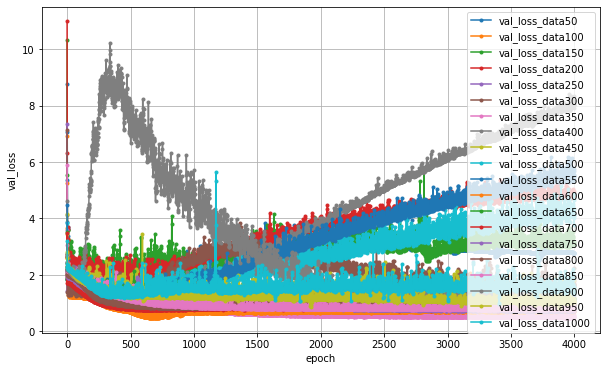

In [39]:
# 学習経過の可視化(大きさ)(validation)

val_loss_array = []
for i in range(len(history_size_array)):
    val_loss_array.append(history_size_array[i].history['val_loss'])
plt.figure(figsize=(10,6))
nb_epoch = len(val_loss_array[i])
for i in range(len(val_loss_array)):
    plt.plot(range(nb_epoch), val_loss_array[i], marker='.', label='val_loss_data%d'%(50*(i+1)))
plt.legend(loc='best', fontsize=10)
plt.grid()
plt.xlabel('epoch')
plt.ylabel('val_loss')
plt.show()

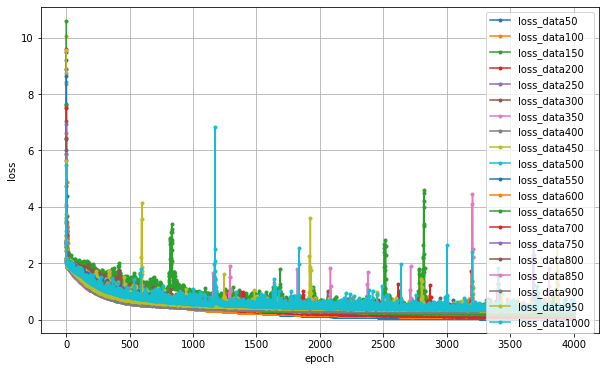

In [40]:
# 学習経過の可視化(大きさ)(train)

loss_array = []
for i in range(len(history_size_array)):
    loss_array.append(history_size_array[i].history['loss'])
plt.figure(figsize=(10,6))
nb_epoch = len(loss_array[i])
for i in range(len(loss_array)):
    plt.plot(range(nb_epoch), loss_array[i], marker='.', label='loss_data%d'%(50*(i+1)))
plt.legend(loc='best', fontsize=10)
plt.grid()
plt.xlabel('epoch')
plt.ylabel('loss')
plt.show()

In [41]:
for i in range(len(val_loss_array)):
    print(val_loss_array[i][-1])

2.7940545082092285
1.064514398574829
3.1500585079193115
4.885738372802734
1.1487033367156982
1.6497658491134644
0.5848144888877869
7.928464412689209
1.3231377601623535
4.345755100250244
5.494529724121094
0.757151186466217
1.1374144554138184
0.7740882039070129
0.8124827742576599
0.9434118270874023
0.7737289667129517
1.56022047996521
1.0331788063049316
1.4368385076522827


In [42]:
for i in range(len(val_loss_array)):
    print(min(val_loss_array[i]))

2.0930018424987793
0.47692519426345825
1.7606152296066284
1.786014199256897
0.9317632913589478
1.2519997358322144
0.4879535734653473
1.3133833408355713
1.0960026979446411
1.1392438411712646
1.1528898477554321
0.6302269697189331
1.006066083908081
0.6885072588920593
0.7102157473564148
0.8220184445381165
0.762552797794342
1.1166949272155762
0.8360553979873657
0.9780526161193848


In [43]:
min_val_loss_array = []
for i in range(len(val_loss_array)):
    min_val_loss_array.append(min(val_loss_array[i]))

In [44]:
print(min_val_loss_array)

[2.0930018424987793, 0.47692519426345825, 1.7606152296066284, 1.786014199256897, 0.9317632913589478, 1.2519997358322144, 0.4879535734653473, 1.3133833408355713, 1.0960026979446411, 1.1392438411712646, 1.1528898477554321, 0.6302269697189331, 1.006066083908081, 0.6885072588920593, 0.7102157473564148, 0.8220184445381165, 0.762552797794342, 1.1166949272155762, 0.8360553979873657, 0.9780526161193848]


In [45]:
for i in range(len(loss_array)):
    print(loss_array[i][-1])

0.06686890870332718
0.09365271776914597
0.2922077178955078
0.11779353767633438
0.23313038051128387
0.23640555143356323
0.2873195707798004
0.22583259642124176
0.3624365031719208
0.2796090245246887
0.31354814767837524
0.28935301303863525
0.24676531553268433
0.47254934906959534
0.4019419550895691
0.32161760330200195
0.3644344210624695
0.31913694739341736
0.34949687123298645
0.3632378876209259


In [46]:
min_loss_array = []
for i in range(len(loss_array)):
    min_loss_array.append(min(loss_array[i]))

In [47]:
print(min_loss_array)

[0.06686890870332718, 0.09365271776914597, 0.27963992953300476, 0.1165536493062973, 0.22181826829910278, 0.1884731501340866, 0.22830548882484436, 0.2165061980485916, 0.3279501795768738, 0.26383328437805176, 0.298383504152298, 0.2529164254665375, 0.23473124206066132, 0.3645683228969574, 0.32303789258003235, 0.305349737405777, 0.3185601234436035, 0.2966892421245575, 0.34949687123298645, 0.35232698917388916]


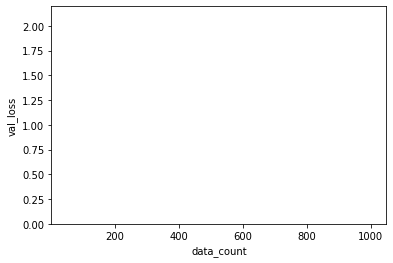

In [68]:
# validationデータのloss最小値比較
data_count_array = []
for i in range(len(min_val_loss_array)):
    data_count_array.append(50*(i+1))
plt.xlabel('data_count')
plt.ylabel('val_loss')
plt.bar(np.array(data_count_array), np.array(min_val_loss_array), align="center")
plt.show()

In [66]:
print(min_val_loss_array)

[2.0930018424987793, 0.47692519426345825, 1.7606152296066284, 1.786014199256897, 0.9317632913589478, 1.2519997358322144, 0.4879535734653473, 1.3133833408355713, 1.0960026979446411, 1.1392438411712646, 1.1528898477554321, 0.6302269697189331, 1.006066083908081, 0.6885072588920593, 0.7102157473564148, 0.8220184445381165, 0.762552797794342, 1.1166949272155762, 0.8360553979873657, 0.9780526161193848]


In [11]:
# 実験2との比較用コード
## データ数50の平均と標準偏差を比較(loop20回)
## データについて

### データファイルのpath
no_hole_path = './../vibration_simulation/vibration_data/no_hole_data.csv'
one_hole_path = './../vibration_simulation/vibration_data/one_hole_data.csv'
four_holes_path = './../vibration_simulation/vibration_data/four_holes_data.csv'
nine_holes_path = './../vibration_simulation/vibration_data/nine_holes_data.csv'
sixteen_holes_path = './../vibration_simulation/vibration_data/sixteen_holes_data.csv'
twentyfive_holes_path = './../vibration_simulation/vibration_data/twentyfive_holes_data.csv'

### 入力データと正解データ
no_hole_data1 = []
no_hole_data2 = []
no_hole_data3 = []
size_x_data = []
size_x_data1 = []
size_x_data2 = []
size_x_data3 = []
size_y_data = []
position_x_data = []
position_x_data1 = []
position_x_data2 = []
position_x_data3 = []
position_one_data1 = []
position_one_data2 = []
position_one_data3 = []
position_two_data1 = []
position_two_data2 = []
position_two_data3 = []
position_three_data1 = []
position_three_data2 = []
position_three_data3 = []
position_four_data1 = []
position_four_data2 = []
position_four_data3 = []
position_five_data1 = []
position_five_data2 = []
position_five_data3 = []
position_y_data = []

### ファイル読み込み

#### 欠陥がない場合のデータ
with open(no_hole_path) as f:
    for line in f:
        data_array = line.split(' ')
        no_hole_data1 = data_array[0:1251]
        no_hole_data2 = data_array[1251:2502]
        no_hole_data3 = data_array[2502:-1]
        
#### 大きさに関するデータ
with open(one_hole_path) as fs1:
  for line in fs1:
    data_array = line.split(' ')
    size_x_data1.append(data_array[3:1254])
    size_x_data2.append(data_array[1254:2505])
    size_x_data3.append(data_array[2505:-1])
    size_y_data.append(data_array[0])
with open(four_holes_path) as fs2:
  for line in fs2:
    data_array = line.split(' ')
    size_x_data1.append(data_array[3:1254])
    size_x_data2.append(data_array[1254:2505])
    size_x_data3.append(data_array[2505:-1])
    size_y_data.append(data_array[0])
with open(nine_holes_path) as fs3:
  for line in fs3:
    data_array = line.split(' ')
    size_x_data1.append(data_array[3:1254])
    size_x_data2.append(data_array[1254:2505])
    size_x_data3.append(data_array[2505:-1])
    size_y_data.append(data_array[0])
with open(sixteen_holes_path) as fs4:
  for line in fs4:
    data_array = line.split(' ')
    size_x_data1.append(data_array[3:1254])
    size_x_data2.append(data_array[1254:2505])
    size_x_data3.append(data_array[2505:-1])
    size_y_data.append(data_array[0])
with open(twentyfive_holes_path) as fs5:
  for line in fs5:
    data_array = line.split(' ')
    size_x_data1.append(data_array[3:1254])
    size_x_data2.append(data_array[1254:2505])
    size_x_data3.append(data_array[2505:-1])
    size_y_data.append(data_array[0])

#### 位置に関するデータ
with open(one_hole_path) as fp1:
  for line in fp1:
    data_array = line.split(' ')
    position_x_data1.append(data_array[3:1254])
    position_x_data2.append(data_array[1254:2505])
    position_x_data3.append(data_array[2505:-1])
    position_one_data1.append(data_array[3:1254])
    position_one_data2.append(data_array[1254:2505])
    position_one_data3.append(data_array[2505:-1])
    position_y_data.append(data_array[1:3])
with open(four_holes_path) as fp2:
  for line in fp2:
    data_array = line.split(' ')
    position_x_data1.append(data_array[3:1254])
    position_x_data2.append(data_array[1254:2505])
    position_x_data3.append(data_array[2505:-1])
    position_two_data1.append(data_array[3:1254])
    position_two_data2.append(data_array[1254:2505])
    position_two_data3.append(data_array[2505:-1])
    position_y_data.append(data_array[1:3])
with open(nine_holes_path) as fp3:
  for line in fp3:
    data_array = line.split(' ')
    position_x_data1.append(data_array[3:1254])
    position_x_data2.append(data_array[1254:2505])
    position_x_data3.append(data_array[2505:-1])
    position_three_data1.append(data_array[3:1254])
    position_three_data2.append(data_array[1254:2505])
    position_three_data3.append(data_array[2505:-1])
    position_y_data.append(data_array[1:3])
with open(sixteen_holes_path) as fp4:
  for line in fp4:
    data_array = line.split(' ')
    position_x_data1.append(data_array[3:1254])
    position_x_data2.append(data_array[1254:2505])
    position_x_data3.append(data_array[2505:-1])
    position_four_data1.append(data_array[3:1254])
    position_four_data2.append(data_array[1254:2505])
    position_four_data3.append(data_array[2505:-1])
    position_y_data.append(data_array[1:3])
with open(twentyfive_holes_path) as fp5:
  for line in fp5:
    data_array = line.split(' ')
    position_x_data1.append(data_array[3:1254])
    position_x_data2.append(data_array[1254:2505])
    position_x_data3.append(data_array[2505:-1])
    position_five_data1.append(data_array[3:1254])
    position_five_data2.append(data_array[1254:2505])
    position_five_data3.append(data_array[2505:-1])
    position_y_data.append(data_array[1:3])

### 各配列をnp.array型にして各要素を型変換
no_hole_data1 = np.array(no_hole_data1, dtype=float)
no_hole_data2 = np.array(no_hole_data2, dtype=float)
no_hole_data3 = np.array(no_hole_data3, dtype=float)
size_x_data1 = np.array(size_x_data1, dtype=float)
size_x_data2 = np.array(size_x_data2, dtype=float)
size_x_data3 = np.array(size_x_data3, dtype=float)
size_y_data = np.array(size_y_data, dtype=int)
position_x_data1 = np.array(position_x_data1, dtype=float)
position_x_data2 = np.array(position_x_data2, dtype=float)
position_x_data3 = np.array(position_x_data3, dtype=float)
position_one_data1 = np.array(position_one_data1, dtype=float)
position_two_data1 = np.array(position_two_data1, dtype=float)
position_three_data1 = np.array(position_three_data1, dtype=float)
position_four_data1 = np.array(position_four_data1, dtype=float)
position_five_data1 = np.array(position_five_data1, dtype=float)
position_one_data2 = np.array(position_one_data2, dtype=float)
position_two_data2 = np.array(position_two_data2, dtype=float)
position_three_data2 = np.array(position_three_data2, dtype=float)
position_four_data2 = np.array(position_four_data2, dtype=float)
position_five_data2 = np.array(position_five_data2, dtype=float)
position_one_data3 = np.array(position_one_data3, dtype=float)
position_two_data3 = np.array(position_two_data3, dtype=float)
position_three_data3 = np.array(position_three_data3, dtype=float)
position_four_data3 = np.array(position_four_data3, dtype=float)
position_five_data3 = np.array(position_five_data3, dtype=float)
position_y_data = np.array(position_y_data, dtype=float)

### データの加工
# 最大値で割る
max_displacement1 = size_x_data1.max()
max_displacement2 = size_x_data2.max()
max_displacement3 = size_x_data3.max()
size_x_data1 = size_x_data1/max_displacement1
size_x_data2 = size_x_data2/max_displacement2
size_x_data3 = size_x_data3/max_displacement3
# position_x_data1 = position_x_data1/max_displacement
# position_x_data2 = position_x_data2/max_displacement
# position_x_data3 = position_x_data3/max_displacement
# position_one_data1 = position_one_data1/max_displacement
# position_one_data2 = position_one_data2/max_displacement
# position_one_data3 = position_one_data3/max_displacement
# position_two_data1 = position_two_data1/max_displacement
# position_two_data2 = position_two_data2/max_displacement
# position_two_data3 = position_two_data3/max_displacement
# position_three_data1 = position_three_data1/max_displacement
# position_three_data2 = position_three_data2/max_displacement
# position_three_data3 = position_three_data3/max_displacement
# position_four_data1 = position_four_data1/max_displacement
# position_four_data2 = position_four_data2/max_displacement
# position_four_data3 = position_four_data3/max_displacement
# position_five_data1 = position_five_data1/max_displacement
# position_five_data2 = position_five_data2/max_displacement
# position_five_data3 = position_five_data3/max_displacement
# position_y_data = position_y_data/50


### データを50個ランダムに20回選んだときのデータセット作成
x_size_data_array1 = []
x_size_data_array2 = []
x_size_data_array3 = []
x_position_data_array1 = []
x_position_data_array2 = []
x_position_data_array3 = []
y_size_data_array = []
y_position_data_array = []
x_index = []
for i in range(len(size_x_data1)):
    x_index.append(i)
for i in range(20):
    data_count = 50
    used_index = random.sample(x_index, data_count)
    used_x_size_data1 = []
    used_x_size_data2 = []
    used_x_size_data3 = []
#     used_x_position_data1 = []
#     used_x_position_data2 = []
#     used_x_position_data3 = []
    used_y_size_data = []
#     used_y_position_data = []
    for i in range(len(used_index)):
        used_x_size_data1.append(size_x_data1[used_index[i]])
        used_x_size_data2.append(size_x_data2[used_index[i]])
        used_x_size_data3.append(size_x_data3[used_index[i]])
#         used_x_position_data1.append(position_x_data1[used_index[i]])
#         used_x_position_data2.append(position_x_data2[used_index[i]])
#         used_x_position_data3.append(position_x_data3[used_index[i]])
        used_y_size_data.append(size_y_data[used_index[i]])
#         used_y_position_data.append(position_y_data[used_index[i]])
    y_size_data_array.append(used_y_size_data)
#     y_position_data_array.append(used_y_position_data)
    x_size_data_array1.append(used_x_size_data1)
    x_size_data_array2.append(used_x_size_data2)
    x_size_data_array3.append(used_x_size_data3)
#     x_position_data_array1.append(used_x_position_data1)
#     x_position_data_array2.append(used_x_position_data2)
#     x_position_data_array3.append(used_x_position_data3)

### train用とtest用に分割(4:1)
x_size_train_array1 = []
x_size_train_array2 = []
x_size_train_array3 = []
x_size_test_array1 = []
x_size_test_array2 = []
x_size_test_array3 = []
# x_position_train_array1 = []
# x_position_train_array2 = []
# x_position_train_array3 = []
# x_position_test_array1 = []
# x_position_test_array2 = []
# x_position_test_array3 = []
y_size_train_array = []
y_size_test_array = []
# y_position_train_array = []
# y_position_test_array = []
for i in range(20):
    x_size_train1, x_size_test1, x_size_train2, x_size_test2, x_size_train3, x_size_test3, y_size_train, y_size_test = train_test_split(x_size_data_array1[i], x_size_data_array2[i], x_size_data_array3[i], y_size_data_array[i], test_size=0.10)
#     x_position_train1, x_position_test1, x_position_train2, x_position_test2, x_position_train3, x_position_test3, y_position_train, y_position_test = train_test_split(x_position_data_array1[i], x_position_data_array2[i], x_position_data_array3[i], y_position_data_array[i], test_size=0.10)
    x_size_train_array1.append(np.array(x_size_train1))
    x_size_train_array2.append(np.array(x_size_train2))
    x_size_train_array3.append(np.array(x_size_train3))
    x_size_test_array1.append(np.array(x_size_test1))
    x_size_test_array2.append(np.array(x_size_test2))
    x_size_test_array3.append(np.array(x_size_test3))
#     x_position_train_array1.append(np.array(x_position_train1))
#     x_position_train_array2.append(np.array(x_position_train2))
#     x_position_train_array3.append(np.array(x_position_train3))
#     x_position_test_array1.append(np.array(x_position_test1))
#     x_position_test_array2.append(np.array(x_position_test2))
#     x_position_test_array3.append(np.array(x_position_test3))
    y_size_train_array.append(np.array(y_size_train))
    y_size_test_array.append(np.array(y_size_test))
#     y_position_train_array.append(np.array(y_position_train))
#     y_position_test_array.append(np.array(y_position_test))

In [12]:
# 大きさ推定のモデル
model_size_array = []

for i in range(20):
    # 入力を定義
    input1 = Input(shape=(1251,1))
    input2 = Input(shape=(1251,1))
    input3 = Input(shape=(1251,1))

    # 入力1から結合前まで
    x = Conv1D(32, 3, padding='same', activation='tanh')(input1)
    x = MaxPooling1D(2, padding='same')(x)
    x = Model(inputs=input1, outputs=x)
    # 入力2から結合前まで
    y = Conv1D(32, 3, padding='same', activation='tanh')(input2)
    y = MaxPooling1D(2, padding='same')(y)
    y = Model(inputs=input2, outputs=y)
    # 入力3から結合前まで
    z = Conv1D(32, 3, padding='same', activation='tanh')(input3)
    z = MaxPooling1D(2, padding='same')(z)
    z = Model(inputs=input3, outputs=z)

    # 結合
    combined = concatenate([x.output, y.output, z.output])

    # 密結合
    cnn = Flatten()(combined)
    cnn = Dense(1, activation="linear")(cnn)

    # モデル定義とコンパイル
    cnn_size_model = Model(inputs=[x.input, y.input, z.input], outputs=cnn)
    cnn_size_model.compile(loss='mse', optimizer='adam', metrics=['acc'])
    model_size_array.append(cnn_size_model)

In [13]:
# 学習ループ
history_size_array = []
for i in range(len(model_size_array)):
    epochs = 1000
    batch_size = 128
    history_size_array.append(model_size_array[i].fit([x_size_train_array1[i], x_size_train_array2[i], x_size_train_array3[i]], y_size_train_array[i], batch_size=batch_size, epochs=epochs, verbose=1, validation_data=([x_size_test_array1[i], x_size_test_array2[i], x_size_test_array3[i]], y_size_test_array[i])))

Epoch 1/1000
1/1 [==============================] - 0s 156ms/step - loss: 10.3037 - acc: 0.0000e+00 - val_loss: 2.9131 - val_acc: 0.2000
Epoch 2/1000
1/1 [==============================] - 0s 40ms/step - loss: 3.6070 - acc: 0.2444 - val_loss: 1.4669 - val_acc: 0.2000
Epoch 3/1000
1/1 [==============================] - 0s 38ms/step - loss: 2.2231 - acc: 0.2444 - val_loss: 3.2544 - val_acc: 0.2000
Epoch 4/1000
1/1 [==============================] - 0s 38ms/step - loss: 4.0582 - acc: 0.2444 - val_loss: 4.1369 - val_acc: 0.2000
Epoch 5/1000
1/1 [==============================] - 0s 43ms/step - loss: 4.9536 - acc: 0.2444 - val_loss: 3.4221 - val_acc: 0.2000
Epoch 6/1000
1/1 [==============================] - 0s 45ms/step - loss: 4.2247 - acc: 0.2444 - val_loss: 2.2328 - val_acc: 0.2000
Epoch 7/1000
1/1 [==============================] - 0s 41ms/step - loss: 3.0053 - acc: 0.2444 - val_loss: 1.4814 - val_acc: 0.2000
Epoch 8/1000
1/1 [==============================] - 0s 44ms/step - loss: 2.21

1/1 [==============================] - 0s 33ms/step - loss: 1.8296 - acc: 0.2444 - val_loss: 1.4424 - val_acc: 0.2000
Epoch 64/1000
1/1 [==============================] - 0s 34ms/step - loss: 1.8236 - acc: 0.2444 - val_loss: 1.4460 - val_acc: 0.2000
Epoch 65/1000
1/1 [==============================] - 0s 52ms/step - loss: 1.8161 - acc: 0.2444 - val_loss: 1.4522 - val_acc: 0.2000
Epoch 66/1000
1/1 [==============================] - 0s 33ms/step - loss: 1.8090 - acc: 0.2444 - val_loss: 1.4607 - val_acc: 0.2000
Epoch 67/1000
1/1 [==============================] - 0s 32ms/step - loss: 1.8034 - acc: 0.2444 - val_loss: 1.4696 - val_acc: 0.2000
Epoch 68/1000
1/1 [==============================] - 0s 34ms/step - loss: 1.7994 - acc: 0.2444 - val_loss: 1.4763 - val_acc: 0.2000
Epoch 69/1000
1/1 [==============================] - 0s 39ms/step - loss: 1.7955 - acc: 0.2444 - val_loss: 1.4788 - val_acc: 0.2000
Epoch 70/1000
1/1 [==============================] - 0s 34ms/step - loss: 1.7905 - acc: 0.

Epoch 125/1000
1/1 [==============================] - 0s 39ms/step - loss: 1.5231 - acc: 0.2444 - val_loss: 1.5521 - val_acc: 0.2000
Epoch 126/1000
1/1 [==============================] - 0s 35ms/step - loss: 1.5186 - acc: 0.2444 - val_loss: 1.5528 - val_acc: 0.2000
Epoch 127/1000
1/1 [==============================] - 0s 37ms/step - loss: 1.5140 - acc: 0.2444 - val_loss: 1.5534 - val_acc: 0.2000
Epoch 128/1000
1/1 [==============================] - 0s 31ms/step - loss: 1.5095 - acc: 0.2444 - val_loss: 1.5542 - val_acc: 0.2000
Epoch 129/1000
1/1 [==============================] - 0s 38ms/step - loss: 1.5050 - acc: 0.2444 - val_loss: 1.5556 - val_acc: 0.2000
Epoch 130/1000
1/1 [==============================] - 0s 30ms/step - loss: 1.5005 - acc: 0.2444 - val_loss: 1.5576 - val_acc: 0.2000
Epoch 131/1000
1/1 [==============================] - 0s 29ms/step - loss: 1.4960 - acc: 0.2444 - val_loss: 1.5599 - val_acc: 0.2000
Epoch 132/1000
1/1 [==============================] - 0s 32ms/step - 

1/1 [==============================] - 0s 30ms/step - loss: 1.2590 - acc: 0.2444 - val_loss: 1.6655 - val_acc: 0.2000
Epoch 187/1000
1/1 [==============================] - 0s 30ms/step - loss: 1.2550 - acc: 0.2444 - val_loss: 1.6683 - val_acc: 0.2000
Epoch 188/1000
1/1 [==============================] - 0s 29ms/step - loss: 1.2509 - acc: 0.2444 - val_loss: 1.6711 - val_acc: 0.2000
Epoch 189/1000
1/1 [==============================] - 0s 37ms/step - loss: 1.2468 - acc: 0.2444 - val_loss: 1.6739 - val_acc: 0.2000
Epoch 190/1000
1/1 [==============================] - 0s 30ms/step - loss: 1.2428 - acc: 0.2444 - val_loss: 1.6767 - val_acc: 0.2000
Epoch 191/1000
1/1 [==============================] - 0s 30ms/step - loss: 1.2387 - acc: 0.2444 - val_loss: 1.6795 - val_acc: 0.2000
Epoch 192/1000
1/1 [==============================] - 0s 31ms/step - loss: 1.2347 - acc: 0.2444 - val_loss: 1.6823 - val_acc: 0.2000
Epoch 193/1000
1/1 [==============================] - 0s 32ms/step - loss: 1.2306 - 

Epoch 248/1000
1/1 [==============================] - 0s 30ms/step - loss: 1.0274 - acc: 0.2444 - val_loss: 1.9347 - val_acc: 0.2000
Epoch 249/1000
1/1 [==============================] - 0s 41ms/step - loss: 1.0240 - acc: 0.2444 - val_loss: 1.9411 - val_acc: 0.2000
Epoch 250/1000
1/1 [==============================] - 0s 34ms/step - loss: 1.0207 - acc: 0.2444 - val_loss: 1.9476 - val_acc: 0.2000
Epoch 251/1000
1/1 [==============================] - 0s 33ms/step - loss: 1.0174 - acc: 0.2444 - val_loss: 1.9541 - val_acc: 0.2000
Epoch 252/1000
1/1 [==============================] - 0s 31ms/step - loss: 1.0141 - acc: 0.2444 - val_loss: 1.9608 - val_acc: 0.2000
Epoch 253/1000
1/1 [==============================] - 0s 29ms/step - loss: 1.0108 - acc: 0.2444 - val_loss: 1.9675 - val_acc: 0.2000
Epoch 254/1000
1/1 [==============================] - 0s 31ms/step - loss: 1.0076 - acc: 0.2444 - val_loss: 1.9742 - val_acc: 0.2000
Epoch 255/1000
1/1 [==============================] - 0s 31ms/step - 

1/1 [==============================] - 0s 34ms/step - loss: 0.8510 - acc: 0.2444 - val_loss: 2.4572 - val_acc: 0.2000
Epoch 310/1000
1/1 [==============================] - 0s 41ms/step - loss: 0.8486 - acc: 0.2444 - val_loss: 2.4679 - val_acc: 0.2000
Epoch 311/1000
1/1 [==============================] - 0s 34ms/step - loss: 0.8462 - acc: 0.2444 - val_loss: 2.4786 - val_acc: 0.2000
Epoch 312/1000
1/1 [==============================] - 0s 33ms/step - loss: 0.8438 - acc: 0.2444 - val_loss: 2.4894 - val_acc: 0.2000
Epoch 313/1000
1/1 [==============================] - 0s 33ms/step - loss: 0.8414 - acc: 0.2444 - val_loss: 2.5002 - val_acc: 0.2000
Epoch 314/1000
1/1 [==============================] - 0s 34ms/step - loss: 0.8390 - acc: 0.2444 - val_loss: 2.5111 - val_acc: 0.2000
Epoch 315/1000
1/1 [==============================] - 0s 33ms/step - loss: 0.8366 - acc: 0.2444 - val_loss: 2.5220 - val_acc: 0.2000
Epoch 316/1000
1/1 [==============================] - 0s 34ms/step - loss: 0.8343 - 

Epoch 371/1000
1/1 [==============================] - 0s 32ms/step - loss: 0.7237 - acc: 0.2444 - val_loss: 3.2099 - val_acc: 0.2000
Epoch 372/1000
1/1 [==============================] - 0s 32ms/step - loss: 0.7220 - acc: 0.2444 - val_loss: 3.2233 - val_acc: 0.2000
Epoch 373/1000
1/1 [==============================] - 0s 33ms/step - loss: 0.7202 - acc: 0.2444 - val_loss: 3.2367 - val_acc: 0.2000
Epoch 374/1000
1/1 [==============================] - 0s 33ms/step - loss: 0.7185 - acc: 0.2444 - val_loss: 3.2501 - val_acc: 0.2000
Epoch 375/1000
1/1 [==============================] - 0s 32ms/step - loss: 0.7168 - acc: 0.2444 - val_loss: 3.2636 - val_acc: 0.2000
Epoch 376/1000
1/1 [==============================] - 0s 38ms/step - loss: 0.7151 - acc: 0.2444 - val_loss: 3.2772 - val_acc: 0.2000
Epoch 377/1000
1/1 [==============================] - 0s 35ms/step - loss: 0.7134 - acc: 0.2444 - val_loss: 3.2907 - val_acc: 0.2000
Epoch 378/1000
1/1 [==============================] - 0s 39ms/step - 

1/1 [==============================] - 0s 42ms/step - loss: 0.6291 - acc: 0.2444 - val_loss: 4.0907 - val_acc: 0.2000
Epoch 433/1000
1/1 [==============================] - 0s 39ms/step - loss: 0.6277 - acc: 0.2444 - val_loss: 4.1064 - val_acc: 0.2000
Epoch 434/1000
1/1 [==============================] - 0s 32ms/step - loss: 0.6263 - acc: 0.2444 - val_loss: 4.1221 - val_acc: 0.2000
Epoch 435/1000
1/1 [==============================] - 0s 34ms/step - loss: 0.6248 - acc: 0.2444 - val_loss: 4.1379 - val_acc: 0.2000
Epoch 436/1000
1/1 [==============================] - 0s 40ms/step - loss: 0.6234 - acc: 0.2444 - val_loss: 4.1538 - val_acc: 0.2000
Epoch 437/1000
1/1 [==============================] - 0s 38ms/step - loss: 0.6220 - acc: 0.2444 - val_loss: 4.1696 - val_acc: 0.2000
Epoch 438/1000
1/1 [==============================] - 0s 32ms/step - loss: 0.6206 - acc: 0.2444 - val_loss: 4.1856 - val_acc: 0.2000
Epoch 439/1000
1/1 [==============================] - 0s 41ms/step - loss: 0.6192 - 

Epoch 494/1000
1/1 [==============================] - 0s 30ms/step - loss: 0.5531 - acc: 0.2444 - val_loss: 5.4552 - val_acc: 0.2000
Epoch 495/1000
1/1 [==============================] - 0s 29ms/step - loss: 0.5687 - acc: 0.2444 - val_loss: 4.8409 - val_acc: 0.2000
Epoch 496/1000
1/1 [==============================] - 0s 29ms/step - loss: 0.5556 - acc: 0.2444 - val_loss: 4.8975 - val_acc: 0.2000
Epoch 497/1000
1/1 [==============================] - 0s 29ms/step - loss: 0.5526 - acc: 0.2444 - val_loss: 5.4455 - val_acc: 0.2000
Epoch 498/1000
1/1 [==============================] - 0s 30ms/step - loss: 0.5614 - acc: 0.2444 - val_loss: 4.9879 - val_acc: 0.2000
Epoch 499/1000
1/1 [==============================] - 0s 37ms/step - loss: 0.5484 - acc: 0.2444 - val_loss: 4.9033 - val_acc: 0.2000
Epoch 500/1000
1/1 [==============================] - 0s 32ms/step - loss: 0.5513 - acc: 0.2444 - val_loss: 5.4238 - val_acc: 0.2000
Epoch 501/1000
1/1 [==============================] - 0s 30ms/step - 

1/1 [==============================] - 0s 30ms/step - loss: 0.4887 - acc: 0.2444 - val_loss: 6.0937 - val_acc: 0.2000
Epoch 556/1000
1/1 [==============================] - 0s 31ms/step - loss: 0.4876 - acc: 0.2444 - val_loss: 6.1163 - val_acc: 0.2000
Epoch 557/1000
1/1 [==============================] - 0s 30ms/step - loss: 0.4866 - acc: 0.2444 - val_loss: 6.1059 - val_acc: 0.2000
Epoch 558/1000
1/1 [==============================] - 0s 29ms/step - loss: 0.4855 - acc: 0.2444 - val_loss: 6.1617 - val_acc: 0.2000
Epoch 559/1000
1/1 [==============================] - 0s 37ms/step - loss: 0.4845 - acc: 0.2444 - val_loss: 6.1599 - val_acc: 0.2000
Epoch 560/1000
1/1 [==============================] - 0s 30ms/step - loss: 0.4834 - acc: 0.2444 - val_loss: 6.1750 - val_acc: 0.2000
Epoch 561/1000
1/1 [==============================] - 0s 30ms/step - loss: 0.4824 - acc: 0.2444 - val_loss: 6.2201 - val_acc: 0.2000
Epoch 562/1000
1/1 [==============================] - 0s 30ms/step - loss: 0.4814 - 

Epoch 617/1000
1/1 [==============================] - 0s 30ms/step - loss: 0.4246 - acc: 0.2444 - val_loss: 7.4351 - val_acc: 0.2000
Epoch 618/1000
1/1 [==============================] - 0s 30ms/step - loss: 0.4236 - acc: 0.2444 - val_loss: 7.4462 - val_acc: 0.2000
Epoch 619/1000
1/1 [==============================] - 0s 46ms/step - loss: 0.4225 - acc: 0.2444 - val_loss: 7.4870 - val_acc: 0.2000
Epoch 620/1000
1/1 [==============================] - 0s 44ms/step - loss: 0.4215 - acc: 0.2444 - val_loss: 7.4905 - val_acc: 0.2000
Epoch 621/1000
1/1 [==============================] - 0s 36ms/step - loss: 0.4205 - acc: 0.2444 - val_loss: 7.5428 - val_acc: 0.2000
Epoch 622/1000
1/1 [==============================] - 0s 40ms/step - loss: 0.4195 - acc: 0.2444 - val_loss: 7.5303 - val_acc: 0.2000
Epoch 623/1000
1/1 [==============================] - 0s 42ms/step - loss: 0.4185 - acc: 0.2444 - val_loss: 7.6060 - val_acc: 0.2000
Epoch 624/1000
1/1 [==============================] - 0s 32ms/step - 

1/1 [==============================] - 0s 36ms/step - loss: 0.3782 - acc: 0.2444 - val_loss: 8.5756 - val_acc: 0.2000
Epoch 679/1000
1/1 [==============================] - 0s 43ms/step - loss: 0.3746 - acc: 0.2444 - val_loss: 8.6011 - val_acc: 0.2000
Epoch 680/1000
1/1 [==============================] - 0s 376ms/step - loss: 0.3738 - acc: 0.2444 - val_loss: 8.9221 - val_acc: 0.2000
Epoch 681/1000
1/1 [==============================] - 0s 33ms/step - loss: 0.3750 - acc: 0.2444 - val_loss: 8.5803 - val_acc: 0.2000
Epoch 682/1000
1/1 [==============================] - 0s 32ms/step - loss: 0.3733 - acc: 0.2444 - val_loss: 8.7741 - val_acc: 0.2000
Epoch 683/1000
1/1 [==============================] - 0s 32ms/step - loss: 0.3710 - acc: 0.2444 - val_loss: 8.9142 - val_acc: 0.2000
Epoch 684/1000
1/1 [==============================] - 0s 39ms/step - loss: 0.3712 - acc: 0.2444 - val_loss: 8.6365 - val_acc: 0.2000
Epoch 685/1000
1/1 [==============================] - 0s 44ms/step - loss: 0.3712 -

1/1 [==============================] - 0s 32ms/step - loss: 0.3288 - acc: 0.2444 - val_loss: 10.1368 - val_acc: 0.2000
Epoch 740/1000
1/1 [==============================] - 0s 43ms/step - loss: 0.3280 - acc: 0.2444 - val_loss: 10.1483 - val_acc: 0.2000
Epoch 741/1000
1/1 [==============================] - 0s 35ms/step - loss: 0.3273 - acc: 0.2444 - val_loss: 10.1756 - val_acc: 0.2000
Epoch 742/1000
1/1 [==============================] - 0s 33ms/step - loss: 0.3266 - acc: 0.2444 - val_loss: 10.2107 - val_acc: 0.2000
Epoch 743/1000
1/1 [==============================] - 0s 35ms/step - loss: 0.3258 - acc: 0.2444 - val_loss: 10.2184 - val_acc: 0.2000
Epoch 744/1000
1/1 [==============================] - 0s 35ms/step - loss: 0.3251 - acc: 0.2444 - val_loss: 10.2657 - val_acc: 0.2000
Epoch 745/1000
1/1 [==============================] - 0s 42ms/step - loss: 0.3244 - acc: 0.2444 - val_loss: 10.2706 - val_acc: 0.2000
Epoch 746/1000
1/1 [==============================] - 0s 47ms/step - loss: 0.

1/1 [==============================] - 0s 41ms/step - loss: 0.3291 - acc: 0.2444 - val_loss: 10.7273 - val_acc: 0.2000
Epoch 801/1000
1/1 [==============================] - 0s 35ms/step - loss: 0.3337 - acc: 0.2444 - val_loss: 14.2892 - val_acc: 0.2000
Epoch 802/1000
1/1 [==============================] - 0s 35ms/step - loss: 0.5286 - acc: 0.2444 - val_loss: 9.7620 - val_acc: 0.2000
Epoch 803/1000
1/1 [==============================] - 0s 37ms/step - loss: 0.5021 - acc: 0.2444 - val_loss: 12.5622 - val_acc: 0.2000
Epoch 804/1000
1/1 [==============================] - 0s 34ms/step - loss: 0.3117 - acc: 0.2444 - val_loss: 12.7970 - val_acc: 0.2000
Epoch 805/1000
1/1 [==============================] - 0s 35ms/step - loss: 0.3276 - acc: 0.2444 - val_loss: 10.0138 - val_acc: 0.2000
Epoch 806/1000
1/1 [==============================] - 0s 33ms/step - loss: 0.4521 - acc: 0.2444 - val_loss: 13.3989 - val_acc: 0.2000
Epoch 807/1000
1/1 [==============================] - 0s 32ms/step - loss: 0.3

1/1 [==============================] - 0s 33ms/step - loss: 0.2577 - acc: 0.2444 - val_loss: 12.7969 - val_acc: 0.2000
Epoch 862/1000
1/1 [==============================] - 0s 32ms/step - loss: 0.2573 - acc: 0.2444 - val_loss: 12.9782 - val_acc: 0.2000
Epoch 863/1000
1/1 [==============================] - 0s 31ms/step - loss: 0.2564 - acc: 0.2444 - val_loss: 12.9940 - val_acc: 0.2000
Epoch 864/1000
1/1 [==============================] - 0s 31ms/step - loss: 0.2559 - acc: 0.2444 - val_loss: 12.8838 - val_acc: 0.2000
Epoch 865/1000
1/1 [==============================] - 0s 31ms/step - loss: 0.2557 - acc: 0.2444 - val_loss: 13.0872 - val_acc: 0.2000
Epoch 866/1000
1/1 [==============================] - 0s 32ms/step - loss: 0.2551 - acc: 0.2444 - val_loss: 12.9969 - val_acc: 0.2000
Epoch 867/1000
1/1 [==============================] - 0s 33ms/step - loss: 0.2544 - acc: 0.2444 - val_loss: 13.0056 - val_acc: 0.2000
Epoch 868/1000
1/1 [==============================] - 0s 33ms/step - loss: 0.

1/1 [==============================] - 0s 32ms/step - loss: 0.2287 - acc: 0.2444 - val_loss: 14.3657 - val_acc: 0.2000
Epoch 923/1000
1/1 [==============================] - 0s 38ms/step - loss: 0.2283 - acc: 0.2444 - val_loss: 14.3844 - val_acc: 0.2000
Epoch 924/1000
1/1 [==============================] - 0s 44ms/step - loss: 0.2278 - acc: 0.2444 - val_loss: 14.4187 - val_acc: 0.2000
Epoch 925/1000
1/1 [==============================] - 0s 40ms/step - loss: 0.2274 - acc: 0.2444 - val_loss: 14.4324 - val_acc: 0.2000
Epoch 926/1000
1/1 [==============================] - 0s 36ms/step - loss: 0.2269 - acc: 0.2444 - val_loss: 14.4659 - val_acc: 0.2000
Epoch 927/1000
1/1 [==============================] - 0s 48ms/step - loss: 0.2265 - acc: 0.2444 - val_loss: 14.4854 - val_acc: 0.2000
Epoch 928/1000
1/1 [==============================] - 0s 37ms/step - loss: 0.2260 - acc: 0.2444 - val_loss: 14.5103 - val_acc: 0.2000
Epoch 929/1000
1/1 [==============================] - 0s 43ms/step - loss: 0.

1/1 [==============================] - 0s 35ms/step - loss: 0.2027 - acc: 0.2444 - val_loss: 15.9056 - val_acc: 0.2000
Epoch 984/1000
1/1 [==============================] - 0s 33ms/step - loss: 0.2024 - acc: 0.2444 - val_loss: 15.8997 - val_acc: 0.2000
Epoch 985/1000
1/1 [==============================] - 0s 33ms/step - loss: 0.2020 - acc: 0.2444 - val_loss: 15.9672 - val_acc: 0.2000
Epoch 986/1000
1/1 [==============================] - 0s 32ms/step - loss: 0.2016 - acc: 0.2444 - val_loss: 15.9367 - val_acc: 0.2000
Epoch 987/1000
1/1 [==============================] - 0s 35ms/step - loss: 0.2012 - acc: 0.2444 - val_loss: 16.0385 - val_acc: 0.2000
Epoch 988/1000
1/1 [==============================] - ETA: 0s - loss: 0.2008 - acc: 0.244 - 0s 35ms/step - loss: 0.2008 - acc: 0.2444 - val_loss: 15.9601 - val_acc: 0.2000
Epoch 989/1000
1/1 [==============================] - 0s 40ms/step - loss: 0.2005 - acc: 0.2444 - val_loss: 16.1297 - val_acc: 0.2000
Epoch 990/1000
1/1 [===================

1/1 [==============================] - 0s 32ms/step - loss: 1.7472 - acc: 0.2444 - val_loss: 3.4113 - val_acc: 0.0000e+00
Epoch 44/1000
1/1 [==============================] - 0s 30ms/step - loss: 1.7530 - acc: 0.2444 - val_loss: 3.4206 - val_acc: 0.0000e+00
Epoch 45/1000
1/1 [==============================] - 0s 32ms/step - loss: 1.7501 - acc: 0.2444 - val_loss: 3.3500 - val_acc: 0.0000e+00
Epoch 46/1000
1/1 [==============================] - 0s 32ms/step - loss: 1.7387 - acc: 0.2444 - val_loss: 3.2214 - val_acc: 0.0000e+00
Epoch 47/1000
1/1 [==============================] - 0s 32ms/step - loss: 1.7243 - acc: 0.2444 - val_loss: 3.0653 - val_acc: 0.0000e+00
Epoch 48/1000
1/1 [==============================] - 0s 38ms/step - loss: 1.7132 - acc: 0.2444 - val_loss: 2.9126 - val_acc: 0.0000e+00
Epoch 49/1000
1/1 [==============================] - 0s 32ms/step - loss: 1.7087 - acc: 0.2444 - val_loss: 2.7888 - val_acc: 0.0000e+00
Epoch 50/1000
1/1 [==============================] - 0s 32ms/s

1/1 [==============================] - 0s 34ms/step - loss: 1.5275 - acc: 0.2444 - val_loss: 3.1684 - val_acc: 0.0000e+00
Epoch 104/1000
1/1 [==============================] - 0s 33ms/step - loss: 1.5242 - acc: 0.2444 - val_loss: 3.1737 - val_acc: 0.0000e+00
Epoch 105/1000
1/1 [==============================] - 0s 33ms/step - loss: 1.5209 - acc: 0.2444 - val_loss: 3.1847 - val_acc: 0.0000e+00
Epoch 106/1000
1/1 [==============================] - 0s 34ms/step - loss: 1.5176 - acc: 0.2444 - val_loss: 3.1989 - val_acc: 0.0000e+00
Epoch 107/1000
1/1 [==============================] - 0s 32ms/step - loss: 1.5143 - acc: 0.2444 - val_loss: 3.2132 - val_acc: 0.0000e+00
Epoch 108/1000
1/1 [==============================] - 0s 40ms/step - loss: 1.5110 - acc: 0.2444 - val_loss: 3.2246 - val_acc: 0.0000e+00
Epoch 109/1000
1/1 [==============================] - 0s 33ms/step - loss: 1.5077 - acc: 0.2444 - val_loss: 3.2310 - val_acc: 0.0000e+00
Epoch 110/1000
1/1 [==============================] - 0s

Epoch 163/1000
1/1 [==============================] - 0s 33ms/step - loss: 1.3288 - acc: 0.2444 - val_loss: 3.3852 - val_acc: 0.0000e+00
Epoch 164/1000
1/1 [==============================] - 0s 34ms/step - loss: 1.3255 - acc: 0.2444 - val_loss: 3.3875 - val_acc: 0.0000e+00
Epoch 165/1000
1/1 [==============================] - 0s 33ms/step - loss: 1.3221 - acc: 0.2444 - val_loss: 3.3902 - val_acc: 0.0000e+00
Epoch 166/1000
1/1 [==============================] - 0s 37ms/step - loss: 1.3188 - acc: 0.2444 - val_loss: 3.3934 - val_acc: 0.0000e+00
Epoch 167/1000
1/1 [==============================] - 0s 32ms/step - loss: 1.3155 - acc: 0.2444 - val_loss: 3.3968 - val_acc: 0.0000e+00
Epoch 168/1000
1/1 [==============================] - 0s 39ms/step - loss: 1.3123 - acc: 0.2444 - val_loss: 3.4003 - val_acc: 0.0000e+00
Epoch 169/1000
1/1 [==============================] - 0s 34ms/step - loss: 1.3090 - acc: 0.2444 - val_loss: 3.4034 - val_acc: 0.0000e+00
Epoch 170/1000
1/1 [=====================

Epoch 223/1000
1/1 [==============================] - 0s 34ms/step - loss: 1.1396 - acc: 0.2444 - val_loss: 3.5390 - val_acc: 0.0000e+00
Epoch 224/1000
1/1 [==============================] - 0s 32ms/step - loss: 1.1367 - acc: 0.2444 - val_loss: 3.5411 - val_acc: 0.0000e+00
Epoch 225/1000
1/1 [==============================] - 0s 33ms/step - loss: 1.1338 - acc: 0.2444 - val_loss: 3.5433 - val_acc: 0.0000e+00
Epoch 226/1000
1/1 [==============================] - 0s 32ms/step - loss: 1.1309 - acc: 0.2444 - val_loss: 3.5453 - val_acc: 0.0000e+00
Epoch 227/1000
1/1 [==============================] - 0s 35ms/step - loss: 1.1280 - acc: 0.2444 - val_loss: 3.5474 - val_acc: 0.0000e+00
Epoch 228/1000
1/1 [==============================] - 0s 40ms/step - loss: 1.1251 - acc: 0.2444 - val_loss: 3.5495 - val_acc: 0.0000e+00
Epoch 229/1000
1/1 [==============================] - 0s 32ms/step - loss: 1.1223 - acc: 0.2444 - val_loss: 3.5516 - val_acc: 0.0000e+00
Epoch 230/1000
1/1 [=====================

Epoch 283/1000
1/1 [==============================] - 0s 32ms/step - loss: 0.9849 - acc: 0.2444 - val_loss: 3.6363 - val_acc: 0.0000e+00
Epoch 284/1000
1/1 [==============================] - 0s 30ms/step - loss: 0.9827 - acc: 0.2444 - val_loss: 3.6375 - val_acc: 0.0000e+00
Epoch 285/1000
1/1 [==============================] - 0s 31ms/step - loss: 0.9805 - acc: 0.2444 - val_loss: 3.6386 - val_acc: 0.0000e+00
Epoch 286/1000
1/1 [==============================] - 0s 32ms/step - loss: 0.9782 - acc: 0.2444 - val_loss: 3.6397 - val_acc: 0.0000e+00
Epoch 287/1000
1/1 [==============================] - 0s 42ms/step - loss: 0.9760 - acc: 0.2444 - val_loss: 3.6408 - val_acc: 0.0000e+00
Epoch 288/1000
1/1 [==============================] - 0s 46ms/step - loss: 0.9738 - acc: 0.2444 - val_loss: 3.6419 - val_acc: 0.0000e+00
Epoch 289/1000
1/1 [==============================] - 0s 32ms/step - loss: 0.9716 - acc: 0.2444 - val_loss: 3.6430 - val_acc: 0.0000e+00
Epoch 290/1000
1/1 [=====================

Epoch 343/1000
1/1 [==============================] - 0s 29ms/step - loss: 0.8656 - acc: 0.2444 - val_loss: 3.7025 - val_acc: 0.0000e+00
Epoch 344/1000
1/1 [==============================] - 0s 30ms/step - loss: 0.8638 - acc: 0.2444 - val_loss: 3.7039 - val_acc: 0.0000e+00
Epoch 345/1000
1/1 [==============================] - 0s 31ms/step - loss: 0.8620 - acc: 0.2444 - val_loss: 3.7054 - val_acc: 0.0000e+00
Epoch 346/1000
1/1 [==============================] - 0s 29ms/step - loss: 0.8603 - acc: 0.2444 - val_loss: 3.7069 - val_acc: 0.0000e+00
Epoch 347/1000
1/1 [==============================] - 0s 30ms/step - loss: 0.8586 - acc: 0.2444 - val_loss: 3.7084 - val_acc: 0.0000e+00
Epoch 348/1000
1/1 [==============================] - 0s 30ms/step - loss: 0.8568 - acc: 0.2444 - val_loss: 3.7100 - val_acc: 0.0000e+00
Epoch 349/1000
1/1 [==============================] - 0s 37ms/step - loss: 0.8551 - acc: 0.2444 - val_loss: 3.7116 - val_acc: 0.0000e+00
Epoch 350/1000
1/1 [=====================

Epoch 403/1000
1/1 [==============================] - 0s 40ms/step - loss: 0.7706 - acc: 0.2444 - val_loss: 3.8480 - val_acc: 0.0000e+00
Epoch 404/1000
1/1 [==============================] - 0s 33ms/step - loss: 0.7691 - acc: 0.2444 - val_loss: 3.8515 - val_acc: 0.0000e+00
Epoch 405/1000
1/1 [==============================] - 0s 33ms/step - loss: 0.7677 - acc: 0.2444 - val_loss: 3.8552 - val_acc: 0.0000e+00
Epoch 406/1000
1/1 [==============================] - 0s 30ms/step - loss: 0.7663 - acc: 0.2444 - val_loss: 3.8588 - val_acc: 0.0000e+00
Epoch 407/1000
1/1 [==============================] - 0s 29ms/step - loss: 0.7649 - acc: 0.2444 - val_loss: 3.8626 - val_acc: 0.0000e+00
Epoch 408/1000
1/1 [==============================] - 0s 30ms/step - loss: 0.7634 - acc: 0.2444 - val_loss: 3.8663 - val_acc: 0.0000e+00
Epoch 409/1000
1/1 [==============================] - 0s 37ms/step - loss: 0.7620 - acc: 0.2444 - val_loss: 3.8701 - val_acc: 0.0000e+00
Epoch 410/1000
1/1 [=====================

Epoch 463/1000
1/1 [==============================] - 0s 30ms/step - loss: 0.6881 - acc: 0.2444 - val_loss: 4.1249 - val_acc: 0.0000e+00
Epoch 464/1000
1/1 [==============================] - 0s 30ms/step - loss: 0.6868 - acc: 0.2444 - val_loss: 4.1306 - val_acc: 0.0000e+00
Epoch 465/1000
1/1 [==============================] - 0s 30ms/step - loss: 0.6854 - acc: 0.2444 - val_loss: 4.1359 - val_acc: 0.0000e+00
Epoch 466/1000
1/1 [==============================] - 0s 29ms/step - loss: 0.6841 - acc: 0.2444 - val_loss: 4.1418 - val_acc: 0.0000e+00
Epoch 467/1000
1/1 [==============================] - 0s 30ms/step - loss: 0.6827 - acc: 0.2444 - val_loss: 4.1470 - val_acc: 0.0000e+00
Epoch 468/1000
1/1 [==============================] - 0s 30ms/step - loss: 0.6814 - acc: 0.2444 - val_loss: 4.1532 - val_acc: 0.0000e+00
Epoch 469/1000
1/1 [==============================] - 0s 37ms/step - loss: 0.6800 - acc: 0.2444 - val_loss: 4.1579 - val_acc: 0.0000e+00
Epoch 470/1000
1/1 [=====================

Epoch 523/1000
1/1 [==============================] - 0s 33ms/step - loss: 0.6231 - acc: 0.2444 - val_loss: 4.2987 - val_acc: 0.0000e+00
Epoch 524/1000
1/1 [==============================] - 0s 31ms/step - loss: 0.6250 - acc: 0.2444 - val_loss: 4.5648 - val_acc: 0.0000e+00
Epoch 525/1000
1/1 [==============================] - 0s 31ms/step - loss: 0.6212 - acc: 0.2444 - val_loss: 4.5797 - val_acc: 0.0000e+00
Epoch 526/1000
1/1 [==============================] - 0s 29ms/step - loss: 0.6203 - acc: 0.2444 - val_loss: 4.3390 - val_acc: 0.0000e+00
Epoch 527/1000
1/1 [==============================] - 0s 30ms/step - loss: 0.6210 - acc: 0.2444 - val_loss: 4.5476 - val_acc: 0.0000e+00
Epoch 528/1000
1/1 [==============================] - 0s 32ms/step - loss: 0.6177 - acc: 0.2444 - val_loss: 4.5973 - val_acc: 0.0000e+00
Epoch 529/1000
1/1 [==============================] - 0s 41ms/step - loss: 0.6173 - acc: 0.2444 - val_loss: 4.3777 - val_acc: 0.0000e+00
Epoch 530/1000
1/1 [=====================

Epoch 583/1000
1/1 [==============================] - 0s 29ms/step - loss: 0.5604 - acc: 0.2444 - val_loss: 4.7910 - val_acc: 0.0000e+00
Epoch 584/1000
1/1 [==============================] - 0s 29ms/step - loss: 0.5593 - acc: 0.2444 - val_loss: 4.7885 - val_acc: 0.0000e+00
Epoch 585/1000
1/1 [==============================] - 0s 31ms/step - loss: 0.5582 - acc: 0.2444 - val_loss: 4.7895 - val_acc: 0.0000e+00
Epoch 586/1000
1/1 [==============================] - 0s 32ms/step - loss: 0.5572 - acc: 0.2444 - val_loss: 4.8086 - val_acc: 0.0000e+00
Epoch 587/1000
1/1 [==============================] - 0s 33ms/step - loss: 0.5561 - acc: 0.2444 - val_loss: 4.7965 - val_acc: 0.0000e+00
Epoch 588/1000
1/1 [==============================] - 0s 31ms/step - loss: 0.5551 - acc: 0.2444 - val_loss: 4.8168 - val_acc: 0.0000e+00
Epoch 589/1000
1/1 [==============================] - 0s 36ms/step - loss: 0.5540 - acc: 0.2444 - val_loss: 4.8143 - val_acc: 0.0000e+00
Epoch 590/1000
1/1 [=====================

Epoch 643/1000
1/1 [==============================] - 0s 31ms/step - loss: 0.6144 - acc: 0.2444 - val_loss: 6.1960 - val_acc: 0.0000e+00
Epoch 644/1000
1/1 [==============================] - 0s 32ms/step - loss: 0.5950 - acc: 0.2444 - val_loss: 5.0269 - val_acc: 0.0000e+00
Epoch 645/1000
1/1 [==============================] - 0s 110ms/step - loss: 0.4994 - acc: 0.2444 - val_loss: 4.4223 - val_acc: 0.0000e+00
Epoch 646/1000
1/1 [==============================] - 0s 35ms/step - loss: 0.5575 - acc: 0.2444 - val_loss: 6.1379 - val_acc: 0.0000e+00
Epoch 647/1000
1/1 [==============================] - 0s 34ms/step - loss: 0.5806 - acc: 0.2444 - val_loss: 4.9004 - val_acc: 0.0000e+00
Epoch 648/1000
1/1 [==============================] - 0s 33ms/step - loss: 0.5027 - acc: 0.2444 - val_loss: 4.6181 - val_acc: 0.0000e+00
Epoch 649/1000
1/1 [==============================] - 0s 30ms/step - loss: 0.5276 - acc: 0.2444 - val_loss: 6.0275 - val_acc: 0.0000e+00
Epoch 650/1000
1/1 [====================

Epoch 703/1000
1/1 [==============================] - 0s 31ms/step - loss: 0.4540 - acc: 0.2444 - val_loss: 5.4043 - val_acc: 0.0000e+00
Epoch 704/1000
1/1 [==============================] - 0s 43ms/step - loss: 0.4530 - acc: 0.2444 - val_loss: 5.4322 - val_acc: 0.0000e+00
Epoch 705/1000
1/1 [==============================] - 0s 34ms/step - loss: 0.4523 - acc: 0.2444 - val_loss: 5.3541 - val_acc: 0.0000e+00
Epoch 706/1000
1/1 [==============================] - 0s 32ms/step - loss: 0.4516 - acc: 0.2444 - val_loss: 5.4441 - val_acc: 0.0000e+00
Epoch 707/1000
1/1 [==============================] - 0s 37ms/step - loss: 0.4507 - acc: 0.2444 - val_loss: 5.4089 - val_acc: 0.0000e+00
Epoch 708/1000
1/1 [==============================] - 0s 36ms/step - loss: 0.4497 - acc: 0.2444 - val_loss: 5.3868 - val_acc: 0.0000e+00
Epoch 709/1000
1/1 [==============================] - 0s 37ms/step - loss: 0.4490 - acc: 0.2444 - val_loss: 5.4612 - val_acc: 0.0000e+00
Epoch 710/1000
1/1 [=====================

Epoch 763/1000
1/1 [==============================] - 0s 33ms/step - loss: 0.4060 - acc: 0.2444 - val_loss: 5.6384 - val_acc: 0.0000e+00
Epoch 764/1000
1/1 [==============================] - 0s 33ms/step - loss: 0.4052 - acc: 0.2444 - val_loss: 5.6417 - val_acc: 0.0000e+00
Epoch 765/1000
1/1 [==============================] - 0s 34ms/step - loss: 0.4044 - acc: 0.2444 - val_loss: 5.6484 - val_acc: 0.0000e+00
Epoch 766/1000
1/1 [==============================] - 0s 33ms/step - loss: 0.4036 - acc: 0.2444 - val_loss: 5.6483 - val_acc: 0.0000e+00
Epoch 767/1000
1/1 [==============================] - 0s 33ms/step - loss: 0.4028 - acc: 0.2444 - val_loss: 5.6580 - val_acc: 0.0000e+00
Epoch 768/1000
1/1 [==============================] - 0s 33ms/step - loss: 0.4020 - acc: 0.2444 - val_loss: 5.6553 - val_acc: 0.0000e+00
Epoch 769/1000
1/1 [==============================] - 0s 33ms/step - loss: 0.4012 - acc: 0.2444 - val_loss: 5.6673 - val_acc: 0.0000e+00
Epoch 770/1000
1/1 [=====================

Epoch 823/1000
1/1 [==============================] - 0s 36ms/step - loss: 0.3798 - acc: 0.2444 - val_loss: 5.9867 - val_acc: 0.0000e+00
Epoch 824/1000
1/1 [==============================] - 0s 35ms/step - loss: 0.3674 - acc: 0.2444 - val_loss: 6.1356 - val_acc: 0.0000e+00
Epoch 825/1000
1/1 [==============================] - 0s 34ms/step - loss: 0.3709 - acc: 0.2444 - val_loss: 5.5581 - val_acc: 0.0000e+00
Epoch 826/1000
1/1 [==============================] - 0s 33ms/step - loss: 0.3767 - acc: 0.2444 - val_loss: 6.1176 - val_acc: 0.0000e+00
Epoch 827/1000
1/1 [==============================] - 0s 32ms/step - loss: 0.3689 - acc: 0.2444 - val_loss: 5.9822 - val_acc: 0.0000e+00
Epoch 828/1000
1/1 [==============================] - 0s 32ms/step - loss: 0.3649 - acc: 0.2444 - val_loss: 5.6426 - val_acc: 0.0000e+00
Epoch 829/1000
1/1 [==============================] - 0s 32ms/step - loss: 0.3706 - acc: 0.2444 - val_loss: 6.1833 - val_acc: 0.0000e+00
Epoch 830/1000
1/1 [=====================

Epoch 883/1000
1/1 [==============================] - 0s 34ms/step - loss: 0.3327 - acc: 0.2444 - val_loss: 6.0569 - val_acc: 0.0000e+00
Epoch 884/1000
1/1 [==============================] - 0s 33ms/step - loss: 0.3321 - acc: 0.2444 - val_loss: 6.0727 - val_acc: 0.0000e+00
Epoch 885/1000
1/1 [==============================] - 0s 34ms/step - loss: 0.3315 - acc: 0.2444 - val_loss: 6.0855 - val_acc: 0.0000e+00
Epoch 886/1000
1/1 [==============================] - 0s 32ms/step - loss: 0.3310 - acc: 0.2444 - val_loss: 6.0610 - val_acc: 0.0000e+00
Epoch 887/1000
1/1 [==============================] - 0s 32ms/step - loss: 0.3304 - acc: 0.2444 - val_loss: 6.0978 - val_acc: 0.0000e+00
Epoch 888/1000
1/1 [==============================] - 0s 32ms/step - loss: 0.3298 - acc: 0.2444 - val_loss: 6.0718 - val_acc: 0.0000e+00
Epoch 889/1000
1/1 [==============================] - 0s 34ms/step - loss: 0.3293 - acc: 0.2444 - val_loss: 6.0897 - val_acc: 0.0000e+00
Epoch 890/1000
1/1 [=====================

Epoch 943/1000
1/1 [==============================] - 0s 35ms/step - loss: 0.2996 - acc: 0.2444 - val_loss: 6.2542 - val_acc: 0.0000e+00
Epoch 944/1000
1/1 [==============================] - 0s 36ms/step - loss: 0.2991 - acc: 0.2444 - val_loss: 6.2305 - val_acc: 0.0000e+00
Epoch 945/1000
1/1 [==============================] - 0s 34ms/step - loss: 0.2985 - acc: 0.2444 - val_loss: 6.2680 - val_acc: 0.0000e+00
Epoch 946/1000
1/1 [==============================] - 0s 34ms/step - loss: 0.2980 - acc: 0.2444 - val_loss: 6.2254 - val_acc: 0.0000e+00
Epoch 947/1000
1/1 [==============================] - 0s 32ms/step - loss: 0.2975 - acc: 0.2444 - val_loss: 6.2893 - val_acc: 0.0000e+00
Epoch 948/1000
1/1 [==============================] - 0s 33ms/step - loss: 0.2970 - acc: 0.2444 - val_loss: 6.2098 - val_acc: 0.0000e+00
Epoch 949/1000
1/1 [==============================] - 0s 33ms/step - loss: 0.2966 - acc: 0.2444 - val_loss: 6.3259 - val_acc: 0.0000e+00
Epoch 950/1000
1/1 [=====================

1/1 [==============================] - 0s 39ms/step - loss: 4.6676 - acc: 0.2222 - val_loss: 2.2332 - val_acc: 0.4000
Epoch 3/1000
1/1 [==============================] - 0s 32ms/step - loss: 2.1127 - acc: 0.2222 - val_loss: 3.4133 - val_acc: 0.4000
Epoch 4/1000
1/1 [==============================] - 0s 33ms/step - loss: 2.7303 - acc: 0.2222 - val_loss: 5.1600 - val_acc: 0.4000
Epoch 5/1000
1/1 [==============================] - 0s 44ms/step - loss: 4.1799 - acc: 0.2222 - val_loss: 5.4669 - val_acc: 0.4000
Epoch 6/1000
1/1 [==============================] - 0s 37ms/step - loss: 4.4447 - acc: 0.2222 - val_loss: 4.6246 - val_acc: 0.4000
Epoch 7/1000
1/1 [==============================] - 0s 34ms/step - loss: 3.7195 - acc: 0.2222 - val_loss: 3.4776 - val_acc: 0.4000
Epoch 8/1000
1/1 [==============================] - 0s 33ms/step - loss: 2.7732 - acc: 0.2222 - val_loss: 2.6156 - val_acc: 0.4000
Epoch 9/1000
1/1 [==============================] - 0s 39ms/step - loss: 2.1417 - acc: 0.2222 - 

1/1 [==============================] - 0s 29ms/step - loss: 1.7345 - acc: 0.2222 - val_loss: 2.2079 - val_acc: 0.4000
Epoch 65/1000
1/1 [==============================] - 0s 52ms/step - loss: 1.7280 - acc: 0.2222 - val_loss: 2.2159 - val_acc: 0.4000
Epoch 66/1000
1/1 [==============================] - 0s 29ms/step - loss: 1.7230 - acc: 0.2222 - val_loss: 2.2220 - val_acc: 0.4000
Epoch 67/1000
1/1 [==============================] - 0s 31ms/step - loss: 1.7187 - acc: 0.2222 - val_loss: 2.2241 - val_acc: 0.4000
Epoch 68/1000
1/1 [==============================] - 0s 30ms/step - loss: 1.7140 - acc: 0.2222 - val_loss: 2.2212 - val_acc: 0.4000
Epoch 69/1000
1/1 [==============================] - 0s 30ms/step - loss: 1.7083 - acc: 0.2222 - val_loss: 2.2141 - val_acc: 0.4000
Epoch 70/1000
1/1 [==============================] - 0s 37ms/step - loss: 1.7016 - acc: 0.2222 - val_loss: 2.2047 - val_acc: 0.4000
Epoch 71/1000
1/1 [==============================] - 0s 30ms/step - loss: 1.6949 - acc: 0.

Epoch 126/1000
1/1 [==============================] - 0s 30ms/step - loss: 1.3865 - acc: 0.2222 - val_loss: 2.0728 - val_acc: 0.4000
Epoch 127/1000
1/1 [==============================] - 0s 29ms/step - loss: 1.3811 - acc: 0.2222 - val_loss: 2.0705 - val_acc: 0.4000
Epoch 128/1000
1/1 [==============================] - 0s 30ms/step - loss: 1.3757 - acc: 0.2222 - val_loss: 2.0680 - val_acc: 0.4000
Epoch 129/1000
1/1 [==============================] - 0s 44ms/step - loss: 1.3703 - acc: 0.2222 - val_loss: 2.0654 - val_acc: 0.4000
Epoch 130/1000
1/1 [==============================] - 0s 39ms/step - loss: 1.3649 - acc: 0.2222 - val_loss: 2.0627 - val_acc: 0.4000
Epoch 131/1000
1/1 [==============================] - 0s 32ms/step - loss: 1.3595 - acc: 0.2222 - val_loss: 2.0601 - val_acc: 0.4000
Epoch 132/1000
1/1 [==============================] - 0s 29ms/step - loss: 1.3542 - acc: 0.2222 - val_loss: 2.0577 - val_acc: 0.4000
Epoch 133/1000
1/1 [==============================] - 0s 35ms/step - 

1/1 [==============================] - 0s 34ms/step - loss: 1.0820 - acc: 0.2222 - val_loss: 1.9156 - val_acc: 0.4000
Epoch 188/1000
1/1 [==============================] - 0s 41ms/step - loss: 1.0775 - acc: 0.2222 - val_loss: 1.9129 - val_acc: 0.4000
Epoch 189/1000
1/1 [==============================] - 0s 41ms/step - loss: 1.0730 - acc: 0.2222 - val_loss: 1.9102 - val_acc: 0.4000
Epoch 190/1000
1/1 [==============================] - 0s 40ms/step - loss: 1.0685 - acc: 0.2222 - val_loss: 1.9074 - val_acc: 0.4000
Epoch 191/1000
1/1 [==============================] - 0s 32ms/step - loss: 1.0641 - acc: 0.2222 - val_loss: 1.9047 - val_acc: 0.4000
Epoch 192/1000
1/1 [==============================] - 0s 31ms/step - loss: 1.0596 - acc: 0.2222 - val_loss: 1.9019 - val_acc: 0.4000
Epoch 193/1000
1/1 [==============================] - 0s 32ms/step - loss: 1.0552 - acc: 0.2222 - val_loss: 1.8991 - val_acc: 0.4000
Epoch 194/1000
1/1 [==============================] - 0s 41ms/step - loss: 1.0508 - 

Epoch 249/1000
1/1 [==============================] - 0s 33ms/step - loss: 0.8346 - acc: 0.2222 - val_loss: 1.7377 - val_acc: 0.4000
Epoch 250/1000
1/1 [==============================] - 0s 38ms/step - loss: 0.8311 - acc: 0.2222 - val_loss: 1.7348 - val_acc: 0.4000
Epoch 251/1000
1/1 [==============================] - 0s 34ms/step - loss: 0.8278 - acc: 0.2222 - val_loss: 1.7319 - val_acc: 0.4000
Epoch 252/1000
1/1 [==============================] - 0s 42ms/step - loss: 0.8244 - acc: 0.2222 - val_loss: 1.7289 - val_acc: 0.4000
Epoch 253/1000
1/1 [==============================] - 0s 41ms/step - loss: 0.8210 - acc: 0.2222 - val_loss: 1.7260 - val_acc: 0.4000
Epoch 254/1000
1/1 [==============================] - 0s 35ms/step - loss: 0.8177 - acc: 0.2222 - val_loss: 1.7231 - val_acc: 0.4000
Epoch 255/1000
1/1 [==============================] - 0s 31ms/step - loss: 0.8144 - acc: 0.2222 - val_loss: 1.7202 - val_acc: 0.4000
Epoch 256/1000
1/1 [==============================] - 0s 31ms/step - 

1/1 [==============================] - 0s 37ms/step - loss: 0.6579 - acc: 0.2222 - val_loss: 1.5706 - val_acc: 0.4000
Epoch 311/1000
1/1 [==============================] - 0s 31ms/step - loss: 0.6555 - acc: 0.2222 - val_loss: 1.5681 - val_acc: 0.4000
Epoch 312/1000
1/1 [==============================] - 0s 31ms/step - loss: 0.6530 - acc: 0.2222 - val_loss: 1.5657 - val_acc: 0.4000
Epoch 313/1000
1/1 [==============================] - 0s 31ms/step - loss: 0.6506 - acc: 0.2222 - val_loss: 1.5632 - val_acc: 0.4000
Epoch 314/1000
1/1 [==============================] - 0s 31ms/step - loss: 0.6482 - acc: 0.2222 - val_loss: 1.5608 - val_acc: 0.4000
Epoch 315/1000
1/1 [==============================] - 0s 32ms/step - loss: 0.6458 - acc: 0.2222 - val_loss: 1.5584 - val_acc: 0.4000
Epoch 316/1000
1/1 [==============================] - 0s 36ms/step - loss: 0.6434 - acc: 0.2222 - val_loss: 1.5560 - val_acc: 0.4000
Epoch 317/1000
1/1 [==============================] - 0s 32ms/step - loss: 0.6410 - 

Epoch 372/1000
1/1 [==============================] - 0s 29ms/step - loss: 0.5205 - acc: 0.2222 - val_loss: 1.4328 - val_acc: 0.4000
Epoch 373/1000
1/1 [==============================] - 0s 31ms/step - loss: 0.5184 - acc: 0.2222 - val_loss: 1.4307 - val_acc: 0.4000
Epoch 374/1000
1/1 [==============================] - 0s 29ms/step - loss: 0.5164 - acc: 0.2222 - val_loss: 1.4286 - val_acc: 0.4000
Epoch 375/1000
1/1 [==============================] - 0s 29ms/step - loss: 0.5143 - acc: 0.2222 - val_loss: 1.4265 - val_acc: 0.4000
Epoch 376/1000
1/1 [==============================] - 0s 30ms/step - loss: 0.5123 - acc: 0.2222 - val_loss: 1.4244 - val_acc: 0.4000
Epoch 377/1000
1/1 [==============================] - 0s 30ms/step - loss: 0.5102 - acc: 0.2222 - val_loss: 1.4223 - val_acc: 0.4000
Epoch 378/1000
1/1 [==============================] - 0s 30ms/step - loss: 0.5082 - acc: 0.2222 - val_loss: 1.4202 - val_acc: 0.4000
Epoch 379/1000
1/1 [==============================] - 0s 36ms/step - 

1/1 [==============================] - 0s 29ms/step - loss: 0.4104 - acc: 0.2222 - val_loss: 1.2937 - val_acc: 0.4000
Epoch 434/1000
1/1 [==============================] - 0s 29ms/step - loss: 0.4096 - acc: 0.2222 - val_loss: 1.3258 - val_acc: 0.4000
Epoch 435/1000
1/1 [==============================] - 0s 29ms/step - loss: 0.4073 - acc: 0.2222 - val_loss: 1.3060 - val_acc: 0.4000
Epoch 436/1000
1/1 [==============================] - 0s 29ms/step - loss: 0.4049 - acc: 0.2222 - val_loss: 1.2956 - val_acc: 0.4000
Epoch 437/1000
1/1 [==============================] - 0s 30ms/step - loss: 0.4037 - acc: 0.2222 - val_loss: 1.3214 - val_acc: 0.4000
Epoch 438/1000
1/1 [==============================] - 0s 30ms/step - loss: 0.4026 - acc: 0.2222 - val_loss: 1.2896 - val_acc: 0.4000
Epoch 439/1000
1/1 [==============================] - 0s 29ms/step - loss: 0.4006 - acc: 0.2222 - val_loss: 1.3025 - val_acc: 0.4000
Epoch 440/1000
1/1 [==============================] - 0s 36ms/step - loss: 0.3983 - 

Epoch 495/1000
1/1 [==============================] - 0s 31ms/step - loss: 0.3338 - acc: 0.2222 - val_loss: 1.3457 - val_acc: 0.4000
Epoch 496/1000
1/1 [==============================] - 0s 30ms/step - loss: 0.3616 - acc: 0.2222 - val_loss: 1.1167 - val_acc: 0.4000
Epoch 497/1000
1/1 [==============================] - 0s 33ms/step - loss: 0.4144 - acc: 0.2222 - val_loss: 1.5367 - val_acc: 0.4000
Epoch 498/1000
1/1 [==============================] - 0s 32ms/step - loss: 0.4666 - acc: 0.2222 - val_loss: 1.1203 - val_acc: 0.4000
Epoch 499/1000
1/1 [==============================] - 0s 31ms/step - loss: 0.4397 - acc: 0.2222 - val_loss: 1.2957 - val_acc: 0.4000
Epoch 500/1000
1/1 [==============================] - 0s 36ms/step - loss: 0.3375 - acc: 0.2222 - val_loss: 1.2165 - val_acc: 0.4000
Epoch 501/1000
1/1 [==============================] - 0s 30ms/step - loss: 0.3101 - acc: 0.2222 - val_loss: 1.1038 - val_acc: 0.4000
Epoch 502/1000
1/1 [==============================] - 0s 30ms/step - 

1/1 [==============================] - 0s 32ms/step - loss: 0.2416 - acc: 0.2222 - val_loss: 1.0617 - val_acc: 0.4000
Epoch 557/1000
1/1 [==============================] - 0s 33ms/step - loss: 0.2406 - acc: 0.2222 - val_loss: 1.0748 - val_acc: 0.4000
Epoch 558/1000
1/1 [==============================] - 0s 42ms/step - loss: 0.2393 - acc: 0.2222 - val_loss: 1.0682 - val_acc: 0.4000
Epoch 559/1000
1/1 [==============================] - 0s 42ms/step - loss: 0.2381 - acc: 0.2222 - val_loss: 1.0596 - val_acc: 0.4000
Epoch 560/1000
1/1 [==============================] - 0s 38ms/step - loss: 0.2372 - acc: 0.2222 - val_loss: 1.0722 - val_acc: 0.4000
Epoch 561/1000
1/1 [==============================] - 0s 30ms/step - loss: 0.2363 - acc: 0.2222 - val_loss: 1.0556 - val_acc: 0.4000
Epoch 562/1000
1/1 [==============================] - 0s 29ms/step - loss: 0.2351 - acc: 0.2222 - val_loss: 1.0623 - val_acc: 0.4000
Epoch 563/1000
1/1 [==============================] - 0s 32ms/step - loss: 0.2339 - 

Epoch 618/1000
1/1 [==============================] - 0s 32ms/step - loss: 0.2117 - acc: 0.2222 - val_loss: 1.1331 - val_acc: 0.4000
Epoch 619/1000
1/1 [==============================] - 0s 46ms/step - loss: 0.2382 - acc: 0.2222 - val_loss: 0.9128 - val_acc: 0.4000
Epoch 620/1000
1/1 [==============================] - 0s 51ms/step - loss: 0.2826 - acc: 0.2222 - val_loss: 1.3061 - val_acc: 0.4000
Epoch 621/1000
1/1 [==============================] - 0s 40ms/step - loss: 0.3374 - acc: 0.2222 - val_loss: 0.9376 - val_acc: 0.4000
Epoch 622/1000
1/1 [==============================] - 0s 38ms/step - loss: 0.3581 - acc: 0.2222 - val_loss: 1.2452 - val_acc: 0.4000
Epoch 623/1000
1/1 [==============================] - 0s 46ms/step - loss: 0.3006 - acc: 0.2222 - val_loss: 0.9076 - val_acc: 0.4000
Epoch 624/1000
1/1 [==============================] - 0s 36ms/step - loss: 0.2055 - acc: 0.2222 - val_loss: 0.9305 - val_acc: 0.4000
Epoch 625/1000
1/1 [==============================] - 0s 32ms/step - 

1/1 [==============================] - 0s 37ms/step - loss: 0.1484 - acc: 0.2222 - val_loss: 0.8945 - val_acc: 0.4000
Epoch 680/1000
1/1 [==============================] - 0s 48ms/step - loss: 0.1477 - acc: 0.2222 - val_loss: 0.8947 - val_acc: 0.4000
Epoch 681/1000
1/1 [==============================] - 0s 44ms/step - loss: 0.1472 - acc: 0.2222 - val_loss: 0.8828 - val_acc: 0.4000
Epoch 682/1000
1/1 [==============================] - 0s 40ms/step - loss: 0.1469 - acc: 0.2222 - val_loss: 0.8977 - val_acc: 0.4000
Epoch 683/1000
1/1 [==============================] - 0s 43ms/step - loss: 0.1465 - acc: 0.2222 - val_loss: 0.8812 - val_acc: 0.4000
Epoch 684/1000
1/1 [==============================] - 0s 38ms/step - loss: 0.1459 - acc: 0.2222 - val_loss: 0.8894 - val_acc: 0.4000
Epoch 685/1000
1/1 [==============================] - 0s 35ms/step - loss: 0.1452 - acc: 0.2222 - val_loss: 0.8867 - val_acc: 0.4000
Epoch 686/1000
1/1 [==============================] - 0s 35ms/step - loss: 0.1447 - 

1/1 [==============================] - 0s 34ms/step - loss: 0.1220 - acc: 0.2222 - val_loss: 0.8211 - val_acc: 0.4000
Epoch 741/1000
1/1 [==============================] - 0s 44ms/step - loss: 0.1217 - acc: 0.2222 - val_loss: 0.8339 - val_acc: 0.4000
Epoch 742/1000
1/1 [==============================] - 0s 36ms/step - loss: 0.1215 - acc: 0.2222 - val_loss: 0.8147 - val_acc: 0.4000
Epoch 743/1000
1/1 [==============================] - 0s 37ms/step - loss: 0.1214 - acc: 0.2222 - val_loss: 0.8398 - val_acc: 0.4000
Epoch 744/1000
1/1 [==============================] - 0s 35ms/step - loss: 0.1216 - acc: 0.2222 - val_loss: 0.8045 - val_acc: 0.4000
Epoch 745/1000
1/1 [==============================] - 0s 41ms/step - loss: 0.1224 - acc: 0.2222 - val_loss: 0.8557 - val_acc: 0.4000
Epoch 746/1000
1/1 [==============================] - 0s 42ms/step - loss: 0.1243 - acc: 0.2222 - val_loss: 0.7889 - val_acc: 0.4000
Epoch 747/1000
1/1 [==============================] - 0s 39ms/step - loss: 0.1287 - 

1/1 [==============================] - 0s 47ms/step - loss: 0.1071 - acc: 0.2222 - val_loss: 0.7936 - val_acc: 0.4000
Epoch 802/1000
1/1 [==============================] - 0s 38ms/step - loss: 0.1058 - acc: 0.2222 - val_loss: 0.7854 - val_acc: 0.4000
Epoch 803/1000
1/1 [==============================] - 0s 37ms/step - loss: 0.1051 - acc: 0.2222 - val_loss: 0.7728 - val_acc: 0.4000
Epoch 804/1000
1/1 [==============================] - 0s 44ms/step - loss: 0.1056 - acc: 0.2222 - val_loss: 0.7960 - val_acc: 0.4000
Epoch 805/1000
1/1 [==============================] - 0s 39ms/step - loss: 0.1056 - acc: 0.2222 - val_loss: 0.7735 - val_acc: 0.4000
Epoch 806/1000
1/1 [==============================] - 0s 37ms/step - loss: 0.1048 - acc: 0.2222 - val_loss: 0.7804 - val_acc: 0.4000
Epoch 807/1000
1/1 [==============================] - 0s 37ms/step - loss: 0.1041 - acc: 0.2222 - val_loss: 0.7880 - val_acc: 0.4000
Epoch 808/1000
1/1 [==============================] - 0s 34ms/step - loss: 0.1043 - 

Epoch 863/1000
1/1 [==============================] - 0s 35ms/step - loss: 0.0918 - acc: 0.2222 - val_loss: 0.7417 - val_acc: 0.4000
Epoch 864/1000
1/1 [==============================] - 0s 35ms/step - loss: 0.0916 - acc: 0.2222 - val_loss: 0.7423 - val_acc: 0.4000
Epoch 865/1000
1/1 [==============================] - 0s 36ms/step - loss: 0.0914 - acc: 0.2222 - val_loss: 0.7404 - val_acc: 0.4000
Epoch 866/1000
1/1 [==============================] - 0s 32ms/step - loss: 0.0912 - acc: 0.2222 - val_loss: 0.7408 - val_acc: 0.4000
Epoch 867/1000
1/1 [==============================] - 0s 33ms/step - loss: 0.0910 - acc: 0.2222 - val_loss: 0.7396 - val_acc: 0.4000
Epoch 868/1000
1/1 [==============================] - 0s 33ms/step - loss: 0.0908 - acc: 0.2222 - val_loss: 0.7391 - val_acc: 0.4000
Epoch 869/1000
1/1 [==============================] - 0s 35ms/step - loss: 0.0906 - acc: 0.2222 - val_loss: 0.7388 - val_acc: 0.4000
Epoch 870/1000
1/1 [==============================] - 0s 41ms/step - 

1/1 [==============================] - 0s 36ms/step - loss: 0.0805 - acc: 0.2222 - val_loss: 0.7096 - val_acc: 0.4000
Epoch 925/1000
1/1 [==============================] - 0s 34ms/step - loss: 0.0803 - acc: 0.2222 - val_loss: 0.7021 - val_acc: 0.4000
Epoch 926/1000
1/1 [==============================] - 0s 38ms/step - loss: 0.0802 - acc: 0.2222 - val_loss: 0.7108 - val_acc: 0.4000
Epoch 927/1000
1/1 [==============================] - 0s 37ms/step - loss: 0.0801 - acc: 0.2222 - val_loss: 0.6983 - val_acc: 0.4000
Epoch 928/1000
1/1 [==============================] - 0s 34ms/step - loss: 0.0801 - acc: 0.2222 - val_loss: 0.7143 - val_acc: 0.4000
Epoch 929/1000
1/1 [==============================] - 0s 35ms/step - loss: 0.0803 - acc: 0.2222 - val_loss: 0.6925 - val_acc: 0.4000
Epoch 930/1000
1/1 [==============================] - 0s 52ms/step - loss: 0.0807 - acc: 0.2222 - val_loss: 0.7227 - val_acc: 0.4000
Epoch 931/1000
1/1 [==============================] - 0s 45ms/step - loss: 0.0816 - 

Epoch 986/1000
1/1 [==============================] - 0s 42ms/step - loss: 0.0739 - acc: 0.2222 - val_loss: 0.6715 - val_acc: 0.4000
Epoch 987/1000
1/1 [==============================] - 0s 36ms/step - loss: 0.0735 - acc: 0.2222 - val_loss: 0.6880 - val_acc: 0.4000
Epoch 988/1000
1/1 [==============================] - 0s 45ms/step - loss: 0.0722 - acc: 0.2222 - val_loss: 0.6857 - val_acc: 0.4000
Epoch 989/1000
1/1 [==============================] - 0s 40ms/step - loss: 0.0719 - acc: 0.2222 - val_loss: 0.6722 - val_acc: 0.4000
Epoch 990/1000
1/1 [==============================] - 0s 49ms/step - loss: 0.0726 - acc: 0.2222 - val_loss: 0.6930 - val_acc: 0.4000
Epoch 991/1000
1/1 [==============================] - 0s 34ms/step - loss: 0.0726 - acc: 0.2222 - val_loss: 0.6745 - val_acc: 0.4000
Epoch 992/1000
1/1 [==============================] - 0s 34ms/step - loss: 0.0718 - acc: 0.2222 - val_loss: 0.6793 - val_acc: 0.4000
Epoch 993/1000
1/1 [==============================] - 0s 34ms/step - 

Epoch 48/1000
1/1 [==============================] - 0s 30ms/step - loss: 1.8007 - acc: 0.2222 - val_loss: 2.6018 - val_acc: 0.4000
Epoch 49/1000
1/1 [==============================] - 0s 37ms/step - loss: 1.7963 - acc: 0.2222 - val_loss: 2.5942 - val_acc: 0.4000
Epoch 50/1000
1/1 [==============================] - 0s 30ms/step - loss: 1.7842 - acc: 0.2222 - val_loss: 2.5876 - val_acc: 0.4000
Epoch 51/1000
1/1 [==============================] - 0s 30ms/step - loss: 1.7706 - acc: 0.2222 - val_loss: 2.5870 - val_acc: 0.4000
Epoch 52/1000
1/1 [==============================] - 0s 30ms/step - loss: 1.7617 - acc: 0.2222 - val_loss: 2.5926 - val_acc: 0.4000
Epoch 53/1000
1/1 [==============================] - 0s 29ms/step - loss: 1.7595 - acc: 0.2222 - val_loss: 2.5997 - val_acc: 0.4000
Epoch 54/1000
1/1 [==============================] - 0s 31ms/step - loss: 1.7606 - acc: 0.2222 - val_loss: 2.6023 - val_acc: 0.4000
Epoch 55/1000
1/1 [==============================] - 0s 29ms/step - loss: 1.

Epoch 110/1000
1/1 [==============================] - 0s 33ms/step - loss: 1.5204 - acc: 0.2222 - val_loss: 2.4529 - val_acc: 0.4000
Epoch 111/1000
1/1 [==============================] - 0s 32ms/step - loss: 1.5163 - acc: 0.2222 - val_loss: 2.4526 - val_acc: 0.4000
Epoch 112/1000
1/1 [==============================] - 0s 33ms/step - loss: 1.5122 - acc: 0.2222 - val_loss: 2.4521 - val_acc: 0.4000
Epoch 113/1000
1/1 [==============================] - 0s 34ms/step - loss: 1.5081 - acc: 0.2222 - val_loss: 2.4512 - val_acc: 0.4000
Epoch 114/1000
1/1 [==============================] - 0s 35ms/step - loss: 1.5040 - acc: 0.2222 - val_loss: 2.4500 - val_acc: 0.4000
Epoch 115/1000
1/1 [==============================] - 0s 45ms/step - loss: 1.4999 - acc: 0.2222 - val_loss: 2.4487 - val_acc: 0.4000
Epoch 116/1000
1/1 [==============================] - 0s 31ms/step - loss: 1.4959 - acc: 0.2222 - val_loss: 2.4475 - val_acc: 0.4000
Epoch 117/1000
1/1 [==============================] - 0s 35ms/step - 

1/1 [==============================] - 0s 35ms/step - loss: 1.2722 - acc: 0.2222 - val_loss: 2.4827 - val_acc: 0.4000
Epoch 172/1000
1/1 [==============================] - 0s 47ms/step - loss: 1.2682 - acc: 0.2222 - val_loss: 2.4847 - val_acc: 0.4000
Epoch 173/1000
1/1 [==============================] - 0s 38ms/step - loss: 1.2642 - acc: 0.2222 - val_loss: 2.4866 - val_acc: 0.4000
Epoch 174/1000
1/1 [==============================] - 0s 36ms/step - loss: 1.2602 - acc: 0.2222 - val_loss: 2.4885 - val_acc: 0.4000
Epoch 175/1000
1/1 [==============================] - 0s 32ms/step - loss: 1.2562 - acc: 0.2222 - val_loss: 2.4904 - val_acc: 0.4000
Epoch 176/1000
1/1 [==============================] - 0s 35ms/step - loss: 1.2522 - acc: 0.2222 - val_loss: 2.4923 - val_acc: 0.4000
Epoch 177/1000
1/1 [==============================] - 0s 39ms/step - loss: 1.2481 - acc: 0.2222 - val_loss: 2.4944 - val_acc: 0.4000
Epoch 178/1000
1/1 [==============================] - 0s 43ms/step - loss: 1.2441 - 

Epoch 233/1000
1/1 [==============================] - 0s 34ms/step - loss: 1.0335 - acc: 0.2222 - val_loss: 2.6677 - val_acc: 0.4000
Epoch 234/1000
1/1 [==============================] - 0s 33ms/step - loss: 1.0299 - acc: 0.2222 - val_loss: 2.6717 - val_acc: 0.4000
Epoch 235/1000
1/1 [==============================] - 0s 31ms/step - loss: 1.0263 - acc: 0.2222 - val_loss: 2.6757 - val_acc: 0.4000
Epoch 236/1000
1/1 [==============================] - 0s 30ms/step - loss: 1.0227 - acc: 0.2222 - val_loss: 2.6797 - val_acc: 0.4000
Epoch 237/1000
1/1 [==============================] - 0s 30ms/step - loss: 1.0192 - acc: 0.2222 - val_loss: 2.6838 - val_acc: 0.4000
Epoch 238/1000
1/1 [==============================] - 0s 41ms/step - loss: 1.0157 - acc: 0.2222 - val_loss: 2.6878 - val_acc: 0.4000
Epoch 239/1000
1/1 [==============================] - 0s 32ms/step - loss: 1.0121 - acc: 0.2222 - val_loss: 2.6919 - val_acc: 0.4000
Epoch 240/1000
1/1 [==============================] - 0s 31ms/step - 

1/1 [==============================] - 0s 37ms/step - loss: 0.8390 - acc: 0.2222 - val_loss: 2.9484 - val_acc: 0.4000
Epoch 295/1000
1/1 [==============================] - 0s 30ms/step - loss: 0.8363 - acc: 0.2222 - val_loss: 2.9536 - val_acc: 0.4000
Epoch 296/1000
1/1 [==============================] - 0s 30ms/step - loss: 0.8335 - acc: 0.2222 - val_loss: 2.9588 - val_acc: 0.4000
Epoch 297/1000
1/1 [==============================] - 0s 31ms/step - loss: 0.8308 - acc: 0.2222 - val_loss: 2.9641 - val_acc: 0.4000
Epoch 298/1000
1/1 [==============================] - 0s 38ms/step - loss: 0.8280 - acc: 0.2222 - val_loss: 2.9693 - val_acc: 0.4000
Epoch 299/1000
1/1 [==============================] - 0s 31ms/step - loss: 0.8253 - acc: 0.2222 - val_loss: 2.9746 - val_acc: 0.4000
Epoch 300/1000
1/1 [==============================] - 0s 36ms/step - loss: 0.8226 - acc: 0.2222 - val_loss: 2.9799 - val_acc: 0.4000
Epoch 301/1000
1/1 [==============================] - 0s 31ms/step - loss: 0.8199 - 

Epoch 356/1000
1/1 [==============================] - 0s 32ms/step - loss: 0.6877 - acc: 0.2222 - val_loss: 3.3229 - val_acc: 0.4000
Epoch 357/1000
1/1 [==============================] - 0s 31ms/step - loss: 0.6855 - acc: 0.2222 - val_loss: 3.3301 - val_acc: 0.4000
Epoch 358/1000
1/1 [==============================] - 0s 38ms/step - loss: 0.6833 - acc: 0.2222 - val_loss: 3.3374 - val_acc: 0.4000
Epoch 359/1000
1/1 [==============================] - 0s 32ms/step - loss: 0.6811 - acc: 0.2222 - val_loss: 3.3447 - val_acc: 0.4000
Epoch 360/1000
1/1 [==============================] - 0s 36ms/step - loss: 0.6790 - acc: 0.2222 - val_loss: 3.3521 - val_acc: 0.4000
Epoch 361/1000
1/1 [==============================] - 0s 31ms/step - loss: 0.6768 - acc: 0.2222 - val_loss: 3.3595 - val_acc: 0.4000
Epoch 362/1000
1/1 [==============================] - 0s 32ms/step - loss: 0.6747 - acc: 0.2222 - val_loss: 3.3670 - val_acc: 0.4000
Epoch 363/1000
1/1 [==============================] - 0s 32ms/step - 

1/1 [==============================] - 0s 31ms/step - loss: 0.5716 - acc: 0.2222 - val_loss: 4.0766 - val_acc: 0.4000
Epoch 418/1000
1/1 [==============================] - 0s 30ms/step - loss: 0.5945 - acc: 0.2222 - val_loss: 3.6749 - val_acc: 0.4000
Epoch 419/1000
1/1 [==============================] - 0s 38ms/step - loss: 0.5974 - acc: 0.2222 - val_loss: 3.8711 - val_acc: 0.4000
Epoch 420/1000
1/1 [==============================] - 0s 32ms/step - loss: 0.5657 - acc: 0.2222 - val_loss: 4.0952 - val_acc: 0.4000
Epoch 421/1000
1/1 [==============================] - 0s 30ms/step - loss: 0.5884 - acc: 0.2222 - val_loss: 3.7400 - val_acc: 0.4000
Epoch 422/1000
1/1 [==============================] - 0s 30ms/step - loss: 0.5801 - acc: 0.2222 - val_loss: 3.8575 - val_acc: 0.4000
Epoch 423/1000
1/1 [==============================] - 0s 30ms/step - loss: 0.5624 - acc: 0.2222 - val_loss: 4.1049 - val_acc: 0.4000
Epoch 424/1000
1/1 [==============================] - 0s 30ms/step - loss: 0.5808 - 

Epoch 479/1000
1/1 [==============================] - 0s 37ms/step - loss: 0.4862 - acc: 0.2222 - val_loss: 4.4541 - val_acc: 0.4000
Epoch 480/1000
1/1 [==============================] - 0s 31ms/step - loss: 0.4849 - acc: 0.2222 - val_loss: 4.4735 - val_acc: 0.4000
Epoch 481/1000
1/1 [==============================] - 0s 30ms/step - loss: 0.4836 - acc: 0.2222 - val_loss: 4.4943 - val_acc: 0.4000
Epoch 482/1000
1/1 [==============================] - 0s 30ms/step - loss: 0.4824 - acc: 0.2222 - val_loss: 4.4848 - val_acc: 0.4000
Epoch 483/1000
1/1 [==============================] - 0s 30ms/step - loss: 0.4812 - acc: 0.2222 - val_loss: 4.5165 - val_acc: 0.4000
Epoch 484/1000
1/1 [==============================] - 0s 30ms/step - loss: 0.4799 - acc: 0.2222 - val_loss: 4.5177 - val_acc: 0.4000
Epoch 485/1000
1/1 [==============================] - 0s 29ms/step - loss: 0.4786 - acc: 0.2222 - val_loss: 4.5249 - val_acc: 0.4000
Epoch 486/1000
1/1 [==============================] - 0s 30ms/step - 

1/1 [==============================] - 0s 32ms/step - loss: 0.4152 - acc: 0.2222 - val_loss: 5.2065 - val_acc: 0.4000
Epoch 541/1000
1/1 [==============================] - 0s 30ms/step - loss: 0.4142 - acc: 0.2222 - val_loss: 5.2520 - val_acc: 0.4000
Epoch 542/1000
1/1 [==============================] - 0s 32ms/step - loss: 0.4132 - acc: 0.2222 - val_loss: 5.2167 - val_acc: 0.4000
Epoch 543/1000
1/1 [==============================] - 0s 37ms/step - loss: 0.4124 - acc: 0.2222 - val_loss: 5.3084 - val_acc: 0.4000
Epoch 544/1000
1/1 [==============================] - 0s 33ms/step - loss: 0.4120 - acc: 0.2222 - val_loss: 5.2008 - val_acc: 0.4000
Epoch 545/1000
1/1 [==============================] - 0s 32ms/step - loss: 0.4126 - acc: 0.2222 - val_loss: 5.4167 - val_acc: 0.4000
Epoch 546/1000
1/1 [==============================] - 0s 32ms/step - loss: 0.4159 - acc: 0.2222 - val_loss: 5.1220 - val_acc: 0.4000
Epoch 547/1000
1/1 [==============================] - 0s 32ms/step - loss: 0.4264 - 

Epoch 602/1000
1/1 [==============================] - 0s 30ms/step - loss: 0.3670 - acc: 0.2222 - val_loss: 5.8729 - val_acc: 0.4000
Epoch 603/1000
1/1 [==============================] - 0s 31ms/step - loss: 0.3670 - acc: 0.2222 - val_loss: 5.9658 - val_acc: 0.4000
Epoch 604/1000
1/1 [==============================] - 0s 31ms/step - loss: 0.3654 - acc: 0.2222 - val_loss: 5.9614 - val_acc: 0.4000
Epoch 605/1000
1/1 [==============================] - 0s 30ms/step - loss: 0.3643 - acc: 0.2222 - val_loss: 5.9190 - val_acc: 0.4000
Epoch 606/1000
1/1 [==============================] - 0s 30ms/step - loss: 0.3644 - acc: 0.2222 - val_loss: 6.0096 - val_acc: 0.4000
Epoch 607/1000
1/1 [==============================] - 0s 30ms/step - loss: 0.3634 - acc: 0.2222 - val_loss: 5.9794 - val_acc: 0.4000
Epoch 608/1000
1/1 [==============================] - 0s 37ms/step - loss: 0.3621 - acc: 0.2222 - val_loss: 5.9697 - val_acc: 0.4000
Epoch 609/1000
1/1 [==============================] - 0s 30ms/step - 

1/1 [==============================] - 0s 32ms/step - loss: 0.3237 - acc: 0.2222 - val_loss: 6.7041 - val_acc: 0.4000
Epoch 664/1000
1/1 [==============================] - 0s 31ms/step - loss: 0.3230 - acc: 0.2222 - val_loss: 6.7226 - val_acc: 0.4000
Epoch 665/1000
1/1 [==============================] - 0s 33ms/step - loss: 0.3224 - acc: 0.2222 - val_loss: 6.7318 - val_acc: 0.4000
Epoch 666/1000
1/1 [==============================] - 0s 30ms/step - loss: 0.3217 - acc: 0.2222 - val_loss: 6.7482 - val_acc: 0.4000
Epoch 667/1000
1/1 [==============================] - 0s 30ms/step - loss: 0.3210 - acc: 0.2222 - val_loss: 6.7615 - val_acc: 0.4000
Epoch 668/1000
1/1 [==============================] - 0s 37ms/step - loss: 0.3204 - acc: 0.2222 - val_loss: 6.7734 - val_acc: 0.4000
Epoch 669/1000
1/1 [==============================] - 0s 30ms/step - loss: 0.3197 - acc: 0.2222 - val_loss: 6.7905 - val_acc: 0.4000
Epoch 670/1000
1/1 [==============================] - 0s 30ms/step - loss: 0.3190 - 

Epoch 725/1000
1/1 [==============================] - 0s 31ms/step - loss: 0.2869 - acc: 0.2222 - val_loss: 7.7121 - val_acc: 0.4000
Epoch 726/1000
1/1 [==============================] - 0s 33ms/step - loss: 0.2894 - acc: 0.2222 - val_loss: 7.4817 - val_acc: 0.4000
Epoch 727/1000
1/1 [==============================] - 0s 33ms/step - loss: 0.2956 - acc: 0.2222 - val_loss: 7.8833 - val_acc: 0.4000
Epoch 728/1000
1/1 [==============================] - 0s 37ms/step - loss: 0.3098 - acc: 0.2222 - val_loss: 7.3851 - val_acc: 0.4000
Epoch 729/1000
1/1 [==============================] - 0s 30ms/step - loss: 0.3408 - acc: 0.2222 - val_loss: 8.2577 - val_acc: 0.4000
Epoch 730/1000
1/1 [==============================] - 0s 30ms/step - loss: 0.4046 - acc: 0.2000 - val_loss: 7.2717 - val_acc: 0.4000
Epoch 731/1000
1/1 [==============================] - 0s 30ms/step - loss: 0.5138 - acc: 0.2222 - val_loss: 8.8635 - val_acc: 0.4000
Epoch 732/1000
1/1 [==============================] - 0s 30ms/step - 

1/1 [==============================] - 0s 31ms/step - loss: 0.2566 - acc: 0.2222 - val_loss: 8.3686 - val_acc: 0.4000
Epoch 787/1000
1/1 [==============================] - 0s 32ms/step - loss: 0.2563 - acc: 0.2222 - val_loss: 8.3207 - val_acc: 0.4000
Epoch 788/1000
1/1 [==============================] - 0s 39ms/step - loss: 0.2566 - acc: 0.2222 - val_loss: 8.4064 - val_acc: 0.4000
Epoch 789/1000
1/1 [==============================] - 0s 31ms/step - loss: 0.2558 - acc: 0.2222 - val_loss: 8.3810 - val_acc: 0.4000
Epoch 790/1000
1/1 [==============================] - 0s 31ms/step - loss: 0.2547 - acc: 0.2222 - val_loss: 8.3808 - val_acc: 0.4000
Epoch 791/1000
1/1 [==============================] - 0s 35ms/step - loss: 0.2545 - acc: 0.2222 - val_loss: 8.4489 - val_acc: 0.4000
Epoch 792/1000
1/1 [==============================] - 0s 30ms/step - loss: 0.2545 - acc: 0.2222 - val_loss: 8.4042 - val_acc: 0.4000
Epoch 793/1000
1/1 [==============================] - 0s 30ms/step - loss: 0.2537 - 

Epoch 848/1000
1/1 [==============================] - 0s 30ms/step - loss: 0.2291 - acc: 0.2222 - val_loss: 9.2580 - val_acc: 0.4000
Epoch 849/1000
1/1 [==============================] - 0s 38ms/step - loss: 0.2287 - acc: 0.2222 - val_loss: 9.2773 - val_acc: 0.4000
Epoch 850/1000
1/1 [==============================] - 0s 30ms/step - loss: 0.2283 - acc: 0.2222 - val_loss: 9.2898 - val_acc: 0.4000
Epoch 851/1000
1/1 [==============================] - 0s 31ms/step - loss: 0.2279 - acc: 0.2222 - val_loss: 9.3074 - val_acc: 0.4000
Epoch 852/1000
1/1 [==============================] - 0s 30ms/step - loss: 0.2274 - acc: 0.2222 - val_loss: 9.3226 - val_acc: 0.4000
Epoch 853/1000
1/1 [==============================] - 0s 31ms/step - loss: 0.2270 - acc: 0.2222 - val_loss: 9.3374 - val_acc: 0.4000
Epoch 854/1000
1/1 [==============================] - 0s 30ms/step - loss: 0.2266 - acc: 0.2222 - val_loss: 9.3553 - val_acc: 0.4000
Epoch 855/1000
1/1 [==============================] - 0s 30ms/step - 

1/1 [==============================] - 0s 38ms/step - loss: 0.2047 - acc: 0.2222 - val_loss: 10.2997 - val_acc: 0.4000
Epoch 910/1000
1/1 [==============================] - 0s 32ms/step - loss: 0.2048 - acc: 0.2222 - val_loss: 10.2426 - val_acc: 0.4000
Epoch 911/1000
1/1 [==============================] - 0s 31ms/step - loss: 0.2053 - acc: 0.2222 - val_loss: 10.3671 - val_acc: 0.4000
Epoch 912/1000
1/1 [==============================] - 0s 31ms/step - loss: 0.2067 - acc: 0.2222 - val_loss: 10.2405 - val_acc: 0.4000
Epoch 913/1000
1/1 [==============================] - 0s 31ms/step - loss: 0.2099 - acc: 0.2222 - val_loss: 10.4744 - val_acc: 0.4000
Epoch 914/1000
1/1 [==============================] - 0s 31ms/step - loss: 0.2169 - acc: 0.2222 - val_loss: 10.2102 - val_acc: 0.4000
Epoch 915/1000
1/1 [==============================] - 0s 32ms/step - loss: 0.2316 - acc: 0.2222 - val_loss: 10.6807 - val_acc: 0.4000
Epoch 916/1000
1/1 [==============================] - 0s 30ms/step - loss: 0.

1/1 [==============================] - 0s 39ms/step - loss: 0.1873 - acc: 0.2222 - val_loss: 11.1148 - val_acc: 0.4000
Epoch 971/1000
1/1 [==============================] - 0s 35ms/step - loss: 0.1880 - acc: 0.2222 - val_loss: 11.0608 - val_acc: 0.4000
Epoch 972/1000
1/1 [==============================] - 0s 46ms/step - loss: 0.1868 - acc: 0.2222 - val_loss: 11.1064 - val_acc: 0.4000
Epoch 973/1000
1/1 [==============================] - 0s 51ms/step - loss: 0.1855 - acc: 0.2222 - val_loss: 11.1415 - val_acc: 0.4000
Epoch 974/1000
1/1 [==============================] - 0s 33ms/step - loss: 0.1858 - acc: 0.2222 - val_loss: 11.1035 - val_acc: 0.4000
Epoch 975/1000
1/1 [==============================] - 0s 32ms/step - loss: 0.1862 - acc: 0.2222 - val_loss: 11.1743 - val_acc: 0.4000
Epoch 976/1000
1/1 [==============================] - 0s 31ms/step - loss: 0.1853 - acc: 0.2222 - val_loss: 11.1617 - val_acc: 0.4000
Epoch 977/1000
1/1 [==============================] - 0s 31ms/step - loss: 0.

Epoch 32/1000
1/1 [==============================] - 0s 34ms/step - loss: 1.9652 - acc: 0.2000 - val_loss: 3.0632 - val_acc: 0.6000
Epoch 33/1000
1/1 [==============================] - 0s 33ms/step - loss: 1.9195 - acc: 0.2000 - val_loss: 3.1457 - val_acc: 0.6000
Epoch 34/1000
1/1 [==============================] - 0s 35ms/step - loss: 1.8953 - acc: 0.2000 - val_loss: 3.2476 - val_acc: 0.6000
Epoch 35/1000
1/1 [==============================] - 0s 37ms/step - loss: 1.8969 - acc: 0.2000 - val_loss: 3.3449 - val_acc: 0.6000
Epoch 36/1000
1/1 [==============================] - 0s 33ms/step - loss: 1.9139 - acc: 0.2000 - val_loss: 3.4104 - val_acc: 0.6000
Epoch 37/1000
1/1 [==============================] - 0s 40ms/step - loss: 1.9293 - acc: 0.2000 - val_loss: 3.4262 - val_acc: 0.6000
Epoch 38/1000
1/1 [==============================] - 0s 33ms/step - loss: 1.9300 - acc: 0.2000 - val_loss: 3.3912 - val_acc: 0.6000
Epoch 39/1000
1/1 [==============================] - 0s 31ms/step - loss: 1.

1/1 [==============================] - 0s 33ms/step - loss: 1.5841 - acc: 0.2000 - val_loss: 3.1154 - val_acc: 0.6000
Epoch 95/1000
1/1 [==============================] - 0s 33ms/step - loss: 1.5796 - acc: 0.2000 - val_loss: 3.1109 - val_acc: 0.6000
Epoch 96/1000
1/1 [==============================] - 0s 33ms/step - loss: 1.5750 - acc: 0.2000 - val_loss: 3.1063 - val_acc: 0.6000
Epoch 97/1000
1/1 [==============================] - 0s 37ms/step - loss: 1.5706 - acc: 0.2000 - val_loss: 3.1025 - val_acc: 0.6000
Epoch 98/1000
1/1 [==============================] - 0s 34ms/step - loss: 1.5663 - acc: 0.2000 - val_loss: 3.1002 - val_acc: 0.6000
Epoch 99/1000
1/1 [==============================] - 0s 30ms/step - loss: 1.5620 - acc: 0.2000 - val_loss: 3.0999 - val_acc: 0.6000
Epoch 100/1000
1/1 [==============================] - 0s 29ms/step - loss: 1.5576 - acc: 0.2000 - val_loss: 3.1011 - val_acc: 0.6000
Epoch 101/1000
1/1 [==============================] - 0s 30ms/step - loss: 1.5533 - acc: 

Epoch 156/1000
1/1 [==============================] - 0s 32ms/step - loss: 1.3590 - acc: 0.2000 - val_loss: 3.1069 - val_acc: 0.6000
Epoch 157/1000
1/1 [==============================] - 0s 43ms/step - loss: 1.3560 - acc: 0.2000 - val_loss: 3.1072 - val_acc: 0.6000
Epoch 158/1000
1/1 [==============================] - 0s 41ms/step - loss: 1.3530 - acc: 0.2000 - val_loss: 3.1076 - val_acc: 0.6000
Epoch 159/1000
1/1 [==============================] - 0s 37ms/step - loss: 1.3500 - acc: 0.2000 - val_loss: 3.1081 - val_acc: 0.6000
Epoch 160/1000
1/1 [==============================] - 0s 37ms/step - loss: 1.3470 - acc: 0.2000 - val_loss: 3.1086 - val_acc: 0.6000
Epoch 161/1000
1/1 [==============================] - 0s 37ms/step - loss: 1.3441 - acc: 0.2000 - val_loss: 3.1092 - val_acc: 0.6000
Epoch 162/1000
1/1 [==============================] - 0s 42ms/step - loss: 1.3411 - acc: 0.2000 - val_loss: 3.1099 - val_acc: 0.6000
Epoch 163/1000
1/1 [==============================] - 0s 33ms/step - 

1/1 [==============================] - 0s 45ms/step - loss: 1.1801 - acc: 0.2000 - val_loss: 3.1622 - val_acc: 0.6000
Epoch 218/1000
1/1 [==============================] - 0s 198ms/step - loss: 1.1771 - acc: 0.2000 - val_loss: 3.1636 - val_acc: 0.6000
Epoch 219/1000
1/1 [==============================] - 0s 36ms/step - loss: 1.1741 - acc: 0.2000 - val_loss: 3.1649 - val_acc: 0.6000
Epoch 220/1000
1/1 [==============================] - 0s 34ms/step - loss: 1.1711 - acc: 0.2000 - val_loss: 3.1663 - val_acc: 0.6000
Epoch 221/1000
1/1 [==============================] - 0s 33ms/step - loss: 1.1681 - acc: 0.2000 - val_loss: 3.1677 - val_acc: 0.6000
Epoch 222/1000
1/1 [==============================] - 0s 33ms/step - loss: 1.1651 - acc: 0.2000 - val_loss: 3.1691 - val_acc: 0.6000
Epoch 223/1000
1/1 [==============================] - 0s 34ms/step - loss: 1.1621 - acc: 0.2000 - val_loss: 3.1705 - val_acc: 0.6000
Epoch 224/1000
1/1 [==============================] - 0s 34ms/step - loss: 1.1591 -

Epoch 279/1000
1/1 [==============================] - 0s 32ms/step - loss: 0.9932 - acc: 0.2000 - val_loss: 3.2818 - val_acc: 0.6000
Epoch 280/1000
1/1 [==============================] - 0s 30ms/step - loss: 0.9902 - acc: 0.2000 - val_loss: 3.2845 - val_acc: 0.6000
Epoch 281/1000
1/1 [==============================] - 0s 31ms/step - loss: 0.9872 - acc: 0.2000 - val_loss: 3.2871 - val_acc: 0.6000
Epoch 282/1000
1/1 [==============================] - 0s 30ms/step - loss: 0.9843 - acc: 0.2000 - val_loss: 3.2898 - val_acc: 0.6000
Epoch 283/1000
1/1 [==============================] - 0s 31ms/step - loss: 0.9813 - acc: 0.2000 - val_loss: 3.2925 - val_acc: 0.6000
Epoch 284/1000
1/1 [==============================] - 0s 31ms/step - loss: 0.9783 - acc: 0.2000 - val_loss: 3.2953 - val_acc: 0.6000
Epoch 285/1000
1/1 [==============================] - 0s 31ms/step - loss: 0.9754 - acc: 0.2000 - val_loss: 3.2980 - val_acc: 0.6000
Epoch 286/1000
1/1 [==============================] - 0s 38ms/step - 

1/1 [==============================] - 0s 32ms/step - loss: 0.8227 - acc: 0.2000 - val_loss: 3.4829 - val_acc: 0.6000
Epoch 341/1000
1/1 [==============================] - 0s 33ms/step - loss: 0.8202 - acc: 0.2000 - val_loss: 3.4866 - val_acc: 0.6000
Epoch 342/1000
1/1 [==============================] - 0s 30ms/step - loss: 0.8176 - acc: 0.2000 - val_loss: 3.4904 - val_acc: 0.6000
Epoch 343/1000
1/1 [==============================] - 0s 30ms/step - loss: 0.8150 - acc: 0.2000 - val_loss: 3.4942 - val_acc: 0.6000
Epoch 344/1000
1/1 [==============================] - 0s 31ms/step - loss: 0.8125 - acc: 0.2000 - val_loss: 3.4980 - val_acc: 0.6000
Epoch 345/1000
1/1 [==============================] - 0s 31ms/step - loss: 0.8099 - acc: 0.2000 - val_loss: 3.5018 - val_acc: 0.6000
Epoch 346/1000
1/1 [==============================] - 0s 37ms/step - loss: 0.8074 - acc: 0.2000 - val_loss: 3.5055 - val_acc: 0.6000
Epoch 347/1000
1/1 [==============================] - 0s 30ms/step - loss: 0.8048 - 

Epoch 402/1000
1/1 [==============================] - 0s 31ms/step - loss: 0.6717 - acc: 0.2000 - val_loss: 3.7064 - val_acc: 0.6000
Epoch 403/1000
1/1 [==============================] - 0s 30ms/step - loss: 0.6693 - acc: 0.2000 - val_loss: 3.7096 - val_acc: 0.6000
Epoch 404/1000
1/1 [==============================] - 0s 31ms/step - loss: 0.6670 - acc: 0.2000 - val_loss: 3.7127 - val_acc: 0.6000
Epoch 405/1000
1/1 [==============================] - 0s 31ms/step - loss: 0.6646 - acc: 0.2000 - val_loss: 3.7158 - val_acc: 0.6000
Epoch 406/1000
1/1 [==============================] - 0s 30ms/step - loss: 0.6623 - acc: 0.2000 - val_loss: 3.7189 - val_acc: 0.6000
Epoch 407/1000
1/1 [==============================] - 0s 40ms/step - loss: 0.6599 - acc: 0.2000 - val_loss: 3.7220 - val_acc: 0.6000
Epoch 408/1000
1/1 [==============================] - 0s 31ms/step - loss: 0.6576 - acc: 0.2000 - val_loss: 3.7250 - val_acc: 0.6000
Epoch 409/1000
1/1 [==============================] - 0s 31ms/step - 

1/1 [==============================] - 0s 30ms/step - loss: 0.5544 - acc: 0.2000 - val_loss: 3.7975 - val_acc: 0.6000
Epoch 464/1000
1/1 [==============================] - 0s 30ms/step - loss: 0.5548 - acc: 0.2000 - val_loss: 3.8514 - val_acc: 0.6000
Epoch 465/1000
1/1 [==============================] - 0s 29ms/step - loss: 0.5501 - acc: 0.2000 - val_loss: 3.8706 - val_acc: 0.6000
Epoch 466/1000
1/1 [==============================] - 0s 30ms/step - loss: 0.5495 - acc: 0.2000 - val_loss: 3.8093 - val_acc: 0.6000
Epoch 467/1000
1/1 [==============================] - 0s 38ms/step - loss: 0.5484 - acc: 0.2000 - val_loss: 3.8477 - val_acc: 0.6000
Epoch 468/1000
1/1 [==============================] - 0s 33ms/step - loss: 0.5446 - acc: 0.2000 - val_loss: 3.8763 - val_acc: 0.6000
Epoch 469/1000
1/1 [==============================] - 0s 31ms/step - loss: 0.5442 - acc: 0.2000 - val_loss: 3.8207 - val_acc: 0.6000
Epoch 470/1000
1/1 [==============================] - 0s 31ms/step - loss: 0.5424 - 

Epoch 525/1000
1/1 [==============================] - 0s 30ms/step - loss: 0.4455 - acc: 0.2000 - val_loss: 3.9428 - val_acc: 0.6000
Epoch 526/1000
1/1 [==============================] - 0s 30ms/step - loss: 0.4438 - acc: 0.2000 - val_loss: 3.9429 - val_acc: 0.6000
Epoch 527/1000
1/1 [==============================] - 0s 38ms/step - loss: 0.4421 - acc: 0.2000 - val_loss: 3.9429 - val_acc: 0.6000
Epoch 528/1000
1/1 [==============================] - 0s 30ms/step - loss: 0.4404 - acc: 0.2000 - val_loss: 3.9485 - val_acc: 0.6000
Epoch 529/1000
1/1 [==============================] - 0s 31ms/step - loss: 0.4387 - acc: 0.2000 - val_loss: 3.9449 - val_acc: 0.6000
Epoch 530/1000
1/1 [==============================] - 0s 30ms/step - loss: 0.4370 - acc: 0.2000 - val_loss: 3.9516 - val_acc: 0.6000
Epoch 531/1000
1/1 [==============================] - 0s 31ms/step - loss: 0.4353 - acc: 0.2000 - val_loss: 3.9491 - val_acc: 0.6000
Epoch 532/1000
1/1 [==============================] - 0s 30ms/step - 

1/1 [==============================] - 0s 31ms/step - loss: 0.3720 - acc: 0.2000 - val_loss: 4.2184 - val_acc: 0.6000
Epoch 587/1000
1/1 [==============================] - 0s 38ms/step - loss: 0.3793 - acc: 0.2000 - val_loss: 3.9572 - val_acc: 0.6000
Epoch 588/1000
1/1 [==============================] - 0s 31ms/step - loss: 0.3554 - acc: 0.2000 - val_loss: 3.9180 - val_acc: 0.6000
Epoch 589/1000
1/1 [==============================] - 0s 31ms/step - loss: 0.3599 - acc: 0.2000 - val_loss: 4.1966 - val_acc: 0.6000
Epoch 590/1000
1/1 [==============================] - 0s 31ms/step - loss: 0.3705 - acc: 0.2000 - val_loss: 3.9416 - val_acc: 0.6000
Epoch 591/1000
1/1 [==============================] - 0s 31ms/step - loss: 0.3541 - acc: 0.2000 - val_loss: 3.9566 - val_acc: 0.6000
Epoch 592/1000
1/1 [==============================] - 0s 31ms/step - loss: 0.3512 - acc: 0.2000 - val_loss: 4.1712 - val_acc: 0.6000
Epoch 593/1000
1/1 [==============================] - 0s 32ms/step - loss: 0.3615 - 

Epoch 648/1000
1/1 [==============================] - 0s 30ms/step - loss: 0.2861 - acc: 0.2000 - val_loss: 4.1267 - val_acc: 0.6000
Epoch 649/1000
1/1 [==============================] - 0s 31ms/step - loss: 0.2850 - acc: 0.2000 - val_loss: 4.1391 - val_acc: 0.6000
Epoch 650/1000
1/1 [==============================] - 0s 32ms/step - loss: 0.2840 - acc: 0.2000 - val_loss: 4.1239 - val_acc: 0.6000
Epoch 651/1000
1/1 [==============================] - 0s 31ms/step - loss: 0.2830 - acc: 0.2000 - val_loss: 4.1442 - val_acc: 0.6000
Epoch 652/1000
1/1 [==============================] - 0s 31ms/step - loss: 0.2820 - acc: 0.2000 - val_loss: 4.1341 - val_acc: 0.6000
Epoch 653/1000
1/1 [==============================] - 0s 31ms/step - loss: 0.2809 - acc: 0.2000 - val_loss: 4.1396 - val_acc: 0.6000
Epoch 654/1000
1/1 [==============================] - 0s 31ms/step - loss: 0.2799 - acc: 0.2000 - val_loss: 4.1480 - val_acc: 0.6000
Epoch 655/1000
1/1 [==============================] - 0s 31ms/step - 

1/1 [==============================] - 0s 30ms/step - loss: 0.3774 - acc: 0.2000 - val_loss: 3.7914 - val_acc: 0.6000
Epoch 710/1000
1/1 [==============================] - 0s 32ms/step - loss: 0.4846 - acc: 0.2000 - val_loss: 5.5029 - val_acc: 0.6000
Epoch 711/1000
1/1 [==============================] - 0s 30ms/step - loss: 0.5716 - acc: 0.2000 - val_loss: 3.7824 - val_acc: 0.6000
Epoch 712/1000
1/1 [==============================] - 0s 30ms/step - loss: 0.5038 - acc: 0.2000 - val_loss: 4.8037 - val_acc: 0.6000
Epoch 713/1000
1/1 [==============================] - 0s 30ms/step - loss: 0.3117 - acc: 0.2000 - val_loss: 4.3505 - val_acc: 0.6000
Epoch 714/1000
1/1 [==============================] - 0s 29ms/step - loss: 0.2280 - acc: 0.2000 - val_loss: 3.9051 - val_acc: 0.6000
Epoch 715/1000
1/1 [==============================] - 0s 31ms/step - loss: 0.3321 - acc: 0.2000 - val_loss: 5.1081 - val_acc: 0.6000
Epoch 716/1000
1/1 [==============================] - 0s 37ms/step - loss: 0.4080 - 

Epoch 771/1000
1/1 [==============================] - 0s 31ms/step - loss: 0.1939 - acc: 0.2000 - val_loss: 4.3912 - val_acc: 0.6000
Epoch 772/1000
1/1 [==============================] - 0s 55ms/step - loss: 0.1937 - acc: 0.2000 - val_loss: 4.4640 - val_acc: 0.6000
Epoch 773/1000
1/1 [==============================] - 0s 34ms/step - loss: 0.1933 - acc: 0.2000 - val_loss: 4.4087 - val_acc: 0.6000
Epoch 774/1000
1/1 [==============================] - 0s 35ms/step - loss: 0.1924 - acc: 0.2000 - val_loss: 4.4319 - val_acc: 0.6000
Epoch 775/1000
1/1 [==============================] - 0s 41ms/step - loss: 0.1917 - acc: 0.2000 - val_loss: 4.4602 - val_acc: 0.6000
Epoch 776/1000
1/1 [==============================] - 0s 32ms/step - loss: 0.1914 - acc: 0.2000 - val_loss: 4.4106 - val_acc: 0.6000
Epoch 777/1000
1/1 [==============================] - 0s 46ms/step - loss: 0.1910 - acc: 0.2000 - val_loss: 4.4678 - val_acc: 0.6000
Epoch 778/1000
1/1 [==============================] - 0s 31ms/step - 

1/1 [==============================] - 0s 32ms/step - loss: 0.1652 - acc: 0.2000 - val_loss: 4.6258 - val_acc: 0.6000
Epoch 833/1000
1/1 [==============================] - 0s 32ms/step - loss: 0.1648 - acc: 0.2000 - val_loss: 4.6321 - val_acc: 0.6000
Epoch 834/1000
1/1 [==============================] - 0s 32ms/step - loss: 0.1644 - acc: 0.2000 - val_loss: 4.6314 - val_acc: 0.6000
Epoch 835/1000
1/1 [==============================] - 0s 33ms/step - loss: 0.1640 - acc: 0.2000 - val_loss: 4.6392 - val_acc: 0.6000
Epoch 836/1000
1/1 [==============================] - 0s 32ms/step - loss: 0.1636 - acc: 0.2000 - val_loss: 4.6379 - val_acc: 0.6000
Epoch 837/1000
1/1 [==============================] - 0s 39ms/step - loss: 0.1632 - acc: 0.2000 - val_loss: 4.6455 - val_acc: 0.6000
Epoch 838/1000
1/1 [==============================] - 0s 32ms/step - loss: 0.1628 - acc: 0.2000 - val_loss: 4.6450 - val_acc: 0.6000
Epoch 839/1000
1/1 [==============================] - 0s 32ms/step - loss: 0.1624 - 

Epoch 894/1000
1/1 [==============================] - 0s 30ms/step - loss: 0.1458 - acc: 0.2000 - val_loss: 5.1270 - val_acc: 0.6000
Epoch 895/1000
1/1 [==============================] - 0s 30ms/step - loss: 0.1765 - acc: 0.2000 - val_loss: 4.4298 - val_acc: 0.6000
Epoch 896/1000
1/1 [==============================] - 0s 30ms/step - loss: 0.1881 - acc: 0.2000 - val_loss: 4.9975 - val_acc: 0.6000
Epoch 897/1000
1/1 [==============================] - 0s 39ms/step - loss: 0.1577 - acc: 0.2000 - val_loss: 4.8395 - val_acc: 0.6000
Epoch 898/1000
1/1 [==============================] - 0s 30ms/step - loss: 0.1453 - acc: 0.2000 - val_loss: 4.5195 - val_acc: 0.6000
Epoch 899/1000
1/1 [==============================] - 0s 30ms/step - loss: 0.1667 - acc: 0.2000 - val_loss: 5.1142 - val_acc: 0.6000
Epoch 900/1000
1/1 [==============================] - 0s 32ms/step - loss: 0.1716 - acc: 0.2000 - val_loss: 4.6331 - val_acc: 0.6000
Epoch 901/1000
1/1 [==============================] - 0s 30ms/step - 

1/1 [==============================] - 0s 31ms/step - loss: 0.1310 - acc: 0.2000 - val_loss: 4.9529 - val_acc: 0.6000
Epoch 956/1000
1/1 [==============================] - 0s 31ms/step - loss: 0.1308 - acc: 0.2000 - val_loss: 4.9767 - val_acc: 0.6000
Epoch 957/1000
1/1 [==============================] - 0s 37ms/step - loss: 0.1305 - acc: 0.2000 - val_loss: 4.9809 - val_acc: 0.6000
Epoch 958/1000
1/1 [==============================] - 0s 32ms/step - loss: 0.1303 - acc: 0.2000 - val_loss: 4.9634 - val_acc: 0.6000
Epoch 959/1000
1/1 [==============================] - 0s 33ms/step - loss: 0.1301 - acc: 0.2000 - val_loss: 4.9972 - val_acc: 0.6000
Epoch 960/1000
1/1 [==============================] - 0s 32ms/step - loss: 0.1299 - acc: 0.2000 - val_loss: 4.9713 - val_acc: 0.6000
Epoch 961/1000
1/1 [==============================] - 0s 32ms/step - loss: 0.1297 - acc: 0.2000 - val_loss: 4.9912 - val_acc: 0.6000
Epoch 962/1000
1/1 [==============================] - 0s 32ms/step - loss: 0.1295 - 

Epoch 17/1000
1/1 [==============================] - 0s 29ms/step - loss: 2.0421 - acc: 0.3111 - val_loss: 1.9917 - val_acc: 0.2000
Epoch 18/1000
1/1 [==============================] - 0s 30ms/step - loss: 2.0156 - acc: 0.3111 - val_loss: 1.9104 - val_acc: 0.2000
Epoch 19/1000
1/1 [==============================] - 0s 31ms/step - loss: 2.0951 - acc: 0.3111 - val_loss: 1.9099 - val_acc: 0.2000
Epoch 20/1000
1/1 [==============================] - 0s 29ms/step - loss: 2.2050 - acc: 0.3111 - val_loss: 1.9228 - val_acc: 0.2000
Epoch 21/1000
1/1 [==============================] - 0s 29ms/step - loss: 2.2602 - acc: 0.3111 - val_loss: 1.9144 - val_acc: 0.2000
Epoch 22/1000
1/1 [==============================] - 0s 30ms/step - loss: 2.2265 - acc: 0.3111 - val_loss: 1.8981 - val_acc: 0.2000
Epoch 23/1000
1/1 [==============================] - 0s 29ms/step - loss: 2.1306 - acc: 0.3111 - val_loss: 1.9093 - val_acc: 0.2000
Epoch 24/1000
1/1 [==============================] - 0s 36ms/step - loss: 2.

1/1 [==============================] - 0s 30ms/step - loss: 1.7138 - acc: 0.3111 - val_loss: 1.9503 - val_acc: 0.2000
Epoch 80/1000
1/1 [==============================] - 0s 31ms/step - loss: 1.7100 - acc: 0.3111 - val_loss: 1.9483 - val_acc: 0.2000
Epoch 81/1000
1/1 [==============================] - 0s 30ms/step - loss: 1.7059 - acc: 0.3111 - val_loss: 1.9510 - val_acc: 0.2000
Epoch 82/1000
1/1 [==============================] - 0s 30ms/step - loss: 1.7015 - acc: 0.3111 - val_loss: 1.9572 - val_acc: 0.2000
Epoch 83/1000
1/1 [==============================] - 0s 30ms/step - loss: 1.6971 - acc: 0.3111 - val_loss: 1.9651 - val_acc: 0.2000
Epoch 84/1000
1/1 [==============================] - 0s 30ms/step - loss: 1.6929 - acc: 0.3111 - val_loss: 1.9725 - val_acc: 0.2000
Epoch 85/1000
1/1 [==============================] - 0s 37ms/step - loss: 1.6889 - acc: 0.3111 - val_loss: 1.9773 - val_acc: 0.2000
Epoch 86/1000
1/1 [==============================] - 0s 30ms/step - loss: 1.6850 - acc: 0.

Epoch 141/1000
1/1 [==============================] - 0s 32ms/step - loss: 1.4807 - acc: 0.3111 - val_loss: 1.8573 - val_acc: 0.2000
Epoch 142/1000
1/1 [==============================] - 0s 32ms/step - loss: 1.4772 - acc: 0.3111 - val_loss: 1.8557 - val_acc: 0.2000
Epoch 143/1000
1/1 [==============================] - 0s 35ms/step - loss: 1.4737 - acc: 0.3111 - val_loss: 1.8537 - val_acc: 0.2000
Epoch 144/1000
1/1 [==============================] - 0s 39ms/step - loss: 1.4702 - acc: 0.3111 - val_loss: 1.8514 - val_acc: 0.2000
Epoch 145/1000
1/1 [==============================] - 0s 41ms/step - loss: 1.4668 - acc: 0.3111 - val_loss: 1.8490 - val_acc: 0.2000
Epoch 146/1000
1/1 [==============================] - 0s 30ms/step - loss: 1.4633 - acc: 0.3111 - val_loss: 1.8468 - val_acc: 0.2000
Epoch 147/1000
1/1 [==============================] - 0s 31ms/step - loss: 1.4599 - acc: 0.3111 - val_loss: 1.8450 - val_acc: 0.2000
Epoch 148/1000
1/1 [==============================] - 0s 31ms/step - 

1/1 [==============================] - 0s 37ms/step - loss: 1.2728 - acc: 0.3111 - val_loss: 1.8013 - val_acc: 0.2000
Epoch 203/1000
1/1 [==============================] - 0s 72ms/step - loss: 1.2694 - acc: 0.3111 - val_loss: 1.8016 - val_acc: 0.2000
Epoch 204/1000
1/1 [==============================] - 0s 46ms/step - loss: 1.2660 - acc: 0.3111 - val_loss: 1.8019 - val_acc: 0.2000
Epoch 205/1000
1/1 [==============================] - 0s 45ms/step - loss: 1.2626 - acc: 0.3111 - val_loss: 1.8023 - val_acc: 0.2000
Epoch 206/1000
1/1 [==============================] - 0s 38ms/step - loss: 1.2592 - acc: 0.3111 - val_loss: 1.8027 - val_acc: 0.2000
Epoch 207/1000
1/1 [==============================] - 0s 40ms/step - loss: 1.2557 - acc: 0.3111 - val_loss: 1.8031 - val_acc: 0.2000
Epoch 208/1000
1/1 [==============================] - 0s 38ms/step - loss: 1.2523 - acc: 0.3111 - val_loss: 1.8036 - val_acc: 0.2000
Epoch 209/1000
1/1 [==============================] - 0s 39ms/step - loss: 1.2489 - 

Epoch 264/1000
1/1 [==============================] - 0s 33ms/step - loss: 1.0506 - acc: 0.3111 - val_loss: 1.9026 - val_acc: 0.2000
Epoch 265/1000
1/1 [==============================] - 0s 39ms/step - loss: 1.0467 - acc: 0.3111 - val_loss: 1.9058 - val_acc: 0.2000
Epoch 266/1000
1/1 [==============================] - 0s 60ms/step - loss: 1.0428 - acc: 0.3111 - val_loss: 1.9090 - val_acc: 0.2000
Epoch 267/1000
1/1 [==============================] - 0s 46ms/step - loss: 1.0389 - acc: 0.3111 - val_loss: 1.9122 - val_acc: 0.2000
Epoch 268/1000
1/1 [==============================] - 0s 32ms/step - loss: 1.0350 - acc: 0.3111 - val_loss: 1.9155 - val_acc: 0.2000
Epoch 269/1000
1/1 [==============================] - 0s 34ms/step - loss: 1.0311 - acc: 0.3111 - val_loss: 1.9188 - val_acc: 0.2000
Epoch 270/1000
1/1 [==============================] - 0s 35ms/step - loss: 1.0271 - acc: 0.3111 - val_loss: 1.9222 - val_acc: 0.2000
Epoch 271/1000
1/1 [==============================] - 0s 36ms/step - 

1/1 [==============================] - 0s 39ms/step - loss: 0.7886 - acc: 0.3111 - val_loss: 2.2011 - val_acc: 0.2000
Epoch 326/1000
1/1 [==============================] - 0s 32ms/step - loss: 0.7839 - acc: 0.3111 - val_loss: 2.2082 - val_acc: 0.2000
Epoch 327/1000
1/1 [==============================] - 0s 47ms/step - loss: 0.7793 - acc: 0.3111 - val_loss: 2.2154 - val_acc: 0.2000
Epoch 328/1000
1/1 [==============================] - 0s 35ms/step - loss: 0.7746 - acc: 0.3111 - val_loss: 2.2226 - val_acc: 0.2000
Epoch 329/1000
1/1 [==============================] - 0s 35ms/step - loss: 0.7699 - acc: 0.3111 - val_loss: 2.2299 - val_acc: 0.2000
Epoch 330/1000
1/1 [==============================] - 0s 37ms/step - loss: 0.7652 - acc: 0.3111 - val_loss: 2.2373 - val_acc: 0.2000
Epoch 331/1000
1/1 [==============================] - 0s 39ms/step - loss: 0.7605 - acc: 0.3111 - val_loss: 2.2448 - val_acc: 0.2000
Epoch 332/1000
1/1 [==============================] - 0s 47ms/step - loss: 0.7558 - 

Epoch 387/1000
1/1 [==============================] - 0s 35ms/step - loss: 0.5398 - acc: 0.3111 - val_loss: 2.5719 - val_acc: 0.2000
Epoch 388/1000
1/1 [==============================] - 0s 34ms/step - loss: 0.5394 - acc: 0.3111 - val_loss: 2.7994 - val_acc: 0.2000
Epoch 389/1000
1/1 [==============================] - 0s 36ms/step - loss: 0.5376 - acc: 0.3111 - val_loss: 2.6435 - val_acc: 0.2000
Epoch 390/1000
1/1 [==============================] - 0s 35ms/step - loss: 0.5308 - acc: 0.3111 - val_loss: 2.6284 - val_acc: 0.2000
Epoch 391/1000
1/1 [==============================] - 0s 39ms/step - loss: 0.5283 - acc: 0.3111 - val_loss: 2.8117 - val_acc: 0.2000
Epoch 392/1000
1/1 [==============================] - 0s 35ms/step - loss: 0.5275 - acc: 0.3111 - val_loss: 2.6413 - val_acc: 0.2000
Epoch 393/1000
1/1 [==============================] - 0s 34ms/step - loss: 0.5222 - acc: 0.3111 - val_loss: 2.6937 - val_acc: 0.2000
Epoch 394/1000
1/1 [==============================] - 0s 39ms/step - 

1/1 [==============================] - 0s 33ms/step - loss: 0.3793 - acc: 0.3111 - val_loss: 3.6890 - val_acc: 0.2000
Epoch 449/1000
1/1 [==============================] - 0s 58ms/step - loss: 0.4100 - acc: 0.3111 - val_loss: 2.8085 - val_acc: 0.2000
Epoch 450/1000
1/1 [==============================] - 0s 32ms/step - loss: 0.4244 - acc: 0.3111 - val_loss: 3.5850 - val_acc: 0.2000
Epoch 451/1000
1/1 [==============================] - 0s 34ms/step - loss: 0.3912 - acc: 0.3111 - val_loss: 3.3301 - val_acc: 0.2000
Epoch 452/1000
1/1 [==============================] - 0s 50ms/step - loss: 0.3723 - acc: 0.3111 - val_loss: 2.9664 - val_acc: 0.2000
Epoch 453/1000
1/1 [==============================] - 0s 43ms/step - loss: 0.3931 - acc: 0.3111 - val_loss: 3.7371 - val_acc: 0.2000
Epoch 454/1000
1/1 [==============================] - 0s 45ms/step - loss: 0.4011 - acc: 0.3111 - val_loss: 3.0845 - val_acc: 0.2000
Epoch 455/1000
1/1 [==============================] - 0s 35ms/step - loss: 0.3771 - 

Epoch 510/1000
1/1 [==============================] - 0s 36ms/step - loss: 0.2928 - acc: 0.3111 - val_loss: 3.7719 - val_acc: 0.2000
Epoch 511/1000
1/1 [==============================] - 0s 35ms/step - loss: 0.2920 - acc: 0.3111 - val_loss: 3.9964 - val_acc: 0.2000
Epoch 512/1000
1/1 [==============================] - 0s 36ms/step - loss: 0.2915 - acc: 0.3111 - val_loss: 3.7539 - val_acc: 0.2000
Epoch 513/1000
1/1 [==============================] - 0s 35ms/step - loss: 0.2913 - acc: 0.3111 - val_loss: 4.0750 - val_acc: 0.2000
Epoch 514/1000
1/1 [==============================] - 0s 37ms/step - loss: 0.2917 - acc: 0.3111 - val_loss: 3.7027 - val_acc: 0.2000
Epoch 515/1000
1/1 [==============================] - 0s 53ms/step - loss: 0.2931 - acc: 0.3111 - val_loss: 4.2074 - val_acc: 0.2000
Epoch 516/1000
1/1 [==============================] - 0s 51ms/step - loss: 0.2964 - acc: 0.3111 - val_loss: 3.5928 - val_acc: 0.2000
Epoch 517/1000
1/1 [==============================] - 0s 43ms/step - 

1/1 [==============================] - 0s 32ms/step - loss: 0.2430 - acc: 0.3111 - val_loss: 4.3561 - val_acc: 0.2000
Epoch 572/1000
1/1 [==============================] - 0s 31ms/step - loss: 0.2427 - acc: 0.3111 - val_loss: 4.5115 - val_acc: 0.2000
Epoch 573/1000
1/1 [==============================] - 0s 32ms/step - loss: 0.2424 - acc: 0.3111 - val_loss: 4.3489 - val_acc: 0.2000
Epoch 574/1000
1/1 [==============================] - 0s 31ms/step - loss: 0.2419 - acc: 0.3111 - val_loss: 4.5322 - val_acc: 0.2000
Epoch 575/1000
1/1 [==============================] - 0s 38ms/step - loss: 0.2412 - acc: 0.3111 - val_loss: 4.3804 - val_acc: 0.2000
Epoch 576/1000
1/1 [==============================] - 0s 31ms/step - loss: 0.2403 - acc: 0.3111 - val_loss: 4.5205 - val_acc: 0.2000
Epoch 577/1000
1/1 [==============================] - 0s 30ms/step - loss: 0.2394 - acc: 0.3111 - val_loss: 4.4337 - val_acc: 0.2000
Epoch 578/1000
1/1 [==============================] - 0s 33ms/step - loss: 0.2385 - 

Epoch 633/1000
1/1 [==============================] - 0s 34ms/step - loss: 0.2145 - acc: 0.3111 - val_loss: 4.7389 - val_acc: 0.2000
Epoch 634/1000
1/1 [==============================] - 0s 32ms/step - loss: 0.2118 - acc: 0.3111 - val_loss: 4.9792 - val_acc: 0.2000
Epoch 635/1000
1/1 [==============================] - 0s 38ms/step - loss: 0.2092 - acc: 0.3111 - val_loss: 4.9271 - val_acc: 0.2000
Epoch 636/1000
1/1 [==============================] - 0s 31ms/step - loss: 0.2082 - acc: 0.3111 - val_loss: 4.8204 - val_acc: 0.2000
Epoch 637/1000
1/1 [==============================] - 0s 31ms/step - loss: 0.2087 - acc: 0.3111 - val_loss: 5.0757 - val_acc: 0.2000
Epoch 638/1000
1/1 [==============================] - 0s 30ms/step - loss: 0.2097 - acc: 0.3111 - val_loss: 4.7670 - val_acc: 0.2000
Epoch 639/1000
1/1 [==============================] - 0s 31ms/step - loss: 0.2098 - acc: 0.3111 - val_loss: 5.0889 - val_acc: 0.2000
Epoch 640/1000
1/1 [==============================] - 0s 31ms/step - 

1/1 [==============================] - 0s 31ms/step - loss: 0.2324 - acc: 0.3111 - val_loss: 4.8213 - val_acc: 0.2000
Epoch 695/1000
1/1 [==============================] - 0s 38ms/step - loss: 0.2088 - acc: 0.3111 - val_loss: 5.5011 - val_acc: 0.2000
Epoch 696/1000
1/1 [==============================] - 0s 30ms/step - loss: 0.1875 - acc: 0.3111 - val_loss: 5.4397 - val_acc: 0.2000
Epoch 697/1000
1/1 [==============================] - 0s 38ms/step - loss: 0.1851 - acc: 0.3111 - val_loss: 4.9374 - val_acc: 0.2000
Epoch 698/1000
1/1 [==============================] - 0s 39ms/step - loss: 0.1981 - acc: 0.3111 - val_loss: 5.8700 - val_acc: 0.2000
Epoch 699/1000
1/1 [==============================] - 0s 48ms/step - loss: 0.2099 - acc: 0.3111 - val_loss: 4.8424 - val_acc: 0.2000
Epoch 700/1000
1/1 [==============================] - 0s 36ms/step - loss: 0.2077 - acc: 0.3111 - val_loss: 5.6971 - val_acc: 0.2000
Epoch 701/1000
1/1 [==============================] - 0s 42ms/step - loss: 0.1945 - 

Epoch 756/1000
1/1 [==============================] - 0s 35ms/step - loss: 0.1646 - acc: 0.3111 - val_loss: 5.5889 - val_acc: 0.2000
Epoch 757/1000
1/1 [==============================] - 0s 39ms/step - loss: 0.1642 - acc: 0.3111 - val_loss: 5.7013 - val_acc: 0.2000
Epoch 758/1000
1/1 [==============================] - 0s 37ms/step - loss: 0.1639 - acc: 0.3111 - val_loss: 5.6034 - val_acc: 0.2000
Epoch 759/1000
1/1 [==============================] - 0s 36ms/step - loss: 0.1636 - acc: 0.3111 - val_loss: 5.7102 - val_acc: 0.2000
Epoch 760/1000
1/1 [==============================] - 0s 38ms/step - loss: 0.1633 - acc: 0.3111 - val_loss: 5.6149 - val_acc: 0.2000
Epoch 761/1000
1/1 [==============================] - 0s 39ms/step - loss: 0.1629 - acc: 0.3111 - val_loss: 5.7231 - val_acc: 0.2000
Epoch 762/1000
1/1 [==============================] - 0s 37ms/step - loss: 0.1627 - acc: 0.3111 - val_loss: 5.6215 - val_acc: 0.2000
Epoch 763/1000
1/1 [==============================] - 0s 36ms/step - 

1/1 [==============================] - 0s 34ms/step - loss: 0.1488 - acc: 0.3111 - val_loss: 5.7796 - val_acc: 0.2000
Epoch 818/1000
1/1 [==============================] - 0s 37ms/step - loss: 0.1503 - acc: 0.3111 - val_loss: 6.1374 - val_acc: 0.2000
Epoch 819/1000
1/1 [==============================] - 0s 44ms/step - loss: 0.1508 - acc: 0.3111 - val_loss: 5.7962 - val_acc: 0.2000
Epoch 820/1000
1/1 [==============================] - 0s 32ms/step - loss: 0.1496 - acc: 0.3111 - val_loss: 6.0390 - val_acc: 0.2000
Epoch 821/1000
1/1 [==============================] - 0s 33ms/step - loss: 0.1479 - acc: 0.3111 - val_loss: 5.9664 - val_acc: 0.2000
Epoch 822/1000
1/1 [==============================] - 0s 36ms/step - loss: 0.1470 - acc: 0.3111 - val_loss: 5.8801 - val_acc: 0.2000
Epoch 823/1000
1/1 [==============================] - 0s 35ms/step - loss: 0.1474 - acc: 0.3111 - val_loss: 6.1046 - val_acc: 0.2000
Epoch 824/1000
1/1 [==============================] - 0s 41ms/step - loss: 0.1481 - 

Epoch 879/1000
1/1 [==============================] - 0s 39ms/step - loss: 0.1338 - acc: 0.3111 - val_loss: 6.2610 - val_acc: 0.2000
Epoch 880/1000
1/1 [==============================] - 0s 35ms/step - loss: 0.1335 - acc: 0.3111 - val_loss: 6.2162 - val_acc: 0.2000
Epoch 881/1000
1/1 [==============================] - 0s 35ms/step - loss: 0.1333 - acc: 0.3111 - val_loss: 6.2739 - val_acc: 0.2000
Epoch 882/1000
1/1 [==============================] - 0s 33ms/step - loss: 0.1331 - acc: 0.3111 - val_loss: 6.2214 - val_acc: 0.2000
Epoch 883/1000
1/1 [==============================] - 0s 35ms/step - loss: 0.1329 - acc: 0.3111 - val_loss: 6.2891 - val_acc: 0.2000
Epoch 884/1000
1/1 [==============================] - 0s 44ms/step - loss: 0.1327 - acc: 0.3111 - val_loss: 6.2236 - val_acc: 0.2000
Epoch 885/1000
1/1 [==============================] - 0s 33ms/step - loss: 0.1325 - acc: 0.3111 - val_loss: 6.3080 - val_acc: 0.2000
Epoch 886/1000
1/1 [==============================] - 0s 34ms/step - 

1/1 [==============================] - 0s 35ms/step - loss: 0.1254 - acc: 0.3111 - val_loss: 6.7192 - val_acc: 0.2000
Epoch 941/1000
1/1 [==============================] - 0s 40ms/step - loss: 0.1261 - acc: 0.3111 - val_loss: 6.3224 - val_acc: 0.2000
Epoch 942/1000
1/1 [==============================] - 0s 39ms/step - loss: 0.1243 - acc: 0.3111 - val_loss: 6.5698 - val_acc: 0.2000
Epoch 943/1000
1/1 [==============================] - 0s 33ms/step - loss: 0.1221 - acc: 0.3111 - val_loss: 6.5470 - val_acc: 0.2000
Epoch 944/1000
1/1 [==============================] - 0s 34ms/step - loss: 0.1217 - acc: 0.3111 - val_loss: 6.3734 - val_acc: 0.2000
Epoch 945/1000
1/1 [==============================] - 0s 44ms/step - loss: 0.1228 - acc: 0.3111 - val_loss: 6.6868 - val_acc: 0.2000
Epoch 946/1000
1/1 [==============================] - 0s 37ms/step - loss: 0.1236 - acc: 0.3111 - val_loss: 6.3618 - val_acc: 0.2000
Epoch 947/1000
1/1 [==============================] - 0s 36ms/step - loss: 0.1229 - 

Epoch 2/1000
1/1 [==============================] - 0s 42ms/step - loss: 4.5807 - acc: 0.1778 - val_loss: 1.2097 - val_acc: 0.2000
Epoch 3/1000
1/1 [==============================] - 0s 54ms/step - loss: 1.8417 - acc: 0.1778 - val_loss: 2.6083 - val_acc: 0.2000
Epoch 4/1000
1/1 [==============================] - 0s 43ms/step - loss: 3.0420 - acc: 0.1778 - val_loss: 4.3834 - val_acc: 0.2000
Epoch 5/1000
1/1 [==============================] - 0s 35ms/step - loss: 4.7203 - acc: 0.1778 - val_loss: 4.4335 - val_acc: 0.2000
Epoch 6/1000
1/1 [==============================] - 0s 40ms/step - loss: 4.7669 - acc: 0.1778 - val_loss: 3.3208 - val_acc: 0.2000
Epoch 7/1000
1/1 [==============================] - 0s 40ms/step - loss: 3.7079 - acc: 0.1778 - val_loss: 2.0772 - val_acc: 0.2000
Epoch 8/1000
1/1 [==============================] - 0s 31ms/step - loss: 2.5458 - acc: 0.1778 - val_loss: 1.3348 - val_acc: 0.2000
Epoch 9/1000
1/1 [==============================] - 0s 31ms/step - loss: 1.8919 - a

Epoch 64/1000
1/1 [==============================] - 0s 35ms/step - loss: 1.7447 - acc: 0.1778 - val_loss: 1.1917 - val_acc: 0.2000
Epoch 65/1000
1/1 [==============================] - 0s 32ms/step - loss: 1.7420 - acc: 0.1778 - val_loss: 1.1957 - val_acc: 0.2000
Epoch 66/1000
1/1 [==============================] - 0s 32ms/step - loss: 1.7412 - acc: 0.1778 - val_loss: 1.1994 - val_acc: 0.2000
Epoch 67/1000
1/1 [==============================] - 0s 32ms/step - loss: 1.7411 - acc: 0.1778 - val_loss: 1.2011 - val_acc: 0.2000
Epoch 68/1000
1/1 [==============================] - 0s 33ms/step - loss: 1.7405 - acc: 0.1778 - val_loss: 1.2000 - val_acc: 0.2000
Epoch 69/1000
1/1 [==============================] - 0s 33ms/step - loss: 1.7385 - acc: 0.1778 - val_loss: 1.1965 - val_acc: 0.2000
Epoch 70/1000
1/1 [==============================] - 0s 32ms/step - loss: 1.7355 - acc: 0.1778 - val_loss: 1.1921 - val_acc: 0.2000
Epoch 71/1000
1/1 [==============================] - 0s 44ms/step - loss: 1.

1/1 [==============================] - 0s 39ms/step - loss: 1.6290 - acc: 0.1778 - val_loss: 1.1532 - val_acc: 0.2000
Epoch 126/1000
1/1 [==============================] - 0s 43ms/step - loss: 1.6270 - acc: 0.1778 - val_loss: 1.1526 - val_acc: 0.2000
Epoch 127/1000
1/1 [==============================] - 0s 42ms/step - loss: 1.6249 - acc: 0.1778 - val_loss: 1.1521 - val_acc: 0.2000
Epoch 128/1000
1/1 [==============================] - 0s 34ms/step - loss: 1.6228 - acc: 0.1778 - val_loss: 1.1515 - val_acc: 0.2000
Epoch 129/1000
1/1 [==============================] - 0s 66ms/step - loss: 1.6207 - acc: 0.1778 - val_loss: 1.1510 - val_acc: 0.2000
Epoch 130/1000
1/1 [==============================] - 0s 37ms/step - loss: 1.6187 - acc: 0.1778 - val_loss: 1.1504 - val_acc: 0.2000
Epoch 131/1000
1/1 [==============================] - 0s 36ms/step - loss: 1.6166 - acc: 0.1778 - val_loss: 1.1497 - val_acc: 0.2000
Epoch 132/1000
1/1 [==============================] - 0s 42ms/step - loss: 1.6145 - 

Epoch 187/1000
1/1 [==============================] - 0s 33ms/step - loss: 1.4888 - acc: 0.1778 - val_loss: 1.1102 - val_acc: 0.2000
Epoch 188/1000
1/1 [==============================] - 0s 40ms/step - loss: 1.4863 - acc: 0.1778 - val_loss: 1.1095 - val_acc: 0.2000
Epoch 189/1000
1/1 [==============================] - 0s 37ms/step - loss: 1.4838 - acc: 0.1778 - val_loss: 1.1088 - val_acc: 0.2000
Epoch 190/1000
1/1 [==============================] - 0s 41ms/step - loss: 1.4813 - acc: 0.1778 - val_loss: 1.1081 - val_acc: 0.2000
Epoch 191/1000
1/1 [==============================] - 0s 61ms/step - loss: 1.4788 - acc: 0.1778 - val_loss: 1.1074 - val_acc: 0.2000
Epoch 192/1000
1/1 [==============================] - 0s 66ms/step - loss: 1.4763 - acc: 0.1778 - val_loss: 1.1067 - val_acc: 0.2000
Epoch 193/1000
1/1 [==============================] - 0s 43ms/step - loss: 1.4737 - acc: 0.1778 - val_loss: 1.1060 - val_acc: 0.2000
Epoch 194/1000
1/1 [==============================] - 0s 34ms/step - 

1/1 [==============================] - 0s 32ms/step - loss: 1.3232 - acc: 0.1778 - val_loss: 1.0712 - val_acc: 0.2000
Epoch 249/1000
1/1 [==============================] - 0s 33ms/step - loss: 1.3202 - acc: 0.1778 - val_loss: 1.0707 - val_acc: 0.2000
Epoch 250/1000
1/1 [==============================] - 0s 33ms/step - loss: 1.3173 - acc: 0.1778 - val_loss: 1.0701 - val_acc: 0.2000
Epoch 251/1000
1/1 [==============================] - 0s 44ms/step - loss: 1.3143 - acc: 0.1778 - val_loss: 1.0696 - val_acc: 0.2000
Epoch 252/1000
1/1 [==============================] - 0s 38ms/step - loss: 1.3114 - acc: 0.1778 - val_loss: 1.0691 - val_acc: 0.2000
Epoch 253/1000
1/1 [==============================] - 0s 53ms/step - loss: 1.3084 - acc: 0.1778 - val_loss: 1.0686 - val_acc: 0.2000
Epoch 254/1000
1/1 [==============================] - 0s 32ms/step - loss: 1.3054 - acc: 0.1778 - val_loss: 1.0681 - val_acc: 0.2000
Epoch 255/1000
1/1 [==============================] - 0s 33ms/step - loss: 1.3025 - 

Epoch 310/1000
1/1 [==============================] - 0s 32ms/step - loss: 1.1320 - acc: 0.1778 - val_loss: 1.0519 - val_acc: 0.2000
Epoch 311/1000
1/1 [==============================] - 0s 34ms/step - loss: 1.1289 - acc: 0.1778 - val_loss: 1.0519 - val_acc: 0.2000
Epoch 312/1000
1/1 [==============================] - 0s 39ms/step - loss: 1.1257 - acc: 0.1778 - val_loss: 1.0519 - val_acc: 0.2000
Epoch 313/1000
1/1 [==============================] - 0s 47ms/step - loss: 1.1225 - acc: 0.1778 - val_loss: 1.0519 - val_acc: 0.2000
Epoch 314/1000
1/1 [==============================] - 0s 37ms/step - loss: 1.1194 - acc: 0.1778 - val_loss: 1.0519 - val_acc: 0.2000
Epoch 315/1000
1/1 [==============================] - 0s 36ms/step - loss: 1.1162 - acc: 0.1778 - val_loss: 1.0520 - val_acc: 0.2000
Epoch 316/1000
1/1 [==============================] - 0s 36ms/step - loss: 1.1130 - acc: 0.1778 - val_loss: 1.0520 - val_acc: 0.2000
Epoch 317/1000
1/1 [==============================] - 0s 71ms/step - 

1/1 [==============================] - 0s 32ms/step - loss: 0.9417 - acc: 0.1778 - val_loss: 1.0796 - val_acc: 0.2000
Epoch 372/1000
1/1 [==============================] - 0s 31ms/step - loss: 0.9387 - acc: 0.1778 - val_loss: 1.0807 - val_acc: 0.2000
Epoch 373/1000
1/1 [==============================] - 0s 38ms/step - loss: 0.9356 - acc: 0.1778 - val_loss: 1.0817 - val_acc: 0.2000
Epoch 374/1000
1/1 [==============================] - 0s 31ms/step - loss: 0.9326 - acc: 0.1778 - val_loss: 1.0828 - val_acc: 0.2000
Epoch 375/1000
1/1 [==============================] - 0s 32ms/step - loss: 0.9296 - acc: 0.1778 - val_loss: 1.0839 - val_acc: 0.2000
Epoch 376/1000
1/1 [==============================] - 0s 31ms/step - loss: 0.9266 - acc: 0.1778 - val_loss: 1.0850 - val_acc: 0.2000
Epoch 377/1000
1/1 [==============================] - 0s 32ms/step - loss: 0.9236 - acc: 0.1778 - val_loss: 1.0861 - val_acc: 0.2000
Epoch 378/1000
1/1 [==============================] - 0s 32ms/step - loss: 0.9205 - 

Epoch 433/1000
1/1 [==============================] - 0s 49ms/step - loss: 0.7599 - acc: 0.1778 - val_loss: 1.1887 - val_acc: 0.2000
Epoch 434/1000
1/1 [==============================] - 0s 46ms/step - loss: 0.7570 - acc: 0.1778 - val_loss: 1.1913 - val_acc: 0.2000
Epoch 435/1000
1/1 [==============================] - 0s 43ms/step - loss: 0.7542 - acc: 0.1778 - val_loss: 1.1940 - val_acc: 0.2000
Epoch 436/1000
1/1 [==============================] - 0s 40ms/step - loss: 0.7513 - acc: 0.1778 - val_loss: 1.1966 - val_acc: 0.2000
Epoch 437/1000
1/1 [==============================] - 0s 32ms/step - loss: 0.7485 - acc: 0.1778 - val_loss: 1.1993 - val_acc: 0.2000
Epoch 438/1000
1/1 [==============================] - 0s 32ms/step - loss: 0.7457 - acc: 0.1778 - val_loss: 1.2020 - val_acc: 0.2000
Epoch 439/1000
1/1 [==============================] - 0s 49ms/step - loss: 0.7428 - acc: 0.1778 - val_loss: 1.2048 - val_acc: 0.2000
Epoch 440/1000
1/1 [==============================] - 0s 43ms/step - 

1/1 [==============================] - 0s 44ms/step - loss: 0.6332 - acc: 0.1778 - val_loss: 1.4127 - val_acc: 0.2000
Epoch 495/1000
1/1 [==============================] - 0s 36ms/step - loss: 0.5985 - acc: 0.1778 - val_loss: 1.4978 - val_acc: 0.2000
Epoch 496/1000
1/1 [==============================] - 0s 36ms/step - loss: 0.6159 - acc: 0.1778 - val_loss: 1.3483 - val_acc: 0.2000
Epoch 497/1000
1/1 [==============================] - 0s 38ms/step - loss: 0.6113 - acc: 0.1778 - val_loss: 1.3934 - val_acc: 0.2000
Epoch 498/1000
1/1 [==============================] - 0s 37ms/step - loss: 0.5919 - acc: 0.1778 - val_loss: 1.5102 - val_acc: 0.2000
Epoch 499/1000
1/1 [==============================] - 0s 40ms/step - loss: 0.6091 - acc: 0.1778 - val_loss: 1.3760 - val_acc: 0.2000
Epoch 500/1000
1/1 [==============================] - 0s 37ms/step - loss: 0.5938 - acc: 0.1778 - val_loss: 1.3877 - val_acc: 0.2000
Epoch 501/1000
1/1 [==============================] - 0s 38ms/step - loss: 0.5887 - 

Epoch 556/1000
1/1 [==============================] - 0s 35ms/step - loss: 0.4670 - acc: 0.1778 - val_loss: 1.6745 - val_acc: 0.2000
Epoch 557/1000
1/1 [==============================] - 0s 39ms/step - loss: 0.4650 - acc: 0.1778 - val_loss: 1.6692 - val_acc: 0.2000
Epoch 558/1000
1/1 [==============================] - 0s 39ms/step - loss: 0.4629 - acc: 0.1778 - val_loss: 1.6762 - val_acc: 0.2000
Epoch 559/1000
1/1 [==============================] - 0s 37ms/step - loss: 0.4608 - acc: 0.1778 - val_loss: 1.6873 - val_acc: 0.2000
Epoch 560/1000
1/1 [==============================] - 0s 38ms/step - loss: 0.4588 - acc: 0.1778 - val_loss: 1.6814 - val_acc: 0.2000
Epoch 561/1000
1/1 [==============================] - 0s 37ms/step - loss: 0.4568 - acc: 0.1778 - val_loss: 1.6962 - val_acc: 0.2000
Epoch 562/1000
1/1 [==============================] - 0s 44ms/step - loss: 0.4547 - acc: 0.1778 - val_loss: 1.6964 - val_acc: 0.2000
Epoch 563/1000
1/1 [==============================] - 0s 37ms/step - 

1/1 [==============================] - 0s 37ms/step - loss: 0.5912 - acc: 0.1556 - val_loss: 1.8167 - val_acc: 0.2000
Epoch 618/1000
1/1 [==============================] - 0s 33ms/step - loss: 0.3859 - acc: 0.1778 - val_loss: 1.8335 - val_acc: 0.2000
Epoch 619/1000
1/1 [==============================] - 0s 34ms/step - loss: 0.3772 - acc: 0.1778 - val_loss: 2.5692 - val_acc: 0.2000
Epoch 620/1000
1/1 [==============================] - 0s 34ms/step - loss: 0.5148 - acc: 0.1778 - val_loss: 1.7398 - val_acc: 0.2000
Epoch 621/1000
1/1 [==============================] - 0s 34ms/step - loss: 0.4980 - acc: 0.1778 - val_loss: 2.1480 - val_acc: 0.2000
Epoch 622/1000
1/1 [==============================] - 0s 34ms/step - loss: 0.3618 - acc: 0.1778 - val_loss: 2.2178 - val_acc: 0.2000
Epoch 623/1000
1/1 [==============================] - 0s 42ms/step - loss: 0.3759 - acc: 0.1778 - val_loss: 1.7612 - val_acc: 0.2000
Epoch 624/1000
1/1 [==============================] - 0s 34ms/step - loss: 0.4624 - 

Epoch 679/1000
1/1 [==============================] - 0s 35ms/step - loss: 0.2716 - acc: 0.1778 - val_loss: 2.2455 - val_acc: 0.2000
Epoch 680/1000
1/1 [==============================] - 0s 36ms/step - loss: 0.2701 - acc: 0.1778 - val_loss: 2.2365 - val_acc: 0.2000
Epoch 681/1000
1/1 [==============================] - 0s 35ms/step - loss: 0.2687 - acc: 0.1778 - val_loss: 2.2212 - val_acc: 0.2000
Epoch 682/1000
1/1 [==============================] - 0s 35ms/step - loss: 0.2677 - acc: 0.1778 - val_loss: 2.2656 - val_acc: 0.2000
Epoch 683/1000
1/1 [==============================] - 0s 47ms/step - loss: 0.2667 - acc: 0.1778 - val_loss: 2.2289 - val_acc: 0.2000
Epoch 684/1000
1/1 [==============================] - 0s 36ms/step - loss: 0.2654 - acc: 0.1778 - val_loss: 2.2559 - val_acc: 0.2000
Epoch 685/1000
1/1 [==============================] - 0s 36ms/step - loss: 0.2640 - acc: 0.1778 - val_loss: 2.2630 - val_acc: 0.2000
Epoch 686/1000
1/1 [==============================] - 0s 37ms/step - 

1/1 [==============================] - 0s 34ms/step - loss: 0.2050 - acc: 0.1778 - val_loss: 2.4718 - val_acc: 0.2000
Epoch 741/1000
1/1 [==============================] - 0s 34ms/step - loss: 0.2041 - acc: 0.1778 - val_loss: 2.4771 - val_acc: 0.2000
Epoch 742/1000
1/1 [==============================] - 0s 34ms/step - loss: 0.2031 - acc: 0.1778 - val_loss: 2.4792 - val_acc: 0.2000
Epoch 743/1000
1/1 [==============================] - 0s 43ms/step - loss: 0.2022 - acc: 0.1778 - val_loss: 2.4851 - val_acc: 0.2000
Epoch 744/1000
1/1 [==============================] - 0s 35ms/step - loss: 0.2012 - acc: 0.1778 - val_loss: 2.4863 - val_acc: 0.2000
Epoch 745/1000
1/1 [==============================] - 0s 34ms/step - loss: 0.2003 - acc: 0.1778 - val_loss: 2.4934 - val_acc: 0.2000
Epoch 746/1000
1/1 [==============================] - 0s 34ms/step - loss: 0.1993 - acc: 0.1778 - val_loss: 2.4928 - val_acc: 0.2000
Epoch 747/1000
1/1 [==============================] - 0s 35ms/step - loss: 0.1984 - 

Epoch 802/1000
1/1 [==============================] - 0s 37ms/step - loss: 0.1628 - acc: 0.1778 - val_loss: 2.5636 - val_acc: 0.2000
Epoch 803/1000
1/1 [==============================] - 0s 42ms/step - loss: 0.1649 - acc: 0.1778 - val_loss: 2.7888 - val_acc: 0.2000
Epoch 804/1000
1/1 [==============================] - 0s 56ms/step - loss: 0.1683 - acc: 0.1778 - val_loss: 2.5931 - val_acc: 0.2000
Epoch 805/1000
1/1 [==============================] - 0s 39ms/step - loss: 0.1621 - acc: 0.1778 - val_loss: 2.6078 - val_acc: 0.2000
Epoch 806/1000
1/1 [==============================] - 0s 39ms/step - loss: 0.1609 - acc: 0.1778 - val_loss: 2.7754 - val_acc: 0.2000
Epoch 807/1000
1/1 [==============================] - 0s 36ms/step - loss: 0.1645 - acc: 0.1778 - val_loss: 2.5871 - val_acc: 0.2000
Epoch 808/1000
1/1 [==============================] - 0s 35ms/step - loss: 0.1612 - acc: 0.1778 - val_loss: 2.6502 - val_acc: 0.2000
Epoch 809/1000
1/1 [==============================] - 0s 36ms/step - 

1/1 [==============================] - 0s 76ms/step - loss: 0.1302 - acc: 0.1778 - val_loss: 2.8174 - val_acc: 0.2000
Epoch 864/1000
1/1 [==============================] - 0s 46ms/step - loss: 0.1297 - acc: 0.1778 - val_loss: 2.8187 - val_acc: 0.2000
Epoch 865/1000
1/1 [==============================] - 0s 41ms/step - loss: 0.1292 - acc: 0.1778 - val_loss: 2.8143 - val_acc: 0.2000
Epoch 866/1000
1/1 [==============================] - 0s 53ms/step - loss: 0.1288 - acc: 0.1778 - val_loss: 2.8282 - val_acc: 0.2000
Epoch 867/1000
1/1 [==============================] - 0s 51ms/step - loss: 0.1283 - acc: 0.1778 - val_loss: 2.8211 - val_acc: 0.2000
Epoch 868/1000
1/1 [==============================] - 0s 45ms/step - loss: 0.1278 - acc: 0.1778 - val_loss: 2.8274 - val_acc: 0.2000
Epoch 869/1000
1/1 [==============================] - 0s 50ms/step - loss: 0.1274 - acc: 0.1778 - val_loss: 2.8336 - val_acc: 0.2000
Epoch 870/1000
1/1 [==============================] - 0s 53ms/step - loss: 0.1269 - 

Epoch 925/1000
1/1 [==============================] - 0s 37ms/step - loss: 0.1051 - acc: 0.1778 - val_loss: 2.9714 - val_acc: 0.2000
Epoch 926/1000
1/1 [==============================] - 0s 36ms/step - loss: 0.1048 - acc: 0.1778 - val_loss: 2.9731 - val_acc: 0.2000
Epoch 927/1000
1/1 [==============================] - 0s 37ms/step - loss: 0.1044 - acc: 0.1778 - val_loss: 2.9763 - val_acc: 0.2000
Epoch 928/1000
1/1 [==============================] - 0s 42ms/step - loss: 0.1041 - acc: 0.1778 - val_loss: 2.9781 - val_acc: 0.2000
Epoch 929/1000
1/1 [==============================] - 0s 40ms/step - loss: 0.1037 - acc: 0.1778 - val_loss: 2.9809 - val_acc: 0.2000
Epoch 930/1000
1/1 [==============================] - 0s 44ms/step - loss: 0.1034 - acc: 0.1778 - val_loss: 2.9831 - val_acc: 0.2000
Epoch 931/1000
1/1 [==============================] - 0s 38ms/step - loss: 0.1031 - acc: 0.1778 - val_loss: 2.9854 - val_acc: 0.2000
Epoch 932/1000
1/1 [==============================] - 0s 58ms/step - 

1/1 [==============================] - 0s 34ms/step - loss: 0.0957 - acc: 0.1778 - val_loss: 2.8768 - val_acc: 0.2000
Epoch 987/1000
1/1 [==============================] - 0s 33ms/step - loss: 0.1050 - acc: 0.1778 - val_loss: 3.5219 - val_acc: 0.2000
Epoch 988/1000
1/1 [==============================] - 0s 34ms/step - loss: 0.1254 - acc: 0.1778 - val_loss: 2.6629 - val_acc: 0.2000
Epoch 989/1000
1/1 [==============================] - 0s 41ms/step - loss: 0.1676 - acc: 0.1778 - val_loss: 4.0498 - val_acc: 0.2000
Epoch 990/1000
1/1 [==============================] - 0s 40ms/step - loss: 0.2529 - acc: 0.1556 - val_loss: 2.3817 - val_acc: 0.2000
Epoch 991/1000
1/1 [==============================] - 0s 39ms/step - loss: 0.4000 - acc: 0.1778 - val_loss: 4.9787 - val_acc: 0.2000
Epoch 992/1000
1/1 [==============================] - 0s 52ms/step - loss: 0.5997 - acc: 0.1111 - val_loss: 2.2640 - val_acc: 0.2000
Epoch 993/1000
1/1 [==============================] - 0s 36ms/step - loss: 0.6934 - 

Epoch 47/1000
1/1 [==============================] - 0s 40ms/step - loss: 1.5215 - acc: 0.1778 - val_loss: 2.1205 - val_acc: 0.0000e+00
Epoch 48/1000
1/1 [==============================] - 0s 40ms/step - loss: 1.5077 - acc: 0.1778 - val_loss: 2.0546 - val_acc: 0.0000e+00
Epoch 49/1000
1/1 [==============================] - 0s 39ms/step - loss: 1.5005 - acc: 0.1778 - val_loss: 2.0006 - val_acc: 0.0000e+00
Epoch 50/1000
1/1 [==============================] - 0s 40ms/step - loss: 1.5003 - acc: 0.1778 - val_loss: 1.9636 - val_acc: 0.0000e+00
Epoch 51/1000
1/1 [==============================] - 0s 56ms/step - loss: 1.5033 - acc: 0.1778 - val_loss: 1.9440 - val_acc: 0.0000e+00
Epoch 52/1000
1/1 [==============================] - 0s 48ms/step - loss: 1.5043 - acc: 0.1778 - val_loss: 1.9410 - val_acc: 0.0000e+00
Epoch 53/1000
1/1 [==============================] - 0s 43ms/step - loss: 1.5001 - acc: 0.1778 - val_loss: 1.9531 - val_acc: 0.0000e+00
Epoch 54/1000
1/1 [=============================

1/1 [==============================] - 0s 41ms/step - loss: 1.3125 - acc: 0.1778 - val_loss: 1.9562 - val_acc: 0.0000e+00
Epoch 108/1000
1/1 [==============================] - 0s 36ms/step - loss: 1.3097 - acc: 0.1778 - val_loss: 1.9624 - val_acc: 0.0000e+00
Epoch 109/1000
1/1 [==============================] - 0s 34ms/step - loss: 1.3069 - acc: 0.1778 - val_loss: 1.9670 - val_acc: 0.0000e+00
Epoch 110/1000
1/1 [==============================] - 0s 32ms/step - loss: 1.3041 - acc: 0.1778 - val_loss: 1.9696 - val_acc: 0.0000e+00
Epoch 111/1000
1/1 [==============================] - 0s 40ms/step - loss: 1.3013 - acc: 0.1778 - val_loss: 1.9703 - val_acc: 0.0000e+00
Epoch 112/1000
1/1 [==============================] - 0s 36ms/step - loss: 1.2985 - acc: 0.1778 - val_loss: 1.9699 - val_acc: 0.0000e+00
Epoch 113/1000
1/1 [==============================] - 0s 39ms/step - loss: 1.2957 - acc: 0.1778 - val_loss: 1.9695 - val_acc: 0.0000e+00
Epoch 114/1000
1/1 [==============================] - 0s

Epoch 167/1000
1/1 [==============================] - 0s 39ms/step - loss: 1.1584 - acc: 0.1778 - val_loss: 2.4387 - val_acc: 0.0000e+00
Epoch 168/1000
1/1 [==============================] - 0s 34ms/step - loss: 1.1560 - acc: 0.1778 - val_loss: 2.4541 - val_acc: 0.0000e+00
Epoch 169/1000
1/1 [==============================] - 0s 35ms/step - loss: 1.1535 - acc: 0.1778 - val_loss: 2.4700 - val_acc: 0.0000e+00
Epoch 170/1000
1/1 [==============================] - 0s 34ms/step - loss: 1.1511 - acc: 0.1778 - val_loss: 2.4860 - val_acc: 0.0000e+00
Epoch 171/1000
1/1 [==============================] - 0s 46ms/step - loss: 1.1487 - acc: 0.1778 - val_loss: 2.5020 - val_acc: 0.0000e+00
Epoch 172/1000
1/1 [==============================] - 0s 43ms/step - loss: 1.1462 - acc: 0.1778 - val_loss: 2.5182 - val_acc: 0.0000e+00
Epoch 173/1000
1/1 [==============================] - 0s 39ms/step - loss: 1.1438 - acc: 0.1778 - val_loss: 2.5345 - val_acc: 0.0000e+00
Epoch 174/1000
1/1 [=====================

Epoch 227/1000
1/1 [==============================] - 0s 34ms/step - loss: 1.0107 - acc: 0.1778 - val_loss: 3.9262 - val_acc: 0.0000e+00
Epoch 228/1000
1/1 [==============================] - 0s 32ms/step - loss: 1.0082 - acc: 0.1778 - val_loss: 3.9624 - val_acc: 0.0000e+00
Epoch 229/1000
1/1 [==============================] - 0s 31ms/step - loss: 1.0057 - acc: 0.1778 - val_loss: 3.9990 - val_acc: 0.0000e+00
Epoch 230/1000
1/1 [==============================] - 0s 29ms/step - loss: 1.0031 - acc: 0.1778 - val_loss: 4.0359 - val_acc: 0.0000e+00
Epoch 231/1000
1/1 [==============================] - 0s 31ms/step - loss: 1.0006 - acc: 0.1778 - val_loss: 4.0733 - val_acc: 0.0000e+00
Epoch 232/1000
1/1 [==============================] - 0s 40ms/step - loss: 0.9981 - acc: 0.1778 - val_loss: 4.1111 - val_acc: 0.0000e+00
Epoch 233/1000
1/1 [==============================] - 0s 30ms/step - loss: 0.9955 - acc: 0.1778 - val_loss: 4.1494 - val_acc: 0.0000e+00
Epoch 234/1000
1/1 [=====================

Epoch 287/1000
1/1 [==============================] - 0s 62ms/step - loss: 0.8561 - acc: 0.1778 - val_loss: 6.9024 - val_acc: 0.0000e+00
Epoch 288/1000
1/1 [==============================] - 0s 40ms/step - loss: 0.8535 - acc: 0.1778 - val_loss: 6.9669 - val_acc: 0.0000e+00
Epoch 289/1000
1/1 [==============================] - 0s 36ms/step - loss: 0.8509 - acc: 0.1778 - val_loss: 7.0320 - val_acc: 0.0000e+00
Epoch 290/1000
1/1 [==============================] - 0s 36ms/step - loss: 0.8483 - acc: 0.1778 - val_loss: 7.0975 - val_acc: 0.0000e+00
Epoch 291/1000
1/1 [==============================] - 0s 36ms/step - loss: 0.8457 - acc: 0.1778 - val_loss: 7.1636 - val_acc: 0.0000e+00
Epoch 292/1000
1/1 [==============================] - 0s 46ms/step - loss: 0.8431 - acc: 0.1778 - val_loss: 7.2302 - val_acc: 0.0000e+00
Epoch 293/1000
1/1 [==============================] - 0s 40ms/step - loss: 0.8405 - acc: 0.1778 - val_loss: 7.2973 - val_acc: 0.0000e+00
Epoch 294/1000
1/1 [=====================

Epoch 347/1000
1/1 [==============================] - 0s 32ms/step - loss: 0.7058 - acc: 0.1778 - val_loss: 11.6691 - val_acc: 0.0000e+00
Epoch 348/1000
1/1 [==============================] - 0s 33ms/step - loss: 0.7034 - acc: 0.1778 - val_loss: 11.7630 - val_acc: 0.0000e+00
Epoch 349/1000
1/1 [==============================] - 0s 34ms/step - loss: 0.7010 - acc: 0.1778 - val_loss: 11.8573 - val_acc: 0.0000e+00
Epoch 350/1000
1/1 [==============================] - 0s 33ms/step - loss: 0.6987 - acc: 0.1778 - val_loss: 11.9519 - val_acc: 0.0000e+00
Epoch 351/1000
1/1 [==============================] - 0s 32ms/step - loss: 0.6963 - acc: 0.1778 - val_loss: 12.0470 - val_acc: 0.0000e+00
Epoch 352/1000
1/1 [==============================] - 0s 39ms/step - loss: 0.6940 - acc: 0.1778 - val_loss: 12.1425 - val_acc: 0.0000e+00
Epoch 353/1000
1/1 [==============================] - 0s 32ms/step - loss: 0.6917 - acc: 0.1778 - val_loss: 12.2384 - val_acc: 0.0000e+00
Epoch 354/1000
1/1 [==============

1/1 [==============================] - 0s 34ms/step - loss: 0.5781 - acc: 0.1778 - val_loss: 17.7141 - val_acc: 0.0000e+00
Epoch 407/1000
1/1 [==============================] - 0s 32ms/step - loss: 0.5762 - acc: 0.1778 - val_loss: 17.8213 - val_acc: 0.0000e+00
Epoch 408/1000
1/1 [==============================] - 0s 31ms/step - loss: 0.5742 - acc: 0.1778 - val_loss: 17.9286 - val_acc: 0.0000e+00
Epoch 409/1000
1/1 [==============================] - 0s 32ms/step - loss: 0.5723 - acc: 0.1778 - val_loss: 18.0359 - val_acc: 0.0000e+00
Epoch 410/1000
1/1 [==============================] - 0s 31ms/step - loss: 0.5704 - acc: 0.1778 - val_loss: 18.1432 - val_acc: 0.0000e+00
Epoch 411/1000
1/1 [==============================] - 0s 33ms/step - loss: 0.5684 - acc: 0.1778 - val_loss: 18.2504 - val_acc: 0.0000e+00
Epoch 412/1000
1/1 [==============================] - 0s 38ms/step - loss: 0.5665 - acc: 0.1778 - val_loss: 18.3576 - val_acc: 0.0000e+00
Epoch 413/1000
1/1 [=============================

1/1 [==============================] - 0s 31ms/step - loss: 0.4724 - acc: 0.1778 - val_loss: 23.8432 - val_acc: 0.0000e+00
Epoch 466/1000
1/1 [==============================] - 0s 31ms/step - loss: 0.4708 - acc: 0.1778 - val_loss: 23.9405 - val_acc: 0.0000e+00
Epoch 467/1000
1/1 [==============================] - 0s 32ms/step - loss: 0.4691 - acc: 0.1778 - val_loss: 24.0374 - val_acc: 0.0000e+00
Epoch 468/1000
1/1 [==============================] - 0s 32ms/step - loss: 0.4675 - acc: 0.1778 - val_loss: 24.1341 - val_acc: 0.0000e+00
Epoch 469/1000
1/1 [==============================] - 0s 33ms/step - loss: 0.4659 - acc: 0.1778 - val_loss: 24.2304 - val_acc: 0.0000e+00
Epoch 470/1000
1/1 [==============================] - 0s 31ms/step - loss: 0.4642 - acc: 0.1778 - val_loss: 24.3265 - val_acc: 0.0000e+00
Epoch 471/1000
1/1 [==============================] - 0s 31ms/step - loss: 0.4626 - acc: 0.1778 - val_loss: 24.4222 - val_acc: 0.0000e+00
Epoch 472/1000
1/1 [=============================

1/1 [==============================] - 0s 40ms/step - loss: 0.3822 - acc: 0.1778 - val_loss: 28.9884 - val_acc: 0.0000e+00
Epoch 525/1000
1/1 [==============================] - 0s 30ms/step - loss: 0.3809 - acc: 0.1778 - val_loss: 29.1979 - val_acc: 0.0000e+00
Epoch 526/1000
1/1 [==============================] - 0s 31ms/step - loss: 0.3796 - acc: 0.1778 - val_loss: 29.0302 - val_acc: 0.0000e+00
Epoch 527/1000
1/1 [==============================] - 0s 31ms/step - loss: 0.3786 - acc: 0.1778 - val_loss: 29.5778 - val_acc: 0.0000e+00
Epoch 528/1000
1/1 [==============================] - 0s 35ms/step - loss: 0.3787 - acc: 0.1778 - val_loss: 28.7611 - val_acc: 0.0000e+00
Epoch 529/1000
1/1 [==============================] - 0s 31ms/step - loss: 0.3831 - acc: 0.1778 - val_loss: 30.5702 - val_acc: 0.0000e+00
Epoch 530/1000
1/1 [==============================] - 0s 30ms/step - loss: 0.4021 - acc: 0.1778 - val_loss: 27.6085 - val_acc: 0.0000e+00
Epoch 531/1000
1/1 [=============================

1/1 [==============================] - 0s 32ms/step - loss: 0.3224 - acc: 0.1778 - val_loss: 32.1338 - val_acc: 0.0000e+00
Epoch 584/1000
1/1 [==============================] - 0s 38ms/step - loss: 0.3221 - acc: 0.1778 - val_loss: 32.5270 - val_acc: 0.0000e+00
Epoch 585/1000
1/1 [==============================] - 0s 33ms/step - loss: 0.3205 - acc: 0.1778 - val_loss: 32.5269 - val_acc: 0.0000e+00
Epoch 586/1000
1/1 [==============================] - 0s 33ms/step - loss: 0.3194 - acc: 0.1778 - val_loss: 32.3441 - val_acc: 0.0000e+00
Epoch 587/1000
1/1 [==============================] - 0s 31ms/step - loss: 0.3191 - acc: 0.1778 - val_loss: 32.7205 - val_acc: 0.0000e+00
Epoch 588/1000
1/1 [==============================] - 0s 32ms/step - loss: 0.3179 - acc: 0.1778 - val_loss: 32.6434 - val_acc: 0.0000e+00
Epoch 589/1000
1/1 [==============================] - 0s 32ms/step - loss: 0.3166 - acc: 0.1778 - val_loss: 32.5636 - val_acc: 0.0000e+00
Epoch 590/1000
1/1 [=============================

1/1 [==============================] - 0s 31ms/step - loss: 0.2728 - acc: 0.1778 - val_loss: 35.6255 - val_acc: 0.0000e+00
Epoch 643/1000
1/1 [==============================] - 0s 33ms/step - loss: 0.2720 - acc: 0.1778 - val_loss: 35.6617 - val_acc: 0.0000e+00
Epoch 644/1000
1/1 [==============================] - 0s 40ms/step - loss: 0.2713 - acc: 0.1778 - val_loss: 35.7163 - val_acc: 0.0000e+00
Epoch 645/1000
1/1 [==============================] - 0s 31ms/step - loss: 0.2705 - acc: 0.1778 - val_loss: 35.7771 - val_acc: 0.0000e+00
Epoch 646/1000
1/1 [==============================] - 0s 31ms/step - loss: 0.2698 - acc: 0.1778 - val_loss: 35.8104 - val_acc: 0.0000e+00
Epoch 647/1000
1/1 [==============================] - 0s 32ms/step - loss: 0.2691 - acc: 0.1778 - val_loss: 35.8847 - val_acc: 0.0000e+00
Epoch 648/1000
1/1 [==============================] - 0s 32ms/step - loss: 0.2683 - acc: 0.1778 - val_loss: 35.9132 - val_acc: 0.0000e+00
Epoch 649/1000
1/1 [=============================

1/1 [==============================] - 0s 31ms/step - loss: 0.2405 - acc: 0.1778 - val_loss: 36.6799 - val_acc: 0.0000e+00
Epoch 702/1000
1/1 [==============================] - 0s 31ms/step - loss: 0.2816 - acc: 0.1778 - val_loss: 39.8563 - val_acc: 0.0000e+00
Epoch 703/1000
1/1 [==============================] - 0s 31ms/step - loss: 0.2754 - acc: 0.1778 - val_loss: 37.9282 - val_acc: 0.0000e+00
Epoch 704/1000
1/1 [==============================] - 0s 33ms/step - loss: 0.2365 - acc: 0.1778 - val_loss: 37.4592 - val_acc: 0.0000e+00
Epoch 705/1000
1/1 [==============================] - 0s 40ms/step - loss: 0.2477 - acc: 0.1778 - val_loss: 39.8576 - val_acc: 0.0000e+00
Epoch 706/1000
1/1 [==============================] - 0s 31ms/step - loss: 0.2699 - acc: 0.1778 - val_loss: 37.4898 - val_acc: 0.0000e+00
Epoch 707/1000
1/1 [==============================] - 0s 31ms/step - loss: 0.2477 - acc: 0.1778 - val_loss: 38.2483 - val_acc: 0.0000e+00
Epoch 708/1000
1/1 [=============================

1/1 [==============================] - 0s 34ms/step - loss: 0.2091 - acc: 0.1778 - val_loss: 40.6755 - val_acc: 0.0000e+00
Epoch 761/1000
1/1 [==============================] - 0s 31ms/step - loss: 0.2086 - acc: 0.1778 - val_loss: 40.8243 - val_acc: 0.0000e+00
Epoch 762/1000
1/1 [==============================] - 0s 34ms/step - loss: 0.2081 - acc: 0.1778 - val_loss: 40.8875 - val_acc: 0.0000e+00
Epoch 763/1000
1/1 [==============================] - 0s 30ms/step - loss: 0.2077 - acc: 0.1778 - val_loss: 40.8269 - val_acc: 0.0000e+00
Epoch 764/1000
1/1 [==============================] - 0s 31ms/step - loss: 0.2074 - acc: 0.1778 - val_loss: 41.0287 - val_acc: 0.0000e+00
Epoch 765/1000
1/1 [==============================] - 0s 40ms/step - loss: 0.2070 - acc: 0.1778 - val_loss: 40.9495 - val_acc: 0.0000e+00
Epoch 766/1000
1/1 [==============================] - 0s 32ms/step - loss: 0.2065 - acc: 0.1778 - val_loss: 41.0551 - val_acc: 0.0000e+00
Epoch 767/1000
1/1 [=============================

1/1 [==============================] - 0s 39ms/step - loss: 0.1862 - acc: 0.1778 - val_loss: 43.6659 - val_acc: 0.0000e+00
Epoch 820/1000
1/1 [==============================] - 0s 37ms/step - loss: 0.1858 - acc: 0.1778 - val_loss: 43.7352 - val_acc: 0.0000e+00
Epoch 821/1000
1/1 [==============================] - 0s 35ms/step - loss: 0.1854 - acc: 0.1778 - val_loss: 43.7656 - val_acc: 0.0000e+00
Epoch 822/1000
1/1 [==============================] - 0s 36ms/step - loss: 0.1851 - acc: 0.1778 - val_loss: 43.8365 - val_acc: 0.0000e+00
Epoch 823/1000
1/1 [==============================] - 0s 35ms/step - loss: 0.1847 - acc: 0.1778 - val_loss: 43.8654 - val_acc: 0.0000e+00
Epoch 824/1000
1/1 [==============================] - 0s 36ms/step - loss: 0.1844 - acc: 0.1778 - val_loss: 43.9383 - val_acc: 0.0000e+00
Epoch 825/1000
1/1 [==============================] - 0s 46ms/step - loss: 0.1840 - acc: 0.1778 - val_loss: 43.9648 - val_acc: 0.0000e+00
Epoch 826/1000
1/1 [=============================

1/1 [==============================] - 0s 31ms/step - loss: 0.1755 - acc: 0.1778 - val_loss: 45.2077 - val_acc: 0.0000e+00
Epoch 879/1000
1/1 [==============================] - 0s 32ms/step - loss: 0.1789 - acc: 0.1778 - val_loss: 46.5506 - val_acc: 0.0000e+00
Epoch 880/1000
1/1 [==============================] - 0s 31ms/step - loss: 0.1721 - acc: 0.1778 - val_loss: 46.2002 - val_acc: 0.0000e+00
Epoch 881/1000
1/1 [==============================] - 0s 31ms/step - loss: 0.1684 - acc: 0.1778 - val_loss: 45.5753 - val_acc: 0.0000e+00
Epoch 882/1000
1/1 [==============================] - 0s 34ms/step - loss: 0.1729 - acc: 0.1778 - val_loss: 46.8581 - val_acc: 0.0000e+00
Epoch 883/1000
1/1 [==============================] - 0s 31ms/step - loss: 0.1744 - acc: 0.1778 - val_loss: 45.8629 - val_acc: 0.0000e+00
Epoch 884/1000
1/1 [==============================] - 0s 30ms/step - loss: 0.1695 - acc: 0.1778 - val_loss: 46.1586 - val_acc: 0.0000e+00
Epoch 885/1000
1/1 [=============================

1/1 [==============================] - 0s 41ms/step - loss: 0.1542 - acc: 0.1778 - val_loss: 49.0212 - val_acc: 0.0000e+00
Epoch 938/1000
1/1 [==============================] - 0s 33ms/step - loss: 0.1539 - acc: 0.1778 - val_loss: 49.1232 - val_acc: 0.0000e+00
Epoch 939/1000
1/1 [==============================] - 0s 31ms/step - loss: 0.1536 - acc: 0.1778 - val_loss: 49.1762 - val_acc: 0.0000e+00
Epoch 940/1000
1/1 [==============================] - 0s 31ms/step - loss: 0.1534 - acc: 0.1778 - val_loss: 49.1904 - val_acc: 0.0000e+00
Epoch 941/1000
1/1 [==============================] - 0s 31ms/step - loss: 0.1532 - acc: 0.1778 - val_loss: 49.3115 - val_acc: 0.0000e+00
Epoch 942/1000
1/1 [==============================] - 0s 33ms/step - loss: 0.1529 - acc: 0.1778 - val_loss: 49.2948 - val_acc: 0.0000e+00
Epoch 943/1000
1/1 [==============================] - 0s 33ms/step - loss: 0.1527 - acc: 0.1778 - val_loss: 49.4050 - val_acc: 0.0000e+00
Epoch 944/1000
1/1 [=============================

1/1 [==============================] - 0s 33ms/step - loss: 0.1405 - acc: 0.1778 - val_loss: 52.3104 - val_acc: 0.0000e+00
Epoch 997/1000
1/1 [==============================] - 0s 39ms/step - loss: 0.1402 - acc: 0.1778 - val_loss: 52.3802 - val_acc: 0.0000e+00
Epoch 998/1000
1/1 [==============================] - 0s 32ms/step - loss: 0.1400 - acc: 0.1778 - val_loss: 52.4233 - val_acc: 0.0000e+00
Epoch 999/1000
1/1 [==============================] - 0s 32ms/step - loss: 0.1398 - acc: 0.1778 - val_loss: 52.4949 - val_acc: 0.0000e+00
Epoch 1000/1000
1/1 [==============================] - 0s 33ms/step - loss: 0.1396 - acc: 0.1778 - val_loss: 52.5358 - val_acc: 0.0000e+00
Epoch 1/1000
1/1 [==============================] - 0s 118ms/step - loss: 10.2404 - acc: 0.0000e+00 - val_loss: 2.3920 - val_acc: 0.2000
Epoch 2/1000
1/1 [==============================] - 0s 29ms/step - loss: 4.2060 - acc: 0.1556 - val_loss: 1.0171 - val_acc: 0.2000
Epoch 3/1000
1/1 [==============================] - 0s 3

Epoch 58/1000
1/1 [==============================] - 0s 33ms/step - loss: 1.3710 - acc: 0.1556 - val_loss: 1.1088 - val_acc: 0.2000
Epoch 59/1000
1/1 [==============================] - 0s 31ms/step - loss: 1.3673 - acc: 0.1556 - val_loss: 1.0940 - val_acc: 0.2000
Epoch 60/1000
1/1 [==============================] - 0s 30ms/step - loss: 1.3647 - acc: 0.1556 - val_loss: 1.0876 - val_acc: 0.2000
Epoch 61/1000
1/1 [==============================] - 0s 31ms/step - loss: 1.3612 - acc: 0.1556 - val_loss: 1.0890 - val_acc: 0.2000
Epoch 62/1000
1/1 [==============================] - 0s 33ms/step - loss: 1.3558 - acc: 0.1556 - val_loss: 1.0972 - val_acc: 0.2000
Epoch 63/1000
1/1 [==============================] - 0s 32ms/step - loss: 1.3488 - acc: 0.1556 - val_loss: 1.1112 - val_acc: 0.2000
Epoch 64/1000
1/1 [==============================] - 0s 37ms/step - loss: 1.3416 - acc: 0.1556 - val_loss: 1.1287 - val_acc: 0.2000
Epoch 65/1000
1/1 [==============================] - 0s 31ms/step - loss: 1.

Epoch 120/1000
1/1 [==============================] - 0s 32ms/step - loss: 1.0858 - acc: 0.1556 - val_loss: 1.2237 - val_acc: 0.2000
Epoch 121/1000
1/1 [==============================] - 0s 33ms/step - loss: 1.0820 - acc: 0.1556 - val_loss: 1.2267 - val_acc: 0.2000
Epoch 122/1000
1/1 [==============================] - 0s 31ms/step - loss: 1.0781 - acc: 0.1556 - val_loss: 1.2298 - val_acc: 0.2000
Epoch 123/1000
1/1 [==============================] - 0s 30ms/step - loss: 1.0743 - acc: 0.1556 - val_loss: 1.2332 - val_acc: 0.2000
Epoch 124/1000
1/1 [==============================] - 0s 31ms/step - loss: 1.0705 - acc: 0.1556 - val_loss: 1.2370 - val_acc: 0.2000
Epoch 125/1000
1/1 [==============================] - 0s 39ms/step - loss: 1.0667 - acc: 0.1556 - val_loss: 1.2412 - val_acc: 0.2000
Epoch 126/1000
1/1 [==============================] - 0s 32ms/step - loss: 1.0630 - acc: 0.1556 - val_loss: 1.2456 - val_acc: 0.2000
Epoch 127/1000
1/1 [==============================] - 0s 31ms/step - 

1/1 [==============================] - 0s 34ms/step - loss: 0.9010 - acc: 0.1556 - val_loss: 1.5699 - val_acc: 0.2000
Epoch 182/1000
1/1 [==============================] - 0s 31ms/step - loss: 0.8987 - acc: 0.1556 - val_loss: 1.5774 - val_acc: 0.2000
Epoch 183/1000
1/1 [==============================] - 0s 31ms/step - loss: 0.8965 - acc: 0.1556 - val_loss: 1.5848 - val_acc: 0.2000
Epoch 184/1000
1/1 [==============================] - 0s 31ms/step - loss: 0.8943 - acc: 0.1556 - val_loss: 1.5922 - val_acc: 0.2000
Epoch 185/1000
1/1 [==============================] - 0s 41ms/step - loss: 0.8921 - acc: 0.1556 - val_loss: 1.5997 - val_acc: 0.2000
Epoch 186/1000
1/1 [==============================] - 0s 34ms/step - loss: 0.8899 - acc: 0.1556 - val_loss: 1.6073 - val_acc: 0.2000
Epoch 187/1000
1/1 [==============================] - 0s 32ms/step - loss: 0.8878 - acc: 0.1556 - val_loss: 1.6148 - val_acc: 0.2000
Epoch 188/1000
1/1 [==============================] - 0s 32ms/step - loss: 0.8856 - 

Epoch 243/1000
1/1 [==============================] - 0s 32ms/step - loss: 0.7836 - acc: 0.1556 - val_loss: 2.0787 - val_acc: 0.2000
Epoch 244/1000
1/1 [==============================] - 0s 32ms/step - loss: 0.7819 - acc: 0.1556 - val_loss: 2.0877 - val_acc: 0.2000
Epoch 245/1000
1/1 [==============================] - 0s 42ms/step - loss: 0.7802 - acc: 0.1556 - val_loss: 2.0967 - val_acc: 0.2000
Epoch 246/1000
1/1 [==============================] - 0s 31ms/step - loss: 0.7785 - acc: 0.1556 - val_loss: 2.1058 - val_acc: 0.2000
Epoch 247/1000
1/1 [==============================] - 0s 34ms/step - loss: 0.7769 - acc: 0.1556 - val_loss: 2.1149 - val_acc: 0.2000
Epoch 248/1000
1/1 [==============================] - 0s 31ms/step - loss: 0.7752 - acc: 0.1556 - val_loss: 2.1240 - val_acc: 0.2000
Epoch 249/1000
1/1 [==============================] - 0s 31ms/step - loss: 0.7735 - acc: 0.1556 - val_loss: 2.1332 - val_acc: 0.2000
Epoch 250/1000
1/1 [==============================] - 0s 32ms/step - 

1/1 [==============================] - 0s 31ms/step - loss: 0.6873 - acc: 0.1556 - val_loss: 2.6949 - val_acc: 0.2000
Epoch 305/1000
1/1 [==============================] - 0s 38ms/step - loss: 0.6858 - acc: 0.1556 - val_loss: 2.7062 - val_acc: 0.2000
Epoch 306/1000
1/1 [==============================] - 0s 32ms/step - loss: 0.6843 - acc: 0.1556 - val_loss: 2.7176 - val_acc: 0.2000
Epoch 307/1000
1/1 [==============================] - 0s 31ms/step - loss: 0.6829 - acc: 0.1556 - val_loss: 2.7290 - val_acc: 0.2000
Epoch 308/1000
1/1 [==============================] - 0s 34ms/step - loss: 0.6814 - acc: 0.1556 - val_loss: 2.7405 - val_acc: 0.2000
Epoch 309/1000
1/1 [==============================] - 0s 31ms/step - loss: 0.6799 - acc: 0.1556 - val_loss: 2.7520 - val_acc: 0.2000
Epoch 310/1000
1/1 [==============================] - 0s 31ms/step - loss: 0.6784 - acc: 0.1556 - val_loss: 2.7635 - val_acc: 0.2000
Epoch 311/1000
1/1 [==============================] - 0s 31ms/step - loss: 0.6770 - 

Epoch 366/1000
1/1 [==============================] - 0s 31ms/step - loss: 0.6015 - acc: 0.1556 - val_loss: 3.4563 - val_acc: 0.2000
Epoch 367/1000
1/1 [==============================] - 0s 31ms/step - loss: 0.6002 - acc: 0.1556 - val_loss: 3.4692 - val_acc: 0.2000
Epoch 368/1000
1/1 [==============================] - 0s 32ms/step - loss: 0.5990 - acc: 0.1556 - val_loss: 3.4821 - val_acc: 0.2000
Epoch 369/1000
1/1 [==============================] - 0s 33ms/step - loss: 0.5977 - acc: 0.1556 - val_loss: 3.4951 - val_acc: 0.2000
Epoch 370/1000
1/1 [==============================] - 0s 31ms/step - loss: 0.5964 - acc: 0.1556 - val_loss: 3.5080 - val_acc: 0.2000
Epoch 371/1000
1/1 [==============================] - 0s 31ms/step - loss: 0.5951 - acc: 0.1556 - val_loss: 3.5210 - val_acc: 0.2000
Epoch 372/1000
1/1 [==============================] - 0s 32ms/step - loss: 0.5939 - acc: 0.1556 - val_loss: 3.5339 - val_acc: 0.2000
Epoch 373/1000
1/1 [==============================] - 0s 34ms/step - 

1/1 [==============================] - 0s 33ms/step - loss: 0.5281 - acc: 0.1556 - val_loss: 4.2365 - val_acc: 0.2000
Epoch 428/1000
1/1 [==============================] - 0s 32ms/step - loss: 0.5270 - acc: 0.1556 - val_loss: 4.2488 - val_acc: 0.2000
Epoch 429/1000
1/1 [==============================] - 0s 32ms/step - loss: 0.5259 - acc: 0.1556 - val_loss: 4.2610 - val_acc: 0.2000
Epoch 430/1000
1/1 [==============================] - 0s 32ms/step - loss: 0.5248 - acc: 0.1556 - val_loss: 4.2732 - val_acc: 0.2000
Epoch 431/1000
1/1 [==============================] - 0s 33ms/step - loss: 0.5236 - acc: 0.1556 - val_loss: 4.2854 - val_acc: 0.2000
Epoch 432/1000
1/1 [==============================] - 0s 31ms/step - loss: 0.5225 - acc: 0.1556 - val_loss: 4.2976 - val_acc: 0.2000
Epoch 433/1000
1/1 [==============================] - 0s 32ms/step - loss: 0.5214 - acc: 0.1556 - val_loss: 4.3097 - val_acc: 0.2000
Epoch 434/1000
1/1 [==============================] - 0s 38ms/step - loss: 0.5203 - 

Epoch 489/1000
1/1 [==============================] - 0s 32ms/step - loss: 0.4622 - acc: 0.1556 - val_loss: 4.9273 - val_acc: 0.2000
Epoch 490/1000
1/1 [==============================] - 0s 34ms/step - loss: 0.4612 - acc: 0.1556 - val_loss: 4.9370 - val_acc: 0.2000
Epoch 491/1000
1/1 [==============================] - 0s 34ms/step - loss: 0.4603 - acc: 0.1556 - val_loss: 4.9467 - val_acc: 0.2000
Epoch 492/1000
1/1 [==============================] - 0s 32ms/step - loss: 0.4593 - acc: 0.1556 - val_loss: 4.9563 - val_acc: 0.2000
Epoch 493/1000
1/1 [==============================] - 0s 31ms/step - loss: 0.4583 - acc: 0.1556 - val_loss: 4.9659 - val_acc: 0.2000
Epoch 494/1000
1/1 [==============================] - 0s 38ms/step - loss: 0.4573 - acc: 0.1556 - val_loss: 4.9754 - val_acc: 0.2000
Epoch 495/1000
1/1 [==============================] - 0s 32ms/step - loss: 0.4563 - acc: 0.1556 - val_loss: 4.9848 - val_acc: 0.2000
Epoch 496/1000
1/1 [==============================] - 0s 33ms/step - 

1/1 [==============================] - 0s 32ms/step - loss: 0.4048 - acc: 0.1556 - val_loss: 5.4114 - val_acc: 0.2000
Epoch 551/1000
1/1 [==============================] - 0s 31ms/step - loss: 0.4039 - acc: 0.1556 - val_loss: 5.4173 - val_acc: 0.2000
Epoch 552/1000
1/1 [==============================] - 0s 33ms/step - loss: 0.4030 - acc: 0.1556 - val_loss: 5.4232 - val_acc: 0.2000
Epoch 553/1000
1/1 [==============================] - 0s 34ms/step - loss: 0.4021 - acc: 0.1556 - val_loss: 5.4290 - val_acc: 0.2000
Epoch 554/1000
1/1 [==============================] - 0s 30ms/step - loss: 0.4012 - acc: 0.1556 - val_loss: 5.4347 - val_acc: 0.2000
Epoch 555/1000
1/1 [==============================] - 0s 38ms/step - loss: 0.4004 - acc: 0.1556 - val_loss: 5.4403 - val_acc: 0.2000
Epoch 556/1000
1/1 [==============================] - 0s 33ms/step - loss: 0.3995 - acc: 0.1556 - val_loss: 5.4459 - val_acc: 0.2000
Epoch 557/1000
1/1 [==============================] - 0s 33ms/step - loss: 0.3986 - 

1/1 [==============================] - 0s 31ms/step - loss: 0.3643 - acc: 0.1556 - val_loss: 5.6312 - val_acc: 0.2000
Epoch 612/1000
1/1 [==============================] - 0s 34ms/step - loss: 0.3622 - acc: 0.1556 - val_loss: 5.4798 - val_acc: 0.2000
Epoch 613/1000
1/1 [==============================] - 0s 33ms/step - loss: 0.3651 - acc: 0.1556 - val_loss: 5.6434 - val_acc: 0.2000
Epoch 614/1000
1/1 [==============================] - 0s 31ms/step - loss: 0.3612 - acc: 0.1556 - val_loss: 5.6503 - val_acc: 0.2000
Epoch 615/1000
1/1 [==============================] - 0s 38ms/step - loss: 0.3607 - acc: 0.1556 - val_loss: 5.5031 - val_acc: 0.2000
Epoch 616/1000
1/1 [==============================] - 0s 32ms/step - loss: 0.3621 - acc: 0.1556 - val_loss: 5.6302 - val_acc: 0.2000
Epoch 617/1000
1/1 [==============================] - 0s 34ms/step - loss: 0.3587 - acc: 0.1556 - val_loss: 5.6612 - val_acc: 0.2000
Epoch 618/1000
1/1 [==============================] - 0s 32ms/step - loss: 0.3589 - 

Epoch 673/1000
1/1 [==============================] - 0s 33ms/step - loss: 0.3247 - acc: 0.1556 - val_loss: 5.6738 - val_acc: 0.2000
Epoch 674/1000
1/1 [==============================] - 0s 33ms/step - loss: 0.3241 - acc: 0.1556 - val_loss: 5.6704 - val_acc: 0.2000
Epoch 675/1000
1/1 [==============================] - 0s 39ms/step - loss: 0.3235 - acc: 0.1556 - val_loss: 5.6658 - val_acc: 0.2000
Epoch 676/1000
1/1 [==============================] - 0s 31ms/step - loss: 0.3230 - acc: 0.1556 - val_loss: 5.6742 - val_acc: 0.2000
Epoch 677/1000
1/1 [==============================] - 0s 31ms/step - loss: 0.3224 - acc: 0.1556 - val_loss: 5.6650 - val_acc: 0.2000
Epoch 678/1000
1/1 [==============================] - 0s 33ms/step - loss: 0.3218 - acc: 0.1556 - val_loss: 5.6692 - val_acc: 0.2000
Epoch 679/1000
1/1 [==============================] - 0s 34ms/step - loss: 0.3212 - acc: 0.1556 - val_loss: 5.6699 - val_acc: 0.2000
Epoch 680/1000
1/1 [==============================] - 0s 31ms/step - 

1/1 [==============================] - 0s 33ms/step - loss: 0.2903 - acc: 0.1556 - val_loss: 5.5662 - val_acc: 0.2000
Epoch 735/1000
1/1 [==============================] - 0s 44ms/step - loss: 0.2897 - acc: 0.1556 - val_loss: 5.5901 - val_acc: 0.2000
Epoch 736/1000
1/1 [==============================] - 0s 34ms/step - loss: 0.2892 - acc: 0.1556 - val_loss: 5.5505 - val_acc: 0.2000
Epoch 737/1000
1/1 [==============================] - 0s 35ms/step - loss: 0.2888 - acc: 0.1556 - val_loss: 5.6006 - val_acc: 0.2000
Epoch 738/1000
1/1 [==============================] - 0s 34ms/step - loss: 0.2884 - acc: 0.1556 - val_loss: 5.5226 - val_acc: 0.2000
Epoch 739/1000
1/1 [==============================] - 0s 35ms/step - loss: 0.2882 - acc: 0.1556 - val_loss: 5.6311 - val_acc: 0.2000
Epoch 740/1000
1/1 [==============================] - 0s 34ms/step - loss: 0.2884 - acc: 0.1556 - val_loss: 5.4669 - val_acc: 0.2000
Epoch 741/1000
1/1 [==============================] - 0s 33ms/step - loss: 0.2896 - 

Epoch 796/1000
1/1 [==============================] - 0s 42ms/step - loss: 0.2641 - acc: 0.1556 - val_loss: 5.3156 - val_acc: 0.2000
Epoch 797/1000
1/1 [==============================] - 0s 34ms/step - loss: 0.2646 - acc: 0.1556 - val_loss: 5.4218 - val_acc: 0.2000
Epoch 798/1000
1/1 [==============================] - 0s 32ms/step - loss: 0.2639 - acc: 0.1556 - val_loss: 5.3587 - val_acc: 0.2000
Epoch 799/1000
1/1 [==============================] - 0s 35ms/step - loss: 0.2627 - acc: 0.1556 - val_loss: 5.3363 - val_acc: 0.2000
Epoch 800/1000
1/1 [==============================] - 0s 60ms/step - loss: 0.2626 - acc: 0.1556 - val_loss: 5.4166 - val_acc: 0.2000
Epoch 801/1000
1/1 [==============================] - 0s 35ms/step - loss: 0.2627 - acc: 0.1556 - val_loss: 5.3292 - val_acc: 0.2000
Epoch 802/1000
1/1 [==============================] - 0s 33ms/step - loss: 0.2618 - acc: 0.1556 - val_loss: 5.3629 - val_acc: 0.2000
Epoch 803/1000
1/1 [==============================] - 0s 33ms/step - 

1/1 [==============================] - 0s 32ms/step - loss: 0.2387 - acc: 0.1556 - val_loss: 5.2282 - val_acc: 0.2000
Epoch 858/1000
1/1 [==============================] - 0s 37ms/step - loss: 0.2383 - acc: 0.1556 - val_loss: 5.2311 - val_acc: 0.2000
Epoch 859/1000
1/1 [==============================] - 0s 35ms/step - loss: 0.2379 - acc: 0.1556 - val_loss: 5.2244 - val_acc: 0.2000
Epoch 860/1000
1/1 [==============================] - 0s 35ms/step - loss: 0.2375 - acc: 0.1556 - val_loss: 5.2229 - val_acc: 0.2000
Epoch 861/1000
1/1 [==============================] - 0s 33ms/step - loss: 0.2371 - acc: 0.1556 - val_loss: 5.2212 - val_acc: 0.2000
Epoch 862/1000
1/1 [==============================] - 0s 33ms/step - loss: 0.2367 - acc: 0.1556 - val_loss: 5.2150 - val_acc: 0.2000
Epoch 863/1000
1/1 [==============================] - 0s 32ms/step - loss: 0.2363 - acc: 0.1556 - val_loss: 5.2166 - val_acc: 0.2000
Epoch 864/1000
1/1 [==============================] - 0s 42ms/step - loss: 0.2359 - 

Epoch 919/1000
1/1 [==============================] - 0s 32ms/step - loss: 0.3030 - acc: 0.1556 - val_loss: 4.9148 - val_acc: 0.2000
Epoch 920/1000
1/1 [==============================] - 0s 32ms/step - loss: 0.2184 - acc: 0.1556 - val_loss: 4.7213 - val_acc: 0.2000
Epoch 921/1000
1/1 [==============================] - 0s 33ms/step - loss: 0.2509 - acc: 0.1556 - val_loss: 5.5959 - val_acc: 0.2000
Epoch 922/1000
1/1 [==============================] - 0s 32ms/step - loss: 0.3087 - acc: 0.1556 - val_loss: 4.6563 - val_acc: 0.2000
Epoch 923/1000
1/1 [==============================] - 0s 31ms/step - loss: 0.2687 - acc: 0.1556 - val_loss: 5.0286 - val_acc: 0.2000
Epoch 924/1000
1/1 [==============================] - 0s 32ms/step - loss: 0.2151 - acc: 0.1556 - val_loss: 5.2901 - val_acc: 0.2000
Epoch 925/1000
1/1 [==============================] - 0s 40ms/step - loss: 0.2437 - acc: 0.1556 - val_loss: 4.6239 - val_acc: 0.2000
Epoch 926/1000
1/1 [==============================] - 0s 33ms/step - 

1/1 [==============================] - 0s 34ms/step - loss: 0.1983 - acc: 0.1556 - val_loss: 4.8698 - val_acc: 0.2000
Epoch 981/1000
1/1 [==============================] - 0s 33ms/step - loss: 0.1980 - acc: 0.1556 - val_loss: 4.8416 - val_acc: 0.2000
Epoch 982/1000
1/1 [==============================] - 0s 31ms/step - loss: 0.1975 - acc: 0.1556 - val_loss: 4.8354 - val_acc: 0.2000
Epoch 983/1000
1/1 [==============================] - 0s 33ms/step - loss: 0.1973 - acc: 0.1556 - val_loss: 4.8636 - val_acc: 0.2000
Epoch 984/1000
1/1 [==============================] - 0s 32ms/step - loss: 0.1971 - acc: 0.1556 - val_loss: 4.8221 - val_acc: 0.2000
Epoch 985/1000
1/1 [==============================] - 0s 42ms/step - loss: 0.1968 - acc: 0.1556 - val_loss: 4.8506 - val_acc: 0.2000
Epoch 986/1000
1/1 [==============================] - 0s 33ms/step - loss: 0.1964 - acc: 0.1556 - val_loss: 4.8398 - val_acc: 0.2000
Epoch 987/1000
1/1 [==============================] - 0s 31ms/step - loss: 0.1960 - 

1/1 [==============================] - 0s 35ms/step - loss: 1.4680 - acc: 0.1778 - val_loss: 1.1338 - val_acc: 0.2000
Epoch 43/1000
1/1 [==============================] - 0s 40ms/step - loss: 1.4763 - acc: 0.1778 - val_loss: 1.1048 - val_acc: 0.2000
Epoch 44/1000
1/1 [==============================] - 0s 31ms/step - loss: 1.4830 - acc: 0.1778 - val_loss: 1.0996 - val_acc: 0.2000
Epoch 45/1000
1/1 [==============================] - 0s 32ms/step - loss: 1.4816 - acc: 0.1778 - val_loss: 1.1155 - val_acc: 0.2000
Epoch 46/1000
1/1 [==============================] - 0s 32ms/step - loss: 1.4717 - acc: 0.1778 - val_loss: 1.1510 - val_acc: 0.2000
Epoch 47/1000
1/1 [==============================] - 0s 35ms/step - loss: 1.4578 - acc: 0.1778 - val_loss: 1.2028 - val_acc: 0.2000
Epoch 48/1000
1/1 [==============================] - 0s 34ms/step - loss: 1.4461 - acc: 0.1778 - val_loss: 1.2636 - val_acc: 0.2000
Epoch 49/1000
1/1 [==============================] - 0s 32ms/step - loss: 1.4408 - acc: 0.

Epoch 104/1000
1/1 [==============================] - 0s 40ms/step - loss: 1.2556 - acc: 0.1778 - val_loss: 1.1925 - val_acc: 0.2000
Epoch 105/1000
1/1 [==============================] - 0s 33ms/step - loss: 1.2524 - acc: 0.1778 - val_loss: 1.1888 - val_acc: 0.2000
Epoch 106/1000
1/1 [==============================] - 0s 31ms/step - loss: 1.2492 - acc: 0.1778 - val_loss: 1.1840 - val_acc: 0.2000
Epoch 107/1000
1/1 [==============================] - 0s 31ms/step - loss: 1.2460 - acc: 0.1778 - val_loss: 1.1792 - val_acc: 0.2000
Epoch 108/1000
1/1 [==============================] - 0s 32ms/step - loss: 1.2429 - acc: 0.1778 - val_loss: 1.1754 - val_acc: 0.2000
Epoch 109/1000
1/1 [==============================] - 0s 32ms/step - loss: 1.2397 - acc: 0.1778 - val_loss: 1.1732 - val_acc: 0.2000
Epoch 110/1000
1/1 [==============================] - 0s 33ms/step - loss: 1.2366 - acc: 0.1778 - val_loss: 1.1728 - val_acc: 0.2000
Epoch 111/1000
1/1 [==============================] - 0s 31ms/step - 

1/1 [==============================] - 0s 32ms/step - loss: 1.0904 - acc: 0.1778 - val_loss: 1.1176 - val_acc: 0.2000
Epoch 166/1000
1/1 [==============================] - 0s 31ms/step - loss: 1.0882 - acc: 0.1778 - val_loss: 1.1165 - val_acc: 0.2000
Epoch 167/1000
1/1 [==============================] - 0s 32ms/step - loss: 1.0861 - acc: 0.1778 - val_loss: 1.1154 - val_acc: 0.2000
Epoch 168/1000
1/1 [==============================] - 0s 33ms/step - loss: 1.0839 - acc: 0.1778 - val_loss: 1.1144 - val_acc: 0.2000
Epoch 169/1000
1/1 [==============================] - 0s 34ms/step - loss: 1.0818 - acc: 0.1778 - val_loss: 1.1134 - val_acc: 0.2000
Epoch 170/1000
1/1 [==============================] - 0s 31ms/step - loss: 1.0797 - acc: 0.1778 - val_loss: 1.1125 - val_acc: 0.2000
Epoch 171/1000
1/1 [==============================] - 0s 30ms/step - loss: 1.0776 - acc: 0.1778 - val_loss: 1.1118 - val_acc: 0.2000
Epoch 172/1000
1/1 [==============================] - 0s 37ms/step - loss: 1.0755 - 

Epoch 227/1000
1/1 [==============================] - 0s 32ms/step - loss: 0.9769 - acc: 0.1778 - val_loss: 1.0661 - val_acc: 0.2000
Epoch 228/1000
1/1 [==============================] - 0s 34ms/step - loss: 0.9753 - acc: 0.1778 - val_loss: 1.0653 - val_acc: 0.2000
Epoch 229/1000
1/1 [==============================] - 0s 34ms/step - loss: 0.9737 - acc: 0.1778 - val_loss: 1.0645 - val_acc: 0.2000
Epoch 230/1000
1/1 [==============================] - 0s 32ms/step - loss: 0.9721 - acc: 0.1778 - val_loss: 1.0637 - val_acc: 0.2000
Epoch 231/1000
1/1 [==============================] - 0s 31ms/step - loss: 0.9705 - acc: 0.1778 - val_loss: 1.0629 - val_acc: 0.2000
Epoch 232/1000
1/1 [==============================] - 0s 32ms/step - loss: 0.9690 - acc: 0.1778 - val_loss: 1.0621 - val_acc: 0.2000
Epoch 233/1000
1/1 [==============================] - 0s 42ms/step - loss: 0.9674 - acc: 0.1778 - val_loss: 1.0613 - val_acc: 0.2000
Epoch 234/1000
1/1 [==============================] - 0s 34ms/step - 

1/1 [==============================] - 0s 32ms/step - loss: 0.8815 - acc: 0.1778 - val_loss: 1.0080 - val_acc: 0.2000
Epoch 289/1000
1/1 [==============================] - 0s 32ms/step - loss: 0.8800 - acc: 0.1778 - val_loss: 1.0069 - val_acc: 0.2000
Epoch 290/1000
1/1 [==============================] - 0s 32ms/step - loss: 0.8784 - acc: 0.1778 - val_loss: 1.0057 - val_acc: 0.2000
Epoch 291/1000
1/1 [==============================] - 0s 33ms/step - loss: 0.8768 - acc: 0.1778 - val_loss: 1.0046 - val_acc: 0.2000
Epoch 292/1000
1/1 [==============================] - 0s 31ms/step - loss: 0.8753 - acc: 0.1778 - val_loss: 1.0034 - val_acc: 0.2000
Epoch 293/1000
1/1 [==============================] - 0s 39ms/step - loss: 0.8737 - acc: 0.1778 - val_loss: 1.0022 - val_acc: 0.2000
Epoch 294/1000
1/1 [==============================] - 0s 32ms/step - loss: 0.8721 - acc: 0.1778 - val_loss: 1.0011 - val_acc: 0.2000
Epoch 295/1000
1/1 [==============================] - 0s 32ms/step - loss: 0.8706 - 

Epoch 350/1000
1/1 [==============================] - 0s 33ms/step - loss: 0.7829 - acc: 0.1778 - val_loss: 0.9246 - val_acc: 0.2000
Epoch 351/1000
1/1 [==============================] - 0s 33ms/step - loss: 0.7813 - acc: 0.1778 - val_loss: 0.9230 - val_acc: 0.2000
Epoch 352/1000
1/1 [==============================] - 0s 31ms/step - loss: 0.7797 - acc: 0.1778 - val_loss: 0.9215 - val_acc: 0.2000
Epoch 353/1000
1/1 [==============================] - 0s 31ms/step - loss: 0.7780 - acc: 0.1778 - val_loss: 0.9199 - val_acc: 0.2000
Epoch 354/1000
1/1 [==============================] - 0s 41ms/step - loss: 0.7764 - acc: 0.1778 - val_loss: 0.9184 - val_acc: 0.2000
Epoch 355/1000
1/1 [==============================] - 0s 38ms/step - loss: 0.7748 - acc: 0.1778 - val_loss: 0.9168 - val_acc: 0.2000
Epoch 356/1000
1/1 [==============================] - 0s 33ms/step - loss: 0.7732 - acc: 0.1778 - val_loss: 0.9152 - val_acc: 0.2000
Epoch 357/1000
1/1 [==============================] - 0s 31ms/step - 

1/1 [==============================] - 0s 33ms/step - loss: 0.6831 - acc: 0.1778 - val_loss: 0.8212 - val_acc: 0.2000
Epoch 412/1000
1/1 [==============================] - 0s 32ms/step - loss: 0.6814 - acc: 0.1778 - val_loss: 0.8194 - val_acc: 0.2000
Epoch 413/1000
1/1 [==============================] - 0s 31ms/step - loss: 0.6798 - acc: 0.1778 - val_loss: 0.8176 - val_acc: 0.2000
Epoch 414/1000
1/1 [==============================] - 0s 39ms/step - loss: 0.6782 - acc: 0.1778 - val_loss: 0.8157 - val_acc: 0.2000
Epoch 415/1000
1/1 [==============================] - 0s 32ms/step - loss: 0.6765 - acc: 0.1778 - val_loss: 0.8139 - val_acc: 0.2000
Epoch 416/1000
1/1 [==============================] - 0s 34ms/step - loss: 0.6749 - acc: 0.1778 - val_loss: 0.8121 - val_acc: 0.2000
Epoch 417/1000
1/1 [==============================] - 0s 35ms/step - loss: 0.6732 - acc: 0.1778 - val_loss: 0.8102 - val_acc: 0.2000
Epoch 418/1000
1/1 [==============================] - 0s 32ms/step - loss: 0.6716 - 

Epoch 473/1000
1/1 [==============================] - 0s 31ms/step - loss: 0.5824 - acc: 0.1778 - val_loss: 0.7029 - val_acc: 0.2000
Epoch 474/1000
1/1 [==============================] - 0s 39ms/step - loss: 0.5808 - acc: 0.1778 - val_loss: 0.7009 - val_acc: 0.2000
Epoch 475/1000
1/1 [==============================] - 0s 30ms/step - loss: 0.5792 - acc: 0.1778 - val_loss: 0.6989 - val_acc: 0.2000
Epoch 476/1000
1/1 [==============================] - 0s 33ms/step - loss: 0.5777 - acc: 0.1778 - val_loss: 0.6970 - val_acc: 0.2000
Epoch 477/1000
1/1 [==============================] - 0s 33ms/step - loss: 0.5761 - acc: 0.1778 - val_loss: 0.6950 - val_acc: 0.2000
Epoch 478/1000
1/1 [==============================] - 0s 34ms/step - loss: 0.5745 - acc: 0.1778 - val_loss: 0.6930 - val_acc: 0.2000
Epoch 479/1000
1/1 [==============================] - 0s 31ms/step - loss: 0.5729 - acc: 0.1778 - val_loss: 0.6911 - val_acc: 0.2000
Epoch 480/1000
1/1 [==============================] - 0s 31ms/step - 

1/1 [==============================] - 0s 40ms/step - loss: 0.5127 - acc: 0.1778 - val_loss: 0.6153 - val_acc: 0.2000
Epoch 535/1000
1/1 [==============================] - 0s 31ms/step - loss: 0.5059 - acc: 0.1778 - val_loss: 0.6052 - val_acc: 0.2000
Epoch 536/1000
1/1 [==============================] - 0s 32ms/step - loss: 0.5004 - acc: 0.1778 - val_loss: 0.5946 - val_acc: 0.2000
Epoch 537/1000
1/1 [==============================] - 0s 32ms/step - loss: 0.5080 - acc: 0.1778 - val_loss: 0.5984 - val_acc: 0.2000
Epoch 538/1000
1/1 [==============================] - 0s 34ms/step - loss: 0.4967 - acc: 0.1778 - val_loss: 0.6078 - val_acc: 0.2000
Epoch 539/1000
1/1 [==============================] - 0s 33ms/step - loss: 0.5007 - acc: 0.1778 - val_loss: 0.5888 - val_acc: 0.2000
Epoch 540/1000
1/1 [==============================] - 0s 31ms/step - loss: 0.4995 - acc: 0.1778 - val_loss: 0.5887 - val_acc: 0.2000
Epoch 541/1000
1/1 [==============================] - 0s 31ms/step - loss: 0.4929 - 

Epoch 596/1000
1/1 [==============================] - 0s 38ms/step - loss: 0.4316 - acc: 0.1778 - val_loss: 0.5097 - val_acc: 0.2000
Epoch 597/1000
1/1 [==============================] - 0s 33ms/step - loss: 0.4305 - acc: 0.1778 - val_loss: 0.5087 - val_acc: 0.2000
Epoch 598/1000
1/1 [==============================] - 0s 34ms/step - loss: 0.4294 - acc: 0.1778 - val_loss: 0.5071 - val_acc: 0.2000
Epoch 599/1000
1/1 [==============================] - 0s 33ms/step - loss: 0.4283 - acc: 0.1778 - val_loss: 0.5056 - val_acc: 0.2000
Epoch 600/1000
1/1 [==============================] - 0s 35ms/step - loss: 0.4273 - acc: 0.1778 - val_loss: 0.5045 - val_acc: 0.2000
Epoch 601/1000
1/1 [==============================] - 0s 35ms/step - loss: 0.4262 - acc: 0.1778 - val_loss: 0.5027 - val_acc: 0.2000
Epoch 602/1000
1/1 [==============================] - 0s 32ms/step - loss: 0.4251 - acc: 0.1778 - val_loss: 0.5015 - val_acc: 0.2000
Epoch 603/1000
1/1 [==============================] - 0s 40ms/step - 

1/1 [==============================] - 0s 34ms/step - loss: 0.3673 - acc: 0.1778 - val_loss: 0.4267 - val_acc: 0.2000
Epoch 658/1000
1/1 [==============================] - 0s 32ms/step - loss: 0.3663 - acc: 0.1778 - val_loss: 0.4255 - val_acc: 0.2000
Epoch 659/1000
1/1 [==============================] - 0s 32ms/step - loss: 0.3653 - acc: 0.1778 - val_loss: 0.4240 - val_acc: 0.2000
Epoch 660/1000
1/1 [==============================] - 0s 32ms/step - loss: 0.3643 - acc: 0.1778 - val_loss: 0.4232 - val_acc: 0.2000
Epoch 661/1000
1/1 [==============================] - 0s 31ms/step - loss: 0.3634 - acc: 0.1778 - val_loss: 0.4214 - val_acc: 0.2000
Epoch 662/1000
1/1 [==============================] - 0s 33ms/step - loss: 0.3625 - acc: 0.1778 - val_loss: 0.4214 - val_acc: 0.2000
Epoch 663/1000
1/1 [==============================] - 0s 39ms/step - loss: 0.3618 - acc: 0.1778 - val_loss: 0.4193 - val_acc: 0.2000
Epoch 664/1000
1/1 [==============================] - 0s 31ms/step - loss: 0.3616 - 

Epoch 719/1000
1/1 [==============================] - 0s 30ms/step - loss: 0.3239 - acc: 0.1778 - val_loss: 0.3703 - val_acc: 0.2000
Epoch 720/1000
1/1 [==============================] - 0s 31ms/step - loss: 0.3234 - acc: 0.1778 - val_loss: 0.3705 - val_acc: 0.2000
Epoch 721/1000
1/1 [==============================] - 0s 33ms/step - loss: 0.3208 - acc: 0.1778 - val_loss: 0.3722 - val_acc: 0.2000
Epoch 722/1000
1/1 [==============================] - 0s 33ms/step - loss: 0.3212 - acc: 0.1778 - val_loss: 0.3676 - val_acc: 0.2000
Epoch 723/1000
1/1 [==============================] - 0s 38ms/step - loss: 0.3209 - acc: 0.1778 - val_loss: 0.3682 - val_acc: 0.2000
Epoch 724/1000
1/1 [==============================] - 0s 31ms/step - loss: 0.3188 - acc: 0.1778 - val_loss: 0.3688 - val_acc: 0.2000
Epoch 725/1000
1/1 [==============================] - 0s 31ms/step - loss: 0.3186 - acc: 0.1778 - val_loss: 0.3649 - val_acc: 0.2000
Epoch 726/1000
1/1 [==============================] - 0s 32ms/step - 

1/1 [==============================] - 0s 31ms/step - loss: 0.2803 - acc: 0.1778 - val_loss: 0.3226 - val_acc: 0.2000
Epoch 781/1000
1/1 [==============================] - 0s 31ms/step - loss: 0.2796 - acc: 0.1778 - val_loss: 0.3222 - val_acc: 0.2000
Epoch 782/1000
1/1 [==============================] - 0s 32ms/step - loss: 0.2790 - acc: 0.1778 - val_loss: 0.3213 - val_acc: 0.2000
Epoch 783/1000
1/1 [==============================] - 0s 32ms/step - loss: 0.2783 - acc: 0.1778 - val_loss: 0.3205 - val_acc: 0.2000
Epoch 784/1000
1/1 [==============================] - 0s 42ms/step - loss: 0.2776 - acc: 0.1778 - val_loss: 0.3201 - val_acc: 0.2000
Epoch 785/1000
1/1 [==============================] - 0s 32ms/step - loss: 0.2770 - acc: 0.1778 - val_loss: 0.3190 - val_acc: 0.2000
Epoch 786/1000
1/1 [==============================] - 0s 31ms/step - loss: 0.2763 - acc: 0.1778 - val_loss: 0.3186 - val_acc: 0.2000
Epoch 787/1000
1/1 [==============================] - 0s 32ms/step - loss: 0.2756 - 

Epoch 842/1000
1/1 [==============================] - 0s 32ms/step - loss: 0.2405 - acc: 0.1778 - val_loss: 0.2834 - val_acc: 0.2000
Epoch 843/1000
1/1 [==============================] - 0s 31ms/step - loss: 0.2399 - acc: 0.1778 - val_loss: 0.2832 - val_acc: 0.2000
Epoch 844/1000
1/1 [==============================] - 0s 43ms/step - loss: 0.2392 - acc: 0.1778 - val_loss: 0.2822 - val_acc: 0.2000
Epoch 845/1000
1/1 [==============================] - 0s 33ms/step - loss: 0.2386 - acc: 0.1778 - val_loss: 0.2822 - val_acc: 0.2000
Epoch 846/1000
1/1 [==============================] - 0s 32ms/step - loss: 0.2380 - acc: 0.1778 - val_loss: 0.2810 - val_acc: 0.2000
Epoch 847/1000
1/1 [==============================] - 0s 32ms/step - loss: 0.2374 - acc: 0.1778 - val_loss: 0.2814 - val_acc: 0.2000
Epoch 848/1000
1/1 [==============================] - 0s 32ms/step - loss: 0.2368 - acc: 0.1778 - val_loss: 0.2796 - val_acc: 0.2000
Epoch 849/1000
1/1 [==============================] - 0s 35ms/step - 

1/1 [==============================] - 0s 33ms/step - loss: 0.2148 - acc: 0.1778 - val_loss: 0.2784 - val_acc: 0.2000
Epoch 904/1000
1/1 [==============================] - 0s 39ms/step - loss: 0.2176 - acc: 0.1778 - val_loss: 0.2579 - val_acc: 0.2000
Epoch 905/1000
1/1 [==============================] - 0s 31ms/step - loss: 0.2135 - acc: 0.1778 - val_loss: 0.2594 - val_acc: 0.2000
Epoch 906/1000
1/1 [==============================] - 0s 31ms/step - loss: 0.2118 - acc: 0.1778 - val_loss: 0.2737 - val_acc: 0.2000
Epoch 907/1000
1/1 [==============================] - 0s 31ms/step - loss: 0.2144 - acc: 0.1778 - val_loss: 0.2564 - val_acc: 0.2000
Epoch 908/1000
1/1 [==============================] - 0s 33ms/step - loss: 0.2131 - acc: 0.1778 - val_loss: 0.2618 - val_acc: 0.2000
Epoch 909/1000
1/1 [==============================] - 0s 31ms/step - loss: 0.2101 - acc: 0.1778 - val_loss: 0.2682 - val_acc: 0.2000
Epoch 910/1000
1/1 [==============================] - 0s 32ms/step - loss: 0.2112 - 

Epoch 965/1000
1/1 [==============================] - 0s 33ms/step - loss: 0.1867 - acc: 0.1778 - val_loss: 0.2481 - val_acc: 0.2000
Epoch 966/1000
1/1 [==============================] - 0s 34ms/step - loss: 0.1863 - acc: 0.1778 - val_loss: 0.2469 - val_acc: 0.2000
Epoch 967/1000
1/1 [==============================] - 0s 32ms/step - loss: 0.1859 - acc: 0.1778 - val_loss: 0.2473 - val_acc: 0.2000
Epoch 968/1000
1/1 [==============================] - 0s 34ms/step - loss: 0.1855 - acc: 0.1778 - val_loss: 0.2471 - val_acc: 0.2000
Epoch 969/1000
1/1 [==============================] - 0s 35ms/step - loss: 0.1851 - acc: 0.1778 - val_loss: 0.2464 - val_acc: 0.2000
Epoch 970/1000
1/1 [==============================] - 0s 34ms/step - loss: 0.1847 - acc: 0.1778 - val_loss: 0.2471 - val_acc: 0.2000
Epoch 971/1000
1/1 [==============================] - 0s 33ms/step - loss: 0.1843 - acc: 0.1778 - val_loss: 0.2461 - val_acc: 0.2000
Epoch 972/1000
1/1 [==============================] - 0s 33ms/step - 

Epoch 27/1000
1/1 [==============================] - 0s 31ms/step - loss: 1.5497 - acc: 0.1333 - val_loss: 2.2733 - val_acc: 0.2000
Epoch 28/1000
1/1 [==============================] - 0s 33ms/step - loss: 1.5753 - acc: 0.1333 - val_loss: 2.3782 - val_acc: 0.2000
Epoch 29/1000
1/1 [==============================] - 0s 32ms/step - loss: 1.6313 - acc: 0.1333 - val_loss: 2.4599 - val_acc: 0.2000
Epoch 30/1000
1/1 [==============================] - 0s 30ms/step - loss: 1.6800 - acc: 0.1333 - val_loss: 2.4889 - val_acc: 0.2000
Epoch 31/1000
1/1 [==============================] - 0s 30ms/step - loss: 1.6945 - acc: 0.1333 - val_loss: 2.4588 - val_acc: 0.2000
Epoch 32/1000
1/1 [==============================] - 0s 38ms/step - loss: 1.6688 - acc: 0.1333 - val_loss: 2.3854 - val_acc: 0.2000
Epoch 33/1000
1/1 [==============================] - 0s 33ms/step - loss: 1.6164 - acc: 0.1333 - val_loss: 2.2968 - val_acc: 0.2000
Epoch 34/1000
1/1 [==============================] - 0s 30ms/step - loss: 1.

1/1 [==============================] - 0s 33ms/step - loss: 1.3918 - acc: 0.1333 - val_loss: 2.1417 - val_acc: 0.2000
Epoch 90/1000
1/1 [==============================] - 0s 33ms/step - loss: 1.3902 - acc: 0.1333 - val_loss: 2.1421 - val_acc: 0.2000
Epoch 91/1000
1/1 [==============================] - 0s 33ms/step - loss: 1.3887 - acc: 0.1333 - val_loss: 2.1403 - val_acc: 0.2000
Epoch 92/1000
1/1 [==============================] - 0s 41ms/step - loss: 1.3870 - acc: 0.1333 - val_loss: 2.1367 - val_acc: 0.2000
Epoch 93/1000
1/1 [==============================] - 0s 36ms/step - loss: 1.3852 - acc: 0.1333 - val_loss: 2.1319 - val_acc: 0.2000
Epoch 94/1000
1/1 [==============================] - 0s 34ms/step - loss: 1.3834 - acc: 0.1333 - val_loss: 2.1268 - val_acc: 0.2000
Epoch 95/1000
1/1 [==============================] - 0s 32ms/step - loss: 1.3817 - acc: 0.1333 - val_loss: 2.1224 - val_acc: 0.2000
Epoch 96/1000
1/1 [==============================] - 0s 33ms/step - loss: 1.3802 - acc: 0.

Epoch 151/1000
1/1 [==============================] - 0s 39ms/step - loss: 1.2932 - acc: 0.1333 - val_loss: 2.0666 - val_acc: 0.2000
Epoch 152/1000
1/1 [==============================] - 0s 44ms/step - loss: 1.2916 - acc: 0.1333 - val_loss: 2.0655 - val_acc: 0.2000
Epoch 153/1000
1/1 [==============================] - 0s 36ms/step - loss: 1.2900 - acc: 0.1333 - val_loss: 2.0644 - val_acc: 0.2000
Epoch 154/1000
1/1 [==============================] - 0s 33ms/step - loss: 1.2884 - acc: 0.1333 - val_loss: 2.0632 - val_acc: 0.2000
Epoch 155/1000
1/1 [==============================] - 0s 39ms/step - loss: 1.2869 - acc: 0.1333 - val_loss: 2.0622 - val_acc: 0.2000
Epoch 156/1000
1/1 [==============================] - 0s 40ms/step - loss: 1.2853 - acc: 0.1333 - val_loss: 2.0612 - val_acc: 0.2000
Epoch 157/1000
1/1 [==============================] - 0s 38ms/step - loss: 1.2837 - acc: 0.1333 - val_loss: 2.0604 - val_acc: 0.2000
Epoch 158/1000
1/1 [==============================] - 0s 36ms/step - 

1/1 [==============================] - 0s 39ms/step - loss: 1.1969 - acc: 0.1333 - val_loss: 2.0110 - val_acc: 0.2000
Epoch 213/1000
1/1 [==============================] - 0s 35ms/step - loss: 1.1954 - acc: 0.1333 - val_loss: 2.0101 - val_acc: 0.2000
Epoch 214/1000
1/1 [==============================] - 0s 34ms/step - loss: 1.1938 - acc: 0.1333 - val_loss: 2.0092 - val_acc: 0.2000
Epoch 215/1000
1/1 [==============================] - 0s 32ms/step - loss: 1.1922 - acc: 0.1333 - val_loss: 2.0083 - val_acc: 0.2000
Epoch 216/1000
1/1 [==============================] - 0s 32ms/step - loss: 1.1906 - acc: 0.1333 - val_loss: 2.0074 - val_acc: 0.2000
Epoch 217/1000
1/1 [==============================] - 0s 33ms/step - loss: 1.1890 - acc: 0.1333 - val_loss: 2.0066 - val_acc: 0.2000
Epoch 218/1000
1/1 [==============================] - 0s 34ms/step - loss: 1.1874 - acc: 0.1333 - val_loss: 2.0057 - val_acc: 0.2000
Epoch 219/1000
1/1 [==============================] - 0s 35ms/step - loss: 1.1859 - 

Epoch 274/1000
1/1 [==============================] - 0s 38ms/step - loss: 1.0981 - acc: 0.1333 - val_loss: 1.9572 - val_acc: 0.2000
Epoch 275/1000
1/1 [==============================] - 0s 38ms/step - loss: 1.0965 - acc: 0.1333 - val_loss: 1.9563 - val_acc: 0.2000
Epoch 276/1000
1/1 [==============================] - 0s 36ms/step - loss: 1.0949 - acc: 0.1333 - val_loss: 1.9555 - val_acc: 0.2000
Epoch 277/1000
1/1 [==============================] - 0s 37ms/step - loss: 1.0933 - acc: 0.1333 - val_loss: 1.9546 - val_acc: 0.2000
Epoch 278/1000
1/1 [==============================] - 0s 37ms/step - loss: 1.0917 - acc: 0.1333 - val_loss: 1.9537 - val_acc: 0.2000
Epoch 279/1000
1/1 [==============================] - 0s 37ms/step - loss: 1.0901 - acc: 0.1333 - val_loss: 1.9529 - val_acc: 0.2000
Epoch 280/1000
1/1 [==============================] - 0s 37ms/step - loss: 1.0885 - acc: 0.1333 - val_loss: 1.9520 - val_acc: 0.2000
Epoch 281/1000
1/1 [==============================] - 0s 44ms/step - 

1/1 [==============================] - 0s 36ms/step - loss: 0.9990 - acc: 0.1333 - val_loss: 1.9007 - val_acc: 0.2000
Epoch 336/1000
1/1 [==============================] - 0s 42ms/step - loss: 0.9974 - acc: 0.1333 - val_loss: 1.8996 - val_acc: 0.2000
Epoch 337/1000
1/1 [==============================] - 0s 36ms/step - loss: 0.9957 - acc: 0.1333 - val_loss: 1.8986 - val_acc: 0.2000
Epoch 338/1000
1/1 [==============================] - 0s 36ms/step - loss: 0.9941 - acc: 0.1333 - val_loss: 1.8976 - val_acc: 0.2000
Epoch 339/1000
1/1 [==============================] - 0s 36ms/step - loss: 0.9925 - acc: 0.1333 - val_loss: 1.8965 - val_acc: 0.2000
Epoch 340/1000
1/1 [==============================] - 0s 36ms/step - loss: 0.9908 - acc: 0.1333 - val_loss: 1.8955 - val_acc: 0.2000
Epoch 341/1000
1/1 [==============================] - 0s 45ms/step - loss: 0.9892 - acc: 0.1333 - val_loss: 1.8945 - val_acc: 0.2000
Epoch 342/1000
1/1 [==============================] - 0s 38ms/step - loss: 0.9875 - 

Epoch 397/1000
1/1 [==============================] - 0s 34ms/step - loss: 0.8967 - acc: 0.1333 - val_loss: 1.8270 - val_acc: 0.2000
Epoch 398/1000
1/1 [==============================] - 0s 34ms/step - loss: 0.8950 - acc: 0.1333 - val_loss: 1.8256 - val_acc: 0.2000
Epoch 399/1000
1/1 [==============================] - 0s 36ms/step - loss: 0.8934 - acc: 0.1333 - val_loss: 1.8242 - val_acc: 0.2000
Epoch 400/1000
1/1 [==============================] - 0s 41ms/step - loss: 0.8917 - acc: 0.1333 - val_loss: 1.8228 - val_acc: 0.2000
Epoch 401/1000
1/1 [==============================] - 0s 42ms/step - loss: 0.8901 - acc: 0.1333 - val_loss: 1.8214 - val_acc: 0.2000
Epoch 402/1000
1/1 [==============================] - 0s 67ms/step - loss: 0.8884 - acc: 0.1333 - val_loss: 1.8200 - val_acc: 0.2000
Epoch 403/1000
1/1 [==============================] - 0s 41ms/step - loss: 0.8868 - acc: 0.1333 - val_loss: 1.8186 - val_acc: 0.2000
Epoch 404/1000
1/1 [==============================] - 0s 37ms/step - 

1/1 [==============================] - 0s 35ms/step - loss: 0.7975 - acc: 0.1333 - val_loss: 1.7308 - val_acc: 0.2000
Epoch 459/1000
1/1 [==============================] - 0s 35ms/step - loss: 0.7959 - acc: 0.1333 - val_loss: 1.7290 - val_acc: 0.2000
Epoch 460/1000
1/1 [==============================] - 0s 36ms/step - loss: 0.7943 - acc: 0.1333 - val_loss: 1.7273 - val_acc: 0.2000
Epoch 461/1000
1/1 [==============================] - 0s 39ms/step - loss: 0.7927 - acc: 0.1333 - val_loss: 1.7255 - val_acc: 0.2000
Epoch 462/1000
1/1 [==============================] - 0s 49ms/step - loss: 0.7912 - acc: 0.1333 - val_loss: 1.7238 - val_acc: 0.2000
Epoch 463/1000
1/1 [==============================] - 0s 40ms/step - loss: 0.7896 - acc: 0.1333 - val_loss: 1.7220 - val_acc: 0.2000
Epoch 464/1000
1/1 [==============================] - 0s 38ms/step - loss: 0.7880 - acc: 0.1333 - val_loss: 1.7202 - val_acc: 0.2000
Epoch 465/1000
1/1 [==============================] - 0s 37ms/step - loss: 0.7864 - 

Epoch 520/1000
1/1 [==============================] - 0s 37ms/step - loss: 0.7038 - acc: 0.1333 - val_loss: 1.6184 - val_acc: 0.2000
Epoch 521/1000
1/1 [==============================] - 0s 39ms/step - loss: 0.7024 - acc: 0.1333 - val_loss: 1.6166 - val_acc: 0.2000
Epoch 522/1000
1/1 [==============================] - 0s 46ms/step - loss: 0.7010 - acc: 0.1333 - val_loss: 1.6148 - val_acc: 0.2000
Epoch 523/1000
1/1 [==============================] - 0s 37ms/step - loss: 0.6996 - acc: 0.1333 - val_loss: 1.6130 - val_acc: 0.2000
Epoch 524/1000
1/1 [==============================] - 0s 37ms/step - loss: 0.6982 - acc: 0.1333 - val_loss: 1.6112 - val_acc: 0.2000
Epoch 525/1000
1/1 [==============================] - 0s 39ms/step - loss: 0.6967 - acc: 0.1333 - val_loss: 1.6094 - val_acc: 0.2000
Epoch 526/1000
1/1 [==============================] - 0s 37ms/step - loss: 0.6953 - acc: 0.1333 - val_loss: 1.6076 - val_acc: 0.2000
Epoch 527/1000
1/1 [==============================] - 0s 36ms/step - 

1/1 [==============================] - 0s 35ms/step - loss: 0.6274 - acc: 0.1333 - val_loss: 1.4858 - val_acc: 0.2000
Epoch 582/1000
1/1 [==============================] - 0s 43ms/step - loss: 0.6910 - acc: 0.1333 - val_loss: 1.6106 - val_acc: 0.2000
Epoch 583/1000
1/1 [==============================] - 0s 35ms/step - loss: 0.6472 - acc: 0.1333 - val_loss: 1.5916 - val_acc: 0.2000
Epoch 584/1000
1/1 [==============================] - 0s 37ms/step - loss: 0.6391 - acc: 0.1333 - val_loss: 1.4811 - val_acc: 0.2000
Epoch 585/1000
1/1 [==============================] - 0s 37ms/step - loss: 0.6720 - acc: 0.1333 - val_loss: 1.5400 - val_acc: 0.2000
Epoch 586/1000
1/1 [==============================] - 0s 38ms/step - loss: 0.6232 - acc: 0.1333 - val_loss: 1.6236 - val_acc: 0.2000
Epoch 587/1000
1/1 [==============================] - 0s 40ms/step - loss: 0.6509 - acc: 0.1333 - val_loss: 1.4810 - val_acc: 0.2000
Epoch 588/1000
1/1 [==============================] - 0s 37ms/step - loss: 0.6430 - 

Epoch 643/1000
1/1 [==============================] - 0s 37ms/step - loss: 0.5668 - acc: 0.1333 - val_loss: 1.4646 - val_acc: 0.2000
Epoch 644/1000
1/1 [==============================] - 0s 36ms/step - loss: 0.5659 - acc: 0.1333 - val_loss: 1.4697 - val_acc: 0.2000
Epoch 645/1000
1/1 [==============================] - 0s 35ms/step - loss: 0.5648 - acc: 0.1333 - val_loss: 1.4698 - val_acc: 0.2000
Epoch 646/1000
1/1 [==============================] - 0s 35ms/step - loss: 0.5638 - acc: 0.1333 - val_loss: 1.4625 - val_acc: 0.2000
Epoch 647/1000
1/1 [==============================] - 0s 36ms/step - loss: 0.5629 - acc: 0.1333 - val_loss: 1.4680 - val_acc: 0.2000
Epoch 648/1000
1/1 [==============================] - 0s 36ms/step - loss: 0.5619 - acc: 0.1333 - val_loss: 1.4658 - val_acc: 0.2000
Epoch 649/1000
1/1 [==============================] - 0s 36ms/step - loss: 0.5609 - acc: 0.1333 - val_loss: 1.4607 - val_acc: 0.2000
Epoch 650/1000
1/1 [==============================] - 0s 34ms/step - 

1/1 [==============================] - 0s 38ms/step - loss: 0.5095 - acc: 0.1333 - val_loss: 1.4214 - val_acc: 0.2000
Epoch 705/1000
1/1 [==============================] - 0s 38ms/step - loss: 0.5086 - acc: 0.1333 - val_loss: 1.4201 - val_acc: 0.2000
Epoch 706/1000
1/1 [==============================] - 0s 39ms/step - loss: 0.5077 - acc: 0.1333 - val_loss: 1.4199 - val_acc: 0.2000
Epoch 707/1000
1/1 [==============================] - 0s 39ms/step - loss: 0.5068 - acc: 0.1333 - val_loss: 1.4188 - val_acc: 0.2000
Epoch 708/1000
1/1 [==============================] - 0s 39ms/step - loss: 0.5059 - acc: 0.1333 - val_loss: 1.4183 - val_acc: 0.2000
Epoch 709/1000
1/1 [==============================] - 0s 41ms/step - loss: 0.5050 - acc: 0.1333 - val_loss: 1.4175 - val_acc: 0.2000
Epoch 710/1000
1/1 [==============================] - 0s 40ms/step - loss: 0.5040 - acc: 0.1333 - val_loss: 1.4167 - val_acc: 0.2000
Epoch 711/1000
1/1 [==============================] - 0s 51ms/step - loss: 0.5031 - 

Epoch 766/1000
1/1 [==============================] - 0s 36ms/step - loss: 0.4817 - acc: 0.1333 - val_loss: 1.4353 - val_acc: 0.2000
Epoch 767/1000
1/1 [==============================] - 0s 35ms/step - loss: 0.4679 - acc: 0.1333 - val_loss: 1.4046 - val_acc: 0.2000
Epoch 768/1000
1/1 [==============================] - 0s 35ms/step - loss: 0.4601 - acc: 0.1333 - val_loss: 1.3543 - val_acc: 0.2000
Epoch 769/1000
1/1 [==============================] - 0s 36ms/step - loss: 0.4725 - acc: 0.1333 - val_loss: 1.4384 - val_acc: 0.2000
Epoch 770/1000
1/1 [==============================] - 0s 37ms/step - loss: 0.4671 - acc: 0.1333 - val_loss: 1.3888 - val_acc: 0.2000
Epoch 771/1000
1/1 [==============================] - 0s 47ms/step - loss: 0.4569 - acc: 0.1333 - val_loss: 1.3588 - val_acc: 0.2000
Epoch 772/1000
1/1 [==============================] - 0s 39ms/step - loss: 0.4643 - acc: 0.1333 - val_loss: 1.4366 - val_acc: 0.2000
Epoch 773/1000
1/1 [==============================] - 0s 39ms/step - 

1/1 [==============================] - 0s 36ms/step - loss: 0.4177 - acc: 0.1333 - val_loss: 1.3621 - val_acc: 0.2000
Epoch 828/1000
1/1 [==============================] - 0s 36ms/step - loss: 0.4170 - acc: 0.1333 - val_loss: 1.3577 - val_acc: 0.2000
Epoch 829/1000
1/1 [==============================] - 0s 38ms/step - loss: 0.4163 - acc: 0.1333 - val_loss: 1.3624 - val_acc: 0.2000
Epoch 830/1000
1/1 [==============================] - 0s 36ms/step - loss: 0.4156 - acc: 0.1333 - val_loss: 1.3576 - val_acc: 0.2000
Epoch 831/1000
1/1 [==============================] - 0s 37ms/step - loss: 0.4149 - acc: 0.1333 - val_loss: 1.3588 - val_acc: 0.2000
Epoch 832/1000
1/1 [==============================] - 0s 68ms/step - loss: 0.4142 - acc: 0.1333 - val_loss: 1.3595 - val_acc: 0.2000
Epoch 833/1000
1/1 [==============================] - 0s 40ms/step - loss: 0.4135 - acc: 0.1333 - val_loss: 1.3555 - val_acc: 0.2000
Epoch 834/1000
1/1 [==============================] - 0s 37ms/step - loss: 0.4129 - 

Epoch 889/1000
1/1 [==============================] - 0s 36ms/step - loss: 0.3756 - acc: 0.1333 - val_loss: 1.3241 - val_acc: 0.2000
Epoch 890/1000
1/1 [==============================] - 0s 36ms/step - loss: 0.3750 - acc: 0.1333 - val_loss: 1.3306 - val_acc: 0.2000
Epoch 891/1000
1/1 [==============================] - 0s 37ms/step - loss: 0.3744 - acc: 0.1333 - val_loss: 1.3208 - val_acc: 0.2000
Epoch 892/1000
1/1 [==============================] - 0s 44ms/step - loss: 0.3738 - acc: 0.1333 - val_loss: 1.3328 - val_acc: 0.2000
Epoch 893/1000
1/1 [==============================] - 0s 38ms/step - loss: 0.3732 - acc: 0.1333 - val_loss: 1.3156 - val_acc: 0.2000
Epoch 894/1000
1/1 [==============================] - 0s 38ms/step - loss: 0.3728 - acc: 0.1333 - val_loss: 1.3386 - val_acc: 0.2000
Epoch 895/1000
1/1 [==============================] - 0s 38ms/step - loss: 0.3725 - acc: 0.1333 - val_loss: 1.3065 - val_acc: 0.2000
Epoch 896/1000
1/1 [==============================] - 0s 38ms/step - 

1/1 [==============================] - 0s 35ms/step - loss: 0.3466 - acc: 0.1333 - val_loss: 1.3259 - val_acc: 0.2000
Epoch 951/1000
1/1 [==============================] - 0s 35ms/step - loss: 0.3450 - acc: 0.1333 - val_loss: 1.3008 - val_acc: 0.2000
Epoch 952/1000
1/1 [==============================] - 0s 45ms/step - loss: 0.3427 - acc: 0.1333 - val_loss: 1.2896 - val_acc: 0.2000
Epoch 953/1000
1/1 [==============================] - 0s 36ms/step - loss: 0.3431 - acc: 0.1333 - val_loss: 1.3263 - val_acc: 0.2000
Epoch 954/1000
1/1 [==============================] - 0s 36ms/step - loss: 0.3437 - acc: 0.1333 - val_loss: 1.2878 - val_acc: 0.2000
Epoch 955/1000
1/1 [==============================] - 0s 37ms/step - loss: 0.3422 - acc: 0.1333 - val_loss: 1.3027 - val_acc: 0.2000
Epoch 956/1000
1/1 [==============================] - 0s 35ms/step - loss: 0.3407 - acc: 0.1333 - val_loss: 1.3146 - val_acc: 0.2000
Epoch 957/1000
1/1 [==============================] - 0s 36ms/step - loss: 0.3408 - 

1/1 [==============================] - 0s 44ms/step - loss: 2.3866 - acc: 0.2667 - val_loss: 2.7742 - val_acc: 0.4000
Epoch 12/1000
1/1 [==============================] - 0s 36ms/step - loss: 2.6632 - acc: 0.2667 - val_loss: 2.8523 - val_acc: 0.4000
Epoch 13/1000
1/1 [==============================] - 0s 35ms/step - loss: 2.7325 - acc: 0.2667 - val_loss: 2.7150 - val_acc: 0.4000
Epoch 14/1000
1/1 [==============================] - 0s 36ms/step - loss: 2.5891 - acc: 0.2667 - val_loss: 2.4629 - val_acc: 0.4000
Epoch 15/1000
1/1 [==============================] - 0s 35ms/step - loss: 2.3333 - acc: 0.2667 - val_loss: 2.2262 - val_acc: 0.4000
Epoch 16/1000
1/1 [==============================] - 0s 34ms/step - loss: 2.0940 - acc: 0.2667 - val_loss: 2.1042 - val_acc: 0.4000
Epoch 17/1000
1/1 [==============================] - 0s 35ms/step - loss: 1.9689 - acc: 0.2667 - val_loss: 2.1278 - val_acc: 0.4000
Epoch 18/1000
1/1 [==============================] - 0s 35ms/step - loss: 1.9884 - acc: 0.

1/1 [==============================] - 0s 38ms/step - loss: 1.6497 - acc: 0.2667 - val_loss: 2.2004 - val_acc: 0.4000
Epoch 74/1000
1/1 [==============================] - 0s 35ms/step - loss: 1.6437 - acc: 0.2667 - val_loss: 2.1993 - val_acc: 0.4000
Epoch 75/1000
1/1 [==============================] - 0s 37ms/step - loss: 1.6372 - acc: 0.2667 - val_loss: 2.1963 - val_acc: 0.4000
Epoch 76/1000
1/1 [==============================] - 0s 35ms/step - loss: 1.6307 - acc: 0.2667 - val_loss: 2.1929 - val_acc: 0.4000
Epoch 77/1000
1/1 [==============================] - 0s 36ms/step - loss: 1.6245 - acc: 0.2667 - val_loss: 2.1904 - val_acc: 0.4000
Epoch 78/1000
1/1 [==============================] - 0s 35ms/step - loss: 1.6189 - acc: 0.2667 - val_loss: 2.1894 - val_acc: 0.4000
Epoch 79/1000
1/1 [==============================] - 0s 36ms/step - loss: 1.6134 - acc: 0.2667 - val_loss: 2.1903 - val_acc: 0.4000
Epoch 80/1000
1/1 [==============================] - 0s 43ms/step - loss: 1.6077 - acc: 0.

Epoch 135/1000
1/1 [==============================] - 0s 38ms/step - loss: 1.2873 - acc: 0.2667 - val_loss: 2.3163 - val_acc: 0.4000
Epoch 136/1000
1/1 [==============================] - 0s 37ms/step - loss: 1.2816 - acc: 0.2667 - val_loss: 2.3191 - val_acc: 0.4000
Epoch 137/1000
1/1 [==============================] - 0s 36ms/step - loss: 1.2760 - acc: 0.2667 - val_loss: 2.3222 - val_acc: 0.4000
Epoch 138/1000
1/1 [==============================] - 0s 36ms/step - loss: 1.2704 - acc: 0.2667 - val_loss: 2.3253 - val_acc: 0.4000
Epoch 139/1000
1/1 [==============================] - 0s 35ms/step - loss: 1.2648 - acc: 0.2667 - val_loss: 2.3282 - val_acc: 0.4000
Epoch 140/1000
1/1 [==============================] - 0s 42ms/step - loss: 1.2592 - acc: 0.2667 - val_loss: 2.3307 - val_acc: 0.4000
Epoch 141/1000
1/1 [==============================] - 0s 35ms/step - loss: 1.2536 - acc: 0.2667 - val_loss: 2.3328 - val_acc: 0.4000
Epoch 142/1000
1/1 [==============================] - 0s 35ms/step - 

1/1 [==============================] - 0s 38ms/step - loss: 0.9771 - acc: 0.2667 - val_loss: 2.5380 - val_acc: 0.4000
Epoch 197/1000
1/1 [==============================] - 0s 37ms/step - loss: 0.9728 - acc: 0.2667 - val_loss: 2.5433 - val_acc: 0.4000
Epoch 198/1000
1/1 [==============================] - 0s 38ms/step - loss: 0.9685 - acc: 0.2667 - val_loss: 2.5487 - val_acc: 0.4000
Epoch 199/1000
1/1 [==============================] - 0s 38ms/step - loss: 0.9643 - acc: 0.2667 - val_loss: 2.5542 - val_acc: 0.4000
Epoch 200/1000
1/1 [==============================] - 0s 46ms/step - loss: 0.9601 - acc: 0.2667 - val_loss: 2.5598 - val_acc: 0.4000
Epoch 201/1000
1/1 [==============================] - 0s 38ms/step - loss: 0.9559 - acc: 0.2667 - val_loss: 2.5655 - val_acc: 0.4000
Epoch 202/1000
1/1 [==============================] - 0s 38ms/step - loss: 0.9518 - acc: 0.2667 - val_loss: 2.5712 - val_acc: 0.4000
Epoch 203/1000
1/1 [==============================] - 0s 39ms/step - loss: 0.9477 - 

Epoch 258/1000
1/1 [==============================] - 0s 38ms/step - loss: 0.7605 - acc: 0.2667 - val_loss: 2.9748 - val_acc: 0.4000
Epoch 259/1000
1/1 [==============================] - 0s 36ms/step - loss: 0.7576 - acc: 0.2667 - val_loss: 2.9830 - val_acc: 0.4000
Epoch 260/1000
1/1 [==============================] - 0s 38ms/step - loss: 0.7547 - acc: 0.2667 - val_loss: 2.9913 - val_acc: 0.4000
Epoch 261/1000
1/1 [==============================] - 0s 45ms/step - loss: 0.7519 - acc: 0.2667 - val_loss: 2.9995 - val_acc: 0.4000
Epoch 262/1000
1/1 [==============================] - 0s 38ms/step - loss: 0.7491 - acc: 0.2667 - val_loss: 3.0078 - val_acc: 0.4000
Epoch 263/1000
1/1 [==============================] - 0s 40ms/step - loss: 0.7462 - acc: 0.2667 - val_loss: 3.0160 - val_acc: 0.4000
Epoch 264/1000
1/1 [==============================] - 0s 39ms/step - loss: 0.7434 - acc: 0.2667 - val_loss: 3.0243 - val_acc: 0.4000
Epoch 265/1000
1/1 [==============================] - 0s 38ms/step - 

1/1 [==============================] - 0s 37ms/step - loss: 0.6055 - acc: 0.2667 - val_loss: 3.4912 - val_acc: 0.4000
Epoch 320/1000
1/1 [==============================] - 0s 65ms/step - loss: 0.6033 - acc: 0.2667 - val_loss: 3.4997 - val_acc: 0.4000
Epoch 321/1000
1/1 [==============================] - 0s 45ms/step - loss: 0.6011 - acc: 0.2667 - val_loss: 3.5082 - val_acc: 0.4000
Epoch 322/1000
1/1 [==============================] - 0s 34ms/step - loss: 0.5989 - acc: 0.2667 - val_loss: 3.5167 - val_acc: 0.4000
Epoch 323/1000
1/1 [==============================] - 0s 40ms/step - loss: 0.5967 - acc: 0.2667 - val_loss: 3.5252 - val_acc: 0.4000
Epoch 324/1000
1/1 [==============================] - 0s 36ms/step - loss: 0.5946 - acc: 0.2667 - val_loss: 3.5337 - val_acc: 0.4000
Epoch 325/1000
1/1 [==============================] - 0s 37ms/step - loss: 0.5924 - acc: 0.2667 - val_loss: 3.5421 - val_acc: 0.4000
Epoch 326/1000
1/1 [==============================] - 0s 39ms/step - loss: 0.5903 - 

Epoch 381/1000
1/1 [==============================] - 0s 48ms/step - loss: 0.4902 - acc: 0.2667 - val_loss: 3.9802 - val_acc: 0.4000
Epoch 382/1000
1/1 [==============================] - 0s 41ms/step - loss: 0.4887 - acc: 0.2667 - val_loss: 3.9869 - val_acc: 0.4000
Epoch 383/1000
1/1 [==============================] - 0s 39ms/step - loss: 0.4872 - acc: 0.2667 - val_loss: 3.9935 - val_acc: 0.4000
Epoch 384/1000
1/1 [==============================] - 0s 39ms/step - loss: 0.4857 - acc: 0.2667 - val_loss: 4.0001 - val_acc: 0.4000
Epoch 385/1000
1/1 [==============================] - 0s 39ms/step - loss: 0.4843 - acc: 0.2667 - val_loss: 4.0067 - val_acc: 0.4000
Epoch 386/1000
1/1 [==============================] - 0s 39ms/step - loss: 0.4828 - acc: 0.2667 - val_loss: 4.0131 - val_acc: 0.4000
Epoch 387/1000
1/1 [==============================] - 0s 37ms/step - loss: 0.4814 - acc: 0.2667 - val_loss: 4.0195 - val_acc: 0.4000
Epoch 388/1000
1/1 [==============================] - 0s 38ms/step - 

1/1 [==============================] - 0s 51ms/step - loss: 0.4147 - acc: 0.2667 - val_loss: 4.2378 - val_acc: 0.4000
Epoch 443/1000
1/1 [==============================] - 0s 40ms/step - loss: 0.4138 - acc: 0.2667 - val_loss: 4.3061 - val_acc: 0.4000
Epoch 444/1000
1/1 [==============================] - 0s 43ms/step - loss: 0.4132 - acc: 0.2667 - val_loss: 4.1860 - val_acc: 0.4000
Epoch 445/1000
1/1 [==============================] - 0s 41ms/step - loss: 0.4135 - acc: 0.2667 - val_loss: 4.4271 - val_acc: 0.4000
Epoch 446/1000
1/1 [==============================] - 0s 38ms/step - loss: 0.4175 - acc: 0.2667 - val_loss: 4.0039 - val_acc: 0.4000
Epoch 447/1000
1/1 [==============================] - 0s 38ms/step - loss: 0.4343 - acc: 0.2667 - val_loss: 4.8676 - val_acc: 0.4000
Epoch 448/1000
1/1 [==============================] - 0s 39ms/step - loss: 0.4874 - acc: 0.2667 - val_loss: 3.6670 - val_acc: 0.4000
Epoch 449/1000
1/1 [==============================] - 0s 39ms/step - loss: 0.5895 - 

Epoch 504/1000
1/1 [==============================] - 0s 39ms/step - loss: 0.3675 - acc: 0.2667 - val_loss: 4.2872 - val_acc: 0.4000
Epoch 505/1000
1/1 [==============================] - 0s 42ms/step - loss: 0.3673 - acc: 0.2667 - val_loss: 4.2120 - val_acc: 0.4000
Epoch 506/1000
1/1 [==============================] - 0s 37ms/step - loss: 0.3663 - acc: 0.2667 - val_loss: 4.2270 - val_acc: 0.4000
Epoch 507/1000
1/1 [==============================] - 0s 37ms/step - loss: 0.3653 - acc: 0.2667 - val_loss: 4.2754 - val_acc: 0.4000
Epoch 508/1000
1/1 [==============================] - 0s 38ms/step - loss: 0.3650 - acc: 0.2667 - val_loss: 4.2078 - val_acc: 0.4000
Epoch 509/1000
1/1 [==============================] - 0s 39ms/step - loss: 0.3641 - acc: 0.2667 - val_loss: 4.2300 - val_acc: 0.4000
Epoch 510/1000
1/1 [==============================] - 0s 46ms/step - loss: 0.3632 - acc: 0.2667 - val_loss: 4.2632 - val_acc: 0.4000
Epoch 511/1000
1/1 [==============================] - 0s 41ms/step - 

1/1 [==============================] - 0s 38ms/step - loss: 0.3260 - acc: 0.2667 - val_loss: 4.0763 - val_acc: 0.4000
Epoch 566/1000
1/1 [==============================] - 0s 37ms/step - loss: 0.3253 - acc: 0.2667 - val_loss: 4.0758 - val_acc: 0.4000
Epoch 567/1000
1/1 [==============================] - 0s 37ms/step - loss: 0.3247 - acc: 0.2667 - val_loss: 4.0709 - val_acc: 0.4000
Epoch 568/1000
1/1 [==============================] - 0s 38ms/step - loss: 0.3240 - acc: 0.2667 - val_loss: 4.0656 - val_acc: 0.4000
Epoch 569/1000
1/1 [==============================] - 0s 38ms/step - loss: 0.3234 - acc: 0.2667 - val_loss: 4.0648 - val_acc: 0.4000
Epoch 570/1000
1/1 [==============================] - 0s 37ms/step - loss: 0.3227 - acc: 0.2667 - val_loss: 4.0573 - val_acc: 0.4000
Epoch 571/1000
1/1 [==============================] - 0s 46ms/step - loss: 0.3221 - acc: 0.2667 - val_loss: 4.0562 - val_acc: 0.4000
Epoch 572/1000
1/1 [==============================] - 0s 37ms/step - loss: 0.3214 - 

Epoch 627/1000
1/1 [==============================] - 0s 37ms/step - loss: 0.2869 - acc: 0.2667 - val_loss: 3.7499 - val_acc: 0.4000
Epoch 628/1000
1/1 [==============================] - 0s 35ms/step - loss: 0.2868 - acc: 0.2667 - val_loss: 3.8758 - val_acc: 0.4000
Epoch 629/1000
1/1 [==============================] - 0s 38ms/step - loss: 0.2874 - acc: 0.2667 - val_loss: 3.6787 - val_acc: 0.4000
Epoch 630/1000
1/1 [==============================] - 0s 35ms/step - loss: 0.2895 - acc: 0.2667 - val_loss: 3.9761 - val_acc: 0.4000
Epoch 631/1000
1/1 [==============================] - 0s 45ms/step - loss: 0.2955 - acc: 0.2667 - val_loss: 3.5368 - val_acc: 0.4000
Epoch 632/1000
1/1 [==============================] - 0s 36ms/step - loss: 0.3102 - acc: 0.2667 - val_loss: 4.2475 - val_acc: 0.4000
Epoch 633/1000
1/1 [==============================] - 0s 41ms/step - loss: 0.3440 - acc: 0.2667 - val_loss: 3.3077 - val_acc: 0.4000
Epoch 634/1000
1/1 [==============================] - 0s 37ms/step - 

1/1 [==============================] - 0s 40ms/step - loss: 0.2579 - acc: 0.2667 - val_loss: 3.4764 - val_acc: 0.4000
Epoch 689/1000
1/1 [==============================] - 0s 39ms/step - loss: 0.2573 - acc: 0.2667 - val_loss: 3.5286 - val_acc: 0.4000
Epoch 690/1000
1/1 [==============================] - 0s 39ms/step - loss: 0.2561 - acc: 0.2667 - val_loss: 3.5375 - val_acc: 0.4000
Epoch 691/1000
1/1 [==============================] - 0s 72ms/step - loss: 0.2558 - acc: 0.2667 - val_loss: 3.4679 - val_acc: 0.4000
Epoch 692/1000
1/1 [==============================] - 0s 48ms/step - loss: 0.2558 - acc: 0.2667 - val_loss: 3.5362 - val_acc: 0.4000
Epoch 693/1000
1/1 [==============================] - 0s 68ms/step - loss: 0.2550 - acc: 0.2667 - val_loss: 3.5009 - val_acc: 0.4000
Epoch 694/1000
1/1 [==============================] - 0s 46ms/step - loss: 0.2541 - acc: 0.2667 - val_loss: 3.4719 - val_acc: 0.4000
Epoch 695/1000
1/1 [==============================] - 0s 44ms/step - loss: 0.2539 - 

1/1 [==============================] - 0s 45ms/step - loss: 0.2286 - acc: 0.2667 - val_loss: 3.2904 - val_acc: 0.4000
Epoch 750/1000
1/1 [==============================] - 0s 40ms/step - loss: 0.2281 - acc: 0.2667 - val_loss: 3.2820 - val_acc: 0.4000
Epoch 751/1000
1/1 [==============================] - 0s 49ms/step - loss: 0.2277 - acc: 0.2667 - val_loss: 3.2824 - val_acc: 0.4000
Epoch 752/1000
1/1 [==============================] - 0s 48ms/step - loss: 0.2272 - acc: 0.2667 - val_loss: 3.2756 - val_acc: 0.4000
Epoch 753/1000
1/1 [==============================] - 0s 43ms/step - loss: 0.2268 - acc: 0.2667 - val_loss: 3.2729 - val_acc: 0.4000
Epoch 754/1000
1/1 [==============================] - 0s 60ms/step - loss: 0.2263 - acc: 0.2667 - val_loss: 3.2698 - val_acc: 0.4000
Epoch 755/1000
1/1 [==============================] - 0s 56ms/step - loss: 0.2259 - acc: 0.2667 - val_loss: 3.2636 - val_acc: 0.4000
Epoch 756/1000
1/1 [==============================] - 0s 58ms/step - loss: 0.2254 - 

Epoch 811/1000
1/1 [==============================] - 0s 52ms/step - loss: 0.2193 - acc: 0.2667 - val_loss: 3.3565 - val_acc: 0.4000
Epoch 812/1000
1/1 [==============================] - 0s 43ms/step - loss: 0.2379 - acc: 0.2667 - val_loss: 2.7527 - val_acc: 0.4000
Epoch 813/1000
1/1 [==============================] - 0s 41ms/step - loss: 0.2754 - acc: 0.2667 - val_loss: 3.7191 - val_acc: 0.4000
Epoch 814/1000
1/1 [==============================] - 0s 44ms/step - loss: 0.3458 - acc: 0.2667 - val_loss: 2.6143 - val_acc: 0.4000
Epoch 815/1000
1/1 [==============================] - 0s 40ms/step - loss: 0.4458 - acc: 0.2667 - val_loss: 4.1655 - val_acc: 0.4000
Epoch 816/1000
1/1 [==============================] - 0s 39ms/step - loss: 0.5317 - acc: 0.2222 - val_loss: 2.5966 - val_acc: 0.4000
Epoch 817/1000
1/1 [==============================] - 0s 38ms/step - loss: 0.4771 - acc: 0.2667 - val_loss: 3.5677 - val_acc: 0.4000
Epoch 818/1000
1/1 [==============================] - 0s 39ms/step - 

1/1 [==============================] - 0s 47ms/step - loss: 0.1829 - acc: 0.2667 - val_loss: 2.8876 - val_acc: 0.4000
Epoch 873/1000
1/1 [==============================] - 0s 36ms/step - loss: 0.1828 - acc: 0.2667 - val_loss: 2.8319 - val_acc: 0.4000
Epoch 874/1000
1/1 [==============================] - 0s 38ms/step - loss: 0.1830 - acc: 0.2667 - val_loss: 2.8915 - val_acc: 0.4000
Epoch 875/1000
1/1 [==============================] - 0s 38ms/step - loss: 0.1824 - acc: 0.2667 - val_loss: 2.8526 - val_acc: 0.4000
Epoch 876/1000
1/1 [==============================] - 0s 39ms/step - loss: 0.1817 - acc: 0.2667 - val_loss: 2.8446 - val_acc: 0.4000
Epoch 877/1000
1/1 [==============================] - 0s 39ms/step - loss: 0.1815 - acc: 0.2667 - val_loss: 2.8837 - val_acc: 0.4000
Epoch 878/1000
1/1 [==============================] - 0s 39ms/step - loss: 0.1815 - acc: 0.2667 - val_loss: 2.8300 - val_acc: 0.4000
Epoch 879/1000
1/1 [==============================] - 0s 38ms/step - loss: 0.1811 - 

Epoch 934/1000
1/1 [==============================] - 0s 38ms/step - loss: 0.1642 - acc: 0.2667 - val_loss: 2.7302 - val_acc: 0.4000
Epoch 935/1000
1/1 [==============================] - 0s 36ms/step - loss: 0.1639 - acc: 0.2667 - val_loss: 2.7246 - val_acc: 0.4000
Epoch 936/1000
1/1 [==============================] - 0s 37ms/step - loss: 0.1636 - acc: 0.2667 - val_loss: 2.7250 - val_acc: 0.4000
Epoch 937/1000
1/1 [==============================] - 0s 38ms/step - loss: 0.1634 - acc: 0.2667 - val_loss: 2.7213 - val_acc: 0.4000
Epoch 938/1000
1/1 [==============================] - 0s 36ms/step - loss: 0.1631 - acc: 0.2667 - val_loss: 2.7193 - val_acc: 0.4000
Epoch 939/1000
1/1 [==============================] - 0s 36ms/step - loss: 0.1628 - acc: 0.2667 - val_loss: 2.7180 - val_acc: 0.4000
Epoch 940/1000
1/1 [==============================] - 0s 37ms/step - loss: 0.1625 - acc: 0.2667 - val_loss: 2.7139 - val_acc: 0.4000
Epoch 941/1000
1/1 [==============================] - 0s 44ms/step - 

1/1 [==============================] - 0s 39ms/step - loss: 0.1581 - acc: 0.2667 - val_loss: 2.7889 - val_acc: 0.4000
Epoch 996/1000
1/1 [==============================] - 0s 39ms/step - loss: 0.1687 - acc: 0.2667 - val_loss: 2.4018 - val_acc: 0.4000
Epoch 997/1000
1/1 [==============================] - 0s 39ms/step - loss: 0.1901 - acc: 0.2667 - val_loss: 3.0192 - val_acc: 0.4000
Epoch 998/1000
1/1 [==============================] - 0s 39ms/step - loss: 0.2328 - acc: 0.2667 - val_loss: 2.2948 - val_acc: 0.4000
Epoch 999/1000
1/1 [==============================] - 0s 40ms/step - loss: 0.3087 - acc: 0.2667 - val_loss: 3.4811 - val_acc: 0.4000
Epoch 1000/1000
1/1 [==============================] - 0s 39ms/step - loss: 0.4263 - acc: 0.2000 - val_loss: 2.2674 - val_acc: 0.4000
Epoch 1/1000
1/1 [==============================] - 0s 136ms/step - loss: 9.5330 - acc: 0.0000e+00 - val_loss: 6.8885 - val_acc: 0.0000e+00
Epoch 2/1000
1/1 [==============================] - 0s 35ms/step - loss: 3.6

1/1 [==============================] - 0s 43ms/step - loss: 1.5240 - acc: 0.1778 - val_loss: 1.5980 - val_acc: 0.0000e+00
Epoch 56/1000
1/1 [==============================] - 0s 43ms/step - loss: 1.5181 - acc: 0.1778 - val_loss: 1.6919 - val_acc: 0.0000e+00
Epoch 57/1000
1/1 [==============================] - 0s 44ms/step - loss: 1.5156 - acc: 0.1778 - val_loss: 1.7731 - val_acc: 0.0000e+00
Epoch 58/1000
1/1 [==============================] - 0s 45ms/step - loss: 1.5156 - acc: 0.1778 - val_loss: 1.8271 - val_acc: 0.0000e+00
Epoch 59/1000
1/1 [==============================] - 0s 52ms/step - loss: 1.5161 - acc: 0.1778 - val_loss: 1.8453 - val_acc: 0.0000e+00
Epoch 60/1000
1/1 [==============================] - 0s 41ms/step - loss: 1.5148 - acc: 0.1778 - val_loss: 1.8271 - val_acc: 0.0000e+00
Epoch 61/1000
1/1 [==============================] - 0s 42ms/step - loss: 1.5112 - acc: 0.1778 - val_loss: 1.7798 - val_acc: 0.0000e+00
Epoch 62/1000
1/1 [==============================] - 0s 40ms/s

Epoch 115/1000
1/1 [==============================] - 0s 38ms/step - loss: 1.3660 - acc: 0.1778 - val_loss: 1.7413 - val_acc: 0.0000e+00
Epoch 116/1000
1/1 [==============================] - 0s 37ms/step - loss: 1.3632 - acc: 0.1778 - val_loss: 1.7406 - val_acc: 0.0000e+00
Epoch 117/1000
1/1 [==============================] - 0s 35ms/step - loss: 1.3603 - acc: 0.1778 - val_loss: 1.7431 - val_acc: 0.0000e+00
Epoch 118/1000
1/1 [==============================] - 0s 36ms/step - loss: 1.3575 - acc: 0.1778 - val_loss: 1.7482 - val_acc: 0.0000e+00
Epoch 119/1000
1/1 [==============================] - 0s 43ms/step - loss: 1.3546 - acc: 0.1778 - val_loss: 1.7548 - val_acc: 0.0000e+00
Epoch 120/1000
1/1 [==============================] - 0s 36ms/step - loss: 1.3518 - acc: 0.1778 - val_loss: 1.7614 - val_acc: 0.0000e+00
Epoch 121/1000
1/1 [==============================] - 0s 36ms/step - loss: 1.3489 - acc: 0.1778 - val_loss: 1.7666 - val_acc: 0.0000e+00
Epoch 122/1000
1/1 [=====================

Epoch 175/1000
1/1 [==============================] - 0s 40ms/step - loss: 1.1837 - acc: 0.1778 - val_loss: 1.8577 - val_acc: 0.0000e+00
Epoch 176/1000
1/1 [==============================] - 0s 40ms/step - loss: 1.1805 - acc: 0.1778 - val_loss: 1.8593 - val_acc: 0.0000e+00
Epoch 177/1000
1/1 [==============================] - 0s 38ms/step - loss: 1.1773 - acc: 0.1778 - val_loss: 1.8611 - val_acc: 0.0000e+00
Epoch 178/1000
1/1 [==============================] - 0s 39ms/step - loss: 1.1740 - acc: 0.1778 - val_loss: 1.8631 - val_acc: 0.0000e+00
Epoch 179/1000
1/1 [==============================] - 0s 39ms/step - loss: 1.1708 - acc: 0.1778 - val_loss: 1.8653 - val_acc: 0.0000e+00
Epoch 180/1000
1/1 [==============================] - 0s 47ms/step - loss: 1.1675 - acc: 0.1778 - val_loss: 1.8673 - val_acc: 0.0000e+00
Epoch 181/1000
1/1 [==============================] - 0s 37ms/step - loss: 1.1643 - acc: 0.1778 - val_loss: 1.8691 - val_acc: 0.0000e+00
Epoch 182/1000
1/1 [=====================

Epoch 235/1000
1/1 [==============================] - 0s 38ms/step - loss: 0.9881 - acc: 0.1778 - val_loss: 1.9479 - val_acc: 0.0000e+00
Epoch 236/1000
1/1 [==============================] - 0s 39ms/step - loss: 0.9849 - acc: 0.1778 - val_loss: 1.9489 - val_acc: 0.0000e+00
Epoch 237/1000
1/1 [==============================] - 0s 39ms/step - loss: 0.9817 - acc: 0.1778 - val_loss: 1.9499 - val_acc: 0.0000e+00
Epoch 238/1000
1/1 [==============================] - 0s 38ms/step - loss: 0.9785 - acc: 0.1778 - val_loss: 1.9508 - val_acc: 0.0000e+00
Epoch 239/1000
1/1 [==============================] - 0s 38ms/step - loss: 0.9753 - acc: 0.1778 - val_loss: 1.9518 - val_acc: 0.0000e+00
Epoch 240/1000
1/1 [==============================] - 0s 47ms/step - loss: 0.9722 - acc: 0.1778 - val_loss: 1.9527 - val_acc: 0.0000e+00
Epoch 241/1000
1/1 [==============================] - 0s 37ms/step - loss: 0.9690 - acc: 0.1778 - val_loss: 1.9536 - val_acc: 0.0000e+00
Epoch 242/1000
1/1 [=====================

Epoch 295/1000
1/1 [==============================] - 0s 36ms/step - loss: 0.8092 - acc: 0.1778 - val_loss: 1.9589 - val_acc: 0.0000e+00
Epoch 296/1000
1/1 [==============================] - 0s 38ms/step - loss: 0.8065 - acc: 0.1778 - val_loss: 1.9581 - val_acc: 0.0000e+00
Epoch 297/1000
1/1 [==============================] - 0s 41ms/step - loss: 0.8038 - acc: 0.1778 - val_loss: 1.9574 - val_acc: 0.0000e+00
Epoch 298/1000
1/1 [==============================] - 0s 37ms/step - loss: 0.8011 - acc: 0.1778 - val_loss: 1.9566 - val_acc: 0.0000e+00
Epoch 299/1000
1/1 [==============================] - 0s 39ms/step - loss: 0.7984 - acc: 0.1778 - val_loss: 1.9558 - val_acc: 0.0000e+00
Epoch 300/1000
1/1 [==============================] - 0s 46ms/step - loss: 0.7957 - acc: 0.1778 - val_loss: 1.9549 - val_acc: 0.0000e+00
Epoch 301/1000
1/1 [==============================] - 0s 38ms/step - loss: 0.7931 - acc: 0.1778 - val_loss: 1.9540 - val_acc: 0.0000e+00
Epoch 302/1000
1/1 [=====================

Epoch 355/1000
1/1 [==============================] - 0s 40ms/step - loss: 0.6638 - acc: 0.1778 - val_loss: 1.8725 - val_acc: 0.0000e+00
Epoch 356/1000
1/1 [==============================] - 0s 40ms/step - loss: 0.6617 - acc: 0.1778 - val_loss: 1.8705 - val_acc: 0.0000e+00
Epoch 357/1000
1/1 [==============================] - 0s 38ms/step - loss: 0.6596 - acc: 0.1778 - val_loss: 1.8686 - val_acc: 0.0000e+00
Epoch 358/1000
1/1 [==============================] - 0s 39ms/step - loss: 0.6575 - acc: 0.1778 - val_loss: 1.8666 - val_acc: 0.0000e+00
Epoch 359/1000
1/1 [==============================] - 0s 37ms/step - loss: 0.6554 - acc: 0.1778 - val_loss: 1.8646 - val_acc: 0.0000e+00
Epoch 360/1000
1/1 [==============================] - 0s 46ms/step - loss: 0.6533 - acc: 0.1778 - val_loss: 1.8626 - val_acc: 0.0000e+00
Epoch 361/1000
1/1 [==============================] - 0s 38ms/step - loss: 0.6512 - acc: 0.1778 - val_loss: 1.8605 - val_acc: 0.0000e+00
Epoch 362/1000
1/1 [=====================

Epoch 415/1000
1/1 [==============================] - 0s 41ms/step - loss: 0.5519 - acc: 0.1778 - val_loss: 1.7473 - val_acc: 0.0000e+00
Epoch 416/1000
1/1 [==============================] - 0s 49ms/step - loss: 0.5503 - acc: 0.1778 - val_loss: 1.7453 - val_acc: 0.0000e+00
Epoch 417/1000
1/1 [==============================] - 0s 37ms/step - loss: 0.5487 - acc: 0.1778 - val_loss: 1.7432 - val_acc: 0.0000e+00
Epoch 418/1000
1/1 [==============================] - 0s 37ms/step - loss: 0.5470 - acc: 0.1778 - val_loss: 1.7412 - val_acc: 0.0000e+00
Epoch 419/1000
1/1 [==============================] - 0s 37ms/step - loss: 0.5454 - acc: 0.1778 - val_loss: 1.7392 - val_acc: 0.0000e+00
Epoch 420/1000
1/1 [==============================] - 0s 45ms/step - loss: 0.5438 - acc: 0.1778 - val_loss: 1.7372 - val_acc: 0.0000e+00
Epoch 421/1000
1/1 [==============================] - 0s 38ms/step - loss: 0.5422 - acc: 0.1778 - val_loss: 1.7351 - val_acc: 0.0000e+00
Epoch 422/1000
1/1 [=====================

Epoch 475/1000
1/1 [==============================] - 0s 37ms/step - loss: 0.4616 - acc: 0.1778 - val_loss: 1.6389 - val_acc: 0.0000e+00
Epoch 476/1000
1/1 [==============================] - 0s 37ms/step - loss: 0.4602 - acc: 0.1778 - val_loss: 1.6382 - val_acc: 0.0000e+00
Epoch 477/1000
1/1 [==============================] - 0s 37ms/step - loss: 0.4588 - acc: 0.1778 - val_loss: 1.6354 - val_acc: 0.0000e+00
Epoch 478/1000
1/1 [==============================] - 0s 35ms/step - loss: 0.4574 - acc: 0.1778 - val_loss: 1.6362 - val_acc: 0.0000e+00
Epoch 479/1000
1/1 [==============================] - 0s 35ms/step - loss: 0.4560 - acc: 0.1778 - val_loss: 1.6309 - val_acc: 0.0000e+00
Epoch 480/1000
1/1 [==============================] - 0s 46ms/step - loss: 0.4547 - acc: 0.1778 - val_loss: 1.6363 - val_acc: 0.0000e+00
Epoch 481/1000
1/1 [==============================] - 0s 94ms/step - loss: 0.4533 - acc: 0.1778 - val_loss: 1.6226 - val_acc: 0.0000e+00
Epoch 482/1000
1/1 [=====================

Epoch 535/1000
1/1 [==============================] - 0s 42ms/step - loss: 0.4009 - acc: 0.1778 - val_loss: 1.6736 - val_acc: 0.0000e+00
Epoch 536/1000
1/1 [==============================] - 0s 41ms/step - loss: 0.4010 - acc: 0.1778 - val_loss: 1.5164 - val_acc: 0.0000e+00
Epoch 537/1000
1/1 [==============================] - 0s 41ms/step - loss: 0.4005 - acc: 0.1778 - val_loss: 1.5995 - val_acc: 0.0000e+00
Epoch 538/1000
1/1 [==============================] - 0s 42ms/step - loss: 0.3981 - acc: 0.1778 - val_loss: 1.6726 - val_acc: 0.0000e+00
Epoch 539/1000
1/1 [==============================] - 0s 39ms/step - loss: 0.3984 - acc: 0.1778 - val_loss: 1.5350 - val_acc: 0.0000e+00
Epoch 540/1000
1/1 [==============================] - 0s 39ms/step - loss: 0.3972 - acc: 0.1778 - val_loss: 1.5830 - val_acc: 0.0000e+00
Epoch 541/1000
1/1 [==============================] - 0s 50ms/step - loss: 0.3955 - acc: 0.1778 - val_loss: 1.6658 - val_acc: 0.0000e+00
Epoch 542/1000
1/1 [=====================

Epoch 595/1000
1/1 [==============================] - 0s 43ms/step - loss: 0.3494 - acc: 0.1778 - val_loss: 1.5900 - val_acc: 0.0000e+00
Epoch 596/1000
1/1 [==============================] - 0s 45ms/step - loss: 0.3486 - acc: 0.1778 - val_loss: 1.5822 - val_acc: 0.0000e+00
Epoch 597/1000
1/1 [==============================] - 0s 45ms/step - loss: 0.3477 - acc: 0.1778 - val_loss: 1.5844 - val_acc: 0.0000e+00
Epoch 598/1000
1/1 [==============================] - 0s 36ms/step - loss: 0.3469 - acc: 0.1778 - val_loss: 1.5883 - val_acc: 0.0000e+00
Epoch 599/1000
1/1 [==============================] - 0s 41ms/step - loss: 0.3461 - acc: 0.1778 - val_loss: 1.5808 - val_acc: 0.0000e+00
Epoch 600/1000
1/1 [==============================] - 0s 40ms/step - loss: 0.3453 - acc: 0.1778 - val_loss: 1.5880 - val_acc: 0.0000e+00
Epoch 601/1000
1/1 [==============================] - 0s 56ms/step - loss: 0.3445 - acc: 0.1778 - val_loss: 1.5846 - val_acc: 0.0000e+00
Epoch 602/1000
1/1 [=====================

1/1 [==============================] - 0s 38ms/step - loss: 0.3038 - acc: 0.1778 - val_loss: 1.5927 - val_acc: 0.0000e+00
Epoch 655/1000
1/1 [==============================] - 0s 40ms/step - loss: 0.3031 - acc: 0.1778 - val_loss: 1.6044 - val_acc: 0.0000e+00
Epoch 656/1000
1/1 [==============================] - 0s 39ms/step - loss: 0.3024 - acc: 0.1778 - val_loss: 1.5898 - val_acc: 0.0000e+00
Epoch 657/1000
1/1 [==============================] - 0s 39ms/step - loss: 0.3016 - acc: 0.1778 - val_loss: 1.6109 - val_acc: 0.0000e+00
Epoch 658/1000
1/1 [==============================] - 0s 37ms/step - loss: 0.3009 - acc: 0.1778 - val_loss: 1.5825 - val_acc: 0.0000e+00
Epoch 659/1000
1/1 [==============================] - 0s 37ms/step - loss: 0.3002 - acc: 0.1778 - val_loss: 1.6241 - val_acc: 0.0000e+00
Epoch 660/1000
1/1 [==============================] - 0s 37ms/step - loss: 0.2996 - acc: 0.1778 - val_loss: 1.5656 - val_acc: 0.0000e+00
Epoch 661/1000
1/1 [==============================] - 0s

Epoch 714/1000
1/1 [==============================] - 0s 37ms/step - loss: 0.2703 - acc: 0.1778 - val_loss: 1.7401 - val_acc: 0.0000e+00
Epoch 715/1000
1/1 [==============================] - 0s 37ms/step - loss: 0.2715 - acc: 0.1778 - val_loss: 1.5657 - val_acc: 0.0000e+00
Epoch 716/1000
1/1 [==============================] - 0s 37ms/step - loss: 0.2700 - acc: 0.1778 - val_loss: 1.6427 - val_acc: 0.0000e+00
Epoch 717/1000
1/1 [==============================] - 0s 36ms/step - loss: 0.2682 - acc: 0.1778 - val_loss: 1.7090 - val_acc: 0.0000e+00
Epoch 718/1000
1/1 [==============================] - 0s 37ms/step - loss: 0.2687 - acc: 0.1778 - val_loss: 1.5625 - val_acc: 0.0000e+00
Epoch 719/1000
1/1 [==============================] - 0s 38ms/step - loss: 0.2687 - acc: 0.1778 - val_loss: 1.6825 - val_acc: 0.0000e+00
Epoch 720/1000
1/1 [==============================] - 0s 36ms/step - loss: 0.2670 - acc: 0.1778 - val_loss: 1.6701 - val_acc: 0.0000e+00
Epoch 721/1000
1/1 [=====================

1/1 [==============================] - 0s 49ms/step - loss: 0.2393 - acc: 0.1778 - val_loss: 1.6812 - val_acc: 0.0000e+00
Epoch 774/1000
1/1 [==============================] - 0s 41ms/step - loss: 0.2388 - acc: 0.1778 - val_loss: 1.6927 - val_acc: 0.0000e+00
Epoch 775/1000
1/1 [==============================] - 0s 40ms/step - loss: 0.2383 - acc: 0.1778 - val_loss: 1.6833 - val_acc: 0.0000e+00
Epoch 776/1000
1/1 [==============================] - 0s 39ms/step - loss: 0.2378 - acc: 0.1778 - val_loss: 1.6913 - val_acc: 0.0000e+00
Epoch 777/1000
1/1 [==============================] - 0s 39ms/step - loss: 0.2373 - acc: 0.1778 - val_loss: 1.6898 - val_acc: 0.0000e+00
Epoch 778/1000
1/1 [==============================] - 0s 39ms/step - loss: 0.2368 - acc: 0.1778 - val_loss: 1.6881 - val_acc: 0.0000e+00
Epoch 779/1000
1/1 [==============================] - 0s 39ms/step - loss: 0.2363 - acc: 0.1778 - val_loss: 1.6954 - val_acc: 0.0000e+00
Epoch 780/1000
1/1 [==============================] - 0s

Epoch 833/1000
1/1 [==============================] - 0s 43ms/step - loss: 0.2179 - acc: 0.1778 - val_loss: 1.4995 - val_acc: 0.0000e+00
Epoch 834/1000
1/1 [==============================] - 0s 39ms/step - loss: 0.2253 - acc: 0.1778 - val_loss: 2.1562 - val_acc: 0.0000e+00
Epoch 835/1000
1/1 [==============================] - 0s 39ms/step - loss: 0.2418 - acc: 0.1778 - val_loss: 1.2641 - val_acc: 0.0000e+00
Epoch 836/1000
1/1 [==============================] - 0s 41ms/step - loss: 0.2763 - acc: 0.1778 - val_loss: 2.6621 - val_acc: 0.0000e+00
Epoch 837/1000
1/1 [==============================] - 0s 40ms/step - loss: 0.3436 - acc: 0.1778 - val_loss: 0.9520 - val_acc: 0.0000e+00
Epoch 838/1000
1/1 [==============================] - 0s 41ms/step - loss: 0.4458 - acc: 0.1778 - val_loss: 3.3132 - val_acc: 0.0000e+00
Epoch 839/1000
1/1 [==============================] - 0s 38ms/step - loss: 0.5416 - acc: 0.1778 - val_loss: 0.8970 - val_acc: 0.0000e+00
Epoch 840/1000
1/1 [=====================

Epoch 893/1000
1/1 [==============================] - 0s 49ms/step - loss: 0.1911 - acc: 0.1778 - val_loss: 1.8240 - val_acc: 0.0000e+00
Epoch 894/1000
1/1 [==============================] - 0s 45ms/step - loss: 0.1906 - acc: 0.1778 - val_loss: 1.7530 - val_acc: 0.0000e+00
Epoch 895/1000
1/1 [==============================] - 0s 42ms/step - loss: 0.1908 - acc: 0.1778 - val_loss: 1.8688 - val_acc: 0.0000e+00
Epoch 896/1000
1/1 [==============================] - 0s 40ms/step - loss: 0.1906 - acc: 0.1778 - val_loss: 1.7823 - val_acc: 0.0000e+00
Epoch 897/1000
1/1 [==============================] - 0s 40ms/step - loss: 0.1897 - acc: 0.1778 - val_loss: 1.7956 - val_acc: 0.0000e+00
Epoch 898/1000
1/1 [==============================] - 0s 40ms/step - loss: 0.1892 - acc: 0.1778 - val_loss: 1.8588 - val_acc: 0.0000e+00
Epoch 899/1000
1/1 [==============================] - 0s 38ms/step - loss: 0.1893 - acc: 0.1778 - val_loss: 1.7654 - val_acc: 0.0000e+00
Epoch 900/1000
1/1 [=====================

1/1 [==============================] - 0s 36ms/step - loss: 0.1715 - acc: 0.1778 - val_loss: 1.8592 - val_acc: 0.0000e+00
Epoch 953/1000
1/1 [==============================] - 0s 37ms/step - loss: 0.1712 - acc: 0.1778 - val_loss: 1.8669 - val_acc: 0.0000e+00
Epoch 954/1000
1/1 [==============================] - 0s 45ms/step - loss: 0.1709 - acc: 0.1778 - val_loss: 1.8635 - val_acc: 0.0000e+00
Epoch 955/1000
1/1 [==============================] - 0s 37ms/step - loss: 0.1706 - acc: 0.1778 - val_loss: 1.8657 - val_acc: 0.0000e+00
Epoch 956/1000
1/1 [==============================] - 0s 37ms/step - loss: 0.1702 - acc: 0.1778 - val_loss: 1.8685 - val_acc: 0.0000e+00
Epoch 957/1000
1/1 [==============================] - 0s 37ms/step - loss: 0.1699 - acc: 0.1778 - val_loss: 1.8652 - val_acc: 0.0000e+00
Epoch 958/1000
1/1 [==============================] - 0s 37ms/step - loss: 0.1696 - acc: 0.1778 - val_loss: 1.8717 - val_acc: 0.0000e+00
Epoch 959/1000
1/1 [==============================] - 0s

1/1 [==============================] - 0s 48ms/step - loss: 2.7276 - acc: 0.1778 - val_loss: 1.6383 - val_acc: 0.2000
Epoch 13/1000
1/1 [==============================] - 0s 39ms/step - loss: 2.8566 - acc: 0.1778 - val_loss: 1.5692 - val_acc: 0.2000
Epoch 14/1000
1/1 [==============================] - 0s 38ms/step - loss: 2.7058 - acc: 0.1778 - val_loss: 1.4528 - val_acc: 0.2000
Epoch 15/1000
1/1 [==============================] - 0s 37ms/step - loss: 2.3947 - acc: 0.1778 - val_loss: 1.4130 - val_acc: 0.2000
Epoch 16/1000
1/1 [==============================] - 0s 37ms/step - loss: 2.0862 - acc: 0.1778 - val_loss: 1.5364 - val_acc: 0.2000
Epoch 17/1000
1/1 [==============================] - 0s 36ms/step - loss: 1.9074 - acc: 0.1778 - val_loss: 1.8283 - val_acc: 0.2000
Epoch 18/1000
1/1 [==============================] - 0s 36ms/step - loss: 1.9043 - acc: 0.1778 - val_loss: 2.2050 - val_acc: 0.2000
Epoch 19/1000
1/1 [==============================] - 0s 35ms/step - loss: 2.0326 - acc: 0.

1/1 [==============================] - 0s 41ms/step - loss: 1.7371 - acc: 0.1778 - val_loss: 1.5713 - val_acc: 0.2000
Epoch 75/1000
1/1 [==============================] - 0s 38ms/step - loss: 1.7345 - acc: 0.1778 - val_loss: 1.5755 - val_acc: 0.2000
Epoch 76/1000
1/1 [==============================] - 0s 38ms/step - loss: 1.7313 - acc: 0.1778 - val_loss: 1.5855 - val_acc: 0.2000
Epoch 77/1000
1/1 [==============================] - 0s 38ms/step - loss: 1.7278 - acc: 0.1778 - val_loss: 1.5990 - val_acc: 0.2000
Epoch 78/1000
1/1 [==============================] - 0s 39ms/step - loss: 1.7246 - acc: 0.1778 - val_loss: 1.6126 - val_acc: 0.2000
Epoch 79/1000
1/1 [==============================] - 0s 38ms/step - loss: 1.7220 - acc: 0.1778 - val_loss: 1.6233 - val_acc: 0.2000
Epoch 80/1000
1/1 [==============================] - 0s 38ms/step - loss: 1.7196 - acc: 0.1778 - val_loss: 1.6284 - val_acc: 0.2000
Epoch 81/1000
1/1 [==============================] - 0s 47ms/step - loss: 1.7173 - acc: 0.

Epoch 136/1000
1/1 [==============================] - 0s 40ms/step - loss: 1.5724 - acc: 0.1778 - val_loss: 1.5209 - val_acc: 0.2000
Epoch 137/1000
1/1 [==============================] - 0s 39ms/step - loss: 1.5698 - acc: 0.1778 - val_loss: 1.5201 - val_acc: 0.2000
Epoch 138/1000
1/1 [==============================] - 0s 39ms/step - loss: 1.5673 - acc: 0.1778 - val_loss: 1.5193 - val_acc: 0.2000
Epoch 139/1000
1/1 [==============================] - 0s 37ms/step - loss: 1.5647 - acc: 0.1778 - val_loss: 1.5180 - val_acc: 0.2000
Epoch 140/1000
1/1 [==============================] - 0s 37ms/step - loss: 1.5622 - acc: 0.1778 - val_loss: 1.5163 - val_acc: 0.2000
Epoch 141/1000
1/1 [==============================] - 0s 45ms/step - loss: 1.5596 - acc: 0.1778 - val_loss: 1.5142 - val_acc: 0.2000
Epoch 142/1000
1/1 [==============================] - 0s 39ms/step - loss: 1.5570 - acc: 0.1778 - val_loss: 1.5120 - val_acc: 0.2000
Epoch 143/1000
1/1 [==============================] - 0s 37ms/step - 

1/1 [==============================] - 0s 43ms/step - loss: 1.4153 - acc: 0.1778 - val_loss: 1.4258 - val_acc: 0.2000
Epoch 198/1000
1/1 [==============================] - 0s 38ms/step - loss: 1.4127 - acc: 0.1778 - val_loss: 1.4242 - val_acc: 0.2000
Epoch 199/1000
1/1 [==============================] - 0s 38ms/step - loss: 1.4100 - acc: 0.1778 - val_loss: 1.4227 - val_acc: 0.2000
Epoch 200/1000
1/1 [==============================] - 0s 39ms/step - loss: 1.4074 - acc: 0.1778 - val_loss: 1.4212 - val_acc: 0.2000
Epoch 201/1000
1/1 [==============================] - 0s 38ms/step - loss: 1.4048 - acc: 0.1778 - val_loss: 1.4197 - val_acc: 0.2000
Epoch 202/1000
1/1 [==============================] - 0s 47ms/step - loss: 1.4022 - acc: 0.1778 - val_loss: 1.4182 - val_acc: 0.2000
Epoch 203/1000
1/1 [==============================] - 0s 38ms/step - loss: 1.3996 - acc: 0.1778 - val_loss: 1.4167 - val_acc: 0.2000
Epoch 204/1000
1/1 [==============================] - 0s 38ms/step - loss: 1.3969 - 

Epoch 259/1000
1/1 [==============================] - 0s 41ms/step - loss: 1.2506 - acc: 0.1778 - val_loss: 1.3443 - val_acc: 0.2000
Epoch 260/1000
1/1 [==============================] - 0s 40ms/step - loss: 1.2479 - acc: 0.1778 - val_loss: 1.3433 - val_acc: 0.2000
Epoch 261/1000
1/1 [==============================] - 0s 40ms/step - loss: 1.2452 - acc: 0.1778 - val_loss: 1.3423 - val_acc: 0.2000
Epoch 262/1000
1/1 [==============================] - 0s 46ms/step - loss: 1.2425 - acc: 0.1778 - val_loss: 1.3413 - val_acc: 0.2000
Epoch 263/1000
1/1 [==============================] - 0s 36ms/step - loss: 1.2398 - acc: 0.1778 - val_loss: 1.3404 - val_acc: 0.2000
Epoch 264/1000
1/1 [==============================] - 0s 38ms/step - loss: 1.2371 - acc: 0.1778 - val_loss: 1.3394 - val_acc: 0.2000
Epoch 265/1000
1/1 [==============================] - 0s 40ms/step - loss: 1.2344 - acc: 0.1778 - val_loss: 1.3385 - val_acc: 0.2000
Epoch 266/1000
1/1 [==============================] - 0s 40ms/step - 

1/1 [==============================] - 0s 38ms/step - loss: 1.0837 - acc: 0.1778 - val_loss: 1.3128 - val_acc: 0.2000
Epoch 321/1000
1/1 [==============================] - 0s 38ms/step - loss: 1.0809 - acc: 0.1778 - val_loss: 1.3128 - val_acc: 0.2000
Epoch 322/1000
1/1 [==============================] - 0s 48ms/step - loss: 1.0782 - acc: 0.1778 - val_loss: 1.3129 - val_acc: 0.2000
Epoch 323/1000
1/1 [==============================] - 0s 42ms/step - loss: 1.0754 - acc: 0.1778 - val_loss: 1.3130 - val_acc: 0.2000
Epoch 324/1000
1/1 [==============================] - 0s 45ms/step - loss: 1.0726 - acc: 0.1778 - val_loss: 1.3131 - val_acc: 0.2000
Epoch 325/1000
1/1 [==============================] - 0s 44ms/step - loss: 1.0699 - acc: 0.1778 - val_loss: 1.3132 - val_acc: 0.2000
Epoch 326/1000
1/1 [==============================] - 0s 38ms/step - loss: 1.0671 - acc: 0.1778 - val_loss: 1.3134 - val_acc: 0.2000
Epoch 327/1000
1/1 [==============================] - 0s 44ms/step - loss: 1.0643 - 

Epoch 382/1000
1/1 [==============================] - 0s 47ms/step - loss: 0.9125 - acc: 0.1778 - val_loss: 1.3527 - val_acc: 0.2000
Epoch 383/1000
1/1 [==============================] - 0s 37ms/step - loss: 0.9098 - acc: 0.1778 - val_loss: 1.3539 - val_acc: 0.2000
Epoch 384/1000
1/1 [==============================] - 0s 37ms/step - loss: 0.9070 - acc: 0.1778 - val_loss: 1.3551 - val_acc: 0.2000
Epoch 385/1000
1/1 [==============================] - 0s 37ms/step - loss: 0.9043 - acc: 0.1778 - val_loss: 1.3564 - val_acc: 0.2000
Epoch 386/1000
1/1 [==============================] - 0s 38ms/step - loss: 0.9016 - acc: 0.1778 - val_loss: 1.3576 - val_acc: 0.2000
Epoch 387/1000
1/1 [==============================] - 0s 37ms/step - loss: 0.8989 - acc: 0.1778 - val_loss: 1.3589 - val_acc: 0.2000
Epoch 388/1000
1/1 [==============================] - 0s 38ms/step - loss: 0.8962 - acc: 0.1778 - val_loss: 1.3602 - val_acc: 0.2000
Epoch 389/1000
1/1 [==============================] - 0s 37ms/step - 

1/1 [==============================] - 0s 38ms/step - loss: 0.7535 - acc: 0.1778 - val_loss: 1.4490 - val_acc: 0.2000
Epoch 444/1000
1/1 [==============================] - 0s 38ms/step - loss: 0.7511 - acc: 0.1778 - val_loss: 1.4508 - val_acc: 0.2000
Epoch 445/1000
1/1 [==============================] - 0s 38ms/step - loss: 0.7486 - acc: 0.1778 - val_loss: 1.4526 - val_acc: 0.2000
Epoch 446/1000
1/1 [==============================] - 0s 38ms/step - loss: 0.7462 - acc: 0.1778 - val_loss: 1.4544 - val_acc: 0.2000
Epoch 447/1000
1/1 [==============================] - 0s 42ms/step - loss: 0.7437 - acc: 0.1778 - val_loss: 1.4562 - val_acc: 0.2000
Epoch 448/1000
1/1 [==============================] - 0s 42ms/step - loss: 0.7413 - acc: 0.1778 - val_loss: 1.4580 - val_acc: 0.2000
Epoch 449/1000
1/1 [==============================] - 0s 42ms/step - loss: 0.7388 - acc: 0.1778 - val_loss: 1.4598 - val_acc: 0.2000
Epoch 450/1000
1/1 [==============================] - 0s 38ms/step - loss: 0.7364 - 

Epoch 505/1000
1/1 [==============================] - 0s 37ms/step - loss: 0.6341 - acc: 0.1778 - val_loss: 1.5356 - val_acc: 0.2000
Epoch 506/1000
1/1 [==============================] - 0s 39ms/step - loss: 0.6280 - acc: 0.1778 - val_loss: 1.5293 - val_acc: 0.2000
Epoch 507/1000
1/1 [==============================] - 0s 39ms/step - loss: 0.6279 - acc: 0.1778 - val_loss: 1.5705 - val_acc: 0.2000
Epoch 508/1000
1/1 [==============================] - 0s 37ms/step - loss: 0.6274 - acc: 0.1778 - val_loss: 1.5436 - val_acc: 0.2000
Epoch 509/1000
1/1 [==============================] - 0s 37ms/step - loss: 0.6225 - acc: 0.1778 - val_loss: 1.5324 - val_acc: 0.2000
Epoch 510/1000
1/1 [==============================] - 0s 37ms/step - loss: 0.6228 - acc: 0.1778 - val_loss: 1.5689 - val_acc: 0.2000
Epoch 511/1000
1/1 [==============================] - 0s 45ms/step - loss: 0.6212 - acc: 0.1778 - val_loss: 1.5498 - val_acc: 0.2000
Epoch 512/1000
1/1 [==============================] - 0s 38ms/step - 

1/1 [==============================] - 0s 42ms/step - loss: 0.5302 - acc: 0.1778 - val_loss: 1.6088 - val_acc: 0.2000
Epoch 567/1000
1/1 [==============================] - 0s 37ms/step - loss: 0.5287 - acc: 0.1778 - val_loss: 1.6076 - val_acc: 0.2000
Epoch 568/1000
1/1 [==============================] - 0s 37ms/step - loss: 0.5272 - acc: 0.1778 - val_loss: 1.6119 - val_acc: 0.2000
Epoch 569/1000
1/1 [==============================] - 0s 38ms/step - loss: 0.5257 - acc: 0.1778 - val_loss: 1.6096 - val_acc: 0.2000
Epoch 570/1000
1/1 [==============================] - 0s 37ms/step - loss: 0.5242 - acc: 0.1778 - val_loss: 1.6130 - val_acc: 0.2000
Epoch 571/1000
1/1 [==============================] - 0s 46ms/step - loss: 0.5227 - acc: 0.1778 - val_loss: 1.6131 - val_acc: 0.2000
Epoch 572/1000
1/1 [==============================] - 0s 41ms/step - loss: 0.5211 - acc: 0.1778 - val_loss: 1.6133 - val_acc: 0.2000
Epoch 573/1000
1/1 [==============================] - 0s 39ms/step - loss: 0.5196 - 

Epoch 628/1000
1/1 [==============================] - 0s 38ms/step - loss: 0.4679 - acc: 0.1778 - val_loss: 1.6807 - val_acc: 0.2000
Epoch 629/1000
1/1 [==============================] - 0s 34ms/step - loss: 0.4486 - acc: 0.1778 - val_loss: 1.5851 - val_acc: 0.2000
Epoch 630/1000
1/1 [==============================] - 0s 40ms/step - loss: 0.4752 - acc: 0.1778 - val_loss: 1.7755 - val_acc: 0.2000
Epoch 631/1000
1/1 [==============================] - 0s 34ms/step - loss: 0.4701 - acc: 0.1778 - val_loss: 1.6440 - val_acc: 0.2000
Epoch 632/1000
1/1 [==============================] - 0s 43ms/step - loss: 0.4447 - acc: 0.1778 - val_loss: 1.6026 - val_acc: 0.2000
Epoch 633/1000
1/1 [==============================] - 0s 35ms/step - loss: 0.4565 - acc: 0.1778 - val_loss: 1.7718 - val_acc: 0.2000
Epoch 634/1000
1/1 [==============================] - 0s 36ms/step - loss: 0.4653 - acc: 0.1778 - val_loss: 1.6233 - val_acc: 0.2000
Epoch 635/1000
1/1 [==============================] - 0s 36ms/step - 

1/1 [==============================] - 0s 45ms/step - loss: 0.3890 - acc: 0.1778 - val_loss: 1.6863 - val_acc: 0.2000
Epoch 690/1000
1/1 [==============================] - 0s 87ms/step - loss: 0.3880 - acc: 0.1778 - val_loss: 1.6871 - val_acc: 0.2000
Epoch 691/1000
1/1 [==============================] - 0s 61ms/step - loss: 0.3871 - acc: 0.1778 - val_loss: 1.6806 - val_acc: 0.2000
Epoch 692/1000
1/1 [==============================] - 0s 47ms/step - loss: 0.3863 - acc: 0.1778 - val_loss: 1.6917 - val_acc: 0.2000
Epoch 693/1000
1/1 [==============================] - 0s 62ms/step - loss: 0.3854 - acc: 0.1778 - val_loss: 1.6818 - val_acc: 0.2000
Epoch 694/1000
1/1 [==============================] - 0s 48ms/step - loss: 0.3845 - acc: 0.1778 - val_loss: 1.6888 - val_acc: 0.2000
Epoch 695/1000
1/1 [==============================] - 0s 53ms/step - loss: 0.3835 - acc: 0.1778 - val_loss: 1.6882 - val_acc: 0.2000
Epoch 696/1000
1/1 [==============================] - 0s 58ms/step - loss: 0.3826 - 

Epoch 751/1000
1/1 [==============================] - 0s 59ms/step - loss: 0.4361 - acc: 0.1778 - val_loss: 2.1760 - val_acc: 0.2000
Epoch 752/1000
1/1 [==============================] - 0s 58ms/step - loss: 0.5174 - acc: 0.1556 - val_loss: 1.6266 - val_acc: 0.2000
Epoch 753/1000
1/1 [==============================] - 0s 81ms/step - loss: 0.6133 - acc: 0.1778 - val_loss: 2.4010 - val_acc: 0.2000
Epoch 754/1000
1/1 [==============================] - 0s 57ms/step - loss: 0.6495 - acc: 0.1556 - val_loss: 1.6029 - val_acc: 0.2000
Epoch 755/1000
1/1 [==============================] - 0s 64ms/step - loss: 0.5347 - acc: 0.1778 - val_loss: 1.8712 - val_acc: 0.2000
Epoch 756/1000
1/1 [==============================] - 0s 59ms/step - loss: 0.3703 - acc: 0.1778 - val_loss: 1.7984 - val_acc: 0.2000
Epoch 757/1000
1/1 [==============================] - 0s 54ms/step - loss: 0.3471 - acc: 0.1778 - val_loss: 1.5906 - val_acc: 0.2000
Epoch 758/1000
1/1 [==============================] - 0s 73ms/step - 

1/1 [==============================] - 0s 58ms/step - loss: 0.3033 - acc: 0.1778 - val_loss: 1.6973 - val_acc: 0.2000
Epoch 813/1000
1/1 [==============================] - 0s 59ms/step - loss: 0.3025 - acc: 0.1778 - val_loss: 1.6850 - val_acc: 0.2000
Epoch 814/1000
1/1 [==============================] - 0s 50ms/step - loss: 0.3023 - acc: 0.1778 - val_loss: 1.7120 - val_acc: 0.2000
Epoch 815/1000
1/1 [==============================] - 0s 50ms/step - loss: 0.3020 - acc: 0.1778 - val_loss: 1.6833 - val_acc: 0.2000
Epoch 816/1000
1/1 [==============================] - 0s 56ms/step - loss: 0.3013 - acc: 0.1778 - val_loss: 1.7004 - val_acc: 0.2000
Epoch 817/1000
1/1 [==============================] - 0s 59ms/step - loss: 0.3004 - acc: 0.1778 - val_loss: 1.6998 - val_acc: 0.2000
Epoch 818/1000
1/1 [==============================] - 0s 56ms/step - loss: 0.2999 - acc: 0.1778 - val_loss: 1.6846 - val_acc: 0.2000
Epoch 819/1000
1/1 [==============================] - 0s 54ms/step - loss: 0.2996 - 

Epoch 874/1000
1/1 [==============================] - 0s 50ms/step - loss: 0.2721 - acc: 0.1778 - val_loss: 1.6760 - val_acc: 0.2000
Epoch 875/1000
1/1 [==============================] - 0s 53ms/step - loss: 0.2717 - acc: 0.1778 - val_loss: 1.6778 - val_acc: 0.2000
Epoch 876/1000
1/1 [==============================] - 0s 49ms/step - loss: 0.2712 - acc: 0.1778 - val_loss: 1.6753 - val_acc: 0.2000
Epoch 877/1000
1/1 [==============================] - 0s 47ms/step - loss: 0.2708 - acc: 0.1778 - val_loss: 1.6765 - val_acc: 0.2000
Epoch 878/1000
1/1 [==============================] - 0s 47ms/step - loss: 0.2703 - acc: 0.1778 - val_loss: 1.6745 - val_acc: 0.2000
Epoch 879/1000
1/1 [==============================] - 0s 53ms/step - loss: 0.2699 - acc: 0.1778 - val_loss: 1.6753 - val_acc: 0.2000
Epoch 880/1000
1/1 [==============================] - 0s 51ms/step - loss: 0.2694 - acc: 0.1778 - val_loss: 1.6738 - val_acc: 0.2000
Epoch 881/1000
1/1 [==============================] - 0s 50ms/step - 

1/1 [==============================] - 0s 52ms/step - loss: 0.2583 - acc: 0.1778 - val_loss: 1.7817 - val_acc: 0.2000
Epoch 936/1000
1/1 [==============================] - 0s 51ms/step - loss: 0.2828 - acc: 0.1778 - val_loss: 1.5222 - val_acc: 0.2000
Epoch 937/1000
1/1 [==============================] - 0s 50ms/step - loss: 0.3256 - acc: 0.1778 - val_loss: 1.7233 - val_acc: 0.2000
Epoch 938/1000
1/1 [==============================] - 0s 51ms/step - loss: 0.2644 - acc: 0.1778 - val_loss: 1.7172 - val_acc: 0.2000
Epoch 939/1000
1/1 [==============================] - 0s 48ms/step - loss: 0.2628 - acc: 0.1778 - val_loss: 1.5254 - val_acc: 0.2000
Epoch 940/1000
1/1 [==============================] - 0s 52ms/step - loss: 0.3040 - acc: 0.1778 - val_loss: 1.7313 - val_acc: 0.2000
Epoch 941/1000
1/1 [==============================] - 0s 52ms/step - loss: 0.2668 - acc: 0.1778 - val_loss: 1.6739 - val_acc: 0.2000
Epoch 942/1000
1/1 [==============================] - 0s 56ms/step - loss: 0.2529 - 

Epoch 997/1000
1/1 [==============================] - 0s 49ms/step - loss: 0.2326 - acc: 0.1778 - val_loss: 1.5752 - val_acc: 0.2000
Epoch 998/1000
1/1 [==============================] - 0s 52ms/step - loss: 0.2323 - acc: 0.1778 - val_loss: 1.5827 - val_acc: 0.2000
Epoch 999/1000
1/1 [==============================] - 0s 45ms/step - loss: 0.2321 - acc: 0.1778 - val_loss: 1.5687 - val_acc: 0.2000
Epoch 1000/1000
1/1 [==============================] - 0s 54ms/step - loss: 0.2318 - acc: 0.1778 - val_loss: 1.5762 - val_acc: 0.2000
Epoch 1/1000
1/1 [==============================] - 0s 166ms/step - loss: 10.6097 - acc: 0.0000e+00 - val_loss: 4.1411 - val_acc: 0.0000e+00
Epoch 2/1000
1/1 [==============================] - 0s 50ms/step - loss: 3.8549 - acc: 0.2667 - val_loss: 0.4124 - val_acc: 0.0000e+00
Epoch 3/1000
1/1 [==============================] - 0s 48ms/step - loss: 2.2062 - acc: 0.2667 - val_loss: 0.6697 - val_acc: 0.0000e+00
Epoch 4/1000
1/1 [==============================] - 0s 5

1/1 [==============================] - 0s 53ms/step - loss: 1.8738 - acc: 0.2667 - val_loss: 1.0137 - val_acc: 0.0000e+00
Epoch 58/1000
1/1 [==============================] - 0s 59ms/step - loss: 1.8646 - acc: 0.2667 - val_loss: 0.9570 - val_acc: 0.0000e+00
Epoch 59/1000
1/1 [==============================] - 0s 49ms/step - loss: 1.8551 - acc: 0.2667 - val_loss: 0.8944 - val_acc: 0.0000e+00
Epoch 60/1000
1/1 [==============================] - 0s 50ms/step - loss: 1.8482 - acc: 0.2667 - val_loss: 0.8405 - val_acc: 0.0000e+00
Epoch 61/1000
1/1 [==============================] - 0s 60ms/step - loss: 1.8444 - acc: 0.2667 - val_loss: 0.8057 - val_acc: 0.0000e+00
Epoch 62/1000
1/1 [==============================] - 0s 55ms/step - loss: 1.8417 - acc: 0.2667 - val_loss: 0.7953 - val_acc: 0.0000e+00
Epoch 63/1000
1/1 [==============================] - 0s 53ms/step - loss: 1.8379 - acc: 0.2667 - val_loss: 0.8097 - val_acc: 0.0000e+00
Epoch 64/1000
1/1 [==============================] - 0s 43ms/s

1/1 [==============================] - 0s 58ms/step - loss: 1.5854 - acc: 0.2667 - val_loss: 1.1643 - val_acc: 0.0000e+00
Epoch 118/1000
1/1 [==============================] - 0s 54ms/step - loss: 1.5813 - acc: 0.2667 - val_loss: 1.1636 - val_acc: 0.0000e+00
Epoch 119/1000
1/1 [==============================] - 0s 48ms/step - loss: 1.5773 - acc: 0.2667 - val_loss: 1.1638 - val_acc: 0.0000e+00
Epoch 120/1000
1/1 [==============================] - 0s 50ms/step - loss: 1.5734 - acc: 0.2667 - val_loss: 1.1660 - val_acc: 0.0000e+00
Epoch 121/1000
1/1 [==============================] - 0s 58ms/step - loss: 1.5694 - acc: 0.2667 - val_loss: 1.1709 - val_acc: 0.0000e+00
Epoch 122/1000
1/1 [==============================] - 0s 58ms/step - loss: 1.5655 - acc: 0.2667 - val_loss: 1.1780 - val_acc: 0.0000e+00
Epoch 123/1000
1/1 [==============================] - 0s 56ms/step - loss: 1.5616 - acc: 0.2667 - val_loss: 1.1860 - val_acc: 0.0000e+00
Epoch 124/1000
1/1 [==============================] - 0s

Epoch 177/1000
1/1 [==============================] - 0s 44ms/step - loss: 1.3825 - acc: 0.2667 - val_loss: 1.3752 - val_acc: 0.0000e+00
Epoch 178/1000
1/1 [==============================] - 0s 47ms/step - loss: 1.3798 - acc: 0.2667 - val_loss: 1.3781 - val_acc: 0.0000e+00
Epoch 179/1000
1/1 [==============================] - 0s 45ms/step - loss: 1.3771 - acc: 0.2667 - val_loss: 1.3811 - val_acc: 0.0000e+00
Epoch 180/1000
1/1 [==============================] - 0s 41ms/step - loss: 1.3744 - acc: 0.2667 - val_loss: 1.3840 - val_acc: 0.0000e+00
Epoch 181/1000
1/1 [==============================] - 0s 55ms/step - loss: 1.3717 - acc: 0.2667 - val_loss: 1.3866 - val_acc: 0.0000e+00
Epoch 182/1000
1/1 [==============================] - 0s 265ms/step - loss: 1.3691 - acc: 0.2667 - val_loss: 1.3890 - val_acc: 0.0000e+00
Epoch 183/1000
1/1 [==============================] - 0s 40ms/step - loss: 1.3665 - acc: 0.2667 - val_loss: 1.3913 - val_acc: 0.0000e+00
Epoch 184/1000
1/1 [====================

1/1 [==============================] - 0s 47ms/step - loss: 1.2477 - acc: 0.2667 - val_loss: 1.4717 - val_acc: 0.0000e+00
Epoch 237/1000
1/1 [==============================] - 0s 48ms/step - loss: 1.2457 - acc: 0.2667 - val_loss: 1.4722 - val_acc: 0.0000e+00
Epoch 238/1000
1/1 [==============================] - 0s 43ms/step - loss: 1.2437 - acc: 0.2667 - val_loss: 1.4727 - val_acc: 0.0000e+00
Epoch 239/1000
1/1 [==============================] - 0s 43ms/step - loss: 1.2418 - acc: 0.2667 - val_loss: 1.4731 - val_acc: 0.0000e+00
Epoch 240/1000
1/1 [==============================] - 0s 59ms/step - loss: 1.2398 - acc: 0.2667 - val_loss: 1.4735 - val_acc: 0.0000e+00
Epoch 241/1000
1/1 [==============================] - 0s 146ms/step - loss: 1.2378 - acc: 0.2667 - val_loss: 1.4739 - val_acc: 0.0000e+00
Epoch 242/1000
1/1 [==============================] - 0s 183ms/step - loss: 1.2358 - acc: 0.2667 - val_loss: 1.4742 - val_acc: 0.0000e+00
Epoch 243/1000
1/1 [==============================] - 

Epoch 296/1000
1/1 [==============================] - 0s 48ms/step - loss: 1.1327 - acc: 0.2667 - val_loss: 1.4601 - val_acc: 0.0000e+00
Epoch 297/1000
1/1 [==============================] - 0s 40ms/step - loss: 1.1308 - acc: 0.2667 - val_loss: 1.4595 - val_acc: 0.0000e+00
Epoch 298/1000
1/1 [==============================] - 0s 39ms/step - loss: 1.1289 - acc: 0.2667 - val_loss: 1.4589 - val_acc: 0.0000e+00
Epoch 299/1000
1/1 [==============================] - 0s 37ms/step - loss: 1.1270 - acc: 0.2667 - val_loss: 1.4582 - val_acc: 0.0000e+00
Epoch 300/1000
1/1 [==============================] - 0s 47ms/step - loss: 1.1251 - acc: 0.2667 - val_loss: 1.4576 - val_acc: 0.0000e+00
Epoch 301/1000
1/1 [==============================] - 0s 123ms/step - loss: 1.1232 - acc: 0.2667 - val_loss: 1.4569 - val_acc: 0.0000e+00
Epoch 302/1000
1/1 [==============================] - 0s 104ms/step - loss: 1.1213 - acc: 0.2667 - val_loss: 1.4563 - val_acc: 0.0000e+00
Epoch 303/1000
1/1 [===================

1/1 [==============================] - 0s 109ms/step - loss: 1.0205 - acc: 0.2667 - val_loss: 1.4220 - val_acc: 0.0000e+00
Epoch 355/1000
1/1 [==============================] - 0s 143ms/step - loss: 1.0185 - acc: 0.2667 - val_loss: 1.4215 - val_acc: 0.0000e+00
Epoch 356/1000
1/1 [==============================] - 0s 83ms/step - loss: 1.0165 - acc: 0.2667 - val_loss: 1.4209 - val_acc: 0.0000e+00
Epoch 357/1000
1/1 [==============================] - 0s 82ms/step - loss: 1.0146 - acc: 0.2667 - val_loss: 1.4204 - val_acc: 0.0000e+00
Epoch 358/1000
1/1 [==============================] - 0s 64ms/step - loss: 1.0126 - acc: 0.2667 - val_loss: 1.4198 - val_acc: 0.0000e+00
Epoch 359/1000
1/1 [==============================] - 0s 58ms/step - loss: 1.0106 - acc: 0.2667 - val_loss: 1.4193 - val_acc: 0.0000e+00
Epoch 360/1000
1/1 [==============================] - 0s 86ms/step - loss: 1.0086 - acc: 0.2667 - val_loss: 1.4188 - val_acc: 0.0000e+00
Epoch 361/1000
1/1 [==============================] - 

Epoch 414/1000
1/1 [==============================] - 0s 181ms/step - loss: 0.8988 - acc: 0.2667 - val_loss: 1.4040 - val_acc: 0.0000e+00
Epoch 415/1000
1/1 [==============================] - 0s 134ms/step - loss: 0.8967 - acc: 0.2667 - val_loss: 1.4041 - val_acc: 0.0000e+00
Epoch 416/1000
1/1 [==============================] - 0s 67ms/step - loss: 0.8946 - acc: 0.2667 - val_loss: 1.4042 - val_acc: 0.0000e+00
Epoch 417/1000
1/1 [==============================] - 0s 131ms/step - loss: 0.8925 - acc: 0.2667 - val_loss: 1.4042 - val_acc: 0.0000e+00
Epoch 418/1000
1/1 [==============================] - 0s 126ms/step - loss: 0.8905 - acc: 0.2667 - val_loss: 1.4043 - val_acc: 0.0000e+00
Epoch 419/1000
1/1 [==============================] - 0s 60ms/step - loss: 0.8884 - acc: 0.2667 - val_loss: 1.4044 - val_acc: 0.0000e+00
Epoch 420/1000
1/1 [==============================] - 0s 83ms/step - loss: 0.8863 - acc: 0.2667 - val_loss: 1.4046 - val_acc: 0.0000e+00
Epoch 421/1000
1/1 [=================

Epoch 474/1000
1/1 [==============================] - 0s 55ms/step - loss: 0.7739 - acc: 0.2667 - val_loss: 1.4368 - val_acc: 0.0000e+00
Epoch 475/1000
1/1 [==============================] - 0s 43ms/step - loss: 0.7718 - acc: 0.2667 - val_loss: 1.4379 - val_acc: 0.0000e+00
Epoch 476/1000
1/1 [==============================] - 0s 43ms/step - loss: 0.7697 - acc: 0.2667 - val_loss: 1.4390 - val_acc: 0.0000e+00
Epoch 477/1000
1/1 [==============================] - 0s 58ms/step - loss: 0.7677 - acc: 0.2667 - val_loss: 1.4402 - val_acc: 0.0000e+00
Epoch 478/1000
1/1 [==============================] - 0s 69ms/step - loss: 0.7656 - acc: 0.2667 - val_loss: 1.4414 - val_acc: 0.0000e+00
Epoch 479/1000
1/1 [==============================] - 0s 43ms/step - loss: 0.7635 - acc: 0.2667 - val_loss: 1.4426 - val_acc: 0.0000e+00
Epoch 480/1000
1/1 [==============================] - 0s 74ms/step - loss: 0.7614 - acc: 0.2667 - val_loss: 1.4438 - val_acc: 0.0000e+00
Epoch 481/1000
1/1 [=====================

Epoch 534/1000
1/1 [==============================] - 0s 52ms/step - loss: 0.7015 - acc: 0.2667 - val_loss: 1.5037 - val_acc: 0.0000e+00
Epoch 535/1000
1/1 [==============================] - 0s 38ms/step - loss: 0.6622 - acc: 0.2667 - val_loss: 1.9622 - val_acc: 0.0000e+00
Epoch 536/1000
1/1 [==============================] - 0s 38ms/step - loss: 0.6945 - acc: 0.2667 - val_loss: 1.2932 - val_acc: 0.0000e+00
Epoch 537/1000
1/1 [==============================] - 0s 36ms/step - loss: 0.6729 - acc: 0.2667 - val_loss: 1.3586 - val_acc: 0.0000e+00
Epoch 538/1000
1/1 [==============================] - 0s 37ms/step - loss: 0.6650 - acc: 0.2667 - val_loss: 1.9187 - val_acc: 0.0000e+00
Epoch 539/1000
1/1 [==============================] - 0s 39ms/step - loss: 0.6835 - acc: 0.2667 - val_loss: 1.4554 - val_acc: 0.0000e+00
Epoch 540/1000
1/1 [==============================] - 0s 38ms/step - loss: 0.6566 - acc: 0.2667 - val_loss: 1.2909 - val_acc: 0.0000e+00
Epoch 541/1000
1/1 [=====================

1/1 [==============================] - 0s 38ms/step - loss: 0.5797 - acc: 0.2667 - val_loss: 1.6313 - val_acc: 0.0000e+00
Epoch 594/1000
1/1 [==============================] - 0s 45ms/step - loss: 0.5782 - acc: 0.2667 - val_loss: 1.6059 - val_acc: 0.0000e+00
Epoch 595/1000
1/1 [==============================] - 0s 38ms/step - loss: 0.5769 - acc: 0.2667 - val_loss: 1.6497 - val_acc: 0.0000e+00
Epoch 596/1000
1/1 [==============================] - 0s 38ms/step - loss: 0.5755 - acc: 0.2667 - val_loss: 1.6234 - val_acc: 0.0000e+00
Epoch 597/1000
1/1 [==============================] - 0s 38ms/step - loss: 0.5740 - acc: 0.2667 - val_loss: 1.6213 - val_acc: 0.0000e+00
Epoch 598/1000
1/1 [==============================] - 0s 39ms/step - loss: 0.5726 - acc: 0.2667 - val_loss: 1.6527 - val_acc: 0.0000e+00
Epoch 599/1000
1/1 [==============================] - 0s 39ms/step - loss: 0.5713 - acc: 0.2667 - val_loss: 1.6196 - val_acc: 0.0000e+00
Epoch 600/1000
1/1 [==============================] - 0s

1/1 [==============================] - 0s 47ms/step - loss: 0.4988 - acc: 0.2667 - val_loss: 1.7068 - val_acc: 0.0000e+00
Epoch 653/1000
1/1 [==============================] - 0s 37ms/step - loss: 0.4975 - acc: 0.2667 - val_loss: 1.7154 - val_acc: 0.0000e+00
Epoch 654/1000
1/1 [==============================] - 0s 44ms/step - loss: 0.4962 - acc: 0.2667 - val_loss: 1.7085 - val_acc: 0.0000e+00
Epoch 655/1000
1/1 [==============================] - 0s 36ms/step - loss: 0.4948 - acc: 0.2667 - val_loss: 1.7189 - val_acc: 0.0000e+00
Epoch 656/1000
1/1 [==============================] - 0s 37ms/step - loss: 0.4935 - acc: 0.2667 - val_loss: 1.7093 - val_acc: 0.0000e+00
Epoch 657/1000
1/1 [==============================] - 0s 45ms/step - loss: 0.4922 - acc: 0.2667 - val_loss: 1.7236 - val_acc: 0.0000e+00
Epoch 658/1000
1/1 [==============================] - 0s 46ms/step - loss: 0.4909 - acc: 0.2667 - val_loss: 1.7084 - val_acc: 0.0000e+00
Epoch 659/1000
1/1 [==============================] - 0s

Epoch 712/1000
1/1 [==============================] - 0s 36ms/step - loss: 0.4392 - acc: 0.2667 - val_loss: 1.8227 - val_acc: 0.0000e+00
Epoch 713/1000
1/1 [==============================] - 0s 33ms/step - loss: 0.4333 - acc: 0.2667 - val_loss: 1.8507 - val_acc: 0.0000e+00
Epoch 714/1000
1/1 [==============================] - 0s 33ms/step - loss: 0.4331 - acc: 0.2667 - val_loss: 1.6168 - val_acc: 0.0000e+00
Epoch 715/1000
1/1 [==============================] - 0s 51ms/step - loss: 0.4351 - acc: 0.2667 - val_loss: 1.8700 - val_acc: 0.0000e+00
Epoch 716/1000
1/1 [==============================] - 0s 34ms/step - loss: 0.4317 - acc: 0.2667 - val_loss: 1.7814 - val_acc: 0.0000e+00
Epoch 717/1000
1/1 [==============================] - 0s 33ms/step - loss: 0.4287 - acc: 0.2667 - val_loss: 1.6571 - val_acc: 0.0000e+00
Epoch 718/1000
1/1 [==============================] - 0s 34ms/step - loss: 0.4300 - acc: 0.2667 - val_loss: 1.8886 - val_acc: 0.0000e+00
Epoch 719/1000
1/1 [=====================

Epoch 772/1000
1/1 [==============================] - 0s 33ms/step - loss: 0.3747 - acc: 0.2667 - val_loss: 1.7819 - val_acc: 0.0000e+00
Epoch 773/1000
1/1 [==============================] - 0s 34ms/step - loss: 0.3737 - acc: 0.2667 - val_loss: 1.7937 - val_acc: 0.0000e+00
Epoch 774/1000
1/1 [==============================] - 0s 35ms/step - loss: 0.3728 - acc: 0.2667 - val_loss: 1.7781 - val_acc: 0.0000e+00
Epoch 775/1000
1/1 [==============================] - 0s 42ms/step - loss: 0.3718 - acc: 0.2667 - val_loss: 1.7942 - val_acc: 0.0000e+00
Epoch 776/1000
1/1 [==============================] - 0s 35ms/step - loss: 0.3709 - acc: 0.2667 - val_loss: 1.7829 - val_acc: 0.0000e+00
Epoch 777/1000
1/1 [==============================] - 0s 34ms/step - loss: 0.3699 - acc: 0.2667 - val_loss: 1.7881 - val_acc: 0.0000e+00
Epoch 778/1000
1/1 [==============================] - 0s 34ms/step - loss: 0.3690 - acc: 0.2667 - val_loss: 1.7908 - val_acc: 0.0000e+00
Epoch 779/1000
1/1 [=====================

Epoch 832/1000
1/1 [==============================] - 0s 36ms/step - loss: 0.5135 - acc: 0.2000 - val_loss: 0.8780 - val_acc: 0.0000e+00
Epoch 833/1000
1/1 [==============================] - 0s 34ms/step - loss: 0.6531 - acc: 0.2667 - val_loss: 3.7260 - val_acc: 0.0000e+00
Epoch 834/1000
1/1 [==============================] - 0s 36ms/step - loss: 0.7749 - acc: 0.2000 - val_loss: 0.8425 - val_acc: 0.0000e+00
Epoch 835/1000
1/1 [==============================] - 0s 46ms/step - loss: 0.6976 - acc: 0.2667 - val_loss: 2.7194 - val_acc: 0.0000e+00
Epoch 836/1000
1/1 [==============================] - 0s 35ms/step - loss: 0.4484 - acc: 0.2222 - val_loss: 1.8467 - val_acc: 0.0000e+00
Epoch 837/1000
1/1 [==============================] - 0s 36ms/step - loss: 0.3175 - acc: 0.2667 - val_loss: 1.1616 - val_acc: 0.0000e+00
Epoch 838/1000
1/1 [==============================] - 0s 35ms/step - loss: 0.4419 - acc: 0.2667 - val_loss: 3.1157 - val_acc: 0.0000e+00
Epoch 839/1000
1/1 [=====================

Epoch 892/1000
1/1 [==============================] - 0s 35ms/step - loss: 0.2831 - acc: 0.2667 - val_loss: 1.8338 - val_acc: 0.0000e+00
Epoch 893/1000
1/1 [==============================] - 0s 34ms/step - loss: 0.2819 - acc: 0.2667 - val_loss: 1.8686 - val_acc: 0.0000e+00
Epoch 894/1000
1/1 [==============================] - 0s 37ms/step - loss: 0.2816 - acc: 0.2667 - val_loss: 1.7744 - val_acc: 0.0000e+00
Epoch 895/1000
1/1 [==============================] - 0s 44ms/step - loss: 0.2814 - acc: 0.2667 - val_loss: 1.8731 - val_acc: 0.0000e+00
Epoch 896/1000
1/1 [==============================] - 0s 36ms/step - loss: 0.2805 - acc: 0.2667 - val_loss: 1.8237 - val_acc: 0.0000e+00
Epoch 897/1000
1/1 [==============================] - 0s 38ms/step - loss: 0.2794 - acc: 0.2667 - val_loss: 1.8031 - val_acc: 0.0000e+00
Epoch 898/1000
1/1 [==============================] - 0s 35ms/step - loss: 0.2790 - acc: 0.2667 - val_loss: 1.8775 - val_acc: 0.0000e+00
Epoch 899/1000
1/1 [=====================

Epoch 952/1000
1/1 [==============================] - 0s 36ms/step - loss: 0.2470 - acc: 0.2667 - val_loss: 1.8585 - val_acc: 0.0000e+00
Epoch 953/1000
1/1 [==============================] - 0s 36ms/step - loss: 0.2464 - acc: 0.2667 - val_loss: 1.8609 - val_acc: 0.0000e+00
Epoch 954/1000
1/1 [==============================] - 0s 35ms/step - loss: 0.2459 - acc: 0.2667 - val_loss: 1.8574 - val_acc: 0.0000e+00
Epoch 955/1000
1/1 [==============================] - 0s 36ms/step - loss: 0.2453 - acc: 0.2667 - val_loss: 1.8635 - val_acc: 0.0000e+00
Epoch 956/1000
1/1 [==============================] - 0s 45ms/step - loss: 0.2448 - acc: 0.2667 - val_loss: 1.8585 - val_acc: 0.0000e+00
Epoch 957/1000
1/1 [==============================] - 0s 35ms/step - loss: 0.2442 - acc: 0.2667 - val_loss: 1.8639 - val_acc: 0.0000e+00
Epoch 958/1000
1/1 [==============================] - 0s 36ms/step - loss: 0.2437 - acc: 0.2667 - val_loss: 1.8613 - val_acc: 0.0000e+00
Epoch 959/1000
1/1 [=====================

Epoch 12/1000
1/1 [==============================] - 0s 32ms/step - loss: 2.4997 - acc: 0.2000 - val_loss: 2.5423 - val_acc: 0.2000
Epoch 13/1000
1/1 [==============================] - 0s 33ms/step - loss: 2.4211 - acc: 0.2000 - val_loss: 2.2785 - val_acc: 0.2000
Epoch 14/1000
1/1 [==============================] - 0s 39ms/step - loss: 2.1610 - acc: 0.2000 - val_loss: 1.9864 - val_acc: 0.2000
Epoch 15/1000
1/1 [==============================] - 0s 34ms/step - loss: 1.8762 - acc: 0.2000 - val_loss: 1.8020 - val_acc: 0.2000
Epoch 16/1000
1/1 [==============================] - 0s 33ms/step - loss: 1.7023 - acc: 0.2000 - val_loss: 1.7839 - val_acc: 0.2000
Epoch 17/1000
1/1 [==============================] - 0s 32ms/step - loss: 1.6966 - acc: 0.2000 - val_loss: 1.8957 - val_acc: 0.2000
Epoch 18/1000
1/1 [==============================] - 0s 33ms/step - loss: 1.8199 - acc: 0.2000 - val_loss: 2.0335 - val_acc: 0.2000
Epoch 19/1000
1/1 [==============================] - 0s 40ms/step - loss: 1.

1/1 [==============================] - 0s 48ms/step - loss: 1.5627 - acc: 0.2000 - val_loss: 1.7592 - val_acc: 0.2000
Epoch 75/1000
1/1 [==============================] - 0s 37ms/step - loss: 1.5599 - acc: 0.2000 - val_loss: 1.7583 - val_acc: 0.2000
Epoch 76/1000
1/1 [==============================] - 0s 43ms/step - loss: 1.5578 - acc: 0.2000 - val_loss: 1.7581 - val_acc: 0.2000
Epoch 77/1000
1/1 [==============================] - 0s 39ms/step - loss: 1.5559 - acc: 0.2000 - val_loss: 1.7581 - val_acc: 0.2000
Epoch 78/1000
1/1 [==============================] - 0s 36ms/step - loss: 1.5540 - acc: 0.2000 - val_loss: 1.7582 - val_acc: 0.2000
Epoch 79/1000
1/1 [==============================] - 0s 39ms/step - loss: 1.5516 - acc: 0.2000 - val_loss: 1.7583 - val_acc: 0.2000
Epoch 80/1000
1/1 [==============================] - 0s 47ms/step - loss: 1.5489 - acc: 0.2000 - val_loss: 1.7588 - val_acc: 0.2000
Epoch 81/1000
1/1 [==============================] - 0s 48ms/step - loss: 1.5462 - acc: 0.

Epoch 136/1000
1/1 [==============================] - 0s 35ms/step - loss: 1.4198 - acc: 0.2000 - val_loss: 1.7898 - val_acc: 0.2000
Epoch 137/1000
1/1 [==============================] - 0s 36ms/step - loss: 1.4175 - acc: 0.2000 - val_loss: 1.7909 - val_acc: 0.2000
Epoch 138/1000
1/1 [==============================] - 0s 36ms/step - loss: 1.4153 - acc: 0.2000 - val_loss: 1.7921 - val_acc: 0.2000
Epoch 139/1000
1/1 [==============================] - 0s 36ms/step - loss: 1.4130 - acc: 0.2000 - val_loss: 1.7933 - val_acc: 0.2000
Epoch 140/1000
1/1 [==============================] - 0s 37ms/step - loss: 1.4108 - acc: 0.2000 - val_loss: 1.7944 - val_acc: 0.2000
Epoch 141/1000
1/1 [==============================] - 0s 36ms/step - loss: 1.4085 - acc: 0.2000 - val_loss: 1.7955 - val_acc: 0.2000
Epoch 142/1000
1/1 [==============================] - 0s 36ms/step - loss: 1.4063 - acc: 0.2000 - val_loss: 1.7966 - val_acc: 0.2000
Epoch 143/1000
1/1 [==============================] - 0s 42ms/step - 

1/1 [==============================] - 0s 38ms/step - loss: 1.2854 - acc: 0.2000 - val_loss: 1.8892 - val_acc: 0.2000
Epoch 198/1000
1/1 [==============================] - 0s 39ms/step - loss: 1.2832 - acc: 0.2000 - val_loss: 1.8914 - val_acc: 0.2000
Epoch 199/1000
1/1 [==============================] - 0s 39ms/step - loss: 1.2811 - acc: 0.2000 - val_loss: 1.8936 - val_acc: 0.2000
Epoch 200/1000
1/1 [==============================] - 0s 38ms/step - loss: 1.2789 - acc: 0.2000 - val_loss: 1.8958 - val_acc: 0.2000
Epoch 201/1000
1/1 [==============================] - 0s 39ms/step - loss: 1.2768 - acc: 0.2000 - val_loss: 1.8980 - val_acc: 0.2000
Epoch 202/1000
1/1 [==============================] - 0s 39ms/step - loss: 1.2746 - acc: 0.2000 - val_loss: 1.9003 - val_acc: 0.2000
Epoch 203/1000
1/1 [==============================] - 0s 44ms/step - loss: 1.2725 - acc: 0.2000 - val_loss: 1.9025 - val_acc: 0.2000
Epoch 204/1000
1/1 [==============================] - 0s 37ms/step - loss: 1.2703 - 

Epoch 259/1000
1/1 [==============================] - 0s 43ms/step - loss: 1.1516 - acc: 0.2000 - val_loss: 2.0410 - val_acc: 0.2000
Epoch 260/1000
1/1 [==============================] - 0s 69ms/step - loss: 1.1494 - acc: 0.2000 - val_loss: 2.0435 - val_acc: 0.2000
Epoch 261/1000
1/1 [==============================] - 0s 130ms/step - loss: 1.1472 - acc: 0.2000 - val_loss: 2.0460 - val_acc: 0.2000
Epoch 262/1000
1/1 [==============================] - 0s 65ms/step - loss: 1.1451 - acc: 0.2000 - val_loss: 2.0485 - val_acc: 0.2000
Epoch 263/1000
1/1 [==============================] - 0s 50ms/step - loss: 1.1429 - acc: 0.2000 - val_loss: 2.0510 - val_acc: 0.2000
Epoch 264/1000
1/1 [==============================] - 0s 67ms/step - loss: 1.1407 - acc: 0.2000 - val_loss: 2.0535 - val_acc: 0.2000
Epoch 265/1000
1/1 [==============================] - 0s 43ms/step - loss: 1.1385 - acc: 0.2000 - val_loss: 2.0560 - val_acc: 0.2000
Epoch 266/1000
1/1 [==============================] - 0s 49ms/step -

1/1 [==============================] - 0s 39ms/step - loss: 1.0173 - acc: 0.2000 - val_loss: 2.1688 - val_acc: 0.2000
Epoch 321/1000
1/1 [==============================] - 0s 44ms/step - loss: 1.0151 - acc: 0.2000 - val_loss: 2.1702 - val_acc: 0.2000
Epoch 322/1000
1/1 [==============================] - 0s 42ms/step - loss: 1.0128 - acc: 0.2000 - val_loss: 2.1716 - val_acc: 0.2000
Epoch 323/1000
1/1 [==============================] - 0s 38ms/step - loss: 1.0106 - acc: 0.2000 - val_loss: 2.1730 - val_acc: 0.2000
Epoch 324/1000
1/1 [==============================] - 0s 51ms/step - loss: 1.0084 - acc: 0.2000 - val_loss: 2.1743 - val_acc: 0.2000
Epoch 325/1000
1/1 [==============================] - 0s 41ms/step - loss: 1.0061 - acc: 0.2000 - val_loss: 2.1756 - val_acc: 0.2000
Epoch 326/1000
1/1 [==============================] - 0s 38ms/step - loss: 1.0039 - acc: 0.2000 - val_loss: 2.1769 - val_acc: 0.2000
Epoch 327/1000
1/1 [==============================] - 0s 39ms/step - loss: 1.0017 - 

Epoch 382/1000
1/1 [==============================] - 0s 94ms/step - loss: 0.8764 - acc: 0.2000 - val_loss: 2.1999 - val_acc: 0.2000
Epoch 383/1000
1/1 [==============================] - 0s 133ms/step - loss: 0.8741 - acc: 0.2000 - val_loss: 2.1995 - val_acc: 0.2000
Epoch 384/1000
1/1 [==============================] - 0s 234ms/step - loss: 0.8718 - acc: 0.2000 - val_loss: 2.1991 - val_acc: 0.2000
Epoch 385/1000
1/1 [==============================] - 0s 145ms/step - loss: 0.8695 - acc: 0.2000 - val_loss: 2.1987 - val_acc: 0.2000
Epoch 386/1000
1/1 [==============================] - 0s 119ms/step - loss: 0.8671 - acc: 0.2000 - val_loss: 2.1982 - val_acc: 0.2000
Epoch 387/1000
1/1 [==============================] - 0s 149ms/step - loss: 0.8648 - acc: 0.2000 - val_loss: 2.1978 - val_acc: 0.2000
Epoch 388/1000
1/1 [==============================] - 0s 191ms/step - loss: 0.8625 - acc: 0.2000 - val_loss: 2.1973 - val_acc: 0.2000
Epoch 389/1000
1/1 [==============================] - 0s 224ms/

1/1 [==============================] - 0s 56ms/step - loss: 0.7345 - acc: 0.2000 - val_loss: 2.1576 - val_acc: 0.2000
Epoch 444/1000
1/1 [==============================] - 0s 70ms/step - loss: 0.7322 - acc: 0.2000 - val_loss: 2.1569 - val_acc: 0.2000
Epoch 445/1000
1/1 [==============================] - 0s 47ms/step - loss: 0.7299 - acc: 0.2000 - val_loss: 2.1564 - val_acc: 0.2000
Epoch 446/1000
1/1 [==============================] - 0s 87ms/step - loss: 0.7276 - acc: 0.2000 - val_loss: 2.1555 - val_acc: 0.2000
Epoch 447/1000
1/1 [==============================] - 0s 59ms/step - loss: 0.7253 - acc: 0.2000 - val_loss: 2.1554 - val_acc: 0.2000
Epoch 448/1000
1/1 [==============================] - 0s 74ms/step - loss: 0.7231 - acc: 0.2000 - val_loss: 2.1538 - val_acc: 0.2000
Epoch 449/1000
1/1 [==============================] - 0s 59ms/step - loss: 0.7208 - acc: 0.2000 - val_loss: 2.1553 - val_acc: 0.2000
Epoch 450/1000
1/1 [==============================] - 0s 63ms/step - loss: 0.7186 - 

1/1 [==============================] - 0s 57ms/step - loss: 0.6327 - acc: 0.2000 - val_loss: 2.1302 - val_acc: 0.2000
Epoch 505/1000
1/1 [==============================] - 0s 42ms/step - loss: 0.6317 - acc: 0.2000 - val_loss: 2.1230 - val_acc: 0.2000
Epoch 506/1000
1/1 [==============================] - 0s 42ms/step - loss: 0.6289 - acc: 0.2000 - val_loss: 2.1215 - val_acc: 0.2000
Epoch 507/1000
1/1 [==============================] - 0s 88ms/step - loss: 0.6280 - acc: 0.2000 - val_loss: 2.1288 - val_acc: 0.2000
Epoch 508/1000
1/1 [==============================] - 0s 73ms/step - loss: 0.6269 - acc: 0.2000 - val_loss: 2.1225 - val_acc: 0.2000
Epoch 509/1000
1/1 [==============================] - 0s 87ms/step - loss: 0.6245 - acc: 0.2000 - val_loss: 2.1216 - val_acc: 0.2000
Epoch 510/1000
1/1 [==============================] - 0s 63ms/step - loss: 0.6233 - acc: 0.2000 - val_loss: 2.1276 - val_acc: 0.2000
Epoch 511/1000
1/1 [==============================] - 0s 66ms/step - loss: 0.6223 - 

1/1 [==============================] - 0s 48ms/step - loss: 0.5466 - acc: 0.2000 - val_loss: 2.1244 - val_acc: 0.2000
Epoch 566/1000
1/1 [==============================] - 0s 38ms/step - loss: 0.5453 - acc: 0.2000 - val_loss: 2.1241 - val_acc: 0.2000
Epoch 567/1000
1/1 [==============================] - 0s 38ms/step - loss: 0.5440 - acc: 0.2000 - val_loss: 2.1244 - val_acc: 0.2000
Epoch 568/1000
1/1 [==============================] - 0s 40ms/step - loss: 0.5427 - acc: 0.2000 - val_loss: 2.1241 - val_acc: 0.2000
Epoch 569/1000
1/1 [==============================] - 0s 38ms/step - loss: 0.5415 - acc: 0.2000 - val_loss: 2.1243 - val_acc: 0.2000
Epoch 570/1000
1/1 [==============================] - 0s 45ms/step - loss: 0.5402 - acc: 0.2000 - val_loss: 2.1242 - val_acc: 0.2000
Epoch 571/1000
1/1 [==============================] - 0s 53ms/step - loss: 0.5389 - acc: 0.2000 - val_loss: 2.1243 - val_acc: 0.2000
Epoch 572/1000
1/1 [==============================] - 0s 46ms/step - loss: 0.5376 - 

Epoch 627/1000
1/1 [==============================] - 0s 59ms/step - loss: 0.4844 - acc: 0.2000 - val_loss: 2.1167 - val_acc: 0.2000
Epoch 628/1000
1/1 [==============================] - 0s 57ms/step - loss: 0.4899 - acc: 0.2000 - val_loss: 2.1073 - val_acc: 0.2000
Epoch 629/1000
1/1 [==============================] - 0s 110ms/step - loss: 0.4849 - acc: 0.2000 - val_loss: 2.1042 - val_acc: 0.2000
Epoch 630/1000
1/1 [==============================] - 0s 91ms/step - loss: 0.4796 - acc: 0.2000 - val_loss: 2.1097 - val_acc: 0.2000
Epoch 631/1000
1/1 [==============================] - 0s 104ms/step - loss: 0.4828 - acc: 0.2000 - val_loss: 2.1064 - val_acc: 0.2000
Epoch 632/1000
1/1 [==============================] - 0s 132ms/step - loss: 0.4834 - acc: 0.2000 - val_loss: 2.1045 - val_acc: 0.2000
Epoch 633/1000
1/1 [==============================] - 0s 73ms/step - loss: 0.4780 - acc: 0.2000 - val_loss: 2.1034 - val_acc: 0.2000
Epoch 634/1000
1/1 [==============================] - 0s 60ms/step

1/1 [==============================] - 0s 36ms/step - loss: 0.4304 - acc: 0.2000 - val_loss: 2.0486 - val_acc: 0.2000
Epoch 689/1000
1/1 [==============================] - 0s 41ms/step - loss: 0.4296 - acc: 0.2000 - val_loss: 2.0470 - val_acc: 0.2000
Epoch 690/1000
1/1 [==============================] - 0s 43ms/step - loss: 0.4288 - acc: 0.2000 - val_loss: 2.0457 - val_acc: 0.2000
Epoch 691/1000
1/1 [==============================] - 0s 37ms/step - loss: 0.4279 - acc: 0.2000 - val_loss: 2.0444 - val_acc: 0.2000
Epoch 692/1000
1/1 [==============================] - 0s 38ms/step - loss: 0.4271 - acc: 0.2000 - val_loss: 2.0428 - val_acc: 0.2000
Epoch 693/1000
1/1 [==============================] - 0s 39ms/step - loss: 0.4264 - acc: 0.2000 - val_loss: 2.0417 - val_acc: 0.2000
Epoch 694/1000
1/1 [==============================] - 0s 48ms/step - loss: 0.4256 - acc: 0.2000 - val_loss: 2.0399 - val_acc: 0.2000
Epoch 695/1000
1/1 [==============================] - 0s 39ms/step - loss: 0.4248 - 

Epoch 750/1000
1/1 [==============================] - 0s 38ms/step - loss: 0.3966 - acc: 0.2000 - val_loss: 1.9674 - val_acc: 0.2000
Epoch 751/1000
1/1 [==============================] - 0s 40ms/step - loss: 0.4091 - acc: 0.2000 - val_loss: 1.9460 - val_acc: 0.2000
Epoch 752/1000
1/1 [==============================] - 0s 47ms/step - loss: 0.3973 - acc: 0.2000 - val_loss: 1.9368 - val_acc: 0.2000
Epoch 753/1000
1/1 [==============================] - 0s 39ms/step - loss: 0.3859 - acc: 0.2000 - val_loss: 1.9466 - val_acc: 0.2000
Epoch 754/1000
1/1 [==============================] - 0s 62ms/step - loss: 0.3942 - acc: 0.2000 - val_loss: 1.9431 - val_acc: 0.2000
Epoch 755/1000
1/1 [==============================] - 0s 42ms/step - loss: 0.3994 - acc: 0.2000 - val_loss: 1.9383 - val_acc: 0.2000
Epoch 756/1000
1/1 [==============================] - 0s 41ms/step - loss: 0.3893 - acc: 0.2000 - val_loss: 1.9295 - val_acc: 0.2000
Epoch 757/1000
1/1 [==============================] - 0s 70ms/step - 

1/1 [==============================] - 0s 35ms/step - loss: 0.3519 - acc: 0.2000 - val_loss: 1.8046 - val_acc: 0.2000
Epoch 812/1000
1/1 [==============================] - 0s 36ms/step - loss: 0.3513 - acc: 0.2000 - val_loss: 1.8018 - val_acc: 0.2000
Epoch 813/1000
1/1 [==============================] - 0s 36ms/step - loss: 0.3507 - acc: 0.2000 - val_loss: 1.7993 - val_acc: 0.2000
Epoch 814/1000
1/1 [==============================] - 0s 45ms/step - loss: 0.3501 - acc: 0.2000 - val_loss: 1.7971 - val_acc: 0.2000
Epoch 815/1000
1/1 [==============================] - 0s 36ms/step - loss: 0.3495 - acc: 0.2000 - val_loss: 1.7942 - val_acc: 0.2000
Epoch 816/1000
1/1 [==============================] - 0s 36ms/step - loss: 0.3490 - acc: 0.2000 - val_loss: 1.7923 - val_acc: 0.2000
Epoch 817/1000
1/1 [==============================] - 0s 38ms/step - loss: 0.3484 - acc: 0.2000 - val_loss: 1.7892 - val_acc: 0.2000
Epoch 818/1000
1/1 [==============================] - 0s 36ms/step - loss: 0.3478 - 

Epoch 873/1000
1/1 [==============================] - 0s 36ms/step - loss: 0.3920 - acc: 0.2000 - val_loss: 1.7515 - val_acc: 0.2000
Epoch 874/1000
1/1 [==============================] - 0s 43ms/step - loss: 0.4436 - acc: 0.2000 - val_loss: 1.7113 - val_acc: 0.2000
Epoch 875/1000
1/1 [==============================] - 0s 36ms/step - loss: 0.3764 - acc: 0.2000 - val_loss: 1.6401 - val_acc: 0.2000
Epoch 876/1000
1/1 [==============================] - 0s 36ms/step - loss: 0.3180 - acc: 0.2000 - val_loss: 1.6719 - val_acc: 0.2000
Epoch 877/1000
1/1 [==============================] - 0s 35ms/step - loss: 0.3618 - acc: 0.2000 - val_loss: 1.7295 - val_acc: 0.2000
Epoch 878/1000
1/1 [==============================] - 0s 36ms/step - loss: 0.3990 - acc: 0.2000 - val_loss: 1.6594 - val_acc: 0.2000
Epoch 879/1000
1/1 [==============================] - 0s 35ms/step - loss: 0.3521 - acc: 0.2000 - val_loss: 1.6305 - val_acc: 0.2000
Epoch 880/1000
1/1 [==============================] - 0s 35ms/step - 

1/1 [==============================] - 0s 47ms/step - loss: 0.2936 - acc: 0.2000 - val_loss: 1.4866 - val_acc: 0.2000
Epoch 935/1000
1/1 [==============================] - 0s 36ms/step - loss: 0.2932 - acc: 0.2000 - val_loss: 1.4848 - val_acc: 0.2000
Epoch 936/1000
1/1 [==============================] - 0s 38ms/step - loss: 0.2929 - acc: 0.2000 - val_loss: 1.4809 - val_acc: 0.2000
Epoch 937/1000
1/1 [==============================] - 0s 41ms/step - loss: 0.2925 - acc: 0.2000 - val_loss: 1.4794 - val_acc: 0.2000
Epoch 938/1000
1/1 [==============================] - 0s 86ms/step - loss: 0.2920 - acc: 0.2000 - val_loss: 1.4758 - val_acc: 0.2000
Epoch 939/1000
1/1 [==============================] - 0s 48ms/step - loss: 0.2914 - acc: 0.2000 - val_loss: 1.4732 - val_acc: 0.2000
Epoch 940/1000
1/1 [==============================] - 0s 37ms/step - loss: 0.2910 - acc: 0.2000 - val_loss: 1.4712 - val_acc: 0.2000
Epoch 941/1000
1/1 [==============================] - 0s 68ms/step - loss: 0.2906 - 

Epoch 996/1000
1/1 [==============================] - 0s 41ms/step - loss: 0.2674 - acc: 0.2000 - val_loss: 1.3195 - val_acc: 0.2000
Epoch 997/1000
1/1 [==============================] - 0s 37ms/step - loss: 0.2669 - acc: 0.2000 - val_loss: 1.3165 - val_acc: 0.2000
Epoch 998/1000
1/1 [==============================] - 0s 35ms/step - loss: 0.2665 - acc: 0.2000 - val_loss: 1.3141 - val_acc: 0.2000
Epoch 999/1000
1/1 [==============================] - 0s 36ms/step - loss: 0.2661 - acc: 0.2000 - val_loss: 1.3110 - val_acc: 0.2000
Epoch 1000/1000
1/1 [==============================] - 0s 37ms/step - loss: 0.2657 - acc: 0.2000 - val_loss: 1.3087 - val_acc: 0.2000
Epoch 1/1000
1/1 [==============================] - 0s 136ms/step - loss: 12.3023 - acc: 0.0000e+00 - val_loss: 5.3441 - val_acc: 0.4000
Epoch 2/1000
1/1 [==============================] - 0s 35ms/step - loss: 5.3084 - acc: 0.2000 - val_loss: 3.2775 - val_acc: 0.4000
Epoch 3/1000
1/1 [==============================] - 0s 33ms/step -

1/1 [==============================] - 0s 38ms/step - loss: 1.9838 - acc: 0.2000 - val_loss: 3.2016 - val_acc: 0.4000
Epoch 59/1000
1/1 [==============================] - 0s 38ms/step - loss: 1.9831 - acc: 0.2000 - val_loss: 3.1836 - val_acc: 0.4000
Epoch 60/1000
1/1 [==============================] - 0s 37ms/step - loss: 1.9833 - acc: 0.2000 - val_loss: 3.1744 - val_acc: 0.4000
Epoch 61/1000
1/1 [==============================] - 0s 37ms/step - loss: 1.9820 - acc: 0.2000 - val_loss: 3.1733 - val_acc: 0.4000
Epoch 62/1000
1/1 [==============================] - 0s 47ms/step - loss: 1.9784 - acc: 0.2000 - val_loss: 3.1795 - val_acc: 0.4000
Epoch 63/1000
1/1 [==============================] - 0s 43ms/step - loss: 1.9730 - acc: 0.2000 - val_loss: 3.1917 - val_acc: 0.4000
Epoch 64/1000
1/1 [==============================] - 0s 38ms/step - loss: 1.9677 - acc: 0.2000 - val_loss: 3.2076 - val_acc: 0.4000
Epoch 65/1000
1/1 [==============================] - 0s 36ms/step - loss: 1.9637 - acc: 0.

1/1 [==============================] - 0s 53ms/step - loss: 1.7988 - acc: 0.2000 - val_loss: 2.9968 - val_acc: 0.4000
Epoch 121/1000
1/1 [==============================] - 0s 39ms/step - loss: 1.7957 - acc: 0.2000 - val_loss: 2.9920 - val_acc: 0.4000
Epoch 122/1000
1/1 [==============================] - 0s 52ms/step - loss: 1.7926 - acc: 0.2000 - val_loss: 2.9871 - val_acc: 0.4000
Epoch 123/1000
1/1 [==============================] - 0s 39ms/step - loss: 1.7895 - acc: 0.2000 - val_loss: 2.9822 - val_acc: 0.4000
Epoch 124/1000
1/1 [==============================] - 0s 38ms/step - loss: 1.7863 - acc: 0.2000 - val_loss: 2.9778 - val_acc: 0.4000
Epoch 125/1000
1/1 [==============================] - 0s 38ms/step - loss: 1.7832 - acc: 0.2000 - val_loss: 2.9739 - val_acc: 0.4000
Epoch 126/1000
1/1 [==============================] - 0s 38ms/step - loss: 1.7801 - acc: 0.2000 - val_loss: 2.9705 - val_acc: 0.4000
Epoch 127/1000
1/1 [==============================] - 0s 38ms/step - loss: 1.7770 - 

Epoch 182/1000
1/1 [==============================] - 0s 45ms/step - loss: 1.6001 - acc: 0.2000 - val_loss: 2.7656 - val_acc: 0.4000
Epoch 183/1000
1/1 [==============================] - 0s 35ms/step - loss: 1.5968 - acc: 0.2000 - val_loss: 2.7620 - val_acc: 0.4000
Epoch 184/1000
1/1 [==============================] - 0s 36ms/step - loss: 1.5936 - acc: 0.2000 - val_loss: 2.7584 - val_acc: 0.4000
Epoch 185/1000
1/1 [==============================] - 0s 37ms/step - loss: 1.5903 - acc: 0.2000 - val_loss: 2.7548 - val_acc: 0.4000
Epoch 186/1000
1/1 [==============================] - 0s 37ms/step - loss: 1.5870 - acc: 0.2000 - val_loss: 2.7513 - val_acc: 0.4000
Epoch 187/1000
1/1 [==============================] - 0s 35ms/step - loss: 1.5837 - acc: 0.2000 - val_loss: 2.7477 - val_acc: 0.4000
Epoch 188/1000
1/1 [==============================] - 0s 36ms/step - loss: 1.5804 - acc: 0.2000 - val_loss: 2.7443 - val_acc: 0.4000
Epoch 189/1000
1/1 [==============================] - 0s 36ms/step - 

1/1 [==============================] - 0s 45ms/step - loss: 1.3987 - acc: 0.2000 - val_loss: 2.5654 - val_acc: 0.4000
Epoch 244/1000
1/1 [==============================] - 0s 37ms/step - loss: 1.3954 - acc: 0.2000 - val_loss: 2.5625 - val_acc: 0.4000
Epoch 245/1000
1/1 [==============================] - 0s 36ms/step - loss: 1.3921 - acc: 0.2000 - val_loss: 2.5596 - val_acc: 0.4000
Epoch 246/1000
1/1 [==============================] - 0s 36ms/step - loss: 1.3889 - acc: 0.2000 - val_loss: 2.5567 - val_acc: 0.4000
Epoch 247/1000
1/1 [==============================] - 0s 47ms/step - loss: 1.3856 - acc: 0.2000 - val_loss: 2.5538 - val_acc: 0.4000
Epoch 248/1000
1/1 [==============================] - 0s 36ms/step - loss: 1.3823 - acc: 0.2000 - val_loss: 2.5510 - val_acc: 0.4000
Epoch 249/1000
1/1 [==============================] - 0s 36ms/step - loss: 1.3791 - acc: 0.2000 - val_loss: 2.5481 - val_acc: 0.4000
Epoch 250/1000
1/1 [==============================] - 0s 37ms/step - loss: 1.3758 - 

Epoch 305/1000
1/1 [==============================] - 0s 35ms/step - loss: 1.2025 - acc: 0.2000 - val_loss: 2.4138 - val_acc: 0.4000
Epoch 306/1000
1/1 [==============================] - 0s 37ms/step - loss: 1.1995 - acc: 0.2000 - val_loss: 2.4118 - val_acc: 0.4000
Epoch 307/1000
1/1 [==============================] - 0s 34ms/step - loss: 1.1965 - acc: 0.2000 - val_loss: 2.4098 - val_acc: 0.4000
Epoch 308/1000
1/1 [==============================] - 0s 35ms/step - loss: 1.1935 - acc: 0.2000 - val_loss: 2.4079 - val_acc: 0.4000
Epoch 309/1000
1/1 [==============================] - 0s 34ms/step - loss: 1.1905 - acc: 0.2000 - val_loss: 2.4060 - val_acc: 0.4000
Epoch 310/1000
1/1 [==============================] - 0s 35ms/step - loss: 1.1875 - acc: 0.2000 - val_loss: 2.4040 - val_acc: 0.4000
Epoch 311/1000
1/1 [==============================] - 0s 42ms/step - loss: 1.1845 - acc: 0.2000 - val_loss: 2.4021 - val_acc: 0.4000
Epoch 312/1000
1/1 [==============================] - 0s 35ms/step - 

1/1 [==============================] - 0s 38ms/step - loss: 1.0300 - acc: 0.2000 - val_loss: 2.3082 - val_acc: 0.4000
Epoch 367/1000
1/1 [==============================] - 0s 40ms/step - loss: 1.0274 - acc: 0.2000 - val_loss: 2.3066 - val_acc: 0.4000
Epoch 368/1000
1/1 [==============================] - 0s 37ms/step - loss: 1.0248 - acc: 0.2000 - val_loss: 2.3050 - val_acc: 0.4000
Epoch 369/1000
1/1 [==============================] - 0s 46ms/step - loss: 1.0222 - acc: 0.2000 - val_loss: 2.3033 - val_acc: 0.4000
Epoch 370/1000
1/1 [==============================] - 0s 39ms/step - loss: 1.0196 - acc: 0.2000 - val_loss: 2.3017 - val_acc: 0.4000
Epoch 371/1000
1/1 [==============================] - 0s 36ms/step - loss: 1.0170 - acc: 0.2000 - val_loss: 2.3001 - val_acc: 0.4000
Epoch 372/1000
1/1 [==============================] - 0s 46ms/step - loss: 1.0144 - acc: 0.2000 - val_loss: 2.2984 - val_acc: 0.4000
Epoch 373/1000
1/1 [==============================] - 0s 35ms/step - loss: 1.0118 - 

Epoch 428/1000
1/1 [==============================] - 0s 36ms/step - loss: 0.8813 - acc: 0.2000 - val_loss: 2.1980 - val_acc: 0.4000
Epoch 429/1000
1/1 [==============================] - 0s 39ms/step - loss: 0.8792 - acc: 0.2000 - val_loss: 2.1960 - val_acc: 0.4000
Epoch 430/1000
1/1 [==============================] - 0s 35ms/step - loss: 0.8770 - acc: 0.2000 - val_loss: 2.1939 - val_acc: 0.4000
Epoch 431/1000
1/1 [==============================] - 0s 38ms/step - loss: 0.8748 - acc: 0.2000 - val_loss: 2.1919 - val_acc: 0.4000
Epoch 432/1000
1/1 [==============================] - 0s 45ms/step - loss: 0.8727 - acc: 0.2000 - val_loss: 2.1899 - val_acc: 0.4000
Epoch 433/1000
1/1 [==============================] - 0s 36ms/step - loss: 0.8705 - acc: 0.2000 - val_loss: 2.1879 - val_acc: 0.4000
Epoch 434/1000
1/1 [==============================] - 0s 35ms/step - loss: 0.8684 - acc: 0.2000 - val_loss: 2.1858 - val_acc: 0.4000
Epoch 435/1000
1/1 [==============================] - 0s 36ms/step - 

1/1 [==============================] - 0s 37ms/step - loss: 0.8692 - acc: 0.2000 - val_loss: 2.0644 - val_acc: 0.4000
Epoch 490/1000
1/1 [==============================] - 0s 37ms/step - loss: 0.7595 - acc: 0.2000 - val_loss: 2.0917 - val_acc: 0.4000
Epoch 491/1000
1/1 [==============================] - 0s 36ms/step - loss: 0.8372 - acc: 0.2000 - val_loss: 2.1853 - val_acc: 0.4000
Epoch 492/1000
1/1 [==============================] - 0s 46ms/step - loss: 0.8261 - acc: 0.2000 - val_loss: 2.0692 - val_acc: 0.4000
Epoch 493/1000
1/1 [==============================] - 0s 42ms/step - loss: 0.7558 - acc: 0.2000 - val_loss: 2.0804 - val_acc: 0.4000
Epoch 494/1000
1/1 [==============================] - 0s 42ms/step - loss: 0.8229 - acc: 0.2000 - val_loss: 2.1292 - val_acc: 0.4000
Epoch 495/1000
1/1 [==============================] - 0s 37ms/step - loss: 0.7863 - acc: 0.2000 - val_loss: 2.0838 - val_acc: 0.4000
Epoch 496/1000
1/1 [==============================] - 0s 37ms/step - loss: 0.7592 - 

Epoch 551/1000
1/1 [==============================] - 0s 37ms/step - loss: 0.6730 - acc: 0.2000 - val_loss: 1.9660 - val_acc: 0.4000
Epoch 552/1000
1/1 [==============================] - 0s 47ms/step - loss: 0.6718 - acc: 0.2000 - val_loss: 1.9686 - val_acc: 0.4000
Epoch 553/1000
1/1 [==============================] - 0s 37ms/step - loss: 0.6703 - acc: 0.2000 - val_loss: 1.9655 - val_acc: 0.4000
Epoch 554/1000
1/1 [==============================] - 0s 43ms/step - loss: 0.6687 - acc: 0.2000 - val_loss: 1.9627 - val_acc: 0.4000
Epoch 555/1000
1/1 [==============================] - 0s 44ms/step - loss: 0.6675 - acc: 0.2000 - val_loss: 1.9649 - val_acc: 0.4000
Epoch 556/1000
1/1 [==============================] - 0s 39ms/step - loss: 0.6661 - acc: 0.2000 - val_loss: 1.9609 - val_acc: 0.4000
Epoch 557/1000
1/1 [==============================] - 0s 38ms/step - loss: 0.6646 - acc: 0.2000 - val_loss: 1.9599 - val_acc: 0.4000
Epoch 558/1000
1/1 [==============================] - 0s 39ms/step - 

1/1 [==============================] - 0s 49ms/step - loss: 0.5903 - acc: 0.2000 - val_loss: 1.9354 - val_acc: 0.4000
Epoch 613/1000
1/1 [==============================] - 0s 36ms/step - loss: 0.5890 - acc: 0.2000 - val_loss: 1.9357 - val_acc: 0.4000
Epoch 614/1000
1/1 [==============================] - 0s 34ms/step - loss: 0.5877 - acc: 0.2000 - val_loss: 1.9364 - val_acc: 0.4000
Epoch 615/1000
1/1 [==============================] - 0s 39ms/step - loss: 0.5864 - acc: 0.2000 - val_loss: 1.9368 - val_acc: 0.4000
Epoch 616/1000
1/1 [==============================] - 0s 38ms/step - loss: 0.5851 - acc: 0.2000 - val_loss: 1.9376 - val_acc: 0.4000
Epoch 617/1000
1/1 [==============================] - 0s 36ms/step - loss: 0.5838 - acc: 0.2000 - val_loss: 1.9381 - val_acc: 0.4000
Epoch 618/1000
1/1 [==============================] - 0s 36ms/step - loss: 0.5825 - acc: 0.2000 - val_loss: 1.9389 - val_acc: 0.4000
Epoch 619/1000
1/1 [==============================] - 0s 36ms/step - loss: 0.5812 - 

Epoch 674/1000
1/1 [==============================] - 0s 46ms/step - loss: 0.5256 - acc: 0.2000 - val_loss: 2.0434 - val_acc: 0.4000
Epoch 675/1000
1/1 [==============================] - 0s 41ms/step - loss: 0.5215 - acc: 0.2000 - val_loss: 2.0453 - val_acc: 0.4000
Epoch 676/1000
1/1 [==============================] - 0s 38ms/step - loss: 0.5201 - acc: 0.2000 - val_loss: 2.0427 - val_acc: 0.4000
Epoch 677/1000
1/1 [==============================] - 0s 38ms/step - loss: 0.5213 - acc: 0.2000 - val_loss: 2.0558 - val_acc: 0.4000
Epoch 678/1000
1/1 [==============================] - 0s 37ms/step - loss: 0.5196 - acc: 0.2000 - val_loss: 2.0507 - val_acc: 0.4000
Epoch 679/1000
1/1 [==============================] - 0s 44ms/step - loss: 0.5166 - acc: 0.2000 - val_loss: 2.0524 - val_acc: 0.4000
Epoch 680/1000
1/1 [==============================] - 0s 48ms/step - loss: 0.5163 - acc: 0.2000 - val_loss: 2.0655 - val_acc: 0.4000
Epoch 681/1000
1/1 [==============================] - 0s 55ms/step - 

1/1 [==============================] - 0s 39ms/step - loss: 0.4595 - acc: 0.2000 - val_loss: 2.3178 - val_acc: 0.4000
Epoch 736/1000
1/1 [==============================] - 0s 35ms/step - loss: 0.4585 - acc: 0.2000 - val_loss: 2.3225 - val_acc: 0.4000
Epoch 737/1000
1/1 [==============================] - 0s 65ms/step - loss: 0.4575 - acc: 0.2000 - val_loss: 2.3301 - val_acc: 0.4000
Epoch 738/1000
1/1 [==============================] - 0s 43ms/step - loss: 0.4565 - acc: 0.2000 - val_loss: 2.3360 - val_acc: 0.4000
Epoch 739/1000
1/1 [==============================] - 0s 40ms/step - loss: 0.4555 - acc: 0.2000 - val_loss: 2.3425 - val_acc: 0.4000
Epoch 740/1000
1/1 [==============================] - 0s 40ms/step - loss: 0.4545 - acc: 0.2000 - val_loss: 2.3498 - val_acc: 0.4000
Epoch 741/1000
1/1 [==============================] - 0s 45ms/step - loss: 0.4535 - acc: 0.2000 - val_loss: 2.3553 - val_acc: 0.4000
Epoch 742/1000
1/1 [==============================] - 0s 38ms/step - loss: 0.4525 - 

Epoch 797/1000
1/1 [==============================] - 0s 37ms/step - loss: 0.4306 - acc: 0.2000 - val_loss: 2.9761 - val_acc: 0.4000
Epoch 798/1000
1/1 [==============================] - 0s 36ms/step - loss: 0.4673 - acc: 0.2000 - val_loss: 2.7583 - val_acc: 0.4000
Epoch 799/1000
1/1 [==============================] - 0s 35ms/step - loss: 0.4164 - acc: 0.2000 - val_loss: 2.7671 - val_acc: 0.4000
Epoch 800/1000
1/1 [==============================] - 0s 35ms/step - loss: 0.4144 - acc: 0.2000 - val_loss: 2.9663 - val_acc: 0.4000
Epoch 801/1000
1/1 [==============================] - 0s 36ms/step - loss: 0.4481 - acc: 0.2000 - val_loss: 2.7790 - val_acc: 0.4000
Epoch 802/1000
1/1 [==============================] - 0s 46ms/step - loss: 0.4160 - acc: 0.2000 - val_loss: 2.8021 - val_acc: 0.4000
Epoch 803/1000
1/1 [==============================] - 0s 36ms/step - loss: 0.4053 - acc: 0.2000 - val_loss: 2.9617 - val_acc: 0.4000
Epoch 804/1000
1/1 [==============================] - 0s 37ms/step - 

1/1 [==============================] - 0s 42ms/step - loss: 0.3606 - acc: 0.2000 - val_loss: 3.3938 - val_acc: 0.4000
Epoch 859/1000
1/1 [==============================] - 0s 40ms/step - loss: 0.3598 - acc: 0.2000 - val_loss: 3.4150 - val_acc: 0.4000
Epoch 860/1000
1/1 [==============================] - 0s 40ms/step - loss: 0.3590 - acc: 0.2000 - val_loss: 3.4275 - val_acc: 0.4000
Epoch 861/1000
1/1 [==============================] - 0s 42ms/step - loss: 0.3583 - acc: 0.2000 - val_loss: 3.4302 - val_acc: 0.4000
Epoch 862/1000
1/1 [==============================] - 0s 49ms/step - loss: 0.3576 - acc: 0.2000 - val_loss: 3.4542 - val_acc: 0.4000
Epoch 863/1000
1/1 [==============================] - 0s 36ms/step - loss: 0.3569 - acc: 0.2000 - val_loss: 3.4589 - val_acc: 0.4000
Epoch 864/1000
1/1 [==============================] - 0s 38ms/step - loss: 0.3561 - acc: 0.2000 - val_loss: 3.4701 - val_acc: 0.4000
Epoch 865/1000
1/1 [==============================] - 0s 44ms/step - loss: 0.3554 - 

Epoch 920/1000
1/1 [==============================] - 0s 36ms/step - loss: 0.3167 - acc: 0.2000 - val_loss: 4.2554 - val_acc: 0.4000
Epoch 921/1000
1/1 [==============================] - 0s 35ms/step - loss: 0.3161 - acc: 0.2000 - val_loss: 4.2703 - val_acc: 0.4000
Epoch 922/1000
1/1 [==============================] - 0s 44ms/step - loss: 0.3154 - acc: 0.2000 - val_loss: 4.2870 - val_acc: 0.4000
Epoch 923/1000
1/1 [==============================] - 0s 35ms/step - loss: 0.3147 - acc: 0.2000 - val_loss: 4.3020 - val_acc: 0.4000
Epoch 924/1000
1/1 [==============================] - 0s 36ms/step - loss: 0.3140 - acc: 0.2000 - val_loss: 4.3186 - val_acc: 0.4000
Epoch 925/1000
1/1 [==============================] - 0s 41ms/step - loss: 0.3133 - acc: 0.2000 - val_loss: 4.3342 - val_acc: 0.4000
Epoch 926/1000
1/1 [==============================] - 0s 47ms/step - loss: 0.3126 - acc: 0.2000 - val_loss: 4.3503 - val_acc: 0.4000
Epoch 927/1000
1/1 [==============================] - 0s 36ms/step - 

1/1 [==============================] - 0s 36ms/step - loss: 0.4491 - acc: 0.1778 - val_loss: 6.1658 - val_acc: 0.4000
Epoch 982/1000
1/1 [==============================] - 0s 43ms/step - loss: 0.5832 - acc: 0.2000 - val_loss: 5.0554 - val_acc: 0.4000
Epoch 983/1000
1/1 [==============================] - 0s 35ms/step - loss: 0.4246 - acc: 0.1778 - val_loss: 5.3186 - val_acc: 0.4000
Epoch 984/1000
1/1 [==============================] - 0s 35ms/step - loss: 0.2764 - acc: 0.2000 - val_loss: 5.7923 - val_acc: 0.4000
Epoch 985/1000
1/1 [==============================] - 0s 35ms/step - loss: 0.3913 - acc: 0.2000 - val_loss: 5.0777 - val_acc: 0.4000
Epoch 986/1000
1/1 [==============================] - 0s 35ms/step - loss: 0.4697 - acc: 0.1778 - val_loss: 5.6596 - val_acc: 0.4000
Epoch 987/1000
1/1 [==============================] - 0s 35ms/step - loss: 0.3339 - acc: 0.2000 - val_loss: 5.4724 - val_acc: 0.4000
Epoch 988/1000
1/1 [==============================] - 0s 35ms/step - loss: 0.2843 - 

Epoch 42/1000
1/1 [==============================] - 0s 48ms/step - loss: 1.9369 - acc: 0.2444 - val_loss: 0.6009 - val_acc: 0.0000e+00
Epoch 43/1000
1/1 [==============================] - 0s 47ms/step - loss: 1.9434 - acc: 0.2444 - val_loss: 0.5993 - val_acc: 0.0000e+00
Epoch 44/1000
1/1 [==============================] - 0s 39ms/step - loss: 1.9462 - acc: 0.2444 - val_loss: 0.5977 - val_acc: 0.0000e+00
Epoch 45/1000
1/1 [==============================] - 0s 40ms/step - loss: 1.9395 - acc: 0.2444 - val_loss: 0.5956 - val_acc: 0.0000e+00
Epoch 46/1000
1/1 [==============================] - 0s 41ms/step - loss: 1.9241 - acc: 0.2444 - val_loss: 0.5968 - val_acc: 0.0000e+00
Epoch 47/1000
1/1 [==============================] - 0s 38ms/step - loss: 1.9060 - acc: 0.2444 - val_loss: 0.6049 - val_acc: 0.0000e+00
Epoch 48/1000
1/1 [==============================] - 0s 38ms/step - loss: 1.8921 - acc: 0.2444 - val_loss: 0.6199 - val_acc: 0.0000e+00
Epoch 49/1000
1/1 [=============================

Epoch 102/1000
1/1 [==============================] - 0s 40ms/step - loss: 1.5687 - acc: 0.2444 - val_loss: 0.4477 - val_acc: 0.0000e+00
Epoch 103/1000
1/1 [==============================] - 0s 46ms/step - loss: 1.5627 - acc: 0.2444 - val_loss: 0.4441 - val_acc: 0.0000e+00
Epoch 104/1000
1/1 [==============================] - 0s 39ms/step - loss: 1.5566 - acc: 0.2444 - val_loss: 0.4403 - val_acc: 0.0000e+00
Epoch 105/1000
1/1 [==============================] - 0s 39ms/step - loss: 1.5505 - acc: 0.2444 - val_loss: 0.4366 - val_acc: 0.0000e+00
Epoch 106/1000
1/1 [==============================] - 0s 43ms/step - loss: 1.5445 - acc: 0.2444 - val_loss: 0.4331 - val_acc: 0.0000e+00
Epoch 107/1000
1/1 [==============================] - 0s 39ms/step - loss: 1.5385 - acc: 0.2444 - val_loss: 0.4297 - val_acc: 0.0000e+00
Epoch 108/1000
1/1 [==============================] - 0s 39ms/step - loss: 1.5325 - acc: 0.2444 - val_loss: 0.4265 - val_acc: 0.0000e+00
Epoch 109/1000
1/1 [=====================

Epoch 162/1000
1/1 [==============================] - 0s 36ms/step - loss: 1.2156 - acc: 0.2444 - val_loss: 0.2730 - val_acc: 0.0000e+00
Epoch 163/1000
1/1 [==============================] - 0s 37ms/step - loss: 1.2101 - acc: 0.2444 - val_loss: 0.2709 - val_acc: 0.0000e+00
Epoch 164/1000
1/1 [==============================] - 0s 36ms/step - loss: 1.2047 - acc: 0.2444 - val_loss: 0.2687 - val_acc: 0.0000e+00
Epoch 165/1000
1/1 [==============================] - 0s 35ms/step - loss: 1.1992 - acc: 0.2444 - val_loss: 0.2666 - val_acc: 0.0000e+00
Epoch 166/1000
1/1 [==============================] - 0s 36ms/step - loss: 1.1938 - acc: 0.2444 - val_loss: 0.2645 - val_acc: 0.0000e+00
Epoch 167/1000
1/1 [==============================] - 0s 36ms/step - loss: 1.1884 - acc: 0.2444 - val_loss: 0.2625 - val_acc: 0.0000e+00
Epoch 168/1000
1/1 [==============================] - 0s 34ms/step - loss: 1.1830 - acc: 0.2444 - val_loss: 0.2605 - val_acc: 0.0000e+00
Epoch 169/1000
1/1 [=====================

1/1 [==============================] - 0s 38ms/step - loss: 0.9245 - acc: 0.2444 - val_loss: 0.1970 - val_acc: 0.0000e+00
Epoch 222/1000
1/1 [==============================] - 0s 47ms/step - loss: 0.9201 - acc: 0.2444 - val_loss: 0.1965 - val_acc: 0.0000e+00
Epoch 223/1000
1/1 [==============================] - 0s 35ms/step - loss: 0.9156 - acc: 0.2444 - val_loss: 0.1960 - val_acc: 0.0000e+00
Epoch 224/1000
1/1 [==============================] - 0s 38ms/step - loss: 0.9112 - acc: 0.2444 - val_loss: 0.1954 - val_acc: 0.0000e+00
Epoch 225/1000
1/1 [==============================] - 0s 38ms/step - loss: 0.9068 - acc: 0.2444 - val_loss: 0.1949 - val_acc: 0.0000e+00
Epoch 226/1000
1/1 [==============================] - 0s 40ms/step - loss: 0.9024 - acc: 0.2444 - val_loss: 0.1945 - val_acc: 0.0000e+00
Epoch 227/1000
1/1 [==============================] - 0s 38ms/step - loss: 0.8980 - acc: 0.2444 - val_loss: 0.1940 - val_acc: 0.0000e+00
Epoch 228/1000
1/1 [==============================] - 0s

Epoch 281/1000
1/1 [==============================] - 0s 40ms/step - loss: 0.6770 - acc: 0.2444 - val_loss: 0.1911 - val_acc: 0.0000e+00
Epoch 282/1000
1/1 [==============================] - 0s 51ms/step - loss: 0.6733 - acc: 0.2444 - val_loss: 0.1915 - val_acc: 0.0000e+00
Epoch 283/1000
1/1 [==============================] - 0s 40ms/step - loss: 0.6695 - acc: 0.2444 - val_loss: 0.1919 - val_acc: 0.0000e+00
Epoch 284/1000
1/1 [==============================] - 0s 36ms/step - loss: 0.6658 - acc: 0.2444 - val_loss: 0.1923 - val_acc: 0.0000e+00
Epoch 285/1000
1/1 [==============================] - 0s 35ms/step - loss: 0.6621 - acc: 0.2444 - val_loss: 0.1927 - val_acc: 0.0000e+00
Epoch 286/1000
1/1 [==============================] - 0s 40ms/step - loss: 0.6584 - acc: 0.2444 - val_loss: 0.1931 - val_acc: 0.0000e+00
Epoch 287/1000
1/1 [==============================] - 0s 47ms/step - loss: 0.6547 - acc: 0.2444 - val_loss: 0.1936 - val_acc: 0.0000e+00
Epoch 288/1000
1/1 [=====================

Epoch 341/1000
1/1 [==============================] - 0s 51ms/step - loss: 0.4806 - acc: 0.2444 - val_loss: 0.2547 - val_acc: 0.0000e+00
Epoch 342/1000
1/1 [==============================] - 0s 58ms/step - loss: 0.4779 - acc: 0.2444 - val_loss: 0.2566 - val_acc: 0.0000e+00
Epoch 343/1000
1/1 [==============================] - 0s 40ms/step - loss: 0.4752 - acc: 0.2444 - val_loss: 0.2586 - val_acc: 0.0000e+00
Epoch 344/1000
1/1 [==============================] - 0s 40ms/step - loss: 0.4724 - acc: 0.2444 - val_loss: 0.2606 - val_acc: 0.0000e+00
Epoch 345/1000
1/1 [==============================] - 0s 82ms/step - loss: 0.4698 - acc: 0.2444 - val_loss: 0.2626 - val_acc: 0.0000e+00
Epoch 346/1000
1/1 [==============================] - 0s 47ms/step - loss: 0.4671 - acc: 0.2444 - val_loss: 0.2647 - val_acc: 0.0000e+00
Epoch 347/1000
1/1 [==============================] - 0s 68ms/step - loss: 0.4644 - acc: 0.2444 - val_loss: 0.2668 - val_acc: 0.0000e+00
Epoch 348/1000
1/1 [=====================

Epoch 401/1000
1/1 [==============================] - 0s 42ms/step - loss: 0.3752 - acc: 0.2444 - val_loss: 0.7854 - val_acc: 0.0000e+00
Epoch 402/1000
1/1 [==============================] - 0s 52ms/step - loss: 0.4336 - acc: 0.2444 - val_loss: 0.2483 - val_acc: 0.0000e+00
Epoch 403/1000
1/1 [==============================] - 0s 48ms/step - loss: 0.5189 - acc: 0.2444 - val_loss: 0.9322 - val_acc: 0.0000e+00
Epoch 404/1000
1/1 [==============================] - 0s 41ms/step - loss: 0.4904 - acc: 0.2444 - val_loss: 0.3511 - val_acc: 0.0000e+00
Epoch 405/1000
1/1 [==============================] - 0s 37ms/step - loss: 0.3537 - acc: 0.2444 - val_loss: 0.3097 - val_acc: 0.0000e+00
Epoch 406/1000
1/1 [==============================] - 0s 37ms/step - loss: 0.3784 - acc: 0.2444 - val_loss: 0.8733 - val_acc: 0.0000e+00
Epoch 407/1000
1/1 [==============================] - 0s 35ms/step - loss: 0.4529 - acc: 0.2444 - val_loss: 0.3258 - val_acc: 0.0000e+00
Epoch 408/1000
1/1 [=====================

Epoch 461/1000
1/1 [==============================] - 0s 41ms/step - loss: 0.2697 - acc: 0.2444 - val_loss: 0.6506 - val_acc: 0.0000e+00
Epoch 462/1000
1/1 [==============================] - 0s 52ms/step - loss: 0.2686 - acc: 0.2444 - val_loss: 0.6816 - val_acc: 0.0000e+00
Epoch 463/1000
1/1 [==============================] - 0s 43ms/step - loss: 0.2672 - acc: 0.2444 - val_loss: 0.6931 - val_acc: 0.0000e+00
Epoch 464/1000
1/1 [==============================] - 0s 41ms/step - loss: 0.2663 - acc: 0.2444 - val_loss: 0.6651 - val_acc: 0.0000e+00
Epoch 465/1000
1/1 [==============================] - 0s 41ms/step - loss: 0.2654 - acc: 0.2444 - val_loss: 0.7026 - val_acc: 0.0000e+00
Epoch 466/1000
1/1 [==============================] - 0s 41ms/step - loss: 0.2642 - acc: 0.2444 - val_loss: 0.6965 - val_acc: 0.0000e+00
Epoch 467/1000
1/1 [==============================] - 0s 41ms/step - loss: 0.2630 - acc: 0.2444 - val_loss: 0.6838 - val_acc: 0.0000e+00
Epoch 468/1000
1/1 [=====================

Epoch 521/1000
1/1 [==============================] - 0s 37ms/step - loss: 0.2156 - acc: 0.2444 - val_loss: 0.9571 - val_acc: 0.0000e+00
Epoch 522/1000
1/1 [==============================] - 0s 40ms/step - loss: 0.2149 - acc: 0.2444 - val_loss: 0.9589 - val_acc: 0.0000e+00
Epoch 523/1000
1/1 [==============================] - 0s 46ms/step - loss: 0.2141 - acc: 0.2444 - val_loss: 0.9673 - val_acc: 0.0000e+00
Epoch 524/1000
1/1 [==============================] - 0s 36ms/step - loss: 0.2134 - acc: 0.2444 - val_loss: 0.9687 - val_acc: 0.0000e+00
Epoch 525/1000
1/1 [==============================] - 0s 41ms/step - loss: 0.2127 - acc: 0.2444 - val_loss: 0.9769 - val_acc: 0.0000e+00
Epoch 526/1000
1/1 [==============================] - 0s 38ms/step - loss: 0.2120 - acc: 0.2444 - val_loss: 0.9790 - val_acc: 0.0000e+00
Epoch 527/1000
1/1 [==============================] - 0s 41ms/step - loss: 0.2112 - acc: 0.2444 - val_loss: 0.9860 - val_acc: 0.0000e+00
Epoch 528/1000
1/1 [=====================

Epoch 581/1000
1/1 [==============================] - 0s 38ms/step - loss: 0.1833 - acc: 0.2444 - val_loss: 1.0672 - val_acc: 0.0000e+00
Epoch 582/1000
1/1 [==============================] - 0s 113ms/step - loss: 0.1935 - acc: 0.2444 - val_loss: 1.3709 - val_acc: 0.0000e+00
Epoch 583/1000
1/1 [==============================] - 0s 49ms/step - loss: 0.1903 - acc: 0.2444 - val_loss: 1.1888 - val_acc: 0.0000e+00
Epoch 584/1000
1/1 [==============================] - 0s 36ms/step - loss: 0.1804 - acc: 0.2444 - val_loss: 1.1440 - val_acc: 0.0000e+00
Epoch 585/1000
1/1 [==============================] - 0s 36ms/step - loss: 0.1830 - acc: 0.2444 - val_loss: 1.3791 - val_acc: 0.0000e+00
Epoch 586/1000
1/1 [==============================] - 0s 43ms/step - loss: 0.1886 - acc: 0.2444 - val_loss: 1.1395 - val_acc: 0.0000e+00
Epoch 587/1000
1/1 [==============================] - 0s 36ms/step - loss: 0.1834 - acc: 0.2444 - val_loss: 1.2379 - val_acc: 0.0000e+00
Epoch 588/1000
1/1 [====================

Epoch 641/1000
1/1 [==============================] - 0s 40ms/step - loss: 0.1587 - acc: 0.2444 - val_loss: 1.4293 - val_acc: 0.0000e+00
Epoch 642/1000
1/1 [==============================] - 0s 39ms/step - loss: 0.1584 - acc: 0.2444 - val_loss: 1.4493 - val_acc: 0.0000e+00
Epoch 643/1000
1/1 [==============================] - 0s 48ms/step - loss: 0.1581 - acc: 0.2444 - val_loss: 1.4351 - val_acc: 0.0000e+00
Epoch 644/1000
1/1 [==============================] - 0s 39ms/step - loss: 0.1578 - acc: 0.2444 - val_loss: 1.4519 - val_acc: 0.0000e+00
Epoch 645/1000
1/1 [==============================] - 0s 38ms/step - loss: 0.1575 - acc: 0.2444 - val_loss: 1.4495 - val_acc: 0.0000e+00
Epoch 646/1000
1/1 [==============================] - 0s 38ms/step - loss: 0.1572 - acc: 0.2444 - val_loss: 1.4502 - val_acc: 0.0000e+00
Epoch 647/1000
1/1 [==============================] - 0s 39ms/step - loss: 0.1569 - acc: 0.2444 - val_loss: 1.4632 - val_acc: 0.0000e+00
Epoch 648/1000
1/1 [=====================

Epoch 701/1000
1/1 [==============================] - 0s 52ms/step - loss: 0.1427 - acc: 0.2444 - val_loss: 1.6232 - val_acc: 0.0000e+00
Epoch 702/1000
1/1 [==============================] - 0s 37ms/step - loss: 0.1425 - acc: 0.2444 - val_loss: 1.6284 - val_acc: 0.0000e+00
Epoch 703/1000
1/1 [==============================] - 0s 48ms/step - loss: 0.1423 - acc: 0.2444 - val_loss: 1.6281 - val_acc: 0.0000e+00
Epoch 704/1000
1/1 [==============================] - 0s 37ms/step - loss: 0.1421 - acc: 0.2444 - val_loss: 1.6348 - val_acc: 0.0000e+00
Epoch 705/1000
1/1 [==============================] - 0s 46ms/step - loss: 0.1419 - acc: 0.2444 - val_loss: 1.6324 - val_acc: 0.0000e+00
Epoch 706/1000
1/1 [==============================] - 0s 58ms/step - loss: 0.1417 - acc: 0.2444 - val_loss: 1.6419 - val_acc: 0.0000e+00
Epoch 707/1000
1/1 [==============================] - 0s 39ms/step - loss: 0.1414 - acc: 0.2444 - val_loss: 1.6357 - val_acc: 0.0000e+00
Epoch 708/1000
1/1 [=====================

Epoch 761/1000
1/1 [==============================] - 0s 36ms/step - loss: 0.1343 - acc: 0.2444 - val_loss: 1.6278 - val_acc: 0.0000e+00
Epoch 762/1000
1/1 [==============================] - 0s 36ms/step - loss: 0.1374 - acc: 0.2444 - val_loss: 1.8262 - val_acc: 0.0000e+00
Epoch 763/1000
1/1 [==============================] - 0s 44ms/step - loss: 0.1356 - acc: 0.2444 - val_loss: 1.7294 - val_acc: 0.0000e+00
Epoch 764/1000
1/1 [==============================] - 0s 35ms/step - loss: 0.1327 - acc: 0.2444 - val_loss: 1.6747 - val_acc: 0.0000e+00
Epoch 765/1000
1/1 [==============================] - 0s 36ms/step - loss: 0.1342 - acc: 0.2444 - val_loss: 1.8386 - val_acc: 0.0000e+00
Epoch 766/1000
1/1 [==============================] - 0s 36ms/step - loss: 0.1355 - acc: 0.2444 - val_loss: 1.6888 - val_acc: 0.0000e+00
Epoch 767/1000
1/1 [==============================] - 0s 36ms/step - loss: 0.1334 - acc: 0.2444 - val_loss: 1.7346 - val_acc: 0.0000e+00
Epoch 768/1000
1/1 [=====================

Epoch 821/1000
1/1 [==============================] - 0s 39ms/step - loss: 0.1255 - acc: 0.2444 - val_loss: 1.8390 - val_acc: 0.0000e+00
Epoch 822/1000
1/1 [==============================] - 0s 44ms/step - loss: 0.1254 - acc: 0.2444 - val_loss: 1.8399 - val_acc: 0.0000e+00
Epoch 823/1000
1/1 [==============================] - 0s 42ms/step - loss: 0.1253 - acc: 0.2444 - val_loss: 1.8481 - val_acc: 0.0000e+00
Epoch 824/1000
1/1 [==============================] - 0s 47ms/step - loss: 0.1252 - acc: 0.2444 - val_loss: 1.8402 - val_acc: 0.0000e+00
Epoch 825/1000
1/1 [==============================] - 0s 41ms/step - loss: 0.1250 - acc: 0.2444 - val_loss: 1.8501 - val_acc: 0.0000e+00
Epoch 826/1000
1/1 [==============================] - 0s 42ms/step - loss: 0.1249 - acc: 0.2444 - val_loss: 1.8475 - val_acc: 0.0000e+00
Epoch 827/1000
1/1 [==============================] - 0s 39ms/step - loss: 0.1248 - acc: 0.2444 - val_loss: 1.8479 - val_acc: 0.0000e+00
Epoch 828/1000
1/1 [=====================

Epoch 881/1000
1/1 [==============================] - 0s 37ms/step - loss: 0.1193 - acc: 0.2444 - val_loss: 1.9242 - val_acc: 0.0000e+00
Epoch 882/1000
1/1 [==============================] - 0s 37ms/step - loss: 0.1192 - acc: 0.2444 - val_loss: 1.9254 - val_acc: 0.0000e+00
Epoch 883/1000
1/1 [==============================] - 0s 39ms/step - loss: 0.1191 - acc: 0.2444 - val_loss: 1.9268 - val_acc: 0.0000e+00
Epoch 884/1000
1/1 [==============================] - 0s 44ms/step - loss: 0.1190 - acc: 0.2444 - val_loss: 1.9277 - val_acc: 0.0000e+00
Epoch 885/1000
1/1 [==============================] - 0s 37ms/step - loss: 0.1189 - acc: 0.2444 - val_loss: 1.9294 - val_acc: 0.0000e+00
Epoch 886/1000
1/1 [==============================] - 0s 37ms/step - loss: 0.1188 - acc: 0.2444 - val_loss: 1.9301 - val_acc: 0.0000e+00
Epoch 887/1000
1/1 [==============================] - 0s 37ms/step - loss: 0.1187 - acc: 0.2444 - val_loss: 1.9318 - val_acc: 0.0000e+00
Epoch 888/1000
1/1 [=====================

Epoch 941/1000
1/1 [==============================] - 0s 35ms/step - loss: 0.1142 - acc: 0.2444 - val_loss: 2.0234 - val_acc: 0.0000e+00
Epoch 942/1000
1/1 [==============================] - 0s 35ms/step - loss: 0.1143 - acc: 0.2444 - val_loss: 1.9477 - val_acc: 0.0000e+00
Epoch 943/1000
1/1 [==============================] - 0s 36ms/step - loss: 0.1145 - acc: 0.2444 - val_loss: 2.0541 - val_acc: 0.0000e+00
Epoch 944/1000
1/1 [==============================] - 0s 43ms/step - loss: 0.1150 - acc: 0.2444 - val_loss: 1.9123 - val_acc: 0.0000e+00
Epoch 945/1000
1/1 [==============================] - 0s 37ms/step - loss: 0.1159 - acc: 0.2444 - val_loss: 2.1135 - val_acc: 0.0000e+00
Epoch 946/1000
1/1 [==============================] - 0s 36ms/step - loss: 0.1178 - acc: 0.2444 - val_loss: 1.8439 - val_acc: 0.0000e+00
Epoch 947/1000
1/1 [==============================] - 0s 36ms/step - loss: 0.1215 - acc: 0.2444 - val_loss: 2.2338 - val_acc: 0.0000e+00
Epoch 948/1000
1/1 [=====================

Epoch 1/1000
1/1 [==============================] - 0s 140ms/step - loss: 10.2559 - acc: 0.0000e+00 - val_loss: 3.9849 - val_acc: 0.2000
Epoch 2/1000
1/1 [==============================] - 0s 35ms/step - loss: 4.3786 - acc: 0.1778 - val_loss: 1.3091 - val_acc: 0.2000
Epoch 3/1000
1/1 [==============================] - 0s 37ms/step - loss: 1.8770 - acc: 0.1778 - val_loss: 1.8225 - val_acc: 0.2000
Epoch 4/1000
1/1 [==============================] - 0s 34ms/step - loss: 2.5776 - acc: 0.1778 - val_loss: 3.1465 - val_acc: 0.2000
Epoch 5/1000
1/1 [==============================] - 0s 34ms/step - loss: 4.0089 - acc: 0.1778 - val_loss: 3.3067 - val_acc: 0.2000
Epoch 6/1000
1/1 [==============================] - 0s 34ms/step - loss: 4.1807 - acc: 0.1778 - val_loss: 2.5785 - val_acc: 0.2000
Epoch 7/1000
1/1 [==============================] - 0s 35ms/step - loss: 3.4006 - acc: 0.1778 - val_loss: 1.7282 - val_acc: 0.2000
Epoch 8/1000
1/1 [==============================] - 0s 34ms/step - loss: 2.46

1/1 [==============================] - 0s 44ms/step - loss: 1.5648 - acc: 0.1778 - val_loss: 1.2466 - val_acc: 0.2000
Epoch 64/1000
1/1 [==============================] - 0s 39ms/step - loss: 1.5585 - acc: 0.1778 - val_loss: 1.2388 - val_acc: 0.2000
Epoch 65/1000
1/1 [==============================] - 0s 42ms/step - loss: 1.5535 - acc: 0.1778 - val_loss: 1.2329 - val_acc: 0.2000
Epoch 66/1000
1/1 [==============================] - 0s 41ms/step - loss: 1.5498 - acc: 0.1778 - val_loss: 1.2297 - val_acc: 0.2000
Epoch 67/1000
1/1 [==============================] - 0s 43ms/step - loss: 1.5467 - acc: 0.1778 - val_loss: 1.2290 - val_acc: 0.2000
Epoch 68/1000
1/1 [==============================] - 0s 36ms/step - loss: 1.5432 - acc: 0.1778 - val_loss: 1.2306 - val_acc: 0.2000
Epoch 69/1000
1/1 [==============================] - 0s 36ms/step - loss: 1.5387 - acc: 0.1778 - val_loss: 1.2344 - val_acc: 0.2000
Epoch 70/1000
1/1 [==============================] - 0s 36ms/step - loss: 1.5334 - acc: 0.

Epoch 125/1000
1/1 [==============================] - 0s 76ms/step - loss: 1.3189 - acc: 0.1778 - val_loss: 1.3340 - val_acc: 0.2000
Epoch 126/1000
1/1 [==============================] - 0s 40ms/step - loss: 1.3156 - acc: 0.1778 - val_loss: 1.3349 - val_acc: 0.2000
Epoch 127/1000
1/1 [==============================] - 0s 38ms/step - loss: 1.3123 - acc: 0.1778 - val_loss: 1.3357 - val_acc: 0.2000
Epoch 128/1000
1/1 [==============================] - 0s 38ms/step - loss: 1.3090 - acc: 0.1778 - val_loss: 1.3368 - val_acc: 0.2000
Epoch 129/1000
1/1 [==============================] - 0s 37ms/step - loss: 1.3058 - acc: 0.1778 - val_loss: 1.3382 - val_acc: 0.2000
Epoch 130/1000
1/1 [==============================] - 0s 38ms/step - loss: 1.3026 - acc: 0.1778 - val_loss: 1.3400 - val_acc: 0.2000
Epoch 131/1000
1/1 [==============================] - 0s 39ms/step - loss: 1.2994 - acc: 0.1778 - val_loss: 1.3421 - val_acc: 0.2000
Epoch 132/1000
1/1 [==============================] - 0s 83ms/step - 

1/1 [==============================] - 0s 38ms/step - loss: 1.1441 - acc: 0.1778 - val_loss: 1.4160 - val_acc: 0.2000
Epoch 187/1000
1/1 [==============================] - 0s 38ms/step - loss: 1.1415 - acc: 0.1778 - val_loss: 1.4171 - val_acc: 0.2000
Epoch 188/1000
1/1 [==============================] - 0s 125ms/step - loss: 1.1389 - acc: 0.1778 - val_loss: 1.4182 - val_acc: 0.2000
Epoch 189/1000
1/1 [==============================] - 0s 38ms/step - loss: 1.1364 - acc: 0.1778 - val_loss: 1.4192 - val_acc: 0.2000
Epoch 190/1000
1/1 [==============================] - 0s 39ms/step - loss: 1.1338 - acc: 0.1778 - val_loss: 1.4203 - val_acc: 0.2000
Epoch 191/1000
1/1 [==============================] - 0s 68ms/step - loss: 1.1312 - acc: 0.1778 - val_loss: 1.4213 - val_acc: 0.2000
Epoch 192/1000
1/1 [==============================] - 0s 68ms/step - loss: 1.1287 - acc: 0.1778 - val_loss: 1.4222 - val_acc: 0.2000
Epoch 193/1000
1/1 [==============================] - 0s 44ms/step - loss: 1.1261 -

Epoch 248/1000
1/1 [==============================] - 0s 45ms/step - loss: 0.9927 - acc: 0.1778 - val_loss: 1.4689 - val_acc: 0.2000
Epoch 249/1000
1/1 [==============================] - 0s 90ms/step - loss: 0.9904 - acc: 0.1778 - val_loss: 1.4696 - val_acc: 0.2000
Epoch 250/1000
1/1 [==============================] - 0s 68ms/step - loss: 0.9881 - acc: 0.1778 - val_loss: 1.4703 - val_acc: 0.2000
Epoch 251/1000
1/1 [==============================] - 0s 61ms/step - loss: 0.9858 - acc: 0.1778 - val_loss: 1.4710 - val_acc: 0.2000
Epoch 252/1000
1/1 [==============================] - 0s 74ms/step - loss: 0.9835 - acc: 0.1778 - val_loss: 1.4718 - val_acc: 0.2000
Epoch 253/1000
1/1 [==============================] - 0s 43ms/step - loss: 0.9813 - acc: 0.1778 - val_loss: 1.4725 - val_acc: 0.2000
Epoch 254/1000
1/1 [==============================] - 0s 45ms/step - loss: 0.9790 - acc: 0.1778 - val_loss: 1.4732 - val_acc: 0.2000
Epoch 255/1000
1/1 [==============================] - 0s 49ms/step - 

1/1 [==============================] - 0s 38ms/step - loss: 0.8602 - acc: 0.1778 - val_loss: 1.5069 - val_acc: 0.2000
Epoch 310/1000
1/1 [==============================] - 0s 40ms/step - loss: 0.8581 - acc: 0.1778 - val_loss: 1.5074 - val_acc: 0.2000
Epoch 311/1000
1/1 [==============================] - 0s 40ms/step - loss: 0.8561 - acc: 0.1778 - val_loss: 1.5079 - val_acc: 0.2000
Epoch 312/1000
1/1 [==============================] - 0s 48ms/step - loss: 0.8540 - acc: 0.1778 - val_loss: 1.5084 - val_acc: 0.2000
Epoch 313/1000
1/1 [==============================] - 0s 51ms/step - loss: 0.8520 - acc: 0.1778 - val_loss: 1.5089 - val_acc: 0.2000
Epoch 314/1000
1/1 [==============================] - 0s 40ms/step - loss: 0.8500 - acc: 0.1778 - val_loss: 1.5094 - val_acc: 0.2000
Epoch 315/1000
1/1 [==============================] - 0s 44ms/step - loss: 0.8479 - acc: 0.1778 - val_loss: 1.5099 - val_acc: 0.2000
Epoch 316/1000
1/1 [==============================] - 0s 43ms/step - loss: 0.8459 - 

Epoch 371/1000
1/1 [==============================] - 0s 57ms/step - loss: 0.7369 - acc: 0.1778 - val_loss: 1.5265 - val_acc: 0.2000
Epoch 372/1000
1/1 [==============================] - 0s 39ms/step - loss: 0.7350 - acc: 0.1778 - val_loss: 1.5265 - val_acc: 0.2000
Epoch 373/1000
1/1 [==============================] - 0s 46ms/step - loss: 0.7331 - acc: 0.1778 - val_loss: 1.5266 - val_acc: 0.2000
Epoch 374/1000
1/1 [==============================] - 0s 39ms/step - loss: 0.7311 - acc: 0.1778 - val_loss: 1.5266 - val_acc: 0.2000
Epoch 375/1000
1/1 [==============================] - 0s 43ms/step - loss: 0.7292 - acc: 0.1778 - val_loss: 1.5266 - val_acc: 0.2000
Epoch 376/1000
1/1 [==============================] - 0s 40ms/step - loss: 0.7272 - acc: 0.1778 - val_loss: 1.5266 - val_acc: 0.2000
Epoch 377/1000
1/1 [==============================] - 0s 39ms/step - loss: 0.7253 - acc: 0.1778 - val_loss: 1.5266 - val_acc: 0.2000
Epoch 378/1000
1/1 [==============================] - 0s 38ms/step - 

1/1 [==============================] - 0s 36ms/step - loss: 0.6201 - acc: 0.1778 - val_loss: 1.5059 - val_acc: 0.2000
Epoch 433/1000
1/1 [==============================] - 0s 46ms/step - loss: 0.6182 - acc: 0.1778 - val_loss: 1.5052 - val_acc: 0.2000
Epoch 434/1000
1/1 [==============================] - 0s 36ms/step - loss: 0.6163 - acc: 0.1778 - val_loss: 1.5044 - val_acc: 0.2000
Epoch 435/1000
1/1 [==============================] - 0s 35ms/step - loss: 0.6144 - acc: 0.1778 - val_loss: 1.5035 - val_acc: 0.2000
Epoch 436/1000
1/1 [==============================] - 0s 38ms/step - loss: 0.6126 - acc: 0.1778 - val_loss: 1.5027 - val_acc: 0.2000
Epoch 437/1000
1/1 [==============================] - 0s 42ms/step - loss: 0.6107 - acc: 0.1778 - val_loss: 1.5019 - val_acc: 0.2000
Epoch 438/1000
1/1 [==============================] - 0s 40ms/step - loss: 0.6088 - acc: 0.1778 - val_loss: 1.5010 - val_acc: 0.2000
Epoch 439/1000
1/1 [==============================] - 0s 35ms/step - loss: 0.6070 - 

Epoch 494/1000
1/1 [==============================] - 0s 51ms/step - loss: 0.5620 - acc: 0.1778 - val_loss: 1.7278 - val_acc: 0.2000
Epoch 495/1000
1/1 [==============================] - 0s 52ms/step - loss: 0.5586 - acc: 0.1778 - val_loss: 1.4583 - val_acc: 0.2000
Epoch 496/1000
1/1 [==============================] - 0s 69ms/step - loss: 0.5109 - acc: 0.1778 - val_loss: 1.2353 - val_acc: 0.2000
Epoch 497/1000
1/1 [==============================] - 0s 38ms/step - loss: 0.5545 - acc: 0.1778 - val_loss: 1.6280 - val_acc: 0.2000
Epoch 498/1000
1/1 [==============================] - 0s 41ms/step - loss: 0.5312 - acc: 0.1778 - val_loss: 1.5168 - val_acc: 0.2000
Epoch 499/1000
1/1 [==============================] - 0s 37ms/step - loss: 0.5119 - acc: 0.1778 - val_loss: 1.2466 - val_acc: 0.2000
Epoch 500/1000
1/1 [==============================] - 0s 39ms/step - loss: 0.5431 - acc: 0.1778 - val_loss: 1.5362 - val_acc: 0.2000
Epoch 501/1000
1/1 [==============================] - 0s 41ms/step - 

1/1 [==============================] - 0s 57ms/step - loss: 0.4426 - acc: 0.1778 - val_loss: 1.3520 - val_acc: 0.2000
Epoch 556/1000
1/1 [==============================] - 0s 40ms/step - loss: 0.4415 - acc: 0.1778 - val_loss: 1.3537 - val_acc: 0.2000
Epoch 557/1000
1/1 [==============================] - 0s 38ms/step - loss: 0.4404 - acc: 0.1778 - val_loss: 1.3678 - val_acc: 0.2000
Epoch 558/1000
1/1 [==============================] - 0s 55ms/step - loss: 0.4394 - acc: 0.1778 - val_loss: 1.3434 - val_acc: 0.2000
Epoch 559/1000
1/1 [==============================] - 0s 55ms/step - loss: 0.4384 - acc: 0.1778 - val_loss: 1.3578 - val_acc: 0.2000
Epoch 560/1000
1/1 [==============================] - 0s 51ms/step - loss: 0.4372 - acc: 0.1778 - val_loss: 1.3559 - val_acc: 0.2000
Epoch 561/1000
1/1 [==============================] - 0s 49ms/step - loss: 0.4362 - acc: 0.1778 - val_loss: 1.3405 - val_acc: 0.2000
Epoch 562/1000
1/1 [==============================] - 0s 68ms/step - loss: 0.4352 - 

Epoch 617/1000
1/1 [==============================] - 0s 38ms/step - loss: 0.3845 - acc: 0.1778 - val_loss: 1.2930 - val_acc: 0.2000
Epoch 618/1000
1/1 [==============================] - 0s 39ms/step - loss: 0.3841 - acc: 0.1778 - val_loss: 1.2094 - val_acc: 0.2000
Epoch 619/1000
1/1 [==============================] - 0s 39ms/step - loss: 0.3844 - acc: 0.1778 - val_loss: 1.3305 - val_acc: 0.2000
Epoch 620/1000
1/1 [==============================] - 0s 42ms/step - loss: 0.3858 - acc: 0.1778 - val_loss: 1.1559 - val_acc: 0.2000
Epoch 621/1000
1/1 [==============================] - 0s 42ms/step - loss: 0.3902 - acc: 0.1778 - val_loss: 1.4307 - val_acc: 0.2000
Epoch 622/1000
1/1 [==============================] - 0s 47ms/step - loss: 0.4011 - acc: 0.1778 - val_loss: 1.0597 - val_acc: 0.2000
Epoch 623/1000
1/1 [==============================] - 0s 39ms/step - loss: 0.4261 - acc: 0.1778 - val_loss: 1.6872 - val_acc: 0.2000
Epoch 624/1000
1/1 [==============================] - 0s 38ms/step - 

1/1 [==============================] - 0s 40ms/step - loss: 0.3484 - acc: 0.1778 - val_loss: 1.1445 - val_acc: 0.2000
Epoch 679/1000
1/1 [==============================] - 0s 51ms/step - loss: 0.3474 - acc: 0.1778 - val_loss: 1.1744 - val_acc: 0.2000
Epoch 680/1000
1/1 [==============================] - 0s 79ms/step - loss: 0.3463 - acc: 0.1778 - val_loss: 1.1838 - val_acc: 0.2000
Epoch 681/1000
1/1 [==============================] - 0s 45ms/step - loss: 0.3459 - acc: 0.1778 - val_loss: 1.1391 - val_acc: 0.2000
Epoch 682/1000
1/1 [==============================] - 0s 48ms/step - loss: 0.3458 - acc: 0.1778 - val_loss: 1.1883 - val_acc: 0.2000
Epoch 683/1000
1/1 [==============================] - 0s 64ms/step - loss: 0.3451 - acc: 0.1778 - val_loss: 1.1549 - val_acc: 0.2000
Epoch 684/1000
1/1 [==============================] - 0s 40ms/step - loss: 0.3441 - acc: 0.1778 - val_loss: 1.1517 - val_acc: 0.2000
Epoch 685/1000
1/1 [==============================] - 0s 80ms/step - loss: 0.3436 - 

Epoch 740/1000
1/1 [==============================] - 0s 43ms/step - loss: 0.3151 - acc: 0.1778 - val_loss: 1.0748 - val_acc: 0.2000
Epoch 741/1000
1/1 [==============================] - 0s 43ms/step - loss: 0.3146 - acc: 0.1778 - val_loss: 1.0749 - val_acc: 0.2000
Epoch 742/1000
1/1 [==============================] - 0s 52ms/step - loss: 0.3141 - acc: 0.1778 - val_loss: 1.0723 - val_acc: 0.2000
Epoch 743/1000
1/1 [==============================] - 0s 40ms/step - loss: 0.3137 - acc: 0.1778 - val_loss: 1.0712 - val_acc: 0.2000
Epoch 744/1000
1/1 [==============================] - 0s 41ms/step - loss: 0.3132 - acc: 0.1778 - val_loss: 1.0697 - val_acc: 0.2000
Epoch 745/1000
1/1 [==============================] - 0s 44ms/step - loss: 0.3127 - acc: 0.1778 - val_loss: 1.0677 - val_acc: 0.2000
Epoch 746/1000
1/1 [==============================] - 0s 45ms/step - loss: 0.3122 - acc: 0.1778 - val_loss: 1.0670 - val_acc: 0.2000
Epoch 747/1000
1/1 [==============================] - 0s 39ms/step - 

1/1 [==============================] - 0s 49ms/step - loss: 0.2932 - acc: 0.1778 - val_loss: 1.1011 - val_acc: 0.2000
Epoch 802/1000
1/1 [==============================] - 0s 39ms/step - loss: 0.3006 - acc: 0.1778 - val_loss: 0.9263 - val_acc: 0.2000
Epoch 803/1000
1/1 [==============================] - 0s 47ms/step - loss: 0.2969 - acc: 0.1778 - val_loss: 0.9982 - val_acc: 0.2000
Epoch 804/1000
1/1 [==============================] - 0s 41ms/step - loss: 0.2907 - acc: 0.1778 - val_loss: 1.0624 - val_acc: 0.2000
Epoch 805/1000
1/1 [==============================] - 0s 52ms/step - loss: 0.2946 - acc: 0.1778 - val_loss: 0.9205 - val_acc: 0.2000
Epoch 806/1000
1/1 [==============================] - 0s 43ms/step - loss: 0.2964 - acc: 0.1778 - val_loss: 1.0278 - val_acc: 0.2000
Epoch 807/1000
1/1 [==============================] - 0s 39ms/step - loss: 0.2909 - acc: 0.1778 - val_loss: 1.0207 - val_acc: 0.2000
Epoch 808/1000
1/1 [==============================] - 0s 39ms/step - loss: 0.2902 - 

1/1 [==============================] - 0s 37ms/step - loss: 0.2707 - acc: 0.1778 - val_loss: 0.9270 - val_acc: 0.2000
Epoch 863/1000
1/1 [==============================] - 0s 45ms/step - loss: 0.2704 - acc: 0.1778 - val_loss: 0.9241 - val_acc: 0.2000
Epoch 864/1000
1/1 [==============================] - 0s 37ms/step - loss: 0.2700 - acc: 0.1778 - val_loss: 0.9193 - val_acc: 0.2000
Epoch 865/1000
1/1 [==============================] - 0s 37ms/step - loss: 0.2697 - acc: 0.1778 - val_loss: 0.9251 - val_acc: 0.2000
Epoch 866/1000
1/1 [==============================] - 0s 37ms/step - loss: 0.2694 - acc: 0.1778 - val_loss: 0.9166 - val_acc: 0.2000
Epoch 867/1000
1/1 [==============================] - 0s 36ms/step - loss: 0.2690 - acc: 0.1778 - val_loss: 0.9203 - val_acc: 0.2000
Epoch 868/1000
1/1 [==============================] - 0s 36ms/step - loss: 0.2687 - acc: 0.1778 - val_loss: 0.9181 - val_acc: 0.2000
Epoch 869/1000
1/1 [==============================] - 0s 36ms/step - loss: 0.2683 - 

Epoch 924/1000
1/1 [==============================] - 0s 40ms/step - loss: 0.2503 - acc: 0.1778 - val_loss: 0.8503 - val_acc: 0.2000
Epoch 925/1000
1/1 [==============================] - 0s 38ms/step - loss: 0.2499 - acc: 0.1778 - val_loss: 0.8500 - val_acc: 0.2000
Epoch 926/1000
1/1 [==============================] - 0s 39ms/step - loss: 0.2496 - acc: 0.1778 - val_loss: 0.8480 - val_acc: 0.2000
Epoch 927/1000
1/1 [==============================] - 0s 38ms/step - loss: 0.2493 - acc: 0.1778 - val_loss: 0.8477 - val_acc: 0.2000
Epoch 928/1000
1/1 [==============================] - 0s 39ms/step - loss: 0.2490 - acc: 0.1778 - val_loss: 0.8456 - val_acc: 0.2000
Epoch 929/1000
1/1 [==============================] - 0s 39ms/step - loss: 0.2486 - acc: 0.1778 - val_loss: 0.8453 - val_acc: 0.2000
Epoch 930/1000
1/1 [==============================] - 0s 40ms/step - loss: 0.2483 - acc: 0.1778 - val_loss: 0.8432 - val_acc: 0.2000
Epoch 931/1000
1/1 [==============================] - 0s 38ms/step - 

1/1 [==============================] - 0s 39ms/step - loss: 0.2531 - acc: 0.1778 - val_loss: 0.7079 - val_acc: 0.2000
Epoch 986/1000
1/1 [==============================] - 0s 40ms/step - loss: 0.2453 - acc: 0.1778 - val_loss: 0.7971 - val_acc: 0.2000
Epoch 987/1000
1/1 [==============================] - 0s 37ms/step - loss: 0.2337 - acc: 0.1778 - val_loss: 0.8778 - val_acc: 0.2000
Epoch 988/1000
1/1 [==============================] - 0s 61ms/step - loss: 0.2413 - acc: 0.1778 - val_loss: 0.7009 - val_acc: 0.2000
Epoch 989/1000
1/1 [==============================] - 0s 36ms/step - loss: 0.2461 - acc: 0.1778 - val_loss: 0.8456 - val_acc: 0.2000
Epoch 990/1000
1/1 [==============================] - 0s 36ms/step - loss: 0.2365 - acc: 0.1778 - val_loss: 0.8158 - val_acc: 0.2000
Epoch 991/1000
1/1 [==============================] - 0s 36ms/step - loss: 0.2336 - acc: 0.1778 - val_loss: 0.7149 - val_acc: 0.2000
Epoch 992/1000
1/1 [==============================] - 0s 44ms/step - loss: 0.2406 - 

1/1 [==============================] - 0s 36ms/step - loss: 1.7005 - acc: 0.1556 - val_loss: 2.2749 - val_acc: 0.6000
Epoch 48/1000
1/1 [==============================] - 0s 35ms/step - loss: 1.6995 - acc: 0.1556 - val_loss: 2.3009 - val_acc: 0.6000
Epoch 49/1000
1/1 [==============================] - 0s 35ms/step - loss: 1.6924 - acc: 0.1556 - val_loss: 2.3531 - val_acc: 0.6000
Epoch 50/1000
1/1 [==============================] - 0s 45ms/step - loss: 1.6823 - acc: 0.1556 - val_loss: 2.4246 - val_acc: 0.6000
Epoch 51/1000
1/1 [==============================] - 0s 35ms/step - loss: 1.6735 - acc: 0.1556 - val_loss: 2.5053 - val_acc: 0.6000
Epoch 52/1000
1/1 [==============================] - 0s 36ms/step - loss: 1.6689 - acc: 0.1556 - val_loss: 2.5826 - val_acc: 0.6000
Epoch 53/1000
1/1 [==============================] - 0s 35ms/step - loss: 1.6687 - acc: 0.1556 - val_loss: 2.6438 - val_acc: 0.6000
Epoch 54/1000
1/1 [==============================] - 0s 35ms/step - loss: 1.6708 - acc: 0.

1/1 [==============================] - 0s 50ms/step - loss: 1.5499 - acc: 0.1556 - val_loss: 2.5106 - val_acc: 0.6000
Epoch 110/1000
1/1 [==============================] - 0s 36ms/step - loss: 1.5479 - acc: 0.1556 - val_loss: 2.5118 - val_acc: 0.6000
Epoch 111/1000
1/1 [==============================] - 0s 45ms/step - loss: 1.5458 - acc: 0.1556 - val_loss: 2.5106 - val_acc: 0.6000
Epoch 112/1000
1/1 [==============================] - 0s 37ms/step - loss: 1.5438 - acc: 0.1556 - val_loss: 2.5075 - val_acc: 0.6000
Epoch 113/1000
1/1 [==============================] - 0s 42ms/step - loss: 1.5417 - acc: 0.1556 - val_loss: 2.5033 - val_acc: 0.6000
Epoch 114/1000
1/1 [==============================] - 0s 38ms/step - loss: 1.5397 - acc: 0.1556 - val_loss: 2.4991 - val_acc: 0.6000
Epoch 115/1000
1/1 [==============================] - 0s 38ms/step - loss: 1.5376 - acc: 0.1556 - val_loss: 2.4959 - val_acc: 0.6000
Epoch 116/1000
1/1 [==============================] - 0s 37ms/step - loss: 1.5356 - 

Epoch 171/1000
1/1 [==============================] - 0s 51ms/step - loss: 1.4191 - acc: 0.1556 - val_loss: 2.4586 - val_acc: 0.6000
Epoch 172/1000
1/1 [==============================] - 0s 48ms/step - loss: 1.4168 - acc: 0.1556 - val_loss: 2.4576 - val_acc: 0.6000
Epoch 173/1000
1/1 [==============================] - 0s 40ms/step - loss: 1.4146 - acc: 0.1556 - val_loss: 2.4566 - val_acc: 0.6000
Epoch 174/1000
1/1 [==============================] - 0s 38ms/step - loss: 1.4123 - acc: 0.1556 - val_loss: 2.4555 - val_acc: 0.6000
Epoch 175/1000
1/1 [==============================] - 0s 37ms/step - loss: 1.4101 - acc: 0.1556 - val_loss: 2.4542 - val_acc: 0.6000
Epoch 176/1000
1/1 [==============================] - 0s 38ms/step - loss: 1.4078 - acc: 0.1556 - val_loss: 2.4529 - val_acc: 0.6000
Epoch 177/1000
1/1 [==============================] - 0s 38ms/step - loss: 1.4055 - acc: 0.1556 - val_loss: 2.4514 - val_acc: 0.6000
Epoch 178/1000
1/1 [==============================] - 0s 36ms/step - 

1/1 [==============================] - 0s 98ms/step - loss: 1.2704 - acc: 0.1556 - val_loss: 2.3579 - val_acc: 0.6000
Epoch 233/1000
1/1 [==============================] - 0s 41ms/step - loss: 1.2678 - acc: 0.1556 - val_loss: 2.3558 - val_acc: 0.6000
Epoch 234/1000
1/1 [==============================] - 0s 41ms/step - loss: 1.2651 - acc: 0.1556 - val_loss: 2.3538 - val_acc: 0.6000
Epoch 235/1000
1/1 [==============================] - 0s 42ms/step - loss: 1.2624 - acc: 0.1556 - val_loss: 2.3517 - val_acc: 0.6000
Epoch 236/1000
1/1 [==============================] - 0s 48ms/step - loss: 1.2598 - acc: 0.1556 - val_loss: 2.3497 - val_acc: 0.6000
Epoch 237/1000
1/1 [==============================] - 0s 50ms/step - loss: 1.2571 - acc: 0.1556 - val_loss: 2.3476 - val_acc: 0.6000
Epoch 238/1000
1/1 [==============================] - 0s 43ms/step - loss: 1.2544 - acc: 0.1556 - val_loss: 2.3456 - val_acc: 0.6000
Epoch 239/1000
1/1 [==============================] - 0s 39ms/step - loss: 1.2517 - 

Epoch 294/1000
1/1 [==============================] - 0s 82ms/step - loss: 1.0949 - acc: 0.1556 - val_loss: 2.2187 - val_acc: 0.6000
Epoch 295/1000
1/1 [==============================] - 0s 41ms/step - loss: 1.0919 - acc: 0.1556 - val_loss: 2.2163 - val_acc: 0.6000
Epoch 296/1000
1/1 [==============================] - 0s 39ms/step - loss: 1.0889 - acc: 0.1556 - val_loss: 2.2139 - val_acc: 0.6000
Epoch 297/1000
1/1 [==============================] - 0s 40ms/step - loss: 1.0859 - acc: 0.1556 - val_loss: 2.2115 - val_acc: 0.6000
Epoch 298/1000
1/1 [==============================] - 0s 48ms/step - loss: 1.0829 - acc: 0.1556 - val_loss: 2.2091 - val_acc: 0.6000
Epoch 299/1000
1/1 [==============================] - 0s 46ms/step - loss: 1.0799 - acc: 0.1556 - val_loss: 2.2067 - val_acc: 0.6000
Epoch 300/1000
1/1 [==============================] - 0s 53ms/step - loss: 1.0769 - acc: 0.1556 - val_loss: 2.2043 - val_acc: 0.6000
Epoch 301/1000
1/1 [==============================] - 0s 40ms/step - 

1/1 [==============================] - 0s 55ms/step - loss: 0.9048 - acc: 0.1556 - val_loss: 2.0743 - val_acc: 0.6000
Epoch 356/1000
1/1 [==============================] - 0s 58ms/step - loss: 0.9016 - acc: 0.1556 - val_loss: 2.0720 - val_acc: 0.6000
Epoch 357/1000
1/1 [==============================] - 0s 51ms/step - loss: 0.8984 - acc: 0.1556 - val_loss: 2.0698 - val_acc: 0.6000
Epoch 358/1000
1/1 [==============================] - 0s 52ms/step - loss: 0.8952 - acc: 0.1556 - val_loss: 2.0676 - val_acc: 0.6000
Epoch 359/1000
1/1 [==============================] - 0s 46ms/step - loss: 0.8920 - acc: 0.1556 - val_loss: 2.0654 - val_acc: 0.6000
Epoch 360/1000
1/1 [==============================] - 0s 71ms/step - loss: 0.8888 - acc: 0.1556 - val_loss: 2.0632 - val_acc: 0.6000
Epoch 361/1000
1/1 [==============================] - 0s 51ms/step - loss: 0.8855 - acc: 0.1556 - val_loss: 2.0609 - val_acc: 0.6000
Epoch 362/1000
1/1 [==============================] - 0s 134ms/step - loss: 0.8823 -

Epoch 417/1000
1/1 [==============================] - 0s 61ms/step - loss: 0.7052 - acc: 0.1556 - val_loss: 1.9494 - val_acc: 0.6000
Epoch 418/1000
1/1 [==============================] - 0s 53ms/step - loss: 0.7020 - acc: 0.1556 - val_loss: 1.9476 - val_acc: 0.6000
Epoch 419/1000
1/1 [==============================] - 0s 50ms/step - loss: 0.6988 - acc: 0.1556 - val_loss: 1.9458 - val_acc: 0.6000
Epoch 420/1000
1/1 [==============================] - 0s 55ms/step - loss: 0.6956 - acc: 0.1556 - val_loss: 1.9440 - val_acc: 0.6000
Epoch 421/1000
1/1 [==============================] - 0s 54ms/step - loss: 0.6924 - acc: 0.1556 - val_loss: 1.9422 - val_acc: 0.6000
Epoch 422/1000
1/1 [==============================] - 0s 51ms/step - loss: 0.6893 - acc: 0.1556 - val_loss: 1.9404 - val_acc: 0.6000
Epoch 423/1000
1/1 [==============================] - 0s 51ms/step - loss: 0.6861 - acc: 0.1556 - val_loss: 1.9386 - val_acc: 0.6000
Epoch 424/1000
1/1 [==============================] - 0s 60ms/step - 

1/1 [==============================] - 0s 59ms/step - loss: 0.5500 - acc: 0.1556 - val_loss: 1.7954 - val_acc: 0.6000
Epoch 479/1000
1/1 [==============================] - 0s 60ms/step - loss: 0.5325 - acc: 0.1556 - val_loss: 2.0569 - val_acc: 0.6000
Epoch 480/1000
1/1 [==============================] - 0s 43ms/step - loss: 0.5491 - acc: 0.1556 - val_loss: 1.7959 - val_acc: 0.6000
Epoch 481/1000
1/1 [==============================] - 0s 55ms/step - loss: 0.5278 - acc: 0.1556 - val_loss: 1.7223 - val_acc: 0.6000
Epoch 482/1000
1/1 [==============================] - 0s 51ms/step - loss: 0.5349 - acc: 0.1556 - val_loss: 1.9845 - val_acc: 0.6000
Epoch 483/1000
1/1 [==============================] - 0s 51ms/step - loss: 0.5315 - acc: 0.1556 - val_loss: 1.8918 - val_acc: 0.6000
Epoch 484/1000
1/1 [==============================] - 0s 42ms/step - loss: 0.5204 - acc: 0.1556 - val_loss: 1.7112 - val_acc: 0.6000
Epoch 485/1000
1/1 [==============================] - 0s 42ms/step - loss: 0.5294 - 

Epoch 540/1000
1/1 [==============================] - 0s 41ms/step - loss: 0.3984 - acc: 0.1556 - val_loss: 1.7580 - val_acc: 0.6000
Epoch 541/1000
1/1 [==============================] - 0s 59ms/step - loss: 0.3964 - acc: 0.1556 - val_loss: 1.7415 - val_acc: 0.6000
Epoch 542/1000
1/1 [==============================] - 0s 47ms/step - loss: 0.3944 - acc: 0.1556 - val_loss: 1.7442 - val_acc: 0.6000
Epoch 543/1000
1/1 [==============================] - 0s 48ms/step - loss: 0.3924 - acc: 0.1556 - val_loss: 1.7501 - val_acc: 0.6000
Epoch 544/1000
1/1 [==============================] - 0s 41ms/step - loss: 0.3905 - acc: 0.1556 - val_loss: 1.7345 - val_acc: 0.6000
Epoch 545/1000
1/1 [==============================] - 0s 42ms/step - loss: 0.3886 - acc: 0.1556 - val_loss: 1.7441 - val_acc: 0.6000
Epoch 546/1000
1/1 [==============================] - 0s 39ms/step - loss: 0.3866 - acc: 0.1556 - val_loss: 1.7398 - val_acc: 0.6000
Epoch 547/1000
1/1 [==============================] - 0s 40ms/step - 

1/1 [==============================] - 0s 45ms/step - loss: 0.2931 - acc: 0.1556 - val_loss: 1.6196 - val_acc: 0.6000
Epoch 602/1000
1/1 [==============================] - 0s 39ms/step - loss: 0.2919 - acc: 0.1556 - val_loss: 1.6777 - val_acc: 0.6000
Epoch 603/1000
1/1 [==============================] - 0s 36ms/step - loss: 0.2910 - acc: 0.1556 - val_loss: 1.5866 - val_acc: 0.6000
Epoch 604/1000
1/1 [==============================] - 0s 36ms/step - loss: 0.2909 - acc: 0.1556 - val_loss: 1.7292 - val_acc: 0.6000
Epoch 605/1000
1/1 [==============================] - 0s 37ms/step - loss: 0.2928 - acc: 0.1556 - val_loss: 1.5140 - val_acc: 0.6000
Epoch 606/1000
1/1 [==============================] - 0s 36ms/step - loss: 0.2997 - acc: 0.1556 - val_loss: 1.8841 - val_acc: 0.6000
Epoch 607/1000
1/1 [==============================] - 0s 37ms/step - loss: 0.3195 - acc: 0.1556 - val_loss: 1.3811 - val_acc: 0.6000
Epoch 608/1000
1/1 [==============================] - 0s 36ms/step - loss: 0.3696 - 

Epoch 663/1000
1/1 [==============================] - 0s 40ms/step - loss: 0.2323 - acc: 0.1556 - val_loss: 1.5478 - val_acc: 0.6000
Epoch 664/1000
1/1 [==============================] - 0s 37ms/step - loss: 0.2304 - acc: 0.1556 - val_loss: 1.5521 - val_acc: 0.6000
Epoch 665/1000
1/1 [==============================] - 0s 37ms/step - loss: 0.2294 - acc: 0.1556 - val_loss: 1.5982 - val_acc: 0.6000
Epoch 666/1000
1/1 [==============================] - 0s 36ms/step - loss: 0.2294 - acc: 0.1556 - val_loss: 1.5364 - val_acc: 0.6000
Epoch 667/1000
1/1 [==============================] - 0s 36ms/step - loss: 0.2282 - acc: 0.1556 - val_loss: 1.5647 - val_acc: 0.6000
Epoch 668/1000
1/1 [==============================] - 0s 38ms/step - loss: 0.2268 - acc: 0.1556 - val_loss: 1.5822 - val_acc: 0.6000
Epoch 669/1000
1/1 [==============================] - 0s 37ms/step - loss: 0.2263 - acc: 0.1556 - val_loss: 1.5319 - val_acc: 0.6000
Epoch 670/1000
1/1 [==============================] - 0s 45ms/step - 

1/1 [==============================] - 0s 38ms/step - loss: 0.1868 - acc: 0.1556 - val_loss: 1.5010 - val_acc: 0.6000
Epoch 725/1000
1/1 [==============================] - 0s 38ms/step - loss: 0.1862 - acc: 0.1556 - val_loss: 1.4988 - val_acc: 0.6000
Epoch 726/1000
1/1 [==============================] - 0s 38ms/step - loss: 0.1856 - acc: 0.1556 - val_loss: 1.4972 - val_acc: 0.6000
Epoch 727/1000
1/1 [==============================] - 0s 36ms/step - loss: 0.1850 - acc: 0.1556 - val_loss: 1.4984 - val_acc: 0.6000
Epoch 728/1000
1/1 [==============================] - 0s 36ms/step - loss: 0.1844 - acc: 0.1556 - val_loss: 1.4944 - val_acc: 0.6000
Epoch 729/1000
1/1 [==============================] - 0s 36ms/step - loss: 0.1839 - acc: 0.1556 - val_loss: 1.4966 - val_acc: 0.6000
Epoch 730/1000
1/1 [==============================] - 0s 46ms/step - loss: 0.1833 - acc: 0.1556 - val_loss: 1.4929 - val_acc: 0.6000
Epoch 731/1000
1/1 [==============================] - 0s 35ms/step - loss: 0.1827 - 

Epoch 786/1000
1/1 [==============================] - 0s 41ms/step - loss: 0.4738 - acc: 0.1333 - val_loss: 1.8005 - val_acc: 0.6000
Epoch 787/1000
1/1 [==============================] - 0s 47ms/step - loss: 0.2309 - acc: 0.1556 - val_loss: 1.5680 - val_acc: 0.6000
Epoch 788/1000
1/1 [==============================] - 0s 41ms/step - loss: 0.1664 - acc: 0.1556 - val_loss: 1.2024 - val_acc: 0.6000
Epoch 789/1000
1/1 [==============================] - 0s 43ms/step - loss: 0.3150 - acc: 0.1556 - val_loss: 2.1131 - val_acc: 0.6000
Epoch 790/1000
1/1 [==============================] - 0s 54ms/step - loss: 0.3632 - acc: 0.1556 - val_loss: 1.2540 - val_acc: 0.6000
Epoch 791/1000
1/1 [==============================] - 0s 336ms/step - loss: 0.2197 - acc: 0.1556 - val_loss: 1.3739 - val_acc: 0.6000
Epoch 792/1000
1/1 [==============================] - 0s 42ms/step - loss: 0.1599 - acc: 0.1556 - val_loss: 1.8894 - val_acc: 0.6000
Epoch 793/1000
1/1 [==============================] - 0s 52ms/step -

1/1 [==============================] - 0s 41ms/step - loss: 0.1383 - acc: 0.1556 - val_loss: 1.4322 - val_acc: 0.6000
Epoch 848/1000
1/1 [==============================] - 0s 37ms/step - loss: 0.1376 - acc: 0.1556 - val_loss: 1.4321 - val_acc: 0.6000
Epoch 849/1000
1/1 [==============================] - 0s 38ms/step - loss: 0.1373 - acc: 0.1556 - val_loss: 1.4039 - val_acc: 0.6000
Epoch 850/1000
1/1 [==============================] - 0s 38ms/step - loss: 0.1373 - acc: 0.1556 - val_loss: 1.4396 - val_acc: 0.6000
Epoch 851/1000
1/1 [==============================] - 0s 48ms/step - loss: 0.1370 - acc: 0.1556 - val_loss: 1.4168 - val_acc: 0.6000
Epoch 852/1000
1/1 [==============================] - 0s 40ms/step - loss: 0.1364 - acc: 0.1556 - val_loss: 1.4127 - val_acc: 0.6000
Epoch 853/1000
1/1 [==============================] - 0s 41ms/step - loss: 0.1362 - acc: 0.1556 - val_loss: 1.4373 - val_acc: 0.6000
Epoch 854/1000
1/1 [==============================] - 0s 43ms/step - loss: 0.1361 - 

Epoch 909/1000
1/1 [==============================] - 0s 43ms/step - loss: 0.1221 - acc: 0.1556 - val_loss: 1.4011 - val_acc: 0.6000
Epoch 910/1000
1/1 [==============================] - 0s 48ms/step - loss: 0.1219 - acc: 0.1556 - val_loss: 1.3991 - val_acc: 0.6000
Epoch 911/1000
1/1 [==============================] - 0s 56ms/step - loss: 0.1217 - acc: 0.1556 - val_loss: 1.3996 - val_acc: 0.6000
Epoch 912/1000
1/1 [==============================] - 0s 48ms/step - loss: 0.1215 - acc: 0.1556 - val_loss: 1.3995 - val_acc: 0.6000
Epoch 913/1000
1/1 [==============================] - 0s 39ms/step - loss: 0.1212 - acc: 0.1556 - val_loss: 1.3982 - val_acc: 0.6000
Epoch 914/1000
1/1 [==============================] - 0s 39ms/step - loss: 0.1210 - acc: 0.1556 - val_loss: 1.3994 - val_acc: 0.6000
Epoch 915/1000
1/1 [==============================] - 0s 39ms/step - loss: 0.1208 - acc: 0.1556 - val_loss: 1.3976 - val_acc: 0.6000
Epoch 916/1000
1/1 [==============================] - 0s 38ms/step - 

1/1 [==============================] - 0s 39ms/step - loss: 0.1097 - acc: 0.1556 - val_loss: 1.3852 - val_acc: 0.6000
Epoch 971/1000
1/1 [==============================] - 0s 47ms/step - loss: 0.1095 - acc: 0.1556 - val_loss: 1.3846 - val_acc: 0.6000
Epoch 972/1000
1/1 [==============================] - 0s 38ms/step - loss: 0.1094 - acc: 0.1556 - val_loss: 1.3849 - val_acc: 0.6000
Epoch 973/1000
1/1 [==============================] - 0s 38ms/step - loss: 0.1092 - acc: 0.1556 - val_loss: 1.3842 - val_acc: 0.6000
Epoch 974/1000
1/1 [==============================] - 0s 39ms/step - loss: 0.1090 - acc: 0.1556 - val_loss: 1.3846 - val_acc: 0.6000
Epoch 975/1000
1/1 [==============================] - 0s 37ms/step - loss: 0.1088 - acc: 0.1556 - val_loss: 1.3838 - val_acc: 0.6000
Epoch 976/1000
1/1 [==============================] - 0s 37ms/step - loss: 0.1086 - acc: 0.1556 - val_loss: 1.3844 - val_acc: 0.6000
Epoch 977/1000
1/1 [==============================] - 0s 38ms/step - loss: 0.1084 - 

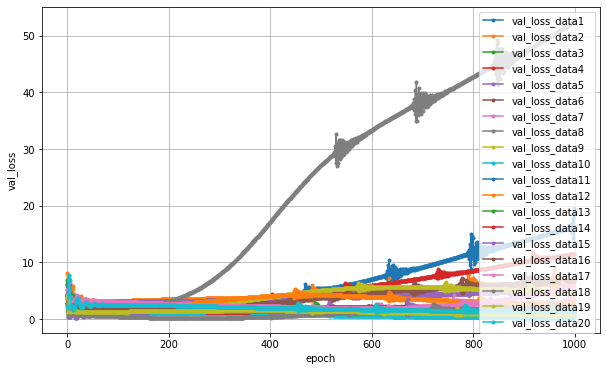

In [14]:
# 学習経過の可視化(大きさ)(validation)

val_loss_array = []
for i in range(len(history_size_array)):
    val_loss_array.append(history_size_array[i].history['val_loss'])
plt.figure(figsize=(10,6))
nb_epoch = len(val_loss_array[i])
for i in range(len(val_loss_array)):
    plt.plot(range(nb_epoch), val_loss_array[i], marker='.', label='val_loss_data%d'%((i+1)))
plt.legend(loc='best', fontsize=10)
plt.grid()
plt.xlabel('epoch')
plt.ylabel('val_loss')
plt.show()

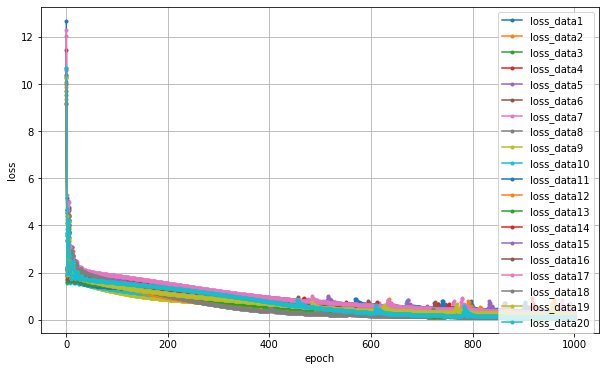

In [15]:
# 学習経過の可視化(大きさ)(train)

loss_array = []
for i in range(len(history_size_array)):
    loss_array.append(history_size_array[i].history['loss'])
plt.figure(figsize=(10,6))
nb_epoch = len(loss_array[i])
for i in range(len(loss_array)):
    plt.plot(range(nb_epoch), loss_array[i], marker='.', label='loss_data%d'%((i+1)))
plt.legend(loc='best', fontsize=10)
plt.grid()
plt.xlabel('epoch')
plt.ylabel('loss')
plt.show()

In [16]:
min_val_loss_array = []
for i in range(len(val_loss_array)):
    min_val_loss_array.append(min(val_loss_array[i]))

In [17]:
print(min_val_loss_array)

[1.3881375789642334, 1.2011184692382812, 0.6653518676757812, 2.4433741569519043, 2.9661130905151367, 1.8006336688995361, 1.051856279373169, 1.9204860925674438, 0.9912939071655273, 0.24216356873512268, 1.2632029056549072, 2.099682569503784, 0.3921920955181122, 1.3127567768096924, 0.22439153492450714, 1.3087153434753418, 1.9325166940689087, 0.1872621476650238, 0.6088765263557434, 1.1936895847320557]


In [18]:
# 平均と標準偏差
import statistics
import math
average = statistics.mean(min_val_loss_array)
stdev = statistics.pstdev(min_val_loss_array)
print(average)
print(stdev)

1.2596907429397106
0.7460544381721381
